In [9]:
#importing processed data
from_scratch = False
import pandas as pd
if from_scratch:
    df = pd.read_csv('all_data.csv', index_col = 0)

In [10]:
#dropping all features with NAN
if from_scratch:
    df = df.dropna(axis=1,how='any')

In [11]:
#Checking whether application is in both 
#Creating new dataframe with p100 metrics and v100 ipc
if from_scratch:
    df_check = None
    frames = []
    df_v = []
    df_p = []
    for name, item in df.groupby(['kernelname', 'input']):
        df_1 = df[ df['kernelname'] == name[0] ]
        df_2 = df_1[ df_1['input'] == name[1] ]
        if len(df_2) == 2:

            df_v = df_2[df_2['architecture'] == 'V100']
            df_p = df_2[df_2['architecture'] == 'P100']
            df_p['ipc'][0] = df_v.iloc[0]['ipc']
            frames.append(df_p)

    new_df = pd.concat(frames)

#print(new_df)

/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app
/usr/local/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2910: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  exec(code_obj, self.user_global_ns, self.user_ns)


In [12]:
#Splitting data with respect to architure
if from_scratch:
    df_P100 = df[ df['architecture'] == 'P100' ]
    df_V100 = df[ df['architecture'] == 'V100' ]


## Run if you have new data

In [13]:
if from_scratch:
    df_P100.to_csv('P100_all_data.csv')
    df_V100.to_csv('v100_all_data.csv')
    new_df.to_csv('new_df.csv')

## START HERE IF: Run if NO new data - set to TRUE

In [5]:
import pandas as pd
if True:
    df_P100 = pd.read_csv('p100_all_data.csv', index_col = 0)
    df_V100 = pd.read_csv('v100_all_data.csv', index_col = 0)
    new_df = pd.read_csv('new_df.csv', index_col = 0)

In [6]:
print("V100 shape", df_V100.shape)
print("P100 shape", df_P100.shape)

V100 shape (21125, 120)
P100 shape (32297, 120)


In [74]:
print(df_P100.index)

Index(['backpropP100_-100000_bpnn_adjust_weights_cuda',
       'backpropP100_-100000_bpnn_layerforward_CUDA',
       'backpropP100_-10000_bpnn_adjust_weights_cuda',
       'backpropP100_-10000_bpnn_layerforward_CUDA',
       'backpropP100_-100016_bpnn_adjust_weights_cuda',
       'backpropP100_-100016_bpnn_layerforward_CUDA',
       'backpropP100_-100032_bpnn_adjust_weights_cuda',
       'backpropP100_-100032_bpnn_layerforward_CUDA',
       'backpropP100_-100048_bpnn_adjust_weights_cuda',
       'backpropP100_-100048_bpnn_layerforward_CUDA',
       ...
       'streamP100_N9984_STREAM_Add', 'streamP100_N9984_STREAM_Copy',
       'streamP100_N9984_STREAM_Scale', 'streamP100_N9984_STREAM_Triad',
       'streamP100_N9984_set_array', 'streamP100_N99968_STREAM_Add',
       'streamP100_N99968_STREAM_Copy', 'streamP100_N99968_STREAM_Scale',
       'streamP100_N99968_STREAM_Triad', 'streamP100_N99968_set_array'],
      dtype='object', length=32297)


In [7]:
#Normalize Data 
#Columns with text: architecture, kernel, input, 
#application_name, kernalname
# new_def has p100 app metrics with v100 ipc
# Normalize df_p100

## Start here

In [8]:
#Dropping all columns with strings
df_p100_norm = df_P100.drop(columns=['shared_utilization','stall_other','single_precision_fu_utilization','architecture','input','application_name','kernelname','ipc'])





In [9]:
new_def_norm = new_df.drop(columns=['shared_utilization','stall_other','single_precision_fu_utilization','architecture','input','ipc','application_name','kernelname'])




## V100 DATA Split

In [10]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split


#V100 Data
df_v100_ipc = df_V100['ipc']
df_v100_ipc_values = df_v100_ipc.values

df_v100_noipc = df_V100.drop(columns=['shared_utilization','stall_other','single_precision_fu_utilization','architecture','input','application_name','kernelname','ipc'])
df_v100_noipc_values = df_v100_noipc.values
df_v100_noipc_norm = MinMaxScaler().fit_transform(df_v100_noipc_values)

# Split the data up in train and test sets
XV_train, XV_test, yV_train, yV_test = train_test_split(df_v100_noipc_norm, df_v100_ipc_values, test_size=0.33, random_state=42)


## Spitting V100 to different sizes

In [11]:
# test .05
XV_train05, XV_test05, yV_train05, yV_test05 = train_test_split(df_v100_noipc_norm, df_v100_ipc_values, test_size=0.05, random_state=42)

# test .1
XV_train1, XV_test1, yV_train1, yV_test1 = train_test_split(df_v100_noipc_norm, df_v100_ipc_values, test_size=0.1, random_state=42)

# test .01
XV_train01, XV_test01, yV_train01, yV_test01 = train_test_split(df_v100_noipc_norm, df_v100_ipc_values, test_size=0.01, random_state=42)



In [12]:
print(XV_train05.shape)
print(yV_train05.shape)
print(XV_train.shape)
print(yV_train.shape)

(20068, 112)
(20068,)
(14153, 112)
(14153,)


In [13]:
print('P100 data shape', df_p100_norm.shape)
print('V100 ipc with p100 metrics', new_def_norm.shape)

P100 data shape (32297, 112)
V100 ipc with p100 metrics (20582, 112)


## Normalized data for mixed data metrics

In [14]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

#ipc values
new_def_ipc = new_df['ipc']
new_def_ipc_values = new_def_ipc.values
#new_def_ipc_norm = MinMaxScaler().fit_transform(new_def_ipc_values)

#v100+p100 combined
new_def_norm_values = new_def_norm.values
new_def_norm = MinMaxScaler().fit_transform(new_def_norm_values)

#p100 only normalized
df_p100_ipc = df_P100.drop(columns=['shared_utilization','stall_other','single_precision_fu_utilization','architecture','input','application_name','kernelname'])
df_p100_ipc = df_p100_ipc['ipc']
p100_ipc_values = df_p100_ipc.values
#p100_ipc_norm = MinMaxScaler().fit_transform(p100_ipc_values)

#no ipc
df_p100_norm = df_P100.drop(columns=['shared_utilization','stall_other','single_precision_fu_utilization','architecture','input','application_name','kernelname','ipc'])
df_p100_norm = df_p100_norm.values
df_p100_norm = MinMaxScaler().fit_transform(df_p100_norm)


## Splitting data to train and test sets: P100 Data

In [15]:
# Import `train_test_split` from `sklearn.model_selection`
from sklearn.model_selection import train_test_split
X_P = df_p100_norm
Y_P = p100_ipc_values

# Split the data up in train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_P, Y_P, test_size=0.33, random_state=42)



## Splitting data to train and test sets: P100 data with V100 IPC

In [16]:
###!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!####
X_VP = new_def_norm 
Y_VP = new_def_ipc_values

# Split the data up in train and test sets
X_trainVP, X_testVP, y_trainVP, y_testVP = train_test_split(X_VP, Y_VP, test_size=0.02, random_state=42)

## Standardize the Data: P100

In [17]:
# Import `StandardScaler` from `sklearn.preprocessing`
from sklearn.preprocessing import StandardScaler

# Define the scaler 
scaler1 = StandardScaler().fit(X_train)

# Scale the train set
X_train = scaler1.transform(X_train)

# Scale the test set
X_test = scaler1.transform(X_test)

## Standardize the Data: V100

In [18]:
# Import `StandardScaler` from `sklearn.preprocessing`
from sklearn.preprocessing import StandardScaler

# Define the scaler 
scaler = StandardScaler().fit(XV_train)

# Scale the train set
XV_train = scaler.transform(XV_train)

# Scale the test set
XV_test = scaler.transform(XV_test)

## Standardize the Data: P100 data with V100 IPC

In [19]:
###!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!####

# Import `StandardScaler` from `sklearn.preprocessing`
from sklearn.preprocessing import StandardScaler

# Define the scaler 
#scalerVP = StandardScaler().fit(X_trainVP)
scalerVP = StandardScaler().fit(X_trainVP)

# Scale the train set
X_trainVP = scaler1.transform(X_trainVP)

# Scale the test set
X_testVP = scaler1.transform(X_testVP)



## Standardize Data 

In [20]:
# Import `StandardScaler` from `sklearn.preprocessing`
from sklearn.preprocessing import StandardScaler

def standardize_data(X_train, X_test):

    # Define the scaler 
    #scalerVP = StandardScaler().fit(X_trainVP)
    scalerVP = StandardScaler().fit(X_train)

    # Scale the train set
    X_train = scalerVP.transform(X_train)

    # Scale the test set
    X_test = scalerVP.transform(X_test)

    return X_train, X_test

In [21]:
## XV_train05, XV_test05, yV_train05, yV_test05
XV_train05, XV_test05 = standardize_data(XV_train05, XV_test05)
XV_train01, XV_test01 = standardize_data(XV_train01, XV_test01)
XV_train1, XV_test1 = standardize_data(XV_train1, XV_test1)

In [22]:
print(XV_train05.shape)
print(yV_train05.shape)
print(XV_test05.shape)
print(yV_test05.shape)

(20068, 112)
(20068,)
(1057, 112)
(1057,)


## V100 IPC vs P100 IPC

In [23]:
"""import scipy as sp
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
# Plotting predicted vs true

fig, ax = plt.subplots()

# Make the plot
ax.scatter(Y_VP, Y_P, alpha=0.5)

# Make it pretty
ax.set_xlim(ax.get_xlim())
ax.set_ylim(ax.get_xlim())

ax.set_xlabel('True IPC')
ax.set_ylabel('Pred. IPC')

fig.set_size_inches(3.5, 3.5)

# Add in the goal line
ax.plot(ax.get_xlim(), ax.get_ylim(), 'k--'); """

"import scipy as sp\nimport numpy as np\nimport matplotlib.pyplot as plt\n%matplotlib inline\n# Plotting predicted vs true\n\nfig, ax = plt.subplots()\n\n# Make the plot\nax.scatter(Y_VP, Y_P, alpha=0.5)\n\n# Make it pretty\nax.set_xlim(ax.get_xlim())\nax.set_ylim(ax.get_xlim())\n\nax.set_xlabel('True IPC')\nax.set_ylabel('Pred. IPC')\n\nfig.set_size_inches(3.5, 3.5)\n\n# Add in the goal line\nax.plot(ax.get_xlim(), ax.get_ylim(), 'k--'); "

## Transfer Learning Model

In [24]:
import numpy
import pandas
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline


# Create your first MLP in Keras
from keras.models import Sequential
from keras.layers import Dense
import numpy
# fix random seed for reproducibility
numpy.random.seed(7)
# load pima indians dataset
#dataset = pd.read_csv("p100_only.csv", delimiter=",").values
# split into input (X) and output (Y) variables
#X = dataset[:,0:8]
#Y = dataset[:,8]
# create model
def my_model():
    model = Sequential()
    """
    #original simple dl model
    model.add(Dense(12, input_dim=112, kernel_initializer='normal',activation='relu'))
    model.add(Dense(8, activation='relu'))
    model.add(Dense(8, activation='relu'))
    model.add(Dense(6, activation='relu'))
    model.add(Dense(1, activation='relu'))"""
    model.add(Dense(120, input_dim=112, kernel_initializer='normal',activation='relu'))
    model.add(Dense(115, activation='relu'))
    model.add(Dense(110, activation='relu'))
    model.add(Dense(110, activation='relu'))
    model.add(Dense(80, activation='relu'))
    model.add(Dense(50, activation='relu'))
    model.add(Dense(20, activation='relu'))
    model.add(Dense(1, activation=None))
    # Compile model
    #mean absolute percentage error - indicating that we seek to minimize the mean percentage difference between 
    #predicted ipc and the actual ipc
    model.compile(loss='mse', optimizer='adam', metrics=['mse','mae'])
    # Fit the model
    ## model.fit(X, Y, epochs=10, batch_size=10) ##works

    """
    # evaluate the model
    scores = model.evaluate(X, Y)
    print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))"""
    return model

In [25]:
print(X_P.shape)
print(Y_P.shape)

(32297, 112)
(32297,)


In [26]:
p_model = my_model()
p_model.fit(X_train, y_train, epochs=20000, batch_size=10000, verbose=1,validation_split=0.2)

Train on 17310 samples, validate on 4328 samples
Epoch 1/20000
17310/17310 [==============================] - 1s 31us/step - loss: 1.0872 - mean_squared_error: 1.0872 - mean_absolute_error: 0.8951 - val_loss: 0.8190 - val_mean_squared_error: 0.8190 - val_mean_absolute_error: 0.7501
Epoch 2/20000
17310/17310 [==============================] - 0s 8us/step - loss: 0.7890 - mean_squared_error: 0.7890 - mean_absolute_error: 0.7305 - val_loss: 0.5324 - val_mean_squared_error: 0.5324 - val_mean_absolute_error: 0.5582
Epoch 3/20000
17310/17310 [==============================] - 0s 7us/step - loss: 0.4912 - mean_squared_error: 0.4912 - mean_absolute_error: 0.5204 - val_loss: 0.2898 - val_mean_squared_error: 0.2898 - val_mean_absolute_error: 0.3831
Epoch 4/20000
17310/17310 [==============================] - 0s 8us/step - loss: 0.2577 - mean_squared_error: 0.2577 - mean_absolute_error: 0.3729 - val_loss: 0.1693 - val_mean_squared_error: 0.1693 - val_mean_absolute_error: 0.2921
Epoch 5/20000
1731

Epoch 36/20000
17310/17310 [==============================] - 0s 8us/step - loss: 0.0011 - mean_squared_error: 0.0011 - mean_absolute_error: 0.0199 - val_loss: 0.0014 - val_mean_squared_error: 0.0014 - val_mean_absolute_error: 0.0197
Epoch 37/20000
17310/17310 [==============================] - 0s 8us/step - loss: 0.0010 - mean_squared_error: 0.0010 - mean_absolute_error: 0.0183 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0181
Epoch 38/20000
17310/17310 [==============================] - 0s 8us/step - loss: 9.9646e-04 - mean_squared_error: 9.9646e-04 - mean_absolute_error: 0.0171 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0187
Epoch 39/20000
17310/17310 [==============================] - 0s 8us/step - loss: 0.0010 - mean_squared_error: 0.0010 - mean_absolute_error: 0.0177 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0180
Epoch 40/20000
17310/17310 [============================

Epoch 102/20000
17310/17310 [==============================] - 0s 9us/step - loss: 4.1176e-04 - mean_squared_error: 4.1176e-04 - mean_absolute_error: 0.0117 - val_loss: 7.1698e-04 - val_mean_squared_error: 7.1698e-04 - val_mean_absolute_error: 0.0123
Epoch 103/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.0808e-04 - mean_squared_error: 4.0808e-04 - mean_absolute_error: 0.0117 - val_loss: 7.1520e-04 - val_mean_squared_error: 7.1520e-04 - val_mean_absolute_error: 0.0122
Epoch 104/20000
17310/17310 [==============================] - 0s 9us/step - loss: 4.0486e-04 - mean_squared_error: 4.0486e-04 - mean_absolute_error: 0.0116 - val_loss: 7.0957e-04 - val_mean_squared_error: 7.0957e-04 - val_mean_absolute_error: 0.0122
Epoch 105/20000
17310/17310 [==============================] - 0s 9us/step - loss: 4.0133e-04 - mean_squared_error: 4.0133e-04 - mean_absolute_error: 0.0116 - val_loss: 7.0669e-04 - val_mean_squared_error: 7.0669e-04 - val_mean_absolute_error: 0.0

Epoch 135/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.4551e-04 - mean_squared_error: 3.4551e-04 - mean_absolute_error: 0.0107 - val_loss: 6.4902e-04 - val_mean_squared_error: 6.4902e-04 - val_mean_absolute_error: 0.0115
Epoch 136/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.4487e-04 - mean_squared_error: 3.4487e-04 - mean_absolute_error: 0.0108 - val_loss: 6.4403e-04 - val_mean_squared_error: 6.4403e-04 - val_mean_absolute_error: 0.0113
Epoch 137/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.3852e-04 - mean_squared_error: 3.3852e-04 - mean_absolute_error: 0.0107 - val_loss: 6.7168e-04 - val_mean_squared_error: 6.7168e-04 - val_mean_absolute_error: 0.0113
Epoch 138/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.3556e-04 - mean_squared_error: 3.3556e-04 - mean_absolute_error: 0.0107 - val_loss: 6.4975e-04 - val_mean_squared_error: 6.4975e-04 - val_mean_absolute_error: 0.0

Epoch 168/20000
17310/17310 [==============================] - 0s 9us/step - loss: 2.8665e-04 - mean_squared_error: 2.8665e-04 - mean_absolute_error: 0.0099 - val_loss: 5.8736e-04 - val_mean_squared_error: 5.8736e-04 - val_mean_absolute_error: 0.0106
Epoch 169/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.8606e-04 - mean_squared_error: 2.8606e-04 - mean_absolute_error: 0.0098 - val_loss: 5.8607e-04 - val_mean_squared_error: 5.8607e-04 - val_mean_absolute_error: 0.0106
Epoch 170/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.8516e-04 - mean_squared_error: 2.8516e-04 - mean_absolute_error: 0.0099 - val_loss: 5.8501e-04 - val_mean_squared_error: 5.8501e-04 - val_mean_absolute_error: 0.0107
Epoch 171/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.8423e-04 - mean_squared_error: 2.8423e-04 - mean_absolute_error: 0.0099 - val_loss: 5.8632e-04 - val_mean_squared_error: 5.8632e-04 - val_mean_absolute_error: 0.0

Epoch 201/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.6034e-04 - mean_squared_error: 2.6034e-04 - mean_absolute_error: 0.0094 - val_loss: 5.6248e-04 - val_mean_squared_error: 5.6248e-04 - val_mean_absolute_error: 0.0101
Epoch 202/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.6033e-04 - mean_squared_error: 2.6033e-04 - mean_absolute_error: 0.0094 - val_loss: 5.5570e-04 - val_mean_squared_error: 5.5570e-04 - val_mean_absolute_error: 0.0101
Epoch 203/20000
17310/17310 [==============================] - 0s 9us/step - loss: 2.5920e-04 - mean_squared_error: 2.5920e-04 - mean_absolute_error: 0.0094 - val_loss: 5.5746e-04 - val_mean_squared_error: 5.5746e-04 - val_mean_absolute_error: 0.0100
Epoch 204/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.5841e-04 - mean_squared_error: 2.5841e-04 - mean_absolute_error: 0.0093 - val_loss: 5.5642e-04 - val_mean_squared_error: 5.5642e-04 - val_mean_absolute_error: 0.0

Epoch 234/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.4129e-04 - mean_squared_error: 2.4129e-04 - mean_absolute_error: 0.0089 - val_loss: 5.3497e-04 - val_mean_squared_error: 5.3497e-04 - val_mean_absolute_error: 0.0098
Epoch 235/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.4085e-04 - mean_squared_error: 2.4085e-04 - mean_absolute_error: 0.0091 - val_loss: 5.3513e-04 - val_mean_squared_error: 5.3513e-04 - val_mean_absolute_error: 0.0098
Epoch 236/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.3915e-04 - mean_squared_error: 2.3915e-04 - mean_absolute_error: 0.0090 - val_loss: 5.3804e-04 - val_mean_squared_error: 5.3804e-04 - val_mean_absolute_error: 0.0097
Epoch 237/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.3990e-04 - mean_squared_error: 2.3990e-04 - mean_absolute_error: 0.0090 - val_loss: 5.3410e-04 - val_mean_squared_error: 5.3410e-04 - val_mean_absolute_error: 0.0

Epoch 267/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.2406e-04 - mean_squared_error: 2.2406e-04 - mean_absolute_error: 0.0087 - val_loss: 5.2647e-04 - val_mean_squared_error: 5.2647e-04 - val_mean_absolute_error: 0.0095
Epoch 268/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.2285e-04 - mean_squared_error: 2.2285e-04 - mean_absolute_error: 0.0086 - val_loss: 5.2969e-04 - val_mean_squared_error: 5.2969e-04 - val_mean_absolute_error: 0.0095
Epoch 269/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.2273e-04 - mean_squared_error: 2.2273e-04 - mean_absolute_error: 0.0086 - val_loss: 5.2643e-04 - val_mean_squared_error: 5.2643e-04 - val_mean_absolute_error: 0.0096
Epoch 270/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.2329e-04 - mean_squared_error: 2.2329e-04 - mean_absolute_error: 0.0087 - val_loss: 5.2751e-04 - val_mean_squared_error: 5.2751e-04 - val_mean_absolute_error: 0.0

Epoch 300/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.2386e-04 - mean_squared_error: 2.2386e-04 - mean_absolute_error: 0.0087 - val_loss: 5.1952e-04 - val_mean_squared_error: 5.1952e-04 - val_mean_absolute_error: 0.0092
Epoch 301/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.1679e-04 - mean_squared_error: 2.1679e-04 - mean_absolute_error: 0.0085 - val_loss: 5.1878e-04 - val_mean_squared_error: 5.1878e-04 - val_mean_absolute_error: 0.0092
Epoch 302/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.1325e-04 - mean_squared_error: 2.1325e-04 - mean_absolute_error: 0.0086 - val_loss: 5.2094e-04 - val_mean_squared_error: 5.2094e-04 - val_mean_absolute_error: 0.0093
Epoch 303/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.1285e-04 - mean_squared_error: 2.1285e-04 - mean_absolute_error: 0.0084 - val_loss: 5.1760e-04 - val_mean_squared_error: 5.1760e-04 - val_mean_absolute_error: 0.0

Epoch 333/20000
17310/17310 [==============================] - 0s 11us/step - loss: 1.9698e-04 - mean_squared_error: 1.9698e-04 - mean_absolute_error: 0.0082 - val_loss: 5.2894e-04 - val_mean_squared_error: 5.2894e-04 - val_mean_absolute_error: 0.0089
Epoch 334/20000
17310/17310 [==============================] - 0s 9us/step - loss: 1.9623e-04 - mean_squared_error: 1.9623e-04 - mean_absolute_error: 0.0080 - val_loss: 5.2514e-04 - val_mean_squared_error: 5.2514e-04 - val_mean_absolute_error: 0.0090
Epoch 335/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.9610e-04 - mean_squared_error: 1.9610e-04 - mean_absolute_error: 0.0081 - val_loss: 5.2584e-04 - val_mean_squared_error: 5.2584e-04 - val_mean_absolute_error: 0.0090
Epoch 336/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.9502e-04 - mean_squared_error: 1.9502e-04 - mean_absolute_error: 0.0081 - val_loss: 5.2474e-04 - val_mean_squared_error: 5.2474e-04 - val_mean_absolute_error: 0.

Epoch 366/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.9543e-04 - mean_squared_error: 1.9543e-04 - mean_absolute_error: 0.0081 - val_loss: 5.5286e-04 - val_mean_squared_error: 5.5286e-04 - val_mean_absolute_error: 0.0090
Epoch 367/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.9236e-04 - mean_squared_error: 1.9236e-04 - mean_absolute_error: 0.0080 - val_loss: 5.4414e-04 - val_mean_squared_error: 5.4414e-04 - val_mean_absolute_error: 0.0092
Epoch 368/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.9424e-04 - mean_squared_error: 1.9424e-04 - mean_absolute_error: 0.0081 - val_loss: 5.5226e-04 - val_mean_squared_error: 5.5226e-04 - val_mean_absolute_error: 0.0091
Epoch 369/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.9032e-04 - mean_squared_error: 1.9032e-04 - mean_absolute_error: 0.0081 - val_loss: 5.4482e-04 - val_mean_squared_error: 5.4482e-04 - val_mean_absolute_error: 0.0

Epoch 399/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.7608e-04 - mean_squared_error: 1.7608e-04 - mean_absolute_error: 0.0077 - val_loss: 5.6048e-04 - val_mean_squared_error: 5.6048e-04 - val_mean_absolute_error: 0.0090
Epoch 400/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.7728e-04 - mean_squared_error: 1.7728e-04 - mean_absolute_error: 0.0078 - val_loss: 5.5269e-04 - val_mean_squared_error: 5.5269e-04 - val_mean_absolute_error: 0.0087
Epoch 401/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.7826e-04 - mean_squared_error: 1.7826e-04 - mean_absolute_error: 0.0078 - val_loss: 5.5415e-04 - val_mean_squared_error: 5.5415e-04 - val_mean_absolute_error: 0.0086
Epoch 402/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.7505e-04 - mean_squared_error: 1.7505e-04 - mean_absolute_error: 0.0076 - val_loss: 5.5638e-04 - val_mean_squared_error: 5.5638e-04 - val_mean_absolute_error: 0.0

Epoch 432/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.6946e-04 - mean_squared_error: 1.6946e-04 - mean_absolute_error: 0.0077 - val_loss: 5.7279e-04 - val_mean_squared_error: 5.7279e-04 - val_mean_absolute_error: 0.0084
Epoch 433/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.6346e-04 - mean_squared_error: 1.6346e-04 - mean_absolute_error: 0.0074 - val_loss: 5.7381e-04 - val_mean_squared_error: 5.7381e-04 - val_mean_absolute_error: 0.0084
Epoch 434/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.6315e-04 - mean_squared_error: 1.6315e-04 - mean_absolute_error: 0.0074 - val_loss: 5.7702e-04 - val_mean_squared_error: 5.7702e-04 - val_mean_absolute_error: 0.0085
Epoch 435/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.6362e-04 - mean_squared_error: 1.6362e-04 - mean_absolute_error: 0.0075 - val_loss: 5.7366e-04 - val_mean_squared_error: 5.7366e-04 - val_mean_absolute_error: 0.0

Epoch 465/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.0425e-04 - mean_squared_error: 2.0425e-04 - mean_absolute_error: 0.0080 - val_loss: 6.7447e-04 - val_mean_squared_error: 6.7447e-04 - val_mean_absolute_error: 0.0095
Epoch 466/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.1096e-04 - mean_squared_error: 2.1096e-04 - mean_absolute_error: 0.0082 - val_loss: 6.4595e-04 - val_mean_squared_error: 6.4595e-04 - val_mean_absolute_error: 0.0088
Epoch 467/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.3031e-04 - mean_squared_error: 2.3031e-04 - mean_absolute_error: 0.0080 - val_loss: 7.4608e-04 - val_mean_squared_error: 7.4608e-04 - val_mean_absolute_error: 0.0097
Epoch 468/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.0316e-04 - mean_squared_error: 3.0316e-04 - mean_absolute_error: 0.0085 - val_loss: 6.3255e-04 - val_mean_squared_error: 6.3255e-04 - val_mean_absolute_error: 0.0

Epoch 498/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.5158e-04 - mean_squared_error: 1.5158e-04 - mean_absolute_error: 0.0071 - val_loss: 6.7082e-04 - val_mean_squared_error: 6.7082e-04 - val_mean_absolute_error: 0.0083
Epoch 499/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.4961e-04 - mean_squared_error: 1.4961e-04 - mean_absolute_error: 0.0071 - val_loss: 6.6406e-04 - val_mean_squared_error: 6.6406e-04 - val_mean_absolute_error: 0.0081
Epoch 500/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.5437e-04 - mean_squared_error: 1.5437e-04 - mean_absolute_error: 0.0071 - val_loss: 6.7894e-04 - val_mean_squared_error: 6.7894e-04 - val_mean_absolute_error: 0.0085
Epoch 501/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.5327e-04 - mean_squared_error: 1.5327e-04 - mean_absolute_error: 0.0072 - val_loss: 6.6607e-04 - val_mean_squared_error: 6.6607e-04 - val_mean_absolute_error: 0.0

Epoch 531/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.4224e-04 - mean_squared_error: 1.4224e-04 - mean_absolute_error: 0.0069 - val_loss: 6.7909e-04 - val_mean_squared_error: 6.7909e-04 - val_mean_absolute_error: 0.0080
Epoch 532/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.4202e-04 - mean_squared_error: 1.4202e-04 - mean_absolute_error: 0.0070 - val_loss: 6.8065e-04 - val_mean_squared_error: 6.8065e-04 - val_mean_absolute_error: 0.0081
Epoch 533/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.4333e-04 - mean_squared_error: 1.4333e-04 - mean_absolute_error: 0.0070 - val_loss: 6.7620e-04 - val_mean_squared_error: 6.7620e-04 - val_mean_absolute_error: 0.0082
Epoch 534/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.4149e-04 - mean_squared_error: 1.4149e-04 - mean_absolute_error: 0.0070 - val_loss: 6.8114e-04 - val_mean_squared_error: 6.8114e-04 - val_mean_absolute_error: 0.0

Epoch 564/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.3717e-04 - mean_squared_error: 1.3717e-04 - mean_absolute_error: 0.0068 - val_loss: 7.0197e-04 - val_mean_squared_error: 7.0197e-04 - val_mean_absolute_error: 0.0084
Epoch 565/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.4370e-04 - mean_squared_error: 1.4370e-04 - mean_absolute_error: 0.0072 - val_loss: 6.9058e-04 - val_mean_squared_error: 6.9058e-04 - val_mean_absolute_error: 0.0078
Epoch 566/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.3701e-04 - mean_squared_error: 1.3701e-04 - mean_absolute_error: 0.0069 - val_loss: 7.0134e-04 - val_mean_squared_error: 7.0134e-04 - val_mean_absolute_error: 0.0082
Epoch 567/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.4181e-04 - mean_squared_error: 1.4181e-04 - mean_absolute_error: 0.0070 - val_loss: 6.9097e-04 - val_mean_squared_error: 6.9097e-04 - val_mean_absolute_error: 0.0

Epoch 597/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.3371e-04 - mean_squared_error: 1.3371e-04 - mean_absolute_error: 0.0069 - val_loss: 7.1322e-04 - val_mean_squared_error: 7.1322e-04 - val_mean_absolute_error: 0.0078
Epoch 598/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.3532e-04 - mean_squared_error: 1.3532e-04 - mean_absolute_error: 0.0068 - val_loss: 7.1153e-04 - val_mean_squared_error: 7.1153e-04 - val_mean_absolute_error: 0.0077
Epoch 599/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.2839e-04 - mean_squared_error: 1.2839e-04 - mean_absolute_error: 0.0066 - val_loss: 7.2421e-04 - val_mean_squared_error: 7.2421e-04 - val_mean_absolute_error: 0.0077
Epoch 600/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.3521e-04 - mean_squared_error: 1.3521e-04 - mean_absolute_error: 0.0069 - val_loss: 7.2017e-04 - val_mean_squared_error: 7.2017e-04 - val_mean_absolute_error: 0.0

Epoch 630/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.4376e-04 - mean_squared_error: 1.4376e-04 - mean_absolute_error: 0.0073 - val_loss: 7.4501e-04 - val_mean_squared_error: 7.4501e-04 - val_mean_absolute_error: 0.0077
Epoch 631/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.2837e-04 - mean_squared_error: 1.2837e-04 - mean_absolute_error: 0.0067 - val_loss: 7.3557e-04 - val_mean_squared_error: 7.3557e-04 - val_mean_absolute_error: 0.0080
Epoch 632/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.4153e-04 - mean_squared_error: 1.4153e-04 - mean_absolute_error: 0.0071 - val_loss: 7.5298e-04 - val_mean_squared_error: 7.5298e-04 - val_mean_absolute_error: 0.0091
Epoch 633/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.4498e-04 - mean_squared_error: 1.4498e-04 - mean_absolute_error: 0.0075 - val_loss: 7.3245e-04 - val_mean_squared_error: 7.3245e-04 - val_mean_absolute_error: 0.0

Epoch 663/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.2291e-04 - mean_squared_error: 1.2291e-04 - mean_absolute_error: 0.0065 - val_loss: 7.4810e-04 - val_mean_squared_error: 7.4810e-04 - val_mean_absolute_error: 0.0078
Epoch 664/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.2066e-04 - mean_squared_error: 1.2066e-04 - mean_absolute_error: 0.0066 - val_loss: 7.4510e-04 - val_mean_squared_error: 7.4510e-04 - val_mean_absolute_error: 0.0074
Epoch 665/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.2028e-04 - mean_squared_error: 1.2028e-04 - mean_absolute_error: 0.0064 - val_loss: 7.4571e-04 - val_mean_squared_error: 7.4571e-04 - val_mean_absolute_error: 0.0075
Epoch 666/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.2275e-04 - mean_squared_error: 1.2275e-04 - mean_absolute_error: 0.0065 - val_loss: 7.4771e-04 - val_mean_squared_error: 7.4771e-04 - val_mean_absolute_error: 0.0

Epoch 696/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.3276e-04 - mean_squared_error: 1.3276e-04 - mean_absolute_error: 0.0070 - val_loss: 7.9010e-04 - val_mean_squared_error: 7.9010e-04 - val_mean_absolute_error: 0.0080
Epoch 697/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.3086e-04 - mean_squared_error: 1.3086e-04 - mean_absolute_error: 0.0071 - val_loss: 7.8974e-04 - val_mean_squared_error: 7.8974e-04 - val_mean_absolute_error: 0.0080
Epoch 698/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.2767e-04 - mean_squared_error: 1.2767e-04 - mean_absolute_error: 0.0069 - val_loss: 7.7868e-04 - val_mean_squared_error: 7.7868e-04 - val_mean_absolute_error: 0.0076
Epoch 699/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.1473e-04 - mean_squared_error: 1.1473e-04 - mean_absolute_error: 0.0063 - val_loss: 7.6569e-04 - val_mean_squared_error: 7.6569e-04 - val_mean_absolute_error: 0.0

Epoch 729/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.2494e-04 - mean_squared_error: 1.2494e-04 - mean_absolute_error: 0.0070 - val_loss: 7.9148e-04 - val_mean_squared_error: 7.9148e-04 - val_mean_absolute_error: 0.0073
Epoch 730/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.1209e-04 - mean_squared_error: 1.1209e-04 - mean_absolute_error: 0.0062 - val_loss: 7.8423e-04 - val_mean_squared_error: 7.8423e-04 - val_mean_absolute_error: 0.0075
Epoch 731/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.0956e-04 - mean_squared_error: 1.0956e-04 - mean_absolute_error: 0.0063 - val_loss: 7.9201e-04 - val_mean_squared_error: 7.9201e-04 - val_mean_absolute_error: 0.0074
Epoch 732/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.1321e-04 - mean_squared_error: 1.1321e-04 - mean_absolute_error: 0.0063 - val_loss: 7.8498e-04 - val_mean_squared_error: 7.8498e-04 - val_mean_absolute_error: 0.0

Epoch 762/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.1669e-04 - mean_squared_error: 1.1669e-04 - mean_absolute_error: 0.0066 - val_loss: 8.4105e-04 - val_mean_squared_error: 8.4105e-04 - val_mean_absolute_error: 0.0084
Epoch 763/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.3595e-04 - mean_squared_error: 1.3595e-04 - mean_absolute_error: 0.0073 - val_loss: 8.2730e-04 - val_mean_squared_error: 8.2730e-04 - val_mean_absolute_error: 0.0078
Epoch 764/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.1740e-04 - mean_squared_error: 1.1740e-04 - mean_absolute_error: 0.0065 - val_loss: 8.0436e-04 - val_mean_squared_error: 8.0436e-04 - val_mean_absolute_error: 0.0074
Epoch 765/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.1227e-04 - mean_squared_error: 1.1227e-04 - mean_absolute_error: 0.0065 - val_loss: 8.2998e-04 - val_mean_squared_error: 8.2998e-04 - val_mean_absolute_error: 0.0

Epoch 795/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.7379e-04 - mean_squared_error: 1.7379e-04 - mean_absolute_error: 0.0086 - val_loss: 8.7028e-04 - val_mean_squared_error: 8.7028e-04 - val_mean_absolute_error: 0.0088
Epoch 796/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.4876e-04 - mean_squared_error: 1.4876e-04 - mean_absolute_error: 0.0076 - val_loss: 8.7758e-04 - val_mean_squared_error: 8.7758e-04 - val_mean_absolute_error: 0.0087
Epoch 797/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.3540e-04 - mean_squared_error: 1.3540e-04 - mean_absolute_error: 0.0072 - val_loss: 8.4157e-04 - val_mean_squared_error: 8.4157e-04 - val_mean_absolute_error: 0.0085
Epoch 798/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.3292e-04 - mean_squared_error: 1.3292e-04 - mean_absolute_error: 0.0073 - val_loss: 8.4456e-04 - val_mean_squared_error: 8.4456e-04 - val_mean_absolute_error: 0.0

Epoch 828/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.2917e-04 - mean_squared_error: 1.2917e-04 - mean_absolute_error: 0.0074 - val_loss: 9.2530e-04 - val_mean_squared_error: 9.2530e-04 - val_mean_absolute_error: 0.0085
Epoch 829/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.4267e-04 - mean_squared_error: 1.4267e-04 - mean_absolute_error: 0.0077 - val_loss: 8.9156e-04 - val_mean_squared_error: 8.9156e-04 - val_mean_absolute_error: 0.0084
Epoch 830/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.2321e-04 - mean_squared_error: 1.2321e-04 - mean_absolute_error: 0.0070 - val_loss: 8.7351e-04 - val_mean_squared_error: 8.7351e-04 - val_mean_absolute_error: 0.0072
Epoch 831/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.0728e-04 - mean_squared_error: 1.0728e-04 - mean_absolute_error: 0.0060 - val_loss: 8.7417e-04 - val_mean_squared_error: 8.7417e-04 - val_mean_absolute_error: 0.0

Epoch 861/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.0508e-04 - mean_squared_error: 1.0508e-04 - mean_absolute_error: 0.0064 - val_loss: 8.6626e-04 - val_mean_squared_error: 8.6626e-04 - val_mean_absolute_error: 0.0069
Epoch 862/20000
17310/17310 [==============================] - 0s 8us/step - loss: 9.8105e-05 - mean_squared_error: 9.8105e-05 - mean_absolute_error: 0.0058 - val_loss: 8.6107e-04 - val_mean_squared_error: 8.6107e-04 - val_mean_absolute_error: 0.0071
Epoch 863/20000
17310/17310 [==============================] - 0s 8us/step - loss: 9.9070e-05 - mean_squared_error: 9.9070e-05 - mean_absolute_error: 0.0059 - val_loss: 8.6751e-04 - val_mean_squared_error: 8.6751e-04 - val_mean_absolute_error: 0.0075
Epoch 864/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.0479e-04 - mean_squared_error: 1.0479e-04 - mean_absolute_error: 0.0063 - val_loss: 8.7182e-04 - val_mean_squared_error: 8.7182e-04 - val_mean_absolute_error: 0.0

Epoch 894/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.0105e-04 - mean_squared_error: 1.0105e-04 - mean_absolute_error: 0.0061 - val_loss: 8.8835e-04 - val_mean_squared_error: 8.8835e-04 - val_mean_absolute_error: 0.0073
Epoch 895/20000
17310/17310 [==============================] - 0s 7us/step - loss: 9.9140e-05 - mean_squared_error: 9.9140e-05 - mean_absolute_error: 0.0061 - val_loss: 8.9581e-04 - val_mean_squared_error: 8.9581e-04 - val_mean_absolute_error: 0.0071
Epoch 896/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.0066e-04 - mean_squared_error: 1.0066e-04 - mean_absolute_error: 0.0061 - val_loss: 8.8605e-04 - val_mean_squared_error: 8.8605e-04 - val_mean_absolute_error: 0.0070
Epoch 897/20000
17310/17310 [==============================] - 0s 7us/step - loss: 9.5832e-05 - mean_squared_error: 9.5832e-05 - mean_absolute_error: 0.0058 - val_loss: 8.8618e-04 - val_mean_squared_error: 8.8618e-04 - val_mean_absolute_error: 0.0

Epoch 927/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.2001e-04 - mean_squared_error: 1.2001e-04 - mean_absolute_error: 0.0069 - val_loss: 9.1347e-04 - val_mean_squared_error: 9.1347e-04 - val_mean_absolute_error: 0.0074
Epoch 928/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.0006e-04 - mean_squared_error: 1.0006e-04 - mean_absolute_error: 0.0060 - val_loss: 8.9347e-04 - val_mean_squared_error: 8.9347e-04 - val_mean_absolute_error: 0.0070
Epoch 929/20000
17310/17310 [==============================] - 0s 8us/step - loss: 9.7967e-05 - mean_squared_error: 9.7967e-05 - mean_absolute_error: 0.0060 - val_loss: 9.0317e-04 - val_mean_squared_error: 9.0317e-04 - val_mean_absolute_error: 0.0079
Epoch 930/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.1070e-04 - mean_squared_error: 1.1070e-04 - mean_absolute_error: 0.0068 - val_loss: 9.0249e-04 - val_mean_squared_error: 9.0249e-04 - val_mean_absolute_error: 0.0

Epoch 960/20000
17310/17310 [==============================] - 0s 7us/step - loss: 9.1559e-05 - mean_squared_error: 9.1559e-05 - mean_absolute_error: 0.0057 - val_loss: 9.0086e-04 - val_mean_squared_error: 9.0086e-04 - val_mean_absolute_error: 0.0068
Epoch 961/20000
17310/17310 [==============================] - 0s 8us/step - loss: 9.1228e-05 - mean_squared_error: 9.1228e-05 - mean_absolute_error: 0.0056 - val_loss: 9.1562e-04 - val_mean_squared_error: 9.1562e-04 - val_mean_absolute_error: 0.0072
Epoch 962/20000
17310/17310 [==============================] - 0s 7us/step - loss: 9.6509e-05 - mean_squared_error: 9.6509e-05 - mean_absolute_error: 0.0059 - val_loss: 9.0631e-04 - val_mean_squared_error: 9.0631e-04 - val_mean_absolute_error: 0.0074
Epoch 963/20000
17310/17310 [==============================] - 0s 7us/step - loss: 9.4794e-05 - mean_squared_error: 9.4794e-05 - mean_absolute_error: 0.0060 - val_loss: 9.1359e-04 - val_mean_squared_error: 9.1359e-04 - val_mean_absolute_error: 0.0

Epoch 993/20000
17310/17310 [==============================] - 0s 7us/step - loss: 9.6062e-05 - mean_squared_error: 9.6062e-05 - mean_absolute_error: 0.0059 - val_loss: 9.1869e-04 - val_mean_squared_error: 9.1869e-04 - val_mean_absolute_error: 0.0071
Epoch 994/20000
17310/17310 [==============================] - 0s 7us/step - loss: 9.0303e-05 - mean_squared_error: 9.0303e-05 - mean_absolute_error: 0.0058 - val_loss: 9.1840e-04 - val_mean_squared_error: 9.1840e-04 - val_mean_absolute_error: 0.0071
Epoch 995/20000
17310/17310 [==============================] - 0s 8us/step - loss: 9.4123e-05 - mean_squared_error: 9.4123e-05 - mean_absolute_error: 0.0059 - val_loss: 9.2109e-04 - val_mean_squared_error: 9.2109e-04 - val_mean_absolute_error: 0.0071
Epoch 996/20000
17310/17310 [==============================] - 0s 8us/step - loss: 9.5205e-05 - mean_squared_error: 9.5205e-05 - mean_absolute_error: 0.0059 - val_loss: 9.2853e-04 - val_mean_squared_error: 9.2853e-04 - val_mean_absolute_error: 0.0

Epoch 1058/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.1291e-04 - mean_squared_error: 1.1291e-04 - mean_absolute_error: 0.0061 - val_loss: 9.6309e-04 - val_mean_squared_error: 9.6309e-04 - val_mean_absolute_error: 0.0071
Epoch 1059/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.1072e-04 - mean_squared_error: 1.1072e-04 - mean_absolute_error: 0.0059 - val_loss: 9.3627e-04 - val_mean_squared_error: 9.3627e-04 - val_mean_absolute_error: 0.0081
Epoch 1060/20000
17310/17310 [==============================] - 0s 9us/step - loss: 1.2990e-04 - mean_squared_error: 1.2990e-04 - mean_absolute_error: 0.0069 - val_loss: 9.9570e-04 - val_mean_squared_error: 9.9570e-04 - val_mean_absolute_error: 0.0088
Epoch 1061/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.7142e-04 - mean_squared_error: 1.7142e-04 - mean_absolute_error: 0.0074 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0099


17310/17310 [==============================] - 0s 7us/step - loss: 9.9489e-05 - mean_squared_error: 9.9489e-05 - mean_absolute_error: 0.0063 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0076
Epoch 1125/20000
17310/17310 [==============================] - 0s 8us/step - loss: 9.4859e-05 - mean_squared_error: 9.4859e-05 - mean_absolute_error: 0.0060 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0069
Epoch 1126/20000
17310/17310 [==============================] - 0s 8us/step - loss: 8.4959e-05 - mean_squared_error: 8.4959e-05 - mean_absolute_error: 0.0056 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0066
Epoch 1127/20000
17310/17310 [==============================] - 0s 7us/step - loss: 8.3582e-05 - mean_squared_error: 8.3582e-05 - mean_absolute_error: 0.0054 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0066
Epoch 1128/20000
17310/17310 [===========

Epoch 1158/20000
17310/17310 [==============================] - 0s 7us/step - loss: 9.7859e-05 - mean_squared_error: 9.7859e-05 - mean_absolute_error: 0.0062 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0076
Epoch 1159/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.1090e-04 - mean_squared_error: 1.1090e-04 - mean_absolute_error: 0.0067 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0090
Epoch 1160/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.2487e-04 - mean_squared_error: 1.2487e-04 - mean_absolute_error: 0.0074 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0082
Epoch 1161/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.1020e-04 - mean_squared_error: 1.1020e-04 - mean_absolute_error: 0.0065 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0068
Epoch 1162/20000
17310/1

Epoch 1225/20000
17310/17310 [==============================] - 0s 7us/step - loss: 8.2140e-05 - mean_squared_error: 8.2140e-05 - mean_absolute_error: 0.0054 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0078
Epoch 1226/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.1002e-04 - mean_squared_error: 1.1002e-04 - mean_absolute_error: 0.0070 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0104
Epoch 1227/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.5406e-04 - mean_squared_error: 1.5406e-04 - mean_absolute_error: 0.0093 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0103
Epoch 1228/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.4388e-04 - mean_squared_error: 1.4388e-04 - mean_absolute_error: 0.0087 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0084
Epoch 1229/20000
17310/1

Epoch 1292/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.0895e-04 - mean_squared_error: 1.0895e-04 - mean_absolute_error: 0.0067 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0087
Epoch 1293/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.1423e-04 - mean_squared_error: 1.1423e-04 - mean_absolute_error: 0.0073 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0091
Epoch 1294/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.2122e-04 - mean_squared_error: 1.2122e-04 - mean_absolute_error: 0.0074 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0080
Epoch 1295/20000
17310/17310 [==============================] - 0s 7us/step - loss: 9.5098e-05 - mean_squared_error: 9.5098e-05 - mean_absolute_error: 0.0064 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0067
Epoch 1296/20000
17310/1

Epoch 1359/20000
17310/17310 [==============================] - 0s 7us/step - loss: 9.1941e-05 - mean_squared_error: 9.1941e-05 - mean_absolute_error: 0.0060 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0084
Epoch 1360/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.3657e-04 - mean_squared_error: 1.3657e-04 - mean_absolute_error: 0.0076 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0083
Epoch 1361/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.2799e-04 - mean_squared_error: 1.2799e-04 - mean_absolute_error: 0.0076 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0096
Epoch 1362/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.3786e-04 - mean_squared_error: 1.3786e-04 - mean_absolute_error: 0.0087 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0091
Epoch 1363/20000
17310/1

Epoch 1426/20000
17310/17310 [==============================] - 0s 8us/step - loss: 8.5400e-05 - mean_squared_error: 8.5400e-05 - mean_absolute_error: 0.0058 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0075
Epoch 1427/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.1071e-04 - mean_squared_error: 1.1071e-04 - mean_absolute_error: 0.0068 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0084
Epoch 1428/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.2256e-04 - mean_squared_error: 1.2256e-04 - mean_absolute_error: 0.0074 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0079
Epoch 1429/20000
17310/17310 [==============================] - 0s 8us/step - loss: 9.6362e-05 - mean_squared_error: 9.6362e-05 - mean_absolute_error: 0.0065 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0065
Epoch 1430/20000
17310/1

Epoch 1493/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.0907e-04 - mean_squared_error: 2.0907e-04 - mean_absolute_error: 0.0117 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0088
Epoch 1494/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.0973e-04 - mean_squared_error: 1.0973e-04 - mean_absolute_error: 0.0069 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0072
Epoch 1495/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.0299e-04 - mean_squared_error: 1.0299e-04 - mean_absolute_error: 0.0069 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0098
Epoch 1496/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.7233e-04 - mean_squared_error: 1.7233e-04 - mean_absolute_error: 0.0089 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0099
Epoch 1497/20000
17310/1

Epoch 1560/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.7131e-04 - mean_squared_error: 1.7131e-04 - mean_absolute_error: 0.0097 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0128
Epoch 1561/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.3361e-04 - mean_squared_error: 2.3361e-04 - mean_absolute_error: 0.0123 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0121
Epoch 1562/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.0615e-04 - mean_squared_error: 2.0615e-04 - mean_absolute_error: 0.0106 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0090
Epoch 1563/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.1256e-04 - mean_squared_error: 1.1256e-04 - mean_absolute_error: 0.0072 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0067
Epoch 1564/20000
17310/1

Epoch 1627/20000
17310/17310 [==============================] - 0s 7us/step - loss: 9.8285e-05 - mean_squared_error: 9.8285e-05 - mean_absolute_error: 0.0065 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0118
Epoch 1628/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.8226e-04 - mean_squared_error: 1.8226e-04 - mean_absolute_error: 0.0108 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0104
Epoch 1629/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.4072e-04 - mean_squared_error: 1.4072e-04 - mean_absolute_error: 0.0082 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0073
Epoch 1630/20000
17310/17310 [==============================] - 0s 7us/step - loss: 7.9791e-05 - mean_squared_error: 7.9791e-05 - mean_absolute_error: 0.0057 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0077
Epoch 1631/20000
17310/1

Epoch 1694/20000
17310/17310 [==============================] - 0s 8us/step - loss: 8.4397e-05 - mean_squared_error: 8.4397e-05 - mean_absolute_error: 0.0058 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0091
Epoch 1695/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.3204e-04 - mean_squared_error: 1.3204e-04 - mean_absolute_error: 0.0082 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0096
Epoch 1696/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.5323e-04 - mean_squared_error: 1.5323e-04 - mean_absolute_error: 0.0083 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0087
Epoch 1697/20000
17310/17310 [==============================] - 0s 7us/step - loss: 9.2966e-05 - mean_squared_error: 9.2966e-05 - mean_absolute_error: 0.0067 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0068
Epoch 1698/20000
17310/1

17310/17310 [==============================] - 0s 8us/step - loss: 1.1826e-04 - mean_squared_error: 1.1826e-04 - mean_absolute_error: 0.0075 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0133
Epoch 1761/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.2028e-04 - mean_squared_error: 2.2028e-04 - mean_absolute_error: 0.0118 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0105
Epoch 1762/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.8699e-04 - mean_squared_error: 1.8699e-04 - mean_absolute_error: 0.0091 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0070
Epoch 1763/20000
17310/17310 [==============================] - 0s 8us/step - loss: 8.8868e-05 - mean_squared_error: 8.8868e-05 - mean_absolute_error: 0.0059 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0083
Epoch 1764/20000
17310/17310 [===========

Epoch 1794/20000
17310/17310 [==============================] - 0s 8us/step - loss: 6.6651e-05 - mean_squared_error: 6.6651e-05 - mean_absolute_error: 0.0049 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0066
Epoch 1795/20000
17310/17310 [==============================] - 0s 8us/step - loss: 8.8608e-05 - mean_squared_error: 8.8608e-05 - mean_absolute_error: 0.0058 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0086
Epoch 1796/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.3185e-04 - mean_squared_error: 1.3185e-04 - mean_absolute_error: 0.0082 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0116
Epoch 1797/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.1073e-04 - mean_squared_error: 2.1073e-04 - mean_absolute_error: 0.0115 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0140
Epoch 1798/20000
17310/1

Epoch 1861/20000
17310/17310 [==============================] - 0s 7us/step - loss: 7.2961e-05 - mean_squared_error: 7.2961e-05 - mean_absolute_error: 0.0054 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0069
Epoch 1862/20000
17310/17310 [==============================] - 0s 9us/step - loss: 8.3707e-05 - mean_squared_error: 8.3707e-05 - mean_absolute_error: 0.0061 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0078
Epoch 1863/20000
17310/17310 [==============================] - 0s 9us/step - loss: 1.2038e-04 - mean_squared_error: 1.2038e-04 - mean_absolute_error: 0.0073 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0110
Epoch 1864/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.8875e-04 - mean_squared_error: 1.8875e-04 - mean_absolute_error: 0.0107 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0131
Epoch 1865/20000
17310/1

17310/17310 [==============================] - 0s 8us/step - loss: 1.1922e-04 - mean_squared_error: 1.1922e-04 - mean_absolute_error: 0.0076 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0077
Epoch 1928/20000
17310/17310 [==============================] - 0s 7us/step - loss: 9.7231e-05 - mean_squared_error: 9.7231e-05 - mean_absolute_error: 0.0061 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0068
Epoch 1929/20000
17310/17310 [==============================] - 0s 8us/step - loss: 7.1989e-05 - mean_squared_error: 7.1989e-05 - mean_absolute_error: 0.0053 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0068
Epoch 1930/20000
17310/17310 [==============================] - 0s 8us/step - loss: 7.7654e-05 - mean_squared_error: 7.7654e-05 - mean_absolute_error: 0.0056 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0082
Epoch 1931/20000
17310/17310 [===========

17310/17310 [==============================] - 0s 7us/step - loss: 1.1689e-04 - mean_squared_error: 1.1689e-04 - mean_absolute_error: 0.0074 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0073
Epoch 1994/20000
17310/17310 [==============================] - 0s 7us/step - loss: 9.0558e-05 - mean_squared_error: 9.0558e-05 - mean_absolute_error: 0.0059 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0072
Epoch 1995/20000
17310/17310 [==============================] - 0s 8us/step - loss: 9.6462e-05 - mean_squared_error: 9.6462e-05 - mean_absolute_error: 0.0061 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0091
Epoch 1996/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.0972e-04 - mean_squared_error: 1.0972e-04 - mean_absolute_error: 0.0077 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0072
Epoch 1997/20000
17310/17310 [===========

Epoch 2027/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.0560e-04 - mean_squared_error: 1.0560e-04 - mean_absolute_error: 0.0062 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0092
Epoch 2028/20000
17310/17310 [==============================] - ETA: 0s - loss: 1.2452e-04 - mean_squared_error: 1.2452e-04 - mean_absolute_error: 0.00 - 0s 8us/step - loss: 1.4034e-04 - mean_squared_error: 1.4034e-04 - mean_absolute_error: 0.0089 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0106
Epoch 2029/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.3234e-04 - mean_squared_error: 1.3234e-04 - mean_absolute_error: 0.0085 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0076
Epoch 2030/20000
17310/17310 [==============================] - 0s 7us/step - loss: 9.4716e-05 - mean_squared_error: 9.4716e-05 - mean_absolute_error: 0.0060 - val_loss: 0.0010 -

Epoch 2094/20000
17310/17310 [==============================] - 0s 7us/step - loss: 9.8678e-05 - mean_squared_error: 9.8678e-05 - mean_absolute_error: 0.0063 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0113
Epoch 2095/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.1329e-04 - mean_squared_error: 2.1329e-04 - mean_absolute_error: 0.0112 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0153
Epoch 2096/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.8983e-04 - mean_squared_error: 2.8983e-04 - mean_absolute_error: 0.0143 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0134
Epoch 2097/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.6349e-04 - mean_squared_error: 1.6349e-04 - mean_absolute_error: 0.0100 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0067
Epoch 2098/20000
17310/1

Epoch 2161/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.1537e-04 - mean_squared_error: 1.1537e-04 - mean_absolute_error: 0.0077 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0076
Epoch 2162/20000
17310/17310 [==============================] - 0s 8us/step - loss: 7.4638e-05 - mean_squared_error: 7.4638e-05 - mean_absolute_error: 0.0056 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0064
Epoch 2163/20000
17310/17310 [==============================] - 0s 7us/step - loss: 6.4312e-05 - mean_squared_error: 6.4312e-05 - mean_absolute_error: 0.0051 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0069
Epoch 2164/20000
17310/17310 [==============================] - 0s 8us/step - loss: 8.0615e-05 - mean_squared_error: 8.0615e-05 - mean_absolute_error: 0.0060 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0078
Epoch 2165/20000
17310/1

Epoch 2228/20000
17310/17310 [==============================] - 0s 8us/step - loss: 7.0127e-05 - mean_squared_error: 7.0127e-05 - mean_absolute_error: 0.0052 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0067
Epoch 2229/20000
17310/17310 [==============================] - 0s 7us/step - loss: 6.8433e-05 - mean_squared_error: 6.8433e-05 - mean_absolute_error: 0.0055 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0066
Epoch 2230/20000
17310/17310 [==============================] - 0s 7us/step - loss: 6.9139e-05 - mean_squared_error: 6.9139e-05 - mean_absolute_error: 0.0052 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0070
Epoch 2231/20000
17310/17310 [==============================] - 0s 7us/step - loss: 9.6816e-05 - mean_squared_error: 9.6816e-05 - mean_absolute_error: 0.0066 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0104
Epoch 2232/20000
17310/1

Epoch 2295/20000
17310/17310 [==============================] - 0s 7us/step - loss: 6.4688e-05 - mean_squared_error: 6.4688e-05 - mean_absolute_error: 0.0052 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0063
Epoch 2296/20000
17310/17310 [==============================] - 0s 8us/step - loss: 6.2627e-05 - mean_squared_error: 6.2627e-05 - mean_absolute_error: 0.0052 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0072
Epoch 2297/20000
17310/17310 [==============================] - 0s 7us/step - loss: 9.1052e-05 - mean_squared_error: 9.1052e-05 - mean_absolute_error: 0.0062 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0081
Epoch 2298/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.0595e-04 - mean_squared_error: 1.0595e-04 - mean_absolute_error: 0.0071 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0079
Epoch 2299/20000
17310/1

Epoch 2362/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.2974e-04 - mean_squared_error: 1.2974e-04 - mean_absolute_error: 0.0082 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0112
Epoch 2363/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.0754e-04 - mean_squared_error: 2.0754e-04 - mean_absolute_error: 0.0101 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0090
Epoch 2364/20000
17310/17310 [==============================] - 0s 9us/step - loss: 1.0187e-04 - mean_squared_error: 1.0187e-04 - mean_absolute_error: 0.0071 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0077
Epoch 2365/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.1038e-04 - mean_squared_error: 1.1038e-04 - mean_absolute_error: 0.0069 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0116
Epoch 2366/20000
17310/1

17310/17310 [==============================] - 0s 9us/step - loss: 8.4208e-05 - mean_squared_error: 8.4208e-05 - mean_absolute_error: 0.0064 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0074
Epoch 2429/20000
17310/17310 [==============================] - 0s 9us/step - loss: 8.3991e-05 - mean_squared_error: 8.3991e-05 - mean_absolute_error: 0.0062 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0080
Epoch 2430/20000
17310/17310 [==============================] - 0s 10us/step - loss: 9.8032e-05 - mean_squared_error: 9.8032e-05 - mean_absolute_error: 0.0066 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0101
Epoch 2431/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.3697e-04 - mean_squared_error: 1.3697e-04 - mean_absolute_error: 0.0087 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0097
Epoch 2432/20000
17310/17310 [==========

Epoch 2495/20000
17310/17310 [==============================] - 0s 8us/step - loss: 6.4335e-05 - mean_squared_error: 6.4335e-05 - mean_absolute_error: 0.0050 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0062
Epoch 2496/20000
17310/17310 [==============================] - 0s 8us/step - loss: 5.6754e-05 - mean_squared_error: 5.6754e-05 - mean_absolute_error: 0.0049 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0064
Epoch 2497/20000
17310/17310 [==============================] - 0s 8us/step - loss: 5.6384e-05 - mean_squared_error: 5.6384e-05 - mean_absolute_error: 0.0048 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0063
Epoch 2498/20000
17310/17310 [==============================] - 0s 8us/step - loss: 5.8243e-05 - mean_squared_error: 5.8243e-05 - mean_absolute_error: 0.0048 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0071
Epoch 2499/20000
17310/1

17310/17310 [==============================] - 0s 9us/step - loss: 7.4780e-05 - mean_squared_error: 7.4780e-05 - mean_absolute_error: 0.0056 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0102
Epoch 2562/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.7224e-04 - mean_squared_error: 2.7224e-04 - mean_absolute_error: 0.0111 - val_loss: 0.0015 - val_mean_squared_error: 0.0015 - val_mean_absolute_error: 0.0208
Epoch 2563/20000
17310/17310 [==============================] - 0s 8us/step - loss: 6.1649e-04 - mean_squared_error: 6.1649e-04 - mean_absolute_error: 0.0208 - val_loss: 0.0015 - val_mean_squared_error: 0.0015 - val_mean_absolute_error: 0.0213
Epoch 2564/20000
17310/17310 [==============================] - 0s 9us/step - loss: 4.6221e-04 - mean_squared_error: 4.6221e-04 - mean_absolute_error: 0.0184 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0093
Epoch 2565/20000
17310/17310 [===========

Epoch 2595/20000
17310/17310 [==============================] - 0s 8us/step - loss: 7.6807e-05 - mean_squared_error: 7.6807e-05 - mean_absolute_error: 0.0052 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0063
Epoch 2596/20000
17310/17310 [==============================] - 0s 8us/step - loss: 7.6696e-05 - mean_squared_error: 7.6696e-05 - mean_absolute_error: 0.0051 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0066
Epoch 2597/20000
17310/17310 [==============================] - 0s 8us/step - loss: 7.4012e-05 - mean_squared_error: 7.4012e-05 - mean_absolute_error: 0.0052 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0060
Epoch 2598/20000
17310/17310 [==============================] - 0s 8us/step - loss: 6.6143e-05 - mean_squared_error: 6.6143e-05 - mean_absolute_error: 0.0046 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0063
Epoch 2599/20000
17310/1

17310/17310 [==============================] - 0s 8us/step - loss: 7.1314e-05 - mean_squared_error: 7.1314e-05 - mean_absolute_error: 0.0057 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0083
Epoch 2662/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.3137e-04 - mean_squared_error: 1.3137e-04 - mean_absolute_error: 0.0075 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0105
Epoch 2663/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.5077e-04 - mean_squared_error: 1.5077e-04 - mean_absolute_error: 0.0087 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0091
Epoch 2664/20000
17310/17310 [==============================] - 0s 8us/step - loss: 9.4788e-05 - mean_squared_error: 9.4788e-05 - mean_absolute_error: 0.0074 - val_loss: 9.8917e-04 - val_mean_squared_error: 9.8917e-04 - val_mean_absolute_error: 0.0060
Epoch 2665/20000
17310/17310 [===

17310/17310 [==============================] - 0s 8us/step - loss: 7.3064e-05 - mean_squared_error: 7.3064e-05 - mean_absolute_error: 0.0055 - val_loss: 9.9967e-04 - val_mean_squared_error: 9.9967e-04 - val_mean_absolute_error: 0.0080
Epoch 2728/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.0118e-04 - mean_squared_error: 1.0118e-04 - mean_absolute_error: 0.0070 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0103
Epoch 2729/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.4294e-04 - mean_squared_error: 1.4294e-04 - mean_absolute_error: 0.0093 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0100
Epoch 2730/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.4099e-04 - mean_squared_error: 1.4099e-04 - mean_absolute_error: 0.0087 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0098
Epoch 2731/20000
17310/17310 [===

Epoch 2793/20000
17310/17310 [==============================] - 0s 8us/step - loss: 6.7219e-05 - mean_squared_error: 6.7219e-05 - mean_absolute_error: 0.0049 - val_loss: 9.8604e-04 - val_mean_squared_error: 9.8604e-04 - val_mean_absolute_error: 0.0064
Epoch 2794/20000
17310/17310 [==============================] - 0s 9us/step - loss: 7.4962e-05 - mean_squared_error: 7.4962e-05 - mean_absolute_error: 0.0052 - val_loss: 9.9031e-04 - val_mean_squared_error: 9.9031e-04 - val_mean_absolute_error: 0.0066
Epoch 2795/20000
17310/17310 [==============================] - 0s 8us/step - loss: 7.2830e-05 - mean_squared_error: 7.2830e-05 - mean_absolute_error: 0.0052 - val_loss: 9.8729e-04 - val_mean_squared_error: 9.8729e-04 - val_mean_absolute_error: 0.0062
Epoch 2796/20000
17310/17310 [==============================] - 0s 8us/step - loss: 6.6315e-05 - mean_squared_error: 6.6315e-05 - mean_absolute_error: 0.0048 - val_loss: 9.7079e-04 - val_mean_squared_error: 9.7079e-04 - val_mean_absolute_error:

17310/17310 [==============================] - 0s 9us/step - loss: 8.6652e-05 - mean_squared_error: 8.6652e-05 - mean_absolute_error: 0.0062 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0103
Epoch 2827/20000
17310/17310 [==============================] - 0s 9us/step - loss: 1.4582e-04 - mean_squared_error: 1.4582e-04 - mean_absolute_error: 0.0097 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0105
Epoch 2828/20000
17310/17310 [==============================] - 0s 9us/step - loss: 1.4564e-04 - mean_squared_error: 1.4564e-04 - mean_absolute_error: 0.0088 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0102
Epoch 2829/20000
17310/17310 [==============================] - 0s 10us/step - loss: 1.0862e-04 - mean_squared_error: 1.0862e-04 - mean_absolute_error: 0.0072 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0083
Epoch 2830/20000
17310/17310 [==========

Epoch 2892/20000
17310/17310 [==============================] - 0s 8us/step - loss: 5.7743e-05 - mean_squared_error: 5.7743e-05 - mean_absolute_error: 0.0050 - val_loss: 9.7473e-04 - val_mean_squared_error: 9.7473e-04 - val_mean_absolute_error: 0.0062
Epoch 2893/20000
17310/17310 [==============================] - 0s 9us/step - loss: 5.9464e-05 - mean_squared_error: 5.9464e-05 - mean_absolute_error: 0.0047 - val_loss: 9.6296e-04 - val_mean_squared_error: 9.6296e-04 - val_mean_absolute_error: 0.0074
Epoch 2894/20000
17310/17310 [==============================] - 0s 8us/step - loss: 8.1480e-05 - mean_squared_error: 8.1480e-05 - mean_absolute_error: 0.0063 - val_loss: 9.8214e-04 - val_mean_squared_error: 9.8214e-04 - val_mean_absolute_error: 0.0088
Epoch 2895/20000
17310/17310 [==============================] - 0s 8us/step - loss: 8.8734e-05 - mean_squared_error: 8.8734e-05 - mean_absolute_error: 0.0069 - val_loss: 9.7424e-04 - val_mean_squared_error: 9.7424e-04 - val_mean_absolute_error:

Epoch 2925/20000
17310/17310 [==============================] - 0s 10us/step - loss: 7.6997e-05 - mean_squared_error: 7.6997e-05 - mean_absolute_error: 0.0057 - val_loss: 9.6278e-04 - val_mean_squared_error: 9.6278e-04 - val_mean_absolute_error: 0.0073
Epoch 2926/20000
17310/17310 [==============================] - 0s 10us/step - loss: 7.2913e-05 - mean_squared_error: 7.2913e-05 - mean_absolute_error: 0.0058 - val_loss: 9.6063e-04 - val_mean_squared_error: 9.6063e-04 - val_mean_absolute_error: 0.0073
Epoch 2927/20000
17310/17310 [==============================] - 0s 10us/step - loss: 6.4073e-05 - mean_squared_error: 6.4073e-05 - mean_absolute_error: 0.0054 - val_loss: 9.5095e-04 - val_mean_squared_error: 9.5095e-04 - val_mean_absolute_error: 0.0065
Epoch 2928/20000
17310/17310 [==============================] - 0s 9us/step - loss: 5.6024e-05 - mean_squared_error: 5.6024e-05 - mean_absolute_error: 0.0047 - val_loss: 9.5775e-04 - val_mean_squared_error: 9.5775e-04 - val_mean_absolute_err

17310/17310 [==============================] - 0s 8us/step - loss: 1.2343e-04 - mean_squared_error: 1.2343e-04 - mean_absolute_error: 0.0078 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0076
Epoch 2959/20000
17310/17310 [==============================] - 0s 8us/step - loss: 8.3446e-05 - mean_squared_error: 8.3446e-05 - mean_absolute_error: 0.0058 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0089
Epoch 2960/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.0378e-04 - mean_squared_error: 1.0378e-04 - mean_absolute_error: 0.0076 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0085
Epoch 2961/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.1067e-04 - mean_squared_error: 1.1067e-04 - mean_absolute_error: 0.0070 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0089
Epoch 2962/20000
17310/17310 [===========

Epoch 3024/20000
17310/17310 [==============================] - 0s 10us/step - loss: 1.3216e-04 - mean_squared_error: 1.3216e-04 - mean_absolute_error: 0.0082 - val_loss: 9.9684e-04 - val_mean_squared_error: 9.9684e-04 - val_mean_absolute_error: 0.0088
Epoch 3025/20000
17310/17310 [==============================] - 0s 11us/step - loss: 9.2554e-05 - mean_squared_error: 9.2554e-05 - mean_absolute_error: 0.0068 - val_loss: 9.5274e-04 - val_mean_squared_error: 9.5274e-04 - val_mean_absolute_error: 0.0068
Epoch 3026/20000
17310/17310 [==============================] - 0s 10us/step - loss: 5.8310e-05 - mean_squared_error: 5.8310e-05 - mean_absolute_error: 0.0050 - val_loss: 9.7026e-04 - val_mean_squared_error: 9.7026e-04 - val_mean_absolute_error: 0.0064
Epoch 3027/20000
17310/17310 [==============================] - 0s 10us/step - loss: 6.7723e-05 - mean_squared_error: 6.7723e-05 - mean_absolute_error: 0.0055 - val_loss: 9.9773e-04 - val_mean_squared_error: 9.9773e-04 - val_mean_absolute_er

Epoch 3057/20000
17310/17310 [==============================] - 0s 12us/step - loss: 5.7711e-05 - mean_squared_error: 5.7711e-05 - mean_absolute_error: 0.0051 - val_loss: 9.6839e-04 - val_mean_squared_error: 9.6839e-04 - val_mean_absolute_error: 0.0064
Epoch 3058/20000
17310/17310 [==============================] - 0s 11us/step - loss: 5.9128e-05 - mean_squared_error: 5.9128e-05 - mean_absolute_error: 0.0049 - val_loss: 9.9106e-04 - val_mean_squared_error: 9.9106e-04 - val_mean_absolute_error: 0.0070
Epoch 3059/20000
17310/17310 [==============================] - 0s 11us/step - loss: 7.2110e-05 - mean_squared_error: 7.2110e-05 - mean_absolute_error: 0.0054 - val_loss: 9.8865e-04 - val_mean_squared_error: 9.8865e-04 - val_mean_absolute_error: 0.0074
Epoch 3060/20000
17310/17310 [==============================] - 0s 13us/step - loss: 7.5769e-05 - mean_squared_error: 7.5769e-05 - mean_absolute_error: 0.0059 - val_loss: 9.8728e-04 - val_mean_squared_error: 9.8728e-04 - val_mean_absolute_er

Epoch 3090/20000
17310/17310 [==============================] - 0s 13us/step - loss: 1.1963e-04 - mean_squared_error: 1.1963e-04 - mean_absolute_error: 0.0074 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0079
Epoch 3091/20000
17310/17310 [==============================] - 0s 11us/step - loss: 9.9925e-05 - mean_squared_error: 9.9925e-05 - mean_absolute_error: 0.0067 - val_loss: 9.9617e-04 - val_mean_squared_error: 9.9617e-04 - val_mean_absolute_error: 0.0072
Epoch 3092/20000
17310/17310 [==============================] - 0s 11us/step - loss: 6.8290e-05 - mean_squared_error: 6.8290e-05 - mean_absolute_error: 0.0055 - val_loss: 9.5422e-04 - val_mean_squared_error: 9.5422e-04 - val_mean_absolute_error: 0.0065
Epoch 3093/20000
17310/17310 [==============================] - 0s 14us/step - loss: 6.5752e-05 - mean_squared_error: 6.5752e-05 - mean_absolute_error: 0.0055 - val_loss: 9.6862e-04 - val_mean_squared_error: 9.6862e-04 - val_mean_absolute_error: 0.0

Epoch 3123/20000
17310/17310 [==============================] - 0s 15us/step - loss: 8.6901e-05 - mean_squared_error: 8.6901e-05 - mean_absolute_error: 0.0062 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0072
Epoch 3124/20000
17310/17310 [==============================] - 0s 12us/step - loss: 9.1891e-05 - mean_squared_error: 9.1891e-05 - mean_absolute_error: 0.0059 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0074
Epoch 3125/20000
17310/17310 [==============================] - 0s 12us/step - loss: 9.5667e-05 - mean_squared_error: 9.5667e-05 - mean_absolute_error: 0.0068 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0091
Epoch 3126/20000
17310/17310 [==============================] - 0s 11us/step - loss: 9.8217e-05 - mean_squared_error: 9.8217e-05 - mean_absolute_error: 0.0077 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0072
Epoch 3127/20000
173

Epoch 3156/20000
17310/17310 [==============================] - 0s 10us/step - loss: 1.7395e-04 - mean_squared_error: 1.7395e-04 - mean_absolute_error: 0.0092 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0130
Epoch 3157/20000
17310/17310 [==============================] - 0s 10us/step - loss: 2.5822e-04 - mean_squared_error: 2.5822e-04 - mean_absolute_error: 0.0123 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0130
Epoch 3158/20000
17310/17310 [==============================] - 0s 12us/step - loss: 1.5370e-04 - mean_squared_error: 1.5370e-04 - mean_absolute_error: 0.0099 - val_loss: 9.7672e-04 - val_mean_squared_error: 9.7672e-04 - val_mean_absolute_error: 0.0062
Epoch 3159/20000
17310/17310 [==============================] - 0s 11us/step - loss: 7.9044e-05 - mean_squared_error: 7.9044e-05 - mean_absolute_error: 0.0058 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0098
Epoch 3160/2

Epoch 3189/20000
17310/17310 [==============================] - 0s 12us/step - loss: 1.0136e-04 - mean_squared_error: 1.0136e-04 - mean_absolute_error: 0.0070 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0093
Epoch 3190/20000
17310/17310 [==============================] - 0s 11us/step - loss: 1.3116e-04 - mean_squared_error: 1.3116e-04 - mean_absolute_error: 0.0079 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0097
Epoch 3191/20000
17310/17310 [==============================] - 0s 11us/step - loss: 1.0550e-04 - mean_squared_error: 1.0550e-04 - mean_absolute_error: 0.0081 - val_loss: 9.5835e-04 - val_mean_squared_error: 9.5835e-04 - val_mean_absolute_error: 0.0076
Epoch 3192/20000
17310/17310 [==============================] - 0s 10us/step - loss: 6.6122e-05 - mean_squared_error: 6.6122e-05 - mean_absolute_error: 0.0056 - val_loss: 9.7860e-04 - val_mean_squared_error: 9.7860e-04 - val_mean_absolute_error: 0.0067
Epoc

Epoch 3222/20000
17310/17310 [==============================] - 0s 14us/step - loss: 1.9535e-04 - mean_squared_error: 1.9535e-04 - mean_absolute_error: 0.0103 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0135
Epoch 3223/20000
17310/17310 [==============================] - 0s 13us/step - loss: 2.3860e-04 - mean_squared_error: 2.3860e-04 - mean_absolute_error: 0.0120 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0096
Epoch 3224/20000
17310/17310 [==============================] - 0s 11us/step - loss: 1.0148e-04 - mean_squared_error: 1.0148e-04 - mean_absolute_error: 0.0072 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0076
Epoch 3225/20000
17310/17310 [==============================] - 0s 11us/step - loss: 1.2597e-04 - mean_squared_error: 1.2597e-04 - mean_absolute_error: 0.0080 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0129
Epoch 3226/20000
173

Epoch 3255/20000
17310/17310 [==============================] - 0s 12us/step - loss: 9.5351e-05 - mean_squared_error: 9.5351e-05 - mean_absolute_error: 0.0066 - val_loss: 9.8926e-04 - val_mean_squared_error: 9.8926e-04 - val_mean_absolute_error: 0.0076
Epoch 3256/20000
17310/17310 [==============================] - 0s 13us/step - loss: 1.0249e-04 - mean_squared_error: 1.0249e-04 - mean_absolute_error: 0.0071 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0101
Epoch 3257/20000
17310/17310 [==============================] - 0s 11us/step - loss: 1.1282e-04 - mean_squared_error: 1.1282e-04 - mean_absolute_error: 0.0078 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0074
Epoch 3258/20000
17310/17310 [==============================] - 0s 13us/step - loss: 7.4059e-05 - mean_squared_error: 7.4059e-05 - mean_absolute_error: 0.0054 - val_loss: 9.7673e-04 - val_mean_squared_error: 9.7673e-04 - val_mean_absolute_error: 0.0063
Epoc

Epoch 3288/20000
17310/17310 [==============================] - 0s 11us/step - loss: 8.9735e-05 - mean_squared_error: 8.9735e-05 - mean_absolute_error: 0.0062 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0082
Epoch 3289/20000
17310/17310 [==============================] - 0s 11us/step - loss: 1.0473e-04 - mean_squared_error: 1.0473e-04 - mean_absolute_error: 0.0070 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0083
Epoch 3290/20000
17310/17310 [==============================] - 0s 12us/step - loss: 7.6761e-05 - mean_squared_error: 7.6761e-05 - mean_absolute_error: 0.0062 - val_loss: 9.5419e-04 - val_mean_squared_error: 9.5419e-04 - val_mean_absolute_error: 0.0066
Epoch 3291/20000
17310/17310 [==============================] - 0s 11us/step - loss: 6.8845e-05 - mean_squared_error: 6.8845e-05 - mean_absolute_error: 0.0056 - val_loss: 9.8560e-04 - val_mean_squared_error: 9.8560e-04 - val_mean_absolute_error: 0.0081
Epoc

Epoch 3321/20000
17310/17310 [==============================] - 0s 11us/step - loss: 7.9489e-05 - mean_squared_error: 7.9489e-05 - mean_absolute_error: 0.0055 - val_loss: 9.9095e-04 - val_mean_squared_error: 9.9095e-04 - val_mean_absolute_error: 0.0066
Epoch 3322/20000
17310/17310 [==============================] - 0s 11us/step - loss: 7.2945e-05 - mean_squared_error: 7.2945e-05 - mean_absolute_error: 0.0051 - val_loss: 9.7321e-04 - val_mean_squared_error: 9.7321e-04 - val_mean_absolute_error: 0.0061
Epoch 3323/20000
17310/17310 [==============================] - 0s 13us/step - loss: 6.0990e-05 - mean_squared_error: 6.0990e-05 - mean_absolute_error: 0.0046 - val_loss: 9.6244e-04 - val_mean_squared_error: 9.6244e-04 - val_mean_absolute_error: 0.0059
Epoch 3324/20000
17310/17310 [==============================] - 0s 12us/step - loss: 5.9856e-05 - mean_squared_error: 5.9856e-05 - mean_absolute_error: 0.0045 - val_loss: 9.6142e-04 - val_mean_squared_error: 9.6142e-04 - val_mean_absolute_er

Epoch 3386/20000
17310/17310 [==============================] - 0s 9us/step - loss: 8.2450e-05 - mean_squared_error: 8.2450e-05 - mean_absolute_error: 0.0064 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0101
Epoch 3387/20000
17310/17310 [==============================] - 0s 10us/step - loss: 1.4173e-04 - mean_squared_error: 1.4173e-04 - mean_absolute_error: 0.0088 - val_loss: 9.9181e-04 - val_mean_squared_error: 9.9181e-04 - val_mean_absolute_error: 0.0080
Epoch 3388/20000
17310/17310 [==============================] - 0s 11us/step - loss: 8.5504e-05 - mean_squared_error: 8.5504e-05 - mean_absolute_error: 0.0060 - val_loss: 9.3290e-04 - val_mean_squared_error: 9.3290e-04 - val_mean_absolute_error: 0.0062
Epoch 3389/20000
17310/17310 [==============================] - 0s 11us/step - loss: 6.6756e-05 - mean_squared_error: 6.6756e-05 - mean_absolute_error: 0.0053 - val_loss: 9.8742e-04 - val_mean_squared_error: 9.8742e-04 - val_mean_absolute_error: 0.00

Epoch 3451/20000
17310/17310 [==============================] - 0s 10us/step - loss: 7.0121e-05 - mean_squared_error: 7.0121e-05 - mean_absolute_error: 0.0057 - val_loss: 9.4673e-04 - val_mean_squared_error: 9.4673e-04 - val_mean_absolute_error: 0.0064
Epoch 3452/20000
17310/17310 [==============================] - 0s 10us/step - loss: 5.4515e-05 - mean_squared_error: 5.4515e-05 - mean_absolute_error: 0.0046 - val_loss: 9.4365e-04 - val_mean_squared_error: 9.4365e-04 - val_mean_absolute_error: 0.0063
Epoch 3453/20000
17310/17310 [==============================] - 0s 9us/step - loss: 5.9478e-05 - mean_squared_error: 5.9478e-05 - mean_absolute_error: 0.0048 - val_loss: 9.5579e-04 - val_mean_squared_error: 9.5579e-04 - val_mean_absolute_error: 0.0068
Epoch 3454/20000
17310/17310 [==============================] - 0s 10us/step - loss: 6.0904e-05 - mean_squared_error: 6.0904e-05 - mean_absolute_error: 0.0050 - val_loss: 9.2707e-04 - val_mean_squared_error: 9.2707e-04 - val_mean_absolute_err

17310/17310 [==============================] - 0s 9us/step - loss: 6.7625e-05 - mean_squared_error: 6.7625e-05 - mean_absolute_error: 0.0053 - val_loss: 9.9829e-04 - val_mean_squared_error: 9.9829e-04 - val_mean_absolute_error: 0.0079
Epoch 3516/20000
17310/17310 [==============================] - 0s 9us/step - loss: 8.6677e-05 - mean_squared_error: 8.6677e-05 - mean_absolute_error: 0.0070 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0082
Epoch 3517/20000
17310/17310 [==============================] - 0s 10us/step - loss: 1.0394e-04 - mean_squared_error: 1.0394e-04 - mean_absolute_error: 0.0072 - val_loss: 9.9565e-04 - val_mean_squared_error: 9.9565e-04 - val_mean_absolute_error: 0.0079
Epoch 3518/20000
17310/17310 [==============================] - 0s 9us/step - loss: 7.2789e-05 - mean_squared_error: 7.2789e-05 - mean_absolute_error: 0.0058 - val_loss: 9.6366e-04 - val_mean_squared_error: 9.6366e-04 - val_mean_absolute_error: 0.0062
Epoch 3519/20000

Epoch 3548/20000
17310/17310 [==============================] - 0s 11us/step - loss: 5.2574e-05 - mean_squared_error: 5.2574e-05 - mean_absolute_error: 0.0044 - val_loss: 9.7623e-04 - val_mean_squared_error: 9.7623e-04 - val_mean_absolute_error: 0.0066
Epoch 3549/20000
17310/17310 [==============================] - 0s 12us/step - loss: 5.5227e-05 - mean_squared_error: 5.5227e-05 - mean_absolute_error: 0.0048 - val_loss: 9.6542e-04 - val_mean_squared_error: 9.6542e-04 - val_mean_absolute_error: 0.0064
Epoch 3550/20000
17310/17310 [==============================] - 0s 11us/step - loss: 5.5795e-05 - mean_squared_error: 5.5795e-05 - mean_absolute_error: 0.0049 - val_loss: 9.9062e-04 - val_mean_squared_error: 9.9062e-04 - val_mean_absolute_error: 0.0069
Epoch 3551/20000
17310/17310 [==============================] - 0s 11us/step - loss: 7.9174e-05 - mean_squared_error: 7.9174e-05 - mean_absolute_error: 0.0055 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0

Epoch 3581/20000
17310/17310 [==============================] - 0s 10us/step - loss: 7.0824e-05 - mean_squared_error: 7.0824e-05 - mean_absolute_error: 0.0052 - val_loss: 9.6086e-04 - val_mean_squared_error: 9.6086e-04 - val_mean_absolute_error: 0.0066
Epoch 3582/20000
17310/17310 [==============================] - 0s 11us/step - loss: 6.4503e-05 - mean_squared_error: 6.4503e-05 - mean_absolute_error: 0.0051 - val_loss: 9.5979e-04 - val_mean_squared_error: 9.5979e-04 - val_mean_absolute_error: 0.0058
Epoch 3583/20000
17310/17310 [==============================] - 0s 11us/step - loss: 5.1921e-05 - mean_squared_error: 5.1921e-05 - mean_absolute_error: 0.0046 - val_loss: 9.6042e-04 - val_mean_squared_error: 9.6042e-04 - val_mean_absolute_error: 0.0062
Epoch 3584/20000
17310/17310 [==============================] - 0s 12us/step - loss: 5.5983e-05 - mean_squared_error: 5.5983e-05 - mean_absolute_error: 0.0047 - val_loss: 9.5603e-04 - val_mean_squared_error: 9.5603e-04 - val_mean_absolute_er

Epoch 3614/20000
17310/17310 [==============================] - 0s 13us/step - loss: 5.9473e-05 - mean_squared_error: 5.9473e-05 - mean_absolute_error: 0.0052 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0081
Epoch 3615/20000
17310/17310 [==============================] - 0s 11us/step - loss: 1.2829e-04 - mean_squared_error: 1.2829e-04 - mean_absolute_error: 0.0077 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0100
Epoch 3616/20000
17310/17310 [==============================] - 0s 11us/step - loss: 1.4884e-04 - mean_squared_error: 1.4884e-04 - mean_absolute_error: 0.0090 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0092
Epoch 3617/20000
17310/17310 [==============================] - 0s 14us/step - loss: 9.2243e-05 - mean_squared_error: 9.2243e-05 - mean_absolute_error: 0.0074 - val_loss: 9.5163e-04 - val_mean_squared_error: 9.5163e-04 - val_mean_absolute_error: 0.0056
Epoch 3618/2

Epoch 3647/20000
17310/17310 [==============================] - 0s 10us/step - loss: 4.7678e-05 - mean_squared_error: 4.7678e-05 - mean_absolute_error: 0.0043 - val_loss: 9.4836e-04 - val_mean_squared_error: 9.4836e-04 - val_mean_absolute_error: 0.0062
Epoch 3648/20000
17310/17310 [==============================] - 0s 11us/step - loss: 5.3436e-05 - mean_squared_error: 5.3436e-05 - mean_absolute_error: 0.0046 - val_loss: 9.5737e-04 - val_mean_squared_error: 9.5737e-04 - val_mean_absolute_error: 0.0066
Epoch 3649/20000
17310/17310 [==============================] - 0s 10us/step - loss: 5.9330e-05 - mean_squared_error: 5.9330e-05 - mean_absolute_error: 0.0051 - val_loss: 9.7176e-04 - val_mean_squared_error: 9.7176e-04 - val_mean_absolute_error: 0.0075
Epoch 3650/20000
17310/17310 [==============================] - 0s 12us/step - loss: 7.8108e-05 - mean_squared_error: 7.8108e-05 - mean_absolute_error: 0.0061 - val_loss: 9.7188e-04 - val_mean_squared_error: 9.7188e-04 - val_mean_absolute_er

Epoch 3680/20000
17310/17310 [==============================] - 0s 12us/step - loss: 7.8369e-05 - mean_squared_error: 7.8369e-05 - mean_absolute_error: 0.0064 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0085
Epoch 3681/20000
17310/17310 [==============================] - 0s 11us/step - loss: 8.9468e-05 - mean_squared_error: 8.9468e-05 - mean_absolute_error: 0.0068 - val_loss: 9.6514e-04 - val_mean_squared_error: 9.6514e-04 - val_mean_absolute_error: 0.0061
Epoch 3682/20000
17310/17310 [==============================] - 0s 12us/step - loss: 5.8444e-05 - mean_squared_error: 5.8444e-05 - mean_absolute_error: 0.0047 - val_loss: 9.5526e-04 - val_mean_squared_error: 9.5526e-04 - val_mean_absolute_error: 0.0067
Epoch 3683/20000
17310/17310 [==============================] - 0s 11us/step - loss: 6.9698e-05 - mean_squared_error: 6.9698e-05 - mean_absolute_error: 0.0056 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0085
Epoc

Epoch 3713/20000
17310/17310 [==============================] - 0s 11us/step - loss: 1.2497e-04 - mean_squared_error: 1.2497e-04 - mean_absolute_error: 0.0086 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0090
Epoch 3714/20000
17310/17310 [==============================] - 0s 12us/step - loss: 1.0863e-04 - mean_squared_error: 1.0863e-04 - mean_absolute_error: 0.0073 - val_loss: 9.6051e-04 - val_mean_squared_error: 9.6051e-04 - val_mean_absolute_error: 0.0065
Epoch 3715/20000
17310/17310 [==============================] - 0s 13us/step - loss: 8.8968e-05 - mean_squared_error: 8.8968e-05 - mean_absolute_error: 0.0060 - val_loss: 9.8023e-04 - val_mean_squared_error: 9.8023e-04 - val_mean_absolute_error: 0.0077
Epoch 3716/20000
17310/17310 [==============================] - 0s 11us/step - loss: 7.9661e-05 - mean_squared_error: 7.9661e-05 - mean_absolute_error: 0.0059 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0082
Epoc

Epoch 3746/20000
17310/17310 [==============================] - 0s 11us/step - loss: 5.5421e-05 - mean_squared_error: 5.5421e-05 - mean_absolute_error: 0.0049 - val_loss: 9.6906e-04 - val_mean_squared_error: 9.6906e-04 - val_mean_absolute_error: 0.0063
Epoch 3747/20000
17310/17310 [==============================] - 0s 13us/step - loss: 6.3564e-05 - mean_squared_error: 6.3564e-05 - mean_absolute_error: 0.0049 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0064
Epoch 3748/20000
17310/17310 [==============================] - 0s 10us/step - loss: 7.4698e-05 - mean_squared_error: 7.4698e-05 - mean_absolute_error: 0.0057 - val_loss: 9.9451e-04 - val_mean_squared_error: 9.9451e-04 - val_mean_absolute_error: 0.0076
Epoch 3749/20000
17310/17310 [==============================] - 0s 10us/step - loss: 7.5873e-05 - mean_squared_error: 7.5873e-05 - mean_absolute_error: 0.0060 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0062
Epoc

17310/17310 [==============================] - 0s 10us/step - loss: 2.1893e-04 - mean_squared_error: 2.1893e-04 - mean_absolute_error: 0.0124 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0119
Epoch 3813/20000
17310/17310 [==============================] - 0s 11us/step - loss: 1.5465e-04 - mean_squared_error: 1.5465e-04 - mean_absolute_error: 0.0094 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0067
Epoch 3814/20000
17310/17310 [==============================] - 0s 8us/step - loss: 7.2547e-05 - mean_squared_error: 7.2547e-05 - mean_absolute_error: 0.0057 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0095
Epoch 3815/20000
17310/17310 [==============================] - 0s 10us/step - loss: 1.4087e-04 - mean_squared_error: 1.4087e-04 - mean_absolute_error: 0.0086 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0095
Epoch 3816/20000
17310/17310 [========

17310/17310 [==============================] - 0s 12us/step - loss: 2.0128e-04 - mean_squared_error: 2.0128e-04 - mean_absolute_error: 0.0107 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0090
Epoch 3879/20000
17310/17310 [==============================] - 0s 11us/step - loss: 8.0632e-05 - mean_squared_error: 8.0632e-05 - mean_absolute_error: 0.0065 - val_loss: 9.8887e-04 - val_mean_squared_error: 9.8887e-04 - val_mean_absolute_error: 0.0067
Epoch 3880/20000
17310/17310 [==============================] - 0s 11us/step - loss: 9.3211e-05 - mean_squared_error: 9.3211e-05 - mean_absolute_error: 0.0066 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0127
Epoch 3881/20000
17310/17310 [==============================] - 0s 10us/step - loss: 1.9068e-04 - mean_squared_error: 1.9068e-04 - mean_absolute_error: 0.0114 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0104
Epoch 3882/20000
17310/17310 

17310/17310 [==============================] - 0s 13us/step - loss: 7.6432e-05 - mean_squared_error: 7.6432e-05 - mean_absolute_error: 0.0060 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0068
Epoch 3945/20000
17310/17310 [==============================] - 0s 9us/step - loss: 7.3442e-05 - mean_squared_error: 7.3442e-05 - mean_absolute_error: 0.0055 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0083
Epoch 3946/20000
17310/17310 [==============================] - 0s 11us/step - loss: 9.0284e-05 - mean_squared_error: 9.0284e-05 - mean_absolute_error: 0.0071 - val_loss: 9.9513e-04 - val_mean_squared_error: 9.9513e-04 - val_mean_absolute_error: 0.0080
Epoch 3947/20000
17310/17310 [==============================] - 0s 10us/step - loss: 7.0902e-05 - mean_squared_error: 7.0902e-05 - mean_absolute_error: 0.0058 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0076
Epoch 3948/20000
17310/17310 [

Epoch 3977/20000
17310/17310 [==============================] - 0s 11us/step - loss: 8.2993e-05 - mean_squared_error: 8.2993e-05 - mean_absolute_error: 0.0060 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0077
Epoch 3978/20000
17310/17310 [==============================] - 0s 10us/step - loss: 1.0855e-04 - mean_squared_error: 1.0855e-04 - mean_absolute_error: 0.0066 - val_loss: 9.9320e-04 - val_mean_squared_error: 9.9320e-04 - val_mean_absolute_error: 0.0072
Epoch 3979/20000
17310/17310 [==============================] - 0s 11us/step - loss: 7.2218e-05 - mean_squared_error: 7.2218e-05 - mean_absolute_error: 0.0056 - val_loss: 9.7387e-04 - val_mean_squared_error: 9.7387e-04 - val_mean_absolute_error: 0.0062
Epoch 3980/20000
17310/17310 [==============================] - 0s 10us/step - loss: 6.2327e-05 - mean_squared_error: 6.2327e-05 - mean_absolute_error: 0.0049 - val_loss: 9.6954e-04 - val_mean_squared_error: 9.6954e-04 - val_mean_absolute_error: 0.0

Epoch 4010/20000
17310/17310 [==============================] - 0s 11us/step - loss: 4.7162e-05 - mean_squared_error: 4.7162e-05 - mean_absolute_error: 0.0040 - val_loss: 9.7467e-04 - val_mean_squared_error: 9.7467e-04 - val_mean_absolute_error: 0.0060
Epoch 4011/20000
17310/17310 [==============================] - 0s 13us/step - loss: 5.2929e-05 - mean_squared_error: 5.2929e-05 - mean_absolute_error: 0.0044 - val_loss: 9.5925e-04 - val_mean_squared_error: 9.5925e-04 - val_mean_absolute_error: 0.0066
Epoch 4012/20000
17310/17310 [==============================] - 0s 10us/step - loss: 6.5204e-05 - mean_squared_error: 6.5204e-05 - mean_absolute_error: 0.0052 - val_loss: 9.9727e-04 - val_mean_squared_error: 9.9727e-04 - val_mean_absolute_error: 0.0078
Epoch 4013/20000
17310/17310 [==============================] - 0s 13us/step - loss: 7.3185e-05 - mean_squared_error: 7.3185e-05 - mean_absolute_error: 0.0060 - val_loss: 9.7819e-04 - val_mean_squared_error: 9.7819e-04 - val_mean_absolute_er

Epoch 4043/20000
17310/17310 [==============================] - 0s 11us/step - loss: 1.1918e-04 - mean_squared_error: 1.1918e-04 - mean_absolute_error: 0.0075 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0099
Epoch 4044/20000
17310/17310 [==============================] - 0s 11us/step - loss: 1.3078e-04 - mean_squared_error: 1.3078e-04 - mean_absolute_error: 0.0078 - val_loss: 9.7195e-04 - val_mean_squared_error: 9.7195e-04 - val_mean_absolute_error: 0.0073
Epoch 4045/20000
17310/17310 [==============================] - 0s 11us/step - loss: 6.5198e-05 - mean_squared_error: 6.5198e-05 - mean_absolute_error: 0.0058 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0073
Epoch 4046/20000
17310/17310 [==============================] - 0s 13us/step - loss: 9.5010e-05 - mean_squared_error: 9.5010e-05 - mean_absolute_error: 0.0069 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0103
Epoch 4047/2

Epoch 4108/20000
17310/17310 [==============================] - 0s 11us/step - loss: 1.5386e-04 - mean_squared_error: 1.5386e-04 - mean_absolute_error: 0.0090 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0101
Epoch 4109/20000
17310/17310 [==============================] - 0s 12us/step - loss: 1.1100e-04 - mean_squared_error: 1.1100e-04 - mean_absolute_error: 0.0079 - val_loss: 9.6853e-04 - val_mean_squared_error: 9.6853e-04 - val_mean_absolute_error: 0.0066
Epoch 4110/20000
17310/17310 [==============================] - 0s 11us/step - loss: 6.2112e-05 - mean_squared_error: 6.2112e-05 - mean_absolute_error: 0.0054 - val_loss: 9.7661e-04 - val_mean_squared_error: 9.7661e-04 - val_mean_absolute_error: 0.0073
Epoch 4111/20000
17310/17310 [==============================] - 0s 11us/step - loss: 6.2606e-05 - mean_squared_error: 6.2606e-05 - mean_absolute_error: 0.0053 - val_loss: 9.4775e-04 - val_mean_squared_error: 9.4775e-04 - val_mean_absolute_error: 0.0

Epoch 4141/20000
17310/17310 [==============================] - 0s 12us/step - loss: 5.8885e-05 - mean_squared_error: 5.8885e-05 - mean_absolute_error: 0.0049 - val_loss: 9.6074e-04 - val_mean_squared_error: 9.6074e-04 - val_mean_absolute_error: 0.0058
Epoch 4142/20000
17310/17310 [==============================] - 0s 11us/step - loss: 5.4122e-05 - mean_squared_error: 5.4122e-05 - mean_absolute_error: 0.0044 - val_loss: 9.8592e-04 - val_mean_squared_error: 9.8592e-04 - val_mean_absolute_error: 0.0062
Epoch 4143/20000
17310/17310 [==============================] - 0s 13us/step - loss: 6.0387e-05 - mean_squared_error: 6.0387e-05 - mean_absolute_error: 0.0049 - val_loss: 9.7939e-04 - val_mean_squared_error: 9.7939e-04 - val_mean_absolute_error: 0.0068
Epoch 4144/20000
17310/17310 [==============================] - 0s 11us/step - loss: 8.3933e-05 - mean_squared_error: 8.3933e-05 - mean_absolute_error: 0.0058 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0

Epoch 4174/20000
17310/17310 [==============================] - 0s 12us/step - loss: 6.7802e-05 - mean_squared_error: 6.7802e-05 - mean_absolute_error: 0.0052 - val_loss: 9.7040e-04 - val_mean_squared_error: 9.7040e-04 - val_mean_absolute_error: 0.0055
Epoch 4175/20000
17310/17310 [==============================] - 0s 13us/step - loss: 4.7476e-05 - mean_squared_error: 4.7476e-05 - mean_absolute_error: 0.0040 - val_loss: 9.7945e-04 - val_mean_squared_error: 9.7945e-04 - val_mean_absolute_error: 0.0064
Epoch 4176/20000
17310/17310 [==============================] - 0s 11us/step - loss: 6.3323e-05 - mean_squared_error: 6.3323e-05 - mean_absolute_error: 0.0050 - val_loss: 9.9923e-04 - val_mean_squared_error: 9.9923e-04 - val_mean_absolute_error: 0.0078
Epoch 4177/20000
17310/17310 [==============================] - 0s 12us/step - loss: 9.3559e-05 - mean_squared_error: 9.3559e-05 - mean_absolute_error: 0.0066 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0

Epoch 4207/20000
17310/17310 [==============================] - 0s 11us/step - loss: 1.0846e-04 - mean_squared_error: 1.0846e-04 - mean_absolute_error: 0.0071 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0078
Epoch 4208/20000
17310/17310 [==============================] - 0s 13us/step - loss: 8.9146e-05 - mean_squared_error: 8.9146e-05 - mean_absolute_error: 0.0063 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0069
Epoch 4209/20000
17310/17310 [==============================] - 0s 10us/step - loss: 6.0819e-05 - mean_squared_error: 6.0819e-05 - mean_absolute_error: 0.0052 - val_loss: 9.7795e-04 - val_mean_squared_error: 9.7795e-04 - val_mean_absolute_error: 0.0062
Epoch 4210/20000
17310/17310 [==============================] - 0s 13us/step - loss: 6.2555e-05 - mean_squared_error: 6.2555e-05 - mean_absolute_error: 0.0051 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0090
Epoch 4211/2

17310/17310 [==============================] - 0s 16us/step - loss: 6.8777e-05 - mean_squared_error: 6.8777e-05 - mean_absolute_error: 0.0052 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0082
Epoch 4241/20000
17310/17310 [==============================] - 0s 12us/step - loss: 1.1067e-04 - mean_squared_error: 1.1067e-04 - mean_absolute_error: 0.0070 - val_loss: 9.9655e-04 - val_mean_squared_error: 9.9655e-04 - val_mean_absolute_error: 0.0083
Epoch 4242/20000
17310/17310 [==============================] - 0s 10us/step - loss: 9.0333e-05 - mean_squared_error: 9.0333e-05 - mean_absolute_error: 0.0070 - val_loss: 9.7088e-04 - val_mean_squared_error: 9.7088e-04 - val_mean_absolute_error: 0.0065
Epoch 4243/20000
17310/17310 [==============================] - 0s 13us/step - loss: 5.2043e-05 - mean_squared_error: 5.2043e-05 - mean_absolute_error: 0.0046 - val_loss: 9.4126e-04 - val_mean_squared_error: 9.4126e-04 - val_mean_absolute_error: 0.0065
Epoch 4244/20

Epoch 4305/20000
17310/17310 [==============================] - 0s 12us/step - loss: 1.2578e-04 - mean_squared_error: 1.2578e-04 - mean_absolute_error: 0.0075 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0096
Epoch 4306/20000
17310/17310 [==============================] - 0s 12us/step - loss: 1.2123e-04 - mean_squared_error: 1.2123e-04 - mean_absolute_error: 0.0081 - val_loss: 9.8717e-04 - val_mean_squared_error: 9.8717e-04 - val_mean_absolute_error: 0.0080
Epoch 4307/20000
17310/17310 [==============================] - 0s 10us/step - loss: 6.3473e-05 - mean_squared_error: 6.3473e-05 - mean_absolute_error: 0.0057 - val_loss: 9.6974e-04 - val_mean_squared_error: 9.6974e-04 - val_mean_absolute_error: 0.0058
Epoch 4308/20000
17310/17310 [==============================] - 0s 11us/step - loss: 5.5957e-05 - mean_squared_error: 5.5957e-05 - mean_absolute_error: 0.0052 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0086
Epoc

Epoch 4338/20000
17310/17310 [==============================] - 0s 12us/step - loss: 4.2226e-05 - mean_squared_error: 4.2226e-05 - mean_absolute_error: 0.0039 - val_loss: 9.7147e-04 - val_mean_squared_error: 9.7147e-04 - val_mean_absolute_error: 0.0058
Epoch 4339/20000
17310/17310 [==============================] - 0s 10us/step - loss: 4.4970e-05 - mean_squared_error: 4.4970e-05 - mean_absolute_error: 0.0043 - val_loss: 9.6766e-04 - val_mean_squared_error: 9.6766e-04 - val_mean_absolute_error: 0.0054
Epoch 4340/20000
17310/17310 [==============================] - 0s 11us/step - loss: 4.7428e-05 - mean_squared_error: 4.7428e-05 - mean_absolute_error: 0.0042 - val_loss: 9.7556e-04 - val_mean_squared_error: 9.7556e-04 - val_mean_absolute_error: 0.0056
Epoch 4341/20000
17310/17310 [==============================] - 0s 11us/step - loss: 4.8261e-05 - mean_squared_error: 4.8261e-05 - mean_absolute_error: 0.0042 - val_loss: 9.8162e-04 - val_mean_squared_error: 9.8162e-04 - val_mean_absolute_er

Epoch 4371/20000
17310/17310 [==============================] - 0s 12us/step - loss: 7.2481e-05 - mean_squared_error: 7.2481e-05 - mean_absolute_error: 0.0062 - val_loss: 9.8406e-04 - val_mean_squared_error: 9.8406e-04 - val_mean_absolute_error: 0.0065
Epoch 4372/20000
17310/17310 [==============================] - 0s 10us/step - loss: 4.9905e-05 - mean_squared_error: 4.9905e-05 - mean_absolute_error: 0.0045 - val_loss: 9.9497e-04 - val_mean_squared_error: 9.9497e-04 - val_mean_absolute_error: 0.0057
Epoch 4373/20000
17310/17310 [==============================] - 0s 12us/step - loss: 4.8567e-05 - mean_squared_error: 4.8567e-05 - mean_absolute_error: 0.0045 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0070
Epoch 4374/20000
17310/17310 [==============================] - 0s 10us/step - loss: 8.1877e-05 - mean_squared_error: 8.1877e-05 - mean_absolute_error: 0.0060 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0086
Epoc

Epoch 4437/20000
17310/17310 [==============================] - 0s 12us/step - loss: 4.6290e-05 - mean_squared_error: 4.6290e-05 - mean_absolute_error: 0.0041 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0075
Epoch 4438/20000
17310/17310 [==============================] - 0s 13us/step - loss: 8.6294e-05 - mean_squared_error: 8.6294e-05 - mean_absolute_error: 0.0065 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0100
Epoch 4439/20000
17310/17310 [==============================] - 0s 12us/step - loss: 1.4481e-04 - mean_squared_error: 1.4481e-04 - mean_absolute_error: 0.0091 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0116
Epoch 4440/20000
17310/17310 [==============================] - 0s 12us/step - loss: 1.4574e-04 - mean_squared_error: 1.4574e-04 - mean_absolute_error: 0.0098 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0085
Epoch 4441/20000
173

17310/17310 [==============================] - 0s 12us/step - loss: 1.7474e-04 - mean_squared_error: 1.7474e-04 - mean_absolute_error: 0.0071 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0093
Epoch 4504/20000
17310/17310 [==============================] - 0s 11us/step - loss: 1.5021e-04 - mean_squared_error: 1.5021e-04 - mean_absolute_error: 0.0075 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0082
Epoch 4505/20000
17310/17310 [==============================] - 0s 11us/step - loss: 1.3674e-04 - mean_squared_error: 1.3674e-04 - mean_absolute_error: 0.0066 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0082
Epoch 4506/20000
17310/17310 [==============================] - 0s 10us/step - loss: 1.5139e-04 - mean_squared_error: 1.5139e-04 - mean_absolute_error: 0.0063 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0065
Epoch 4507/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 12us/step - loss: 7.3753e-05 - mean_squared_error: 7.3753e-05 - mean_absolute_error: 0.0053 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0080
Epoch 4570/20000
17310/17310 [==============================] - 0s 11us/step - loss: 8.7274e-05 - mean_squared_error: 8.7274e-05 - mean_absolute_error: 0.0066 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0063
Epoch 4571/20000
17310/17310 [==============================] - 0s 11us/step - loss: 6.5617e-05 - mean_squared_error: 6.5617e-05 - mean_absolute_error: 0.0048 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0065
Epoch 4572/20000
17310/17310 [==============================] - 0s 12us/step - loss: 6.8028e-05 - mean_squared_error: 6.8028e-05 - mean_absolute_error: 0.0051 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0060
Epoch 4573/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 10us/step - loss: 8.7686e-05 - mean_squared_error: 8.7686e-05 - mean_absolute_error: 0.0067 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0057
Epoch 4636/20000
17310/17310 [==============================] - 0s 13us/step - loss: 4.9116e-05 - mean_squared_error: 4.9116e-05 - mean_absolute_error: 0.0043 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0076
Epoch 4637/20000
17310/17310 [==============================] - 0s 13us/step - loss: 8.0252e-05 - mean_squared_error: 8.0252e-05 - mean_absolute_error: 0.0063 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0078
Epoch 4638/20000
17310/17310 [==============================] - 0s 11us/step - loss: 9.1720e-05 - mean_squared_error: 9.1720e-05 - mean_absolute_error: 0.0063 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0077
Epoch 4639/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 10us/step - loss: 5.0665e-05 - mean_squared_error: 5.0665e-05 - mean_absolute_error: 0.0044 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0059
Epoch 4702/20000
17310/17310 [==============================] - 0s 10us/step - loss: 4.7371e-05 - mean_squared_error: 4.7371e-05 - mean_absolute_error: 0.0044 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0053
Epoch 4703/20000
17310/17310 [==============================] - 0s 10us/step - loss: 4.4677e-05 - mean_squared_error: 4.4677e-05 - mean_absolute_error: 0.0038 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0057
Epoch 4704/20000
17310/17310 [==============================] - 0s 12us/step - loss: 5.1644e-05 - mean_squared_error: 5.1644e-05 - mean_absolute_error: 0.0044 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0061
Epoch 4705/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 13us/step - loss: 4.6461e-05 - mean_squared_error: 4.6461e-05 - mean_absolute_error: 0.0043 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0062
Epoch 4768/20000
17310/17310 [==============================] - 0s 12us/step - loss: 6.4226e-05 - mean_squared_error: 6.4226e-05 - mean_absolute_error: 0.0050 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0075
Epoch 4769/20000
17310/17310 [==============================] - 0s 10us/step - loss: 9.5313e-05 - mean_squared_error: 9.5313e-05 - mean_absolute_error: 0.0069 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0087
Epoch 4770/20000
17310/17310 [==============================] - 0s 11us/step - loss: 9.2286e-05 - mean_squared_error: 9.2286e-05 - mean_absolute_error: 0.0072 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0067
Epoch 4771/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 14us/step - loss: 2.1060e-04 - mean_squared_error: 2.1060e-04 - mean_absolute_error: 0.0109 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0123
Epoch 4834/20000
17310/17310 [==============================] - 0s 13us/step - loss: 1.7441e-04 - mean_squared_error: 1.7441e-04 - mean_absolute_error: 0.0103 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0077
Epoch 4835/20000
17310/17310 [==============================] - 0s 13us/step - loss: 6.2014e-05 - mean_squared_error: 6.2014e-05 - mean_absolute_error: 0.0055 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0070
Epoch 4836/20000
17310/17310 [==============================] - 0s 13us/step - loss: 9.4972e-05 - mean_squared_error: 9.4972e-05 - mean_absolute_error: 0.0070 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0107
Epoch 4837/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 11us/step - loss: 1.2140e-04 - mean_squared_error: 1.2140e-04 - mean_absolute_error: 0.0079 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0088
Epoch 4900/20000
17310/17310 [==============================] - 0s 11us/step - loss: 1.1377e-04 - mean_squared_error: 1.1377e-04 - mean_absolute_error: 0.0070 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0067
Epoch 4901/20000
17310/17310 [==============================] - 0s 11us/step - loss: 5.1002e-05 - mean_squared_error: 5.1002e-05 - mean_absolute_error: 0.0048 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0064
Epoch 4902/20000
17310/17310 [==============================] - 0s 10us/step - loss: 7.5930e-05 - mean_squared_error: 7.5930e-05 - mean_absolute_error: 0.0056 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0083
Epoch 4903/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 13us/step - loss: 5.1504e-05 - mean_squared_error: 5.1504e-05 - mean_absolute_error: 0.0047 - val_loss: 9.9757e-04 - val_mean_squared_error: 9.9757e-04 - val_mean_absolute_error: 0.0058
Epoch 4966/20000
17310/17310 [==============================] - 0s 12us/step - loss: 4.4905e-05 - mean_squared_error: 4.4905e-05 - mean_absolute_error: 0.0041 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0059
Epoch 4967/20000
17310/17310 [==============================] - 0s 12us/step - loss: 4.2567e-05 - mean_squared_error: 4.2567e-05 - mean_absolute_error: 0.0040 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0053
Epoch 4968/20000
17310/17310 [==============================] - 0s 11us/step - loss: 4.1253e-05 - mean_squared_error: 4.1253e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0059
Epoch 4969/20000
17310/17310 

17310/17310 [==============================] - 0s 13us/step - loss: 4.7190e-05 - mean_squared_error: 4.7190e-05 - mean_absolute_error: 0.0043 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0064
Epoch 5032/20000
17310/17310 [==============================] - 0s 14us/step - loss: 6.8071e-05 - mean_squared_error: 6.8071e-05 - mean_absolute_error: 0.0057 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0085
Epoch 5033/20000
17310/17310 [==============================] - 0s 14us/step - loss: 1.0286e-04 - mean_squared_error: 1.0286e-04 - mean_absolute_error: 0.0073 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0083
Epoch 5034/20000
17310/17310 [==============================] - 0s 10us/step - loss: 9.5454e-05 - mean_squared_error: 9.5454e-05 - mean_absolute_error: 0.0068 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0064
Epoch 5035/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 13us/step - loss: 7.8854e-05 - mean_squared_error: 7.8854e-05 - mean_absolute_error: 0.0065 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0075
Epoch 5098/20000
17310/17310 [==============================] - 0s 11us/step - loss: 7.2420e-05 - mean_squared_error: 7.2420e-05 - mean_absolute_error: 0.0061 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0063
Epoch 5099/20000
17310/17310 [==============================] - 0s 13us/step - loss: 4.9217e-05 - mean_squared_error: 4.9217e-05 - mean_absolute_error: 0.0044 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0054
Epoch 5100/20000
17310/17310 [==============================] - 0s 11us/step - loss: 4.1623e-05 - mean_squared_error: 4.1623e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0068
Epoch 5101/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 11us/step - loss: 9.6149e-05 - mean_squared_error: 9.6149e-05 - mean_absolute_error: 0.0066 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0096
Epoch 5164/20000
17310/17310 [==============================] - 0s 12us/step - loss: 1.2448e-04 - mean_squared_error: 1.2448e-04 - mean_absolute_error: 0.0087 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0100
Epoch 5165/20000
17310/17310 [==============================] - 0s 12us/step - loss: 1.3678e-04 - mean_squared_error: 1.3678e-04 - mean_absolute_error: 0.0088 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0084
Epoch 5166/20000
17310/17310 [==============================] - 0s 11us/step - loss: 9.2083e-05 - mean_squared_error: 9.2083e-05 - mean_absolute_error: 0.0064 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0057
Epoch 5167/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 12us/step - loss: 3.9659e-05 - mean_squared_error: 3.9659e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0054
Epoch 5230/20000
17310/17310 [==============================] - 0s 9us/step - loss: 4.3815e-05 - mean_squared_error: 4.3815e-05 - mean_absolute_error: 0.0038 - val_loss: 9.9901e-04 - val_mean_squared_error: 9.9901e-04 - val_mean_absolute_error: 0.0058
Epoch 5231/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.4388e-05 - mean_squared_error: 4.4388e-05 - mean_absolute_error: 0.0040 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0063
Epoch 5232/20000
17310/17310 [==============================] - 0s 8us/step - loss: 5.6987e-05 - mean_squared_error: 5.6987e-05 - mean_absolute_error: 0.0049 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0070
Epoch 5233/20000
17310/17310 [==

17310/17310 [==============================] - 0s 8us/step - loss: 4.0927e-05 - mean_squared_error: 4.0927e-05 - mean_absolute_error: 0.0040 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0058
Epoch 5296/20000
17310/17310 [==============================] - 0s 8us/step - loss: 5.4045e-05 - mean_squared_error: 5.4045e-05 - mean_absolute_error: 0.0047 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0068
Epoch 5297/20000
17310/17310 [==============================] - 0s 8us/step - loss: 7.2193e-05 - mean_squared_error: 7.2193e-05 - mean_absolute_error: 0.0054 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0071
Epoch 5298/20000
17310/17310 [==============================] - 0s 8us/step - loss: 7.9831e-05 - mean_squared_error: 7.9831e-05 - mean_absolute_error: 0.0059 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0071
Epoch 5299/20000
17310/17310 [===========

Epoch 5361/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.6217e-04 - mean_squared_error: 1.6217e-04 - mean_absolute_error: 0.0096 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0097
Epoch 5362/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.0139e-04 - mean_squared_error: 1.0139e-04 - mean_absolute_error: 0.0079 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0068
Epoch 5363/20000
17310/17310 [==============================] - 0s 8us/step - loss: 5.4942e-05 - mean_squared_error: 5.4942e-05 - mean_absolute_error: 0.0048 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0075
Epoch 5364/20000
17310/17310 [==============================] - 0s 8us/step - loss: 7.2273e-05 - mean_squared_error: 7.2273e-05 - mean_absolute_error: 0.0063 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0087
Epoch 5365/20000
17310/1

Epoch 5428/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.7968e-05 - mean_squared_error: 4.7968e-05 - mean_absolute_error: 0.0043 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0055
Epoch 5429/20000
17310/17310 [==============================] - 0s 9us/step - loss: 4.3553e-05 - mean_squared_error: 4.3553e-05 - mean_absolute_error: 0.0040 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0056
Epoch 5430/20000
17310/17310 [==============================] - 0s 7us/step - loss: 4.4712e-05 - mean_squared_error: 4.4712e-05 - mean_absolute_error: 0.0040 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0054
Epoch 5431/20000
17310/17310 [==============================] - 0s 7us/step - loss: 4.3791e-05 - mean_squared_error: 4.3791e-05 - mean_absolute_error: 0.0040 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0059
Epoch 5432/20000
17310/1

Epoch 5495/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.2910e-05 - mean_squared_error: 4.2910e-05 - mean_absolute_error: 0.0045 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0061
Epoch 5496/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.9255e-05 - mean_squared_error: 4.9255e-05 - mean_absolute_error: 0.0044 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0062
Epoch 5497/20000
17310/17310 [==============================] - 0s 9us/step - loss: 4.6043e-05 - mean_squared_error: 4.6043e-05 - mean_absolute_error: 0.0043 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0056
Epoch 5498/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.9005e-05 - mean_squared_error: 3.9005e-05 - mean_absolute_error: 0.0038 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0054
Epoch 5499/20000
17310/1

Epoch 5562/20000
17310/17310 [==============================] - 0s 8us/step - loss: 5.7330e-05 - mean_squared_error: 5.7330e-05 - mean_absolute_error: 0.0048 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0057
Epoch 5563/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.7098e-05 - mean_squared_error: 4.7098e-05 - mean_absolute_error: 0.0042 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0053
Epoch 5564/20000
17310/17310 [==============================] - 0s 9us/step - loss: 3.9444e-05 - mean_squared_error: 3.9444e-05 - mean_absolute_error: 0.0038 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0053
Epoch 5565/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.5944e-05 - mean_squared_error: 3.5944e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0052
Epoch 5566/20000
17310/1

Epoch 5629/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.8652e-05 - mean_squared_error: 4.8652e-05 - mean_absolute_error: 0.0045 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0058
Epoch 5630/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.9374e-05 - mean_squared_error: 4.9374e-05 - mean_absolute_error: 0.0046 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0086
Epoch 5631/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.4453e-04 - mean_squared_error: 1.4453e-04 - mean_absolute_error: 0.0084 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0135
Epoch 5632/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.7670e-04 - mean_squared_error: 2.7670e-04 - mean_absolute_error: 0.0125 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0118
Epoch 5633/20000
17310/1

Epoch 5696/20000
17310/17310 [==============================] - 0s 8us/step - loss: 6.8353e-05 - mean_squared_error: 6.8353e-05 - mean_absolute_error: 0.0053 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0077
Epoch 5697/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.1582e-04 - mean_squared_error: 1.1582e-04 - mean_absolute_error: 0.0067 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0093
Epoch 5698/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.6255e-04 - mean_squared_error: 1.6255e-04 - mean_absolute_error: 0.0082 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0085
Epoch 5699/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.1188e-04 - mean_squared_error: 1.1188e-04 - mean_absolute_error: 0.0074 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0081
Epoch 5700/20000
17310/1

Epoch 5763/20000
17310/17310 [==============================] - 0s 8us/step - loss: 5.0624e-05 - mean_squared_error: 5.0624e-05 - mean_absolute_error: 0.0050 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0056
Epoch 5764/20000
17310/17310 [==============================] - 0s 7us/step - loss: 4.4388e-05 - mean_squared_error: 4.4388e-05 - mean_absolute_error: 0.0044 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0067
Epoch 5765/20000
17310/17310 [==============================] - 0s 7us/step - loss: 4.5273e-05 - mean_squared_error: 4.5273e-05 - mean_absolute_error: 0.0046 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0060
Epoch 5766/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.3358e-05 - mean_squared_error: 4.3358e-05 - mean_absolute_error: 0.0046 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0056
Epoch 5767/20000
17310/1

Epoch 5830/20000
17310/17310 [==============================] - 0s 7us/step - loss: 4.9038e-05 - mean_squared_error: 4.9038e-05 - mean_absolute_error: 0.0042 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0069
Epoch 5831/20000
17310/17310 [==============================] - 0s 7us/step - loss: 6.5701e-05 - mean_squared_error: 6.5701e-05 - mean_absolute_error: 0.0056 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0073
Epoch 5832/20000
17310/17310 [==============================] - 0s 7us/step - loss: 8.3274e-05 - mean_squared_error: 8.3274e-05 - mean_absolute_error: 0.0061 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0075
Epoch 5833/20000
17310/17310 [==============================] - 0s 6us/step - loss: 6.6459e-05 - mean_squared_error: 6.6459e-05 - mean_absolute_error: 0.0056 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0055
Epoch 5834/20000
17310/1

Epoch 5897/20000
17310/17310 [==============================] - 0s 7us/step - loss: 5.2423e-05 - mean_squared_error: 5.2423e-05 - mean_absolute_error: 0.0046 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0077
Epoch 5898/20000
17310/17310 [==============================] - 0s 7us/step - loss: 5.7661e-05 - mean_squared_error: 5.7661e-05 - mean_absolute_error: 0.0058 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0055
Epoch 5899/20000
17310/17310 [==============================] - 0s 7us/step - loss: 4.4588e-05 - mean_squared_error: 4.4588e-05 - mean_absolute_error: 0.0047 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0070
Epoch 5900/20000
17310/17310 [==============================] - 0s 7us/step - loss: 5.3286e-05 - mean_squared_error: 5.3286e-05 - mean_absolute_error: 0.0051 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0066
Epoch 5901/20000
17310/1

Epoch 5964/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.7979e-05 - mean_squared_error: 3.7979e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0055
Epoch 5965/20000
17310/17310 [==============================] - 0s 9us/step - loss: 3.8368e-05 - mean_squared_error: 3.8368e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0059
Epoch 5966/20000
17310/17310 [==============================] - 0s 9us/step - loss: 4.0112e-05 - mean_squared_error: 4.0112e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0062
Epoch 5967/20000
17310/17310 [==============================] - 0s 9us/step - loss: 4.1695e-05 - mean_squared_error: 4.1695e-05 - mean_absolute_error: 0.0043 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0063
Epoch 5968/20000
17310/1

17310/17310 [==============================] - 0s 11us/step - loss: 8.6665e-05 - mean_squared_error: 8.6665e-05 - mean_absolute_error: 0.0073 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0066
Epoch 6031/20000
17310/17310 [==============================] - 0s 10us/step - loss: 7.8179e-05 - mean_squared_error: 7.8179e-05 - mean_absolute_error: 0.0057 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0064
Epoch 6032/20000
17310/17310 [==============================] - 0s 9us/step - loss: 5.2216e-05 - mean_squared_error: 5.2216e-05 - mean_absolute_error: 0.0046 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0057
Epoch 6033/20000
17310/17310 [==============================] - 0s 11us/step - loss: 4.6093e-05 - mean_squared_error: 4.6093e-05 - mean_absolute_error: 0.0041 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0066
Epoch 6034/20000
17310/17310 [========

17310/17310 [==============================] - 0s 10us/step - loss: 5.5617e-05 - mean_squared_error: 5.5617e-05 - mean_absolute_error: 0.0048 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0080
Epoch 6097/20000
17310/17310 [==============================] - 0s 11us/step - loss: 8.8484e-05 - mean_squared_error: 8.8484e-05 - mean_absolute_error: 0.0068 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0089
Epoch 6098/20000
17310/17310 [==============================] - 0s 11us/step - loss: 8.8794e-05 - mean_squared_error: 8.8794e-05 - mean_absolute_error: 0.0072 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0072
Epoch 6099/20000
17310/17310 [==============================] - 0s 10us/step - loss: 5.1067e-05 - mean_squared_error: 5.1067e-05 - mean_absolute_error: 0.0050 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0052
Epoch 6100/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 10us/step - loss: 7.8765e-05 - mean_squared_error: 7.8765e-05 - mean_absolute_error: 0.0065 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0068
Epoch 6163/20000
17310/17310 [==============================] - 0s 11us/step - loss: 6.4171e-05 - mean_squared_error: 6.4171e-05 - mean_absolute_error: 0.0050 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0058
Epoch 6164/20000
17310/17310 [==============================] - 0s 11us/step - loss: 4.2115e-05 - mean_squared_error: 4.2115e-05 - mean_absolute_error: 0.0040 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0065
Epoch 6165/20000
17310/17310 [==============================] - 0s 11us/step - loss: 5.6674e-05 - mean_squared_error: 5.6674e-05 - mean_absolute_error: 0.0049 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0081
Epoch 6166/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 10us/step - loss: 4.3232e-05 - mean_squared_error: 4.3232e-05 - mean_absolute_error: 0.0042 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0054
Epoch 6229/20000
17310/17310 [==============================] - 0s 11us/step - loss: 4.2249e-05 - mean_squared_error: 4.2249e-05 - mean_absolute_error: 0.0042 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0068
Epoch 6230/20000
17310/17310 [==============================] - 0s 10us/step - loss: 5.7408e-05 - mean_squared_error: 5.7408e-05 - mean_absolute_error: 0.0053 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0071
Epoch 6231/20000
17310/17310 [==============================] - 0s 11us/step - loss: 8.2396e-05 - mean_squared_error: 8.2396e-05 - mean_absolute_error: 0.0056 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0070
Epoch 6232/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 12us/step - loss: 3.2171e-05 - mean_squared_error: 3.2171e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0051
Epoch 6295/20000
17310/17310 [==============================] - 0s 11us/step - loss: 3.0639e-05 - mean_squared_error: 3.0639e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0052
Epoch 6296/20000
17310/17310 [==============================] - 0s 11us/step - loss: 3.0962e-05 - mean_squared_error: 3.0962e-05 - mean_absolute_error: 0.0034 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0056
Epoch 6297/20000
17310/17310 [==============================] - 0s 12us/step - loss: 3.7470e-05 - mean_squared_error: 3.7470e-05 - mean_absolute_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0062
Epoch 6298/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 13us/step - loss: 7.7072e-05 - mean_squared_error: 7.7072e-05 - mean_absolute_error: 0.0063 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0063
Epoch 6361/20000
17310/17310 [==============================] - 0s 13us/step - loss: 5.2747e-05 - mean_squared_error: 5.2747e-05 - mean_absolute_error: 0.0045 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0055
Epoch 6362/20000
17310/17310 [==============================] - 0s 12us/step - loss: 3.9467e-05 - mean_squared_error: 3.9467e-05 - mean_absolute_error: 0.0038 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0063
Epoch 6363/20000
17310/17310 [==============================] - 0s 13us/step - loss: 4.5258e-05 - mean_squared_error: 4.5258e-05 - mean_absolute_error: 0.0046 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0065
Epoch 6364/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 12us/step - loss: 6.5898e-05 - mean_squared_error: 6.5898e-05 - mean_absolute_error: 0.0056 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0062
Epoch 6427/20000
17310/17310 [==============================] - 0s 12us/step - loss: 3.9104e-05 - mean_squared_error: 3.9104e-05 - mean_absolute_error: 0.0041 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0053
Epoch 6428/20000
17310/17310 [==============================] - 0s 11us/step - loss: 3.2982e-05 - mean_squared_error: 3.2982e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0056
Epoch 6429/20000
17310/17310 [==============================] - 0s 11us/step - loss: 3.4703e-05 - mean_squared_error: 3.4703e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0055
Epoch 6430/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 13us/step - loss: 3.3567e-05 - mean_squared_error: 3.3567e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0054
Epoch 6493/20000
17310/17310 [==============================] - 0s 12us/step - loss: 3.1891e-05 - mean_squared_error: 3.1891e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0054
Epoch 6494/20000
17310/17310 [==============================] - 0s 13us/step - loss: 3.1041e-05 - mean_squared_error: 3.1041e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0052
Epoch 6495/20000
17310/17310 [==============================] - 0s 11us/step - loss: 3.1875e-05 - mean_squared_error: 3.1875e-05 - mean_absolute_error: 0.0034 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0056
Epoch 6496/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 11us/step - loss: 5.0590e-05 - mean_squared_error: 5.0590e-05 - mean_absolute_error: 0.0046 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0065
Epoch 6559/20000
17310/17310 [==============================] - 0s 12us/step - loss: 5.7475e-05 - mean_squared_error: 5.7475e-05 - mean_absolute_error: 0.0048 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0059
Epoch 6560/20000
17310/17310 [==============================] - 0s 11us/step - loss: 4.0124e-05 - mean_squared_error: 4.0124e-05 - mean_absolute_error: 0.0040 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0054
Epoch 6561/20000
17310/17310 [==============================] - 0s 12us/step - loss: 3.7194e-05 - mean_squared_error: 3.7194e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0072
Epoch 6562/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 12us/step - loss: 8.2117e-05 - mean_squared_error: 8.2117e-05 - mean_absolute_error: 0.0057 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0068
Epoch 6625/20000
17310/17310 [==============================] - 0s 12us/step - loss: 5.2529e-05 - mean_squared_error: 5.2529e-05 - mean_absolute_error: 0.0049 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0054
Epoch 6626/20000
17310/17310 [==============================] - 0s 12us/step - loss: 3.9233e-05 - mean_squared_error: 3.9233e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0055
Epoch 6627/20000
17310/17310 [==============================] - 0s 11us/step - loss: 3.5451e-05 - mean_squared_error: 3.5451e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0062
Epoch 6628/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 12us/step - loss: 6.5540e-05 - mean_squared_error: 6.5540e-05 - mean_absolute_error: 0.0058 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0064
Epoch 6691/20000
17310/17310 [==============================] - 0s 10us/step - loss: 4.2733e-05 - mean_squared_error: 4.2733e-05 - mean_absolute_error: 0.0042 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0055
Epoch 6692/20000
17310/17310 [==============================] - 0s 12us/step - loss: 3.3932e-05 - mean_squared_error: 3.3932e-05 - mean_absolute_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0055
Epoch 6693/20000
17310/17310 [==============================] - 0s 11us/step - loss: 3.9518e-05 - mean_squared_error: 3.9518e-05 - mean_absolute_error: 0.0040 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0059
Epoch 6694/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 12us/step - loss: 8.2601e-05 - mean_squared_error: 8.2601e-05 - mean_absolute_error: 0.0068 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0080
Epoch 6757/20000
17310/17310 [==============================] - 0s 13us/step - loss: 6.5733e-05 - mean_squared_error: 6.5733e-05 - mean_absolute_error: 0.0062 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0066
Epoch 6758/20000
17310/17310 [==============================] - 0s 11us/step - loss: 3.8210e-05 - mean_squared_error: 3.8210e-05 - mean_absolute_error: 0.0043 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0057
Epoch 6759/20000
17310/17310 [==============================] - 0s 10us/step - loss: 3.5491e-05 - mean_squared_error: 3.5491e-05 - mean_absolute_error: 0.0041 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0061
Epoch 6760/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 13us/step - loss: 6.0337e-05 - mean_squared_error: 6.0337e-05 - mean_absolute_error: 0.0056 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0064
Epoch 6823/20000
17310/17310 [==============================] - 0s 11us/step - loss: 4.2888e-05 - mean_squared_error: 4.2888e-05 - mean_absolute_error: 0.0045 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0059
Epoch 6824/20000
17310/17310 [==============================] - 0s 12us/step - loss: 3.4398e-05 - mean_squared_error: 3.4398e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0054
Epoch 6825/20000
17310/17310 [==============================] - 0s 11us/step - loss: 3.9343e-05 - mean_squared_error: 3.9343e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0062
Epoch 6826/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 11us/step - loss: 4.5530e-05 - mean_squared_error: 4.5530e-05 - mean_absolute_error: 0.0043 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0060
Epoch 6889/20000
17310/17310 [==============================] - 0s 13us/step - loss: 5.3276e-05 - mean_squared_error: 5.3276e-05 - mean_absolute_error: 0.0047 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0070
Epoch 6890/20000
17310/17310 [==============================] - 0s 11us/step - loss: 5.9059e-05 - mean_squared_error: 5.9059e-05 - mean_absolute_error: 0.0053 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0068
Epoch 6891/20000
17310/17310 [==============================] - 0s 11us/step - loss: 5.6533e-05 - mean_squared_error: 5.6533e-05 - mean_absolute_error: 0.0052 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0064
Epoch 6892/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 10us/step - loss: 3.8468e-05 - mean_squared_error: 3.8468e-05 - mean_absolute_error: 0.0041 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0064
Epoch 6955/20000
17310/17310 [==============================] - 0s 11us/step - loss: 5.0993e-05 - mean_squared_error: 5.0993e-05 - mean_absolute_error: 0.0048 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0062
Epoch 6956/20000
17310/17310 [==============================] - 0s 12us/step - loss: 5.1830e-05 - mean_squared_error: 5.1830e-05 - mean_absolute_error: 0.0045 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0060
Epoch 6957/20000
17310/17310 [==============================] - 0s 10us/step - loss: 4.1734e-05 - mean_squared_error: 4.1734e-05 - mean_absolute_error: 0.0041 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0056
Epoch 6958/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 10us/step - loss: 4.9951e-05 - mean_squared_error: 4.9951e-05 - mean_absolute_error: 0.0045 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0066
Epoch 7021/20000
17310/17310 [==============================] - 0s 13us/step - loss: 6.3251e-05 - mean_squared_error: 6.3251e-05 - mean_absolute_error: 0.0050 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0072
Epoch 7022/20000
17310/17310 [==============================] - 0s 11us/step - loss: 1.0440e-04 - mean_squared_error: 1.0440e-04 - mean_absolute_error: 0.0065 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0093
Epoch 7023/20000
17310/17310 [==============================] - 0s 12us/step - loss: 1.0911e-04 - mean_squared_error: 1.0911e-04 - mean_absolute_error: 0.0078 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0086
Epoch 7024/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 11us/step - loss: 7.1401e-05 - mean_squared_error: 7.1401e-05 - mean_absolute_error: 0.0054 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0084
Epoch 7087/20000
17310/17310 [==============================] - 0s 11us/step - loss: 1.2835e-04 - mean_squared_error: 1.2835e-04 - mean_absolute_error: 0.0070 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0079
Epoch 7088/20000
17310/17310 [==============================] - 0s 11us/step - loss: 8.3217e-05 - mean_squared_error: 8.3217e-05 - mean_absolute_error: 0.0066 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0067
Epoch 7089/20000
17310/17310 [==============================] - 0s 11us/step - loss: 6.0180e-05 - mean_squared_error: 6.0180e-05 - mean_absolute_error: 0.0050 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0065
Epoch 7090/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 14us/step - loss: 2.8358e-05 - mean_squared_error: 2.8358e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0050
Epoch 7153/20000
17310/17310 [==============================] - 0s 12us/step - loss: 2.8675e-05 - mean_squared_error: 2.8675e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0050
Epoch 7154/20000
17310/17310 [==============================] - 0s 11us/step - loss: 3.1030e-05 - mean_squared_error: 3.1030e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0052
Epoch 7155/20000
17310/17310 [==============================] - 0s 13us/step - loss: 3.2998e-05 - mean_squared_error: 3.2998e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0054
Epoch 7156/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 10us/step - loss: 3.0930e-05 - mean_squared_error: 3.0930e-05 - mean_absolute_error: 0.0034 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0059
Epoch 7219/20000
17310/17310 [==============================] - 0s 10us/step - loss: 4.3205e-05 - mean_squared_error: 4.3205e-05 - mean_absolute_error: 0.0041 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0069
Epoch 7220/20000
17310/17310 [==============================] - 0s 8us/step - loss: 7.0901e-05 - mean_squared_error: 7.0901e-05 - mean_absolute_error: 0.0055 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0081
Epoch 7221/20000
17310/17310 [==============================] - 0s 8us/step - loss: 7.7618e-05 - mean_squared_error: 7.7618e-05 - mean_absolute_error: 0.0064 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0069
Epoch 7222/20000
17310/17310 [=========

Epoch 7252/20000
17310/17310 [==============================] - 0s 9us/step - loss: 3.0926e-05 - mean_squared_error: 3.0926e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0051
Epoch 7253/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.8922e-05 - mean_squared_error: 2.8922e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0052
Epoch 7254/20000
17310/17310 [==============================] - 0s 11us/step - loss: 2.9433e-05 - mean_squared_error: 2.9433e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0052
Epoch 7255/20000
17310/17310 [==============================] - 0s 10us/step - loss: 3.1310e-05 - mean_squared_error: 3.1310e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0051
Epoch 7256/20000
17310

17310/17310 [==============================] - 0s 9us/step - loss: 3.1710e-05 - mean_squared_error: 3.1710e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0051
Epoch 7319/20000
17310/17310 [==============================] - 0s 9us/step - loss: 2.9804e-05 - mean_squared_error: 2.9804e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0054
Epoch 7320/20000
17310/17310 [==============================] - 0s 9us/step - loss: 3.8369e-05 - mean_squared_error: 3.8369e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0062
Epoch 7321/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.2875e-05 - mean_squared_error: 4.2875e-05 - mean_absolute_error: 0.0046 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0061
Epoch 7322/20000
17310/17310 [===========

Epoch 7352/20000
17310/17310 [==============================] - 0s 9us/step - loss: 4.0191e-05 - mean_squared_error: 4.0191e-05 - mean_absolute_error: 0.0041 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0065
Epoch 7353/20000
17310/17310 [==============================] - 0s 10us/step - loss: 5.8990e-05 - mean_squared_error: 5.8990e-05 - mean_absolute_error: 0.0050 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0074
Epoch 7354/20000
17310/17310 [==============================] - 0s 9us/step - loss: 8.8656e-05 - mean_squared_error: 8.8656e-05 - mean_absolute_error: 0.0062 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0092
Epoch 7355/20000
17310/17310 [==============================] - 0s 8us/step - loss: 9.8931e-05 - mean_squared_error: 9.8931e-05 - mean_absolute_error: 0.0075 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0083
Epoch 7356/20000
17310/

Epoch 7419/20000
17310/17310 [==============================] - 0s 9us/step - loss: 5.7816e-05 - mean_squared_error: 5.7816e-05 - mean_absolute_error: 0.0054 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0074
Epoch 7420/20000
17310/17310 [==============================] - 0s 9us/step - loss: 9.3275e-05 - mean_squared_error: 9.3275e-05 - mean_absolute_error: 0.0061 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0087
Epoch 7421/20000
17310/17310 [==============================] - 0s 9us/step - loss: 1.0161e-04 - mean_squared_error: 1.0161e-04 - mean_absolute_error: 0.0066 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0078
Epoch 7422/20000
17310/17310 [==============================] - 0s 10us/step - loss: 6.0893e-05 - mean_squared_error: 6.0893e-05 - mean_absolute_error: 0.0056 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0061
Epoch 7423/20000
17310/

17310/17310 [==============================] - 0s 10us/step - loss: 3.6959e-05 - mean_squared_error: 3.6959e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0053
Epoch 7486/20000
17310/17310 [==============================] - 0s 9us/step - loss: 3.5303e-05 - mean_squared_error: 3.5303e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0058
Epoch 7487/20000
17310/17310 [==============================] - 0s 10us/step - loss: 3.4261e-05 - mean_squared_error: 3.4261e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0052
Epoch 7488/20000
17310/17310 [==============================] - 0s 10us/step - loss: 3.7953e-05 - mean_squared_error: 3.7953e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0056
Epoch 7489/20000
17310/17310 [========

Epoch 7552/20000
17310/17310 [==============================] - 0s 8us/step - loss: 7.3994e-05 - mean_squared_error: 7.3994e-05 - mean_absolute_error: 0.0057 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0067
Epoch 7553/20000
17310/17310 [==============================] - 0s 9us/step - loss: 6.9347e-05 - mean_squared_error: 6.9347e-05 - mean_absolute_error: 0.0054 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0066
Epoch 7554/20000
17310/17310 [==============================] - 0s 9us/step - loss: 4.7050e-05 - mean_squared_error: 4.7050e-05 - mean_absolute_error: 0.0046 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0057
Epoch 7555/20000
17310/17310 [==============================] - 0s 9us/step - loss: 4.0943e-05 - mean_squared_error: 4.0943e-05 - mean_absolute_error: 0.0040 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0068
Epoch 7556/20000
17310/1

Epoch 7619/20000
17310/17310 [==============================] - 0s 9us/step - loss: 2.9449e-05 - mean_squared_error: 2.9449e-05 - mean_absolute_error: 0.0034 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0053
Epoch 7620/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.9061e-05 - mean_squared_error: 2.9061e-05 - mean_absolute_error: 0.0034 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0051
Epoch 7621/20000
17310/17310 [==============================] - 0s 9us/step - loss: 2.9837e-05 - mean_squared_error: 2.9837e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0060
Epoch 7622/20000
17310/17310 [==============================] - 0s 9us/step - loss: 3.7220e-05 - mean_squared_error: 3.7220e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0061
Epoch 7623/20000
17310/1

Epoch 7686/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.4090e-05 - mean_squared_error: 3.4090e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0057
Epoch 7687/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.0607e-05 - mean_squared_error: 3.0607e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0062
Epoch 7688/20000
17310/17310 [==============================] - 0s 9us/step - loss: 3.5780e-05 - mean_squared_error: 3.5780e-05 - mean_absolute_error: 0.0041 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0056
Epoch 7689/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.4845e-05 - mean_squared_error: 3.4845e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0056
Epoch 7690/20000
17310/1

17310/17310 [==============================] - 0s 8us/step - loss: 4.0326e-05 - mean_squared_error: 4.0326e-05 - mean_absolute_error: 0.0041 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0054
Epoch 7753/20000
17310/17310 [==============================] - 0s 9us/step - loss: 3.6708e-05 - mean_squared_error: 3.6708e-05 - mean_absolute_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0052
Epoch 7754/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.1711e-05 - mean_squared_error: 3.1711e-05 - mean_absolute_error: 0.0034 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0055
Epoch 7755/20000
17310/17310 [==============================] - 0s 9us/step - loss: 3.0832e-05 - mean_squared_error: 3.0832e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0051
Epoch 7756/20000
17310/17310 [===========

Epoch 7786/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.8907e-05 - mean_squared_error: 3.8907e-05 - mean_absolute_error: 0.0042 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0061
Epoch 7787/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.0241e-05 - mean_squared_error: 4.0241e-05 - mean_absolute_error: 0.0045 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0066
Epoch 7788/20000
17310/17310 [==============================] - 0s 9us/step - loss: 6.6548e-05 - mean_squared_error: 6.6548e-05 - mean_absolute_error: 0.0055 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0077
Epoch 7789/20000
17310/17310 [==============================] - 0s 9us/step - loss: 8.3336e-05 - mean_squared_error: 8.3336e-05 - mean_absolute_error: 0.0062 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0068
Epoch 7790/20000
17310/1

Epoch 7853/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.8241e-05 - mean_squared_error: 2.8241e-05 - mean_absolute_error: 0.0031 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0056
Epoch 7854/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.2827e-05 - mean_squared_error: 3.2827e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0056
Epoch 7855/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.9497e-05 - mean_squared_error: 2.9497e-05 - mean_absolute_error: 0.0034 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0053
Epoch 7856/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.7111e-05 - mean_squared_error: 2.7111e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0051
Epoch 7857/20000
17310/1

Epoch 7920/20000
17310/17310 [==============================] - 0s 8us/step - loss: 7.7274e-05 - mean_squared_error: 7.7274e-05 - mean_absolute_error: 0.0064 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0073
Epoch 7921/20000
17310/17310 [==============================] - 0s 8us/step - loss: 5.6197e-05 - mean_squared_error: 5.6197e-05 - mean_absolute_error: 0.0049 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0052
Epoch 7922/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.0025e-05 - mean_squared_error: 3.0025e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0053
Epoch 7923/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.9431e-05 - mean_squared_error: 3.9431e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0063
Epoch 7924/20000
17310/1

Epoch 7987/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.4543e-05 - mean_squared_error: 3.4543e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0057
Epoch 7988/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.6236e-05 - mean_squared_error: 3.6236e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0055
Epoch 7989/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.2968e-05 - mean_squared_error: 3.2968e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0053
Epoch 7990/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.0068e-05 - mean_squared_error: 3.0068e-05 - mean_absolute_error: 0.0034 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0052
Epoch 7991/20000
17310/1

17310/17310 [==============================] - 0s 10us/step - loss: 3.6991e-05 - mean_squared_error: 3.6991e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0064
Epoch 8054/20000
17310/17310 [==============================] - 0s 10us/step - loss: 6.3430e-05 - mean_squared_error: 6.3430e-05 - mean_absolute_error: 0.0053 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0093
Epoch 8055/20000
17310/17310 [==============================] - 0s 9us/step - loss: 1.0026e-04 - mean_squared_error: 1.0026e-04 - mean_absolute_error: 0.0080 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0086
Epoch 8056/20000
17310/17310 [==============================] - 0s 9us/step - loss: 7.3989e-05 - mean_squared_error: 7.3989e-05 - mean_absolute_error: 0.0062 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0064
Epoch 8057/20000
17310/17310 [=========

Epoch 8087/20000
17310/17310 [==============================] - 0s 9us/step - loss: 3.4177e-05 - mean_squared_error: 3.4177e-05 - mean_absolute_error: 0.0038 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0058
Epoch 8088/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.5534e-05 - mean_squared_error: 3.5534e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0057
Epoch 8089/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.3272e-05 - mean_squared_error: 3.3272e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0055
Epoch 8090/20000
17310/17310 [==============================] - 0s 9us/step - loss: 2.8173e-05 - mean_squared_error: 2.8173e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0049
Epoch 8091/20000
17310/1

Epoch 8154/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.6588e-05 - mean_squared_error: 3.6588e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0055
Epoch 8155/20000
17310/17310 [==============================] - 0s 10us/step - loss: 3.4948e-05 - mean_squared_error: 3.4948e-05 - mean_absolute_error: 0.0038 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0055
Epoch 8156/20000
17310/17310 [==============================] - 0s 11us/step - loss: 3.2921e-05 - mean_squared_error: 3.2921e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0053
Epoch 8157/20000
17310/17310 [==============================] - 0s 9us/step - loss: 3.3063e-05 - mean_squared_error: 3.3063e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0050
Epoch 8158/20000
17310

Epoch 8221/20000
17310/17310 [==============================] - 0s 8us/step - loss: 5.6381e-05 - mean_squared_error: 5.6381e-05 - mean_absolute_error: 0.0046 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0067
Epoch 8222/20000
17310/17310 [==============================] - 0s 9us/step - loss: 5.8738e-05 - mean_squared_error: 5.8738e-05 - mean_absolute_error: 0.0053 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0072
Epoch 8223/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.5694e-05 - mean_squared_error: 4.5694e-05 - mean_absolute_error: 0.0052 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0053
Epoch 8224/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.6691e-05 - mean_squared_error: 2.6691e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0062
Epoch 8225/20000
17310/1

Epoch 8288/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.7397e-05 - mean_squared_error: 3.7397e-05 - mean_absolute_error: 0.0041 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0057
Epoch 8289/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.9529e-05 - mean_squared_error: 2.9529e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0054
Epoch 8290/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.1340e-05 - mean_squared_error: 3.1340e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0055
Epoch 8291/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.5549e-05 - mean_squared_error: 3.5549e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0052
Epoch 8292/20000
17310/1

Epoch 8355/20000
17310/17310 [==============================] - 0s 11us/step - loss: 6.0093e-05 - mean_squared_error: 6.0093e-05 - mean_absolute_error: 0.0052 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0069
Epoch 8356/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.6636e-05 - mean_squared_error: 4.6636e-05 - mean_absolute_error: 0.0046 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0055
Epoch 8357/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.6539e-05 - mean_squared_error: 3.6539e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0054
Epoch 8358/20000
17310/17310 [==============================] - 0s 11us/step - loss: 3.1337e-05 - mean_squared_error: 3.1337e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0053
Epoch 8359/20000
17310

Epoch 8422/20000
17310/17310 [==============================] - 0s 7us/step - loss: 6.0317e-05 - mean_squared_error: 6.0317e-05 - mean_absolute_error: 0.0050 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0061
Epoch 8423/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.7894e-05 - mean_squared_error: 3.7894e-05 - mean_absolute_error: 0.0041 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0052
Epoch 8424/20000
17310/17310 [==============================] - 0s 6us/step - loss: 3.2994e-05 - mean_squared_error: 3.2994e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0058
Epoch 8425/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.5370e-05 - mean_squared_error: 3.5370e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0053
Epoch 8426/20000
17310/1

Epoch 8489/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.8762e-05 - mean_squared_error: 2.8762e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0055
Epoch 8490/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.2172e-05 - mean_squared_error: 3.2172e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0054
Epoch 8491/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.9231e-05 - mean_squared_error: 2.9231e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0050
Epoch 8492/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.0954e-05 - mean_squared_error: 3.0954e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0051
Epoch 8493/20000
17310/1

17310/17310 [==============================] - 0s 11us/step - loss: 6.3940e-05 - mean_squared_error: 6.3940e-05 - mean_absolute_error: 0.0058 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0080
Epoch 8556/20000
17310/17310 [==============================] - 0s 11us/step - loss: 7.1166e-05 - mean_squared_error: 7.1166e-05 - mean_absolute_error: 0.0062 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0078
Epoch 8557/20000
17310/17310 [==============================] - 0s 10us/step - loss: 5.5340e-05 - mean_squared_error: 5.5340e-05 - mean_absolute_error: 0.0057 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0061
Epoch 8558/20000
17310/17310 [==============================] - 0s 11us/step - loss: 3.4021e-05 - mean_squared_error: 3.4021e-05 - mean_absolute_error: 0.0038 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0052
Epoch 8559/20000
17310/17310 [=======

Epoch 8622/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.6727e-05 - mean_squared_error: 2.6727e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0051
Epoch 8623/20000
17310/17310 [==============================] - 0s 9us/step - loss: 2.4996e-05 - mean_squared_error: 2.4996e-05 - mean_absolute_error: 0.0030 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0054
Epoch 8624/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.6641e-05 - mean_squared_error: 2.6641e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0053
Epoch 8625/20000
17310/17310 [==============================] - 0s 9us/step - loss: 3.3897e-05 - mean_squared_error: 3.3897e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0066
Epoch 8626/20000
17310/1

Epoch 8689/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.7810e-05 - mean_squared_error: 4.7810e-05 - mean_absolute_error: 0.0045 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0073
Epoch 8690/20000
17310/17310 [==============================] - 0s 8us/step - loss: 6.3659e-05 - mean_squared_error: 6.3659e-05 - mean_absolute_error: 0.0057 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0067
Epoch 8691/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.7170e-05 - mean_squared_error: 4.7170e-05 - mean_absolute_error: 0.0048 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0058
Epoch 8692/20000
17310/17310 [==============================] - 0s 9us/step - loss: 3.7602e-05 - mean_squared_error: 3.7602e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0057
Epoch 8693/20000
17310/1

Epoch 8756/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.2049e-05 - mean_squared_error: 3.2049e-05 - mean_absolute_error: 0.0038 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0051
Epoch 8757/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.3640e-05 - mean_squared_error: 3.3640e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0058
Epoch 8758/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.4069e-05 - mean_squared_error: 4.4069e-05 - mean_absolute_error: 0.0040 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0067
Epoch 8759/20000
17310/17310 [==============================] - 0s 8us/step - loss: 7.9703e-05 - mean_squared_error: 7.9703e-05 - mean_absolute_error: 0.0059 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0091
Epoch 8760/20000
17310/1

Epoch 8823/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.1096e-05 - mean_squared_error: 3.1096e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0059
Epoch 8824/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.7261e-05 - mean_squared_error: 4.7261e-05 - mean_absolute_error: 0.0043 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0073
Epoch 8825/20000
17310/17310 [==============================] - 0s 9us/step - loss: 8.2768e-05 - mean_squared_error: 8.2768e-05 - mean_absolute_error: 0.0063 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0083
Epoch 8826/20000
17310/17310 [==============================] - 0s 8us/step - loss: 7.7142e-05 - mean_squared_error: 7.7142e-05 - mean_absolute_error: 0.0066 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0065
Epoch 8827/20000
17310/1

Epoch 8890/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.3029e-05 - mean_squared_error: 2.3029e-05 - mean_absolute_error: 0.0028 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0049
Epoch 8891/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.3059e-05 - mean_squared_error: 2.3059e-05 - mean_absolute_error: 0.0028 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0051
Epoch 8892/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.7736e-05 - mean_squared_error: 2.7736e-05 - mean_absolute_error: 0.0030 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0061
Epoch 8893/20000
17310/17310 [==============================] - 0s 8us/step - loss: 6.1527e-05 - mean_squared_error: 6.1527e-05 - mean_absolute_error: 0.0047 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0088
Epoch 8894/20000
17310/1

17310/17310 [==============================] - 0s 8us/step - loss: 3.1705e-05 - mean_squared_error: 3.1705e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0063
Epoch 8957/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.8764e-05 - mean_squared_error: 4.8764e-05 - mean_absolute_error: 0.0049 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0069
Epoch 8958/20000
17310/17310 [==============================] - 0s 7us/step - loss: 6.9665e-05 - mean_squared_error: 6.9665e-05 - mean_absolute_error: 0.0052 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0079
Epoch 8959/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.2052e-04 - mean_squared_error: 1.2052e-04 - mean_absolute_error: 0.0066 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0089
Epoch 8960/20000
17310/17310 [===========

Epoch 8990/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.7291e-05 - mean_squared_error: 3.7291e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0067
Epoch 8991/20000
17310/17310 [==============================] - 0s 8us/step - loss: 5.6265e-05 - mean_squared_error: 5.6265e-05 - mean_absolute_error: 0.0054 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0079
Epoch 8992/20000
17310/17310 [==============================] - 0s 8us/step - loss: 8.1335e-05 - mean_squared_error: 8.1335e-05 - mean_absolute_error: 0.0062 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0078
Epoch 8993/20000
17310/17310 [==============================] - 0s 9us/step - loss: 7.4280e-05 - mean_squared_error: 7.4280e-05 - mean_absolute_error: 0.0055 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0057
Epoch 8994/20000
17310/1

Epoch 9057/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.9859e-05 - mean_squared_error: 4.9859e-05 - mean_absolute_error: 0.0047 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0064
Epoch 9058/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.1409e-05 - mean_squared_error: 4.1409e-05 - mean_absolute_error: 0.0044 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0061
Epoch 9059/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.9576e-05 - mean_squared_error: 3.9576e-05 - mean_absolute_error: 0.0043 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0054
Epoch 9060/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.2523e-05 - mean_squared_error: 3.2523e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0062
Epoch 9061/20000
17310/1

Epoch 9124/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.7812e-05 - mean_squared_error: 2.7812e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0054
Epoch 9125/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.9608e-05 - mean_squared_error: 2.9608e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0057
Epoch 9126/20000
17310/17310 [==============================] - 0s 7us/step - loss: 4.5658e-05 - mean_squared_error: 4.5658e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0070
Epoch 9127/20000
17310/17310 [==============================] - 0s 7us/step - loss: 5.7228e-05 - mean_squared_error: 5.7228e-05 - mean_absolute_error: 0.0048 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0065
Epoch 9128/20000
17310/1

Epoch 9191/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.2708e-05 - mean_squared_error: 3.2708e-05 - mean_absolute_error: 0.0034 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0053
Epoch 9192/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.0563e-05 - mean_squared_error: 3.0563e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0056
Epoch 9193/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.2321e-05 - mean_squared_error: 3.2321e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0058
Epoch 9194/20000
17310/17310 [==============================] - 0s 9us/step - loss: 3.5294e-05 - mean_squared_error: 3.5294e-05 - mean_absolute_error: 0.0038 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0063
Epoch 9195/20000
17310/1

17310/17310 [==============================] - 0s 9us/step - loss: 3.5492e-05 - mean_squared_error: 3.5492e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0061
Epoch 9258/20000
17310/17310 [==============================] - 0s 10us/step - loss: 3.3741e-05 - mean_squared_error: 3.3741e-05 - mean_absolute_error: 0.0040 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0055
Epoch 9259/20000
17310/17310 [==============================] - 0s 9us/step - loss: 2.7795e-05 - mean_squared_error: 2.7795e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0056
Epoch 9260/20000
17310/17310 [==============================] - 0s 9us/step - loss: 2.7715e-05 - mean_squared_error: 2.7715e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0051
Epoch 9261/20000
17310/17310 [==========

17310/17310 [==============================] - 0s 8us/step - loss: 3.7524e-05 - mean_squared_error: 3.7524e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0056
Epoch 9324/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.3451e-05 - mean_squared_error: 3.3451e-05 - mean_absolute_error: 0.0036 - val_loss: 9.8992e-04 - val_mean_squared_error: 9.8992e-04 - val_mean_absolute_error: 0.0058
Epoch 9325/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.5928e-05 - mean_squared_error: 3.5928e-05 - mean_absolute_error: 0.0040 - val_loss: 9.8691e-04 - val_mean_squared_error: 9.8691e-04 - val_mean_absolute_error: 0.0059
Epoch 9326/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.0216e-05 - mean_squared_error: 3.0216e-05 - mean_absolute_error: 0.0037 - val_loss: 9.9734e-04 - val_mean_squared_error: 9.9734e-04 - val_mean_absolute_error: 0.0054
Epoch 9327/20000


Epoch 9389/20000
17310/17310 [==============================] - 0s 8us/step - loss: 5.9772e-05 - mean_squared_error: 5.9772e-05 - mean_absolute_error: 0.0048 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0083
Epoch 9390/20000
17310/17310 [==============================] - 0s 8us/step - loss: 9.3792e-05 - mean_squared_error: 9.3792e-05 - mean_absolute_error: 0.0068 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0085
Epoch 9391/20000
17310/17310 [==============================] - 0s 10us/step - loss: 7.0822e-05 - mean_squared_error: 7.0822e-05 - mean_absolute_error: 0.0066 - val_loss: 9.8601e-04 - val_mean_squared_error: 9.8601e-04 - val_mean_absolute_error: 0.0070
Epoch 9392/20000
17310/17310 [==============================] - 0s 11us/step - loss: 4.1758e-05 - mean_squared_error: 4.1758e-05 - mean_absolute_error: 0.0048 - val_loss: 9.9848e-04 - val_mean_squared_error: 9.9848e-04 - val_mean_absolute_error: 0.0055
Epoch 

Epoch 9422/20000
17310/17310 [==============================] - 0s 10us/step - loss: 3.2845e-05 - mean_squared_error: 3.2845e-05 - mean_absolute_error: 0.0034 - val_loss: 9.5189e-04 - val_mean_squared_error: 9.5189e-04 - val_mean_absolute_error: 0.0053
Epoch 9423/20000
17310/17310 [==============================] - 0s 9us/step - loss: 3.1205e-05 - mean_squared_error: 3.1205e-05 - mean_absolute_error: 0.0032 - val_loss: 9.5154e-04 - val_mean_squared_error: 9.5154e-04 - val_mean_absolute_error: 0.0054
Epoch 9424/20000
17310/17310 [==============================] - 0s 9us/step - loss: 2.8070e-05 - mean_squared_error: 2.8070e-05 - mean_absolute_error: 0.0032 - val_loss: 9.5824e-04 - val_mean_squared_error: 9.5824e-04 - val_mean_absolute_error: 0.0054
Epoch 9425/20000
17310/17310 [==============================] - 0s 10us/step - loss: 2.7107e-05 - mean_squared_error: 2.7107e-05 - mean_absolute_error: 0.0032 - val_loss: 9.5688e-04 - val_mean_squared_error: 9.5688e-04 - val_mean_absolute_erro

Epoch 9455/20000
17310/17310 [==============================] - 0s 9us/step - loss: 3.1838e-05 - mean_squared_error: 3.1838e-05 - mean_absolute_error: 0.0036 - val_loss: 9.5875e-04 - val_mean_squared_error: 9.5875e-04 - val_mean_absolute_error: 0.0051
Epoch 9456/20000
17310/17310 [==============================] - 0s 9us/step - loss: 2.8403e-05 - mean_squared_error: 2.8403e-05 - mean_absolute_error: 0.0032 - val_loss: 9.4071e-04 - val_mean_squared_error: 9.4071e-04 - val_mean_absolute_error: 0.0056
Epoch 9457/20000
17310/17310 [==============================] - 0s 10us/step - loss: 3.2959e-05 - mean_squared_error: 3.2959e-05 - mean_absolute_error: 0.0037 - val_loss: 9.3464e-04 - val_mean_squared_error: 9.3464e-04 - val_mean_absolute_error: 0.0056
Epoch 9458/20000
17310/17310 [==============================] - 0s 10us/step - loss: 3.3143e-05 - mean_squared_error: 3.3143e-05 - mean_absolute_error: 0.0036 - val_loss: 9.4680e-04 - val_mean_squared_error: 9.4680e-04 - val_mean_absolute_erro

17310/17310 [==============================] - 0s 9us/step - loss: 4.2501e-05 - mean_squared_error: 4.2501e-05 - mean_absolute_error: 0.0044 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0065
Epoch 9520/20000
17310/17310 [==============================] - 0s 9us/step - loss: 6.0089e-05 - mean_squared_error: 6.0089e-05 - mean_absolute_error: 0.0053 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0070
Epoch 9521/20000
17310/17310 [==============================] - 0s 8us/step - loss: 6.0488e-05 - mean_squared_error: 6.0488e-05 - mean_absolute_error: 0.0052 - val_loss: 9.9272e-04 - val_mean_squared_error: 9.9272e-04 - val_mean_absolute_error: 0.0064
Epoch 9522/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.5645e-05 - mean_squared_error: 4.5645e-05 - mean_absolute_error: 0.0046 - val_loss: 9.6826e-04 - val_mean_squared_error: 9.6826e-04 - val_mean_absolute_error: 0.0059
Epoch 9523/20000
17310/17

Epoch 9552/20000
17310/17310 [==============================] - 0s 9us/step - loss: 8.3982e-05 - mean_squared_error: 8.3982e-05 - mean_absolute_error: 0.0065 - val_loss: 9.5263e-04 - val_mean_squared_error: 9.5263e-04 - val_mean_absolute_error: 0.0080
Epoch 9553/20000
17310/17310 [==============================] - 0s 8us/step - loss: 7.9979e-05 - mean_squared_error: 7.9979e-05 - mean_absolute_error: 0.0060 - val_loss: 9.1287e-04 - val_mean_squared_error: 9.1287e-04 - val_mean_absolute_error: 0.0059
Epoch 9554/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.8226e-05 - mean_squared_error: 3.8226e-05 - mean_absolute_error: 0.0039 - val_loss: 9.1387e-04 - val_mean_squared_error: 9.1387e-04 - val_mean_absolute_error: 0.0055
Epoch 9555/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.5438e-05 - mean_squared_error: 3.5438e-05 - mean_absolute_error: 0.0039 - val_loss: 9.2482e-04 - val_mean_squared_error: 9.2482e-04 - val_mean_absolute_error:

Epoch 9617/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.2574e-05 - mean_squared_error: 3.2574e-05 - mean_absolute_error: 0.0034 - val_loss: 9.3516e-04 - val_mean_squared_error: 9.3516e-04 - val_mean_absolute_error: 0.0060
Epoch 9618/20000
17310/17310 [==============================] - 0s 10us/step - loss: 4.2153e-05 - mean_squared_error: 4.2153e-05 - mean_absolute_error: 0.0042 - val_loss: 9.3033e-04 - val_mean_squared_error: 9.3033e-04 - val_mean_absolute_error: 0.0069
Epoch 9619/20000
17310/17310 [==============================] - 0s 8us/step - loss: 5.9147e-05 - mean_squared_error: 5.9147e-05 - mean_absolute_error: 0.0053 - val_loss: 9.5441e-04 - val_mean_squared_error: 9.5441e-04 - val_mean_absolute_error: 0.0079
Epoch 9620/20000
17310/17310 [==============================] - 0s 8us/step - loss: 7.4467e-05 - mean_squared_error: 7.4467e-05 - mean_absolute_error: 0.0061 - val_loss: 9.4908e-04 - val_mean_squared_error: 9.4908e-04 - val_mean_absolute_error

Epoch 9682/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.4018e-05 - mean_squared_error: 2.4018e-05 - mean_absolute_error: 0.0029 - val_loss: 9.2683e-04 - val_mean_squared_error: 9.2683e-04 - val_mean_absolute_error: 0.0050
Epoch 9683/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.6203e-05 - mean_squared_error: 2.6203e-05 - mean_absolute_error: 0.0029 - val_loss: 9.3375e-04 - val_mean_squared_error: 9.3375e-04 - val_mean_absolute_error: 0.0055
Epoch 9684/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.0167e-05 - mean_squared_error: 3.0167e-05 - mean_absolute_error: 0.0033 - val_loss: 9.1855e-04 - val_mean_squared_error: 9.1855e-04 - val_mean_absolute_error: 0.0053
Epoch 9685/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.6440e-05 - mean_squared_error: 2.6440e-05 - mean_absolute_error: 0.0032 - val_loss: 9.0846e-04 - val_mean_squared_error: 9.0846e-04 - val_mean_absolute_error:

Epoch 9747/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.2111e-05 - mean_squared_error: 3.2111e-05 - mean_absolute_error: 0.0034 - val_loss: 9.6749e-04 - val_mean_squared_error: 9.6749e-04 - val_mean_absolute_error: 0.0050
Epoch 9748/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.6116e-05 - mean_squared_error: 2.6116e-05 - mean_absolute_error: 0.0030 - val_loss: 9.6489e-04 - val_mean_squared_error: 9.6489e-04 - val_mean_absolute_error: 0.0054
Epoch 9749/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.0978e-05 - mean_squared_error: 3.0978e-05 - mean_absolute_error: 0.0033 - val_loss: 9.5328e-04 - val_mean_squared_error: 9.5328e-04 - val_mean_absolute_error: 0.0060
Epoch 9750/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.6604e-05 - mean_squared_error: 3.6604e-05 - mean_absolute_error: 0.0041 - val_loss: 9.5653e-04 - val_mean_squared_error: 9.5653e-04 - val_mean_absolute_error:

Epoch 9812/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.9804e-05 - mean_squared_error: 2.9804e-05 - mean_absolute_error: 0.0034 - val_loss: 9.7464e-04 - val_mean_squared_error: 9.7464e-04 - val_mean_absolute_error: 0.0054
Epoch 9813/20000
17310/17310 [==============================] - 0s 10us/step - loss: 2.6911e-05 - mean_squared_error: 2.6911e-05 - mean_absolute_error: 0.0033 - val_loss: 9.7593e-04 - val_mean_squared_error: 9.7593e-04 - val_mean_absolute_error: 0.0049
Epoch 9814/20000
17310/17310 [==============================] - 0s 9us/step - loss: 2.4137e-05 - mean_squared_error: 2.4137e-05 - mean_absolute_error: 0.0029 - val_loss: 9.6506e-04 - val_mean_squared_error: 9.6506e-04 - val_mean_absolute_error: 0.0054
Epoch 9815/20000
17310/17310 [==============================] - 0s 10us/step - loss: 2.6615e-05 - mean_squared_error: 2.6615e-05 - mean_absolute_error: 0.0032 - val_loss: 9.6903e-04 - val_mean_squared_error: 9.6903e-04 - val_mean_absolute_erro

Epoch 9877/20000
17310/17310 [==============================] - 0s 10us/step - loss: 4.3710e-05 - mean_squared_error: 4.3710e-05 - mean_absolute_error: 0.0046 - val_loss: 9.2161e-04 - val_mean_squared_error: 9.2161e-04 - val_mean_absolute_error: 0.0053
Epoch 9878/20000
17310/17310 [==============================] - 0s 12us/step - loss: 3.3968e-05 - mean_squared_error: 3.3968e-05 - mean_absolute_error: 0.0036 - val_loss: 9.7495e-04 - val_mean_squared_error: 9.7495e-04 - val_mean_absolute_error: 0.0064
Epoch 9879/20000
17310/17310 [==============================] - 0s 12us/step - loss: 3.9310e-05 - mean_squared_error: 3.9310e-05 - mean_absolute_error: 0.0044 - val_loss: 9.7134e-04 - val_mean_squared_error: 9.7134e-04 - val_mean_absolute_error: 0.0056
Epoch 9880/20000
17310/17310 [==============================] - 0s 12us/step - loss: 4.6803e-05 - mean_squared_error: 4.6803e-05 - mean_absolute_error: 0.0045 - val_loss: 9.6629e-04 - val_mean_squared_error: 9.6629e-04 - val_mean_absolute_er

Epoch 9942/20000
17310/17310 [==============================] - 0s 10us/step - loss: 5.1242e-05 - mean_squared_error: 5.1242e-05 - mean_absolute_error: 0.0049 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0062
Epoch 9943/20000
17310/17310 [==============================] - 0s 9us/step - loss: 3.8086e-05 - mean_squared_error: 3.8086e-05 - mean_absolute_error: 0.0042 - val_loss: 9.7839e-04 - val_mean_squared_error: 9.7839e-04 - val_mean_absolute_error: 0.0050
Epoch 9944/20000
17310/17310 [==============================] - 0s 10us/step - loss: 2.8158e-05 - mean_squared_error: 2.8158e-05 - mean_absolute_error: 0.0031 - val_loss: 9.7230e-04 - val_mean_squared_error: 9.7230e-04 - val_mean_absolute_error: 0.0055
Epoch 9945/20000
17310/17310 [==============================] - 0s 9us/step - loss: 2.6645e-05 - mean_squared_error: 2.6645e-05 - mean_absolute_error: 0.0033 - val_loss: 9.7786e-04 - val_mean_squared_error: 9.7786e-04 - val_mean_absolute_error: 0.005

Epoch 9975/20000
17310/17310 [==============================] - 0s 11us/step - loss: 2.1864e-05 - mean_squared_error: 2.1864e-05 - mean_absolute_error: 0.0028 - val_loss: 9.8109e-04 - val_mean_squared_error: 9.8109e-04 - val_mean_absolute_error: 0.0048
Epoch 9976/20000
17310/17310 [==============================] - 0s 10us/step - loss: 2.3770e-05 - mean_squared_error: 2.3770e-05 - mean_absolute_error: 0.0028 - val_loss: 9.8932e-04 - val_mean_squared_error: 9.8932e-04 - val_mean_absolute_error: 0.0049
Epoch 9977/20000
17310/17310 [==============================] - 0s 11us/step - loss: 2.7397e-05 - mean_squared_error: 2.7397e-05 - mean_absolute_error: 0.0030 - val_loss: 9.9826e-04 - val_mean_squared_error: 9.9826e-04 - val_mean_absolute_error: 0.0054
Epoch 9978/20000
17310/17310 [==============================] - 0s 11us/step - loss: 3.5178e-05 - mean_squared_error: 3.5178e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0

Epoch 10040/20000
17310/17310 [==============================] - 0s 11us/step - loss: 2.7944e-05 - mean_squared_error: 2.7944e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0054
Epoch 10041/20000
17310/17310 [==============================] - 0s 11us/step - loss: 2.8259e-05 - mean_squared_error: 2.8259e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0053
Epoch 10042/20000
17310/17310 [==============================] - 0s 11us/step - loss: 2.6086e-05 - mean_squared_error: 2.6086e-05 - mean_absolute_error: 0.0031 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0053
Epoch 10043/20000
17310/17310 [==============================] - 0s 10us/step - loss: 2.5413e-05 - mean_squared_error: 2.5413e-05 - mean_absolute_error: 0.0031 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0050
Epoch 10044/2000

17310/17310 [==============================] - 0s 10us/step - loss: 1.1505e-04 - mean_squared_error: 1.1505e-04 - mean_absolute_error: 0.0080 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0089
Epoch 10458/20000
17310/17310 [==============================] - 0s 10us/step - loss: 1.1596e-04 - mean_squared_error: 1.1596e-04 - mean_absolute_error: 0.0072 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0067
Epoch 10459/20000
17310/17310 [==============================] - 0s 9us/step - loss: 4.9865e-05 - mean_squared_error: 4.9865e-05 - mean_absolute_error: 0.0045 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0061
Epoch 10460/20000
17310/17310 [==============================] - 0s 10us/step - loss: 4.9645e-05 - mean_squared_error: 4.9645e-05 - mean_absolute_error: 0.0044 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0079
Epoch 10461/20000
17310/17310 [====

17310/17310 [==============================] - 0s 13us/step - loss: 2.8432e-05 - mean_squared_error: 2.8432e-05 - mean_absolute_error: 0.0034 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0057
Epoch 10524/20000
17310/17310 [==============================] - 0s 12us/step - loss: 3.3131e-05 - mean_squared_error: 3.3131e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0058
Epoch 10525/20000
17310/17310 [==============================] - 0s 11us/step - loss: 3.3534e-05 - mean_squared_error: 3.3534e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0055
Epoch 10526/20000
17310/17310 [==============================] - 0s 11us/step - loss: 2.8882e-05 - mean_squared_error: 2.8882e-05 - mean_absolute_error: 0.0031 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0054
Epoch 10527/20000
17310/17310 [===

17310/17310 [==============================] - 0s 10us/step - loss: 2.2566e-05 - mean_squared_error: 2.2566e-05 - mean_absolute_error: 0.0030 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0051
Epoch 10590/20000
17310/17310 [==============================] - 0s 11us/step - loss: 2.6050e-05 - mean_squared_error: 2.6050e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0057
Epoch 10591/20000
17310/17310 [==============================] - 0s 11us/step - loss: 3.2073e-05 - mean_squared_error: 3.2073e-05 - mean_absolute_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0055
Epoch 10592/20000
17310/17310 [==============================] - 0s 11us/step - loss: 2.7848e-05 - mean_squared_error: 2.7848e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0051
Epoch 10593/20000
17310/17310 [===

17310/17310 [==============================] - 0s 10us/step - loss: 9.4791e-05 - mean_squared_error: 9.4791e-05 - mean_absolute_error: 0.0073 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0091
Epoch 10656/20000
17310/17310 [==============================] - 0s 9us/step - loss: 1.0065e-04 - mean_squared_error: 1.0065e-04 - mean_absolute_error: 0.0069 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0067
Epoch 10657/20000
17310/17310 [==============================] - 0s 11us/step - loss: 4.4448e-05 - mean_squared_error: 4.4448e-05 - mean_absolute_error: 0.0045 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0052
Epoch 10658/20000
17310/17310 [==============================] - 0s 9us/step - loss: 3.4118e-05 - mean_squared_error: 3.4118e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0068
Epoch 10659/20000
17310/17310 [=====

17310/17310 [==============================] - 0s 11us/step - loss: 7.1704e-05 - mean_squared_error: 7.1704e-05 - mean_absolute_error: 0.0056 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0083
Epoch 10722/20000
17310/17310 [==============================] - 0s 9us/step - loss: 9.3107e-05 - mean_squared_error: 9.3107e-05 - mean_absolute_error: 0.0067 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0069
Epoch 10723/20000
17310/17310 [==============================] - 0s 12us/step - loss: 4.9635e-05 - mean_squared_error: 4.9635e-05 - mean_absolute_error: 0.0051 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0056
Epoch 10724/20000
17310/17310 [==============================] - 0s 11us/step - loss: 3.1633e-05 - mean_squared_error: 3.1633e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0073
Epoch 10725/20000
17310/17310 [====

17310/17310 [==============================] - 0s 10us/step - loss: 2.7155e-05 - mean_squared_error: 2.7155e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0053
Epoch 10788/20000
17310/17310 [==============================] - 0s 11us/step - loss: 2.6038e-05 - mean_squared_error: 2.6038e-05 - mean_absolute_error: 0.0030 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0053
Epoch 10789/20000
17310/17310 [==============================] - 0s 10us/step - loss: 2.4265e-05 - mean_squared_error: 2.4265e-05 - mean_absolute_error: 0.0028 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0055
Epoch 10790/20000
17310/17310 [==============================] - 0s 12us/step - loss: 2.5514e-05 - mean_squared_error: 2.5514e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0056
Epoch 10791/20000
17310/17310 [===

17310/17310 [==============================] - 0s 9us/step - loss: 2.8201e-05 - mean_squared_error: 2.8201e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0054
Epoch 10854/20000
17310/17310 [==============================] - 0s 10us/step - loss: 3.5389e-05 - mean_squared_error: 3.5389e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0061
Epoch 10855/20000
17310/17310 [==============================] - 0s 9us/step - loss: 4.9718e-05 - mean_squared_error: 4.9718e-05 - mean_absolute_error: 0.0046 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0062
Epoch 10856/20000
17310/17310 [==============================] - 0s 9us/step - loss: 4.5343e-05 - mean_squared_error: 4.5343e-05 - mean_absolute_error: 0.0042 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0062
Epoch 10857/20000
17310/17310 [======

17310/17310 [==============================] - 0s 10us/step - loss: 3.0058e-05 - mean_squared_error: 3.0058e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0055
Epoch 10920/20000
17310/17310 [==============================] - 0s 10us/step - loss: 2.4354e-05 - mean_squared_error: 2.4354e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0049
Epoch 10921/20000
17310/17310 [==============================] - 0s 10us/step - loss: 2.2398e-05 - mean_squared_error: 2.2398e-05 - mean_absolute_error: 0.0028 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0051
Epoch 10922/20000
17310/17310 [==============================] - 0s 11us/step - loss: 2.2946e-05 - mean_squared_error: 2.2946e-05 - mean_absolute_error: 0.0029 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0052
Epoch 10923/20000
17310/17310 [===

17310/17310 [==============================] - 0s 9us/step - loss: 3.0187e-05 - mean_squared_error: 3.0187e-05 - mean_absolute_error: 0.0034 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0058
Epoch 10986/20000
17310/17310 [==============================] - 0s 11us/step - loss: 2.6556e-05 - mean_squared_error: 2.6556e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0051
Epoch 10987/20000
17310/17310 [==============================] - 0s 9us/step - loss: 2.2884e-05 - mean_squared_error: 2.2884e-05 - mean_absolute_error: 0.0029 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0055
Epoch 10988/20000
17310/17310 [==============================] - 0s 10us/step - loss: 2.4271e-05 - mean_squared_error: 2.4271e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0049
Epoch 10989/20000
17310/17310 [=====

17310/17310 [==============================] - 0s 10us/step - loss: 5.4782e-05 - mean_squared_error: 5.4782e-05 - mean_absolute_error: 0.0050 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0073
Epoch 11052/20000
17310/17310 [==============================] - 0s 11us/step - loss: 5.9454e-05 - mean_squared_error: 5.9454e-05 - mean_absolute_error: 0.0054 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0061
Epoch 11053/20000
17310/17310 [==============================] - 0s 11us/step - loss: 5.2408e-05 - mean_squared_error: 5.2408e-05 - mean_absolute_error: 0.0044 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0050
Epoch 11054/20000
17310/17310 [==============================] - 0s 12us/step - loss: 2.9868e-05 - mean_squared_error: 2.9868e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0059
Epoch 11055/20000
17310/17310 [===

17310/17310 [==============================] - 0s 12us/step - loss: 9.0072e-05 - mean_squared_error: 9.0072e-05 - mean_absolute_error: 0.0065 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0082
Epoch 11118/20000
17310/17310 [==============================] - 0s 10us/step - loss: 7.5989e-05 - mean_squared_error: 7.5989e-05 - mean_absolute_error: 0.0059 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0055
Epoch 11119/20000
17310/17310 [==============================] - 0s 13us/step - loss: 2.9992e-05 - mean_squared_error: 2.9992e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0052
Epoch 11120/20000
17310/17310 [==============================] - 0s 12us/step - loss: 3.5371e-05 - mean_squared_error: 3.5371e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0064
Epoch 11121/20000
17310/17310 [===

17310/17310 [==============================] - 0s 11us/step - loss: 4.1729e-05 - mean_squared_error: 4.1729e-05 - mean_absolute_error: 0.0044 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0055
Epoch 11184/20000
17310/17310 [==============================] - 0s 12us/step - loss: 3.3490e-05 - mean_squared_error: 3.3490e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0062
Epoch 11185/20000
17310/17310 [==============================] - 0s 11us/step - loss: 6.4980e-05 - mean_squared_error: 6.4980e-05 - mean_absolute_error: 0.0054 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0085
Epoch 11186/20000
17310/17310 [==============================] - 0s 11us/step - loss: 7.8444e-05 - mean_squared_error: 7.8444e-05 - mean_absolute_error: 0.0067 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0066
Epoch 11187/20000
17310/17310 [===

17310/17310 [==============================] - 0s 12us/step - loss: 2.4887e-05 - mean_squared_error: 2.4887e-05 - mean_absolute_error: 0.0029 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0051
Epoch 11250/20000
17310/17310 [==============================] - 0s 12us/step - loss: 2.3640e-05 - mean_squared_error: 2.3640e-05 - mean_absolute_error: 0.0029 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0049
Epoch 11251/20000
17310/17310 [==============================] - 0s 11us/step - loss: 2.2098e-05 - mean_squared_error: 2.2098e-05 - mean_absolute_error: 0.0027 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0049
Epoch 11252/20000
17310/17310 [==============================] - 0s 13us/step - loss: 2.1622e-05 - mean_squared_error: 2.1622e-05 - mean_absolute_error: 0.0027 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0050
Epoch 11253/20000
17310/17310 [===

17310/17310 [==============================] - 0s 11us/step - loss: 4.5193e-05 - mean_squared_error: 4.5193e-05 - mean_absolute_error: 0.0044 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0065
Epoch 11316/20000
17310/17310 [==============================] - 0s 13us/step - loss: 5.8505e-05 - mean_squared_error: 5.8505e-05 - mean_absolute_error: 0.0046 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0070
Epoch 11317/20000
17310/17310 [==============================] - 0s 11us/step - loss: 5.4097e-05 - mean_squared_error: 5.4097e-05 - mean_absolute_error: 0.0046 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0061
Epoch 11318/20000
17310/17310 [==============================] - 0s 11us/step - loss: 3.2090e-05 - mean_squared_error: 3.2090e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0049
Epoch 11319/20000
17310/17310 [===

17310/17310 [==============================] - 0s 8us/step - loss: 2.4589e-05 - mean_squared_error: 2.4589e-05 - mean_absolute_error: 0.0031 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0052
Epoch 11382/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.3864e-05 - mean_squared_error: 2.3864e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0049
Epoch 11383/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.5278e-05 - mean_squared_error: 2.5278e-05 - mean_absolute_error: 0.0030 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0058
Epoch 11384/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.5485e-05 - mean_squared_error: 3.5485e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0060
Epoch 11385/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 10us/step - loss: 2.7862e-05 - mean_squared_error: 2.7862e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0056
Epoch 11448/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.3886e-05 - mean_squared_error: 4.3886e-05 - mean_absolute_error: 0.0040 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0077
Epoch 11449/20000
17310/17310 [==============================] - 0s 9us/step - loss: 6.6925e-05 - mean_squared_error: 6.6925e-05 - mean_absolute_error: 0.0058 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0076
Epoch 11450/20000
17310/17310 [==============================] - 0s 7us/step - loss: 6.5827e-05 - mean_squared_error: 6.5827e-05 - mean_absolute_error: 0.0057 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0072
Epoch 11451/20000
17310/17310 [======

17310/17310 [==============================] - 0s 8us/step - loss: 2.9937e-05 - mean_squared_error: 2.9937e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0057
Epoch 11514/20000
17310/17310 [==============================] - 0s 9us/step - loss: 2.9292e-05 - mean_squared_error: 2.9292e-05 - mean_absolute_error: 0.0034 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0057
Epoch 11515/20000
17310/17310 [==============================] - 0s 11us/step - loss: 2.8876e-05 - mean_squared_error: 2.8876e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0056
Epoch 11516/20000
17310/17310 [==============================] - 0s 9us/step - loss: 2.6865e-05 - mean_squared_error: 2.6865e-05 - mean_absolute_error: 0.0031 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0051
Epoch 11517/20000
17310/17310 [======

17310/17310 [==============================] - 0s 11us/step - loss: 2.6303e-05 - mean_squared_error: 2.6303e-05 - mean_absolute_error: 0.0029 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0052
Epoch 11580/20000
17310/17310 [==============================] - 0s 10us/step - loss: 2.7059e-05 - mean_squared_error: 2.7059e-05 - mean_absolute_error: 0.0031 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0051
Epoch 11581/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.2880e-05 - mean_squared_error: 2.2880e-05 - mean_absolute_error: 0.0029 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0048
Epoch 11582/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.1750e-05 - mean_squared_error: 2.1750e-05 - mean_absolute_error: 0.0026 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0055
Epoch 11583/20000
17310/17310 [=====

17310/17310 [==============================] - 0s 11us/step - loss: 2.7556e-05 - mean_squared_error: 2.7556e-05 - mean_absolute_error: 0.0030 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0053
Epoch 11646/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.9670e-05 - mean_squared_error: 2.9670e-05 - mean_absolute_error: 0.0034 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0057
Epoch 11647/20000
17310/17310 [==============================] - 0s 9us/step - loss: 3.5159e-05 - mean_squared_error: 3.5159e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0058
Epoch 11648/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.8373e-05 - mean_squared_error: 4.8373e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0073
Epoch 11649/20000
17310/17310 [======

17310/17310 [==============================] - 0s 9us/step - loss: 2.4013e-05 - mean_squared_error: 2.4013e-05 - mean_absolute_error: 0.0028 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0053
Epoch 11712/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.3840e-05 - mean_squared_error: 2.3840e-05 - mean_absolute_error: 0.0029 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0052
Epoch 11713/20000
17310/17310 [==============================] - 0s 9us/step - loss: 2.2577e-05 - mean_squared_error: 2.2577e-05 - mean_absolute_error: 0.0027 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0049
Epoch 11714/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.0132e-05 - mean_squared_error: 2.0132e-05 - mean_absolute_error: 0.0025 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0048
Epoch 11715/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 3.0379e-05 - mean_squared_error: 3.0379e-05 - mean_absolute_error: 0.0031 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0050
Epoch 11778/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.6919e-05 - mean_squared_error: 2.6919e-05 - mean_absolute_error: 0.0029 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0052
Epoch 11779/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.7066e-05 - mean_squared_error: 2.7066e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0050
Epoch 11780/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.2956e-05 - mean_squared_error: 2.2956e-05 - mean_absolute_error: 0.0028 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0049
Epoch 11781/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 3.3351e-05 - mean_squared_error: 3.3351e-05 - mean_absolute_error: 0.0034 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0057
Epoch 11844/20000
17310/17310 [==============================] - 0s 7us/step - loss: 4.9421e-05 - mean_squared_error: 4.9421e-05 - mean_absolute_error: 0.0042 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0066
Epoch 11845/20000
17310/17310 [==============================] - 0s 7us/step - loss: 4.9639e-05 - mean_squared_error: 4.9639e-05 - mean_absolute_error: 0.0049 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0065
Epoch 11846/20000
17310/17310 [==============================] - 0s 6us/step - loss: 5.0629e-05 - mean_squared_error: 5.0629e-05 - mean_absolute_error: 0.0047 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0059
Epoch 11847/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 3.1332e-05 - mean_squared_error: 3.1332e-05 - mean_absolute_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0058
Epoch 11910/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.7322e-05 - mean_squared_error: 2.7322e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0052
Epoch 11911/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.2113e-05 - mean_squared_error: 3.2113e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0057
Epoch 11912/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.4271e-05 - mean_squared_error: 3.4271e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0052
Epoch 11913/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 6us/step - loss: 6.7011e-05 - mean_squared_error: 6.7011e-05 - mean_absolute_error: 0.0058 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0081
Epoch 11976/20000
17310/17310 [==============================] - 0s 6us/step - loss: 6.2554e-05 - mean_squared_error: 6.2554e-05 - mean_absolute_error: 0.0064 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0070
Epoch 11977/20000
17310/17310 [==============================] - 0s 7us/step - loss: 4.4153e-05 - mean_squared_error: 4.4153e-05 - mean_absolute_error: 0.0047 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0057
Epoch 11978/20000
17310/17310 [==============================] - 0s 6us/step - loss: 3.4115e-05 - mean_squared_error: 3.4115e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0049
Epoch 11979/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 2.7946e-05 - mean_squared_error: 2.7946e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0058
Epoch 12042/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.9284e-05 - mean_squared_error: 2.9284e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0059
Epoch 12043/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.6042e-05 - mean_squared_error: 2.6042e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0050
Epoch 12044/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.1401e-05 - mean_squared_error: 2.1401e-05 - mean_absolute_error: 0.0027 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0051
Epoch 12045/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 6us/step - loss: 2.9059e-05 - mean_squared_error: 2.9059e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0056
Epoch 12108/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.4023e-05 - mean_squared_error: 3.4023e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0054
Epoch 12109/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.3263e-05 - mean_squared_error: 3.3263e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0058
Epoch 12110/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.8419e-05 - mean_squared_error: 2.8419e-05 - mean_absolute_error: 0.0038 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0055
Epoch 12111/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 8us/step - loss: 2.7779e-05 - mean_squared_error: 2.7779e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0061
Epoch 12174/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.3869e-05 - mean_squared_error: 3.3869e-05 - mean_absolute_error: 0.0040 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0054
Epoch 12175/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.7568e-05 - mean_squared_error: 3.7568e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0053
Epoch 12176/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.8401e-05 - mean_squared_error: 2.8401e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0051
Epoch 12177/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 6us/step - loss: 6.1786e-05 - mean_squared_error: 6.1786e-05 - mean_absolute_error: 0.0056 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0076
Epoch 12240/20000
17310/17310 [==============================] - 0s 8us/step - loss: 5.4370e-05 - mean_squared_error: 5.4370e-05 - mean_absolute_error: 0.0052 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0061
Epoch 12241/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.2650e-05 - mean_squared_error: 4.2650e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0065
Epoch 12242/20000
17310/17310 [==============================] - 0s 9us/step - loss: 3.6142e-05 - mean_squared_error: 3.6142e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0050
Epoch 12243/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 4.1118e-05 - mean_squared_error: 4.1118e-05 - mean_absolute_error: 0.0041 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0059
Epoch 12306/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.9947e-05 - mean_squared_error: 3.9947e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0053
Epoch 12307/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.7624e-05 - mean_squared_error: 2.7624e-05 - mean_absolute_error: 0.0031 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0050
Epoch 12308/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.2921e-05 - mean_squared_error: 2.2921e-05 - mean_absolute_error: 0.0029 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0053
Epoch 12309/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 6us/step - loss: 6.2774e-05 - mean_squared_error: 6.2774e-05 - mean_absolute_error: 0.0050 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0080
Epoch 12372/20000
17310/17310 [==============================] - 0s 7us/step - loss: 8.6949e-05 - mean_squared_error: 8.6949e-05 - mean_absolute_error: 0.0066 - val_loss: 0.0014 - val_mean_squared_error: 0.0014 - val_mean_absolute_error: 0.0085
Epoch 12373/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.2595e-04 - mean_squared_error: 1.2595e-04 - mean_absolute_error: 0.0074 - val_loss: 0.0014 - val_mean_squared_error: 0.0014 - val_mean_absolute_error: 0.0088
Epoch 12374/20000
17310/17310 [==============================] - 0s 8us/step - loss: 8.9042e-05 - mean_squared_error: 8.9042e-05 - mean_absolute_error: 0.0067 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0067
Epoch 12375/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 5.9739e-05 - mean_squared_error: 5.9739e-05 - mean_absolute_error: 0.0051 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0058
Epoch 12438/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.8873e-05 - mean_squared_error: 3.8873e-05 - mean_absolute_error: 0.0042 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0074
Epoch 12439/20000
17310/17310 [==============================] - 0s 7us/step - loss: 6.6777e-05 - mean_squared_error: 6.6777e-05 - mean_absolute_error: 0.0057 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0078
Epoch 12440/20000
17310/17310 [==============================] - 0s 7us/step - loss: 6.2277e-05 - mean_squared_error: 6.2277e-05 - mean_absolute_error: 0.0058 - val_loss: 0.0013 - val_mean_squared_error: 0.0013 - val_mean_absolute_error: 0.0056
Epoch 12441/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 2.5496e-05 - mean_squared_error: 2.5496e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0055
Epoch 12504/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.2252e-05 - mean_squared_error: 3.2252e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0060
Epoch 12505/20000
17310/17310 [==============================] - 0s 7us/step - loss: 4.6133e-05 - mean_squared_error: 4.6133e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0071
Epoch 12506/20000
17310/17310 [==============================] - 0s 7us/step - loss: 5.8938e-05 - mean_squared_error: 5.8938e-05 - mean_absolute_error: 0.0053 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0082
Epoch 12507/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 4.7956e-05 - mean_squared_error: 4.7956e-05 - mean_absolute_error: 0.0047 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0058
Epoch 12570/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.5211e-05 - mean_squared_error: 3.5211e-05 - mean_absolute_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0057
Epoch 12571/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.0534e-05 - mean_squared_error: 3.0534e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0051
Epoch 12572/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.4900e-05 - mean_squared_error: 2.4900e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0053
Epoch 12573/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 4.5284e-05 - mean_squared_error: 4.5284e-05 - mean_absolute_error: 0.0044 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0057
Epoch 12636/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.6608e-05 - mean_squared_error: 3.6608e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0058
Epoch 12637/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.4593e-05 - mean_squared_error: 3.4593e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0058
Epoch 12638/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.0737e-05 - mean_squared_error: 3.0737e-05 - mean_absolute_error: 0.0034 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0052
Epoch 12639/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 2.0320e-05 - mean_squared_error: 2.0320e-05 - mean_absolute_error: 0.0028 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0050
Epoch 12702/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.8709e-05 - mean_squared_error: 1.8709e-05 - mean_absolute_error: 0.0026 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0048
Epoch 12703/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.9492e-05 - mean_squared_error: 1.9492e-05 - mean_absolute_error: 0.0027 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0049
Epoch 12704/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.9108e-05 - mean_squared_error: 1.9108e-05 - mean_absolute_error: 0.0025 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0048
Epoch 12705/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 2.7051e-05 - mean_squared_error: 2.7051e-05 - mean_absolute_error: 0.0030 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0054
Epoch 12768/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.6564e-05 - mean_squared_error: 3.6564e-05 - mean_absolute_error: 0.0034 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0056
Epoch 12769/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.0415e-05 - mean_squared_error: 3.0415e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0052
Epoch 12770/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.7774e-05 - mean_squared_error: 2.7774e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0052
Epoch 12771/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 4.7437e-05 - mean_squared_error: 4.7437e-05 - mean_absolute_error: 0.0045 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0055
Epoch 12834/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.9423e-05 - mean_squared_error: 3.9423e-05 - mean_absolute_error: 0.0041 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0054
Epoch 12835/20000
17310/17310 [==============================] - 0s 6us/step - loss: 4.1430e-05 - mean_squared_error: 4.1430e-05 - mean_absolute_error: 0.0042 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0054
Epoch 12836/20000
17310/17310 [==============================] - 0s 7us/step - loss: 4.0618e-05 - mean_squared_error: 4.0618e-05 - mean_absolute_error: 0.0040 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0051
Epoch 12837/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 8us/step - loss: 2.9863e-05 - mean_squared_error: 2.9863e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0054
Epoch 12900/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.9952e-05 - mean_squared_error: 2.9952e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0052
Epoch 12901/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.8573e-05 - mean_squared_error: 3.8573e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0067
Epoch 12902/20000
17310/17310 [==============================] - 0s 9us/step - loss: 6.5211e-05 - mean_squared_error: 6.5211e-05 - mean_absolute_error: 0.0054 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0071
Epoch 12903/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 2.1861e-05 - mean_squared_error: 2.1861e-05 - mean_absolute_error: 0.0028 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0047
Epoch 12966/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.3857e-05 - mean_squared_error: 2.3857e-05 - mean_absolute_error: 0.0029 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0053
Epoch 12967/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.6446e-05 - mean_squared_error: 3.6446e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0066
Epoch 12968/20000
17310/17310 [==============================] - 0s 7us/step - loss: 4.6571e-05 - mean_squared_error: 4.6571e-05 - mean_absolute_error: 0.0049 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0061
Epoch 12969/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 6.0376e-05 - mean_squared_error: 6.0376e-05 - mean_absolute_error: 0.0060 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0066
Epoch 13032/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.5411e-05 - mean_squared_error: 3.5411e-05 - mean_absolute_error: 0.0042 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0058
Epoch 13033/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.7676e-05 - mean_squared_error: 3.7676e-05 - mean_absolute_error: 0.0044 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0057
Epoch 13034/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.3968e-05 - mean_squared_error: 3.3968e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0062
Epoch 13035/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 3.4813e-05 - mean_squared_error: 3.4813e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0066
Epoch 13098/20000
17310/17310 [==============================] - 0s 8us/step - loss: 6.6140e-05 - mean_squared_error: 6.6140e-05 - mean_absolute_error: 0.0053 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0084
Epoch 13099/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.0475e-04 - mean_squared_error: 1.0475e-04 - mean_absolute_error: 0.0072 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0091
Epoch 13100/20000
17310/17310 [==============================] - 0s 7us/step - loss: 8.7165e-05 - mean_squared_error: 8.7165e-05 - mean_absolute_error: 0.0068 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0062
Epoch 13101/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 6us/step - loss: 2.2543e-05 - mean_squared_error: 2.2543e-05 - mean_absolute_error: 0.0029 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0048
Epoch 13164/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.1611e-05 - mean_squared_error: 2.1611e-05 - mean_absolute_error: 0.0029 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0046
Epoch 13165/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.0448e-05 - mean_squared_error: 2.0448e-05 - mean_absolute_error: 0.0027 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0047
Epoch 13166/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.0334e-05 - mean_squared_error: 2.0334e-05 - mean_absolute_error: 0.0027 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0048
Epoch 13167/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 3.6436e-05 - mean_squared_error: 3.6436e-05 - mean_absolute_error: 0.0041 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0062
Epoch 13230/20000
17310/17310 [==============================] - 0s 7us/step - loss: 6.5191e-05 - mean_squared_error: 6.5191e-05 - mean_absolute_error: 0.0050 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0067
Epoch 13231/20000
17310/17310 [==============================] - 0s 8us/step - loss: 5.7924e-05 - mean_squared_error: 5.7924e-05 - mean_absolute_error: 0.0051 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0058
Epoch 13232/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.8440e-05 - mean_squared_error: 3.8440e-05 - mean_absolute_error: 0.0041 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0048
Epoch 13233/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 3.0458e-05 - mean_squared_error: 3.0458e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0052
Epoch 13296/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.0495e-05 - mean_squared_error: 3.0495e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0052
Epoch 13297/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.8186e-05 - mean_squared_error: 2.8186e-05 - mean_absolute_error: 0.0031 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0047
Epoch 13298/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.3147e-05 - mean_squared_error: 2.3147e-05 - mean_absolute_error: 0.0029 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0047
Epoch 13299/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 2.1293e-05 - mean_squared_error: 2.1293e-05 - mean_absolute_error: 0.0027 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0045
Epoch 13362/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.2560e-05 - mean_squared_error: 2.2560e-05 - mean_absolute_error: 0.0027 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0048
Epoch 13363/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.4285e-05 - mean_squared_error: 2.4285e-05 - mean_absolute_error: 0.0030 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0049
Epoch 13364/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.4983e-05 - mean_squared_error: 2.4983e-05 - mean_absolute_error: 0.0030 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0047
Epoch 13365/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 3.2113e-05 - mean_squared_error: 3.2113e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0074
Epoch 13428/20000
17310/17310 [==============================] - 0s 7us/step - loss: 5.7005e-05 - mean_squared_error: 5.7005e-05 - mean_absolute_error: 0.0057 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0062
Epoch 13429/20000
17310/17310 [==============================] - 0s 6us/step - loss: 3.8101e-05 - mean_squared_error: 3.8101e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0054
Epoch 13430/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.0493e-05 - mean_squared_error: 3.0493e-05 - mean_absolute_error: 0.0038 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0064
Epoch 13431/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 2.1561e-05 - mean_squared_error: 2.1561e-05 - mean_absolute_error: 0.0027 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0047
Epoch 13494/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.1073e-05 - mean_squared_error: 2.1073e-05 - mean_absolute_error: 0.0027 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0050
Epoch 13495/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.7657e-05 - mean_squared_error: 2.7657e-05 - mean_absolute_error: 0.0030 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0057
Epoch 13496/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.4510e-05 - mean_squared_error: 3.4510e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0057
Epoch 13497/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 2.3211e-05 - mean_squared_error: 2.3211e-05 - mean_absolute_error: 0.0030 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0054
Epoch 13560/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.5776e-05 - mean_squared_error: 2.5776e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0049
Epoch 13561/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.2533e-05 - mean_squared_error: 3.2533e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0058
Epoch 13562/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.1224e-05 - mean_squared_error: 3.1224e-05 - mean_absolute_error: 0.0040 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0047
Epoch 13563/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 8us/step - loss: 3.1437e-05 - mean_squared_error: 3.1437e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0055
Epoch 13626/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.0086e-05 - mean_squared_error: 3.0086e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0053
Epoch 13627/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.4571e-05 - mean_squared_error: 3.4571e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0049
Epoch 13628/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.7267e-05 - mean_squared_error: 2.7267e-05 - mean_absolute_error: 0.0031 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0052
Epoch 13629/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 2.2954e-05 - mean_squared_error: 2.2954e-05 - mean_absolute_error: 0.0030 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0051
Epoch 13692/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.5284e-05 - mean_squared_error: 2.5284e-05 - mean_absolute_error: 0.0031 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0051
Epoch 13693/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.7917e-05 - mean_squared_error: 2.7917e-05 - mean_absolute_error: 0.0031 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0054
Epoch 13694/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.7551e-05 - mean_squared_error: 2.7551e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0053
Epoch 13695/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 3.2791e-05 - mean_squared_error: 3.2791e-05 - mean_absolute_error: 0.0040 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0047
Epoch 13758/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.3078e-05 - mean_squared_error: 2.3078e-05 - mean_absolute_error: 0.0030 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0051
Epoch 13759/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.5104e-05 - mean_squared_error: 2.5104e-05 - mean_absolute_error: 0.0031 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0056
Epoch 13760/20000
17310/17310 [==============================] - 0s 7us/step - loss: 4.9420e-05 - mean_squared_error: 4.9420e-05 - mean_absolute_error: 0.0041 - val_loss: 0.0012 - val_mean_squared_error: 0.0012 - val_mean_absolute_error: 0.0070
Epoch 13761/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 2.3431e-05 - mean_squared_error: 2.3431e-05 - mean_absolute_error: 0.0030 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0050
Epoch 13824/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.1618e-05 - mean_squared_error: 2.1618e-05 - mean_absolute_error: 0.0028 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0048
Epoch 13825/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.0726e-05 - mean_squared_error: 2.0726e-05 - mean_absolute_error: 0.0029 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0047
Epoch 13826/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.5887e-05 - mean_squared_error: 2.5887e-05 - mean_absolute_error: 0.0030 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0059
Epoch 13827/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 2.2249e-05 - mean_squared_error: 2.2249e-05 - mean_absolute_error: 0.0029 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0053
Epoch 13890/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.9466e-05 - mean_squared_error: 2.9466e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0056
Epoch 13891/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.3964e-05 - mean_squared_error: 3.3964e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0054
Epoch 13892/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.6953e-05 - mean_squared_error: 2.6953e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0050
Epoch 13893/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 2.4357e-05 - mean_squared_error: 2.4357e-05 - mean_absolute_error: 0.0029 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0050
Epoch 13956/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.0463e-05 - mean_squared_error: 2.0463e-05 - mean_absolute_error: 0.0028 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0051
Epoch 13957/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.6361e-05 - mean_squared_error: 2.6361e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0051
Epoch 13958/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.7636e-05 - mean_squared_error: 3.7636e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0056
Epoch 13959/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 2.4981e-05 - mean_squared_error: 2.4981e-05 - mean_absolute_error: 0.0031 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0046
Epoch 14022/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.0330e-05 - mean_squared_error: 2.0330e-05 - mean_absolute_error: 0.0027 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0048
Epoch 14023/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.9620e-05 - mean_squared_error: 1.9620e-05 - mean_absolute_error: 0.0027 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0045
Epoch 14024/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.8867e-05 - mean_squared_error: 1.8867e-05 - mean_absolute_error: 0.0026 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0047
Epoch 14025/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 4.4906e-05 - mean_squared_error: 4.4906e-05 - mean_absolute_error: 0.0045 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0063
Epoch 14088/20000
17310/17310 [==============================] - 0s 7us/step - loss: 4.2330e-05 - mean_squared_error: 4.2330e-05 - mean_absolute_error: 0.0043 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0059
Epoch 14089/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.6101e-05 - mean_squared_error: 3.6101e-05 - mean_absolute_error: 0.0040 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0049
Epoch 14090/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.8162e-05 - mean_squared_error: 2.8162e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0061
Epoch 14091/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 11us/step - loss: 2.3033e-05 - mean_squared_error: 2.3033e-05 - mean_absolute_error: 0.0027 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0055
Epoch 14154/20000
17310/17310 [==============================] - 0s 10us/step - loss: 3.0474e-05 - mean_squared_error: 3.0474e-05 - mean_absolute_error: 0.0034 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0056
Epoch 14155/20000
17310/17310 [==============================] - 0s 10us/step - loss: 3.1435e-05 - mean_squared_error: 3.1435e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0058
Epoch 14156/20000
17310/17310 [==============================] - 0s 10us/step - loss: 3.3976e-05 - mean_squared_error: 3.3976e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0053
Epoch 14157/20000
17310/17310 [===

17310/17310 [==============================] - 0s 8us/step - loss: 2.2108e-05 - mean_squared_error: 2.2108e-05 - mean_absolute_error: 0.0028 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0052
Epoch 14220/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.3706e-05 - mean_squared_error: 2.3706e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0046
Epoch 14221/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.2277e-05 - mean_squared_error: 2.2277e-05 - mean_absolute_error: 0.0028 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0050
Epoch 14222/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.6574e-05 - mean_squared_error: 2.6574e-05 - mean_absolute_error: 0.0030 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0051
Epoch 14223/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 8us/step - loss: 4.7488e-05 - mean_squared_error: 4.7488e-05 - mean_absolute_error: 0.0048 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0058
Epoch 14286/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.5978e-05 - mean_squared_error: 3.5978e-05 - mean_absolute_error: 0.0038 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0059
Epoch 14287/20000
17310/17310 [==============================] - 0s 8us/step - loss: 5.1903e-05 - mean_squared_error: 5.1903e-05 - mean_absolute_error: 0.0050 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0072
Epoch 14288/20000
17310/17310 [==============================] - 0s 8us/step - loss: 5.3751e-05 - mean_squared_error: 5.3751e-05 - mean_absolute_error: 0.0053 - val_loss: 9.9540e-04 - val_mean_squared_error: 9.9540e-04 - val_mean_absolute_error: 0.0056
Epoch 14289/20000
17310/17310 

Epoch 14318/20000
17310/17310 [==============================] - 0s 7us/step - loss: 5.1311e-05 - mean_squared_error: 5.1311e-05 - mean_absolute_error: 0.0048 - val_loss: 9.6558e-04 - val_mean_squared_error: 9.6558e-04 - val_mean_absolute_error: 0.0058
Epoch 14319/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.7111e-05 - mean_squared_error: 3.7111e-05 - mean_absolute_error: 0.0038 - val_loss: 9.7657e-04 - val_mean_squared_error: 9.7657e-04 - val_mean_absolute_error: 0.0058
Epoch 14320/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.1123e-05 - mean_squared_error: 3.1123e-05 - mean_absolute_error: 0.0035 - val_loss: 9.6808e-04 - val_mean_squared_error: 9.6808e-04 - val_mean_absolute_error: 0.0048
Epoch 14321/20000
17310/17310 [==============================] - 0s 9us/step - loss: 2.1735e-05 - mean_squared_error: 2.1735e-05 - mean_absolute_error: 0.0029 - val_loss: 9.8413e-04 - val_mean_squared_error: 9.8413e-04 - val_mean_absolute_er

Epoch 14351/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.2093e-05 - mean_squared_error: 2.2093e-05 - mean_absolute_error: 0.0030 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0047
Epoch 14352/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.2129e-05 - mean_squared_error: 2.2129e-05 - mean_absolute_error: 0.0029 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0060
Epoch 14353/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.3432e-05 - mean_squared_error: 3.3432e-05 - mean_absolute_error: 0.0040 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0058
Epoch 14354/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.8605e-05 - mean_squared_error: 3.8605e-05 - mean_absolute_error: 0.0038 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0052
Epoch 14355/20000
17

17310/17310 [==============================] - 0s 7us/step - loss: 1.7880e-05 - mean_squared_error: 1.7880e-05 - mean_absolute_error: 0.0024 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0045
Epoch 14418/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.8254e-05 - mean_squared_error: 1.8254e-05 - mean_absolute_error: 0.0025 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0048
Epoch 14419/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.1434e-05 - mean_squared_error: 2.1434e-05 - mean_absolute_error: 0.0027 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0054
Epoch 14420/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.7010e-05 - mean_squared_error: 3.7010e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0063
Epoch 14421/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 3.6559e-05 - mean_squared_error: 3.6559e-05 - mean_absolute_error: 0.0037 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0060
Epoch 14484/20000
17310/17310 [==============================] - 0s 6us/step - loss: 4.0837e-05 - mean_squared_error: 4.0837e-05 - mean_absolute_error: 0.0043 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0062
Epoch 14485/20000
17310/17310 [==============================] - 0s 7us/step - loss: 5.2277e-05 - mean_squared_error: 5.2277e-05 - mean_absolute_error: 0.0044 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0056
Epoch 14486/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.1917e-05 - mean_squared_error: 3.1917e-05 - mean_absolute_error: 0.0034 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0049
Epoch 14487/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 9us/step - loss: 3.4884e-05 - mean_squared_error: 3.4884e-05 - mean_absolute_error: 0.0038 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0055
Epoch 14550/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.2014e-05 - mean_squared_error: 3.2014e-05 - mean_absolute_error: 0.0034 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0049
Epoch 14551/20000
17310/17310 [==============================] - 0s 10us/step - loss: 2.9179e-05 - mean_squared_error: 2.9179e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0046
Epoch 14552/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.1171e-05 - mean_squared_error: 2.1171e-05 - mean_absolute_error: 0.0025 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0047
Epoch 14553/20000
17310/17310 [======

Epoch 14615/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.7738e-05 - mean_squared_error: 3.7738e-05 - mean_absolute_error: 0.0044 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0056
Epoch 14616/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.4260e-05 - mean_squared_error: 3.4260e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0063
Epoch 14617/20000
17310/17310 [==============================] - 0s 9us/step - loss: 3.7154e-05 - mean_squared_error: 3.7154e-05 - mean_absolute_error: 0.0037 - val_loss: 9.9802e-04 - val_mean_squared_error: 9.9802e-04 - val_mean_absolute_error: 0.0047
Epoch 14618/20000
17310/17310 [==============================] - 0s 9us/step - loss: 2.0799e-05 - mean_squared_error: 2.0799e-05 - mean_absolute_error: 0.0027 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0052
Epoch 14619/

Epoch 14648/20000
17310/17310 [==============================] - 0s 10us/step - loss: 2.1887e-05 - mean_squared_error: 2.1887e-05 - mean_absolute_error: 0.0029 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0053
Epoch 14649/20000
17310/17310 [==============================] - 0s 9us/step - loss: 3.3191e-05 - mean_squared_error: 3.3191e-05 - mean_absolute_error: 0.0034 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0065
Epoch 14650/20000
17310/17310 [==============================] - 0s 9us/step - loss: 7.5855e-05 - mean_squared_error: 7.5855e-05 - mean_absolute_error: 0.0052 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0070
Epoch 14651/20000
17310/17310 [==============================] - 0s 8us/step - loss: 5.7211e-05 - mean_squared_error: 5.7211e-05 - mean_absolute_error: 0.0053 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0061
Epoch 14652/20000
1

Epoch 14681/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.2454e-05 - mean_squared_error: 2.2454e-05 - mean_absolute_error: 0.0030 - val_loss: 9.9491e-04 - val_mean_squared_error: 9.9491e-04 - val_mean_absolute_error: 0.0047
Epoch 14682/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.8258e-05 - mean_squared_error: 1.8258e-05 - mean_absolute_error: 0.0025 - val_loss: 9.9062e-04 - val_mean_squared_error: 9.9062e-04 - val_mean_absolute_error: 0.0047
Epoch 14683/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.9550e-05 - mean_squared_error: 1.9550e-05 - mean_absolute_error: 0.0026 - val_loss: 9.9392e-04 - val_mean_squared_error: 9.9392e-04 - val_mean_absolute_error: 0.0047
Epoch 14684/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.9834e-05 - mean_squared_error: 1.9834e-05 - mean_absolute_error: 0.0025 - val_loss: 9.8341e-04 - val_mean_squared_error: 9.8341e-04 - val_mean_absolute_er

Epoch 14714/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.1285e-05 - mean_squared_error: 2.1285e-05 - mean_absolute_error: 0.0030 - val_loss: 9.8763e-04 - val_mean_squared_error: 9.8763e-04 - val_mean_absolute_error: 0.0052
Epoch 14715/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.6206e-05 - mean_squared_error: 2.6206e-05 - mean_absolute_error: 0.0035 - val_loss: 9.9117e-04 - val_mean_squared_error: 9.9117e-04 - val_mean_absolute_error: 0.0060
Epoch 14716/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.6664e-05 - mean_squared_error: 3.6664e-05 - mean_absolute_error: 0.0040 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0060
Epoch 14717/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.6395e-05 - mean_squared_error: 3.6395e-05 - mean_absolute_error: 0.0036 - val_loss: 9.8120e-04 - val_mean_squared_error: 9.8120e-04 - val_mean_absolute_error: 0.0

Epoch 14747/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.9103e-05 - mean_squared_error: 2.9103e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0053
Epoch 14748/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.9700e-05 - mean_squared_error: 2.9700e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0055
Epoch 14749/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.7254e-05 - mean_squared_error: 2.7254e-05 - mean_absolute_error: 0.0031 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0047
Epoch 14750/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.0592e-05 - mean_squared_error: 2.0592e-05 - mean_absolute_error: 0.0027 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0054
Epoch 14751/20000
17

17310/17310 [==============================] - 0s 10us/step - loss: 5.0064e-05 - mean_squared_error: 5.0064e-05 - mean_absolute_error: 0.0048 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0058
Epoch 14814/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.6211e-05 - mean_squared_error: 2.6211e-05 - mean_absolute_error: 0.0034 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0049
Epoch 14815/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.4969e-05 - mean_squared_error: 2.4969e-05 - mean_absolute_error: 0.0031 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0056
Epoch 14816/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.1734e-05 - mean_squared_error: 4.1734e-05 - mean_absolute_error: 0.0043 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0062
Epoch 14817/20000
17310/17310 [======

17310/17310 [==============================] - 0s 6us/step - loss: 3.1445e-05 - mean_squared_error: 3.1445e-05 - mean_absolute_error: 0.0038 - val_loss: 9.9713e-04 - val_mean_squared_error: 9.9713e-04 - val_mean_absolute_error: 0.0055
Epoch 14880/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.1876e-05 - mean_squared_error: 2.1876e-05 - mean_absolute_error: 0.0032 - val_loss: 9.7829e-04 - val_mean_squared_error: 9.7829e-04 - val_mean_absolute_error: 0.0047
Epoch 14881/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.9800e-05 - mean_squared_error: 1.9800e-05 - mean_absolute_error: 0.0029 - val_loss: 9.7943e-04 - val_mean_squared_error: 9.7943e-04 - val_mean_absolute_error: 0.0055
Epoch 14882/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.2373e-05 - mean_squared_error: 2.2373e-05 - mean_absolute_error: 0.0032 - val_loss: 9.8085e-04 - val_mean_squared_error: 9.8085e-04 - val_mean_absolute_error: 0.0049
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 3.5596e-05 - mean_squared_error: 3.5596e-05 - mean_absolute_error: 0.0042 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0064
Epoch 14913/20000
17310/17310 [==============================] - 0s 6us/step - loss: 5.9325e-05 - mean_squared_error: 5.9325e-05 - mean_absolute_error: 0.0050 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0059
Epoch 14914/20000
17310/17310 [==============================] - 0s 6us/step - loss: 3.8182e-05 - mean_squared_error: 3.8182e-05 - mean_absolute_error: 0.0038 - val_loss: 9.8745e-04 - val_mean_squared_error: 9.8745e-04 - val_mean_absolute_error: 0.0049
Epoch 14915/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.6227e-05 - mean_squared_error: 2.6227e-05 - mean_absolute_error: 0.0031 - val_loss: 9.8844e-04 - val_mean_squared_error: 9.8844e-04 - val_mean_absolute_error: 0.0061
Epoch 14916/20000
1731

17310/17310 [==============================] - 0s 6us/step - loss: 1.6938e-05 - mean_squared_error: 1.6938e-05 - mean_absolute_error: 0.0024 - val_loss: 9.9954e-04 - val_mean_squared_error: 9.9954e-04 - val_mean_absolute_error: 0.0050
Epoch 14946/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.8900e-05 - mean_squared_error: 1.8900e-05 - mean_absolute_error: 0.0027 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0049
Epoch 14947/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.5519e-05 - mean_squared_error: 2.5519e-05 - mean_absolute_error: 0.0028 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0060
Epoch 14948/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.2432e-05 - mean_squared_error: 3.2432e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0051
Epoch 14949/20000
17310/17310 

17310/17310 [==============================] - 0s 6us/step - loss: 1.7752e-05 - mean_squared_error: 1.7752e-05 - mean_absolute_error: 0.0024 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0045
Epoch 15012/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.7346e-05 - mean_squared_error: 1.7346e-05 - mean_absolute_error: 0.0024 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0045
Epoch 15013/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.6737e-05 - mean_squared_error: 1.6737e-05 - mean_absolute_error: 0.0023 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0045
Epoch 15014/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.0755e-05 - mean_squared_error: 2.0755e-05 - mean_absolute_error: 0.0025 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0054
Epoch 15015/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 7us/step - loss: 2.5357e-05 - mean_squared_error: 2.5357e-05 - mean_absolute_error: 0.0032 - val_loss: 9.8924e-04 - val_mean_squared_error: 9.8924e-04 - val_mean_absolute_error: 0.0048
Epoch 15078/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.0593e-05 - mean_squared_error: 2.0593e-05 - mean_absolute_error: 0.0027 - val_loss: 9.9648e-04 - val_mean_squared_error: 9.9648e-04 - val_mean_absolute_error: 0.0050
Epoch 15079/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.2797e-05 - mean_squared_error: 2.2797e-05 - mean_absolute_error: 0.0030 - val_loss: 9.8340e-04 - val_mean_squared_error: 9.8340e-04 - val_mean_absolute_error: 0.0046
Epoch 15080/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.9124e-05 - mean_squared_error: 1.9124e-05 - mean_absolute_error: 0.0025 - val_loss: 9.8777e-04 - val_mean_squared_error: 9.8777e-04 - val_mean_absolute_error: 0.0049
Epoch 

Epoch 15110/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.8999e-05 - mean_squared_error: 1.8999e-05 - mean_absolute_error: 0.0025 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0050
Epoch 15111/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.1671e-05 - mean_squared_error: 2.1671e-05 - mean_absolute_error: 0.0027 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0050
Epoch 15112/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.9345e-05 - mean_squared_error: 1.9345e-05 - mean_absolute_error: 0.0026 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0046
Epoch 15113/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.6639e-05 - mean_squared_error: 1.6639e-05 - mean_absolute_error: 0.0023 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0045
Epoch 15114/20000
17

17310/17310 [==============================] - 0s 6us/step - loss: 2.3429e-05 - mean_squared_error: 2.3429e-05 - mean_absolute_error: 0.0028 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0055
Epoch 15177/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.0152e-05 - mean_squared_error: 3.0152e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0055
Epoch 15178/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.9729e-05 - mean_squared_error: 2.9729e-05 - mean_absolute_error: 0.0034 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0055
Epoch 15179/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.8226e-05 - mean_squared_error: 2.8226e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0051
Epoch 15180/20000
17310/17310 [=======

17310/17310 [==============================] - 0s 6us/step - loss: 1.9592e-05 - mean_squared_error: 1.9592e-05 - mean_absolute_error: 0.0027 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0058
Epoch 15243/20000
17310/17310 [==============================] - 0s 6us/step - loss: 3.1130e-05 - mean_squared_error: 3.1130e-05 - mean_absolute_error: 0.0040 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0066
Epoch 15244/20000
17310/17310 [==============================] - 0s 6us/step - loss: 5.6206e-05 - mean_squared_error: 5.6206e-05 - mean_absolute_error: 0.0048 - val_loss: 0.0011 - val_mean_squared_error: 0.0011 - val_mean_absolute_error: 0.0080
Epoch 15245/20000
17310/17310 [==============================] - 0s 6us/step - loss: 8.7599e-05 - mean_squared_error: 8.7599e-05 - mean_absolute_error: 0.0058 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0070
Epoch 15246/20000
17310/17310 [=======

Epoch 15308/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.7402e-05 - mean_squared_error: 2.7402e-05 - mean_absolute_error: 0.0034 - val_loss: 9.9090e-04 - val_mean_squared_error: 9.9090e-04 - val_mean_absolute_error: 0.0055
Epoch 15309/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.5992e-05 - mean_squared_error: 2.5992e-05 - mean_absolute_error: 0.0032 - val_loss: 9.7058e-04 - val_mean_squared_error: 9.7058e-04 - val_mean_absolute_error: 0.0047
Epoch 15310/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.9260e-05 - mean_squared_error: 1.9260e-05 - mean_absolute_error: 0.0026 - val_loss: 9.6627e-04 - val_mean_squared_error: 9.6627e-04 - val_mean_absolute_error: 0.0048
Epoch 15311/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.9283e-05 - mean_squared_error: 1.9283e-05 - mean_absolute_error: 0.0026 - val_loss: 9.7362e-04 - val_mean_squared_error: 9.7362e-04 - val_mean_absolute_er

Epoch 15373/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.1684e-05 - mean_squared_error: 2.1684e-05 - mean_absolute_error: 0.0028 - val_loss: 9.6686e-04 - val_mean_squared_error: 9.6686e-04 - val_mean_absolute_error: 0.0047
Epoch 15374/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.8621e-05 - mean_squared_error: 1.8621e-05 - mean_absolute_error: 0.0025 - val_loss: 9.5397e-04 - val_mean_squared_error: 9.5397e-04 - val_mean_absolute_error: 0.0048
Epoch 15375/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.8803e-05 - mean_squared_error: 1.8803e-05 - mean_absolute_error: 0.0026 - val_loss: 9.6704e-04 - val_mean_squared_error: 9.6704e-04 - val_mean_absolute_error: 0.0048
Epoch 15376/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.9023e-05 - mean_squared_error: 1.9023e-05 - mean_absolute_error: 0.0026 - val_loss: 9.5682e-04 - val_mean_squared_error: 9.5682e-04 - val_mean_absolute_er

17310/17310 [==============================] - 0s 7us/step - loss: 2.8242e-05 - mean_squared_error: 2.8242e-05 - mean_absolute_error: 0.0032 - val_loss: 9.7918e-04 - val_mean_squared_error: 9.7918e-04 - val_mean_absolute_error: 0.0048
Epoch 15438/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.0293e-05 - mean_squared_error: 2.0293e-05 - mean_absolute_error: 0.0028 - val_loss: 9.6236e-04 - val_mean_squared_error: 9.6236e-04 - val_mean_absolute_error: 0.0048
Epoch 15439/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.0073e-05 - mean_squared_error: 2.0073e-05 - mean_absolute_error: 0.0027 - val_loss: 9.7149e-04 - val_mean_squared_error: 9.7149e-04 - val_mean_absolute_error: 0.0054
Epoch 15440/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.9288e-05 - mean_squared_error: 2.9288e-05 - mean_absolute_error: 0.0035 - val_loss: 9.6952e-04 - val_mean_squared_error: 9.6952e-04 - val_mean_absolute_error: 0.0059
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 2.1268e-05 - mean_squared_error: 2.1268e-05 - mean_absolute_error: 0.0027 - val_loss: 9.7622e-04 - val_mean_squared_error: 9.7622e-04 - val_mean_absolute_error: 0.0048
Epoch 15502/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.8064e-05 - mean_squared_error: 1.8064e-05 - mean_absolute_error: 0.0025 - val_loss: 9.7143e-04 - val_mean_squared_error: 9.7143e-04 - val_mean_absolute_error: 0.0046
Epoch 15503/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.6811e-05 - mean_squared_error: 1.6811e-05 - mean_absolute_error: 0.0024 - val_loss: 9.7093e-04 - val_mean_squared_error: 9.7093e-04 - val_mean_absolute_error: 0.0045
Epoch 15504/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.9822e-05 - mean_squared_error: 1.9822e-05 - mean_absolute_error: 0.0026 - val_loss: 9.8123e-04 - val_mean_squared_error: 9.8123e-04 - val_mean_absolute_error: 0.0048
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 2.3094e-05 - mean_squared_error: 2.3094e-05 - mean_absolute_error: 0.0029 - val_loss: 9.8735e-04 - val_mean_squared_error: 9.8735e-04 - val_mean_absolute_error: 0.0058
Epoch 15566/20000
17310/17310 [==============================] - 0s 7us/step - loss: 4.2246e-05 - mean_squared_error: 4.2246e-05 - mean_absolute_error: 0.0045 - val_loss: 9.8447e-04 - val_mean_squared_error: 9.8447e-04 - val_mean_absolute_error: 0.0061
Epoch 15567/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.6260e-05 - mean_squared_error: 3.6260e-05 - mean_absolute_error: 0.0038 - val_loss: 9.6552e-04 - val_mean_squared_error: 9.6552e-04 - val_mean_absolute_error: 0.0051
Epoch 15568/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.0416e-05 - mean_squared_error: 3.0416e-05 - mean_absolute_error: 0.0033 - val_loss: 9.5138e-04 - val_mean_squared_error: 9.5138e-04 - val_mean_absolute_error: 0.0047
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 2.2928e-05 - mean_squared_error: 2.2928e-05 - mean_absolute_error: 0.0030 - val_loss: 9.7775e-04 - val_mean_squared_error: 9.7775e-04 - val_mean_absolute_error: 0.0051
Epoch 15630/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.2309e-05 - mean_squared_error: 2.2309e-05 - mean_absolute_error: 0.0028 - val_loss: 9.8958e-04 - val_mean_squared_error: 9.8958e-04 - val_mean_absolute_error: 0.0056
Epoch 15631/20000
17310/17310 [==============================] - 0s 6us/step - loss: 3.1250e-05 - mean_squared_error: 3.1250e-05 - mean_absolute_error: 0.0032 - val_loss: 9.9274e-04 - val_mean_squared_error: 9.9274e-04 - val_mean_absolute_error: 0.0053
Epoch 15632/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.8684e-05 - mean_squared_error: 2.8684e-05 - mean_absolute_error: 0.0031 - val_loss: 9.8686e-04 - val_mean_squared_error: 9.8686e-04 - val_mean_absolute_error: 0.0057
Epoch 

Epoch 15662/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.8202e-05 - mean_squared_error: 1.8202e-05 - mean_absolute_error: 0.0025 - val_loss: 9.7757e-04 - val_mean_squared_error: 9.7757e-04 - val_mean_absolute_error: 0.0046
Epoch 15663/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.7189e-05 - mean_squared_error: 1.7189e-05 - mean_absolute_error: 0.0024 - val_loss: 9.7006e-04 - val_mean_squared_error: 9.7006e-04 - val_mean_absolute_error: 0.0046
Epoch 15664/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.7883e-05 - mean_squared_error: 1.7883e-05 - mean_absolute_error: 0.0025 - val_loss: 9.7139e-04 - val_mean_squared_error: 9.7139e-04 - val_mean_absolute_error: 0.0048
Epoch 15665/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.7281e-05 - mean_squared_error: 1.7281e-05 - mean_absolute_error: 0.0025 - val_loss: 9.7740e-04 - val_mean_squared_error: 9.7740e-04 - val_mean_absolute_er

17310/17310 [==============================] - 0s 7us/step - loss: 1.9580e-05 - mean_squared_error: 1.9580e-05 - mean_absolute_error: 0.0026 - val_loss: 9.7100e-04 - val_mean_squared_error: 9.7100e-04 - val_mean_absolute_error: 0.0048
Epoch 15727/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.8775e-05 - mean_squared_error: 1.8775e-05 - mean_absolute_error: 0.0027 - val_loss: 9.7749e-04 - val_mean_squared_error: 9.7749e-04 - val_mean_absolute_error: 0.0047
Epoch 15728/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.9066e-05 - mean_squared_error: 1.9066e-05 - mean_absolute_error: 0.0026 - val_loss: 9.7572e-04 - val_mean_squared_error: 9.7572e-04 - val_mean_absolute_error: 0.0049
Epoch 15729/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.5336e-05 - mean_squared_error: 2.5336e-05 - mean_absolute_error: 0.0030 - val_loss: 9.8597e-04 - val_mean_squared_error: 9.8597e-04 - val_mean_absolute_error: 0.0052
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 8.1733e-05 - mean_squared_error: 8.1733e-05 - mean_absolute_error: 0.0069 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0076
Epoch 15791/20000
17310/17310 [==============================] - 0s 7us/step - loss: 9.2633e-05 - mean_squared_error: 9.2633e-05 - mean_absolute_error: 0.0063 - val_loss: 0.0010 - val_mean_squared_error: 0.0010 - val_mean_absolute_error: 0.0073
Epoch 15792/20000
17310/17310 [==============================] - 0s 7us/step - loss: 6.4402e-05 - mean_squared_error: 6.4402e-05 - mean_absolute_error: 0.0052 - val_loss: 9.5590e-04 - val_mean_squared_error: 9.5590e-04 - val_mean_absolute_error: 0.0059
Epoch 15793/20000
17310/17310 [==============================] - 0s 6us/step - loss: 3.7124e-05 - mean_squared_error: 3.7124e-05 - mean_absolute_error: 0.0040 - val_loss: 9.7286e-04 - val_mean_squared_error: 9.7286e-04 - val_mean_absolute_error: 0.0075
Epoch 15794/20000
1731

17310/17310 [==============================] - 0s 7us/step - loss: 1.6697e-05 - mean_squared_error: 1.6697e-05 - mean_absolute_error: 0.0024 - val_loss: 8.9380e-04 - val_mean_squared_error: 8.9380e-04 - val_mean_absolute_error: 0.0046
Epoch 15855/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.6483e-05 - mean_squared_error: 1.6483e-05 - mean_absolute_error: 0.0024 - val_loss: 8.9515e-04 - val_mean_squared_error: 8.9515e-04 - val_mean_absolute_error: 0.0045
Epoch 15856/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.6564e-05 - mean_squared_error: 1.6564e-05 - mean_absolute_error: 0.0023 - val_loss: 8.9529e-04 - val_mean_squared_error: 8.9529e-04 - val_mean_absolute_error: 0.0047
Epoch 15857/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.7721e-05 - mean_squared_error: 1.7721e-05 - mean_absolute_error: 0.0024 - val_loss: 8.9883e-04 - val_mean_squared_error: 8.9883e-04 - val_mean_absolute_error: 0.0048
Epoch 

17310/17310 [==============================] - 0s 8us/step - loss: 4.2154e-05 - mean_squared_error: 4.2154e-05 - mean_absolute_error: 0.0048 - val_loss: 9.7638e-04 - val_mean_squared_error: 9.7638e-04 - val_mean_absolute_error: 0.0048
Epoch 15919/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.1952e-05 - mean_squared_error: 2.1952e-05 - mean_absolute_error: 0.0028 - val_loss: 9.6234e-04 - val_mean_squared_error: 9.6234e-04 - val_mean_absolute_error: 0.0053
Epoch 15920/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.2054e-05 - mean_squared_error: 2.2054e-05 - mean_absolute_error: 0.0032 - val_loss: 9.6628e-04 - val_mean_squared_error: 9.6628e-04 - val_mean_absolute_error: 0.0050
Epoch 15921/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.6091e-05 - mean_squared_error: 2.6091e-05 - mean_absolute_error: 0.0029 - val_loss: 9.7327e-04 - val_mean_squared_error: 9.7327e-04 - val_mean_absolute_error: 0.0053
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 2.4524e-05 - mean_squared_error: 2.4524e-05 - mean_absolute_error: 0.0029 - val_loss: 9.6209e-04 - val_mean_squared_error: 9.6209e-04 - val_mean_absolute_error: 0.0046
Epoch 15983/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.8103e-05 - mean_squared_error: 1.8103e-05 - mean_absolute_error: 0.0025 - val_loss: 9.5748e-04 - val_mean_squared_error: 9.5748e-04 - val_mean_absolute_error: 0.0050
Epoch 15984/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.5033e-05 - mean_squared_error: 2.5033e-05 - mean_absolute_error: 0.0029 - val_loss: 9.7045e-04 - val_mean_squared_error: 9.7045e-04 - val_mean_absolute_error: 0.0058
Epoch 15985/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.0800e-05 - mean_squared_error: 3.0800e-05 - mean_absolute_error: 0.0036 - val_loss: 9.6355e-04 - val_mean_squared_error: 9.6355e-04 - val_mean_absolute_error: 0.0053
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 2.0071e-05 - mean_squared_error: 2.0071e-05 - mean_absolute_error: 0.0027 - val_loss: 9.4509e-04 - val_mean_squared_error: 9.4509e-04 - val_mean_absolute_error: 0.0047
Epoch 16047/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.8083e-05 - mean_squared_error: 1.8083e-05 - mean_absolute_error: 0.0025 - val_loss: 9.5515e-04 - val_mean_squared_error: 9.5515e-04 - val_mean_absolute_error: 0.0052
Epoch 16048/20000
17310/17310 [==============================] - 0s 6us/step - loss: 3.0975e-05 - mean_squared_error: 3.0975e-05 - mean_absolute_error: 0.0032 - val_loss: 9.7174e-04 - val_mean_squared_error: 9.7174e-04 - val_mean_absolute_error: 0.0063
Epoch 16049/20000
17310/17310 [==============================] - 0s 6us/step - loss: 4.7354e-05 - mean_squared_error: 4.7354e-05 - mean_absolute_error: 0.0045 - val_loss: 9.7296e-04 - val_mean_squared_error: 9.7296e-04 - val_mean_absolute_error: 0.0070
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 1.8853e-05 - mean_squared_error: 1.8853e-05 - mean_absolute_error: 0.0024 - val_loss: 9.4821e-04 - val_mean_squared_error: 9.4821e-04 - val_mean_absolute_error: 0.0053
Epoch 16111/20000
17310/17310 [==============================] - 0s 6us/step - loss: 3.5368e-05 - mean_squared_error: 3.5368e-05 - mean_absolute_error: 0.0034 - val_loss: 9.6610e-04 - val_mean_squared_error: 9.6610e-04 - val_mean_absolute_error: 0.0061
Epoch 16112/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.7422e-05 - mean_squared_error: 3.7422e-05 - mean_absolute_error: 0.0039 - val_loss: 9.4986e-04 - val_mean_squared_error: 9.4986e-04 - val_mean_absolute_error: 0.0054
Epoch 16113/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.2777e-05 - mean_squared_error: 2.2777e-05 - mean_absolute_error: 0.0030 - val_loss: 9.4809e-04 - val_mean_squared_error: 9.4809e-04 - val_mean_absolute_error: 0.0047
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 1.9520e-05 - mean_squared_error: 1.9520e-05 - mean_absolute_error: 0.0025 - val_loss: 9.6297e-04 - val_mean_squared_error: 9.6297e-04 - val_mean_absolute_error: 0.0050
Epoch 16175/20000
17310/17310 [==============================] - 0s 10us/step - loss: 2.5731e-05 - mean_squared_error: 2.5731e-05 - mean_absolute_error: 0.0030 - val_loss: 9.7114e-04 - val_mean_squared_error: 9.7114e-04 - val_mean_absolute_error: 0.0051
Epoch 16176/20000
17310/17310 [==============================] - 0s 9us/step - loss: 2.6699e-05 - mean_squared_error: 2.6699e-05 - mean_absolute_error: 0.0031 - val_loss: 9.7326e-04 - val_mean_squared_error: 9.7326e-04 - val_mean_absolute_error: 0.0051
Epoch 16177/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.0064e-05 - mean_squared_error: 2.0064e-05 - mean_absolute_error: 0.0030 - val_loss: 9.6041e-04 - val_mean_squared_error: 9.6041e-04 - val_mean_absolute_error: 0.0054
Epoch

17310/17310 [==============================] - 0s 7us/step - loss: 2.8819e-05 - mean_squared_error: 2.8819e-05 - mean_absolute_error: 0.0034 - val_loss: 9.5150e-04 - val_mean_squared_error: 9.5150e-04 - val_mean_absolute_error: 0.0053
Epoch 16239/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.4182e-05 - mean_squared_error: 2.4182e-05 - mean_absolute_error: 0.0029 - val_loss: 9.5053e-04 - val_mean_squared_error: 9.5053e-04 - val_mean_absolute_error: 0.0048
Epoch 16240/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.7705e-05 - mean_squared_error: 1.7705e-05 - mean_absolute_error: 0.0025 - val_loss: 9.4581e-04 - val_mean_squared_error: 9.4581e-04 - val_mean_absolute_error: 0.0047
Epoch 16241/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.5899e-05 - mean_squared_error: 2.5899e-05 - mean_absolute_error: 0.0029 - val_loss: 9.7669e-04 - val_mean_squared_error: 9.7669e-04 - val_mean_absolute_error: 0.0059
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 2.3418e-05 - mean_squared_error: 2.3418e-05 - mean_absolute_error: 0.0032 - val_loss: 9.5093e-04 - val_mean_squared_error: 9.5093e-04 - val_mean_absolute_error: 0.0048
Epoch 16303/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.4046e-05 - mean_squared_error: 2.4046e-05 - mean_absolute_error: 0.0031 - val_loss: 9.5906e-04 - val_mean_squared_error: 9.5906e-04 - val_mean_absolute_error: 0.0057
Epoch 16304/20000
17310/17310 [==============================] - 0s 6us/step - loss: 3.0567e-05 - mean_squared_error: 3.0567e-05 - mean_absolute_error: 0.0037 - val_loss: 9.5563e-04 - val_mean_squared_error: 9.5563e-04 - val_mean_absolute_error: 0.0056
Epoch 16305/20000
17310/17310 [==============================] - 0s 6us/step - loss: 4.0528e-05 - mean_squared_error: 4.0528e-05 - mean_absolute_error: 0.0039 - val_loss: 9.4959e-04 - val_mean_squared_error: 9.4959e-04 - val_mean_absolute_error: 0.0048
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 2.2263e-05 - mean_squared_error: 2.2263e-05 - mean_absolute_error: 0.0030 - val_loss: 9.3620e-04 - val_mean_squared_error: 9.3620e-04 - val_mean_absolute_error: 0.0052
Epoch 16367/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.0785e-05 - mean_squared_error: 2.0785e-05 - mean_absolute_error: 0.0028 - val_loss: 9.3710e-04 - val_mean_squared_error: 9.3710e-04 - val_mean_absolute_error: 0.0048
Epoch 16368/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.8189e-05 - mean_squared_error: 1.8189e-05 - mean_absolute_error: 0.0026 - val_loss: 9.4046e-04 - val_mean_squared_error: 9.4046e-04 - val_mean_absolute_error: 0.0047
Epoch 16369/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.7499e-05 - mean_squared_error: 1.7499e-05 - mean_absolute_error: 0.0025 - val_loss: 9.3820e-04 - val_mean_squared_error: 9.3820e-04 - val_mean_absolute_error: 0.0048
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 2.8499e-05 - mean_squared_error: 2.8499e-05 - mean_absolute_error: 0.0034 - val_loss: 9.4597e-04 - val_mean_squared_error: 9.4597e-04 - val_mean_absolute_error: 0.0056
Epoch 16431/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.7452e-05 - mean_squared_error: 2.7452e-05 - mean_absolute_error: 0.0036 - val_loss: 9.4902e-04 - val_mean_squared_error: 9.4902e-04 - val_mean_absolute_error: 0.0056
Epoch 16432/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.6285e-05 - mean_squared_error: 2.6285e-05 - mean_absolute_error: 0.0035 - val_loss: 9.2950e-04 - val_mean_squared_error: 9.2950e-04 - val_mean_absolute_error: 0.0053
Epoch 16433/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.0179e-05 - mean_squared_error: 2.0179e-05 - mean_absolute_error: 0.0029 - val_loss: 9.1287e-04 - val_mean_squared_error: 9.1287e-04 - val_mean_absolute_error: 0.0046
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 4.2290e-05 - mean_squared_error: 4.2290e-05 - mean_absolute_error: 0.0043 - val_loss: 9.1530e-04 - val_mean_squared_error: 9.1530e-04 - val_mean_absolute_error: 0.0059
Epoch 16495/20000
17310/17310 [==============================] - 0s 6us/step - loss: 3.5733e-05 - mean_squared_error: 3.5733e-05 - mean_absolute_error: 0.0037 - val_loss: 9.0558e-04 - val_mean_squared_error: 9.0558e-04 - val_mean_absolute_error: 0.0050
Epoch 16496/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.9006e-05 - mean_squared_error: 2.9006e-05 - mean_absolute_error: 0.0032 - val_loss: 8.9716e-04 - val_mean_squared_error: 8.9716e-04 - val_mean_absolute_error: 0.0045
Epoch 16497/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.9493e-05 - mean_squared_error: 1.9493e-05 - mean_absolute_error: 0.0025 - val_loss: 8.8537e-04 - val_mean_squared_error: 8.8537e-04 - val_mean_absolute_error: 0.0046
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 2.5317e-05 - mean_squared_error: 2.5317e-05 - mean_absolute_error: 0.0032 - val_loss: 9.3324e-04 - val_mean_squared_error: 9.3324e-04 - val_mean_absolute_error: 0.0050
Epoch 16559/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.1551e-05 - mean_squared_error: 2.1551e-05 - mean_absolute_error: 0.0029 - val_loss: 9.2031e-04 - val_mean_squared_error: 9.2031e-04 - val_mean_absolute_error: 0.0050
Epoch 16560/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.3557e-05 - mean_squared_error: 2.3557e-05 - mean_absolute_error: 0.0030 - val_loss: 9.1409e-04 - val_mean_squared_error: 9.1409e-04 - val_mean_absolute_error: 0.0048
Epoch 16561/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.4146e-05 - mean_squared_error: 2.4146e-05 - mean_absolute_error: 0.0028 - val_loss: 9.1577e-04 - val_mean_squared_error: 9.1577e-04 - val_mean_absolute_error: 0.0046
Epoch 

17310/17310 [==============================] - 0s 9us/step - loss: 2.5060e-05 - mean_squared_error: 2.5060e-05 - mean_absolute_error: 0.0028 - val_loss: 9.1934e-04 - val_mean_squared_error: 9.1934e-04 - val_mean_absolute_error: 0.0057
Epoch 16623/20000
17310/17310 [==============================] - 0s 9us/step - loss: 2.6309e-05 - mean_squared_error: 2.6309e-05 - mean_absolute_error: 0.0031 - val_loss: 9.0007e-04 - val_mean_squared_error: 9.0007e-04 - val_mean_absolute_error: 0.0047
Epoch 16624/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.8396e-05 - mean_squared_error: 1.8396e-05 - mean_absolute_error: 0.0024 - val_loss: 8.9485e-04 - val_mean_squared_error: 8.9485e-04 - val_mean_absolute_error: 0.0049
Epoch 16625/20000
17310/17310 [==============================] - 0s 9us/step - loss: 1.7703e-05 - mean_squared_error: 1.7703e-05 - mean_absolute_error: 0.0025 - val_loss: 8.9707e-04 - val_mean_squared_error: 8.9707e-04 - val_mean_absolute_error: 0.0047
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 1.9307e-05 - mean_squared_error: 1.9307e-05 - mean_absolute_error: 0.0028 - val_loss: 9.1555e-04 - val_mean_squared_error: 9.1555e-04 - val_mean_absolute_error: 0.0046
Epoch 16687/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.8107e-05 - mean_squared_error: 1.8107e-05 - mean_absolute_error: 0.0025 - val_loss: 9.1626e-04 - val_mean_squared_error: 9.1626e-04 - val_mean_absolute_error: 0.0053
Epoch 16688/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.4681e-05 - mean_squared_error: 2.4681e-05 - mean_absolute_error: 0.0034 - val_loss: 9.2618e-04 - val_mean_squared_error: 9.2618e-04 - val_mean_absolute_error: 0.0056
Epoch 16689/20000
17310/17310 [==============================] - 0s 6us/step - loss: 4.4306e-05 - mean_squared_error: 4.4306e-05 - mean_absolute_error: 0.0039 - val_loss: 9.5762e-04 - val_mean_squared_error: 9.5762e-04 - val_mean_absolute_error: 0.0062
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 2.7327e-05 - mean_squared_error: 2.7327e-05 - mean_absolute_error: 0.0037 - val_loss: 8.8925e-04 - val_mean_squared_error: 8.8925e-04 - val_mean_absolute_error: 0.0050
Epoch 16751/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.3660e-05 - mean_squared_error: 2.3660e-05 - mean_absolute_error: 0.0032 - val_loss: 8.9574e-04 - val_mean_squared_error: 8.9574e-04 - val_mean_absolute_error: 0.0056
Epoch 16752/20000
17310/17310 [==============================] - 0s 6us/step - loss: 3.5911e-05 - mean_squared_error: 3.5911e-05 - mean_absolute_error: 0.0038 - val_loss: 9.1806e-04 - val_mean_squared_error: 9.1806e-04 - val_mean_absolute_error: 0.0068
Epoch 16753/20000
17310/17310 [==============================] - 0s 6us/step - loss: 5.6117e-05 - mean_squared_error: 5.6117e-05 - mean_absolute_error: 0.0048 - val_loss: 9.1419e-04 - val_mean_squared_error: 9.1419e-04 - val_mean_absolute_error: 0.0062
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 3.0545e-05 - mean_squared_error: 3.0545e-05 - mean_absolute_error: 0.0035 - val_loss: 8.8187e-04 - val_mean_squared_error: 8.8187e-04 - val_mean_absolute_error: 0.0057
Epoch 16815/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.9935e-05 - mean_squared_error: 2.9935e-05 - mean_absolute_error: 0.0034 - val_loss: 8.8141e-04 - val_mean_squared_error: 8.8141e-04 - val_mean_absolute_error: 0.0051
Epoch 16816/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.0337e-05 - mean_squared_error: 2.0337e-05 - mean_absolute_error: 0.0027 - val_loss: 8.8417e-04 - val_mean_squared_error: 8.8417e-04 - val_mean_absolute_error: 0.0045
Epoch 16817/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.7503e-05 - mean_squared_error: 1.7503e-05 - mean_absolute_error: 0.0024 - val_loss: 8.9496e-04 - val_mean_squared_error: 8.9496e-04 - val_mean_absolute_error: 0.0048
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 5.9045e-05 - mean_squared_error: 5.9045e-05 - mean_absolute_error: 0.0045 - val_loss: 9.1995e-04 - val_mean_squared_error: 9.1995e-04 - val_mean_absolute_error: 0.0085
Epoch 16879/20000
17310/17310 [==============================] - 0s 6us/step - loss: 9.1888e-05 - mean_squared_error: 9.1888e-05 - mean_absolute_error: 0.0067 - val_loss: 8.6838e-04 - val_mean_squared_error: 8.6838e-04 - val_mean_absolute_error: 0.0063
Epoch 16880/20000
17310/17310 [==============================] - 0s 6us/step - loss: 3.7411e-05 - mean_squared_error: 3.7411e-05 - mean_absolute_error: 0.0040 - val_loss: 9.0500e-04 - val_mean_squared_error: 9.0500e-04 - val_mean_absolute_error: 0.0065
Epoch 16881/20000
17310/17310 [==============================] - 0s 6us/step - loss: 7.5132e-05 - mean_squared_error: 7.5132e-05 - mean_absolute_error: 0.0058 - val_loss: 9.4343e-04 - val_mean_squared_error: 9.4343e-04 - val_mean_absolute_error: 0.0086
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 1.8167e-05 - mean_squared_error: 1.8167e-05 - mean_absolute_error: 0.0026 - val_loss: 8.3475e-04 - val_mean_squared_error: 8.3475e-04 - val_mean_absolute_error: 0.0047
Epoch 16943/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.9408e-05 - mean_squared_error: 1.9408e-05 - mean_absolute_error: 0.0027 - val_loss: 8.3364e-04 - val_mean_squared_error: 8.3364e-04 - val_mean_absolute_error: 0.0047
Epoch 16944/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.9125e-05 - mean_squared_error: 1.9125e-05 - mean_absolute_error: 0.0026 - val_loss: 8.2624e-04 - val_mean_squared_error: 8.2624e-04 - val_mean_absolute_error: 0.0046
Epoch 16945/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.7139e-05 - mean_squared_error: 1.7139e-05 - mean_absolute_error: 0.0023 - val_loss: 8.2789e-04 - val_mean_squared_error: 8.2789e-04 - val_mean_absolute_error: 0.0048
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 1.7814e-05 - mean_squared_error: 1.7814e-05 - mean_absolute_error: 0.0024 - val_loss: 8.5688e-04 - val_mean_squared_error: 8.5688e-04 - val_mean_absolute_error: 0.0051
Epoch 17007/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.5372e-05 - mean_squared_error: 2.5372e-05 - mean_absolute_error: 0.0028 - val_loss: 8.6478e-04 - val_mean_squared_error: 8.6478e-04 - val_mean_absolute_error: 0.0055
Epoch 17008/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.9274e-05 - mean_squared_error: 2.9274e-05 - mean_absolute_error: 0.0035 - val_loss: 8.5089e-04 - val_mean_squared_error: 8.5089e-04 - val_mean_absolute_error: 0.0055
Epoch 17009/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.3434e-05 - mean_squared_error: 2.3434e-05 - mean_absolute_error: 0.0031 - val_loss: 8.4909e-04 - val_mean_squared_error: 8.4909e-04 - val_mean_absolute_error: 0.0050
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 2.3054e-05 - mean_squared_error: 2.3054e-05 - mean_absolute_error: 0.0031 - val_loss: 8.6754e-04 - val_mean_squared_error: 8.6754e-04 - val_mean_absolute_error: 0.0059
Epoch 17071/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.7618e-05 - mean_squared_error: 2.7618e-05 - mean_absolute_error: 0.0037 - val_loss: 8.6794e-04 - val_mean_squared_error: 8.6794e-04 - val_mean_absolute_error: 0.0054
Epoch 17072/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.3179e-05 - mean_squared_error: 2.3179e-05 - mean_absolute_error: 0.0028 - val_loss: 8.7710e-04 - val_mean_squared_error: 8.7710e-04 - val_mean_absolute_error: 0.0048
Epoch 17073/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.8866e-05 - mean_squared_error: 1.8866e-05 - mean_absolute_error: 0.0025 - val_loss: 8.7805e-04 - val_mean_squared_error: 8.7805e-04 - val_mean_absolute_error: 0.0049
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 3.2094e-05 - mean_squared_error: 3.2094e-05 - mean_absolute_error: 0.0034 - val_loss: 8.6597e-04 - val_mean_squared_error: 8.6597e-04 - val_mean_absolute_error: 0.0054
Epoch 17135/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.8453e-05 - mean_squared_error: 2.8453e-05 - mean_absolute_error: 0.0030 - val_loss: 8.7751e-04 - val_mean_squared_error: 8.7751e-04 - val_mean_absolute_error: 0.0049
Epoch 17136/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.6980e-05 - mean_squared_error: 2.6980e-05 - mean_absolute_error: 0.0029 - val_loss: 8.8281e-04 - val_mean_squared_error: 8.8281e-04 - val_mean_absolute_error: 0.0057
Epoch 17137/20000
17310/17310 [==============================] - 0s 6us/step - loss: 4.7129e-05 - mean_squared_error: 4.7129e-05 - mean_absolute_error: 0.0040 - val_loss: 9.1024e-04 - val_mean_squared_error: 9.1024e-04 - val_mean_absolute_error: 0.0062
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 2.9652e-05 - mean_squared_error: 2.9652e-05 - mean_absolute_error: 0.0036 - val_loss: 8.0539e-04 - val_mean_squared_error: 8.0539e-04 - val_mean_absolute_error: 0.0055
Epoch 17199/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.0020e-05 - mean_squared_error: 2.0020e-05 - mean_absolute_error: 0.0030 - val_loss: 8.1078e-04 - val_mean_squared_error: 8.1078e-04 - val_mean_absolute_error: 0.0046
Epoch 17200/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.8537e-05 - mean_squared_error: 1.8537e-05 - mean_absolute_error: 0.0026 - val_loss: 8.1913e-04 - val_mean_squared_error: 8.1913e-04 - val_mean_absolute_error: 0.0051
Epoch 17201/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.2621e-05 - mean_squared_error: 2.2621e-05 - mean_absolute_error: 0.0030 - val_loss: 8.2266e-04 - val_mean_squared_error: 8.2266e-04 - val_mean_absolute_error: 0.0051
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 1.6648e-05 - mean_squared_error: 1.6648e-05 - mean_absolute_error: 0.0025 - val_loss: 8.3372e-04 - val_mean_squared_error: 8.3372e-04 - val_mean_absolute_error: 0.0046
Epoch 17263/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.4862e-05 - mean_squared_error: 1.4862e-05 - mean_absolute_error: 0.0022 - val_loss: 8.2886e-04 - val_mean_squared_error: 8.2886e-04 - val_mean_absolute_error: 0.0047
Epoch 17264/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.7028e-05 - mean_squared_error: 1.7028e-05 - mean_absolute_error: 0.0025 - val_loss: 8.3003e-04 - val_mean_squared_error: 8.3003e-04 - val_mean_absolute_error: 0.0046
Epoch 17265/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.8364e-05 - mean_squared_error: 1.8364e-05 - mean_absolute_error: 0.0024 - val_loss: 8.3379e-04 - val_mean_squared_error: 8.3379e-04 - val_mean_absolute_error: 0.0050
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 4.5228e-05 - mean_squared_error: 4.5228e-05 - mean_absolute_error: 0.0046 - val_loss: 8.4360e-04 - val_mean_squared_error: 8.4360e-04 - val_mean_absolute_error: 0.0059
Epoch 17327/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.2563e-05 - mean_squared_error: 2.2563e-05 - mean_absolute_error: 0.0034 - val_loss: 8.5506e-04 - val_mean_squared_error: 8.5506e-04 - val_mean_absolute_error: 0.0048
Epoch 17328/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.1544e-05 - mean_squared_error: 2.1544e-05 - mean_absolute_error: 0.0030 - val_loss: 8.7630e-04 - val_mean_squared_error: 8.7630e-04 - val_mean_absolute_error: 0.0057
Epoch 17329/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.9846e-05 - mean_squared_error: 2.9846e-05 - mean_absolute_error: 0.0039 - val_loss: 8.6665e-04 - val_mean_squared_error: 8.6665e-04 - val_mean_absolute_error: 0.0055
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 2.3508e-05 - mean_squared_error: 2.3508e-05 - mean_absolute_error: 0.0029 - val_loss: 8.3138e-04 - val_mean_squared_error: 8.3138e-04 - val_mean_absolute_error: 0.0059
Epoch 17391/20000
17310/17310 [==============================] - 0s 6us/step - loss: 3.6337e-05 - mean_squared_error: 3.6337e-05 - mean_absolute_error: 0.0036 - val_loss: 8.2124e-04 - val_mean_squared_error: 8.2124e-04 - val_mean_absolute_error: 0.0054
Epoch 17392/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.1932e-05 - mean_squared_error: 2.1932e-05 - mean_absolute_error: 0.0030 - val_loss: 8.1854e-04 - val_mean_squared_error: 8.1854e-04 - val_mean_absolute_error: 0.0047
Epoch 17393/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.7703e-05 - mean_squared_error: 1.7703e-05 - mean_absolute_error: 0.0025 - val_loss: 8.3447e-04 - val_mean_squared_error: 8.3447e-04 - val_mean_absolute_error: 0.0053
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 2.8990e-05 - mean_squared_error: 2.8990e-05 - mean_absolute_error: 0.0039 - val_loss: 8.1414e-04 - val_mean_squared_error: 8.1414e-04 - val_mean_absolute_error: 0.0051
Epoch 17455/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.8882e-05 - mean_squared_error: 1.8882e-05 - mean_absolute_error: 0.0027 - val_loss: 8.4901e-04 - val_mean_squared_error: 8.4901e-04 - val_mean_absolute_error: 0.0054
Epoch 17456/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.7548e-05 - mean_squared_error: 2.7548e-05 - mean_absolute_error: 0.0036 - val_loss: 8.6443e-04 - val_mean_squared_error: 8.6443e-04 - val_mean_absolute_error: 0.0057
Epoch 17457/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.6562e-05 - mean_squared_error: 2.6562e-05 - mean_absolute_error: 0.0035 - val_loss: 8.1801e-04 - val_mean_squared_error: 8.1801e-04 - val_mean_absolute_error: 0.0048
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 1.6512e-05 - mean_squared_error: 1.6512e-05 - mean_absolute_error: 0.0024 - val_loss: 8.2520e-04 - val_mean_squared_error: 8.2520e-04 - val_mean_absolute_error: 0.0044
Epoch 17519/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.4865e-05 - mean_squared_error: 1.4865e-05 - mean_absolute_error: 0.0021 - val_loss: 8.3170e-04 - val_mean_squared_error: 8.3170e-04 - val_mean_absolute_error: 0.0048
Epoch 17520/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.5490e-05 - mean_squared_error: 1.5490e-05 - mean_absolute_error: 0.0024 - val_loss: 8.2601e-04 - val_mean_squared_error: 8.2601e-04 - val_mean_absolute_error: 0.0045
Epoch 17521/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.5054e-05 - mean_squared_error: 1.5054e-05 - mean_absolute_error: 0.0022 - val_loss: 8.2534e-04 - val_mean_squared_error: 8.2534e-04 - val_mean_absolute_error: 0.0049
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 2.6074e-05 - mean_squared_error: 2.6074e-05 - mean_absolute_error: 0.0033 - val_loss: 8.2493e-04 - val_mean_squared_error: 8.2493e-04 - val_mean_absolute_error: 0.0052
Epoch 17583/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.2773e-05 - mean_squared_error: 2.2773e-05 - mean_absolute_error: 0.0031 - val_loss: 8.3417e-04 - val_mean_squared_error: 8.3417e-04 - val_mean_absolute_error: 0.0053
Epoch 17584/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.2591e-05 - mean_squared_error: 2.2591e-05 - mean_absolute_error: 0.0030 - val_loss: 8.2761e-04 - val_mean_squared_error: 8.2761e-04 - val_mean_absolute_error: 0.0056
Epoch 17585/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.3588e-05 - mean_squared_error: 2.3588e-05 - mean_absolute_error: 0.0033 - val_loss: 8.1632e-04 - val_mean_squared_error: 8.1632e-04 - val_mean_absolute_error: 0.0049
Epoch 

17310/17310 [==============================] - 0s 10us/step - loss: 2.0045e-05 - mean_squared_error: 2.0045e-05 - mean_absolute_error: 0.0028 - val_loss: 8.0083e-04 - val_mean_squared_error: 8.0083e-04 - val_mean_absolute_error: 0.0051
Epoch 17647/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.8228e-05 - mean_squared_error: 1.8228e-05 - mean_absolute_error: 0.0025 - val_loss: 8.0216e-04 - val_mean_squared_error: 8.0216e-04 - val_mean_absolute_error: 0.0046
Epoch 17648/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.6176e-05 - mean_squared_error: 1.6176e-05 - mean_absolute_error: 0.0023 - val_loss: 7.9854e-04 - val_mean_squared_error: 7.9854e-04 - val_mean_absolute_error: 0.0047
Epoch 17649/20000
17310/17310 [==============================] - 0s 11us/step - loss: 1.5885e-05 - mean_squared_error: 1.5885e-05 - mean_absolute_error: 0.0023 - val_loss: 7.9409e-04 - val_mean_squared_error: 7.9409e-04 - val_mean_absolute_error: 0.0045
Epoc

17310/17310 [==============================] - 0s 7us/step - loss: 2.5884e-05 - mean_squared_error: 2.5884e-05 - mean_absolute_error: 0.0030 - val_loss: 8.1859e-04 - val_mean_squared_error: 8.1859e-04 - val_mean_absolute_error: 0.0058
Epoch 17711/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.4780e-05 - mean_squared_error: 3.4780e-05 - mean_absolute_error: 0.0040 - val_loss: 8.3758e-04 - val_mean_squared_error: 8.3758e-04 - val_mean_absolute_error: 0.0066
Epoch 17712/20000
17310/17310 [==============================] - 0s 7us/step - loss: 6.7972e-05 - mean_squared_error: 6.7972e-05 - mean_absolute_error: 0.0050 - val_loss: 8.3952e-04 - val_mean_squared_error: 8.3952e-04 - val_mean_absolute_error: 0.0070
Epoch 17713/20000
17310/17310 [==============================] - 0s 7us/step - loss: 5.0337e-05 - mean_squared_error: 5.0337e-05 - mean_absolute_error: 0.0047 - val_loss: 8.0737e-04 - val_mean_squared_error: 8.0737e-04 - val_mean_absolute_error: 0.0055
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 2.2493e-05 - mean_squared_error: 2.2493e-05 - mean_absolute_error: 0.0031 - val_loss: 7.8331e-04 - val_mean_squared_error: 7.8331e-04 - val_mean_absolute_error: 0.0055
Epoch 17775/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.2779e-05 - mean_squared_error: 3.2779e-05 - mean_absolute_error: 0.0034 - val_loss: 7.9289e-04 - val_mean_squared_error: 7.9289e-04 - val_mean_absolute_error: 0.0062
Epoch 17776/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.7380e-05 - mean_squared_error: 3.7380e-05 - mean_absolute_error: 0.0039 - val_loss: 7.8828e-04 - val_mean_squared_error: 7.8828e-04 - val_mean_absolute_error: 0.0057
Epoch 17777/20000
17310/17310 [==============================] - 0s 8us/step - loss: 3.2961e-05 - mean_squared_error: 3.2961e-05 - mean_absolute_error: 0.0034 - val_loss: 7.9240e-04 - val_mean_squared_error: 7.9240e-04 - val_mean_absolute_error: 0.0062
Epoch 

17310/17310 [==============================] - 0s 8us/step - loss: 4.6910e-05 - mean_squared_error: 4.6910e-05 - mean_absolute_error: 0.0044 - val_loss: 7.9683e-04 - val_mean_squared_error: 7.9683e-04 - val_mean_absolute_error: 0.0052
Epoch 17839/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.5691e-05 - mean_squared_error: 2.5691e-05 - mean_absolute_error: 0.0031 - val_loss: 8.1042e-04 - val_mean_squared_error: 8.1042e-04 - val_mean_absolute_error: 0.0060
Epoch 17840/20000
17310/17310 [==============================] - 0s 8us/step - loss: 4.6934e-05 - mean_squared_error: 4.6934e-05 - mean_absolute_error: 0.0043 - val_loss: 7.9814e-04 - val_mean_squared_error: 7.9814e-04 - val_mean_absolute_error: 0.0062
Epoch 17841/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.6954e-05 - mean_squared_error: 3.6954e-05 - mean_absolute_error: 0.0038 - val_loss: 8.0854e-04 - val_mean_squared_error: 8.0854e-04 - val_mean_absolute_error: 0.0053
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 1.3989e-05 - mean_squared_error: 1.3989e-05 - mean_absolute_error: 0.0020 - val_loss: 8.0762e-04 - val_mean_squared_error: 8.0762e-04 - val_mean_absolute_error: 0.0048
Epoch 17903/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.5688e-05 - mean_squared_error: 1.5688e-05 - mean_absolute_error: 0.0023 - val_loss: 8.0412e-04 - val_mean_squared_error: 8.0412e-04 - val_mean_absolute_error: 0.0046
Epoch 17904/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.4596e-05 - mean_squared_error: 1.4596e-05 - mean_absolute_error: 0.0023 - val_loss: 8.0486e-04 - val_mean_squared_error: 8.0486e-04 - val_mean_absolute_error: 0.0047
Epoch 17905/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.6697e-05 - mean_squared_error: 1.6697e-05 - mean_absolute_error: 0.0024 - val_loss: 8.1979e-04 - val_mean_squared_error: 8.1979e-04 - val_mean_absolute_error: 0.0046
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 2.0531e-05 - mean_squared_error: 2.0531e-05 - mean_absolute_error: 0.0031 - val_loss: 7.8866e-04 - val_mean_squared_error: 7.8866e-04 - val_mean_absolute_error: 0.0053
Epoch 17967/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.9762e-05 - mean_squared_error: 1.9762e-05 - mean_absolute_error: 0.0027 - val_loss: 7.9968e-04 - val_mean_squared_error: 7.9968e-04 - val_mean_absolute_error: 0.0054
Epoch 17968/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.2119e-05 - mean_squared_error: 2.2119e-05 - mean_absolute_error: 0.0029 - val_loss: 7.9239e-04 - val_mean_squared_error: 7.9239e-04 - val_mean_absolute_error: 0.0047
Epoch 17969/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.6974e-05 - mean_squared_error: 1.6974e-05 - mean_absolute_error: 0.0023 - val_loss: 7.8685e-04 - val_mean_squared_error: 7.8685e-04 - val_mean_absolute_error: 0.0049
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 1.5941e-05 - mean_squared_error: 1.5941e-05 - mean_absolute_error: 0.0025 - val_loss: 8.0482e-04 - val_mean_squared_error: 8.0482e-04 - val_mean_absolute_error: 0.0045
Epoch 18031/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.6511e-05 - mean_squared_error: 1.6511e-05 - mean_absolute_error: 0.0025 - val_loss: 8.0482e-04 - val_mean_squared_error: 8.0482e-04 - val_mean_absolute_error: 0.0051
Epoch 18032/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.6312e-05 - mean_squared_error: 1.6312e-05 - mean_absolute_error: 0.0026 - val_loss: 7.9318e-04 - val_mean_squared_error: 7.9318e-04 - val_mean_absolute_error: 0.0046
Epoch 18033/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.4466e-05 - mean_squared_error: 1.4466e-05 - mean_absolute_error: 0.0023 - val_loss: 7.8328e-04 - val_mean_squared_error: 7.8328e-04 - val_mean_absolute_error: 0.0047
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 4.3645e-05 - mean_squared_error: 4.3645e-05 - mean_absolute_error: 0.0039 - val_loss: 8.2200e-04 - val_mean_squared_error: 8.2200e-04 - val_mean_absolute_error: 0.0070
Epoch 18095/20000
17310/17310 [==============================] - 0s 7us/step - loss: 4.6842e-05 - mean_squared_error: 4.6842e-05 - mean_absolute_error: 0.0043 - val_loss: 8.0166e-04 - val_mean_squared_error: 8.0166e-04 - val_mean_absolute_error: 0.0058
Epoch 18096/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.7659e-05 - mean_squared_error: 2.7659e-05 - mean_absolute_error: 0.0034 - val_loss: 7.7850e-04 - val_mean_squared_error: 7.7850e-04 - val_mean_absolute_error: 0.0050
Epoch 18097/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.1214e-05 - mean_squared_error: 2.1214e-05 - mean_absolute_error: 0.0026 - val_loss: 7.8896e-04 - val_mean_squared_error: 7.8896e-04 - val_mean_absolute_error: 0.0048
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 1.7183e-05 - mean_squared_error: 1.7183e-05 - mean_absolute_error: 0.0025 - val_loss: 7.8210e-04 - val_mean_squared_error: 7.8210e-04 - val_mean_absolute_error: 0.0051
Epoch 18159/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.7015e-05 - mean_squared_error: 1.7015e-05 - mean_absolute_error: 0.0026 - val_loss: 7.8939e-04 - val_mean_squared_error: 7.8939e-04 - val_mean_absolute_error: 0.0044
Epoch 18160/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.5293e-05 - mean_squared_error: 1.5293e-05 - mean_absolute_error: 0.0022 - val_loss: 8.0131e-04 - val_mean_squared_error: 8.0131e-04 - val_mean_absolute_error: 0.0049
Epoch 18161/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.3922e-05 - mean_squared_error: 2.3922e-05 - mean_absolute_error: 0.0029 - val_loss: 8.0372e-04 - val_mean_squared_error: 8.0372e-04 - val_mean_absolute_error: 0.0053
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 2.6920e-05 - mean_squared_error: 2.6920e-05 - mean_absolute_error: 0.0030 - val_loss: 7.5162e-04 - val_mean_squared_error: 7.5162e-04 - val_mean_absolute_error: 0.0047
Epoch 18223/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.0090e-05 - mean_squared_error: 2.0090e-05 - mean_absolute_error: 0.0026 - val_loss: 7.6950e-04 - val_mean_squared_error: 7.6950e-04 - val_mean_absolute_error: 0.0053
Epoch 18224/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.2507e-05 - mean_squared_error: 3.2507e-05 - mean_absolute_error: 0.0033 - val_loss: 7.6284e-04 - val_mean_squared_error: 7.6284e-04 - val_mean_absolute_error: 0.0056
Epoch 18225/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.6600e-05 - mean_squared_error: 2.6600e-05 - mean_absolute_error: 0.0032 - val_loss: 7.5495e-04 - val_mean_squared_error: 7.5495e-04 - val_mean_absolute_error: 0.0050
Epoch 

17310/17310 [==============================] - 0s 8us/step - loss: 1.8694e-05 - mean_squared_error: 1.8694e-05 - mean_absolute_error: 0.0025 - val_loss: 7.6793e-04 - val_mean_squared_error: 7.6793e-04 - val_mean_absolute_error: 0.0051
Epoch 18287/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.6883e-05 - mean_squared_error: 2.6883e-05 - mean_absolute_error: 0.0031 - val_loss: 7.7070e-04 - val_mean_squared_error: 7.7070e-04 - val_mean_absolute_error: 0.0046
Epoch 18288/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.8726e-05 - mean_squared_error: 1.8726e-05 - mean_absolute_error: 0.0024 - val_loss: 7.7048e-04 - val_mean_squared_error: 7.7048e-04 - val_mean_absolute_error: 0.0050
Epoch 18289/20000
17310/17310 [==============================] - 0s 10us/step - loss: 1.9465e-05 - mean_squared_error: 1.9465e-05 - mean_absolute_error: 0.0026 - val_loss: 7.6632e-04 - val_mean_squared_error: 7.6632e-04 - val_mean_absolute_error: 0.0052
Epoch

17310/17310 [==============================] - 0s 7us/step - loss: 1.6013e-05 - mean_squared_error: 1.6013e-05 - mean_absolute_error: 0.0023 - val_loss: 7.6438e-04 - val_mean_squared_error: 7.6438e-04 - val_mean_absolute_error: 0.0048
Epoch 18351/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.5796e-05 - mean_squared_error: 1.5796e-05 - mean_absolute_error: 0.0024 - val_loss: 7.6096e-04 - val_mean_squared_error: 7.6096e-04 - val_mean_absolute_error: 0.0045
Epoch 18352/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.5465e-05 - mean_squared_error: 1.5465e-05 - mean_absolute_error: 0.0022 - val_loss: 7.5890e-04 - val_mean_squared_error: 7.5890e-04 - val_mean_absolute_error: 0.0048
Epoch 18353/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.5403e-05 - mean_squared_error: 1.5403e-05 - mean_absolute_error: 0.0023 - val_loss: 7.6200e-04 - val_mean_squared_error: 7.6200e-04 - val_mean_absolute_error: 0.0046
Epoch 

17310/17310 [==============================] - 0s 8us/step - loss: 3.3654e-05 - mean_squared_error: 3.3654e-05 - mean_absolute_error: 0.0039 - val_loss: 7.8660e-04 - val_mean_squared_error: 7.8660e-04 - val_mean_absolute_error: 0.0050
Epoch 18415/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.1508e-05 - mean_squared_error: 2.1508e-05 - mean_absolute_error: 0.0028 - val_loss: 7.8964e-04 - val_mean_squared_error: 7.8964e-04 - val_mean_absolute_error: 0.0051
Epoch 18416/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.2364e-05 - mean_squared_error: 2.2364e-05 - mean_absolute_error: 0.0030 - val_loss: 7.9224e-04 - val_mean_squared_error: 7.9224e-04 - val_mean_absolute_error: 0.0051
Epoch 18417/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.9055e-05 - mean_squared_error: 1.9055e-05 - mean_absolute_error: 0.0027 - val_loss: 7.8517e-04 - val_mean_squared_error: 7.8517e-04 - val_mean_absolute_error: 0.0047
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 1.4385e-05 - mean_squared_error: 1.4385e-05 - mean_absolute_error: 0.0020 - val_loss: 7.5068e-04 - val_mean_squared_error: 7.5068e-04 - val_mean_absolute_error: 0.0044
Epoch 18479/20000
17310/17310 [==============================] - 0s 9us/step - loss: 1.3905e-05 - mean_squared_error: 1.3905e-05 - mean_absolute_error: 0.0020 - val_loss: 7.5050e-04 - val_mean_squared_error: 7.5050e-04 - val_mean_absolute_error: 0.0044
Epoch 18480/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.3591e-05 - mean_squared_error: 1.3591e-05 - mean_absolute_error: 0.0019 - val_loss: 7.4785e-04 - val_mean_squared_error: 7.4785e-04 - val_mean_absolute_error: 0.0044
Epoch 18481/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.3577e-05 - mean_squared_error: 1.3577e-05 - mean_absolute_error: 0.0019 - val_loss: 7.4875e-04 - val_mean_squared_error: 7.4875e-04 - val_mean_absolute_error: 0.0044
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 1.9691e-05 - mean_squared_error: 1.9691e-05 - mean_absolute_error: 0.0027 - val_loss: 7.7796e-04 - val_mean_squared_error: 7.7796e-04 - val_mean_absolute_error: 0.0048
Epoch 18543/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.8734e-05 - mean_squared_error: 1.8734e-05 - mean_absolute_error: 0.0026 - val_loss: 7.9497e-04 - val_mean_squared_error: 7.9497e-04 - val_mean_absolute_error: 0.0053
Epoch 18544/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.8919e-05 - mean_squared_error: 1.8919e-05 - mean_absolute_error: 0.0029 - val_loss: 7.6410e-04 - val_mean_squared_error: 7.6410e-04 - val_mean_absolute_error: 0.0048
Epoch 18545/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.7793e-05 - mean_squared_error: 1.7793e-05 - mean_absolute_error: 0.0027 - val_loss: 7.6258e-04 - val_mean_squared_error: 7.6258e-04 - val_mean_absolute_error: 0.0047
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 3.1220e-05 - mean_squared_error: 3.1220e-05 - mean_absolute_error: 0.0034 - val_loss: 7.4936e-04 - val_mean_squared_error: 7.4936e-04 - val_mean_absolute_error: 0.0047
Epoch 18607/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.8216e-05 - mean_squared_error: 1.8216e-05 - mean_absolute_error: 0.0025 - val_loss: 7.6919e-04 - val_mean_squared_error: 7.6919e-04 - val_mean_absolute_error: 0.0052
Epoch 18608/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.8300e-05 - mean_squared_error: 2.8300e-05 - mean_absolute_error: 0.0031 - val_loss: 7.6112e-04 - val_mean_squared_error: 7.6112e-04 - val_mean_absolute_error: 0.0059
Epoch 18609/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.9610e-05 - mean_squared_error: 2.9610e-05 - mean_absolute_error: 0.0035 - val_loss: 7.5491e-04 - val_mean_squared_error: 7.5491e-04 - val_mean_absolute_error: 0.0048
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 1.5141e-05 - mean_squared_error: 1.5141e-05 - mean_absolute_error: 0.0022 - val_loss: 7.5117e-04 - val_mean_squared_error: 7.5117e-04 - val_mean_absolute_error: 0.0045
Epoch 18671/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.5555e-05 - mean_squared_error: 1.5555e-05 - mean_absolute_error: 0.0021 - val_loss: 7.5267e-04 - val_mean_squared_error: 7.5267e-04 - val_mean_absolute_error: 0.0047
Epoch 18672/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.6300e-05 - mean_squared_error: 1.6300e-05 - mean_absolute_error: 0.0022 - val_loss: 7.4999e-04 - val_mean_squared_error: 7.4999e-04 - val_mean_absolute_error: 0.0044
Epoch 18673/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.4423e-05 - mean_squared_error: 1.4423e-05 - mean_absolute_error: 0.0021 - val_loss: 7.6425e-04 - val_mean_squared_error: 7.6425e-04 - val_mean_absolute_error: 0.0048
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 4.5086e-05 - mean_squared_error: 4.5086e-05 - mean_absolute_error: 0.0040 - val_loss: 7.9008e-04 - val_mean_squared_error: 7.9008e-04 - val_mean_absolute_error: 0.0058
Epoch 18735/20000
17310/17310 [==============================] - 0s 6us/step - loss: 3.1841e-05 - mean_squared_error: 3.1841e-05 - mean_absolute_error: 0.0038 - val_loss: 7.7694e-04 - val_mean_squared_error: 7.7694e-04 - val_mean_absolute_error: 0.0052
Epoch 18736/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.8539e-05 - mean_squared_error: 2.8539e-05 - mean_absolute_error: 0.0031 - val_loss: 7.6969e-04 - val_mean_squared_error: 7.6969e-04 - val_mean_absolute_error: 0.0047
Epoch 18737/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.0529e-05 - mean_squared_error: 2.0529e-05 - mean_absolute_error: 0.0025 - val_loss: 7.6189e-04 - val_mean_squared_error: 7.6189e-04 - val_mean_absolute_error: 0.0045
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 3.1081e-05 - mean_squared_error: 3.1081e-05 - mean_absolute_error: 0.0030 - val_loss: 7.8951e-04 - val_mean_squared_error: 7.8951e-04 - val_mean_absolute_error: 0.0062
Epoch 18799/20000
17310/17310 [==============================] - 0s 7us/step - loss: 5.2569e-05 - mean_squared_error: 5.2569e-05 - mean_absolute_error: 0.0046 - val_loss: 8.3113e-04 - val_mean_squared_error: 8.3113e-04 - val_mean_absolute_error: 0.0062
Epoch 18800/20000
17310/17310 [==============================] - 0s 7us/step - loss: 5.6538e-05 - mean_squared_error: 5.6538e-05 - mean_absolute_error: 0.0050 - val_loss: 8.2568e-04 - val_mean_squared_error: 8.2568e-04 - val_mean_absolute_error: 0.0066
Epoch 18801/20000
17310/17310 [==============================] - 0s 7us/step - loss: 4.2107e-05 - mean_squared_error: 4.2107e-05 - mean_absolute_error: 0.0046 - val_loss: 7.7332e-04 - val_mean_squared_error: 7.7332e-04 - val_mean_absolute_error: 0.0052
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 4.0119e-05 - mean_squared_error: 4.0119e-05 - mean_absolute_error: 0.0039 - val_loss: 7.4006e-04 - val_mean_squared_error: 7.4006e-04 - val_mean_absolute_error: 0.0064
Epoch 18863/20000
17310/17310 [==============================] - 0s 6us/step - loss: 3.1355e-05 - mean_squared_error: 3.1355e-05 - mean_absolute_error: 0.0038 - val_loss: 7.4446e-04 - val_mean_squared_error: 7.4446e-04 - val_mean_absolute_error: 0.0052
Epoch 18864/20000
17310/17310 [==============================] - 0s 11us/step - loss: 3.5271e-05 - mean_squared_error: 3.5271e-05 - mean_absolute_error: 0.0036 - val_loss: 7.9655e-04 - val_mean_squared_error: 7.9655e-04 - val_mean_absolute_error: 0.0070
Epoch 18865/20000
17310/17310 [==============================] - 0s 9us/step - loss: 7.0207e-05 - mean_squared_error: 7.0207e-05 - mean_absolute_error: 0.0054 - val_loss: 7.5579e-04 - val_mean_squared_error: 7.5579e-04 - val_mean_absolute_error: 0.0055
Epoch

17310/17310 [==============================] - 0s 7us/step - loss: 1.6253e-05 - mean_squared_error: 1.6253e-05 - mean_absolute_error: 0.0023 - val_loss: 7.5722e-04 - val_mean_squared_error: 7.5722e-04 - val_mean_absolute_error: 0.0044
Epoch 18927/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.5385e-05 - mean_squared_error: 1.5385e-05 - mean_absolute_error: 0.0021 - val_loss: 7.6115e-04 - val_mean_squared_error: 7.6115e-04 - val_mean_absolute_error: 0.0045
Epoch 18928/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.4111e-05 - mean_squared_error: 1.4111e-05 - mean_absolute_error: 0.0021 - val_loss: 7.5824e-04 - val_mean_squared_error: 7.5824e-04 - val_mean_absolute_error: 0.0045
Epoch 18929/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.6982e-05 - mean_squared_error: 1.6982e-05 - mean_absolute_error: 0.0022 - val_loss: 7.6735e-04 - val_mean_squared_error: 7.6735e-04 - val_mean_absolute_error: 0.0053
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 3.0274e-05 - mean_squared_error: 3.0274e-05 - mean_absolute_error: 0.0034 - val_loss: 7.5664e-04 - val_mean_squared_error: 7.5664e-04 - val_mean_absolute_error: 0.0047
Epoch 18991/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.9441e-05 - mean_squared_error: 1.9441e-05 - mean_absolute_error: 0.0025 - val_loss: 7.4576e-04 - val_mean_squared_error: 7.4576e-04 - val_mean_absolute_error: 0.0044
Epoch 18992/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.4699e-05 - mean_squared_error: 1.4699e-05 - mean_absolute_error: 0.0021 - val_loss: 7.3640e-04 - val_mean_squared_error: 7.3640e-04 - val_mean_absolute_error: 0.0047
Epoch 18993/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.7723e-05 - mean_squared_error: 1.7723e-05 - mean_absolute_error: 0.0025 - val_loss: 7.5035e-04 - val_mean_squared_error: 7.5035e-04 - val_mean_absolute_error: 0.0052
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 2.4180e-05 - mean_squared_error: 2.4180e-05 - mean_absolute_error: 0.0028 - val_loss: 7.4074e-04 - val_mean_squared_error: 7.4074e-04 - val_mean_absolute_error: 0.0062
Epoch 19055/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.4058e-05 - mean_squared_error: 3.4058e-05 - mean_absolute_error: 0.0040 - val_loss: 7.2995e-04 - val_mean_squared_error: 7.2995e-04 - val_mean_absolute_error: 0.0056
Epoch 19056/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.2116e-05 - mean_squared_error: 2.2116e-05 - mean_absolute_error: 0.0030 - val_loss: 7.3306e-04 - val_mean_squared_error: 7.3306e-04 - val_mean_absolute_error: 0.0049
Epoch 19057/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.8051e-05 - mean_squared_error: 1.8051e-05 - mean_absolute_error: 0.0027 - val_loss: 7.4413e-04 - val_mean_squared_error: 7.4413e-04 - val_mean_absolute_error: 0.0052
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 2.1921e-05 - mean_squared_error: 2.1921e-05 - mean_absolute_error: 0.0029 - val_loss: 7.4470e-04 - val_mean_squared_error: 7.4470e-04 - val_mean_absolute_error: 0.0046
Epoch 19119/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.8475e-05 - mean_squared_error: 1.8475e-05 - mean_absolute_error: 0.0026 - val_loss: 7.5346e-04 - val_mean_squared_error: 7.5346e-04 - val_mean_absolute_error: 0.0052
Epoch 19120/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.3435e-05 - mean_squared_error: 2.3435e-05 - mean_absolute_error: 0.0030 - val_loss: 7.6727e-04 - val_mean_squared_error: 7.6727e-04 - val_mean_absolute_error: 0.0056
Epoch 19121/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.3290e-05 - mean_squared_error: 2.3290e-05 - mean_absolute_error: 0.0034 - val_loss: 7.5409e-04 - val_mean_squared_error: 7.5409e-04 - val_mean_absolute_error: 0.0046
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 1.6618e-05 - mean_squared_error: 1.6618e-05 - mean_absolute_error: 0.0026 - val_loss: 7.5320e-04 - val_mean_squared_error: 7.5320e-04 - val_mean_absolute_error: 0.0050
Epoch 19183/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.7738e-05 - mean_squared_error: 1.7738e-05 - mean_absolute_error: 0.0028 - val_loss: 7.5847e-04 - val_mean_squared_error: 7.5847e-04 - val_mean_absolute_error: 0.0048
Epoch 19184/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.6011e-05 - mean_squared_error: 1.6011e-05 - mean_absolute_error: 0.0024 - val_loss: 7.5109e-04 - val_mean_squared_error: 7.5109e-04 - val_mean_absolute_error: 0.0050
Epoch 19185/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.7564e-05 - mean_squared_error: 1.7564e-05 - mean_absolute_error: 0.0028 - val_loss: 7.4704e-04 - val_mean_squared_error: 7.4704e-04 - val_mean_absolute_error: 0.0048
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 1.6740e-05 - mean_squared_error: 1.6740e-05 - mean_absolute_error: 0.0025 - val_loss: 7.2936e-04 - val_mean_squared_error: 7.2936e-04 - val_mean_absolute_error: 0.0047
Epoch 19247/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.8891e-05 - mean_squared_error: 1.8891e-05 - mean_absolute_error: 0.0026 - val_loss: 7.4302e-04 - val_mean_squared_error: 7.4302e-04 - val_mean_absolute_error: 0.0047
Epoch 19248/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.4056e-05 - mean_squared_error: 2.4056e-05 - mean_absolute_error: 0.0029 - val_loss: 7.6142e-04 - val_mean_squared_error: 7.6142e-04 - val_mean_absolute_error: 0.0058
Epoch 19249/20000
17310/17310 [==============================] - 0s 6us/step - loss: 4.0062e-05 - mean_squared_error: 4.0062e-05 - mean_absolute_error: 0.0041 - val_loss: 7.6717e-04 - val_mean_squared_error: 7.6717e-04 - val_mean_absolute_error: 0.0063
Epoch 

17310/17310 [==============================] - 0s 8us/step - loss: 1.3558e-05 - mean_squared_error: 1.3558e-05 - mean_absolute_error: 0.0020 - val_loss: 7.2429e-04 - val_mean_squared_error: 7.2429e-04 - val_mean_absolute_error: 0.0045
Epoch 19311/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.4208e-05 - mean_squared_error: 1.4208e-05 - mean_absolute_error: 0.0020 - val_loss: 7.2521e-04 - val_mean_squared_error: 7.2521e-04 - val_mean_absolute_error: 0.0047
Epoch 19312/20000
17310/17310 [==============================] - 0s 8us/step - loss: 1.5815e-05 - mean_squared_error: 1.5815e-05 - mean_absolute_error: 0.0022 - val_loss: 7.2495e-04 - val_mean_squared_error: 7.2495e-04 - val_mean_absolute_error: 0.0048
Epoch 19313/20000
17310/17310 [==============================] - 0s 8us/step - loss: 2.1527e-05 - mean_squared_error: 2.1527e-05 - mean_absolute_error: 0.0026 - val_loss: 7.4065e-04 - val_mean_squared_error: 7.4065e-04 - val_mean_absolute_error: 0.0056
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 3.8969e-05 - mean_squared_error: 3.8969e-05 - mean_absolute_error: 0.0042 - val_loss: 8.1037e-04 - val_mean_squared_error: 8.1037e-04 - val_mean_absolute_error: 0.0062
Epoch 19375/20000
17310/17310 [==============================] - 0s 7us/step - loss: 4.3740e-05 - mean_squared_error: 4.3740e-05 - mean_absolute_error: 0.0042 - val_loss: 7.8743e-04 - val_mean_squared_error: 7.8743e-04 - val_mean_absolute_error: 0.0057
Epoch 19376/20000
17310/17310 [==============================] - 0s 6us/step - loss: 3.9247e-05 - mean_squared_error: 3.9247e-05 - mean_absolute_error: 0.0038 - val_loss: 7.8166e-04 - val_mean_squared_error: 7.8166e-04 - val_mean_absolute_error: 0.0048
Epoch 19377/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.3076e-05 - mean_squared_error: 2.3076e-05 - mean_absolute_error: 0.0028 - val_loss: 7.6731e-04 - val_mean_squared_error: 7.6731e-04 - val_mean_absolute_error: 0.0049
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 6.0721e-05 - mean_squared_error: 6.0721e-05 - mean_absolute_error: 0.0048 - val_loss: 8.4338e-04 - val_mean_squared_error: 8.4338e-04 - val_mean_absolute_error: 0.0096
Epoch 19439/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.2129e-04 - mean_squared_error: 1.2129e-04 - mean_absolute_error: 0.0077 - val_loss: 7.2187e-04 - val_mean_squared_error: 7.2187e-04 - val_mean_absolute_error: 0.0049
Epoch 19440/20000
17310/17310 [==============================] - 0s 6us/step - loss: 3.5815e-05 - mean_squared_error: 3.5815e-05 - mean_absolute_error: 0.0035 - val_loss: 7.5582e-04 - val_mean_squared_error: 7.5582e-04 - val_mean_absolute_error: 0.0076
Epoch 19441/20000
17310/17310 [==============================] - 0s 7us/step - loss: 6.7274e-05 - mean_squared_error: 6.7274e-05 - mean_absolute_error: 0.0056 - val_loss: 7.0190e-04 - val_mean_squared_error: 7.0190e-04 - val_mean_absolute_error: 0.0050
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 1.3847e-05 - mean_squared_error: 1.3847e-05 - mean_absolute_error: 0.0019 - val_loss: 6.8683e-04 - val_mean_squared_error: 6.8683e-04 - val_mean_absolute_error: 0.0044
Epoch 19503/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.3701e-05 - mean_squared_error: 1.3701e-05 - mean_absolute_error: 0.0020 - val_loss: 6.8163e-04 - val_mean_squared_error: 6.8163e-04 - val_mean_absolute_error: 0.0043
Epoch 19504/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.3729e-05 - mean_squared_error: 1.3729e-05 - mean_absolute_error: 0.0019 - val_loss: 6.8705e-04 - val_mean_squared_error: 6.8705e-04 - val_mean_absolute_error: 0.0045
Epoch 19505/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.8683e-05 - mean_squared_error: 1.8683e-05 - mean_absolute_error: 0.0025 - val_loss: 6.9437e-04 - val_mean_squared_error: 6.9437e-04 - val_mean_absolute_error: 0.0050
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 1.6323e-05 - mean_squared_error: 1.6323e-05 - mean_absolute_error: 0.0024 - val_loss: 6.9035e-04 - val_mean_squared_error: 6.9035e-04 - val_mean_absolute_error: 0.0045
Epoch 19567/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.3151e-05 - mean_squared_error: 1.3151e-05 - mean_absolute_error: 0.0020 - val_loss: 6.8556e-04 - val_mean_squared_error: 6.8556e-04 - val_mean_absolute_error: 0.0047
Epoch 19568/20000
17310/17310 [==============================] - 0s 6us/step - loss: 1.5978e-05 - mean_squared_error: 1.5978e-05 - mean_absolute_error: 0.0024 - val_loss: 6.9121e-04 - val_mean_squared_error: 6.9121e-04 - val_mean_absolute_error: 0.0052
Epoch 19569/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.1777e-05 - mean_squared_error: 2.1777e-05 - mean_absolute_error: 0.0029 - val_loss: 6.9857e-04 - val_mean_squared_error: 6.9857e-04 - val_mean_absolute_error: 0.0052
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 2.5985e-05 - mean_squared_error: 2.5985e-05 - mean_absolute_error: 0.0030 - val_loss: 6.8668e-04 - val_mean_squared_error: 6.8668e-04 - val_mean_absolute_error: 0.0047
Epoch 19631/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.1320e-05 - mean_squared_error: 2.1320e-05 - mean_absolute_error: 0.0027 - val_loss: 6.8408e-04 - val_mean_squared_error: 6.8408e-04 - val_mean_absolute_error: 0.0048
Epoch 19632/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.4302e-05 - mean_squared_error: 2.4302e-05 - mean_absolute_error: 0.0029 - val_loss: 6.8301e-04 - val_mean_squared_error: 6.8301e-04 - val_mean_absolute_error: 0.0052
Epoch 19633/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.3201e-05 - mean_squared_error: 2.3201e-05 - mean_absolute_error: 0.0030 - val_loss: 6.7151e-04 - val_mean_squared_error: 6.7151e-04 - val_mean_absolute_error: 0.0048
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 2.9609e-05 - mean_squared_error: 2.9609e-05 - mean_absolute_error: 0.0036 - val_loss: 7.0348e-04 - val_mean_squared_error: 7.0348e-04 - val_mean_absolute_error: 0.0049
Epoch 19695/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.4097e-05 - mean_squared_error: 2.4097e-05 - mean_absolute_error: 0.0031 - val_loss: 7.1120e-04 - val_mean_squared_error: 7.1120e-04 - val_mean_absolute_error: 0.0052
Epoch 19696/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.9459e-05 - mean_squared_error: 2.9459e-05 - mean_absolute_error: 0.0034 - val_loss: 6.9900e-04 - val_mean_squared_error: 6.9900e-04 - val_mean_absolute_error: 0.0048
Epoch 19697/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.1071e-05 - mean_squared_error: 2.1071e-05 - mean_absolute_error: 0.0026 - val_loss: 6.8628e-04 - val_mean_squared_error: 6.8628e-04 - val_mean_absolute_error: 0.0047
Epoch 

17310/17310 [==============================] - 0s 6us/step - loss: 2.4197e-05 - mean_squared_error: 2.4197e-05 - mean_absolute_error: 0.0029 - val_loss: 7.0530e-04 - val_mean_squared_error: 7.0530e-04 - val_mean_absolute_error: 0.0047
Epoch 19759/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.0193e-05 - mean_squared_error: 2.0193e-05 - mean_absolute_error: 0.0025 - val_loss: 6.9824e-04 - val_mean_squared_error: 6.9824e-04 - val_mean_absolute_error: 0.0048
Epoch 19760/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.6780e-05 - mean_squared_error: 1.6780e-05 - mean_absolute_error: 0.0024 - val_loss: 6.9723e-04 - val_mean_squared_error: 6.9723e-04 - val_mean_absolute_error: 0.0048
Epoch 19761/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.1817e-05 - mean_squared_error: 2.1817e-05 - mean_absolute_error: 0.0026 - val_loss: 7.0011e-04 - val_mean_squared_error: 7.0011e-04 - val_mean_absolute_error: 0.0055
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 1.8811e-05 - mean_squared_error: 1.8811e-05 - mean_absolute_error: 0.0025 - val_loss: 6.8898e-04 - val_mean_squared_error: 6.8898e-04 - val_mean_absolute_error: 0.0051
Epoch 19823/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.5273e-05 - mean_squared_error: 2.5273e-05 - mean_absolute_error: 0.0030 - val_loss: 6.8238e-04 - val_mean_squared_error: 6.8238e-04 - val_mean_absolute_error: 0.0053
Epoch 19824/20000
17310/17310 [==============================] - 0s 6us/step - loss: 2.2815e-05 - mean_squared_error: 2.2815e-05 - mean_absolute_error: 0.0028 - val_loss: 6.6786e-04 - val_mean_squared_error: 6.6786e-04 - val_mean_absolute_error: 0.0046
Epoch 19825/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.6740e-05 - mean_squared_error: 1.6740e-05 - mean_absolute_error: 0.0024 - val_loss: 6.7767e-04 - val_mean_squared_error: 6.7767e-04 - val_mean_absolute_error: 0.0046
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 2.6873e-05 - mean_squared_error: 2.6873e-05 - mean_absolute_error: 0.0036 - val_loss: 7.1339e-04 - val_mean_squared_error: 7.1339e-04 - val_mean_absolute_error: 0.0062
Epoch 19887/20000
17310/17310 [==============================] - 0s 6us/step - loss: 3.9396e-05 - mean_squared_error: 3.9396e-05 - mean_absolute_error: 0.0047 - val_loss: 6.8606e-04 - val_mean_squared_error: 6.8606e-04 - val_mean_absolute_error: 0.0051
Epoch 19888/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.5628e-05 - mean_squared_error: 2.5628e-05 - mean_absolute_error: 0.0031 - val_loss: 6.7154e-04 - val_mean_squared_error: 6.7154e-04 - val_mean_absolute_error: 0.0063
Epoch 19889/20000
17310/17310 [==============================] - 0s 7us/step - loss: 3.5765e-05 - mean_squared_error: 3.5765e-05 - mean_absolute_error: 0.0042 - val_loss: 6.7338e-04 - val_mean_squared_error: 6.7338e-04 - val_mean_absolute_error: 0.0057
Epoch 

17310/17310 [==============================] - 0s 7us/step - loss: 1.7045e-05 - mean_squared_error: 1.7045e-05 - mean_absolute_error: 0.0024 - val_loss: 6.5303e-04 - val_mean_squared_error: 6.5303e-04 - val_mean_absolute_error: 0.0050
Epoch 19951/20000
17310/17310 [==============================] - 0s 7us/step - loss: 2.2393e-05 - mean_squared_error: 2.2393e-05 - mean_absolute_error: 0.0027 - val_loss: 6.5309e-04 - val_mean_squared_error: 6.5309e-04 - val_mean_absolute_error: 0.0052
Epoch 19952/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.9232e-05 - mean_squared_error: 1.9232e-05 - mean_absolute_error: 0.0030 - val_loss: 6.5578e-04 - val_mean_squared_error: 6.5578e-04 - val_mean_absolute_error: 0.0051
Epoch 19953/20000
17310/17310 [==============================] - 0s 7us/step - loss: 1.8447e-05 - mean_squared_error: 1.8447e-05 - mean_absolute_error: 0.0027 - val_loss: 6.6118e-04 - val_mean_squared_error: 6.6118e-04 - val_mean_absolute_error: 0.0046
Epoch 

## Predict Values

In [27]:
y_pred = p_model.predict(X_test)

In [28]:
y_pred[:10]

array([[0.5838702 ],
       [0.40963563],
       [0.53726786],
       [0.6047795 ],
       [0.68162495],
       [1.8650194 ],
       [1.5545485 ],
       [1.8701606 ],
       [1.8707905 ],
       [0.5751606 ]], dtype=float32)

In [29]:
y_test[:10]

array([0.585109, 0.400224, 0.533616, 0.599406, 0.680602, 1.866404,
       1.548212, 1.877411, 1.870078, 0.574884])

R: 0.9964858344159513
MAE: 0.005419769093717618 s
RMSE: 0.04465824699268557 s


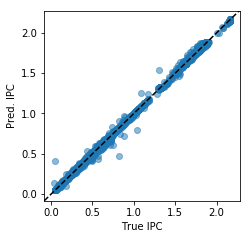

In [54]:
import scipy as sp
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import pyplot as plt

%matplotlib inline
# Plotting predicted vs true
print ("R:",  sp.stats.pearsonr(y_test, y_pred.flatten())[0])
print ("MAE:", np.abs(y_pred.flatten() - y_test).mean(), 's')
print ("RMSE:", np.sqrt(np.power(y_test- y_pred.flatten(), 2).mean()), 's')


fig, ax = plt.subplots()

# Make the plot
ax.scatter(y_test, y_pred, alpha=0.5)

# Make it pretty
ax.set_xlim(ax.get_xlim())
ax.set_ylim(ax.get_xlim())

ax.set_xlabel('True IPC')
ax.set_ylabel('Pred. IPC')

fig.set_size_inches(3.5, 3.5)

# Add in the goal line
ax.plot(ax.get_xlim(), ax.get_ylim(), 'k--');
plt.savefig('intra_arch_pred.png', bbox_inches='tight')

## Evaluate Model

In [56]:
score = p_model.evaluate(X_test, y_test,verbose=1)
print(score)

10659/10659 [==============================] - 0s 17us/step
[661.1048500411047, 661.1048500411047, 14.441168560969672]


In [57]:
preds = y_pred

In [58]:
import numpy as np

diff = preds.flatten() - y_test
percentDiff = (diff/y_test)*100
absPercentDiff = np.abs(percentDiff)

# compute the mean and standard deviation of the absolute percentage
# difference

mean = np.mean(absPercentDiff)
std = np.std(absPercentDiff)

print("Computing final mean absolute percentage error where it tells you how 'off' it is \n")
print("[INFO] avg. ipc: {}, std ipc: {}".format(new_df['ipc'].mean(),new_df['ipc'].std()))
print("[INFO] mean: {:.2f}%, std: {:.2f}%".format(mean, std))


Computing final mean absolute percentage error where it tells you how 'off' it is 

[INFO] avg. ipc: 0.7997935309979594, std ipc: 0.4142119919162506
[INFO] mean: 2.10%, std: 130.65%


In [59]:
train_error =  np.abs(preds.flatten() - y_test)
mean_error = np.mean(train_error)
min_error = np.min(train_error)
max_error = np.max(train_error)
std_error = np.std(train_error)

In [60]:
#saving history to plot loss against number of epochs run
#history = model.fit(X_train, y_train, epochs=100, batch_size=50,  verbose=1, validation_split=0.2)


In [61]:
#plotting loss vs number of epochs
"""
import matplotlib.pyplot as plt
%matplotlib inline

print(history.history.keys())
# "Loss"
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()"""

'\nimport matplotlib.pyplot as plt\n%matplotlib inline\n\nprint(history.history.keys())\n# "Loss"\nplt.plot(history.history[\'loss\'])\nplt.plot(history.history[\'val_loss\'])\nplt.title(\'model loss\')\nplt.ylabel(\'loss\')\nplt.xlabel(\'epoch\')\nplt.legend([\'train\', \'validation\'], loc=\'upper left\')\nplt.show()'

## Showing difference between V100 and P100 predictions - 
The prediction of V100 ipc using only p100 data

Showing how different are the architectures

R: 0.33076241711045123
MAE: 0.32674724803918315
RMSE: 0.5627527452505553


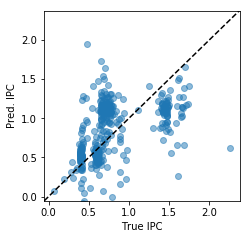

In [62]:
predict_v = p_model.predict(X_testVP)
import scipy as sp
# Plotting predicted vs true
print ("R:",  sp.stats.pearsonr(y_testVP, predict_v.flatten())[0])
print ("MAE:", np.abs(predict_v.flatten() - y_testVP).mean())
print ("RMSE:", np.sqrt(np.power(y_testVP - predict_v.flatten(), 2).mean()))


fig, ax = plt.subplots()

# Make the plot
ax.scatter(y_testVP, predict_v, alpha=0.5)

# Make it pretty
ax.set_xlim(ax.get_xlim())
ax.set_ylim(ax.get_xlim())

ax.set_xlabel('True IPC')
ax.set_ylabel('Pred. IPC')

fig.set_size_inches(3.5, 3.5)

# Add in the goal line
ax.plot(ax.get_xlim(), ax.get_ylim(), 'k--');
plt.savefig('inter_pred_bad.png', bbox_inches='tight')

## Predicting V100 IPC without transfer learning
Trying to predict V100 IPC given V100 metrics, however model is trained to predict P100 ipc given p100 metrics

Using: XV_train, XV_test, yV_train, yV_test

In [66]:
predict_v = p_model.predict(XV_train)

R: 0.16134734698347644
MAE: 4.018807636365648
RMSE: 7.242518659955077


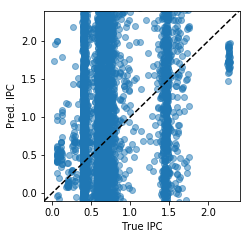

In [67]:
import scipy as sp
# Plotting predicted vs true
print ("R:",  sp.stats.pearsonr(yV_train, predict_v.flatten())[0])
print ("MAE:", np.abs(predict_v.flatten() - yV_train).mean())
print ("RMSE:", np.sqrt(np.power(yV_train- predict_v.flatten(), 2).mean()))


fig, ax = plt.subplots()

# Make the plot
ax.scatter(yV_train, predict_v, alpha=0.5)

# Make it pretty
ax.set_xlim(ax.get_xlim())
ax.set_ylim(ax.get_xlim())

ax.set_xlabel('True IPC')
ax.set_ylabel('Pred. IPC')

fig.set_size_inches(3.5, 3.5)

# Add in the goal line
ax.plot(ax.get_xlim(), ax.get_ylim(), 'k--');
plt.savefig('inter_pred_info_good.png', bbox_inches='tight')

In [42]:
## XV_train05, XV_test05, yV_train05, yV_test05

## Fine tuning and Transfer learning with V100 IPC

In [68]:
p_model.save_weights('p100_lim_trained.h5')

In [69]:
#from keras.models import load_weights
p_model.load_weights('p100_lim_trained.h5')

In [70]:
from keras.models import load_model
frozen_layers = 4
new_model = p_model
for layer in new_model.layers[:frozen_layers]:
    layer.trainable=False
for layer in new_model.layers[frozen_layers:]:
    layer.trainable=True

new_model.compile(loss='mse', optimizer='adam', metrics=['mse','mae'])


In [71]:
print(X_trainVP.shape)
print(y_trainVP.shape)
print(XV_train05.shape)
print(yV_train05.shape)
print(XV_test05.shape)

(20170, 112)
(20170,)
(20068, 112)
(20068,)
(1057, 112)


In [47]:
"""## Regular 33 percentage amount for test set
X = X_trainVP
Y = y_trainVP
new_model.fit(X, Y, epochs=150, batch_size=10,  validation_split= 0.25, shuffle=True)"""

'## Regular 33 percentage amount for test set\nX = X_trainVP\nY = y_trainVP\nnew_model.fit(X, Y, epochs=150, batch_size=10,  validation_split= 0.25, shuffle=True)'

## Working with 98% of data 

## Checkpoint example

In [48]:
"""
# Checkpointing example 
# Checkpoint the weights when validation accuracy improves
from keras.models import Sequential
from keras.layers import Dense
from keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt
import numpy
# fix random seed for reproducibility
seed = 7
numpy.random.seed(seed)
# load pima indians dataset
#dataset = numpy.loadtxt("pima-indians-diabetes.csv", delimiter=",")
# split into input (X) and output (Y) variables
X = XV_train05
Y = yV_train05
# create model
model = Sequential()
model.add(Dense(30, input_dim=112, kernel_initializer='uniform', activation='relu'))
model.add(Dense(8, kernel_initializer='uniform', activation='relu'))
model.add(Dense(8, kernel_initializer='uniform', activation='relu'))
model.add(Dense(8, kernel_initializer='uniform', activation='relu'))
model.add(Dense(1, kernel_initializer='uniform', activation='relu'))

# Compile model
model.compile(loss='mse', optimizer='adam', metrics=['mse','mae'])
#og
#model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
# checkpoint
filepath="weights-best.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='auto')
callbacks_list = [checkpoint]
# Fit the model
model.fit(X, Y, validation_split=0.33, epochs=500, batch_size=1000, callbacks=callbacks_list, verbose=0) """

'\n# Checkpointing example \n# Checkpoint the weights when validation accuracy improves\nfrom keras.models import Sequential\nfrom keras.layers import Dense\nfrom keras.callbacks import ModelCheckpoint\nimport matplotlib.pyplot as plt\nimport numpy\n# fix random seed for reproducibility\nseed = 7\nnumpy.random.seed(seed)\n# load pima indians dataset\n#dataset = numpy.loadtxt("pima-indians-diabetes.csv", delimiter=",")\n# split into input (X) and output (Y) variables\nX = XV_train05\nY = yV_train05\n# create model\nmodel = Sequential()\nmodel.add(Dense(30, input_dim=112, kernel_initializer=\'uniform\', activation=\'relu\'))\nmodel.add(Dense(8, kernel_initializer=\'uniform\', activation=\'relu\'))\nmodel.add(Dense(8, kernel_initializer=\'uniform\', activation=\'relu\'))\nmodel.add(Dense(8, kernel_initializer=\'uniform\', activation=\'relu\'))\nmodel.add(Dense(1, kernel_initializer=\'uniform\', activation=\'relu\'))\n\n# Compile model\nmodel.compile(loss=\'mse\', optimizer=\'adam\', metri

In [49]:
new_model.load_weights('weights-best.hdf5')

ValueError: You are trying to load a weight file containing 13 layers into a model with 8 layers.

In [50]:
from keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt
import numpy
# fix random seed for reproducibility
seed = 7
numpy.random.seed(seed)
## XV_train05, XV_test05, yV_train05, yV_test05
X = X_trainVP
Y = y_trainVP
#33% test
#X = X_trainVP
#Y = y_trainVP
filepath="weights-best.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='auto')
callbacks_list = [checkpoint]
new_model.fit(X, Y, epochs=1000000, batch_size=1000,  validation_split= 0.20, shuffle=True,callbacks=callbacks_list, verbose=0)



Epoch 00001: val_loss improved from inf to 0.09743, saving model to weights-best.hdf5

Epoch 00002: val_loss improved from 0.09743 to 0.08997, saving model to weights-best.hdf5

Epoch 00003: val_loss improved from 0.08997 to 0.08917, saving model to weights-best.hdf5

Epoch 00004: val_loss improved from 0.08917 to 0.08836, saving model to weights-best.hdf5

Epoch 00005: val_loss improved from 0.08836 to 0.08829, saving model to weights-best.hdf5

Epoch 00006: val_loss improved from 0.08829 to 0.08819, saving model to weights-best.hdf5

Epoch 00007: val_loss improved from 0.08819 to 0.08782, saving model to weights-best.hdf5

Epoch 00008: val_loss improved from 0.08782 to 0.08770, saving model to weights-best.hdf5

Epoch 00009: val_loss improved from 0.08770 to 0.08740, saving model to weights-best.hdf5

Epoch 00010: val_loss did not improve from 0.08740

Epoch 00011: val_loss did not improve from 0.08740

Epoch 00012: val_loss did not improve from 0.08740

Epoch 00013: val_loss improv


Epoch 00149: val_loss did not improve from 0.08681

Epoch 00150: val_loss did not improve from 0.08681

Epoch 00151: val_loss did not improve from 0.08681

Epoch 00152: val_loss did not improve from 0.08681

Epoch 00153: val_loss did not improve from 0.08681

Epoch 00154: val_loss did not improve from 0.08681

Epoch 00155: val_loss did not improve from 0.08681

Epoch 00156: val_loss did not improve from 0.08681

Epoch 00157: val_loss did not improve from 0.08681

Epoch 00158: val_loss did not improve from 0.08681

Epoch 00159: val_loss did not improve from 0.08681

Epoch 00160: val_loss did not improve from 0.08681

Epoch 00161: val_loss did not improve from 0.08681

Epoch 00162: val_loss did not improve from 0.08681

Epoch 00163: val_loss did not improve from 0.08681

Epoch 00164: val_loss did not improve from 0.08681

Epoch 00165: val_loss did not improve from 0.08681

Epoch 00166: val_loss did not improve from 0.08681

Epoch 00167: val_loss did not improve from 0.08681

Epoch 00168


Epoch 00307: val_loss did not improve from 0.08681

Epoch 00308: val_loss did not improve from 0.08681

Epoch 00309: val_loss did not improve from 0.08681

Epoch 00310: val_loss did not improve from 0.08681

Epoch 00311: val_loss did not improve from 0.08681

Epoch 00312: val_loss did not improve from 0.08681

Epoch 00313: val_loss did not improve from 0.08681

Epoch 00314: val_loss did not improve from 0.08681

Epoch 00315: val_loss did not improve from 0.08681

Epoch 00316: val_loss did not improve from 0.08681

Epoch 00317: val_loss did not improve from 0.08681

Epoch 00318: val_loss did not improve from 0.08681

Epoch 00319: val_loss did not improve from 0.08681

Epoch 00320: val_loss did not improve from 0.08681

Epoch 00321: val_loss did not improve from 0.08681

Epoch 00322: val_loss did not improve from 0.08681

Epoch 00323: val_loss did not improve from 0.08681

Epoch 00324: val_loss did not improve from 0.08681

Epoch 00325: val_loss did not improve from 0.08681

Epoch 00326


Epoch 00465: val_loss did not improve from 0.08681

Epoch 00466: val_loss did not improve from 0.08681

Epoch 00467: val_loss did not improve from 0.08681

Epoch 00468: val_loss did not improve from 0.08681

Epoch 00469: val_loss did not improve from 0.08681

Epoch 00470: val_loss did not improve from 0.08681

Epoch 00471: val_loss did not improve from 0.08681

Epoch 00472: val_loss did not improve from 0.08681

Epoch 00473: val_loss did not improve from 0.08681

Epoch 00474: val_loss did not improve from 0.08681

Epoch 00475: val_loss did not improve from 0.08681

Epoch 00476: val_loss did not improve from 0.08681

Epoch 00477: val_loss did not improve from 0.08681

Epoch 00478: val_loss did not improve from 0.08681

Epoch 00479: val_loss did not improve from 0.08681

Epoch 00480: val_loss did not improve from 0.08681

Epoch 00481: val_loss did not improve from 0.08681

Epoch 00482: val_loss did not improve from 0.08681

Epoch 00483: val_loss did not improve from 0.08681

Epoch 00484


Epoch 00625: val_loss did not improve from 0.08681

Epoch 00626: val_loss did not improve from 0.08681

Epoch 00627: val_loss did not improve from 0.08681

Epoch 00628: val_loss did not improve from 0.08681

Epoch 00629: val_loss did not improve from 0.08681

Epoch 00630: val_loss did not improve from 0.08681

Epoch 00631: val_loss did not improve from 0.08681

Epoch 00632: val_loss did not improve from 0.08681

Epoch 00633: val_loss did not improve from 0.08681

Epoch 00634: val_loss did not improve from 0.08681

Epoch 00635: val_loss did not improve from 0.08681

Epoch 00636: val_loss did not improve from 0.08681

Epoch 00637: val_loss did not improve from 0.08681

Epoch 00638: val_loss did not improve from 0.08681

Epoch 00639: val_loss did not improve from 0.08681

Epoch 00640: val_loss did not improve from 0.08681

Epoch 00641: val_loss did not improve from 0.08681

Epoch 00642: val_loss did not improve from 0.08681

Epoch 00643: val_loss did not improve from 0.08681

Epoch 00644


Epoch 00784: val_loss did not improve from 0.08681

Epoch 00785: val_loss did not improve from 0.08681

Epoch 00786: val_loss did not improve from 0.08681

Epoch 00787: val_loss did not improve from 0.08681

Epoch 00788: val_loss did not improve from 0.08681

Epoch 00789: val_loss did not improve from 0.08681

Epoch 00790: val_loss did not improve from 0.08681

Epoch 00791: val_loss did not improve from 0.08681

Epoch 00792: val_loss did not improve from 0.08681

Epoch 00793: val_loss did not improve from 0.08681

Epoch 00794: val_loss did not improve from 0.08681

Epoch 00795: val_loss did not improve from 0.08681

Epoch 00796: val_loss did not improve from 0.08681

Epoch 00797: val_loss did not improve from 0.08681

Epoch 00798: val_loss did not improve from 0.08681

Epoch 00799: val_loss did not improve from 0.08681

Epoch 00800: val_loss did not improve from 0.08681

Epoch 00801: val_loss did not improve from 0.08681

Epoch 00802: val_loss did not improve from 0.08681

Epoch 00803


Epoch 00942: val_loss did not improve from 0.08681

Epoch 00943: val_loss did not improve from 0.08681

Epoch 00944: val_loss did not improve from 0.08681

Epoch 00945: val_loss did not improve from 0.08681

Epoch 00946: val_loss did not improve from 0.08681

Epoch 00947: val_loss did not improve from 0.08681

Epoch 00948: val_loss did not improve from 0.08681

Epoch 00949: val_loss did not improve from 0.08681

Epoch 00950: val_loss did not improve from 0.08681

Epoch 00951: val_loss did not improve from 0.08681

Epoch 00952: val_loss did not improve from 0.08681

Epoch 00953: val_loss did not improve from 0.08681

Epoch 00954: val_loss did not improve from 0.08681

Epoch 00955: val_loss did not improve from 0.08681

Epoch 00956: val_loss did not improve from 0.08681

Epoch 00957: val_loss did not improve from 0.08681

Epoch 00958: val_loss did not improve from 0.08681

Epoch 00959: val_loss did not improve from 0.08681

Epoch 00960: val_loss did not improve from 0.08681

Epoch 00961


Epoch 01101: val_loss did not improve from 0.08681

Epoch 01102: val_loss did not improve from 0.08681

Epoch 01103: val_loss did not improve from 0.08681

Epoch 01104: val_loss did not improve from 0.08681

Epoch 01105: val_loss did not improve from 0.08681

Epoch 01106: val_loss did not improve from 0.08681

Epoch 01107: val_loss did not improve from 0.08681

Epoch 01108: val_loss did not improve from 0.08681

Epoch 01109: val_loss did not improve from 0.08681

Epoch 01110: val_loss did not improve from 0.08681

Epoch 01111: val_loss did not improve from 0.08681

Epoch 01112: val_loss did not improve from 0.08681

Epoch 01113: val_loss did not improve from 0.08681

Epoch 01114: val_loss did not improve from 0.08681

Epoch 01115: val_loss did not improve from 0.08681

Epoch 01116: val_loss did not improve from 0.08681

Epoch 01117: val_loss did not improve from 0.08681

Epoch 01118: val_loss did not improve from 0.08681

Epoch 01119: val_loss did not improve from 0.08681

Epoch 01120


Epoch 01260: val_loss did not improve from 0.08681

Epoch 01261: val_loss did not improve from 0.08681

Epoch 01262: val_loss did not improve from 0.08681

Epoch 01263: val_loss did not improve from 0.08681

Epoch 01264: val_loss did not improve from 0.08681

Epoch 01265: val_loss did not improve from 0.08681

Epoch 01266: val_loss did not improve from 0.08681

Epoch 01267: val_loss did not improve from 0.08681

Epoch 01268: val_loss did not improve from 0.08681

Epoch 01269: val_loss did not improve from 0.08681

Epoch 01270: val_loss did not improve from 0.08681

Epoch 01271: val_loss did not improve from 0.08681

Epoch 01272: val_loss did not improve from 0.08681

Epoch 01273: val_loss did not improve from 0.08681

Epoch 01274: val_loss did not improve from 0.08681

Epoch 01275: val_loss did not improve from 0.08681

Epoch 01276: val_loss did not improve from 0.08681

Epoch 01277: val_loss did not improve from 0.08681

Epoch 01278: val_loss did not improve from 0.08681

Epoch 01279


Epoch 01419: val_loss did not improve from 0.08681

Epoch 01420: val_loss did not improve from 0.08681

Epoch 01421: val_loss did not improve from 0.08681

Epoch 01422: val_loss did not improve from 0.08681

Epoch 01423: val_loss did not improve from 0.08681

Epoch 01424: val_loss did not improve from 0.08681

Epoch 01425: val_loss did not improve from 0.08681

Epoch 01426: val_loss did not improve from 0.08681

Epoch 01427: val_loss did not improve from 0.08681

Epoch 01428: val_loss did not improve from 0.08681

Epoch 01429: val_loss did not improve from 0.08681

Epoch 01430: val_loss did not improve from 0.08681

Epoch 01431: val_loss did not improve from 0.08681

Epoch 01432: val_loss did not improve from 0.08681

Epoch 01433: val_loss did not improve from 0.08681

Epoch 01434: val_loss did not improve from 0.08681

Epoch 01435: val_loss did not improve from 0.08681

Epoch 01436: val_loss did not improve from 0.08681

Epoch 01437: val_loss did not improve from 0.08681

Epoch 01438


Epoch 01578: val_loss did not improve from 0.08681

Epoch 01579: val_loss did not improve from 0.08681

Epoch 01580: val_loss did not improve from 0.08681

Epoch 01581: val_loss did not improve from 0.08681

Epoch 01582: val_loss did not improve from 0.08681

Epoch 01583: val_loss did not improve from 0.08681

Epoch 01584: val_loss did not improve from 0.08681

Epoch 01585: val_loss did not improve from 0.08681

Epoch 01586: val_loss did not improve from 0.08681

Epoch 01587: val_loss did not improve from 0.08681

Epoch 01588: val_loss did not improve from 0.08681

Epoch 01589: val_loss did not improve from 0.08681

Epoch 01590: val_loss did not improve from 0.08681

Epoch 01591: val_loss did not improve from 0.08681

Epoch 01592: val_loss did not improve from 0.08681

Epoch 01593: val_loss did not improve from 0.08681

Epoch 01594: val_loss did not improve from 0.08681

Epoch 01595: val_loss did not improve from 0.08681

Epoch 01596: val_loss did not improve from 0.08681

Epoch 01597


Epoch 01737: val_loss did not improve from 0.08681

Epoch 01738: val_loss did not improve from 0.08681

Epoch 01739: val_loss did not improve from 0.08681

Epoch 01740: val_loss did not improve from 0.08681

Epoch 01741: val_loss did not improve from 0.08681

Epoch 01742: val_loss did not improve from 0.08681

Epoch 01743: val_loss did not improve from 0.08681

Epoch 01744: val_loss did not improve from 0.08681

Epoch 01745: val_loss did not improve from 0.08681

Epoch 01746: val_loss did not improve from 0.08681

Epoch 01747: val_loss did not improve from 0.08681

Epoch 01748: val_loss did not improve from 0.08681

Epoch 01749: val_loss did not improve from 0.08681

Epoch 01750: val_loss did not improve from 0.08681

Epoch 01751: val_loss did not improve from 0.08681

Epoch 01752: val_loss did not improve from 0.08681

Epoch 01753: val_loss did not improve from 0.08681

Epoch 01754: val_loss did not improve from 0.08681

Epoch 01755: val_loss did not improve from 0.08681

Epoch 01756


Epoch 01896: val_loss did not improve from 0.08681

Epoch 01897: val_loss did not improve from 0.08681

Epoch 01898: val_loss did not improve from 0.08681

Epoch 01899: val_loss did not improve from 0.08681

Epoch 01900: val_loss did not improve from 0.08681

Epoch 01901: val_loss did not improve from 0.08681

Epoch 01902: val_loss did not improve from 0.08681

Epoch 01903: val_loss did not improve from 0.08681

Epoch 01904: val_loss did not improve from 0.08681

Epoch 01905: val_loss did not improve from 0.08681

Epoch 01906: val_loss did not improve from 0.08681

Epoch 01907: val_loss did not improve from 0.08681

Epoch 01908: val_loss did not improve from 0.08681

Epoch 01909: val_loss did not improve from 0.08681

Epoch 01910: val_loss did not improve from 0.08681

Epoch 01911: val_loss did not improve from 0.08681

Epoch 01912: val_loss did not improve from 0.08681

Epoch 01913: val_loss did not improve from 0.08681

Epoch 01914: val_loss did not improve from 0.08681

Epoch 01915


Epoch 02054: val_loss did not improve from 0.08681

Epoch 02055: val_loss did not improve from 0.08681

Epoch 02056: val_loss did not improve from 0.08681

Epoch 02057: val_loss did not improve from 0.08681

Epoch 02058: val_loss did not improve from 0.08681

Epoch 02059: val_loss did not improve from 0.08681

Epoch 02060: val_loss did not improve from 0.08681

Epoch 02061: val_loss did not improve from 0.08681

Epoch 02062: val_loss did not improve from 0.08681

Epoch 02063: val_loss did not improve from 0.08681

Epoch 02064: val_loss did not improve from 0.08681

Epoch 02065: val_loss did not improve from 0.08681

Epoch 02066: val_loss did not improve from 0.08681

Epoch 02067: val_loss did not improve from 0.08681

Epoch 02068: val_loss did not improve from 0.08681

Epoch 02069: val_loss did not improve from 0.08681

Epoch 02070: val_loss did not improve from 0.08681

Epoch 02071: val_loss did not improve from 0.08681

Epoch 02072: val_loss did not improve from 0.08681

Epoch 02073


Epoch 02213: val_loss did not improve from 0.08681

Epoch 02214: val_loss did not improve from 0.08681

Epoch 02215: val_loss did not improve from 0.08681

Epoch 02216: val_loss did not improve from 0.08681

Epoch 02217: val_loss did not improve from 0.08681

Epoch 02218: val_loss did not improve from 0.08681

Epoch 02219: val_loss did not improve from 0.08681

Epoch 02220: val_loss did not improve from 0.08681

Epoch 02221: val_loss did not improve from 0.08681

Epoch 02222: val_loss did not improve from 0.08681

Epoch 02223: val_loss did not improve from 0.08681

Epoch 02224: val_loss did not improve from 0.08681

Epoch 02225: val_loss did not improve from 0.08681

Epoch 02226: val_loss did not improve from 0.08681

Epoch 02227: val_loss did not improve from 0.08681

Epoch 02228: val_loss did not improve from 0.08681

Epoch 02229: val_loss did not improve from 0.08681

Epoch 02230: val_loss did not improve from 0.08681

Epoch 02231: val_loss did not improve from 0.08681

Epoch 02232


Epoch 02373: val_loss did not improve from 0.08681

Epoch 02374: val_loss did not improve from 0.08681

Epoch 02375: val_loss did not improve from 0.08681

Epoch 02376: val_loss did not improve from 0.08681

Epoch 02377: val_loss did not improve from 0.08681

Epoch 02378: val_loss did not improve from 0.08681

Epoch 02379: val_loss did not improve from 0.08681

Epoch 02380: val_loss did not improve from 0.08681

Epoch 02381: val_loss did not improve from 0.08681

Epoch 02382: val_loss did not improve from 0.08681

Epoch 02383: val_loss did not improve from 0.08681

Epoch 02384: val_loss did not improve from 0.08681

Epoch 02385: val_loss did not improve from 0.08681

Epoch 02386: val_loss did not improve from 0.08681

Epoch 02387: val_loss did not improve from 0.08681

Epoch 02388: val_loss did not improve from 0.08681

Epoch 02389: val_loss did not improve from 0.08681

Epoch 02390: val_loss did not improve from 0.08681

Epoch 02391: val_loss did not improve from 0.08681

Epoch 02392


Epoch 02531: val_loss did not improve from 0.08681

Epoch 02532: val_loss did not improve from 0.08681

Epoch 02533: val_loss did not improve from 0.08681

Epoch 02534: val_loss did not improve from 0.08681

Epoch 02535: val_loss did not improve from 0.08681

Epoch 02536: val_loss did not improve from 0.08681

Epoch 02537: val_loss did not improve from 0.08681

Epoch 02538: val_loss did not improve from 0.08681

Epoch 02539: val_loss did not improve from 0.08681

Epoch 02540: val_loss did not improve from 0.08681

Epoch 02541: val_loss did not improve from 0.08681

Epoch 02542: val_loss did not improve from 0.08681

Epoch 02543: val_loss did not improve from 0.08681

Epoch 02544: val_loss did not improve from 0.08681

Epoch 02545: val_loss did not improve from 0.08681

Epoch 02546: val_loss did not improve from 0.08681

Epoch 02547: val_loss did not improve from 0.08681

Epoch 02548: val_loss did not improve from 0.08681

Epoch 02549: val_loss did not improve from 0.08681

Epoch 02550


Epoch 02690: val_loss did not improve from 0.08681

Epoch 02691: val_loss did not improve from 0.08681

Epoch 02692: val_loss did not improve from 0.08681

Epoch 02693: val_loss did not improve from 0.08681

Epoch 02694: val_loss did not improve from 0.08681

Epoch 02695: val_loss did not improve from 0.08681

Epoch 02696: val_loss did not improve from 0.08681

Epoch 02697: val_loss did not improve from 0.08681

Epoch 02698: val_loss did not improve from 0.08681

Epoch 02699: val_loss did not improve from 0.08681

Epoch 02700: val_loss did not improve from 0.08681

Epoch 02701: val_loss did not improve from 0.08681

Epoch 02702: val_loss did not improve from 0.08681

Epoch 02703: val_loss did not improve from 0.08681

Epoch 02704: val_loss did not improve from 0.08681

Epoch 02705: val_loss did not improve from 0.08681

Epoch 02706: val_loss did not improve from 0.08681

Epoch 02707: val_loss did not improve from 0.08681

Epoch 02708: val_loss did not improve from 0.08681

Epoch 02709


Epoch 02848: val_loss did not improve from 0.08681

Epoch 02849: val_loss did not improve from 0.08681

Epoch 02850: val_loss did not improve from 0.08681

Epoch 02851: val_loss did not improve from 0.08681

Epoch 02852: val_loss did not improve from 0.08681

Epoch 02853: val_loss did not improve from 0.08681

Epoch 02854: val_loss did not improve from 0.08681

Epoch 02855: val_loss did not improve from 0.08681

Epoch 02856: val_loss did not improve from 0.08681

Epoch 02857: val_loss did not improve from 0.08681

Epoch 02858: val_loss did not improve from 0.08681

Epoch 02859: val_loss did not improve from 0.08681

Epoch 02860: val_loss did not improve from 0.08681

Epoch 02861: val_loss did not improve from 0.08681

Epoch 02862: val_loss did not improve from 0.08681

Epoch 02863: val_loss did not improve from 0.08681

Epoch 02864: val_loss did not improve from 0.08681

Epoch 02865: val_loss did not improve from 0.08681

Epoch 02866: val_loss did not improve from 0.08681

Epoch 02867


Epoch 03007: val_loss did not improve from 0.08681

Epoch 03008: val_loss did not improve from 0.08681

Epoch 03009: val_loss did not improve from 0.08681

Epoch 03010: val_loss did not improve from 0.08681

Epoch 03011: val_loss did not improve from 0.08681

Epoch 03012: val_loss did not improve from 0.08681

Epoch 03013: val_loss did not improve from 0.08681

Epoch 03014: val_loss did not improve from 0.08681

Epoch 03015: val_loss did not improve from 0.08681

Epoch 03016: val_loss did not improve from 0.08681

Epoch 03017: val_loss did not improve from 0.08681

Epoch 03018: val_loss did not improve from 0.08681

Epoch 03019: val_loss did not improve from 0.08681

Epoch 03020: val_loss did not improve from 0.08681

Epoch 03021: val_loss did not improve from 0.08681

Epoch 03022: val_loss did not improve from 0.08681

Epoch 03023: val_loss did not improve from 0.08681

Epoch 03024: val_loss did not improve from 0.08681

Epoch 03025: val_loss did not improve from 0.08681

Epoch 03026


Epoch 03167: val_loss did not improve from 0.08681

Epoch 03168: val_loss did not improve from 0.08681

Epoch 03169: val_loss did not improve from 0.08681

Epoch 03170: val_loss did not improve from 0.08681

Epoch 03171: val_loss did not improve from 0.08681

Epoch 03172: val_loss did not improve from 0.08681

Epoch 03173: val_loss did not improve from 0.08681

Epoch 03174: val_loss did not improve from 0.08681

Epoch 03175: val_loss did not improve from 0.08681

Epoch 03176: val_loss did not improve from 0.08681

Epoch 03177: val_loss did not improve from 0.08681

Epoch 03178: val_loss did not improve from 0.08681

Epoch 03179: val_loss did not improve from 0.08681

Epoch 03180: val_loss did not improve from 0.08681

Epoch 03181: val_loss did not improve from 0.08681

Epoch 03182: val_loss did not improve from 0.08681

Epoch 03183: val_loss did not improve from 0.08681

Epoch 03184: val_loss did not improve from 0.08681

Epoch 03185: val_loss did not improve from 0.08681

Epoch 03186


Epoch 03327: val_loss did not improve from 0.08681

Epoch 03328: val_loss did not improve from 0.08681

Epoch 03329: val_loss did not improve from 0.08681

Epoch 03330: val_loss did not improve from 0.08681

Epoch 03331: val_loss did not improve from 0.08681

Epoch 03332: val_loss did not improve from 0.08681

Epoch 03333: val_loss did not improve from 0.08681

Epoch 03334: val_loss did not improve from 0.08681

Epoch 03335: val_loss did not improve from 0.08681

Epoch 03336: val_loss did not improve from 0.08681

Epoch 03337: val_loss did not improve from 0.08681

Epoch 03338: val_loss did not improve from 0.08681

Epoch 03339: val_loss did not improve from 0.08681

Epoch 03340: val_loss did not improve from 0.08681

Epoch 03341: val_loss did not improve from 0.08681

Epoch 03342: val_loss did not improve from 0.08681

Epoch 03343: val_loss did not improve from 0.08681

Epoch 03344: val_loss did not improve from 0.08681

Epoch 03345: val_loss did not improve from 0.08681

Epoch 03346


Epoch 03485: val_loss did not improve from 0.08681

Epoch 03486: val_loss did not improve from 0.08681

Epoch 03487: val_loss did not improve from 0.08681

Epoch 03488: val_loss did not improve from 0.08681

Epoch 03489: val_loss did not improve from 0.08681

Epoch 03490: val_loss did not improve from 0.08681

Epoch 03491: val_loss did not improve from 0.08681

Epoch 03492: val_loss did not improve from 0.08681

Epoch 03493: val_loss did not improve from 0.08681

Epoch 03494: val_loss did not improve from 0.08681

Epoch 03495: val_loss did not improve from 0.08681

Epoch 03496: val_loss did not improve from 0.08681

Epoch 03497: val_loss did not improve from 0.08681

Epoch 03498: val_loss did not improve from 0.08681

Epoch 03499: val_loss did not improve from 0.08681

Epoch 03500: val_loss did not improve from 0.08681

Epoch 03501: val_loss did not improve from 0.08681

Epoch 03502: val_loss did not improve from 0.08681

Epoch 03503: val_loss did not improve from 0.08681

Epoch 03504


Epoch 03645: val_loss did not improve from 0.08681

Epoch 03646: val_loss did not improve from 0.08681

Epoch 03647: val_loss did not improve from 0.08681

Epoch 03648: val_loss did not improve from 0.08681

Epoch 03649: val_loss did not improve from 0.08681

Epoch 03650: val_loss did not improve from 0.08681

Epoch 03651: val_loss did not improve from 0.08681

Epoch 03652: val_loss did not improve from 0.08681

Epoch 03653: val_loss did not improve from 0.08681

Epoch 03654: val_loss did not improve from 0.08681

Epoch 03655: val_loss did not improve from 0.08681

Epoch 03656: val_loss did not improve from 0.08681

Epoch 03657: val_loss did not improve from 0.08681

Epoch 03658: val_loss did not improve from 0.08681

Epoch 03659: val_loss did not improve from 0.08681

Epoch 03660: val_loss did not improve from 0.08681

Epoch 03661: val_loss did not improve from 0.08681

Epoch 03662: val_loss did not improve from 0.08681

Epoch 03663: val_loss did not improve from 0.08681

Epoch 03664


Epoch 03803: val_loss did not improve from 0.08681

Epoch 03804: val_loss did not improve from 0.08681

Epoch 03805: val_loss did not improve from 0.08681

Epoch 03806: val_loss did not improve from 0.08681

Epoch 03807: val_loss did not improve from 0.08681

Epoch 03808: val_loss did not improve from 0.08681

Epoch 03809: val_loss did not improve from 0.08681

Epoch 03810: val_loss did not improve from 0.08681

Epoch 03811: val_loss did not improve from 0.08681

Epoch 03812: val_loss did not improve from 0.08681

Epoch 03813: val_loss did not improve from 0.08681

Epoch 03814: val_loss did not improve from 0.08681

Epoch 03815: val_loss did not improve from 0.08681

Epoch 03816: val_loss did not improve from 0.08681

Epoch 03817: val_loss did not improve from 0.08681

Epoch 03818: val_loss did not improve from 0.08681

Epoch 03819: val_loss did not improve from 0.08681

Epoch 03820: val_loss did not improve from 0.08681

Epoch 03821: val_loss did not improve from 0.08681

Epoch 03822


Epoch 03962: val_loss did not improve from 0.08681

Epoch 03963: val_loss did not improve from 0.08681

Epoch 03964: val_loss did not improve from 0.08681

Epoch 03965: val_loss did not improve from 0.08681

Epoch 03966: val_loss did not improve from 0.08681

Epoch 03967: val_loss did not improve from 0.08681

Epoch 03968: val_loss did not improve from 0.08681

Epoch 03969: val_loss did not improve from 0.08681

Epoch 03970: val_loss did not improve from 0.08681

Epoch 03971: val_loss did not improve from 0.08681

Epoch 03972: val_loss did not improve from 0.08681

Epoch 03973: val_loss did not improve from 0.08681

Epoch 03974: val_loss did not improve from 0.08681

Epoch 03975: val_loss did not improve from 0.08681

Epoch 03976: val_loss did not improve from 0.08681

Epoch 03977: val_loss did not improve from 0.08681

Epoch 03978: val_loss did not improve from 0.08681

Epoch 03979: val_loss did not improve from 0.08681

Epoch 03980: val_loss did not improve from 0.08681

Epoch 03981


Epoch 04121: val_loss did not improve from 0.08681

Epoch 04122: val_loss did not improve from 0.08681

Epoch 04123: val_loss did not improve from 0.08681

Epoch 04124: val_loss did not improve from 0.08681

Epoch 04125: val_loss did not improve from 0.08681

Epoch 04126: val_loss did not improve from 0.08681

Epoch 04127: val_loss did not improve from 0.08681

Epoch 04128: val_loss did not improve from 0.08681

Epoch 04129: val_loss did not improve from 0.08681

Epoch 04130: val_loss did not improve from 0.08681

Epoch 04131: val_loss did not improve from 0.08681

Epoch 04132: val_loss did not improve from 0.08681

Epoch 04133: val_loss did not improve from 0.08681

Epoch 04134: val_loss did not improve from 0.08681

Epoch 04135: val_loss did not improve from 0.08681

Epoch 04136: val_loss did not improve from 0.08681

Epoch 04137: val_loss did not improve from 0.08681

Epoch 04138: val_loss did not improve from 0.08681

Epoch 04139: val_loss did not improve from 0.08681

Epoch 04140


Epoch 04280: val_loss did not improve from 0.08681

Epoch 04281: val_loss did not improve from 0.08681

Epoch 04282: val_loss did not improve from 0.08681

Epoch 04283: val_loss did not improve from 0.08681

Epoch 04284: val_loss did not improve from 0.08681

Epoch 04285: val_loss did not improve from 0.08681

Epoch 04286: val_loss did not improve from 0.08681

Epoch 04287: val_loss did not improve from 0.08681

Epoch 04288: val_loss did not improve from 0.08681

Epoch 04289: val_loss did not improve from 0.08681

Epoch 04290: val_loss did not improve from 0.08681

Epoch 04291: val_loss did not improve from 0.08681

Epoch 04292: val_loss did not improve from 0.08681

Epoch 04293: val_loss did not improve from 0.08681

Epoch 04294: val_loss did not improve from 0.08681

Epoch 04295: val_loss did not improve from 0.08681

Epoch 04296: val_loss did not improve from 0.08681

Epoch 04297: val_loss did not improve from 0.08681

Epoch 04298: val_loss did not improve from 0.08681

Epoch 04299


Epoch 04439: val_loss did not improve from 0.08681

Epoch 04440: val_loss did not improve from 0.08681

Epoch 04441: val_loss did not improve from 0.08681

Epoch 04442: val_loss did not improve from 0.08681

Epoch 04443: val_loss did not improve from 0.08681

Epoch 04444: val_loss did not improve from 0.08681

Epoch 04445: val_loss did not improve from 0.08681

Epoch 04446: val_loss did not improve from 0.08681

Epoch 04447: val_loss did not improve from 0.08681

Epoch 04448: val_loss did not improve from 0.08681

Epoch 04449: val_loss did not improve from 0.08681

Epoch 04450: val_loss did not improve from 0.08681

Epoch 04451: val_loss did not improve from 0.08681

Epoch 04452: val_loss did not improve from 0.08681

Epoch 04453: val_loss did not improve from 0.08681

Epoch 04454: val_loss did not improve from 0.08681

Epoch 04455: val_loss did not improve from 0.08681

Epoch 04456: val_loss did not improve from 0.08681

Epoch 04457: val_loss did not improve from 0.08681

Epoch 04458


Epoch 04597: val_loss did not improve from 0.08681

Epoch 04598: val_loss did not improve from 0.08681

Epoch 04599: val_loss did not improve from 0.08681

Epoch 04600: val_loss did not improve from 0.08681

Epoch 04601: val_loss did not improve from 0.08681

Epoch 04602: val_loss did not improve from 0.08681

Epoch 04603: val_loss did not improve from 0.08681

Epoch 04604: val_loss did not improve from 0.08681

Epoch 04605: val_loss did not improve from 0.08681

Epoch 04606: val_loss did not improve from 0.08681

Epoch 04607: val_loss did not improve from 0.08681

Epoch 04608: val_loss did not improve from 0.08681

Epoch 04609: val_loss did not improve from 0.08681

Epoch 04610: val_loss did not improve from 0.08681

Epoch 04611: val_loss did not improve from 0.08681

Epoch 04612: val_loss did not improve from 0.08681

Epoch 04613: val_loss did not improve from 0.08681

Epoch 04614: val_loss did not improve from 0.08681

Epoch 04615: val_loss did not improve from 0.08681

Epoch 04616


Epoch 04756: val_loss did not improve from 0.08681

Epoch 04757: val_loss did not improve from 0.08681

Epoch 04758: val_loss did not improve from 0.08681

Epoch 04759: val_loss did not improve from 0.08681

Epoch 04760: val_loss did not improve from 0.08681

Epoch 04761: val_loss did not improve from 0.08681

Epoch 04762: val_loss did not improve from 0.08681

Epoch 04763: val_loss did not improve from 0.08681

Epoch 04764: val_loss did not improve from 0.08681

Epoch 04765: val_loss did not improve from 0.08681

Epoch 04766: val_loss did not improve from 0.08681

Epoch 04767: val_loss did not improve from 0.08681

Epoch 04768: val_loss did not improve from 0.08681

Epoch 04769: val_loss did not improve from 0.08681

Epoch 04770: val_loss did not improve from 0.08681

Epoch 04771: val_loss did not improve from 0.08681

Epoch 04772: val_loss did not improve from 0.08681

Epoch 04773: val_loss did not improve from 0.08681

Epoch 04774: val_loss did not improve from 0.08681

Epoch 04775


Epoch 04915: val_loss did not improve from 0.08681

Epoch 04916: val_loss did not improve from 0.08681

Epoch 04917: val_loss did not improve from 0.08681

Epoch 04918: val_loss did not improve from 0.08681

Epoch 04919: val_loss did not improve from 0.08681

Epoch 04920: val_loss did not improve from 0.08681

Epoch 04921: val_loss did not improve from 0.08681

Epoch 04922: val_loss did not improve from 0.08681

Epoch 04923: val_loss did not improve from 0.08681

Epoch 04924: val_loss did not improve from 0.08681

Epoch 04925: val_loss did not improve from 0.08681

Epoch 04926: val_loss did not improve from 0.08681

Epoch 04927: val_loss did not improve from 0.08681

Epoch 04928: val_loss did not improve from 0.08681

Epoch 04929: val_loss did not improve from 0.08681

Epoch 04930: val_loss did not improve from 0.08681

Epoch 04931: val_loss did not improve from 0.08681

Epoch 04932: val_loss did not improve from 0.08681

Epoch 04933: val_loss did not improve from 0.08681

Epoch 04934


Epoch 05074: val_loss did not improve from 0.08681

Epoch 05075: val_loss did not improve from 0.08681

Epoch 05076: val_loss did not improve from 0.08681

Epoch 05077: val_loss did not improve from 0.08681

Epoch 05078: val_loss did not improve from 0.08681

Epoch 05079: val_loss did not improve from 0.08681

Epoch 05080: val_loss did not improve from 0.08681

Epoch 05081: val_loss did not improve from 0.08681

Epoch 05082: val_loss did not improve from 0.08681

Epoch 05083: val_loss did not improve from 0.08681

Epoch 05084: val_loss did not improve from 0.08681

Epoch 05085: val_loss did not improve from 0.08681

Epoch 05086: val_loss did not improve from 0.08681

Epoch 05087: val_loss did not improve from 0.08681

Epoch 05088: val_loss did not improve from 0.08681

Epoch 05089: val_loss did not improve from 0.08681

Epoch 05090: val_loss did not improve from 0.08681

Epoch 05091: val_loss did not improve from 0.08681

Epoch 05092: val_loss did not improve from 0.08681

Epoch 05093


Epoch 05234: val_loss did not improve from 0.08681

Epoch 05235: val_loss did not improve from 0.08681

Epoch 05236: val_loss did not improve from 0.08681

Epoch 05237: val_loss did not improve from 0.08681

Epoch 05238: val_loss did not improve from 0.08681

Epoch 05239: val_loss did not improve from 0.08681

Epoch 05240: val_loss did not improve from 0.08681

Epoch 05241: val_loss did not improve from 0.08681

Epoch 05242: val_loss did not improve from 0.08681

Epoch 05243: val_loss did not improve from 0.08681

Epoch 05244: val_loss did not improve from 0.08681

Epoch 05245: val_loss did not improve from 0.08681

Epoch 05246: val_loss did not improve from 0.08681

Epoch 05247: val_loss did not improve from 0.08681

Epoch 05248: val_loss did not improve from 0.08681

Epoch 05249: val_loss did not improve from 0.08681

Epoch 05250: val_loss did not improve from 0.08681

Epoch 05251: val_loss did not improve from 0.08681

Epoch 05252: val_loss did not improve from 0.08681

Epoch 05253


Epoch 05392: val_loss did not improve from 0.08681

Epoch 05393: val_loss did not improve from 0.08681

Epoch 05394: val_loss did not improve from 0.08681

Epoch 05395: val_loss did not improve from 0.08681

Epoch 05396: val_loss did not improve from 0.08681

Epoch 05397: val_loss did not improve from 0.08681

Epoch 05398: val_loss did not improve from 0.08681

Epoch 05399: val_loss did not improve from 0.08681

Epoch 05400: val_loss did not improve from 0.08681

Epoch 05401: val_loss did not improve from 0.08681

Epoch 05402: val_loss did not improve from 0.08681

Epoch 05403: val_loss did not improve from 0.08681

Epoch 05404: val_loss did not improve from 0.08681

Epoch 05405: val_loss did not improve from 0.08681

Epoch 05406: val_loss did not improve from 0.08681

Epoch 05407: val_loss did not improve from 0.08681

Epoch 05408: val_loss did not improve from 0.08681

Epoch 05409: val_loss did not improve from 0.08681

Epoch 05410: val_loss did not improve from 0.08681

Epoch 05411


Epoch 05551: val_loss did not improve from 0.08681

Epoch 05552: val_loss did not improve from 0.08681

Epoch 05553: val_loss did not improve from 0.08681

Epoch 05554: val_loss did not improve from 0.08681

Epoch 05555: val_loss did not improve from 0.08681

Epoch 05556: val_loss did not improve from 0.08681

Epoch 05557: val_loss did not improve from 0.08681

Epoch 05558: val_loss did not improve from 0.08681

Epoch 05559: val_loss did not improve from 0.08681

Epoch 05560: val_loss did not improve from 0.08681

Epoch 05561: val_loss did not improve from 0.08681

Epoch 05562: val_loss did not improve from 0.08681

Epoch 05563: val_loss did not improve from 0.08681

Epoch 05564: val_loss did not improve from 0.08681

Epoch 05565: val_loss did not improve from 0.08681

Epoch 05566: val_loss did not improve from 0.08681

Epoch 05567: val_loss did not improve from 0.08681

Epoch 05568: val_loss did not improve from 0.08681

Epoch 05569: val_loss did not improve from 0.08681

Epoch 05570


Epoch 05710: val_loss did not improve from 0.08681

Epoch 05711: val_loss did not improve from 0.08681

Epoch 05712: val_loss did not improve from 0.08681

Epoch 05713: val_loss did not improve from 0.08681

Epoch 05714: val_loss did not improve from 0.08681

Epoch 05715: val_loss did not improve from 0.08681

Epoch 05716: val_loss did not improve from 0.08681

Epoch 05717: val_loss did not improve from 0.08681

Epoch 05718: val_loss did not improve from 0.08681

Epoch 05719: val_loss did not improve from 0.08681

Epoch 05720: val_loss did not improve from 0.08681

Epoch 05721: val_loss did not improve from 0.08681

Epoch 05722: val_loss did not improve from 0.08681

Epoch 05723: val_loss did not improve from 0.08681

Epoch 05724: val_loss did not improve from 0.08681

Epoch 05725: val_loss did not improve from 0.08681

Epoch 05726: val_loss did not improve from 0.08681

Epoch 05727: val_loss did not improve from 0.08681

Epoch 05728: val_loss did not improve from 0.08681

Epoch 05729


Epoch 05868: val_loss did not improve from 0.08681

Epoch 05869: val_loss did not improve from 0.08681

Epoch 05870: val_loss did not improve from 0.08681

Epoch 05871: val_loss did not improve from 0.08681

Epoch 05872: val_loss did not improve from 0.08681

Epoch 05873: val_loss did not improve from 0.08681

Epoch 05874: val_loss did not improve from 0.08681

Epoch 05875: val_loss did not improve from 0.08681

Epoch 05876: val_loss did not improve from 0.08681

Epoch 05877: val_loss did not improve from 0.08681

Epoch 05878: val_loss did not improve from 0.08681

Epoch 05879: val_loss did not improve from 0.08681

Epoch 05880: val_loss did not improve from 0.08681

Epoch 05881: val_loss did not improve from 0.08681

Epoch 05882: val_loss did not improve from 0.08681

Epoch 05883: val_loss did not improve from 0.08681

Epoch 05884: val_loss did not improve from 0.08681

Epoch 05885: val_loss did not improve from 0.08681

Epoch 05886: val_loss did not improve from 0.08681

Epoch 05887


Epoch 06026: val_loss did not improve from 0.08681

Epoch 06027: val_loss did not improve from 0.08681

Epoch 06028: val_loss did not improve from 0.08681

Epoch 06029: val_loss did not improve from 0.08681

Epoch 06030: val_loss did not improve from 0.08681

Epoch 06031: val_loss did not improve from 0.08681

Epoch 06032: val_loss did not improve from 0.08681

Epoch 06033: val_loss did not improve from 0.08681

Epoch 06034: val_loss did not improve from 0.08681

Epoch 06035: val_loss did not improve from 0.08681

Epoch 06036: val_loss did not improve from 0.08681

Epoch 06037: val_loss did not improve from 0.08681

Epoch 06038: val_loss did not improve from 0.08681

Epoch 06039: val_loss did not improve from 0.08681

Epoch 06040: val_loss did not improve from 0.08681

Epoch 06041: val_loss did not improve from 0.08681

Epoch 06042: val_loss did not improve from 0.08681

Epoch 06043: val_loss did not improve from 0.08681

Epoch 06044: val_loss did not improve from 0.08681

Epoch 06045


Epoch 06185: val_loss did not improve from 0.08681

Epoch 06186: val_loss did not improve from 0.08681

Epoch 06187: val_loss did not improve from 0.08681

Epoch 06188: val_loss did not improve from 0.08681

Epoch 06189: val_loss did not improve from 0.08681

Epoch 06190: val_loss did not improve from 0.08681

Epoch 06191: val_loss did not improve from 0.08681

Epoch 06192: val_loss did not improve from 0.08681

Epoch 06193: val_loss did not improve from 0.08681

Epoch 06194: val_loss did not improve from 0.08681

Epoch 06195: val_loss did not improve from 0.08681

Epoch 06196: val_loss did not improve from 0.08681

Epoch 06197: val_loss did not improve from 0.08681

Epoch 06198: val_loss did not improve from 0.08681

Epoch 06199: val_loss did not improve from 0.08681

Epoch 06200: val_loss did not improve from 0.08681

Epoch 06201: val_loss did not improve from 0.08681

Epoch 06202: val_loss did not improve from 0.08681

Epoch 06203: val_loss did not improve from 0.08681

Epoch 06204


Epoch 06344: val_loss did not improve from 0.08681

Epoch 06345: val_loss did not improve from 0.08681

Epoch 06346: val_loss did not improve from 0.08681

Epoch 06347: val_loss did not improve from 0.08681

Epoch 06348: val_loss did not improve from 0.08681

Epoch 06349: val_loss did not improve from 0.08681

Epoch 06350: val_loss did not improve from 0.08681

Epoch 06351: val_loss did not improve from 0.08681

Epoch 06352: val_loss did not improve from 0.08681

Epoch 06353: val_loss did not improve from 0.08681

Epoch 06354: val_loss did not improve from 0.08681

Epoch 06355: val_loss did not improve from 0.08681

Epoch 06356: val_loss did not improve from 0.08681

Epoch 06357: val_loss did not improve from 0.08681

Epoch 06358: val_loss did not improve from 0.08681

Epoch 06359: val_loss did not improve from 0.08681

Epoch 06360: val_loss did not improve from 0.08681

Epoch 06361: val_loss did not improve from 0.08681

Epoch 06362: val_loss did not improve from 0.08681

Epoch 06363


Epoch 06503: val_loss did not improve from 0.08681

Epoch 06504: val_loss did not improve from 0.08681

Epoch 06505: val_loss did not improve from 0.08681

Epoch 06506: val_loss did not improve from 0.08681

Epoch 06507: val_loss did not improve from 0.08681

Epoch 06508: val_loss did not improve from 0.08681

Epoch 06509: val_loss did not improve from 0.08681

Epoch 06510: val_loss did not improve from 0.08681

Epoch 06511: val_loss did not improve from 0.08681

Epoch 06512: val_loss did not improve from 0.08681

Epoch 06513: val_loss did not improve from 0.08681

Epoch 06514: val_loss did not improve from 0.08681

Epoch 06515: val_loss did not improve from 0.08681

Epoch 06516: val_loss did not improve from 0.08681

Epoch 06517: val_loss did not improve from 0.08681

Epoch 06518: val_loss did not improve from 0.08681

Epoch 06519: val_loss did not improve from 0.08681

Epoch 06520: val_loss did not improve from 0.08681

Epoch 06521: val_loss did not improve from 0.08681

Epoch 06522


Epoch 06662: val_loss did not improve from 0.08681

Epoch 06663: val_loss did not improve from 0.08681

Epoch 06664: val_loss did not improve from 0.08681

Epoch 06665: val_loss did not improve from 0.08681

Epoch 06666: val_loss did not improve from 0.08681

Epoch 06667: val_loss did not improve from 0.08681

Epoch 06668: val_loss did not improve from 0.08681

Epoch 06669: val_loss did not improve from 0.08681

Epoch 06670: val_loss did not improve from 0.08681

Epoch 06671: val_loss did not improve from 0.08681

Epoch 06672: val_loss did not improve from 0.08681

Epoch 06673: val_loss did not improve from 0.08681

Epoch 06674: val_loss did not improve from 0.08681

Epoch 06675: val_loss did not improve from 0.08681

Epoch 06676: val_loss did not improve from 0.08681

Epoch 06677: val_loss did not improve from 0.08681

Epoch 06678: val_loss did not improve from 0.08681

Epoch 06679: val_loss did not improve from 0.08681

Epoch 06680: val_loss did not improve from 0.08681

Epoch 06681


Epoch 06821: val_loss did not improve from 0.08681

Epoch 06822: val_loss did not improve from 0.08681

Epoch 06823: val_loss did not improve from 0.08681

Epoch 06824: val_loss did not improve from 0.08681

Epoch 06825: val_loss did not improve from 0.08681

Epoch 06826: val_loss did not improve from 0.08681

Epoch 06827: val_loss did not improve from 0.08681

Epoch 06828: val_loss did not improve from 0.08681

Epoch 06829: val_loss did not improve from 0.08681

Epoch 06830: val_loss did not improve from 0.08681

Epoch 06831: val_loss did not improve from 0.08681

Epoch 06832: val_loss did not improve from 0.08681

Epoch 06833: val_loss did not improve from 0.08681

Epoch 06834: val_loss did not improve from 0.08681

Epoch 06835: val_loss did not improve from 0.08681

Epoch 06836: val_loss did not improve from 0.08681

Epoch 06837: val_loss did not improve from 0.08681

Epoch 06838: val_loss did not improve from 0.08681

Epoch 06839: val_loss did not improve from 0.08681

Epoch 06840


Epoch 06980: val_loss did not improve from 0.08681

Epoch 06981: val_loss did not improve from 0.08681

Epoch 06982: val_loss did not improve from 0.08681

Epoch 06983: val_loss did not improve from 0.08681

Epoch 06984: val_loss did not improve from 0.08681

Epoch 06985: val_loss did not improve from 0.08681

Epoch 06986: val_loss did not improve from 0.08681

Epoch 06987: val_loss did not improve from 0.08681

Epoch 06988: val_loss did not improve from 0.08681

Epoch 06989: val_loss did not improve from 0.08681

Epoch 06990: val_loss did not improve from 0.08681

Epoch 06991: val_loss did not improve from 0.08681

Epoch 06992: val_loss did not improve from 0.08681

Epoch 06993: val_loss did not improve from 0.08681

Epoch 06994: val_loss did not improve from 0.08681

Epoch 06995: val_loss did not improve from 0.08681

Epoch 06996: val_loss did not improve from 0.08681

Epoch 06997: val_loss did not improve from 0.08681

Epoch 06998: val_loss did not improve from 0.08681

Epoch 06999


Epoch 07138: val_loss did not improve from 0.08681

Epoch 07139: val_loss did not improve from 0.08681

Epoch 07140: val_loss did not improve from 0.08681

Epoch 07141: val_loss did not improve from 0.08681

Epoch 07142: val_loss did not improve from 0.08681

Epoch 07143: val_loss did not improve from 0.08681

Epoch 07144: val_loss did not improve from 0.08681

Epoch 07145: val_loss did not improve from 0.08681

Epoch 07146: val_loss did not improve from 0.08681

Epoch 07147: val_loss did not improve from 0.08681

Epoch 07148: val_loss did not improve from 0.08681

Epoch 07149: val_loss did not improve from 0.08681

Epoch 07150: val_loss did not improve from 0.08681

Epoch 07151: val_loss did not improve from 0.08681

Epoch 07152: val_loss did not improve from 0.08681

Epoch 07153: val_loss did not improve from 0.08681

Epoch 07154: val_loss did not improve from 0.08681

Epoch 07155: val_loss did not improve from 0.08681

Epoch 07156: val_loss did not improve from 0.08681

Epoch 07157


Epoch 07297: val_loss did not improve from 0.08681

Epoch 07298: val_loss did not improve from 0.08681

Epoch 07299: val_loss did not improve from 0.08681

Epoch 07300: val_loss did not improve from 0.08681

Epoch 07301: val_loss did not improve from 0.08681

Epoch 07302: val_loss did not improve from 0.08681

Epoch 07303: val_loss did not improve from 0.08681

Epoch 07304: val_loss did not improve from 0.08681

Epoch 07305: val_loss did not improve from 0.08681

Epoch 07306: val_loss did not improve from 0.08681

Epoch 07307: val_loss did not improve from 0.08681

Epoch 07308: val_loss did not improve from 0.08681

Epoch 07309: val_loss did not improve from 0.08681

Epoch 07310: val_loss did not improve from 0.08681

Epoch 07311: val_loss did not improve from 0.08681

Epoch 07312: val_loss did not improve from 0.08681

Epoch 07313: val_loss did not improve from 0.08681

Epoch 07314: val_loss did not improve from 0.08681

Epoch 07315: val_loss did not improve from 0.08681

Epoch 07316


Epoch 07456: val_loss did not improve from 0.08681

Epoch 07457: val_loss did not improve from 0.08681

Epoch 07458: val_loss did not improve from 0.08681

Epoch 07459: val_loss did not improve from 0.08681

Epoch 07460: val_loss did not improve from 0.08681

Epoch 07461: val_loss did not improve from 0.08681

Epoch 07462: val_loss did not improve from 0.08681

Epoch 07463: val_loss did not improve from 0.08681

Epoch 07464: val_loss did not improve from 0.08681

Epoch 07465: val_loss did not improve from 0.08681

Epoch 07466: val_loss did not improve from 0.08681

Epoch 07467: val_loss did not improve from 0.08681

Epoch 07468: val_loss did not improve from 0.08681

Epoch 07469: val_loss did not improve from 0.08681

Epoch 07470: val_loss did not improve from 0.08681

Epoch 07471: val_loss did not improve from 0.08681

Epoch 07472: val_loss did not improve from 0.08681

Epoch 07473: val_loss did not improve from 0.08681

Epoch 07474: val_loss did not improve from 0.08681

Epoch 07475


Epoch 07614: val_loss did not improve from 0.08681

Epoch 07615: val_loss did not improve from 0.08681

Epoch 07616: val_loss did not improve from 0.08681

Epoch 07617: val_loss did not improve from 0.08681

Epoch 07618: val_loss did not improve from 0.08681

Epoch 07619: val_loss did not improve from 0.08681

Epoch 07620: val_loss did not improve from 0.08681

Epoch 07621: val_loss did not improve from 0.08681

Epoch 07622: val_loss did not improve from 0.08681

Epoch 07623: val_loss did not improve from 0.08681

Epoch 07624: val_loss did not improve from 0.08681

Epoch 07625: val_loss did not improve from 0.08681

Epoch 07626: val_loss did not improve from 0.08681

Epoch 07627: val_loss did not improve from 0.08681

Epoch 07628: val_loss did not improve from 0.08681

Epoch 07629: val_loss did not improve from 0.08681

Epoch 07630: val_loss did not improve from 0.08681

Epoch 07631: val_loss did not improve from 0.08681

Epoch 07632: val_loss did not improve from 0.08681

Epoch 07633


Epoch 07773: val_loss did not improve from 0.08681

Epoch 07774: val_loss did not improve from 0.08681

Epoch 07775: val_loss did not improve from 0.08681

Epoch 07776: val_loss did not improve from 0.08681

Epoch 07777: val_loss did not improve from 0.08681

Epoch 07778: val_loss did not improve from 0.08681

Epoch 07779: val_loss did not improve from 0.08681

Epoch 07780: val_loss did not improve from 0.08681

Epoch 07781: val_loss did not improve from 0.08681

Epoch 07782: val_loss did not improve from 0.08681

Epoch 07783: val_loss did not improve from 0.08681

Epoch 07784: val_loss did not improve from 0.08681

Epoch 07785: val_loss did not improve from 0.08681

Epoch 07786: val_loss did not improve from 0.08681

Epoch 07787: val_loss did not improve from 0.08681

Epoch 07788: val_loss did not improve from 0.08681

Epoch 07789: val_loss did not improve from 0.08681

Epoch 07790: val_loss did not improve from 0.08681

Epoch 07791: val_loss did not improve from 0.08681

Epoch 07792


Epoch 07932: val_loss did not improve from 0.08681

Epoch 07933: val_loss did not improve from 0.08681

Epoch 07934: val_loss did not improve from 0.08681

Epoch 07935: val_loss did not improve from 0.08681

Epoch 07936: val_loss did not improve from 0.08681

Epoch 07937: val_loss did not improve from 0.08681

Epoch 07938: val_loss did not improve from 0.08681

Epoch 07939: val_loss did not improve from 0.08681

Epoch 07940: val_loss did not improve from 0.08681

Epoch 07941: val_loss did not improve from 0.08681

Epoch 07942: val_loss did not improve from 0.08681

Epoch 07943: val_loss did not improve from 0.08681

Epoch 07944: val_loss did not improve from 0.08681

Epoch 07945: val_loss did not improve from 0.08681

Epoch 07946: val_loss did not improve from 0.08681

Epoch 07947: val_loss did not improve from 0.08681

Epoch 07948: val_loss did not improve from 0.08681

Epoch 07949: val_loss did not improve from 0.08681

Epoch 07950: val_loss did not improve from 0.08681

Epoch 07951


Epoch 08092: val_loss did not improve from 0.08681

Epoch 08093: val_loss did not improve from 0.08681

Epoch 08094: val_loss did not improve from 0.08681

Epoch 08095: val_loss did not improve from 0.08681

Epoch 08096: val_loss did not improve from 0.08681

Epoch 08097: val_loss did not improve from 0.08681

Epoch 08098: val_loss did not improve from 0.08681

Epoch 08099: val_loss did not improve from 0.08681

Epoch 08100: val_loss did not improve from 0.08681

Epoch 08101: val_loss did not improve from 0.08681

Epoch 08102: val_loss did not improve from 0.08681

Epoch 08103: val_loss did not improve from 0.08681

Epoch 08104: val_loss did not improve from 0.08681

Epoch 08105: val_loss did not improve from 0.08681

Epoch 08106: val_loss did not improve from 0.08681

Epoch 08107: val_loss did not improve from 0.08681

Epoch 08108: val_loss did not improve from 0.08681

Epoch 08109: val_loss did not improve from 0.08681

Epoch 08110: val_loss did not improve from 0.08681

Epoch 08111


Epoch 08251: val_loss did not improve from 0.08681

Epoch 08252: val_loss did not improve from 0.08681

Epoch 08253: val_loss did not improve from 0.08681

Epoch 08254: val_loss did not improve from 0.08681

Epoch 08255: val_loss did not improve from 0.08681

Epoch 08256: val_loss did not improve from 0.08681

Epoch 08257: val_loss did not improve from 0.08681

Epoch 08258: val_loss did not improve from 0.08681

Epoch 08259: val_loss did not improve from 0.08681

Epoch 08260: val_loss did not improve from 0.08681

Epoch 08261: val_loss did not improve from 0.08681

Epoch 08262: val_loss did not improve from 0.08681

Epoch 08263: val_loss did not improve from 0.08681

Epoch 08264: val_loss did not improve from 0.08681

Epoch 08265: val_loss did not improve from 0.08681

Epoch 08266: val_loss did not improve from 0.08681

Epoch 08267: val_loss did not improve from 0.08681

Epoch 08268: val_loss did not improve from 0.08681

Epoch 08269: val_loss did not improve from 0.08681

Epoch 08270


Epoch 08410: val_loss did not improve from 0.08681

Epoch 08411: val_loss did not improve from 0.08681

Epoch 08412: val_loss did not improve from 0.08681

Epoch 08413: val_loss did not improve from 0.08681

Epoch 08414: val_loss did not improve from 0.08681

Epoch 08415: val_loss did not improve from 0.08681

Epoch 08416: val_loss did not improve from 0.08681

Epoch 08417: val_loss did not improve from 0.08681

Epoch 08418: val_loss did not improve from 0.08681

Epoch 08419: val_loss did not improve from 0.08681

Epoch 08420: val_loss did not improve from 0.08681

Epoch 08421: val_loss did not improve from 0.08681

Epoch 08422: val_loss did not improve from 0.08681

Epoch 08423: val_loss did not improve from 0.08681

Epoch 08424: val_loss did not improve from 0.08681

Epoch 08425: val_loss did not improve from 0.08681

Epoch 08426: val_loss did not improve from 0.08681

Epoch 08427: val_loss did not improve from 0.08681

Epoch 08428: val_loss did not improve from 0.08681

Epoch 08429


Epoch 08569: val_loss did not improve from 0.08681

Epoch 08570: val_loss did not improve from 0.08681

Epoch 08571: val_loss did not improve from 0.08681

Epoch 08572: val_loss did not improve from 0.08681

Epoch 08573: val_loss did not improve from 0.08681

Epoch 08574: val_loss did not improve from 0.08681

Epoch 08575: val_loss did not improve from 0.08681

Epoch 08576: val_loss did not improve from 0.08681

Epoch 08577: val_loss did not improve from 0.08681

Epoch 08578: val_loss did not improve from 0.08681

Epoch 08579: val_loss did not improve from 0.08681

Epoch 08580: val_loss did not improve from 0.08681

Epoch 08581: val_loss did not improve from 0.08681

Epoch 08582: val_loss did not improve from 0.08681

Epoch 08583: val_loss did not improve from 0.08681

Epoch 08584: val_loss did not improve from 0.08681

Epoch 08585: val_loss did not improve from 0.08681

Epoch 08586: val_loss did not improve from 0.08681

Epoch 08587: val_loss did not improve from 0.08681

Epoch 08588


Epoch 08728: val_loss did not improve from 0.08681

Epoch 08729: val_loss did not improve from 0.08681

Epoch 08730: val_loss did not improve from 0.08681

Epoch 08731: val_loss did not improve from 0.08681

Epoch 08732: val_loss did not improve from 0.08681

Epoch 08733: val_loss did not improve from 0.08681

Epoch 08734: val_loss did not improve from 0.08681

Epoch 08735: val_loss did not improve from 0.08681

Epoch 08736: val_loss did not improve from 0.08681

Epoch 08737: val_loss did not improve from 0.08681

Epoch 08738: val_loss did not improve from 0.08681

Epoch 08739: val_loss did not improve from 0.08681

Epoch 08740: val_loss did not improve from 0.08681

Epoch 08741: val_loss did not improve from 0.08681

Epoch 08742: val_loss did not improve from 0.08681

Epoch 08743: val_loss did not improve from 0.08681

Epoch 08744: val_loss did not improve from 0.08681

Epoch 08745: val_loss did not improve from 0.08681

Epoch 08746: val_loss did not improve from 0.08681

Epoch 08747


Epoch 08888: val_loss did not improve from 0.08681

Epoch 08889: val_loss did not improve from 0.08681

Epoch 08890: val_loss did not improve from 0.08681

Epoch 08891: val_loss did not improve from 0.08681

Epoch 08892: val_loss did not improve from 0.08681

Epoch 08893: val_loss did not improve from 0.08681

Epoch 08894: val_loss did not improve from 0.08681

Epoch 08895: val_loss did not improve from 0.08681

Epoch 08896: val_loss did not improve from 0.08681

Epoch 08897: val_loss did not improve from 0.08681

Epoch 08898: val_loss did not improve from 0.08681

Epoch 08899: val_loss did not improve from 0.08681

Epoch 08900: val_loss did not improve from 0.08681

Epoch 08901: val_loss did not improve from 0.08681

Epoch 08902: val_loss did not improve from 0.08681

Epoch 08903: val_loss did not improve from 0.08681

Epoch 08904: val_loss did not improve from 0.08681

Epoch 08905: val_loss did not improve from 0.08681

Epoch 08906: val_loss did not improve from 0.08681

Epoch 08907


Epoch 09048: val_loss did not improve from 0.08681

Epoch 09049: val_loss did not improve from 0.08681

Epoch 09050: val_loss did not improve from 0.08681

Epoch 09051: val_loss did not improve from 0.08681

Epoch 09052: val_loss did not improve from 0.08681

Epoch 09053: val_loss did not improve from 0.08681

Epoch 09054: val_loss did not improve from 0.08681

Epoch 09055: val_loss did not improve from 0.08681

Epoch 09056: val_loss did not improve from 0.08681

Epoch 09057: val_loss did not improve from 0.08681

Epoch 09058: val_loss did not improve from 0.08681

Epoch 09059: val_loss did not improve from 0.08681

Epoch 09060: val_loss did not improve from 0.08681

Epoch 09061: val_loss did not improve from 0.08681

Epoch 09062: val_loss did not improve from 0.08681

Epoch 09063: val_loss did not improve from 0.08681

Epoch 09064: val_loss did not improve from 0.08681

Epoch 09065: val_loss did not improve from 0.08681

Epoch 09066: val_loss did not improve from 0.08681

Epoch 09067


Epoch 09207: val_loss did not improve from 0.08681

Epoch 09208: val_loss did not improve from 0.08681

Epoch 09209: val_loss did not improve from 0.08681

Epoch 09210: val_loss did not improve from 0.08681

Epoch 09211: val_loss did not improve from 0.08681

Epoch 09212: val_loss did not improve from 0.08681

Epoch 09213: val_loss did not improve from 0.08681

Epoch 09214: val_loss did not improve from 0.08681

Epoch 09215: val_loss did not improve from 0.08681

Epoch 09216: val_loss did not improve from 0.08681

Epoch 09217: val_loss did not improve from 0.08681

Epoch 09218: val_loss did not improve from 0.08681

Epoch 09219: val_loss did not improve from 0.08681

Epoch 09220: val_loss did not improve from 0.08681

Epoch 09221: val_loss did not improve from 0.08681

Epoch 09222: val_loss did not improve from 0.08681

Epoch 09223: val_loss did not improve from 0.08681

Epoch 09224: val_loss did not improve from 0.08681

Epoch 09225: val_loss did not improve from 0.08681

Epoch 09226


Epoch 09366: val_loss did not improve from 0.08681

Epoch 09367: val_loss did not improve from 0.08681

Epoch 09368: val_loss did not improve from 0.08681

Epoch 09369: val_loss did not improve from 0.08681

Epoch 09370: val_loss did not improve from 0.08681

Epoch 09371: val_loss did not improve from 0.08681

Epoch 09372: val_loss did not improve from 0.08681

Epoch 09373: val_loss did not improve from 0.08681

Epoch 09374: val_loss did not improve from 0.08681

Epoch 09375: val_loss did not improve from 0.08681

Epoch 09376: val_loss did not improve from 0.08681

Epoch 09377: val_loss did not improve from 0.08681

Epoch 09378: val_loss did not improve from 0.08681

Epoch 09379: val_loss did not improve from 0.08681

Epoch 09380: val_loss did not improve from 0.08681

Epoch 09381: val_loss did not improve from 0.08681

Epoch 09382: val_loss did not improve from 0.08681

Epoch 09383: val_loss did not improve from 0.08681

Epoch 09384: val_loss did not improve from 0.08681

Epoch 09385


Epoch 09525: val_loss did not improve from 0.08681

Epoch 09526: val_loss did not improve from 0.08681

Epoch 09527: val_loss did not improve from 0.08681

Epoch 09528: val_loss did not improve from 0.08681

Epoch 09529: val_loss did not improve from 0.08681

Epoch 09530: val_loss did not improve from 0.08681

Epoch 09531: val_loss did not improve from 0.08681

Epoch 09532: val_loss did not improve from 0.08681

Epoch 09533: val_loss did not improve from 0.08681

Epoch 09534: val_loss did not improve from 0.08681

Epoch 09535: val_loss did not improve from 0.08681

Epoch 09536: val_loss did not improve from 0.08681

Epoch 09537: val_loss did not improve from 0.08681

Epoch 09538: val_loss did not improve from 0.08681

Epoch 09539: val_loss did not improve from 0.08681

Epoch 09540: val_loss did not improve from 0.08681

Epoch 09541: val_loss did not improve from 0.08681

Epoch 09542: val_loss did not improve from 0.08681

Epoch 09543: val_loss did not improve from 0.08681

Epoch 09544


Epoch 09684: val_loss did not improve from 0.08681

Epoch 09685: val_loss did not improve from 0.08681

Epoch 09686: val_loss did not improve from 0.08681

Epoch 09687: val_loss did not improve from 0.08681

Epoch 09688: val_loss did not improve from 0.08681

Epoch 09689: val_loss did not improve from 0.08681

Epoch 09690: val_loss did not improve from 0.08681

Epoch 09691: val_loss did not improve from 0.08681

Epoch 09692: val_loss did not improve from 0.08681

Epoch 09693: val_loss did not improve from 0.08681

Epoch 09694: val_loss did not improve from 0.08681

Epoch 09695: val_loss did not improve from 0.08681

Epoch 09696: val_loss did not improve from 0.08681

Epoch 09697: val_loss did not improve from 0.08681

Epoch 09698: val_loss did not improve from 0.08681

Epoch 09699: val_loss did not improve from 0.08681

Epoch 09700: val_loss did not improve from 0.08681

Epoch 09701: val_loss did not improve from 0.08681

Epoch 09702: val_loss did not improve from 0.08681

Epoch 09703


Epoch 09842: val_loss did not improve from 0.08681

Epoch 09843: val_loss did not improve from 0.08681

Epoch 09844: val_loss did not improve from 0.08681

Epoch 09845: val_loss did not improve from 0.08681

Epoch 09846: val_loss did not improve from 0.08681

Epoch 09847: val_loss did not improve from 0.08681

Epoch 09848: val_loss did not improve from 0.08681

Epoch 09849: val_loss did not improve from 0.08681

Epoch 09850: val_loss did not improve from 0.08681

Epoch 09851: val_loss did not improve from 0.08681

Epoch 09852: val_loss did not improve from 0.08681

Epoch 09853: val_loss did not improve from 0.08681

Epoch 09854: val_loss did not improve from 0.08681

Epoch 09855: val_loss did not improve from 0.08681

Epoch 09856: val_loss did not improve from 0.08681

Epoch 09857: val_loss did not improve from 0.08681

Epoch 09858: val_loss did not improve from 0.08681

Epoch 09859: val_loss did not improve from 0.08681

Epoch 09860: val_loss did not improve from 0.08681

Epoch 09861


Epoch 10002: val_loss did not improve from 0.08681

Epoch 10003: val_loss did not improve from 0.08681

Epoch 10004: val_loss did not improve from 0.08681

Epoch 10005: val_loss did not improve from 0.08681

Epoch 10006: val_loss did not improve from 0.08681

Epoch 10007: val_loss did not improve from 0.08681

Epoch 10008: val_loss did not improve from 0.08681

Epoch 10009: val_loss did not improve from 0.08681

Epoch 10010: val_loss did not improve from 0.08681

Epoch 10011: val_loss did not improve from 0.08681

Epoch 10012: val_loss did not improve from 0.08681

Epoch 10013: val_loss did not improve from 0.08681

Epoch 10014: val_loss did not improve from 0.08681

Epoch 10015: val_loss did not improve from 0.08681

Epoch 10016: val_loss did not improve from 0.08681

Epoch 10017: val_loss did not improve from 0.08681

Epoch 10018: val_loss did not improve from 0.08681

Epoch 10019: val_loss did not improve from 0.08681

Epoch 10020: val_loss did not improve from 0.08681

Epoch 10021


Epoch 10160: val_loss did not improve from 0.08681

Epoch 10161: val_loss did not improve from 0.08681

Epoch 10162: val_loss did not improve from 0.08681

Epoch 10163: val_loss did not improve from 0.08681

Epoch 10164: val_loss did not improve from 0.08681

Epoch 10165: val_loss did not improve from 0.08681

Epoch 10166: val_loss did not improve from 0.08681

Epoch 10167: val_loss did not improve from 0.08681

Epoch 10168: val_loss did not improve from 0.08681

Epoch 10169: val_loss did not improve from 0.08681

Epoch 10170: val_loss did not improve from 0.08681

Epoch 10171: val_loss did not improve from 0.08681

Epoch 10172: val_loss did not improve from 0.08681

Epoch 10173: val_loss did not improve from 0.08681

Epoch 10174: val_loss did not improve from 0.08681

Epoch 10175: val_loss did not improve from 0.08681

Epoch 10176: val_loss did not improve from 0.08681

Epoch 10177: val_loss did not improve from 0.08681

Epoch 10178: val_loss did not improve from 0.08681

Epoch 10179


Epoch 10319: val_loss did not improve from 0.08681

Epoch 10320: val_loss did not improve from 0.08681

Epoch 10321: val_loss did not improve from 0.08681

Epoch 10322: val_loss did not improve from 0.08681

Epoch 10323: val_loss did not improve from 0.08681

Epoch 10324: val_loss did not improve from 0.08681

Epoch 10325: val_loss did not improve from 0.08681

Epoch 10326: val_loss did not improve from 0.08681

Epoch 10327: val_loss did not improve from 0.08681

Epoch 10328: val_loss did not improve from 0.08681

Epoch 10329: val_loss did not improve from 0.08681

Epoch 10330: val_loss did not improve from 0.08681

Epoch 10331: val_loss did not improve from 0.08681

Epoch 10332: val_loss did not improve from 0.08681

Epoch 10333: val_loss did not improve from 0.08681

Epoch 10334: val_loss did not improve from 0.08681

Epoch 10335: val_loss did not improve from 0.08681

Epoch 10336: val_loss did not improve from 0.08681

Epoch 10337: val_loss did not improve from 0.08681

Epoch 10338


Epoch 10478: val_loss did not improve from 0.08681

Epoch 10479: val_loss did not improve from 0.08681

Epoch 10480: val_loss did not improve from 0.08681

Epoch 10481: val_loss did not improve from 0.08681

Epoch 10482: val_loss did not improve from 0.08681

Epoch 10483: val_loss did not improve from 0.08681

Epoch 10484: val_loss did not improve from 0.08681

Epoch 10485: val_loss did not improve from 0.08681

Epoch 10486: val_loss did not improve from 0.08681

Epoch 10487: val_loss did not improve from 0.08681

Epoch 10488: val_loss did not improve from 0.08681

Epoch 10489: val_loss did not improve from 0.08681

Epoch 10490: val_loss did not improve from 0.08681

Epoch 10491: val_loss did not improve from 0.08681

Epoch 10492: val_loss did not improve from 0.08681

Epoch 10493: val_loss did not improve from 0.08681

Epoch 10494: val_loss did not improve from 0.08681

Epoch 10495: val_loss did not improve from 0.08681

Epoch 10496: val_loss did not improve from 0.08681

Epoch 10497


Epoch 10637: val_loss did not improve from 0.08681

Epoch 10638: val_loss did not improve from 0.08681

Epoch 10639: val_loss did not improve from 0.08681

Epoch 10640: val_loss did not improve from 0.08681

Epoch 10641: val_loss did not improve from 0.08681

Epoch 10642: val_loss did not improve from 0.08681

Epoch 10643: val_loss did not improve from 0.08681

Epoch 10644: val_loss did not improve from 0.08681

Epoch 10645: val_loss did not improve from 0.08681

Epoch 10646: val_loss did not improve from 0.08681

Epoch 10647: val_loss did not improve from 0.08681

Epoch 10648: val_loss did not improve from 0.08681

Epoch 10649: val_loss did not improve from 0.08681

Epoch 10650: val_loss did not improve from 0.08681

Epoch 10651: val_loss did not improve from 0.08681

Epoch 10652: val_loss did not improve from 0.08681

Epoch 10653: val_loss did not improve from 0.08681

Epoch 10654: val_loss did not improve from 0.08681

Epoch 10655: val_loss did not improve from 0.08681

Epoch 10656


Epoch 10796: val_loss did not improve from 0.08681

Epoch 10797: val_loss did not improve from 0.08681

Epoch 10798: val_loss did not improve from 0.08681

Epoch 10799: val_loss did not improve from 0.08681

Epoch 10800: val_loss did not improve from 0.08681

Epoch 10801: val_loss did not improve from 0.08681

Epoch 10802: val_loss did not improve from 0.08681

Epoch 10803: val_loss did not improve from 0.08681

Epoch 10804: val_loss did not improve from 0.08681

Epoch 10805: val_loss did not improve from 0.08681

Epoch 10806: val_loss did not improve from 0.08681

Epoch 10807: val_loss did not improve from 0.08681

Epoch 10808: val_loss did not improve from 0.08681

Epoch 10809: val_loss did not improve from 0.08681

Epoch 10810: val_loss did not improve from 0.08681

Epoch 10811: val_loss did not improve from 0.08681

Epoch 10812: val_loss did not improve from 0.08681

Epoch 10813: val_loss did not improve from 0.08681

Epoch 10814: val_loss did not improve from 0.08681

Epoch 10815


Epoch 10955: val_loss did not improve from 0.08681

Epoch 10956: val_loss did not improve from 0.08681

Epoch 10957: val_loss did not improve from 0.08681

Epoch 10958: val_loss did not improve from 0.08681

Epoch 10959: val_loss did not improve from 0.08681

Epoch 10960: val_loss did not improve from 0.08681

Epoch 10961: val_loss did not improve from 0.08681

Epoch 10962: val_loss did not improve from 0.08681

Epoch 10963: val_loss did not improve from 0.08681

Epoch 10964: val_loss did not improve from 0.08681

Epoch 10965: val_loss did not improve from 0.08681

Epoch 10966: val_loss did not improve from 0.08681

Epoch 10967: val_loss did not improve from 0.08681

Epoch 10968: val_loss did not improve from 0.08681

Epoch 10969: val_loss did not improve from 0.08681

Epoch 10970: val_loss did not improve from 0.08681

Epoch 10971: val_loss did not improve from 0.08681

Epoch 10972: val_loss did not improve from 0.08681

Epoch 10973: val_loss did not improve from 0.08681

Epoch 10974


Epoch 11114: val_loss did not improve from 0.08681

Epoch 11115: val_loss did not improve from 0.08681

Epoch 11116: val_loss did not improve from 0.08681

Epoch 11117: val_loss did not improve from 0.08681

Epoch 11118: val_loss did not improve from 0.08681

Epoch 11119: val_loss did not improve from 0.08681

Epoch 11120: val_loss did not improve from 0.08681

Epoch 11121: val_loss did not improve from 0.08681

Epoch 11122: val_loss did not improve from 0.08681

Epoch 11123: val_loss did not improve from 0.08681

Epoch 11124: val_loss did not improve from 0.08681

Epoch 11125: val_loss did not improve from 0.08681

Epoch 11126: val_loss did not improve from 0.08681

Epoch 11127: val_loss did not improve from 0.08681

Epoch 11128: val_loss did not improve from 0.08681

Epoch 11129: val_loss did not improve from 0.08681

Epoch 11130: val_loss did not improve from 0.08681

Epoch 11131: val_loss did not improve from 0.08681

Epoch 11132: val_loss did not improve from 0.08681

Epoch 11133


Epoch 11273: val_loss did not improve from 0.08681

Epoch 11274: val_loss did not improve from 0.08681

Epoch 11275: val_loss did not improve from 0.08681

Epoch 11276: val_loss did not improve from 0.08681

Epoch 11277: val_loss did not improve from 0.08681

Epoch 11278: val_loss did not improve from 0.08681

Epoch 11279: val_loss did not improve from 0.08681

Epoch 11280: val_loss did not improve from 0.08681

Epoch 11281: val_loss did not improve from 0.08681

Epoch 11282: val_loss did not improve from 0.08681

Epoch 11283: val_loss did not improve from 0.08681

Epoch 11284: val_loss did not improve from 0.08681

Epoch 11285: val_loss did not improve from 0.08681

Epoch 11286: val_loss did not improve from 0.08681

Epoch 11287: val_loss did not improve from 0.08681

Epoch 11288: val_loss did not improve from 0.08681

Epoch 11289: val_loss did not improve from 0.08681

Epoch 11290: val_loss did not improve from 0.08681

Epoch 11291: val_loss did not improve from 0.08681

Epoch 11292


Epoch 11432: val_loss did not improve from 0.08681

Epoch 11433: val_loss did not improve from 0.08681

Epoch 11434: val_loss did not improve from 0.08681

Epoch 11435: val_loss did not improve from 0.08681

Epoch 11436: val_loss did not improve from 0.08681

Epoch 11437: val_loss did not improve from 0.08681

Epoch 11438: val_loss did not improve from 0.08681

Epoch 11439: val_loss did not improve from 0.08681

Epoch 11440: val_loss did not improve from 0.08681

Epoch 11441: val_loss did not improve from 0.08681

Epoch 11442: val_loss did not improve from 0.08681

Epoch 11443: val_loss did not improve from 0.08681

Epoch 11444: val_loss did not improve from 0.08681

Epoch 11445: val_loss did not improve from 0.08681

Epoch 11446: val_loss did not improve from 0.08681

Epoch 11447: val_loss did not improve from 0.08681

Epoch 11448: val_loss did not improve from 0.08681

Epoch 11449: val_loss did not improve from 0.08681

Epoch 11450: val_loss did not improve from 0.08681

Epoch 11451


Epoch 11591: val_loss did not improve from 0.08681

Epoch 11592: val_loss did not improve from 0.08681

Epoch 11593: val_loss did not improve from 0.08681

Epoch 11594: val_loss did not improve from 0.08681

Epoch 11595: val_loss did not improve from 0.08681

Epoch 11596: val_loss did not improve from 0.08681

Epoch 11597: val_loss did not improve from 0.08681

Epoch 11598: val_loss did not improve from 0.08681

Epoch 11599: val_loss did not improve from 0.08681

Epoch 11600: val_loss did not improve from 0.08681

Epoch 11601: val_loss did not improve from 0.08681

Epoch 11602: val_loss did not improve from 0.08681

Epoch 11603: val_loss did not improve from 0.08681

Epoch 11604: val_loss did not improve from 0.08681

Epoch 11605: val_loss did not improve from 0.08681

Epoch 11606: val_loss did not improve from 0.08681

Epoch 11607: val_loss did not improve from 0.08681

Epoch 11608: val_loss did not improve from 0.08681

Epoch 11609: val_loss did not improve from 0.08681

Epoch 11610


Epoch 11750: val_loss did not improve from 0.08681

Epoch 11751: val_loss did not improve from 0.08681

Epoch 11752: val_loss did not improve from 0.08681

Epoch 11753: val_loss did not improve from 0.08681

Epoch 11754: val_loss did not improve from 0.08681

Epoch 11755: val_loss did not improve from 0.08681

Epoch 11756: val_loss did not improve from 0.08681

Epoch 11757: val_loss did not improve from 0.08681

Epoch 11758: val_loss did not improve from 0.08681

Epoch 11759: val_loss did not improve from 0.08681

Epoch 11760: val_loss did not improve from 0.08681

Epoch 11761: val_loss did not improve from 0.08681

Epoch 11762: val_loss did not improve from 0.08681

Epoch 11763: val_loss did not improve from 0.08681

Epoch 11764: val_loss did not improve from 0.08681

Epoch 11765: val_loss did not improve from 0.08681

Epoch 11766: val_loss did not improve from 0.08681

Epoch 11767: val_loss did not improve from 0.08681

Epoch 11768: val_loss did not improve from 0.08681

Epoch 11769


Epoch 11910: val_loss did not improve from 0.08681

Epoch 11911: val_loss did not improve from 0.08681

Epoch 11912: val_loss did not improve from 0.08681

Epoch 11913: val_loss did not improve from 0.08681

Epoch 11914: val_loss did not improve from 0.08681

Epoch 11915: val_loss did not improve from 0.08681

Epoch 11916: val_loss did not improve from 0.08681

Epoch 11917: val_loss did not improve from 0.08681

Epoch 11918: val_loss did not improve from 0.08681

Epoch 11919: val_loss did not improve from 0.08681

Epoch 11920: val_loss did not improve from 0.08681

Epoch 11921: val_loss did not improve from 0.08681

Epoch 11922: val_loss did not improve from 0.08681

Epoch 11923: val_loss did not improve from 0.08681

Epoch 11924: val_loss did not improve from 0.08681

Epoch 11925: val_loss did not improve from 0.08681

Epoch 11926: val_loss did not improve from 0.08681

Epoch 11927: val_loss did not improve from 0.08681

Epoch 11928: val_loss did not improve from 0.08681

Epoch 11929


Epoch 12068: val_loss did not improve from 0.08681

Epoch 12069: val_loss did not improve from 0.08681

Epoch 12070: val_loss did not improve from 0.08681

Epoch 12071: val_loss did not improve from 0.08681

Epoch 12072: val_loss did not improve from 0.08681

Epoch 12073: val_loss did not improve from 0.08681

Epoch 12074: val_loss did not improve from 0.08681

Epoch 12075: val_loss did not improve from 0.08681

Epoch 12076: val_loss did not improve from 0.08681

Epoch 12077: val_loss did not improve from 0.08681

Epoch 12078: val_loss did not improve from 0.08681

Epoch 12079: val_loss did not improve from 0.08681

Epoch 12080: val_loss did not improve from 0.08681

Epoch 12081: val_loss did not improve from 0.08681

Epoch 12082: val_loss did not improve from 0.08681

Epoch 12083: val_loss did not improve from 0.08681

Epoch 12084: val_loss did not improve from 0.08681

Epoch 12085: val_loss did not improve from 0.08681

Epoch 12086: val_loss did not improve from 0.08681

Epoch 12087


Epoch 12226: val_loss did not improve from 0.08681

Epoch 12227: val_loss did not improve from 0.08681

Epoch 12228: val_loss did not improve from 0.08681

Epoch 12229: val_loss did not improve from 0.08681

Epoch 12230: val_loss did not improve from 0.08681

Epoch 12231: val_loss did not improve from 0.08681

Epoch 12232: val_loss did not improve from 0.08681

Epoch 12233: val_loss did not improve from 0.08681

Epoch 12234: val_loss did not improve from 0.08681

Epoch 12235: val_loss did not improve from 0.08681

Epoch 12236: val_loss did not improve from 0.08681

Epoch 12237: val_loss did not improve from 0.08681

Epoch 12238: val_loss did not improve from 0.08681

Epoch 12239: val_loss did not improve from 0.08681

Epoch 12240: val_loss did not improve from 0.08681

Epoch 12241: val_loss did not improve from 0.08681

Epoch 12242: val_loss did not improve from 0.08681

Epoch 12243: val_loss did not improve from 0.08681

Epoch 12244: val_loss did not improve from 0.08681

Epoch 12245


Epoch 12385: val_loss did not improve from 0.08681

Epoch 12386: val_loss did not improve from 0.08681

Epoch 12387: val_loss did not improve from 0.08681

Epoch 12388: val_loss did not improve from 0.08681

Epoch 12389: val_loss did not improve from 0.08681

Epoch 12390: val_loss did not improve from 0.08681

Epoch 12391: val_loss did not improve from 0.08681

Epoch 12392: val_loss did not improve from 0.08681

Epoch 12393: val_loss did not improve from 0.08681

Epoch 12394: val_loss did not improve from 0.08681

Epoch 12395: val_loss did not improve from 0.08681

Epoch 12396: val_loss did not improve from 0.08681

Epoch 12397: val_loss did not improve from 0.08681

Epoch 12398: val_loss did not improve from 0.08681

Epoch 12399: val_loss did not improve from 0.08681

Epoch 12400: val_loss did not improve from 0.08681

Epoch 12401: val_loss did not improve from 0.08681

Epoch 12402: val_loss did not improve from 0.08681

Epoch 12403: val_loss did not improve from 0.08681

Epoch 12404


Epoch 12544: val_loss did not improve from 0.08681

Epoch 12545: val_loss did not improve from 0.08681

Epoch 12546: val_loss did not improve from 0.08681

Epoch 12547: val_loss did not improve from 0.08681

Epoch 12548: val_loss did not improve from 0.08681

Epoch 12549: val_loss did not improve from 0.08681

Epoch 12550: val_loss did not improve from 0.08681

Epoch 12551: val_loss did not improve from 0.08681

Epoch 12552: val_loss did not improve from 0.08681

Epoch 12553: val_loss did not improve from 0.08681

Epoch 12554: val_loss did not improve from 0.08681

Epoch 12555: val_loss did not improve from 0.08681

Epoch 12556: val_loss did not improve from 0.08681

Epoch 12557: val_loss did not improve from 0.08681

Epoch 12558: val_loss did not improve from 0.08681

Epoch 12559: val_loss did not improve from 0.08681

Epoch 12560: val_loss did not improve from 0.08681

Epoch 12561: val_loss did not improve from 0.08681

Epoch 12562: val_loss did not improve from 0.08681

Epoch 12563


Epoch 12703: val_loss did not improve from 0.08681

Epoch 12704: val_loss did not improve from 0.08681

Epoch 12705: val_loss did not improve from 0.08681

Epoch 12706: val_loss did not improve from 0.08681

Epoch 12707: val_loss did not improve from 0.08681

Epoch 12708: val_loss did not improve from 0.08681

Epoch 12709: val_loss did not improve from 0.08681

Epoch 12710: val_loss did not improve from 0.08681

Epoch 12711: val_loss did not improve from 0.08681

Epoch 12712: val_loss did not improve from 0.08681

Epoch 12713: val_loss did not improve from 0.08681

Epoch 12714: val_loss did not improve from 0.08681

Epoch 12715: val_loss did not improve from 0.08681

Epoch 12716: val_loss did not improve from 0.08681

Epoch 12717: val_loss did not improve from 0.08681

Epoch 12718: val_loss did not improve from 0.08681

Epoch 12719: val_loss did not improve from 0.08681

Epoch 12720: val_loss did not improve from 0.08681

Epoch 12721: val_loss did not improve from 0.08681

Epoch 12722


Epoch 12862: val_loss did not improve from 0.08681

Epoch 12863: val_loss did not improve from 0.08681

Epoch 12864: val_loss did not improve from 0.08681

Epoch 12865: val_loss did not improve from 0.08681

Epoch 12866: val_loss did not improve from 0.08681

Epoch 12867: val_loss did not improve from 0.08681

Epoch 12868: val_loss did not improve from 0.08681

Epoch 12869: val_loss did not improve from 0.08681

Epoch 12870: val_loss did not improve from 0.08681

Epoch 12871: val_loss did not improve from 0.08681

Epoch 12872: val_loss did not improve from 0.08681

Epoch 12873: val_loss did not improve from 0.08681

Epoch 12874: val_loss did not improve from 0.08681

Epoch 12875: val_loss did not improve from 0.08681

Epoch 12876: val_loss did not improve from 0.08681

Epoch 12877: val_loss did not improve from 0.08681

Epoch 12878: val_loss did not improve from 0.08681

Epoch 12879: val_loss did not improve from 0.08681

Epoch 12880: val_loss did not improve from 0.08681

Epoch 12881


Epoch 13021: val_loss did not improve from 0.08681

Epoch 13022: val_loss did not improve from 0.08681

Epoch 13023: val_loss did not improve from 0.08681

Epoch 13024: val_loss did not improve from 0.08681

Epoch 13025: val_loss did not improve from 0.08681

Epoch 13026: val_loss did not improve from 0.08681

Epoch 13027: val_loss did not improve from 0.08681

Epoch 13028: val_loss did not improve from 0.08681

Epoch 13029: val_loss did not improve from 0.08681

Epoch 13030: val_loss did not improve from 0.08681

Epoch 13031: val_loss did not improve from 0.08681

Epoch 13032: val_loss did not improve from 0.08681

Epoch 13033: val_loss did not improve from 0.08681

Epoch 13034: val_loss did not improve from 0.08681

Epoch 13035: val_loss did not improve from 0.08681

Epoch 13036: val_loss did not improve from 0.08681

Epoch 13037: val_loss did not improve from 0.08681

Epoch 13038: val_loss did not improve from 0.08681

Epoch 13039: val_loss did not improve from 0.08681

Epoch 13040


Epoch 13180: val_loss did not improve from 0.08681

Epoch 13181: val_loss did not improve from 0.08681

Epoch 13182: val_loss did not improve from 0.08681

Epoch 13183: val_loss did not improve from 0.08681

Epoch 13184: val_loss did not improve from 0.08681

Epoch 13185: val_loss did not improve from 0.08681

Epoch 13186: val_loss did not improve from 0.08681

Epoch 13187: val_loss did not improve from 0.08681

Epoch 13188: val_loss did not improve from 0.08681

Epoch 13189: val_loss did not improve from 0.08681

Epoch 13190: val_loss did not improve from 0.08681

Epoch 13191: val_loss did not improve from 0.08681

Epoch 13192: val_loss did not improve from 0.08681

Epoch 13193: val_loss did not improve from 0.08681

Epoch 13194: val_loss did not improve from 0.08681

Epoch 13195: val_loss did not improve from 0.08681

Epoch 13196: val_loss did not improve from 0.08681

Epoch 13197: val_loss did not improve from 0.08681

Epoch 13198: val_loss did not improve from 0.08681

Epoch 13199


Epoch 13339: val_loss did not improve from 0.08681

Epoch 13340: val_loss did not improve from 0.08681

Epoch 13341: val_loss did not improve from 0.08681

Epoch 13342: val_loss did not improve from 0.08681

Epoch 13343: val_loss did not improve from 0.08681

Epoch 13344: val_loss did not improve from 0.08681

Epoch 13345: val_loss did not improve from 0.08681

Epoch 13346: val_loss did not improve from 0.08681

Epoch 13347: val_loss did not improve from 0.08681

Epoch 13348: val_loss did not improve from 0.08681

Epoch 13349: val_loss did not improve from 0.08681

Epoch 13350: val_loss did not improve from 0.08681

Epoch 13351: val_loss did not improve from 0.08681

Epoch 13352: val_loss did not improve from 0.08681

Epoch 13353: val_loss did not improve from 0.08681

Epoch 13354: val_loss did not improve from 0.08681

Epoch 13355: val_loss did not improve from 0.08681

Epoch 13356: val_loss did not improve from 0.08681

Epoch 13357: val_loss did not improve from 0.08681

Epoch 13358


Epoch 13498: val_loss did not improve from 0.08681

Epoch 13499: val_loss did not improve from 0.08681

Epoch 13500: val_loss did not improve from 0.08681

Epoch 13501: val_loss did not improve from 0.08681

Epoch 13502: val_loss did not improve from 0.08681

Epoch 13503: val_loss did not improve from 0.08681

Epoch 13504: val_loss did not improve from 0.08681

Epoch 13505: val_loss did not improve from 0.08681

Epoch 13506: val_loss did not improve from 0.08681

Epoch 13507: val_loss did not improve from 0.08681

Epoch 13508: val_loss did not improve from 0.08681

Epoch 13509: val_loss did not improve from 0.08681

Epoch 13510: val_loss did not improve from 0.08681

Epoch 13511: val_loss did not improve from 0.08681

Epoch 13512: val_loss did not improve from 0.08681

Epoch 13513: val_loss did not improve from 0.08681

Epoch 13514: val_loss did not improve from 0.08681

Epoch 13515: val_loss did not improve from 0.08681

Epoch 13516: val_loss did not improve from 0.08681

Epoch 13517


Epoch 13657: val_loss did not improve from 0.08681

Epoch 13658: val_loss did not improve from 0.08681

Epoch 13659: val_loss did not improve from 0.08681

Epoch 13660: val_loss did not improve from 0.08681

Epoch 13661: val_loss did not improve from 0.08681

Epoch 13662: val_loss did not improve from 0.08681

Epoch 13663: val_loss did not improve from 0.08681

Epoch 13664: val_loss did not improve from 0.08681

Epoch 13665: val_loss did not improve from 0.08681

Epoch 13666: val_loss did not improve from 0.08681

Epoch 13667: val_loss did not improve from 0.08681

Epoch 13668: val_loss did not improve from 0.08681

Epoch 13669: val_loss did not improve from 0.08681

Epoch 13670: val_loss did not improve from 0.08681

Epoch 13671: val_loss did not improve from 0.08681

Epoch 13672: val_loss did not improve from 0.08681

Epoch 13673: val_loss did not improve from 0.08681

Epoch 13674: val_loss did not improve from 0.08681

Epoch 13675: val_loss did not improve from 0.08681

Epoch 13676


Epoch 13816: val_loss did not improve from 0.08681

Epoch 13817: val_loss did not improve from 0.08681

Epoch 13818: val_loss did not improve from 0.08681

Epoch 13819: val_loss did not improve from 0.08681

Epoch 13820: val_loss did not improve from 0.08681

Epoch 13821: val_loss did not improve from 0.08681

Epoch 13822: val_loss did not improve from 0.08681

Epoch 13823: val_loss did not improve from 0.08681

Epoch 13824: val_loss did not improve from 0.08681

Epoch 13825: val_loss did not improve from 0.08681

Epoch 13826: val_loss did not improve from 0.08681

Epoch 13827: val_loss did not improve from 0.08681

Epoch 13828: val_loss did not improve from 0.08681

Epoch 13829: val_loss did not improve from 0.08681

Epoch 13830: val_loss did not improve from 0.08681

Epoch 13831: val_loss did not improve from 0.08681

Epoch 13832: val_loss did not improve from 0.08681

Epoch 13833: val_loss did not improve from 0.08681

Epoch 13834: val_loss did not improve from 0.08681

Epoch 13835


Epoch 13975: val_loss did not improve from 0.08681

Epoch 13976: val_loss did not improve from 0.08681

Epoch 13977: val_loss did not improve from 0.08681

Epoch 13978: val_loss did not improve from 0.08681

Epoch 13979: val_loss did not improve from 0.08681

Epoch 13980: val_loss did not improve from 0.08681

Epoch 13981: val_loss did not improve from 0.08681

Epoch 13982: val_loss did not improve from 0.08681

Epoch 13983: val_loss did not improve from 0.08681

Epoch 13984: val_loss did not improve from 0.08681

Epoch 13985: val_loss did not improve from 0.08681

Epoch 13986: val_loss did not improve from 0.08681

Epoch 13987: val_loss did not improve from 0.08681

Epoch 13988: val_loss did not improve from 0.08681

Epoch 13989: val_loss did not improve from 0.08681

Epoch 13990: val_loss did not improve from 0.08681

Epoch 13991: val_loss did not improve from 0.08681

Epoch 13992: val_loss did not improve from 0.08681

Epoch 13993: val_loss did not improve from 0.08681

Epoch 13994


Epoch 14134: val_loss did not improve from 0.08681

Epoch 14135: val_loss did not improve from 0.08681

Epoch 14136: val_loss did not improve from 0.08681

Epoch 14137: val_loss did not improve from 0.08681

Epoch 14138: val_loss did not improve from 0.08681

Epoch 14139: val_loss did not improve from 0.08681

Epoch 14140: val_loss did not improve from 0.08681

Epoch 14141: val_loss did not improve from 0.08681

Epoch 14142: val_loss did not improve from 0.08681

Epoch 14143: val_loss did not improve from 0.08681

Epoch 14144: val_loss did not improve from 0.08681

Epoch 14145: val_loss did not improve from 0.08681

Epoch 14146: val_loss did not improve from 0.08681

Epoch 14147: val_loss did not improve from 0.08681

Epoch 14148: val_loss did not improve from 0.08681

Epoch 14149: val_loss did not improve from 0.08681

Epoch 14150: val_loss did not improve from 0.08681

Epoch 14151: val_loss did not improve from 0.08681

Epoch 14152: val_loss did not improve from 0.08681

Epoch 14153


Epoch 14293: val_loss did not improve from 0.08681

Epoch 14294: val_loss did not improve from 0.08681

Epoch 14295: val_loss did not improve from 0.08681

Epoch 14296: val_loss did not improve from 0.08681

Epoch 14297: val_loss did not improve from 0.08681

Epoch 14298: val_loss did not improve from 0.08681

Epoch 14299: val_loss did not improve from 0.08681

Epoch 14300: val_loss did not improve from 0.08681

Epoch 14301: val_loss did not improve from 0.08681

Epoch 14302: val_loss did not improve from 0.08681

Epoch 14303: val_loss did not improve from 0.08681

Epoch 14304: val_loss did not improve from 0.08681

Epoch 14305: val_loss did not improve from 0.08681

Epoch 14306: val_loss did not improve from 0.08681

Epoch 14307: val_loss did not improve from 0.08681

Epoch 14308: val_loss did not improve from 0.08681

Epoch 14309: val_loss did not improve from 0.08681

Epoch 14310: val_loss did not improve from 0.08681

Epoch 14311: val_loss did not improve from 0.08681

Epoch 14312


Epoch 14452: val_loss did not improve from 0.08681

Epoch 14453: val_loss did not improve from 0.08681

Epoch 14454: val_loss did not improve from 0.08681

Epoch 14455: val_loss did not improve from 0.08681

Epoch 14456: val_loss did not improve from 0.08681

Epoch 14457: val_loss did not improve from 0.08681

Epoch 14458: val_loss did not improve from 0.08681

Epoch 14459: val_loss did not improve from 0.08681

Epoch 14460: val_loss did not improve from 0.08681

Epoch 14461: val_loss did not improve from 0.08681

Epoch 14462: val_loss did not improve from 0.08681

Epoch 14463: val_loss did not improve from 0.08681

Epoch 14464: val_loss did not improve from 0.08681

Epoch 14465: val_loss did not improve from 0.08681

Epoch 14466: val_loss did not improve from 0.08681

Epoch 14467: val_loss did not improve from 0.08681

Epoch 14468: val_loss did not improve from 0.08681

Epoch 14469: val_loss did not improve from 0.08681

Epoch 14470: val_loss did not improve from 0.08681

Epoch 14471


Epoch 14611: val_loss did not improve from 0.08681

Epoch 14612: val_loss did not improve from 0.08681

Epoch 14613: val_loss did not improve from 0.08681

Epoch 14614: val_loss did not improve from 0.08681

Epoch 14615: val_loss did not improve from 0.08681

Epoch 14616: val_loss did not improve from 0.08681

Epoch 14617: val_loss did not improve from 0.08681

Epoch 14618: val_loss did not improve from 0.08681

Epoch 14619: val_loss did not improve from 0.08681

Epoch 14620: val_loss did not improve from 0.08681

Epoch 14621: val_loss did not improve from 0.08681

Epoch 14622: val_loss did not improve from 0.08681

Epoch 14623: val_loss did not improve from 0.08681

Epoch 14624: val_loss did not improve from 0.08681

Epoch 14625: val_loss did not improve from 0.08681

Epoch 14626: val_loss did not improve from 0.08681

Epoch 14627: val_loss did not improve from 0.08681

Epoch 14628: val_loss did not improve from 0.08681

Epoch 14629: val_loss did not improve from 0.08681

Epoch 14630


Epoch 14770: val_loss did not improve from 0.08681

Epoch 14771: val_loss did not improve from 0.08681

Epoch 14772: val_loss did not improve from 0.08681

Epoch 14773: val_loss did not improve from 0.08681

Epoch 14774: val_loss did not improve from 0.08681

Epoch 14775: val_loss did not improve from 0.08681

Epoch 14776: val_loss did not improve from 0.08681

Epoch 14777: val_loss did not improve from 0.08681

Epoch 14778: val_loss did not improve from 0.08681

Epoch 14779: val_loss did not improve from 0.08681

Epoch 14780: val_loss did not improve from 0.08681

Epoch 14781: val_loss did not improve from 0.08681

Epoch 14782: val_loss did not improve from 0.08681

Epoch 14783: val_loss did not improve from 0.08681

Epoch 14784: val_loss did not improve from 0.08681

Epoch 14785: val_loss did not improve from 0.08681

Epoch 14786: val_loss did not improve from 0.08681

Epoch 14787: val_loss did not improve from 0.08681

Epoch 14788: val_loss did not improve from 0.08681

Epoch 14789


Epoch 14929: val_loss did not improve from 0.08681

Epoch 14930: val_loss did not improve from 0.08681

Epoch 14931: val_loss did not improve from 0.08681

Epoch 14932: val_loss did not improve from 0.08681

Epoch 14933: val_loss did not improve from 0.08681

Epoch 14934: val_loss did not improve from 0.08681

Epoch 14935: val_loss did not improve from 0.08681

Epoch 14936: val_loss did not improve from 0.08681

Epoch 14937: val_loss did not improve from 0.08681

Epoch 14938: val_loss did not improve from 0.08681

Epoch 14939: val_loss did not improve from 0.08681

Epoch 14940: val_loss did not improve from 0.08681

Epoch 14941: val_loss did not improve from 0.08681

Epoch 14942: val_loss did not improve from 0.08681

Epoch 14943: val_loss did not improve from 0.08681

Epoch 14944: val_loss did not improve from 0.08681

Epoch 14945: val_loss did not improve from 0.08681

Epoch 14946: val_loss did not improve from 0.08681

Epoch 14947: val_loss did not improve from 0.08681

Epoch 14948


Epoch 15088: val_loss did not improve from 0.08681

Epoch 15089: val_loss did not improve from 0.08681

Epoch 15090: val_loss did not improve from 0.08681

Epoch 15091: val_loss did not improve from 0.08681

Epoch 15092: val_loss did not improve from 0.08681

Epoch 15093: val_loss did not improve from 0.08681

Epoch 15094: val_loss did not improve from 0.08681

Epoch 15095: val_loss did not improve from 0.08681

Epoch 15096: val_loss did not improve from 0.08681

Epoch 15097: val_loss did not improve from 0.08681

Epoch 15098: val_loss did not improve from 0.08681

Epoch 15099: val_loss did not improve from 0.08681

Epoch 15100: val_loss did not improve from 0.08681

Epoch 15101: val_loss did not improve from 0.08681

Epoch 15102: val_loss did not improve from 0.08681

Epoch 15103: val_loss did not improve from 0.08681

Epoch 15104: val_loss did not improve from 0.08681

Epoch 15105: val_loss did not improve from 0.08681

Epoch 15106: val_loss did not improve from 0.08681

Epoch 15107


Epoch 15247: val_loss did not improve from 0.08681

Epoch 15248: val_loss did not improve from 0.08681

Epoch 15249: val_loss did not improve from 0.08681

Epoch 15250: val_loss did not improve from 0.08681

Epoch 15251: val_loss did not improve from 0.08681

Epoch 15252: val_loss did not improve from 0.08681

Epoch 15253: val_loss did not improve from 0.08681

Epoch 15254: val_loss did not improve from 0.08681

Epoch 15255: val_loss did not improve from 0.08681

Epoch 15256: val_loss did not improve from 0.08681

Epoch 15257: val_loss did not improve from 0.08681

Epoch 15258: val_loss did not improve from 0.08681

Epoch 15259: val_loss did not improve from 0.08681

Epoch 15260: val_loss did not improve from 0.08681

Epoch 15261: val_loss did not improve from 0.08681

Epoch 15262: val_loss did not improve from 0.08681

Epoch 15263: val_loss did not improve from 0.08681

Epoch 15264: val_loss did not improve from 0.08681

Epoch 15265: val_loss did not improve from 0.08681

Epoch 15266


Epoch 15406: val_loss did not improve from 0.08681

Epoch 15407: val_loss did not improve from 0.08681

Epoch 15408: val_loss did not improve from 0.08681

Epoch 15409: val_loss did not improve from 0.08681

Epoch 15410: val_loss did not improve from 0.08681

Epoch 15411: val_loss did not improve from 0.08681

Epoch 15412: val_loss did not improve from 0.08681

Epoch 15413: val_loss did not improve from 0.08681

Epoch 15414: val_loss did not improve from 0.08681

Epoch 15415: val_loss did not improve from 0.08681

Epoch 15416: val_loss did not improve from 0.08681

Epoch 15417: val_loss did not improve from 0.08681

Epoch 15418: val_loss did not improve from 0.08681

Epoch 15419: val_loss did not improve from 0.08681

Epoch 15420: val_loss did not improve from 0.08681

Epoch 15421: val_loss did not improve from 0.08681

Epoch 15422: val_loss did not improve from 0.08681

Epoch 15423: val_loss did not improve from 0.08681

Epoch 15424: val_loss did not improve from 0.08681

Epoch 15425


Epoch 15565: val_loss did not improve from 0.08681

Epoch 15566: val_loss did not improve from 0.08681

Epoch 15567: val_loss did not improve from 0.08681

Epoch 15568: val_loss did not improve from 0.08681

Epoch 15569: val_loss did not improve from 0.08681

Epoch 15570: val_loss did not improve from 0.08681

Epoch 15571: val_loss did not improve from 0.08681

Epoch 15572: val_loss did not improve from 0.08681

Epoch 15573: val_loss did not improve from 0.08681

Epoch 15574: val_loss did not improve from 0.08681

Epoch 15575: val_loss did not improve from 0.08681

Epoch 15576: val_loss did not improve from 0.08681

Epoch 15577: val_loss did not improve from 0.08681

Epoch 15578: val_loss did not improve from 0.08681

Epoch 15579: val_loss did not improve from 0.08681

Epoch 15580: val_loss did not improve from 0.08681

Epoch 15581: val_loss did not improve from 0.08681

Epoch 15582: val_loss did not improve from 0.08681

Epoch 15583: val_loss did not improve from 0.08681

Epoch 15584


Epoch 15724: val_loss did not improve from 0.08681

Epoch 15725: val_loss did not improve from 0.08681

Epoch 15726: val_loss did not improve from 0.08681

Epoch 15727: val_loss did not improve from 0.08681

Epoch 15728: val_loss did not improve from 0.08681

Epoch 15729: val_loss did not improve from 0.08681

Epoch 15730: val_loss did not improve from 0.08681

Epoch 15731: val_loss did not improve from 0.08681

Epoch 15732: val_loss did not improve from 0.08681

Epoch 15733: val_loss did not improve from 0.08681

Epoch 15734: val_loss did not improve from 0.08681

Epoch 15735: val_loss did not improve from 0.08681

Epoch 15736: val_loss did not improve from 0.08681

Epoch 15737: val_loss did not improve from 0.08681

Epoch 15738: val_loss did not improve from 0.08681

Epoch 15739: val_loss did not improve from 0.08681

Epoch 15740: val_loss did not improve from 0.08681

Epoch 15741: val_loss did not improve from 0.08681

Epoch 15742: val_loss did not improve from 0.08681

Epoch 15743


Epoch 15883: val_loss did not improve from 0.08681

Epoch 15884: val_loss did not improve from 0.08681

Epoch 15885: val_loss did not improve from 0.08681

Epoch 15886: val_loss did not improve from 0.08681

Epoch 15887: val_loss did not improve from 0.08681

Epoch 15888: val_loss did not improve from 0.08681

Epoch 15889: val_loss did not improve from 0.08681

Epoch 15890: val_loss did not improve from 0.08681

Epoch 15891: val_loss did not improve from 0.08681

Epoch 15892: val_loss did not improve from 0.08681

Epoch 15893: val_loss did not improve from 0.08681

Epoch 15894: val_loss did not improve from 0.08681

Epoch 15895: val_loss did not improve from 0.08681

Epoch 15896: val_loss did not improve from 0.08681

Epoch 15897: val_loss did not improve from 0.08681

Epoch 15898: val_loss did not improve from 0.08681

Epoch 15899: val_loss did not improve from 0.08681

Epoch 15900: val_loss did not improve from 0.08681

Epoch 15901: val_loss did not improve from 0.08681

Epoch 15902


Epoch 16042: val_loss did not improve from 0.08681

Epoch 16043: val_loss did not improve from 0.08681

Epoch 16044: val_loss did not improve from 0.08681

Epoch 16045: val_loss did not improve from 0.08681

Epoch 16046: val_loss did not improve from 0.08681

Epoch 16047: val_loss did not improve from 0.08681

Epoch 16048: val_loss did not improve from 0.08681

Epoch 16049: val_loss did not improve from 0.08681

Epoch 16050: val_loss did not improve from 0.08681

Epoch 16051: val_loss did not improve from 0.08681

Epoch 16052: val_loss did not improve from 0.08681

Epoch 16053: val_loss did not improve from 0.08681

Epoch 16054: val_loss did not improve from 0.08681

Epoch 16055: val_loss did not improve from 0.08681

Epoch 16056: val_loss did not improve from 0.08681

Epoch 16057: val_loss did not improve from 0.08681

Epoch 16058: val_loss did not improve from 0.08681

Epoch 16059: val_loss did not improve from 0.08681

Epoch 16060: val_loss did not improve from 0.08681

Epoch 16061


Epoch 16201: val_loss did not improve from 0.08681

Epoch 16202: val_loss did not improve from 0.08681

Epoch 16203: val_loss did not improve from 0.08681

Epoch 16204: val_loss did not improve from 0.08681

Epoch 16205: val_loss did not improve from 0.08681

Epoch 16206: val_loss did not improve from 0.08681

Epoch 16207: val_loss did not improve from 0.08681

Epoch 16208: val_loss did not improve from 0.08681

Epoch 16209: val_loss did not improve from 0.08681

Epoch 16210: val_loss did not improve from 0.08681

Epoch 16211: val_loss did not improve from 0.08681

Epoch 16212: val_loss did not improve from 0.08681

Epoch 16213: val_loss did not improve from 0.08681

Epoch 16214: val_loss did not improve from 0.08681

Epoch 16215: val_loss did not improve from 0.08681

Epoch 16216: val_loss did not improve from 0.08681

Epoch 16217: val_loss did not improve from 0.08681

Epoch 16218: val_loss did not improve from 0.08681

Epoch 16219: val_loss did not improve from 0.08681

Epoch 16220


Epoch 16360: val_loss did not improve from 0.08681

Epoch 16361: val_loss did not improve from 0.08681

Epoch 16362: val_loss did not improve from 0.08681

Epoch 16363: val_loss did not improve from 0.08681

Epoch 16364: val_loss did not improve from 0.08681

Epoch 16365: val_loss did not improve from 0.08681

Epoch 16366: val_loss did not improve from 0.08681

Epoch 16367: val_loss did not improve from 0.08681

Epoch 16368: val_loss did not improve from 0.08681

Epoch 16369: val_loss did not improve from 0.08681

Epoch 16370: val_loss did not improve from 0.08681

Epoch 16371: val_loss did not improve from 0.08681

Epoch 16372: val_loss did not improve from 0.08681

Epoch 16373: val_loss did not improve from 0.08681

Epoch 16374: val_loss did not improve from 0.08681

Epoch 16375: val_loss did not improve from 0.08681

Epoch 16376: val_loss did not improve from 0.08681

Epoch 16377: val_loss did not improve from 0.08681

Epoch 16378: val_loss did not improve from 0.08681

Epoch 16379


Epoch 16519: val_loss did not improve from 0.08681

Epoch 16520: val_loss did not improve from 0.08681

Epoch 16521: val_loss did not improve from 0.08681

Epoch 16522: val_loss did not improve from 0.08681

Epoch 16523: val_loss did not improve from 0.08681

Epoch 16524: val_loss did not improve from 0.08681

Epoch 16525: val_loss did not improve from 0.08681

Epoch 16526: val_loss did not improve from 0.08681

Epoch 16527: val_loss did not improve from 0.08681

Epoch 16528: val_loss did not improve from 0.08681

Epoch 16529: val_loss did not improve from 0.08681

Epoch 16530: val_loss did not improve from 0.08681

Epoch 16531: val_loss did not improve from 0.08681

Epoch 16532: val_loss did not improve from 0.08681

Epoch 16533: val_loss did not improve from 0.08681

Epoch 16534: val_loss did not improve from 0.08681

Epoch 16535: val_loss did not improve from 0.08681

Epoch 16536: val_loss did not improve from 0.08681

Epoch 16537: val_loss did not improve from 0.08681

Epoch 16538


Epoch 16678: val_loss did not improve from 0.08681

Epoch 16679: val_loss did not improve from 0.08681

Epoch 16680: val_loss did not improve from 0.08681

Epoch 16681: val_loss did not improve from 0.08681

Epoch 16682: val_loss did not improve from 0.08681

Epoch 16683: val_loss did not improve from 0.08681

Epoch 16684: val_loss did not improve from 0.08681

Epoch 16685: val_loss did not improve from 0.08681

Epoch 16686: val_loss did not improve from 0.08681

Epoch 16687: val_loss did not improve from 0.08681

Epoch 16688: val_loss did not improve from 0.08681

Epoch 16689: val_loss did not improve from 0.08681

Epoch 16690: val_loss did not improve from 0.08681

Epoch 16691: val_loss did not improve from 0.08681

Epoch 16692: val_loss did not improve from 0.08681

Epoch 16693: val_loss did not improve from 0.08681

Epoch 16694: val_loss did not improve from 0.08681

Epoch 16695: val_loss did not improve from 0.08681

Epoch 16696: val_loss did not improve from 0.08681

Epoch 16697


Epoch 16837: val_loss did not improve from 0.08681

Epoch 16838: val_loss did not improve from 0.08681

Epoch 16839: val_loss did not improve from 0.08681

Epoch 16840: val_loss did not improve from 0.08681

Epoch 16841: val_loss did not improve from 0.08681

Epoch 16842: val_loss did not improve from 0.08681

Epoch 16843: val_loss did not improve from 0.08681

Epoch 16844: val_loss did not improve from 0.08681

Epoch 16845: val_loss did not improve from 0.08681

Epoch 16846: val_loss did not improve from 0.08681

Epoch 16847: val_loss did not improve from 0.08681

Epoch 16848: val_loss did not improve from 0.08681

Epoch 16849: val_loss did not improve from 0.08681

Epoch 16850: val_loss did not improve from 0.08681

Epoch 16851: val_loss did not improve from 0.08681

Epoch 16852: val_loss did not improve from 0.08681

Epoch 16853: val_loss did not improve from 0.08681

Epoch 16854: val_loss did not improve from 0.08681

Epoch 16855: val_loss did not improve from 0.08681

Epoch 16856


Epoch 16996: val_loss did not improve from 0.08681

Epoch 16997: val_loss did not improve from 0.08681

Epoch 16998: val_loss did not improve from 0.08681

Epoch 16999: val_loss did not improve from 0.08681

Epoch 17000: val_loss did not improve from 0.08681

Epoch 17001: val_loss did not improve from 0.08681

Epoch 17002: val_loss did not improve from 0.08681

Epoch 17003: val_loss did not improve from 0.08681

Epoch 17004: val_loss did not improve from 0.08681

Epoch 17005: val_loss did not improve from 0.08681

Epoch 17006: val_loss did not improve from 0.08681

Epoch 17007: val_loss did not improve from 0.08681

Epoch 17008: val_loss did not improve from 0.08681

Epoch 17009: val_loss did not improve from 0.08681

Epoch 17010: val_loss did not improve from 0.08681

Epoch 17011: val_loss did not improve from 0.08681

Epoch 17012: val_loss did not improve from 0.08681

Epoch 17013: val_loss did not improve from 0.08681

Epoch 17014: val_loss did not improve from 0.08681

Epoch 17015


Epoch 17155: val_loss did not improve from 0.08681

Epoch 17156: val_loss did not improve from 0.08681

Epoch 17157: val_loss did not improve from 0.08681

Epoch 17158: val_loss did not improve from 0.08681

Epoch 17159: val_loss did not improve from 0.08681

Epoch 17160: val_loss did not improve from 0.08681

Epoch 17161: val_loss did not improve from 0.08681

Epoch 17162: val_loss did not improve from 0.08681

Epoch 17163: val_loss did not improve from 0.08681

Epoch 17164: val_loss did not improve from 0.08681

Epoch 17165: val_loss did not improve from 0.08681

Epoch 17166: val_loss did not improve from 0.08681

Epoch 17167: val_loss did not improve from 0.08681

Epoch 17168: val_loss did not improve from 0.08681

Epoch 17169: val_loss did not improve from 0.08681

Epoch 17170: val_loss did not improve from 0.08681

Epoch 17171: val_loss did not improve from 0.08681

Epoch 17172: val_loss did not improve from 0.08681

Epoch 17173: val_loss did not improve from 0.08681

Epoch 17174


Epoch 17314: val_loss did not improve from 0.08681

Epoch 17315: val_loss did not improve from 0.08681

Epoch 17316: val_loss did not improve from 0.08681

Epoch 17317: val_loss did not improve from 0.08681

Epoch 17318: val_loss did not improve from 0.08681

Epoch 17319: val_loss did not improve from 0.08681

Epoch 17320: val_loss did not improve from 0.08681

Epoch 17321: val_loss did not improve from 0.08681

Epoch 17322: val_loss did not improve from 0.08681

Epoch 17323: val_loss did not improve from 0.08681

Epoch 17324: val_loss did not improve from 0.08681

Epoch 17325: val_loss did not improve from 0.08681

Epoch 17326: val_loss did not improve from 0.08681

Epoch 17327: val_loss did not improve from 0.08681

Epoch 17328: val_loss did not improve from 0.08681

Epoch 17329: val_loss did not improve from 0.08681

Epoch 17330: val_loss did not improve from 0.08681

Epoch 17331: val_loss did not improve from 0.08681

Epoch 17332: val_loss did not improve from 0.08681

Epoch 17333


Epoch 17472: val_loss did not improve from 0.08681

Epoch 17473: val_loss did not improve from 0.08681

Epoch 17474: val_loss did not improve from 0.08681

Epoch 17475: val_loss did not improve from 0.08681

Epoch 17476: val_loss did not improve from 0.08681

Epoch 17477: val_loss did not improve from 0.08681

Epoch 17478: val_loss did not improve from 0.08681

Epoch 17479: val_loss did not improve from 0.08681

Epoch 17480: val_loss did not improve from 0.08681

Epoch 17481: val_loss did not improve from 0.08681

Epoch 17482: val_loss did not improve from 0.08681

Epoch 17483: val_loss did not improve from 0.08681

Epoch 17484: val_loss did not improve from 0.08681

Epoch 17485: val_loss did not improve from 0.08681

Epoch 17486: val_loss did not improve from 0.08681

Epoch 17487: val_loss did not improve from 0.08681

Epoch 17488: val_loss did not improve from 0.08681

Epoch 17489: val_loss did not improve from 0.08681

Epoch 17490: val_loss did not improve from 0.08681

Epoch 17491


Epoch 17631: val_loss did not improve from 0.08681

Epoch 17632: val_loss did not improve from 0.08681

Epoch 17633: val_loss did not improve from 0.08681

Epoch 17634: val_loss did not improve from 0.08681

Epoch 17635: val_loss did not improve from 0.08681

Epoch 17636: val_loss did not improve from 0.08681

Epoch 17637: val_loss did not improve from 0.08681

Epoch 17638: val_loss did not improve from 0.08681

Epoch 17639: val_loss did not improve from 0.08681

Epoch 17640: val_loss did not improve from 0.08681

Epoch 17641: val_loss did not improve from 0.08681

Epoch 17642: val_loss did not improve from 0.08681

Epoch 17643: val_loss did not improve from 0.08681

Epoch 17644: val_loss did not improve from 0.08681

Epoch 17645: val_loss did not improve from 0.08681

Epoch 17646: val_loss did not improve from 0.08681

Epoch 17647: val_loss did not improve from 0.08681

Epoch 17648: val_loss did not improve from 0.08681

Epoch 17649: val_loss did not improve from 0.08681

Epoch 17650


Epoch 17790: val_loss did not improve from 0.08681

Epoch 17791: val_loss did not improve from 0.08681

Epoch 17792: val_loss did not improve from 0.08681

Epoch 17793: val_loss did not improve from 0.08681

Epoch 17794: val_loss did not improve from 0.08681

Epoch 17795: val_loss did not improve from 0.08681

Epoch 17796: val_loss did not improve from 0.08681

Epoch 17797: val_loss did not improve from 0.08681

Epoch 17798: val_loss did not improve from 0.08681

Epoch 17799: val_loss did not improve from 0.08681

Epoch 17800: val_loss did not improve from 0.08681

Epoch 17801: val_loss did not improve from 0.08681

Epoch 17802: val_loss did not improve from 0.08681

Epoch 17803: val_loss did not improve from 0.08681

Epoch 17804: val_loss did not improve from 0.08681

Epoch 17805: val_loss did not improve from 0.08681

Epoch 17806: val_loss did not improve from 0.08681

Epoch 17807: val_loss did not improve from 0.08681

Epoch 17808: val_loss did not improve from 0.08681

Epoch 17809


Epoch 17948: val_loss did not improve from 0.08681

Epoch 17949: val_loss did not improve from 0.08681

Epoch 17950: val_loss did not improve from 0.08681

Epoch 17951: val_loss did not improve from 0.08681

Epoch 17952: val_loss did not improve from 0.08681

Epoch 17953: val_loss did not improve from 0.08681

Epoch 17954: val_loss did not improve from 0.08681

Epoch 17955: val_loss did not improve from 0.08681

Epoch 17956: val_loss did not improve from 0.08681

Epoch 17957: val_loss did not improve from 0.08681

Epoch 17958: val_loss did not improve from 0.08681

Epoch 17959: val_loss did not improve from 0.08681

Epoch 17960: val_loss did not improve from 0.08681

Epoch 17961: val_loss did not improve from 0.08681

Epoch 17962: val_loss did not improve from 0.08681

Epoch 17963: val_loss did not improve from 0.08681

Epoch 17964: val_loss did not improve from 0.08681

Epoch 17965: val_loss did not improve from 0.08681

Epoch 17966: val_loss did not improve from 0.08681

Epoch 17967


Epoch 18107: val_loss did not improve from 0.08681

Epoch 18108: val_loss did not improve from 0.08681

Epoch 18109: val_loss did not improve from 0.08681

Epoch 18110: val_loss did not improve from 0.08681

Epoch 18111: val_loss did not improve from 0.08681

Epoch 18112: val_loss did not improve from 0.08681

Epoch 18113: val_loss did not improve from 0.08681

Epoch 18114: val_loss did not improve from 0.08681

Epoch 18115: val_loss did not improve from 0.08681

Epoch 18116: val_loss did not improve from 0.08681

Epoch 18117: val_loss did not improve from 0.08681

Epoch 18118: val_loss did not improve from 0.08681

Epoch 18119: val_loss did not improve from 0.08681

Epoch 18120: val_loss did not improve from 0.08681

Epoch 18121: val_loss did not improve from 0.08681

Epoch 18122: val_loss did not improve from 0.08681

Epoch 18123: val_loss did not improve from 0.08681

Epoch 18124: val_loss did not improve from 0.08681

Epoch 18125: val_loss did not improve from 0.08681

Epoch 18126


Epoch 18266: val_loss did not improve from 0.08681

Epoch 18267: val_loss did not improve from 0.08681

Epoch 18268: val_loss did not improve from 0.08681

Epoch 18269: val_loss did not improve from 0.08681

Epoch 18270: val_loss did not improve from 0.08681

Epoch 18271: val_loss did not improve from 0.08681

Epoch 18272: val_loss did not improve from 0.08681

Epoch 18273: val_loss did not improve from 0.08681

Epoch 18274: val_loss did not improve from 0.08681

Epoch 18275: val_loss did not improve from 0.08681

Epoch 18276: val_loss did not improve from 0.08681

Epoch 18277: val_loss did not improve from 0.08681

Epoch 18278: val_loss did not improve from 0.08681

Epoch 18279: val_loss did not improve from 0.08681

Epoch 18280: val_loss did not improve from 0.08681

Epoch 18281: val_loss did not improve from 0.08681

Epoch 18282: val_loss did not improve from 0.08681

Epoch 18283: val_loss did not improve from 0.08681

Epoch 18284: val_loss did not improve from 0.08681

Epoch 18285


Epoch 18425: val_loss did not improve from 0.08681

Epoch 18426: val_loss did not improve from 0.08681

Epoch 18427: val_loss did not improve from 0.08681

Epoch 18428: val_loss did not improve from 0.08681

Epoch 18429: val_loss did not improve from 0.08681

Epoch 18430: val_loss did not improve from 0.08681

Epoch 18431: val_loss did not improve from 0.08681

Epoch 18432: val_loss did not improve from 0.08681

Epoch 18433: val_loss did not improve from 0.08681

Epoch 18434: val_loss did not improve from 0.08681

Epoch 18435: val_loss did not improve from 0.08681

Epoch 18436: val_loss did not improve from 0.08681

Epoch 18437: val_loss did not improve from 0.08681

Epoch 18438: val_loss did not improve from 0.08681

Epoch 18439: val_loss did not improve from 0.08681

Epoch 18440: val_loss did not improve from 0.08681

Epoch 18441: val_loss did not improve from 0.08681

Epoch 18442: val_loss did not improve from 0.08681

Epoch 18443: val_loss did not improve from 0.08681

Epoch 18444


Epoch 18584: val_loss did not improve from 0.08681

Epoch 18585: val_loss did not improve from 0.08681

Epoch 18586: val_loss did not improve from 0.08681

Epoch 18587: val_loss did not improve from 0.08681

Epoch 18588: val_loss did not improve from 0.08681

Epoch 18589: val_loss did not improve from 0.08681

Epoch 18590: val_loss did not improve from 0.08681

Epoch 18591: val_loss did not improve from 0.08681

Epoch 18592: val_loss did not improve from 0.08681

Epoch 18593: val_loss did not improve from 0.08681

Epoch 18594: val_loss did not improve from 0.08681

Epoch 18595: val_loss did not improve from 0.08681

Epoch 18596: val_loss did not improve from 0.08681

Epoch 18597: val_loss did not improve from 0.08681

Epoch 18598: val_loss did not improve from 0.08681

Epoch 18599: val_loss did not improve from 0.08681

Epoch 18600: val_loss did not improve from 0.08681

Epoch 18601: val_loss did not improve from 0.08681

Epoch 18602: val_loss did not improve from 0.08681

Epoch 18603


Epoch 18743: val_loss did not improve from 0.08681

Epoch 18744: val_loss did not improve from 0.08681

Epoch 18745: val_loss did not improve from 0.08681

Epoch 18746: val_loss did not improve from 0.08681

Epoch 18747: val_loss did not improve from 0.08681

Epoch 18748: val_loss did not improve from 0.08681

Epoch 18749: val_loss did not improve from 0.08681

Epoch 18750: val_loss did not improve from 0.08681

Epoch 18751: val_loss did not improve from 0.08681

Epoch 18752: val_loss did not improve from 0.08681

Epoch 18753: val_loss did not improve from 0.08681

Epoch 18754: val_loss did not improve from 0.08681

Epoch 18755: val_loss did not improve from 0.08681

Epoch 18756: val_loss did not improve from 0.08681

Epoch 18757: val_loss did not improve from 0.08681

Epoch 18758: val_loss did not improve from 0.08681

Epoch 18759: val_loss did not improve from 0.08681

Epoch 18760: val_loss did not improve from 0.08681

Epoch 18761: val_loss did not improve from 0.08681

Epoch 18762


Epoch 18902: val_loss did not improve from 0.08681

Epoch 18903: val_loss did not improve from 0.08681

Epoch 18904: val_loss did not improve from 0.08681

Epoch 18905: val_loss did not improve from 0.08681

Epoch 18906: val_loss did not improve from 0.08681

Epoch 18907: val_loss did not improve from 0.08681

Epoch 18908: val_loss did not improve from 0.08681

Epoch 18909: val_loss did not improve from 0.08681

Epoch 18910: val_loss did not improve from 0.08681

Epoch 18911: val_loss did not improve from 0.08681

Epoch 18912: val_loss did not improve from 0.08681

Epoch 18913: val_loss did not improve from 0.08681

Epoch 18914: val_loss did not improve from 0.08681

Epoch 18915: val_loss did not improve from 0.08681

Epoch 18916: val_loss did not improve from 0.08681

Epoch 18917: val_loss did not improve from 0.08681

Epoch 18918: val_loss did not improve from 0.08681

Epoch 18919: val_loss did not improve from 0.08681

Epoch 18920: val_loss did not improve from 0.08681

Epoch 18921


Epoch 19061: val_loss did not improve from 0.08681

Epoch 19062: val_loss did not improve from 0.08681

Epoch 19063: val_loss did not improve from 0.08681

Epoch 19064: val_loss did not improve from 0.08681

Epoch 19065: val_loss did not improve from 0.08681

Epoch 19066: val_loss did not improve from 0.08681

Epoch 19067: val_loss did not improve from 0.08681

Epoch 19068: val_loss did not improve from 0.08681

Epoch 19069: val_loss did not improve from 0.08681

Epoch 19070: val_loss did not improve from 0.08681

Epoch 19071: val_loss did not improve from 0.08681

Epoch 19072: val_loss did not improve from 0.08681

Epoch 19073: val_loss did not improve from 0.08681

Epoch 19074: val_loss did not improve from 0.08681

Epoch 19075: val_loss did not improve from 0.08681

Epoch 19076: val_loss did not improve from 0.08681

Epoch 19077: val_loss did not improve from 0.08681

Epoch 19078: val_loss did not improve from 0.08681

Epoch 19079: val_loss did not improve from 0.08681

Epoch 19080


Epoch 19219: val_loss did not improve from 0.08681

Epoch 19220: val_loss did not improve from 0.08681

Epoch 19221: val_loss did not improve from 0.08681

Epoch 19222: val_loss did not improve from 0.08681

Epoch 19223: val_loss did not improve from 0.08681

Epoch 19224: val_loss did not improve from 0.08681

Epoch 19225: val_loss did not improve from 0.08681

Epoch 19226: val_loss did not improve from 0.08681

Epoch 19227: val_loss did not improve from 0.08681

Epoch 19228: val_loss did not improve from 0.08681

Epoch 19229: val_loss did not improve from 0.08681

Epoch 19230: val_loss did not improve from 0.08681

Epoch 19231: val_loss did not improve from 0.08681

Epoch 19232: val_loss did not improve from 0.08681

Epoch 19233: val_loss did not improve from 0.08681

Epoch 19234: val_loss did not improve from 0.08681

Epoch 19235: val_loss did not improve from 0.08681

Epoch 19236: val_loss did not improve from 0.08681

Epoch 19237: val_loss did not improve from 0.08681

Epoch 19238


Epoch 19378: val_loss did not improve from 0.08681

Epoch 19379: val_loss did not improve from 0.08681

Epoch 19380: val_loss did not improve from 0.08681

Epoch 19381: val_loss did not improve from 0.08681

Epoch 19382: val_loss did not improve from 0.08681

Epoch 19383: val_loss did not improve from 0.08681

Epoch 19384: val_loss did not improve from 0.08681

Epoch 19385: val_loss did not improve from 0.08681

Epoch 19386: val_loss did not improve from 0.08681

Epoch 19387: val_loss did not improve from 0.08681

Epoch 19388: val_loss did not improve from 0.08681

Epoch 19389: val_loss did not improve from 0.08681

Epoch 19390: val_loss did not improve from 0.08681

Epoch 19391: val_loss did not improve from 0.08681

Epoch 19392: val_loss did not improve from 0.08681

Epoch 19393: val_loss did not improve from 0.08681

Epoch 19394: val_loss did not improve from 0.08681

Epoch 19395: val_loss did not improve from 0.08681

Epoch 19396: val_loss did not improve from 0.08681

Epoch 19397


Epoch 19537: val_loss did not improve from 0.08681

Epoch 19538: val_loss did not improve from 0.08681

Epoch 19539: val_loss did not improve from 0.08681

Epoch 19540: val_loss did not improve from 0.08681

Epoch 19541: val_loss did not improve from 0.08681

Epoch 19542: val_loss did not improve from 0.08681

Epoch 19543: val_loss did not improve from 0.08681

Epoch 19544: val_loss did not improve from 0.08681

Epoch 19545: val_loss did not improve from 0.08681

Epoch 19546: val_loss did not improve from 0.08681

Epoch 19547: val_loss did not improve from 0.08681

Epoch 19548: val_loss did not improve from 0.08681

Epoch 19549: val_loss did not improve from 0.08681

Epoch 19550: val_loss did not improve from 0.08681

Epoch 19551: val_loss did not improve from 0.08681

Epoch 19552: val_loss did not improve from 0.08681

Epoch 19553: val_loss did not improve from 0.08681

Epoch 19554: val_loss did not improve from 0.08681

Epoch 19555: val_loss did not improve from 0.08681

Epoch 19556


Epoch 19696: val_loss did not improve from 0.08681

Epoch 19697: val_loss did not improve from 0.08681

Epoch 19698: val_loss did not improve from 0.08681

Epoch 19699: val_loss did not improve from 0.08681

Epoch 19700: val_loss did not improve from 0.08681

Epoch 19701: val_loss did not improve from 0.08681

Epoch 19702: val_loss did not improve from 0.08681

Epoch 19703: val_loss did not improve from 0.08681

Epoch 19704: val_loss did not improve from 0.08681

Epoch 19705: val_loss did not improve from 0.08681

Epoch 19706: val_loss did not improve from 0.08681

Epoch 19707: val_loss did not improve from 0.08681

Epoch 19708: val_loss did not improve from 0.08681

Epoch 19709: val_loss did not improve from 0.08681

Epoch 19710: val_loss did not improve from 0.08681

Epoch 19711: val_loss did not improve from 0.08681

Epoch 19712: val_loss did not improve from 0.08681

Epoch 19713: val_loss did not improve from 0.08681

Epoch 19714: val_loss did not improve from 0.08681

Epoch 19715


Epoch 19855: val_loss did not improve from 0.08681

Epoch 19856: val_loss did not improve from 0.08681

Epoch 19857: val_loss did not improve from 0.08681

Epoch 19858: val_loss did not improve from 0.08681

Epoch 19859: val_loss did not improve from 0.08681

Epoch 19860: val_loss did not improve from 0.08681

Epoch 19861: val_loss did not improve from 0.08681

Epoch 19862: val_loss did not improve from 0.08681

Epoch 19863: val_loss did not improve from 0.08681

Epoch 19864: val_loss did not improve from 0.08681

Epoch 19865: val_loss did not improve from 0.08681

Epoch 19866: val_loss did not improve from 0.08681

Epoch 19867: val_loss did not improve from 0.08681

Epoch 19868: val_loss did not improve from 0.08681

Epoch 19869: val_loss did not improve from 0.08681

Epoch 19870: val_loss did not improve from 0.08681

Epoch 19871: val_loss did not improve from 0.08681

Epoch 19872: val_loss did not improve from 0.08681

Epoch 19873: val_loss did not improve from 0.08681

Epoch 19874


Epoch 20014: val_loss did not improve from 0.08681

Epoch 20015: val_loss did not improve from 0.08681

Epoch 20016: val_loss did not improve from 0.08681

Epoch 20017: val_loss did not improve from 0.08681

Epoch 20018: val_loss did not improve from 0.08681

Epoch 20019: val_loss did not improve from 0.08681

Epoch 20020: val_loss did not improve from 0.08681

Epoch 20021: val_loss did not improve from 0.08681

Epoch 20022: val_loss did not improve from 0.08681

Epoch 20023: val_loss did not improve from 0.08681

Epoch 20024: val_loss did not improve from 0.08681

Epoch 20025: val_loss did not improve from 0.08681

Epoch 20026: val_loss did not improve from 0.08681

Epoch 20027: val_loss did not improve from 0.08681

Epoch 20028: val_loss did not improve from 0.08681

Epoch 20029: val_loss did not improve from 0.08681

Epoch 20030: val_loss did not improve from 0.08681

Epoch 20031: val_loss did not improve from 0.08681

Epoch 20032: val_loss did not improve from 0.08681

Epoch 20033


Epoch 20173: val_loss did not improve from 0.08681

Epoch 20174: val_loss did not improve from 0.08681

Epoch 20175: val_loss did not improve from 0.08681

Epoch 20176: val_loss did not improve from 0.08681

Epoch 20177: val_loss did not improve from 0.08681

Epoch 20178: val_loss did not improve from 0.08681

Epoch 20179: val_loss did not improve from 0.08681

Epoch 20180: val_loss did not improve from 0.08681

Epoch 20181: val_loss did not improve from 0.08681

Epoch 20182: val_loss did not improve from 0.08681

Epoch 20183: val_loss did not improve from 0.08681

Epoch 20184: val_loss did not improve from 0.08681

Epoch 20185: val_loss did not improve from 0.08681

Epoch 20186: val_loss did not improve from 0.08681

Epoch 20187: val_loss did not improve from 0.08681

Epoch 20188: val_loss did not improve from 0.08681

Epoch 20189: val_loss did not improve from 0.08681

Epoch 20190: val_loss did not improve from 0.08681

Epoch 20191: val_loss did not improve from 0.08681

Epoch 20192


Epoch 20332: val_loss did not improve from 0.08681

Epoch 20333: val_loss did not improve from 0.08681

Epoch 20334: val_loss did not improve from 0.08681

Epoch 20335: val_loss did not improve from 0.08681

Epoch 20336: val_loss did not improve from 0.08681

Epoch 20337: val_loss did not improve from 0.08681

Epoch 20338: val_loss did not improve from 0.08681

Epoch 20339: val_loss did not improve from 0.08681

Epoch 20340: val_loss did not improve from 0.08681

Epoch 20341: val_loss did not improve from 0.08681

Epoch 20342: val_loss did not improve from 0.08681

Epoch 20343: val_loss did not improve from 0.08681

Epoch 20344: val_loss did not improve from 0.08681

Epoch 20345: val_loss did not improve from 0.08681

Epoch 20346: val_loss did not improve from 0.08681

Epoch 20347: val_loss did not improve from 0.08681

Epoch 20348: val_loss did not improve from 0.08681

Epoch 20349: val_loss did not improve from 0.08681

Epoch 20350: val_loss did not improve from 0.08681

Epoch 20351


Epoch 20491: val_loss did not improve from 0.08681

Epoch 20492: val_loss did not improve from 0.08681

Epoch 20493: val_loss did not improve from 0.08681

Epoch 20494: val_loss did not improve from 0.08681

Epoch 20495: val_loss did not improve from 0.08681

Epoch 20496: val_loss did not improve from 0.08681

Epoch 20497: val_loss did not improve from 0.08681

Epoch 20498: val_loss did not improve from 0.08681

Epoch 20499: val_loss did not improve from 0.08681

Epoch 20500: val_loss did not improve from 0.08681

Epoch 20501: val_loss did not improve from 0.08681

Epoch 20502: val_loss did not improve from 0.08681

Epoch 20503: val_loss did not improve from 0.08681

Epoch 20504: val_loss did not improve from 0.08681

Epoch 20505: val_loss did not improve from 0.08681

Epoch 20506: val_loss did not improve from 0.08681

Epoch 20507: val_loss did not improve from 0.08681

Epoch 20508: val_loss did not improve from 0.08681

Epoch 20509: val_loss did not improve from 0.08681

Epoch 20510


Epoch 20650: val_loss did not improve from 0.08681

Epoch 20651: val_loss did not improve from 0.08681

Epoch 20652: val_loss did not improve from 0.08681

Epoch 20653: val_loss did not improve from 0.08681

Epoch 20654: val_loss did not improve from 0.08681

Epoch 20655: val_loss did not improve from 0.08681

Epoch 20656: val_loss did not improve from 0.08681

Epoch 20657: val_loss did not improve from 0.08681

Epoch 20658: val_loss did not improve from 0.08681

Epoch 20659: val_loss did not improve from 0.08681

Epoch 20660: val_loss did not improve from 0.08681

Epoch 20661: val_loss did not improve from 0.08681

Epoch 20662: val_loss did not improve from 0.08681

Epoch 20663: val_loss did not improve from 0.08681

Epoch 20664: val_loss did not improve from 0.08681

Epoch 20665: val_loss did not improve from 0.08681

Epoch 20666: val_loss did not improve from 0.08681

Epoch 20667: val_loss did not improve from 0.08681

Epoch 20668: val_loss did not improve from 0.08681

Epoch 20669


Epoch 20809: val_loss did not improve from 0.08681

Epoch 20810: val_loss did not improve from 0.08681

Epoch 20811: val_loss did not improve from 0.08681

Epoch 20812: val_loss did not improve from 0.08681

Epoch 20813: val_loss did not improve from 0.08681

Epoch 20814: val_loss did not improve from 0.08681

Epoch 20815: val_loss did not improve from 0.08681

Epoch 20816: val_loss did not improve from 0.08681

Epoch 20817: val_loss did not improve from 0.08681

Epoch 20818: val_loss did not improve from 0.08681

Epoch 20819: val_loss did not improve from 0.08681

Epoch 20820: val_loss did not improve from 0.08681

Epoch 20821: val_loss did not improve from 0.08681

Epoch 20822: val_loss did not improve from 0.08681

Epoch 20823: val_loss did not improve from 0.08681

Epoch 20824: val_loss did not improve from 0.08681

Epoch 20825: val_loss did not improve from 0.08681

Epoch 20826: val_loss did not improve from 0.08681

Epoch 20827: val_loss did not improve from 0.08681

Epoch 20828


Epoch 20968: val_loss did not improve from 0.08681

Epoch 20969: val_loss did not improve from 0.08681

Epoch 20970: val_loss did not improve from 0.08681

Epoch 20971: val_loss did not improve from 0.08681

Epoch 20972: val_loss did not improve from 0.08681

Epoch 20973: val_loss did not improve from 0.08681

Epoch 20974: val_loss did not improve from 0.08681

Epoch 20975: val_loss did not improve from 0.08681

Epoch 20976: val_loss did not improve from 0.08681

Epoch 20977: val_loss did not improve from 0.08681

Epoch 20978: val_loss did not improve from 0.08681

Epoch 20979: val_loss did not improve from 0.08681

Epoch 20980: val_loss did not improve from 0.08681

Epoch 20981: val_loss did not improve from 0.08681

Epoch 20982: val_loss did not improve from 0.08681

Epoch 20983: val_loss did not improve from 0.08681

Epoch 20984: val_loss did not improve from 0.08681

Epoch 20985: val_loss did not improve from 0.08681

Epoch 20986: val_loss did not improve from 0.08681

Epoch 20987


Epoch 21127: val_loss did not improve from 0.08681

Epoch 21128: val_loss did not improve from 0.08681

Epoch 21129: val_loss did not improve from 0.08681

Epoch 21130: val_loss did not improve from 0.08681

Epoch 21131: val_loss did not improve from 0.08681

Epoch 21132: val_loss did not improve from 0.08681

Epoch 21133: val_loss did not improve from 0.08681

Epoch 21134: val_loss did not improve from 0.08681

Epoch 21135: val_loss did not improve from 0.08681

Epoch 21136: val_loss did not improve from 0.08681

Epoch 21137: val_loss did not improve from 0.08681

Epoch 21138: val_loss did not improve from 0.08681

Epoch 21139: val_loss did not improve from 0.08681

Epoch 21140: val_loss did not improve from 0.08681

Epoch 21141: val_loss did not improve from 0.08681

Epoch 21142: val_loss did not improve from 0.08681

Epoch 21143: val_loss did not improve from 0.08681

Epoch 21144: val_loss did not improve from 0.08681

Epoch 21145: val_loss did not improve from 0.08681

Epoch 21146


Epoch 21286: val_loss did not improve from 0.08681

Epoch 21287: val_loss did not improve from 0.08681

Epoch 21288: val_loss did not improve from 0.08681

Epoch 21289: val_loss did not improve from 0.08681

Epoch 21290: val_loss did not improve from 0.08681

Epoch 21291: val_loss did not improve from 0.08681

Epoch 21292: val_loss did not improve from 0.08681

Epoch 21293: val_loss did not improve from 0.08681

Epoch 21294: val_loss did not improve from 0.08681

Epoch 21295: val_loss did not improve from 0.08681

Epoch 21296: val_loss did not improve from 0.08681

Epoch 21297: val_loss did not improve from 0.08681

Epoch 21298: val_loss did not improve from 0.08681

Epoch 21299: val_loss did not improve from 0.08681

Epoch 21300: val_loss did not improve from 0.08681

Epoch 21301: val_loss did not improve from 0.08681

Epoch 21302: val_loss did not improve from 0.08681

Epoch 21303: val_loss did not improve from 0.08681

Epoch 21304: val_loss did not improve from 0.08681

Epoch 21305


Epoch 21445: val_loss did not improve from 0.08681

Epoch 21446: val_loss did not improve from 0.08681

Epoch 21447: val_loss did not improve from 0.08681

Epoch 21448: val_loss did not improve from 0.08681

Epoch 21449: val_loss did not improve from 0.08681

Epoch 21450: val_loss did not improve from 0.08681

Epoch 21451: val_loss did not improve from 0.08681

Epoch 21452: val_loss did not improve from 0.08681

Epoch 21453: val_loss did not improve from 0.08681

Epoch 21454: val_loss did not improve from 0.08681

Epoch 21455: val_loss did not improve from 0.08681

Epoch 21456: val_loss did not improve from 0.08681

Epoch 21457: val_loss did not improve from 0.08681

Epoch 21458: val_loss did not improve from 0.08681

Epoch 21459: val_loss did not improve from 0.08681

Epoch 21460: val_loss did not improve from 0.08681

Epoch 21461: val_loss did not improve from 0.08681

Epoch 21462: val_loss did not improve from 0.08681

Epoch 21463: val_loss did not improve from 0.08681

Epoch 21464


Epoch 21604: val_loss did not improve from 0.08681

Epoch 21605: val_loss did not improve from 0.08681

Epoch 21606: val_loss did not improve from 0.08681

Epoch 21607: val_loss did not improve from 0.08681

Epoch 21608: val_loss did not improve from 0.08681

Epoch 21609: val_loss did not improve from 0.08681

Epoch 21610: val_loss did not improve from 0.08681

Epoch 21611: val_loss did not improve from 0.08681

Epoch 21612: val_loss did not improve from 0.08681

Epoch 21613: val_loss did not improve from 0.08681

Epoch 21614: val_loss did not improve from 0.08681

Epoch 21615: val_loss did not improve from 0.08681

Epoch 21616: val_loss did not improve from 0.08681

Epoch 21617: val_loss did not improve from 0.08681

Epoch 21618: val_loss did not improve from 0.08681

Epoch 21619: val_loss did not improve from 0.08681

Epoch 21620: val_loss did not improve from 0.08681

Epoch 21621: val_loss did not improve from 0.08681

Epoch 21622: val_loss did not improve from 0.08681

Epoch 21623


Epoch 21763: val_loss did not improve from 0.08681

Epoch 21764: val_loss did not improve from 0.08681

Epoch 21765: val_loss did not improve from 0.08681

Epoch 21766: val_loss did not improve from 0.08681

Epoch 21767: val_loss did not improve from 0.08681

Epoch 21768: val_loss did not improve from 0.08681

Epoch 21769: val_loss did not improve from 0.08681

Epoch 21770: val_loss did not improve from 0.08681

Epoch 21771: val_loss did not improve from 0.08681

Epoch 21772: val_loss did not improve from 0.08681

Epoch 21773: val_loss did not improve from 0.08681

Epoch 21774: val_loss did not improve from 0.08681

Epoch 21775: val_loss did not improve from 0.08681

Epoch 21776: val_loss did not improve from 0.08681

Epoch 21777: val_loss did not improve from 0.08681

Epoch 21778: val_loss did not improve from 0.08681

Epoch 21779: val_loss did not improve from 0.08681

Epoch 21780: val_loss did not improve from 0.08681

Epoch 21781: val_loss did not improve from 0.08681

Epoch 21782


Epoch 21922: val_loss did not improve from 0.08681

Epoch 21923: val_loss did not improve from 0.08681

Epoch 21924: val_loss did not improve from 0.08681

Epoch 21925: val_loss did not improve from 0.08681

Epoch 21926: val_loss did not improve from 0.08681

Epoch 21927: val_loss did not improve from 0.08681

Epoch 21928: val_loss did not improve from 0.08681

Epoch 21929: val_loss did not improve from 0.08681

Epoch 21930: val_loss did not improve from 0.08681

Epoch 21931: val_loss did not improve from 0.08681

Epoch 21932: val_loss did not improve from 0.08681

Epoch 21933: val_loss did not improve from 0.08681

Epoch 21934: val_loss did not improve from 0.08681

Epoch 21935: val_loss did not improve from 0.08681

Epoch 21936: val_loss did not improve from 0.08681

Epoch 21937: val_loss did not improve from 0.08681

Epoch 21938: val_loss did not improve from 0.08681

Epoch 21939: val_loss did not improve from 0.08681

Epoch 21940: val_loss did not improve from 0.08681

Epoch 21941


Epoch 22081: val_loss did not improve from 0.08681

Epoch 22082: val_loss did not improve from 0.08681

Epoch 22083: val_loss did not improve from 0.08681

Epoch 22084: val_loss did not improve from 0.08681

Epoch 22085: val_loss did not improve from 0.08681

Epoch 22086: val_loss did not improve from 0.08681

Epoch 22087: val_loss did not improve from 0.08681

Epoch 22088: val_loss did not improve from 0.08681

Epoch 22089: val_loss did not improve from 0.08681

Epoch 22090: val_loss did not improve from 0.08681

Epoch 22091: val_loss did not improve from 0.08681

Epoch 22092: val_loss did not improve from 0.08681

Epoch 22093: val_loss did not improve from 0.08681

Epoch 22094: val_loss did not improve from 0.08681

Epoch 22095: val_loss did not improve from 0.08681

Epoch 22096: val_loss did not improve from 0.08681

Epoch 22097: val_loss did not improve from 0.08681

Epoch 22098: val_loss did not improve from 0.08681

Epoch 22099: val_loss did not improve from 0.08681

Epoch 22100


Epoch 22240: val_loss did not improve from 0.08681

Epoch 22241: val_loss did not improve from 0.08681

Epoch 22242: val_loss did not improve from 0.08681

Epoch 22243: val_loss did not improve from 0.08681

Epoch 22244: val_loss did not improve from 0.08681

Epoch 22245: val_loss did not improve from 0.08681

Epoch 22246: val_loss did not improve from 0.08681

Epoch 22247: val_loss did not improve from 0.08681

Epoch 22248: val_loss did not improve from 0.08681

Epoch 22249: val_loss did not improve from 0.08681

Epoch 22250: val_loss did not improve from 0.08681

Epoch 22251: val_loss did not improve from 0.08681

Epoch 22252: val_loss did not improve from 0.08681

Epoch 22253: val_loss did not improve from 0.08681

Epoch 22254: val_loss did not improve from 0.08681

Epoch 22255: val_loss did not improve from 0.08681

Epoch 22256: val_loss did not improve from 0.08681

Epoch 22257: val_loss did not improve from 0.08681

Epoch 22258: val_loss did not improve from 0.08681

Epoch 22259


Epoch 22399: val_loss did not improve from 0.08681

Epoch 22400: val_loss did not improve from 0.08681

Epoch 22401: val_loss did not improve from 0.08681

Epoch 22402: val_loss did not improve from 0.08681

Epoch 22403: val_loss did not improve from 0.08681

Epoch 22404: val_loss did not improve from 0.08681

Epoch 22405: val_loss did not improve from 0.08681

Epoch 22406: val_loss did not improve from 0.08681

Epoch 22407: val_loss did not improve from 0.08681

Epoch 22408: val_loss did not improve from 0.08681

Epoch 22409: val_loss did not improve from 0.08681

Epoch 22410: val_loss did not improve from 0.08681

Epoch 22411: val_loss did not improve from 0.08681

Epoch 22412: val_loss did not improve from 0.08681

Epoch 22413: val_loss did not improve from 0.08681

Epoch 22414: val_loss did not improve from 0.08681

Epoch 22415: val_loss did not improve from 0.08681

Epoch 22416: val_loss did not improve from 0.08681

Epoch 22417: val_loss did not improve from 0.08681

Epoch 22418


Epoch 22558: val_loss did not improve from 0.08681

Epoch 22559: val_loss did not improve from 0.08681

Epoch 22560: val_loss did not improve from 0.08681

Epoch 22561: val_loss did not improve from 0.08681

Epoch 22562: val_loss did not improve from 0.08681

Epoch 22563: val_loss did not improve from 0.08681

Epoch 22564: val_loss did not improve from 0.08681

Epoch 22565: val_loss did not improve from 0.08681

Epoch 22566: val_loss did not improve from 0.08681

Epoch 22567: val_loss did not improve from 0.08681

Epoch 22568: val_loss did not improve from 0.08681

Epoch 22569: val_loss did not improve from 0.08681

Epoch 22570: val_loss did not improve from 0.08681

Epoch 22571: val_loss did not improve from 0.08681

Epoch 22572: val_loss did not improve from 0.08681

Epoch 22573: val_loss did not improve from 0.08681

Epoch 22574: val_loss did not improve from 0.08681

Epoch 22575: val_loss did not improve from 0.08681

Epoch 22576: val_loss did not improve from 0.08681

Epoch 22577


Epoch 22717: val_loss did not improve from 0.08681

Epoch 22718: val_loss did not improve from 0.08681

Epoch 22719: val_loss did not improve from 0.08681

Epoch 22720: val_loss did not improve from 0.08681

Epoch 22721: val_loss did not improve from 0.08681

Epoch 22722: val_loss did not improve from 0.08681

Epoch 22723: val_loss did not improve from 0.08681

Epoch 22724: val_loss did not improve from 0.08681

Epoch 22725: val_loss did not improve from 0.08681

Epoch 22726: val_loss did not improve from 0.08681

Epoch 22727: val_loss did not improve from 0.08681

Epoch 22728: val_loss did not improve from 0.08681

Epoch 22729: val_loss did not improve from 0.08681

Epoch 22730: val_loss did not improve from 0.08681

Epoch 22731: val_loss did not improve from 0.08681

Epoch 22732: val_loss did not improve from 0.08681

Epoch 22733: val_loss did not improve from 0.08681

Epoch 22734: val_loss did not improve from 0.08681

Epoch 22735: val_loss did not improve from 0.08681

Epoch 22736


Epoch 22876: val_loss did not improve from 0.08681

Epoch 22877: val_loss did not improve from 0.08681

Epoch 22878: val_loss did not improve from 0.08681

Epoch 22879: val_loss did not improve from 0.08681

Epoch 22880: val_loss did not improve from 0.08681

Epoch 22881: val_loss did not improve from 0.08681

Epoch 22882: val_loss did not improve from 0.08681

Epoch 22883: val_loss did not improve from 0.08681

Epoch 22884: val_loss did not improve from 0.08681

Epoch 22885: val_loss did not improve from 0.08681

Epoch 22886: val_loss did not improve from 0.08681

Epoch 22887: val_loss did not improve from 0.08681

Epoch 22888: val_loss did not improve from 0.08681

Epoch 22889: val_loss did not improve from 0.08681

Epoch 22890: val_loss did not improve from 0.08681

Epoch 22891: val_loss did not improve from 0.08681

Epoch 22892: val_loss did not improve from 0.08681

Epoch 22893: val_loss did not improve from 0.08681

Epoch 22894: val_loss did not improve from 0.08681

Epoch 22895


Epoch 23035: val_loss did not improve from 0.08681

Epoch 23036: val_loss did not improve from 0.08681

Epoch 23037: val_loss did not improve from 0.08681

Epoch 23038: val_loss did not improve from 0.08681

Epoch 23039: val_loss did not improve from 0.08681

Epoch 23040: val_loss did not improve from 0.08681

Epoch 23041: val_loss did not improve from 0.08681

Epoch 23042: val_loss did not improve from 0.08681

Epoch 23043: val_loss did not improve from 0.08681

Epoch 23044: val_loss did not improve from 0.08681

Epoch 23045: val_loss did not improve from 0.08681

Epoch 23046: val_loss did not improve from 0.08681

Epoch 23047: val_loss did not improve from 0.08681

Epoch 23048: val_loss did not improve from 0.08681

Epoch 23049: val_loss did not improve from 0.08681

Epoch 23050: val_loss did not improve from 0.08681

Epoch 23051: val_loss did not improve from 0.08681

Epoch 23052: val_loss did not improve from 0.08681

Epoch 23053: val_loss did not improve from 0.08681

Epoch 23054


Epoch 23194: val_loss did not improve from 0.08681

Epoch 23195: val_loss did not improve from 0.08681

Epoch 23196: val_loss did not improve from 0.08681

Epoch 23197: val_loss did not improve from 0.08681

Epoch 23198: val_loss did not improve from 0.08681

Epoch 23199: val_loss did not improve from 0.08681

Epoch 23200: val_loss did not improve from 0.08681

Epoch 23201: val_loss did not improve from 0.08681

Epoch 23202: val_loss did not improve from 0.08681

Epoch 23203: val_loss did not improve from 0.08681

Epoch 23204: val_loss did not improve from 0.08681

Epoch 23205: val_loss did not improve from 0.08681

Epoch 23206: val_loss did not improve from 0.08681

Epoch 23207: val_loss did not improve from 0.08681

Epoch 23208: val_loss did not improve from 0.08681

Epoch 23209: val_loss did not improve from 0.08681

Epoch 23210: val_loss did not improve from 0.08681

Epoch 23211: val_loss did not improve from 0.08681

Epoch 23212: val_loss did not improve from 0.08681

Epoch 23213


Epoch 23353: val_loss did not improve from 0.08681

Epoch 23354: val_loss did not improve from 0.08681

Epoch 23355: val_loss did not improve from 0.08681

Epoch 23356: val_loss did not improve from 0.08681

Epoch 23357: val_loss did not improve from 0.08681

Epoch 23358: val_loss did not improve from 0.08681

Epoch 23359: val_loss did not improve from 0.08681

Epoch 23360: val_loss did not improve from 0.08681

Epoch 23361: val_loss did not improve from 0.08681

Epoch 23362: val_loss did not improve from 0.08681

Epoch 23363: val_loss did not improve from 0.08681

Epoch 23364: val_loss did not improve from 0.08681

Epoch 23365: val_loss did not improve from 0.08681

Epoch 23366: val_loss did not improve from 0.08681

Epoch 23367: val_loss did not improve from 0.08681

Epoch 23368: val_loss did not improve from 0.08681

Epoch 23369: val_loss did not improve from 0.08681

Epoch 23370: val_loss did not improve from 0.08681

Epoch 23371: val_loss did not improve from 0.08681

Epoch 23372


Epoch 23511: val_loss did not improve from 0.08681

Epoch 23512: val_loss did not improve from 0.08681

Epoch 23513: val_loss did not improve from 0.08681

Epoch 23514: val_loss did not improve from 0.08681

Epoch 23515: val_loss did not improve from 0.08681

Epoch 23516: val_loss did not improve from 0.08681

Epoch 23517: val_loss did not improve from 0.08681

Epoch 23518: val_loss did not improve from 0.08681

Epoch 23519: val_loss did not improve from 0.08681

Epoch 23520: val_loss did not improve from 0.08681

Epoch 23521: val_loss did not improve from 0.08681

Epoch 23522: val_loss did not improve from 0.08681

Epoch 23523: val_loss did not improve from 0.08681

Epoch 23524: val_loss did not improve from 0.08681

Epoch 23525: val_loss did not improve from 0.08681

Epoch 23526: val_loss did not improve from 0.08681

Epoch 23527: val_loss did not improve from 0.08681

Epoch 23528: val_loss did not improve from 0.08681

Epoch 23529: val_loss did not improve from 0.08681

Epoch 23530


Epoch 23671: val_loss did not improve from 0.08681

Epoch 23672: val_loss did not improve from 0.08681

Epoch 23673: val_loss did not improve from 0.08681

Epoch 23674: val_loss did not improve from 0.08681

Epoch 23675: val_loss did not improve from 0.08681

Epoch 23676: val_loss did not improve from 0.08681

Epoch 23677: val_loss did not improve from 0.08681

Epoch 23678: val_loss did not improve from 0.08681

Epoch 23679: val_loss did not improve from 0.08681

Epoch 23680: val_loss did not improve from 0.08681

Epoch 23681: val_loss did not improve from 0.08681

Epoch 23682: val_loss did not improve from 0.08681

Epoch 23683: val_loss did not improve from 0.08681

Epoch 23684: val_loss did not improve from 0.08681

Epoch 23685: val_loss did not improve from 0.08681

Epoch 23686: val_loss did not improve from 0.08681

Epoch 23687: val_loss did not improve from 0.08681

Epoch 23688: val_loss did not improve from 0.08681

Epoch 23689: val_loss did not improve from 0.08681

Epoch 23690


Epoch 23831: val_loss did not improve from 0.08681

Epoch 23832: val_loss did not improve from 0.08681

Epoch 23833: val_loss did not improve from 0.08681

Epoch 23834: val_loss did not improve from 0.08681

Epoch 23835: val_loss did not improve from 0.08681

Epoch 23836: val_loss did not improve from 0.08681

Epoch 23837: val_loss did not improve from 0.08681

Epoch 23838: val_loss did not improve from 0.08681

Epoch 23839: val_loss did not improve from 0.08681

Epoch 23840: val_loss did not improve from 0.08681

Epoch 23841: val_loss did not improve from 0.08681

Epoch 23842: val_loss did not improve from 0.08681

Epoch 23843: val_loss did not improve from 0.08681

Epoch 23844: val_loss did not improve from 0.08681

Epoch 23845: val_loss did not improve from 0.08681

Epoch 23846: val_loss did not improve from 0.08681

Epoch 23847: val_loss did not improve from 0.08681

Epoch 23848: val_loss did not improve from 0.08681

Epoch 23849: val_loss did not improve from 0.08681

Epoch 23850


Epoch 23989: val_loss did not improve from 0.08681

Epoch 23990: val_loss did not improve from 0.08681

Epoch 23991: val_loss did not improve from 0.08681

Epoch 23992: val_loss did not improve from 0.08681

Epoch 23993: val_loss did not improve from 0.08681

Epoch 23994: val_loss did not improve from 0.08681

Epoch 23995: val_loss did not improve from 0.08681

Epoch 23996: val_loss did not improve from 0.08681

Epoch 23997: val_loss did not improve from 0.08681

Epoch 23998: val_loss did not improve from 0.08681

Epoch 23999: val_loss did not improve from 0.08681

Epoch 24000: val_loss did not improve from 0.08681

Epoch 24001: val_loss did not improve from 0.08681

Epoch 24002: val_loss did not improve from 0.08681

Epoch 24003: val_loss did not improve from 0.08681

Epoch 24004: val_loss did not improve from 0.08681

Epoch 24005: val_loss did not improve from 0.08681

Epoch 24006: val_loss did not improve from 0.08681

Epoch 24007: val_loss did not improve from 0.08681

Epoch 24008


Epoch 24147: val_loss did not improve from 0.08681

Epoch 24148: val_loss did not improve from 0.08681

Epoch 24149: val_loss did not improve from 0.08681

Epoch 24150: val_loss did not improve from 0.08681

Epoch 24151: val_loss did not improve from 0.08681

Epoch 24152: val_loss did not improve from 0.08681

Epoch 24153: val_loss did not improve from 0.08681

Epoch 24154: val_loss did not improve from 0.08681

Epoch 24155: val_loss did not improve from 0.08681

Epoch 24156: val_loss did not improve from 0.08681

Epoch 24157: val_loss did not improve from 0.08681

Epoch 24158: val_loss did not improve from 0.08681

Epoch 24159: val_loss did not improve from 0.08681

Epoch 24160: val_loss did not improve from 0.08681

Epoch 24161: val_loss did not improve from 0.08681

Epoch 24162: val_loss did not improve from 0.08681

Epoch 24163: val_loss did not improve from 0.08681

Epoch 24164: val_loss did not improve from 0.08681

Epoch 24165: val_loss did not improve from 0.08681

Epoch 24166


Epoch 24305: val_loss did not improve from 0.08681

Epoch 24306: val_loss did not improve from 0.08681

Epoch 24307: val_loss did not improve from 0.08681

Epoch 24308: val_loss did not improve from 0.08681

Epoch 24309: val_loss did not improve from 0.08681

Epoch 24310: val_loss did not improve from 0.08681

Epoch 24311: val_loss did not improve from 0.08681

Epoch 24312: val_loss did not improve from 0.08681

Epoch 24313: val_loss did not improve from 0.08681

Epoch 24314: val_loss did not improve from 0.08681

Epoch 24315: val_loss did not improve from 0.08681

Epoch 24316: val_loss did not improve from 0.08681

Epoch 24317: val_loss did not improve from 0.08681

Epoch 24318: val_loss did not improve from 0.08681

Epoch 24319: val_loss did not improve from 0.08681

Epoch 24320: val_loss did not improve from 0.08681

Epoch 24321: val_loss did not improve from 0.08681

Epoch 24322: val_loss did not improve from 0.08681

Epoch 24323: val_loss did not improve from 0.08681

Epoch 24324


Epoch 24463: val_loss did not improve from 0.08681

Epoch 24464: val_loss did not improve from 0.08681

Epoch 24465: val_loss did not improve from 0.08681

Epoch 24466: val_loss did not improve from 0.08681

Epoch 24467: val_loss did not improve from 0.08681

Epoch 24468: val_loss did not improve from 0.08681

Epoch 24469: val_loss did not improve from 0.08681

Epoch 24470: val_loss did not improve from 0.08681

Epoch 24471: val_loss did not improve from 0.08681

Epoch 24472: val_loss did not improve from 0.08681

Epoch 24473: val_loss did not improve from 0.08681

Epoch 24474: val_loss did not improve from 0.08681

Epoch 24475: val_loss did not improve from 0.08681

Epoch 24476: val_loss did not improve from 0.08681

Epoch 24477: val_loss did not improve from 0.08681

Epoch 24478: val_loss did not improve from 0.08681

Epoch 24479: val_loss did not improve from 0.08681

Epoch 24480: val_loss did not improve from 0.08681

Epoch 24481: val_loss did not improve from 0.08681

Epoch 24482


Epoch 24623: val_loss did not improve from 0.08681

Epoch 24624: val_loss did not improve from 0.08681

Epoch 24625: val_loss did not improve from 0.08681

Epoch 24626: val_loss did not improve from 0.08681

Epoch 24627: val_loss did not improve from 0.08681

Epoch 24628: val_loss did not improve from 0.08681

Epoch 24629: val_loss did not improve from 0.08681

Epoch 24630: val_loss did not improve from 0.08681

Epoch 24631: val_loss did not improve from 0.08681

Epoch 24632: val_loss did not improve from 0.08681

Epoch 24633: val_loss did not improve from 0.08681

Epoch 24634: val_loss did not improve from 0.08681

Epoch 24635: val_loss did not improve from 0.08681

Epoch 24636: val_loss did not improve from 0.08681

Epoch 24637: val_loss did not improve from 0.08681

Epoch 24638: val_loss did not improve from 0.08681

Epoch 24639: val_loss did not improve from 0.08681

Epoch 24640: val_loss did not improve from 0.08681

Epoch 24641: val_loss did not improve from 0.08681

Epoch 24642


Epoch 24783: val_loss did not improve from 0.08681

Epoch 24784: val_loss did not improve from 0.08681

Epoch 24785: val_loss did not improve from 0.08681

Epoch 24786: val_loss did not improve from 0.08681

Epoch 24787: val_loss did not improve from 0.08681

Epoch 24788: val_loss did not improve from 0.08681

Epoch 24789: val_loss did not improve from 0.08681

Epoch 24790: val_loss did not improve from 0.08681

Epoch 24791: val_loss did not improve from 0.08681

Epoch 24792: val_loss did not improve from 0.08681

Epoch 24793: val_loss did not improve from 0.08681

Epoch 24794: val_loss did not improve from 0.08681

Epoch 24795: val_loss did not improve from 0.08681

Epoch 24796: val_loss did not improve from 0.08681

Epoch 24797: val_loss did not improve from 0.08681

Epoch 24798: val_loss did not improve from 0.08681

Epoch 24799: val_loss did not improve from 0.08681

Epoch 24800: val_loss did not improve from 0.08681

Epoch 24801: val_loss did not improve from 0.08681

Epoch 24802


Epoch 24943: val_loss did not improve from 0.08681

Epoch 24944: val_loss did not improve from 0.08681

Epoch 24945: val_loss did not improve from 0.08681

Epoch 24946: val_loss did not improve from 0.08681

Epoch 24947: val_loss did not improve from 0.08681

Epoch 24948: val_loss did not improve from 0.08681

Epoch 24949: val_loss did not improve from 0.08681

Epoch 24950: val_loss did not improve from 0.08681

Epoch 24951: val_loss did not improve from 0.08681

Epoch 24952: val_loss did not improve from 0.08681

Epoch 24953: val_loss did not improve from 0.08681

Epoch 24954: val_loss did not improve from 0.08681

Epoch 24955: val_loss did not improve from 0.08681

Epoch 24956: val_loss did not improve from 0.08681

Epoch 24957: val_loss did not improve from 0.08681

Epoch 24958: val_loss did not improve from 0.08681

Epoch 24959: val_loss did not improve from 0.08681

Epoch 24960: val_loss did not improve from 0.08681

Epoch 24961: val_loss did not improve from 0.08681

Epoch 24962


Epoch 25102: val_loss did not improve from 0.08681

Epoch 25103: val_loss did not improve from 0.08681

Epoch 25104: val_loss did not improve from 0.08681

Epoch 25105: val_loss did not improve from 0.08681

Epoch 25106: val_loss did not improve from 0.08681

Epoch 25107: val_loss did not improve from 0.08681

Epoch 25108: val_loss did not improve from 0.08681

Epoch 25109: val_loss did not improve from 0.08681

Epoch 25110: val_loss did not improve from 0.08681

Epoch 25111: val_loss did not improve from 0.08681

Epoch 25112: val_loss did not improve from 0.08681

Epoch 25113: val_loss did not improve from 0.08681

Epoch 25114: val_loss did not improve from 0.08681

Epoch 25115: val_loss did not improve from 0.08681

Epoch 25116: val_loss did not improve from 0.08681

Epoch 25117: val_loss did not improve from 0.08681

Epoch 25118: val_loss did not improve from 0.08681

Epoch 25119: val_loss did not improve from 0.08681

Epoch 25120: val_loss did not improve from 0.08681

Epoch 25121


Epoch 25260: val_loss did not improve from 0.08681

Epoch 25261: val_loss did not improve from 0.08681

Epoch 25262: val_loss did not improve from 0.08681

Epoch 25263: val_loss did not improve from 0.08681

Epoch 25264: val_loss did not improve from 0.08681

Epoch 25265: val_loss did not improve from 0.08681

Epoch 25266: val_loss did not improve from 0.08681

Epoch 25267: val_loss did not improve from 0.08681

Epoch 25268: val_loss did not improve from 0.08681

Epoch 25269: val_loss did not improve from 0.08681

Epoch 25270: val_loss did not improve from 0.08681

Epoch 25271: val_loss did not improve from 0.08681

Epoch 25272: val_loss did not improve from 0.08681

Epoch 25273: val_loss did not improve from 0.08681

Epoch 25274: val_loss did not improve from 0.08681

Epoch 25275: val_loss did not improve from 0.08681

Epoch 25276: val_loss did not improve from 0.08681

Epoch 25277: val_loss did not improve from 0.08681

Epoch 25278: val_loss did not improve from 0.08681

Epoch 25279


Epoch 25419: val_loss did not improve from 0.08681

Epoch 25420: val_loss did not improve from 0.08681

Epoch 25421: val_loss did not improve from 0.08681

Epoch 25422: val_loss did not improve from 0.08681

Epoch 25423: val_loss did not improve from 0.08681

Epoch 25424: val_loss did not improve from 0.08681

Epoch 25425: val_loss did not improve from 0.08681

Epoch 25426: val_loss did not improve from 0.08681

Epoch 25427: val_loss did not improve from 0.08681

Epoch 25428: val_loss did not improve from 0.08681

Epoch 25429: val_loss did not improve from 0.08681

Epoch 25430: val_loss did not improve from 0.08681

Epoch 25431: val_loss did not improve from 0.08681

Epoch 25432: val_loss did not improve from 0.08681

Epoch 25433: val_loss did not improve from 0.08681

Epoch 25434: val_loss did not improve from 0.08681

Epoch 25435: val_loss did not improve from 0.08681

Epoch 25436: val_loss did not improve from 0.08681

Epoch 25437: val_loss did not improve from 0.08681

Epoch 25438


Epoch 25579: val_loss did not improve from 0.08681

Epoch 25580: val_loss did not improve from 0.08681

Epoch 25581: val_loss did not improve from 0.08681

Epoch 25582: val_loss did not improve from 0.08681

Epoch 25583: val_loss did not improve from 0.08681

Epoch 25584: val_loss did not improve from 0.08681

Epoch 25585: val_loss did not improve from 0.08681

Epoch 25586: val_loss did not improve from 0.08681

Epoch 25587: val_loss did not improve from 0.08681

Epoch 25588: val_loss did not improve from 0.08681

Epoch 25589: val_loss did not improve from 0.08681

Epoch 25590: val_loss did not improve from 0.08681

Epoch 25591: val_loss did not improve from 0.08681

Epoch 25592: val_loss did not improve from 0.08681

Epoch 25593: val_loss did not improve from 0.08681

Epoch 25594: val_loss did not improve from 0.08681

Epoch 25595: val_loss did not improve from 0.08681

Epoch 25596: val_loss did not improve from 0.08681

Epoch 25597: val_loss did not improve from 0.08681

Epoch 25598


Epoch 25738: val_loss did not improve from 0.08681

Epoch 25739: val_loss did not improve from 0.08681

Epoch 25740: val_loss did not improve from 0.08681

Epoch 25741: val_loss did not improve from 0.08681

Epoch 25742: val_loss did not improve from 0.08681

Epoch 25743: val_loss did not improve from 0.08681

Epoch 25744: val_loss did not improve from 0.08681

Epoch 25745: val_loss did not improve from 0.08681

Epoch 25746: val_loss did not improve from 0.08681

Epoch 25747: val_loss did not improve from 0.08681

Epoch 25748: val_loss did not improve from 0.08681

Epoch 25749: val_loss did not improve from 0.08681

Epoch 25750: val_loss did not improve from 0.08681

Epoch 25751: val_loss did not improve from 0.08681

Epoch 25752: val_loss did not improve from 0.08681

Epoch 25753: val_loss did not improve from 0.08681

Epoch 25754: val_loss did not improve from 0.08681

Epoch 25755: val_loss did not improve from 0.08681

Epoch 25756: val_loss did not improve from 0.08681

Epoch 25757


Epoch 25898: val_loss did not improve from 0.08681

Epoch 25899: val_loss did not improve from 0.08681

Epoch 25900: val_loss did not improve from 0.08681

Epoch 25901: val_loss did not improve from 0.08681

Epoch 25902: val_loss did not improve from 0.08681

Epoch 25903: val_loss did not improve from 0.08681

Epoch 25904: val_loss did not improve from 0.08681

Epoch 25905: val_loss did not improve from 0.08681

Epoch 25906: val_loss did not improve from 0.08681

Epoch 25907: val_loss did not improve from 0.08681

Epoch 25908: val_loss did not improve from 0.08681

Epoch 25909: val_loss did not improve from 0.08681

Epoch 25910: val_loss did not improve from 0.08681

Epoch 25911: val_loss did not improve from 0.08681

Epoch 25912: val_loss did not improve from 0.08681

Epoch 25913: val_loss did not improve from 0.08681

Epoch 25914: val_loss did not improve from 0.08681

Epoch 25915: val_loss did not improve from 0.08681

Epoch 25916: val_loss did not improve from 0.08681

Epoch 25917


Epoch 26056: val_loss did not improve from 0.08681

Epoch 26057: val_loss did not improve from 0.08681

Epoch 26058: val_loss did not improve from 0.08681

Epoch 26059: val_loss did not improve from 0.08681

Epoch 26060: val_loss did not improve from 0.08681

Epoch 26061: val_loss did not improve from 0.08681

Epoch 26062: val_loss did not improve from 0.08681

Epoch 26063: val_loss did not improve from 0.08681

Epoch 26064: val_loss did not improve from 0.08681

Epoch 26065: val_loss did not improve from 0.08681

Epoch 26066: val_loss did not improve from 0.08681

Epoch 26067: val_loss did not improve from 0.08681

Epoch 26068: val_loss did not improve from 0.08681

Epoch 26069: val_loss did not improve from 0.08681

Epoch 26070: val_loss did not improve from 0.08681

Epoch 26071: val_loss did not improve from 0.08681

Epoch 26072: val_loss did not improve from 0.08681

Epoch 26073: val_loss did not improve from 0.08681

Epoch 26074: val_loss did not improve from 0.08681

Epoch 26075


Epoch 26215: val_loss did not improve from 0.08681

Epoch 26216: val_loss did not improve from 0.08681

Epoch 26217: val_loss did not improve from 0.08681

Epoch 26218: val_loss did not improve from 0.08681

Epoch 26219: val_loss did not improve from 0.08681

Epoch 26220: val_loss did not improve from 0.08681

Epoch 26221: val_loss did not improve from 0.08681

Epoch 26222: val_loss did not improve from 0.08681

Epoch 26223: val_loss did not improve from 0.08681

Epoch 26224: val_loss did not improve from 0.08681

Epoch 26225: val_loss did not improve from 0.08681

Epoch 26226: val_loss did not improve from 0.08681

Epoch 26227: val_loss did not improve from 0.08681

Epoch 26228: val_loss did not improve from 0.08681

Epoch 26229: val_loss did not improve from 0.08681

Epoch 26230: val_loss did not improve from 0.08681

Epoch 26231: val_loss did not improve from 0.08681

Epoch 26232: val_loss did not improve from 0.08681

Epoch 26233: val_loss did not improve from 0.08681

Epoch 26234


Epoch 26374: val_loss did not improve from 0.08681

Epoch 26375: val_loss did not improve from 0.08681

Epoch 26376: val_loss did not improve from 0.08681

Epoch 26377: val_loss did not improve from 0.08681

Epoch 26378: val_loss did not improve from 0.08681

Epoch 26379: val_loss did not improve from 0.08681

Epoch 26380: val_loss did not improve from 0.08681

Epoch 26381: val_loss did not improve from 0.08681

Epoch 26382: val_loss did not improve from 0.08681

Epoch 26383: val_loss did not improve from 0.08681

Epoch 26384: val_loss did not improve from 0.08681

Epoch 26385: val_loss did not improve from 0.08681

Epoch 26386: val_loss did not improve from 0.08681

Epoch 26387: val_loss did not improve from 0.08681

Epoch 26388: val_loss did not improve from 0.08681

Epoch 26389: val_loss did not improve from 0.08681

Epoch 26390: val_loss did not improve from 0.08681

Epoch 26391: val_loss did not improve from 0.08681

Epoch 26392: val_loss did not improve from 0.08681

Epoch 26393


Epoch 26532: val_loss did not improve from 0.08681

Epoch 26533: val_loss did not improve from 0.08681

Epoch 26534: val_loss did not improve from 0.08681

Epoch 26535: val_loss did not improve from 0.08681

Epoch 26536: val_loss did not improve from 0.08681

Epoch 26537: val_loss did not improve from 0.08681

Epoch 26538: val_loss did not improve from 0.08681

Epoch 26539: val_loss did not improve from 0.08681

Epoch 26540: val_loss did not improve from 0.08681

Epoch 26541: val_loss did not improve from 0.08681

Epoch 26542: val_loss did not improve from 0.08681

Epoch 26543: val_loss did not improve from 0.08681

Epoch 26544: val_loss did not improve from 0.08681

Epoch 26545: val_loss did not improve from 0.08681

Epoch 26546: val_loss did not improve from 0.08681

Epoch 26547: val_loss did not improve from 0.08681

Epoch 26548: val_loss did not improve from 0.08681

Epoch 26549: val_loss did not improve from 0.08681

Epoch 26550: val_loss did not improve from 0.08681

Epoch 26551


Epoch 26690: val_loss did not improve from 0.08681

Epoch 26691: val_loss did not improve from 0.08681

Epoch 26692: val_loss did not improve from 0.08681

Epoch 26693: val_loss did not improve from 0.08681

Epoch 26694: val_loss did not improve from 0.08681

Epoch 26695: val_loss did not improve from 0.08681

Epoch 26696: val_loss did not improve from 0.08681

Epoch 26697: val_loss did not improve from 0.08681

Epoch 26698: val_loss did not improve from 0.08681

Epoch 26699: val_loss did not improve from 0.08681

Epoch 26700: val_loss did not improve from 0.08681

Epoch 26701: val_loss did not improve from 0.08681

Epoch 26702: val_loss did not improve from 0.08681

Epoch 26703: val_loss did not improve from 0.08681

Epoch 26704: val_loss did not improve from 0.08681

Epoch 26705: val_loss did not improve from 0.08681

Epoch 26706: val_loss did not improve from 0.08681

Epoch 26707: val_loss did not improve from 0.08681

Epoch 26708: val_loss did not improve from 0.08681

Epoch 26709


Epoch 26850: val_loss did not improve from 0.08681

Epoch 26851: val_loss did not improve from 0.08681

Epoch 26852: val_loss did not improve from 0.08681

Epoch 26853: val_loss did not improve from 0.08681

Epoch 26854: val_loss did not improve from 0.08681

Epoch 26855: val_loss did not improve from 0.08681

Epoch 26856: val_loss did not improve from 0.08681

Epoch 26857: val_loss did not improve from 0.08681

Epoch 26858: val_loss did not improve from 0.08681

Epoch 26859: val_loss did not improve from 0.08681

Epoch 26860: val_loss did not improve from 0.08681

Epoch 26861: val_loss did not improve from 0.08681

Epoch 26862: val_loss did not improve from 0.08681

Epoch 26863: val_loss did not improve from 0.08681

Epoch 26864: val_loss did not improve from 0.08681

Epoch 26865: val_loss did not improve from 0.08681

Epoch 26866: val_loss did not improve from 0.08681

Epoch 26867: val_loss did not improve from 0.08681

Epoch 26868: val_loss did not improve from 0.08681

Epoch 26869


Epoch 27009: val_loss did not improve from 0.08681

Epoch 27010: val_loss did not improve from 0.08681

Epoch 27011: val_loss did not improve from 0.08681

Epoch 27012: val_loss did not improve from 0.08681

Epoch 27013: val_loss did not improve from 0.08681

Epoch 27014: val_loss did not improve from 0.08681

Epoch 27015: val_loss did not improve from 0.08681

Epoch 27016: val_loss did not improve from 0.08681

Epoch 27017: val_loss did not improve from 0.08681

Epoch 27018: val_loss did not improve from 0.08681

Epoch 27019: val_loss did not improve from 0.08681

Epoch 27020: val_loss did not improve from 0.08681

Epoch 27021: val_loss did not improve from 0.08681

Epoch 27022: val_loss did not improve from 0.08681

Epoch 27023: val_loss did not improve from 0.08681

Epoch 27024: val_loss did not improve from 0.08681

Epoch 27025: val_loss did not improve from 0.08681

Epoch 27026: val_loss did not improve from 0.08681

Epoch 27027: val_loss did not improve from 0.08681

Epoch 27028


Epoch 27168: val_loss did not improve from 0.08681

Epoch 27169: val_loss did not improve from 0.08681

Epoch 27170: val_loss did not improve from 0.08681

Epoch 27171: val_loss did not improve from 0.08681

Epoch 27172: val_loss did not improve from 0.08681

Epoch 27173: val_loss did not improve from 0.08681

Epoch 27174: val_loss did not improve from 0.08681

Epoch 27175: val_loss did not improve from 0.08681

Epoch 27176: val_loss did not improve from 0.08681

Epoch 27177: val_loss did not improve from 0.08681

Epoch 27178: val_loss did not improve from 0.08681

Epoch 27179: val_loss did not improve from 0.08681

Epoch 27180: val_loss did not improve from 0.08681

Epoch 27181: val_loss did not improve from 0.08681

Epoch 27182: val_loss did not improve from 0.08681

Epoch 27183: val_loss did not improve from 0.08681

Epoch 27184: val_loss did not improve from 0.08681

Epoch 27185: val_loss did not improve from 0.08681

Epoch 27186: val_loss did not improve from 0.08681

Epoch 27187


Epoch 27327: val_loss did not improve from 0.08681

Epoch 27328: val_loss did not improve from 0.08681

Epoch 27329: val_loss did not improve from 0.08681

Epoch 27330: val_loss did not improve from 0.08681

Epoch 27331: val_loss did not improve from 0.08681

Epoch 27332: val_loss did not improve from 0.08681

Epoch 27333: val_loss did not improve from 0.08681

Epoch 27334: val_loss did not improve from 0.08681

Epoch 27335: val_loss did not improve from 0.08681

Epoch 27336: val_loss did not improve from 0.08681

Epoch 27337: val_loss did not improve from 0.08681

Epoch 27338: val_loss did not improve from 0.08681

Epoch 27339: val_loss did not improve from 0.08681

Epoch 27340: val_loss did not improve from 0.08681

Epoch 27341: val_loss did not improve from 0.08681

Epoch 27342: val_loss did not improve from 0.08681

Epoch 27343: val_loss did not improve from 0.08681

Epoch 27344: val_loss did not improve from 0.08681

Epoch 27345: val_loss did not improve from 0.08681

Epoch 27346


Epoch 27486: val_loss did not improve from 0.08681

Epoch 27487: val_loss did not improve from 0.08681

Epoch 27488: val_loss did not improve from 0.08681

Epoch 27489: val_loss did not improve from 0.08681

Epoch 27490: val_loss did not improve from 0.08681

Epoch 27491: val_loss did not improve from 0.08681

Epoch 27492: val_loss did not improve from 0.08681

Epoch 27493: val_loss did not improve from 0.08681

Epoch 27494: val_loss did not improve from 0.08681

Epoch 27495: val_loss did not improve from 0.08681

Epoch 27496: val_loss did not improve from 0.08681

Epoch 27497: val_loss did not improve from 0.08681

Epoch 27498: val_loss did not improve from 0.08681

Epoch 27499: val_loss did not improve from 0.08681

Epoch 27500: val_loss did not improve from 0.08681

Epoch 27501: val_loss did not improve from 0.08681

Epoch 27502: val_loss did not improve from 0.08681

Epoch 27503: val_loss did not improve from 0.08681

Epoch 27504: val_loss did not improve from 0.08681

Epoch 27505


Epoch 27645: val_loss did not improve from 0.08681

Epoch 27646: val_loss did not improve from 0.08681

Epoch 27647: val_loss did not improve from 0.08681

Epoch 27648: val_loss did not improve from 0.08681

Epoch 27649: val_loss did not improve from 0.08681

Epoch 27650: val_loss did not improve from 0.08681

Epoch 27651: val_loss did not improve from 0.08681

Epoch 27652: val_loss did not improve from 0.08681

Epoch 27653: val_loss did not improve from 0.08681

Epoch 27654: val_loss did not improve from 0.08681

Epoch 27655: val_loss did not improve from 0.08681

Epoch 27656: val_loss did not improve from 0.08681

Epoch 27657: val_loss did not improve from 0.08681

Epoch 27658: val_loss did not improve from 0.08681

Epoch 27659: val_loss did not improve from 0.08681

Epoch 27660: val_loss did not improve from 0.08681

Epoch 27661: val_loss did not improve from 0.08681

Epoch 27662: val_loss did not improve from 0.08681

Epoch 27663: val_loss did not improve from 0.08681

Epoch 27664


Epoch 27805: val_loss did not improve from 0.08681

Epoch 27806: val_loss did not improve from 0.08681

Epoch 27807: val_loss did not improve from 0.08681

Epoch 27808: val_loss did not improve from 0.08681

Epoch 27809: val_loss did not improve from 0.08681

Epoch 27810: val_loss did not improve from 0.08681

Epoch 27811: val_loss did not improve from 0.08681

Epoch 27812: val_loss did not improve from 0.08681

Epoch 27813: val_loss did not improve from 0.08681

Epoch 27814: val_loss did not improve from 0.08681

Epoch 27815: val_loss did not improve from 0.08681

Epoch 27816: val_loss did not improve from 0.08681

Epoch 27817: val_loss did not improve from 0.08681

Epoch 27818: val_loss did not improve from 0.08681

Epoch 27819: val_loss did not improve from 0.08681

Epoch 27820: val_loss did not improve from 0.08681

Epoch 27821: val_loss did not improve from 0.08681

Epoch 27822: val_loss did not improve from 0.08681

Epoch 27823: val_loss did not improve from 0.08681

Epoch 27824


Epoch 27964: val_loss did not improve from 0.08681

Epoch 27965: val_loss did not improve from 0.08681

Epoch 27966: val_loss did not improve from 0.08681

Epoch 27967: val_loss did not improve from 0.08681

Epoch 27968: val_loss did not improve from 0.08681

Epoch 27969: val_loss did not improve from 0.08681

Epoch 27970: val_loss did not improve from 0.08681

Epoch 27971: val_loss did not improve from 0.08681

Epoch 27972: val_loss did not improve from 0.08681

Epoch 27973: val_loss did not improve from 0.08681

Epoch 27974: val_loss did not improve from 0.08681

Epoch 27975: val_loss did not improve from 0.08681

Epoch 27976: val_loss did not improve from 0.08681

Epoch 27977: val_loss did not improve from 0.08681

Epoch 27978: val_loss did not improve from 0.08681

Epoch 27979: val_loss did not improve from 0.08681

Epoch 27980: val_loss did not improve from 0.08681

Epoch 27981: val_loss did not improve from 0.08681

Epoch 27982: val_loss did not improve from 0.08681

Epoch 27983


Epoch 28123: val_loss did not improve from 0.08681

Epoch 28124: val_loss did not improve from 0.08681

Epoch 28125: val_loss did not improve from 0.08681

Epoch 28126: val_loss did not improve from 0.08681

Epoch 28127: val_loss did not improve from 0.08681

Epoch 28128: val_loss did not improve from 0.08681

Epoch 28129: val_loss did not improve from 0.08681

Epoch 28130: val_loss did not improve from 0.08681

Epoch 28131: val_loss did not improve from 0.08681

Epoch 28132: val_loss did not improve from 0.08681

Epoch 28133: val_loss did not improve from 0.08681

Epoch 28134: val_loss did not improve from 0.08681

Epoch 28135: val_loss did not improve from 0.08681

Epoch 28136: val_loss did not improve from 0.08681

Epoch 28137: val_loss did not improve from 0.08681

Epoch 28138: val_loss did not improve from 0.08681

Epoch 28139: val_loss did not improve from 0.08681

Epoch 28140: val_loss did not improve from 0.08681

Epoch 28141: val_loss did not improve from 0.08681

Epoch 28142


Epoch 28282: val_loss did not improve from 0.08681

Epoch 28283: val_loss did not improve from 0.08681

Epoch 28284: val_loss did not improve from 0.08681

Epoch 28285: val_loss did not improve from 0.08681

Epoch 28286: val_loss did not improve from 0.08681

Epoch 28287: val_loss did not improve from 0.08681

Epoch 28288: val_loss did not improve from 0.08681

Epoch 28289: val_loss did not improve from 0.08681

Epoch 28290: val_loss did not improve from 0.08681

Epoch 28291: val_loss did not improve from 0.08681

Epoch 28292: val_loss did not improve from 0.08681

Epoch 28293: val_loss did not improve from 0.08681

Epoch 28294: val_loss did not improve from 0.08681

Epoch 28295: val_loss did not improve from 0.08681

Epoch 28296: val_loss did not improve from 0.08681

Epoch 28297: val_loss did not improve from 0.08681

Epoch 28298: val_loss did not improve from 0.08681

Epoch 28299: val_loss did not improve from 0.08681

Epoch 28300: val_loss did not improve from 0.08681

Epoch 28301


Epoch 28442: val_loss did not improve from 0.08681

Epoch 28443: val_loss did not improve from 0.08681

Epoch 28444: val_loss did not improve from 0.08681

Epoch 28445: val_loss did not improve from 0.08681

Epoch 28446: val_loss did not improve from 0.08681

Epoch 28447: val_loss did not improve from 0.08681

Epoch 28448: val_loss did not improve from 0.08681

Epoch 28449: val_loss did not improve from 0.08681

Epoch 28450: val_loss did not improve from 0.08681

Epoch 28451: val_loss did not improve from 0.08681

Epoch 28452: val_loss did not improve from 0.08681

Epoch 28453: val_loss did not improve from 0.08681

Epoch 28454: val_loss did not improve from 0.08681

Epoch 28455: val_loss did not improve from 0.08681

Epoch 28456: val_loss did not improve from 0.08681

Epoch 28457: val_loss did not improve from 0.08681

Epoch 28458: val_loss did not improve from 0.08681

Epoch 28459: val_loss did not improve from 0.08681

Epoch 28460: val_loss did not improve from 0.08681

Epoch 28461


Epoch 28602: val_loss did not improve from 0.08681

Epoch 28603: val_loss did not improve from 0.08681

Epoch 28604: val_loss did not improve from 0.08681

Epoch 28605: val_loss did not improve from 0.08681

Epoch 28606: val_loss did not improve from 0.08681

Epoch 28607: val_loss did not improve from 0.08681

Epoch 28608: val_loss did not improve from 0.08681

Epoch 28609: val_loss did not improve from 0.08681

Epoch 28610: val_loss did not improve from 0.08681

Epoch 28611: val_loss did not improve from 0.08681

Epoch 28612: val_loss did not improve from 0.08681

Epoch 28613: val_loss did not improve from 0.08681

Epoch 28614: val_loss did not improve from 0.08681

Epoch 28615: val_loss did not improve from 0.08681

Epoch 28616: val_loss did not improve from 0.08681

Epoch 28617: val_loss did not improve from 0.08681

Epoch 28618: val_loss did not improve from 0.08681

Epoch 28619: val_loss did not improve from 0.08681

Epoch 28620: val_loss did not improve from 0.08681

Epoch 28621


Epoch 28760: val_loss did not improve from 0.08681

Epoch 28761: val_loss did not improve from 0.08681

Epoch 28762: val_loss did not improve from 0.08681

Epoch 28763: val_loss did not improve from 0.08681

Epoch 28764: val_loss did not improve from 0.08681

Epoch 28765: val_loss did not improve from 0.08681

Epoch 28766: val_loss did not improve from 0.08681

Epoch 28767: val_loss did not improve from 0.08681

Epoch 28768: val_loss did not improve from 0.08681

Epoch 28769: val_loss did not improve from 0.08681

Epoch 28770: val_loss did not improve from 0.08681

Epoch 28771: val_loss did not improve from 0.08681

Epoch 28772: val_loss did not improve from 0.08681

Epoch 28773: val_loss did not improve from 0.08681

Epoch 28774: val_loss did not improve from 0.08681

Epoch 28775: val_loss did not improve from 0.08681

Epoch 28776: val_loss did not improve from 0.08681

Epoch 28777: val_loss did not improve from 0.08681

Epoch 28778: val_loss did not improve from 0.08681

Epoch 28779


Epoch 28918: val_loss did not improve from 0.08681

Epoch 28919: val_loss did not improve from 0.08681

Epoch 28920: val_loss did not improve from 0.08681

Epoch 28921: val_loss did not improve from 0.08681

Epoch 28922: val_loss did not improve from 0.08681

Epoch 28923: val_loss did not improve from 0.08681

Epoch 28924: val_loss did not improve from 0.08681

Epoch 28925: val_loss did not improve from 0.08681

Epoch 28926: val_loss did not improve from 0.08681

Epoch 28927: val_loss did not improve from 0.08681

Epoch 28928: val_loss did not improve from 0.08681

Epoch 28929: val_loss did not improve from 0.08681

Epoch 28930: val_loss did not improve from 0.08681

Epoch 28931: val_loss did not improve from 0.08681

Epoch 28932: val_loss did not improve from 0.08681

Epoch 28933: val_loss did not improve from 0.08681

Epoch 28934: val_loss did not improve from 0.08681

Epoch 28935: val_loss did not improve from 0.08681

Epoch 28936: val_loss did not improve from 0.08681

Epoch 28937


Epoch 29077: val_loss did not improve from 0.08681

Epoch 29078: val_loss did not improve from 0.08681

Epoch 29079: val_loss did not improve from 0.08681

Epoch 29080: val_loss did not improve from 0.08681

Epoch 29081: val_loss did not improve from 0.08681

Epoch 29082: val_loss did not improve from 0.08681

Epoch 29083: val_loss did not improve from 0.08681

Epoch 29084: val_loss did not improve from 0.08681

Epoch 29085: val_loss did not improve from 0.08681

Epoch 29086: val_loss did not improve from 0.08681

Epoch 29087: val_loss did not improve from 0.08681

Epoch 29088: val_loss did not improve from 0.08681

Epoch 29089: val_loss did not improve from 0.08681

Epoch 29090: val_loss did not improve from 0.08681

Epoch 29091: val_loss did not improve from 0.08681

Epoch 29092: val_loss did not improve from 0.08681

Epoch 29093: val_loss did not improve from 0.08681

Epoch 29094: val_loss did not improve from 0.08681

Epoch 29095: val_loss did not improve from 0.08681

Epoch 29096


Epoch 29236: val_loss did not improve from 0.08681

Epoch 29237: val_loss did not improve from 0.08681

Epoch 29238: val_loss did not improve from 0.08681

Epoch 29239: val_loss did not improve from 0.08681

Epoch 29240: val_loss did not improve from 0.08681

Epoch 29241: val_loss did not improve from 0.08681

Epoch 29242: val_loss did not improve from 0.08681

Epoch 29243: val_loss did not improve from 0.08681

Epoch 29244: val_loss did not improve from 0.08681

Epoch 29245: val_loss did not improve from 0.08681

Epoch 29246: val_loss did not improve from 0.08681

Epoch 29247: val_loss did not improve from 0.08681

Epoch 29248: val_loss did not improve from 0.08681

Epoch 29249: val_loss did not improve from 0.08681

Epoch 29250: val_loss did not improve from 0.08681

Epoch 29251: val_loss did not improve from 0.08681

Epoch 29252: val_loss did not improve from 0.08681

Epoch 29253: val_loss did not improve from 0.08681

Epoch 29254: val_loss did not improve from 0.08681

Epoch 29255


Epoch 29395: val_loss did not improve from 0.08681

Epoch 29396: val_loss did not improve from 0.08681

Epoch 29397: val_loss did not improve from 0.08681

Epoch 29398: val_loss did not improve from 0.08681

Epoch 29399: val_loss did not improve from 0.08681

Epoch 29400: val_loss did not improve from 0.08681

Epoch 29401: val_loss did not improve from 0.08681

Epoch 29402: val_loss did not improve from 0.08681

Epoch 29403: val_loss did not improve from 0.08681

Epoch 29404: val_loss did not improve from 0.08681

Epoch 29405: val_loss did not improve from 0.08681

Epoch 29406: val_loss did not improve from 0.08681

Epoch 29407: val_loss did not improve from 0.08681

Epoch 29408: val_loss did not improve from 0.08681

Epoch 29409: val_loss did not improve from 0.08681

Epoch 29410: val_loss did not improve from 0.08681

Epoch 29411: val_loss did not improve from 0.08681

Epoch 29412: val_loss did not improve from 0.08681

Epoch 29413: val_loss did not improve from 0.08681

Epoch 29414


Epoch 29554: val_loss did not improve from 0.08681

Epoch 29555: val_loss did not improve from 0.08681

Epoch 29556: val_loss did not improve from 0.08681

Epoch 29557: val_loss did not improve from 0.08681

Epoch 29558: val_loss did not improve from 0.08681

Epoch 29559: val_loss did not improve from 0.08681

Epoch 29560: val_loss did not improve from 0.08681

Epoch 29561: val_loss did not improve from 0.08681

Epoch 29562: val_loss did not improve from 0.08681

Epoch 29563: val_loss did not improve from 0.08681

Epoch 29564: val_loss did not improve from 0.08681

Epoch 29565: val_loss did not improve from 0.08681

Epoch 29566: val_loss did not improve from 0.08681

Epoch 29567: val_loss did not improve from 0.08681

Epoch 29568: val_loss did not improve from 0.08681

Epoch 29569: val_loss did not improve from 0.08681

Epoch 29570: val_loss did not improve from 0.08681

Epoch 29571: val_loss did not improve from 0.08681

Epoch 29572: val_loss did not improve from 0.08681

Epoch 29573


Epoch 29713: val_loss did not improve from 0.08681

Epoch 29714: val_loss did not improve from 0.08681

Epoch 29715: val_loss did not improve from 0.08681

Epoch 29716: val_loss did not improve from 0.08681

Epoch 29717: val_loss did not improve from 0.08681

Epoch 29718: val_loss did not improve from 0.08681

Epoch 29719: val_loss did not improve from 0.08681

Epoch 29720: val_loss did not improve from 0.08681

Epoch 29721: val_loss did not improve from 0.08681

Epoch 29722: val_loss did not improve from 0.08681

Epoch 29723: val_loss did not improve from 0.08681

Epoch 29724: val_loss did not improve from 0.08681

Epoch 29725: val_loss did not improve from 0.08681

Epoch 29726: val_loss did not improve from 0.08681

Epoch 29727: val_loss did not improve from 0.08681

Epoch 29728: val_loss did not improve from 0.08681

Epoch 29729: val_loss did not improve from 0.08681

Epoch 29730: val_loss did not improve from 0.08681

Epoch 29731: val_loss did not improve from 0.08681

Epoch 29732


Epoch 29872: val_loss did not improve from 0.08681

Epoch 29873: val_loss did not improve from 0.08681

Epoch 29874: val_loss did not improve from 0.08681

Epoch 29875: val_loss did not improve from 0.08681

Epoch 29876: val_loss did not improve from 0.08681

Epoch 29877: val_loss did not improve from 0.08681

Epoch 29878: val_loss did not improve from 0.08681

Epoch 29879: val_loss did not improve from 0.08681

Epoch 29880: val_loss did not improve from 0.08681

Epoch 29881: val_loss did not improve from 0.08681

Epoch 29882: val_loss did not improve from 0.08681

Epoch 29883: val_loss did not improve from 0.08681

Epoch 29884: val_loss did not improve from 0.08681

Epoch 29885: val_loss did not improve from 0.08681

Epoch 29886: val_loss did not improve from 0.08681

Epoch 29887: val_loss did not improve from 0.08681

Epoch 29888: val_loss did not improve from 0.08681

Epoch 29889: val_loss did not improve from 0.08681

Epoch 29890: val_loss did not improve from 0.08681

Epoch 29891


Epoch 30031: val_loss did not improve from 0.08681

Epoch 30032: val_loss did not improve from 0.08681

Epoch 30033: val_loss did not improve from 0.08681

Epoch 30034: val_loss did not improve from 0.08681

Epoch 30035: val_loss did not improve from 0.08681

Epoch 30036: val_loss did not improve from 0.08681

Epoch 30037: val_loss did not improve from 0.08681

Epoch 30038: val_loss did not improve from 0.08681

Epoch 30039: val_loss did not improve from 0.08681

Epoch 30040: val_loss did not improve from 0.08681

Epoch 30041: val_loss did not improve from 0.08681

Epoch 30042: val_loss did not improve from 0.08681

Epoch 30043: val_loss did not improve from 0.08681

Epoch 30044: val_loss did not improve from 0.08681

Epoch 30045: val_loss did not improve from 0.08681

Epoch 30046: val_loss did not improve from 0.08681

Epoch 30047: val_loss did not improve from 0.08681

Epoch 30048: val_loss did not improve from 0.08681

Epoch 30049: val_loss did not improve from 0.08681

Epoch 30050


Epoch 30191: val_loss did not improve from 0.08681

Epoch 30192: val_loss did not improve from 0.08681

Epoch 30193: val_loss did not improve from 0.08681

Epoch 30194: val_loss did not improve from 0.08681

Epoch 30195: val_loss did not improve from 0.08681

Epoch 30196: val_loss did not improve from 0.08681

Epoch 30197: val_loss did not improve from 0.08681

Epoch 30198: val_loss did not improve from 0.08681

Epoch 30199: val_loss did not improve from 0.08681

Epoch 30200: val_loss did not improve from 0.08681

Epoch 30201: val_loss did not improve from 0.08681

Epoch 30202: val_loss did not improve from 0.08681

Epoch 30203: val_loss did not improve from 0.08681

Epoch 30204: val_loss did not improve from 0.08681

Epoch 30205: val_loss did not improve from 0.08681

Epoch 30206: val_loss did not improve from 0.08681

Epoch 30207: val_loss did not improve from 0.08681

Epoch 30208: val_loss did not improve from 0.08681

Epoch 30209: val_loss did not improve from 0.08681

Epoch 30210


Epoch 30349: val_loss did not improve from 0.08681

Epoch 30350: val_loss did not improve from 0.08681

Epoch 30351: val_loss did not improve from 0.08681

Epoch 30352: val_loss did not improve from 0.08681

Epoch 30353: val_loss did not improve from 0.08681

Epoch 30354: val_loss did not improve from 0.08681

Epoch 30355: val_loss did not improve from 0.08681

Epoch 30356: val_loss did not improve from 0.08681

Epoch 30357: val_loss did not improve from 0.08681

Epoch 30358: val_loss did not improve from 0.08681

Epoch 30359: val_loss did not improve from 0.08681

Epoch 30360: val_loss did not improve from 0.08681

Epoch 30361: val_loss did not improve from 0.08681

Epoch 30362: val_loss did not improve from 0.08681

Epoch 30363: val_loss did not improve from 0.08681

Epoch 30364: val_loss did not improve from 0.08681

Epoch 30365: val_loss did not improve from 0.08681

Epoch 30366: val_loss did not improve from 0.08681

Epoch 30367: val_loss did not improve from 0.08681

Epoch 30368


Epoch 30508: val_loss did not improve from 0.08681

Epoch 30509: val_loss did not improve from 0.08681

Epoch 30510: val_loss did not improve from 0.08681

Epoch 30511: val_loss did not improve from 0.08681

Epoch 30512: val_loss did not improve from 0.08681

Epoch 30513: val_loss did not improve from 0.08681

Epoch 30514: val_loss did not improve from 0.08681

Epoch 30515: val_loss did not improve from 0.08681

Epoch 30516: val_loss did not improve from 0.08681

Epoch 30517: val_loss did not improve from 0.08681

Epoch 30518: val_loss did not improve from 0.08681

Epoch 30519: val_loss did not improve from 0.08681

Epoch 30520: val_loss did not improve from 0.08681

Epoch 30521: val_loss did not improve from 0.08681

Epoch 30522: val_loss did not improve from 0.08681

Epoch 30523: val_loss did not improve from 0.08681

Epoch 30524: val_loss did not improve from 0.08681

Epoch 30525: val_loss did not improve from 0.08681

Epoch 30526: val_loss did not improve from 0.08681

Epoch 30527


Epoch 30667: val_loss did not improve from 0.08681

Epoch 30668: val_loss did not improve from 0.08681

Epoch 30669: val_loss did not improve from 0.08681

Epoch 30670: val_loss did not improve from 0.08681

Epoch 30671: val_loss did not improve from 0.08681

Epoch 30672: val_loss did not improve from 0.08681

Epoch 30673: val_loss did not improve from 0.08681

Epoch 30674: val_loss did not improve from 0.08681

Epoch 30675: val_loss did not improve from 0.08681

Epoch 30676: val_loss did not improve from 0.08681

Epoch 30677: val_loss did not improve from 0.08681

Epoch 30678: val_loss did not improve from 0.08681

Epoch 30679: val_loss did not improve from 0.08681

Epoch 30680: val_loss did not improve from 0.08681

Epoch 30681: val_loss did not improve from 0.08681

Epoch 30682: val_loss did not improve from 0.08681

Epoch 30683: val_loss did not improve from 0.08681

Epoch 30684: val_loss did not improve from 0.08681

Epoch 30685: val_loss did not improve from 0.08681

Epoch 30686


Epoch 30827: val_loss did not improve from 0.08681

Epoch 30828: val_loss did not improve from 0.08681

Epoch 30829: val_loss did not improve from 0.08681

Epoch 30830: val_loss did not improve from 0.08681

Epoch 30831: val_loss did not improve from 0.08681

Epoch 30832: val_loss did not improve from 0.08681

Epoch 30833: val_loss did not improve from 0.08681

Epoch 30834: val_loss did not improve from 0.08681

Epoch 30835: val_loss did not improve from 0.08681

Epoch 30836: val_loss did not improve from 0.08681

Epoch 30837: val_loss did not improve from 0.08681

Epoch 30838: val_loss did not improve from 0.08681

Epoch 30839: val_loss did not improve from 0.08681

Epoch 30840: val_loss did not improve from 0.08681

Epoch 30841: val_loss did not improve from 0.08681

Epoch 30842: val_loss did not improve from 0.08681

Epoch 30843: val_loss did not improve from 0.08681

Epoch 30844: val_loss did not improve from 0.08681

Epoch 30845: val_loss did not improve from 0.08681

Epoch 30846


Epoch 30986: val_loss did not improve from 0.08681

Epoch 30987: val_loss did not improve from 0.08681

Epoch 30988: val_loss did not improve from 0.08681

Epoch 30989: val_loss did not improve from 0.08681

Epoch 30990: val_loss did not improve from 0.08681

Epoch 30991: val_loss did not improve from 0.08681

Epoch 30992: val_loss did not improve from 0.08681

Epoch 30993: val_loss did not improve from 0.08681

Epoch 30994: val_loss did not improve from 0.08681

Epoch 30995: val_loss did not improve from 0.08681

Epoch 30996: val_loss did not improve from 0.08681

Epoch 30997: val_loss did not improve from 0.08681

Epoch 30998: val_loss did not improve from 0.08681

Epoch 30999: val_loss did not improve from 0.08681

Epoch 31000: val_loss did not improve from 0.08681

Epoch 31001: val_loss did not improve from 0.08681

Epoch 31002: val_loss did not improve from 0.08681

Epoch 31003: val_loss did not improve from 0.08681

Epoch 31004: val_loss did not improve from 0.08681

Epoch 31005


Epoch 31145: val_loss did not improve from 0.08681

Epoch 31146: val_loss did not improve from 0.08681

Epoch 31147: val_loss did not improve from 0.08681

Epoch 31148: val_loss did not improve from 0.08681

Epoch 31149: val_loss did not improve from 0.08681

Epoch 31150: val_loss did not improve from 0.08681

Epoch 31151: val_loss did not improve from 0.08681

Epoch 31152: val_loss did not improve from 0.08681

Epoch 31153: val_loss did not improve from 0.08681

Epoch 31154: val_loss did not improve from 0.08681

Epoch 31155: val_loss did not improve from 0.08681

Epoch 31156: val_loss did not improve from 0.08681

Epoch 31157: val_loss did not improve from 0.08681

Epoch 31158: val_loss did not improve from 0.08681

Epoch 31159: val_loss did not improve from 0.08681

Epoch 31160: val_loss did not improve from 0.08681

Epoch 31161: val_loss did not improve from 0.08681

Epoch 31162: val_loss did not improve from 0.08681

Epoch 31163: val_loss did not improve from 0.08681

Epoch 31164


Epoch 31303: val_loss did not improve from 0.08681

Epoch 31304: val_loss did not improve from 0.08681

Epoch 31305: val_loss did not improve from 0.08681

Epoch 31306: val_loss did not improve from 0.08681

Epoch 31307: val_loss did not improve from 0.08681

Epoch 31308: val_loss did not improve from 0.08681

Epoch 31309: val_loss did not improve from 0.08681

Epoch 31310: val_loss did not improve from 0.08681

Epoch 31311: val_loss did not improve from 0.08681

Epoch 31312: val_loss did not improve from 0.08681

Epoch 31313: val_loss did not improve from 0.08681

Epoch 31314: val_loss did not improve from 0.08681

Epoch 31315: val_loss did not improve from 0.08681

Epoch 31316: val_loss did not improve from 0.08681

Epoch 31317: val_loss did not improve from 0.08681

Epoch 31318: val_loss did not improve from 0.08681

Epoch 31319: val_loss did not improve from 0.08681

Epoch 31320: val_loss did not improve from 0.08681

Epoch 31321: val_loss did not improve from 0.08681

Epoch 31322


Epoch 31462: val_loss did not improve from 0.08681

Epoch 31463: val_loss did not improve from 0.08681

Epoch 31464: val_loss did not improve from 0.08681

Epoch 31465: val_loss did not improve from 0.08681

Epoch 31466: val_loss did not improve from 0.08681

Epoch 31467: val_loss did not improve from 0.08681

Epoch 31468: val_loss did not improve from 0.08681

Epoch 31469: val_loss did not improve from 0.08681

Epoch 31470: val_loss did not improve from 0.08681

Epoch 31471: val_loss did not improve from 0.08681

Epoch 31472: val_loss did not improve from 0.08681

Epoch 31473: val_loss did not improve from 0.08681

Epoch 31474: val_loss did not improve from 0.08681

Epoch 31475: val_loss did not improve from 0.08681

Epoch 31476: val_loss did not improve from 0.08681

Epoch 31477: val_loss did not improve from 0.08681

Epoch 31478: val_loss did not improve from 0.08681

Epoch 31479: val_loss did not improve from 0.08681

Epoch 31480: val_loss did not improve from 0.08681

Epoch 31481


Epoch 31621: val_loss did not improve from 0.08681

Epoch 31622: val_loss did not improve from 0.08681

Epoch 31623: val_loss did not improve from 0.08681

Epoch 31624: val_loss did not improve from 0.08681

Epoch 31625: val_loss did not improve from 0.08681

Epoch 31626: val_loss did not improve from 0.08681

Epoch 31627: val_loss did not improve from 0.08681

Epoch 31628: val_loss did not improve from 0.08681

Epoch 31629: val_loss did not improve from 0.08681

Epoch 31630: val_loss did not improve from 0.08681

Epoch 31631: val_loss did not improve from 0.08681

Epoch 31632: val_loss did not improve from 0.08681

Epoch 31633: val_loss did not improve from 0.08681

Epoch 31634: val_loss did not improve from 0.08681

Epoch 31635: val_loss did not improve from 0.08681

Epoch 31636: val_loss did not improve from 0.08681

Epoch 31637: val_loss did not improve from 0.08681

Epoch 31638: val_loss did not improve from 0.08681

Epoch 31639: val_loss did not improve from 0.08681

Epoch 31640


Epoch 31779: val_loss did not improve from 0.08681

Epoch 31780: val_loss did not improve from 0.08681

Epoch 31781: val_loss did not improve from 0.08681

Epoch 31782: val_loss did not improve from 0.08681

Epoch 31783: val_loss did not improve from 0.08681

Epoch 31784: val_loss did not improve from 0.08681

Epoch 31785: val_loss did not improve from 0.08681

Epoch 31786: val_loss did not improve from 0.08681

Epoch 31787: val_loss did not improve from 0.08681

Epoch 31788: val_loss did not improve from 0.08681

Epoch 31789: val_loss did not improve from 0.08681

Epoch 31790: val_loss did not improve from 0.08681

Epoch 31791: val_loss did not improve from 0.08681

Epoch 31792: val_loss did not improve from 0.08681

Epoch 31793: val_loss did not improve from 0.08681

Epoch 31794: val_loss did not improve from 0.08681

Epoch 31795: val_loss did not improve from 0.08681

Epoch 31796: val_loss did not improve from 0.08681

Epoch 31797: val_loss did not improve from 0.08681

Epoch 31798


Epoch 31938: val_loss did not improve from 0.08681

Epoch 31939: val_loss did not improve from 0.08681

Epoch 31940: val_loss did not improve from 0.08681

Epoch 31941: val_loss did not improve from 0.08681

Epoch 31942: val_loss did not improve from 0.08681

Epoch 31943: val_loss did not improve from 0.08681

Epoch 31944: val_loss did not improve from 0.08681

Epoch 31945: val_loss did not improve from 0.08681

Epoch 31946: val_loss did not improve from 0.08681

Epoch 31947: val_loss did not improve from 0.08681

Epoch 31948: val_loss did not improve from 0.08681

Epoch 31949: val_loss did not improve from 0.08681

Epoch 31950: val_loss did not improve from 0.08681

Epoch 31951: val_loss did not improve from 0.08681

Epoch 31952: val_loss did not improve from 0.08681

Epoch 31953: val_loss did not improve from 0.08681

Epoch 31954: val_loss did not improve from 0.08681

Epoch 31955: val_loss did not improve from 0.08681

Epoch 31956: val_loss did not improve from 0.08681

Epoch 31957


Epoch 32096: val_loss did not improve from 0.08681

Epoch 32097: val_loss did not improve from 0.08681

Epoch 32098: val_loss did not improve from 0.08681

Epoch 32099: val_loss did not improve from 0.08681

Epoch 32100: val_loss did not improve from 0.08681

Epoch 32101: val_loss did not improve from 0.08681

Epoch 32102: val_loss did not improve from 0.08681

Epoch 32103: val_loss did not improve from 0.08681

Epoch 32104: val_loss did not improve from 0.08681

Epoch 32105: val_loss did not improve from 0.08681

Epoch 32106: val_loss did not improve from 0.08681

Epoch 32107: val_loss did not improve from 0.08681

Epoch 32108: val_loss did not improve from 0.08681

Epoch 32109: val_loss did not improve from 0.08681

Epoch 32110: val_loss did not improve from 0.08681

Epoch 32111: val_loss did not improve from 0.08681

Epoch 32112: val_loss did not improve from 0.08681

Epoch 32113: val_loss did not improve from 0.08681

Epoch 32114: val_loss did not improve from 0.08681

Epoch 32115


Epoch 32255: val_loss did not improve from 0.08681

Epoch 32256: val_loss did not improve from 0.08681

Epoch 32257: val_loss did not improve from 0.08681

Epoch 32258: val_loss did not improve from 0.08681

Epoch 32259: val_loss did not improve from 0.08681

Epoch 32260: val_loss did not improve from 0.08681

Epoch 32261: val_loss did not improve from 0.08681

Epoch 32262: val_loss did not improve from 0.08681

Epoch 32263: val_loss did not improve from 0.08681

Epoch 32264: val_loss did not improve from 0.08681

Epoch 32265: val_loss did not improve from 0.08681

Epoch 32266: val_loss did not improve from 0.08681

Epoch 32267: val_loss did not improve from 0.08681

Epoch 32268: val_loss did not improve from 0.08681

Epoch 32269: val_loss did not improve from 0.08681

Epoch 32270: val_loss did not improve from 0.08681

Epoch 32271: val_loss did not improve from 0.08681

Epoch 32272: val_loss did not improve from 0.08681

Epoch 32273: val_loss did not improve from 0.08681

Epoch 32274


Epoch 32415: val_loss did not improve from 0.08681

Epoch 32416: val_loss did not improve from 0.08681

Epoch 32417: val_loss did not improve from 0.08681

Epoch 32418: val_loss did not improve from 0.08681

Epoch 32419: val_loss did not improve from 0.08681

Epoch 32420: val_loss did not improve from 0.08681

Epoch 32421: val_loss did not improve from 0.08681

Epoch 32422: val_loss did not improve from 0.08681

Epoch 32423: val_loss did not improve from 0.08681

Epoch 32424: val_loss did not improve from 0.08681

Epoch 32425: val_loss did not improve from 0.08681

Epoch 32426: val_loss did not improve from 0.08681

Epoch 32427: val_loss did not improve from 0.08681

Epoch 32428: val_loss did not improve from 0.08681

Epoch 32429: val_loss did not improve from 0.08681

Epoch 32430: val_loss did not improve from 0.08681

Epoch 32431: val_loss did not improve from 0.08681

Epoch 32432: val_loss did not improve from 0.08681

Epoch 32433: val_loss did not improve from 0.08681

Epoch 32434


Epoch 32575: val_loss did not improve from 0.08681

Epoch 32576: val_loss did not improve from 0.08681

Epoch 32577: val_loss did not improve from 0.08681

Epoch 32578: val_loss did not improve from 0.08681

Epoch 32579: val_loss did not improve from 0.08681

Epoch 32580: val_loss did not improve from 0.08681

Epoch 32581: val_loss did not improve from 0.08681

Epoch 32582: val_loss did not improve from 0.08681

Epoch 32583: val_loss did not improve from 0.08681

Epoch 32584: val_loss did not improve from 0.08681

Epoch 32585: val_loss did not improve from 0.08681

Epoch 32586: val_loss did not improve from 0.08681

Epoch 32587: val_loss did not improve from 0.08681

Epoch 32588: val_loss did not improve from 0.08681

Epoch 32589: val_loss did not improve from 0.08681

Epoch 32590: val_loss did not improve from 0.08681

Epoch 32591: val_loss did not improve from 0.08681

Epoch 32592: val_loss did not improve from 0.08681

Epoch 32593: val_loss did not improve from 0.08681

Epoch 32594


Epoch 32733: val_loss did not improve from 0.08681

Epoch 32734: val_loss did not improve from 0.08681

Epoch 32735: val_loss did not improve from 0.08681

Epoch 32736: val_loss did not improve from 0.08681

Epoch 32737: val_loss did not improve from 0.08681

Epoch 32738: val_loss did not improve from 0.08681

Epoch 32739: val_loss did not improve from 0.08681

Epoch 32740: val_loss did not improve from 0.08681

Epoch 32741: val_loss did not improve from 0.08681

Epoch 32742: val_loss did not improve from 0.08681

Epoch 32743: val_loss did not improve from 0.08681

Epoch 32744: val_loss did not improve from 0.08681

Epoch 32745: val_loss did not improve from 0.08681

Epoch 32746: val_loss did not improve from 0.08681

Epoch 32747: val_loss did not improve from 0.08681

Epoch 32748: val_loss did not improve from 0.08681

Epoch 32749: val_loss did not improve from 0.08681

Epoch 32750: val_loss did not improve from 0.08681

Epoch 32751: val_loss did not improve from 0.08681

Epoch 32752


Epoch 32891: val_loss did not improve from 0.08681

Epoch 32892: val_loss did not improve from 0.08681

Epoch 32893: val_loss did not improve from 0.08681

Epoch 32894: val_loss did not improve from 0.08681

Epoch 32895: val_loss did not improve from 0.08681

Epoch 32896: val_loss did not improve from 0.08681

Epoch 32897: val_loss did not improve from 0.08681

Epoch 32898: val_loss did not improve from 0.08681

Epoch 32899: val_loss did not improve from 0.08681

Epoch 32900: val_loss did not improve from 0.08681

Epoch 32901: val_loss did not improve from 0.08681

Epoch 32902: val_loss did not improve from 0.08681

Epoch 32903: val_loss did not improve from 0.08681

Epoch 32904: val_loss did not improve from 0.08681

Epoch 32905: val_loss did not improve from 0.08681

Epoch 32906: val_loss did not improve from 0.08681

Epoch 32907: val_loss did not improve from 0.08681

Epoch 32908: val_loss did not improve from 0.08681

Epoch 32909: val_loss did not improve from 0.08681

Epoch 32910


Epoch 33050: val_loss did not improve from 0.08681

Epoch 33051: val_loss did not improve from 0.08681

Epoch 33052: val_loss did not improve from 0.08681

Epoch 33053: val_loss did not improve from 0.08681

Epoch 33054: val_loss did not improve from 0.08681

Epoch 33055: val_loss did not improve from 0.08681

Epoch 33056: val_loss did not improve from 0.08681

Epoch 33057: val_loss did not improve from 0.08681

Epoch 33058: val_loss did not improve from 0.08681

Epoch 33059: val_loss did not improve from 0.08681

Epoch 33060: val_loss did not improve from 0.08681

Epoch 33061: val_loss did not improve from 0.08681

Epoch 33062: val_loss did not improve from 0.08681

Epoch 33063: val_loss did not improve from 0.08681

Epoch 33064: val_loss did not improve from 0.08681

Epoch 33065: val_loss did not improve from 0.08681

Epoch 33066: val_loss did not improve from 0.08681

Epoch 33067: val_loss did not improve from 0.08681

Epoch 33068: val_loss did not improve from 0.08681

Epoch 33069


Epoch 33209: val_loss did not improve from 0.08681

Epoch 33210: val_loss did not improve from 0.08681

Epoch 33211: val_loss did not improve from 0.08681

Epoch 33212: val_loss did not improve from 0.08681

Epoch 33213: val_loss did not improve from 0.08681

Epoch 33214: val_loss did not improve from 0.08681

Epoch 33215: val_loss did not improve from 0.08681

Epoch 33216: val_loss did not improve from 0.08681

Epoch 33217: val_loss did not improve from 0.08681

Epoch 33218: val_loss did not improve from 0.08681

Epoch 33219: val_loss did not improve from 0.08681

Epoch 33220: val_loss did not improve from 0.08681

Epoch 33221: val_loss did not improve from 0.08681

Epoch 33222: val_loss did not improve from 0.08681

Epoch 33223: val_loss did not improve from 0.08681

Epoch 33224: val_loss did not improve from 0.08681

Epoch 33225: val_loss did not improve from 0.08681

Epoch 33226: val_loss did not improve from 0.08681

Epoch 33227: val_loss did not improve from 0.08681

Epoch 33228


Epoch 33368: val_loss did not improve from 0.08681

Epoch 33369: val_loss did not improve from 0.08681

Epoch 33370: val_loss did not improve from 0.08681

Epoch 33371: val_loss did not improve from 0.08681

Epoch 33372: val_loss did not improve from 0.08681

Epoch 33373: val_loss did not improve from 0.08681

Epoch 33374: val_loss did not improve from 0.08681

Epoch 33375: val_loss did not improve from 0.08681

Epoch 33376: val_loss did not improve from 0.08681

Epoch 33377: val_loss did not improve from 0.08681

Epoch 33378: val_loss did not improve from 0.08681

Epoch 33379: val_loss did not improve from 0.08681

Epoch 33380: val_loss did not improve from 0.08681

Epoch 33381: val_loss did not improve from 0.08681

Epoch 33382: val_loss did not improve from 0.08681

Epoch 33383: val_loss did not improve from 0.08681

Epoch 33384: val_loss did not improve from 0.08681

Epoch 33385: val_loss did not improve from 0.08681

Epoch 33386: val_loss did not improve from 0.08681

Epoch 33387


Epoch 33527: val_loss did not improve from 0.08681

Epoch 33528: val_loss did not improve from 0.08681

Epoch 33529: val_loss did not improve from 0.08681

Epoch 33530: val_loss did not improve from 0.08681

Epoch 33531: val_loss did not improve from 0.08681

Epoch 33532: val_loss did not improve from 0.08681

Epoch 33533: val_loss did not improve from 0.08681

Epoch 33534: val_loss did not improve from 0.08681

Epoch 33535: val_loss did not improve from 0.08681

Epoch 33536: val_loss did not improve from 0.08681

Epoch 33537: val_loss did not improve from 0.08681

Epoch 33538: val_loss did not improve from 0.08681

Epoch 33539: val_loss did not improve from 0.08681

Epoch 33540: val_loss did not improve from 0.08681

Epoch 33541: val_loss did not improve from 0.08681

Epoch 33542: val_loss did not improve from 0.08681

Epoch 33543: val_loss did not improve from 0.08681

Epoch 33544: val_loss did not improve from 0.08681

Epoch 33545: val_loss did not improve from 0.08681

Epoch 33546


Epoch 33685: val_loss did not improve from 0.08681

Epoch 33686: val_loss did not improve from 0.08681

Epoch 33687: val_loss did not improve from 0.08681

Epoch 33688: val_loss did not improve from 0.08681

Epoch 33689: val_loss did not improve from 0.08681

Epoch 33690: val_loss did not improve from 0.08681

Epoch 33691: val_loss did not improve from 0.08681

Epoch 33692: val_loss did not improve from 0.08681

Epoch 33693: val_loss did not improve from 0.08681

Epoch 33694: val_loss did not improve from 0.08681

Epoch 33695: val_loss did not improve from 0.08681

Epoch 33696: val_loss did not improve from 0.08681

Epoch 33697: val_loss did not improve from 0.08681

Epoch 33698: val_loss did not improve from 0.08681

Epoch 33699: val_loss did not improve from 0.08681

Epoch 33700: val_loss did not improve from 0.08681

Epoch 33701: val_loss did not improve from 0.08681

Epoch 33702: val_loss did not improve from 0.08681

Epoch 33703: val_loss did not improve from 0.08681

Epoch 33704


Epoch 33844: val_loss did not improve from 0.08681

Epoch 33845: val_loss did not improve from 0.08681

Epoch 33846: val_loss did not improve from 0.08681

Epoch 33847: val_loss did not improve from 0.08681

Epoch 33848: val_loss did not improve from 0.08681

Epoch 33849: val_loss did not improve from 0.08681

Epoch 33850: val_loss did not improve from 0.08681

Epoch 33851: val_loss did not improve from 0.08681

Epoch 33852: val_loss did not improve from 0.08681

Epoch 33853: val_loss did not improve from 0.08681

Epoch 33854: val_loss did not improve from 0.08681

Epoch 33855: val_loss did not improve from 0.08681

Epoch 33856: val_loss did not improve from 0.08681

Epoch 33857: val_loss did not improve from 0.08681

Epoch 33858: val_loss did not improve from 0.08681

Epoch 33859: val_loss did not improve from 0.08681

Epoch 33860: val_loss did not improve from 0.08681

Epoch 33861: val_loss did not improve from 0.08681

Epoch 33862: val_loss did not improve from 0.08681

Epoch 33863


Epoch 34002: val_loss did not improve from 0.08681

Epoch 34003: val_loss did not improve from 0.08681

Epoch 34004: val_loss did not improve from 0.08681

Epoch 34005: val_loss did not improve from 0.08681

Epoch 34006: val_loss did not improve from 0.08681

Epoch 34007: val_loss did not improve from 0.08681

Epoch 34008: val_loss did not improve from 0.08681

Epoch 34009: val_loss did not improve from 0.08681

Epoch 34010: val_loss did not improve from 0.08681

Epoch 34011: val_loss did not improve from 0.08681

Epoch 34012: val_loss did not improve from 0.08681

Epoch 34013: val_loss did not improve from 0.08681

Epoch 34014: val_loss did not improve from 0.08681

Epoch 34015: val_loss did not improve from 0.08681

Epoch 34016: val_loss did not improve from 0.08681

Epoch 34017: val_loss did not improve from 0.08681

Epoch 34018: val_loss did not improve from 0.08681

Epoch 34019: val_loss did not improve from 0.08681

Epoch 34020: val_loss did not improve from 0.08681

Epoch 34021


Epoch 34162: val_loss did not improve from 0.08681

Epoch 34163: val_loss did not improve from 0.08681

Epoch 34164: val_loss did not improve from 0.08681

Epoch 34165: val_loss did not improve from 0.08681

Epoch 34166: val_loss did not improve from 0.08681

Epoch 34167: val_loss did not improve from 0.08681

Epoch 34168: val_loss did not improve from 0.08681

Epoch 34169: val_loss did not improve from 0.08681

Epoch 34170: val_loss did not improve from 0.08681

Epoch 34171: val_loss did not improve from 0.08681

Epoch 34172: val_loss did not improve from 0.08681

Epoch 34173: val_loss did not improve from 0.08681

Epoch 34174: val_loss did not improve from 0.08681

Epoch 34175: val_loss did not improve from 0.08681

Epoch 34176: val_loss did not improve from 0.08681

Epoch 34177: val_loss did not improve from 0.08681

Epoch 34178: val_loss did not improve from 0.08681

Epoch 34179: val_loss did not improve from 0.08681

Epoch 34180: val_loss did not improve from 0.08681

Epoch 34181


Epoch 34322: val_loss did not improve from 0.08681

Epoch 34323: val_loss did not improve from 0.08681

Epoch 34324: val_loss did not improve from 0.08681

Epoch 34325: val_loss did not improve from 0.08681

Epoch 34326: val_loss did not improve from 0.08681

Epoch 34327: val_loss did not improve from 0.08681

Epoch 34328: val_loss did not improve from 0.08681

Epoch 34329: val_loss did not improve from 0.08681

Epoch 34330: val_loss did not improve from 0.08681

Epoch 34331: val_loss did not improve from 0.08681

Epoch 34332: val_loss did not improve from 0.08681

Epoch 34333: val_loss did not improve from 0.08681

Epoch 34334: val_loss did not improve from 0.08681

Epoch 34335: val_loss did not improve from 0.08681

Epoch 34336: val_loss did not improve from 0.08681

Epoch 34337: val_loss did not improve from 0.08681

Epoch 34338: val_loss did not improve from 0.08681

Epoch 34339: val_loss did not improve from 0.08681

Epoch 34340: val_loss did not improve from 0.08681

Epoch 34341


Epoch 34480: val_loss did not improve from 0.08681

Epoch 34481: val_loss did not improve from 0.08681

Epoch 34482: val_loss did not improve from 0.08681

Epoch 34483: val_loss did not improve from 0.08681

Epoch 34484: val_loss did not improve from 0.08681

Epoch 34485: val_loss did not improve from 0.08681

Epoch 34486: val_loss did not improve from 0.08681

Epoch 34487: val_loss did not improve from 0.08681

Epoch 34488: val_loss did not improve from 0.08681

Epoch 34489: val_loss did not improve from 0.08681

Epoch 34490: val_loss did not improve from 0.08681

Epoch 34491: val_loss did not improve from 0.08681

Epoch 34492: val_loss did not improve from 0.08681

Epoch 34493: val_loss did not improve from 0.08681

Epoch 34494: val_loss did not improve from 0.08681

Epoch 34495: val_loss did not improve from 0.08681

Epoch 34496: val_loss did not improve from 0.08681

Epoch 34497: val_loss did not improve from 0.08681

Epoch 34498: val_loss did not improve from 0.08681

Epoch 34499


Epoch 34639: val_loss did not improve from 0.08681

Epoch 34640: val_loss did not improve from 0.08681

Epoch 34641: val_loss did not improve from 0.08681

Epoch 34642: val_loss did not improve from 0.08681

Epoch 34643: val_loss did not improve from 0.08681

Epoch 34644: val_loss did not improve from 0.08681

Epoch 34645: val_loss did not improve from 0.08681

Epoch 34646: val_loss did not improve from 0.08681

Epoch 34647: val_loss did not improve from 0.08681

Epoch 34648: val_loss did not improve from 0.08681

Epoch 34649: val_loss did not improve from 0.08681

Epoch 34650: val_loss did not improve from 0.08681

Epoch 34651: val_loss did not improve from 0.08681

Epoch 34652: val_loss did not improve from 0.08681

Epoch 34653: val_loss did not improve from 0.08681

Epoch 34654: val_loss did not improve from 0.08681

Epoch 34655: val_loss did not improve from 0.08681

Epoch 34656: val_loss did not improve from 0.08681

Epoch 34657: val_loss did not improve from 0.08681

Epoch 34658


Epoch 34799: val_loss did not improve from 0.08681

Epoch 34800: val_loss did not improve from 0.08681

Epoch 34801: val_loss did not improve from 0.08681

Epoch 34802: val_loss did not improve from 0.08681

Epoch 34803: val_loss did not improve from 0.08681

Epoch 34804: val_loss did not improve from 0.08681

Epoch 34805: val_loss did not improve from 0.08681

Epoch 34806: val_loss did not improve from 0.08681

Epoch 34807: val_loss did not improve from 0.08681

Epoch 34808: val_loss did not improve from 0.08681

Epoch 34809: val_loss did not improve from 0.08681

Epoch 34810: val_loss did not improve from 0.08681

Epoch 34811: val_loss did not improve from 0.08681

Epoch 34812: val_loss did not improve from 0.08681

Epoch 34813: val_loss did not improve from 0.08681

Epoch 34814: val_loss did not improve from 0.08681

Epoch 34815: val_loss did not improve from 0.08681

Epoch 34816: val_loss did not improve from 0.08681

Epoch 34817: val_loss did not improve from 0.08681

Epoch 34818


Epoch 34958: val_loss did not improve from 0.08681

Epoch 34959: val_loss did not improve from 0.08681

Epoch 34960: val_loss did not improve from 0.08681

Epoch 34961: val_loss did not improve from 0.08681

Epoch 34962: val_loss did not improve from 0.08681

Epoch 34963: val_loss did not improve from 0.08681

Epoch 34964: val_loss did not improve from 0.08681

Epoch 34965: val_loss did not improve from 0.08681

Epoch 34966: val_loss did not improve from 0.08681

Epoch 34967: val_loss did not improve from 0.08681

Epoch 34968: val_loss did not improve from 0.08681

Epoch 34969: val_loss did not improve from 0.08681

Epoch 34970: val_loss did not improve from 0.08681

Epoch 34971: val_loss did not improve from 0.08681

Epoch 34972: val_loss did not improve from 0.08681

Epoch 34973: val_loss did not improve from 0.08681

Epoch 34974: val_loss did not improve from 0.08681

Epoch 34975: val_loss did not improve from 0.08681

Epoch 34976: val_loss did not improve from 0.08681

Epoch 34977


Epoch 35116: val_loss did not improve from 0.08681

Epoch 35117: val_loss did not improve from 0.08681

Epoch 35118: val_loss did not improve from 0.08681

Epoch 35119: val_loss did not improve from 0.08681

Epoch 35120: val_loss did not improve from 0.08681

Epoch 35121: val_loss did not improve from 0.08681

Epoch 35122: val_loss did not improve from 0.08681

Epoch 35123: val_loss did not improve from 0.08681

Epoch 35124: val_loss did not improve from 0.08681

Epoch 35125: val_loss did not improve from 0.08681

Epoch 35126: val_loss did not improve from 0.08681

Epoch 35127: val_loss did not improve from 0.08681

Epoch 35128: val_loss did not improve from 0.08681

Epoch 35129: val_loss did not improve from 0.08681

Epoch 35130: val_loss did not improve from 0.08681

Epoch 35131: val_loss did not improve from 0.08681

Epoch 35132: val_loss did not improve from 0.08681

Epoch 35133: val_loss did not improve from 0.08681

Epoch 35134: val_loss did not improve from 0.08681

Epoch 35135


Epoch 35276: val_loss did not improve from 0.08681

Epoch 35277: val_loss did not improve from 0.08681

Epoch 35278: val_loss did not improve from 0.08681

Epoch 35279: val_loss did not improve from 0.08681

Epoch 35280: val_loss did not improve from 0.08681

Epoch 35281: val_loss did not improve from 0.08681

Epoch 35282: val_loss did not improve from 0.08681

Epoch 35283: val_loss did not improve from 0.08681

Epoch 35284: val_loss did not improve from 0.08681

Epoch 35285: val_loss did not improve from 0.08681

Epoch 35286: val_loss did not improve from 0.08681

Epoch 35287: val_loss did not improve from 0.08681

Epoch 35288: val_loss did not improve from 0.08681

Epoch 35289: val_loss did not improve from 0.08681

Epoch 35290: val_loss did not improve from 0.08681

Epoch 35291: val_loss did not improve from 0.08681

Epoch 35292: val_loss did not improve from 0.08681

Epoch 35293: val_loss did not improve from 0.08681

Epoch 35294: val_loss did not improve from 0.08681

Epoch 35295


Epoch 35435: val_loss did not improve from 0.08681

Epoch 35436: val_loss did not improve from 0.08681

Epoch 35437: val_loss did not improve from 0.08681

Epoch 35438: val_loss did not improve from 0.08681

Epoch 35439: val_loss did not improve from 0.08681

Epoch 35440: val_loss did not improve from 0.08681

Epoch 35441: val_loss did not improve from 0.08681

Epoch 35442: val_loss did not improve from 0.08681

Epoch 35443: val_loss did not improve from 0.08681

Epoch 35444: val_loss did not improve from 0.08681

Epoch 35445: val_loss did not improve from 0.08681

Epoch 35446: val_loss did not improve from 0.08681

Epoch 35447: val_loss did not improve from 0.08681

Epoch 35448: val_loss did not improve from 0.08681

Epoch 35449: val_loss did not improve from 0.08681

Epoch 35450: val_loss did not improve from 0.08681

Epoch 35451: val_loss did not improve from 0.08681

Epoch 35452: val_loss did not improve from 0.08681

Epoch 35453: val_loss did not improve from 0.08681

Epoch 35454


Epoch 35594: val_loss did not improve from 0.08681

Epoch 35595: val_loss did not improve from 0.08681

Epoch 35596: val_loss did not improve from 0.08681

Epoch 35597: val_loss did not improve from 0.08681

Epoch 35598: val_loss did not improve from 0.08681

Epoch 35599: val_loss did not improve from 0.08681

Epoch 35600: val_loss did not improve from 0.08681

Epoch 35601: val_loss did not improve from 0.08681

Epoch 35602: val_loss did not improve from 0.08681

Epoch 35603: val_loss did not improve from 0.08681

Epoch 35604: val_loss did not improve from 0.08681

Epoch 35605: val_loss did not improve from 0.08681

Epoch 35606: val_loss did not improve from 0.08681

Epoch 35607: val_loss did not improve from 0.08681

Epoch 35608: val_loss did not improve from 0.08681

Epoch 35609: val_loss did not improve from 0.08681

Epoch 35610: val_loss did not improve from 0.08681

Epoch 35611: val_loss did not improve from 0.08681

Epoch 35612: val_loss did not improve from 0.08681

Epoch 35613


Epoch 35753: val_loss did not improve from 0.08681

Epoch 35754: val_loss did not improve from 0.08681

Epoch 35755: val_loss did not improve from 0.08681

Epoch 35756: val_loss did not improve from 0.08681

Epoch 35757: val_loss did not improve from 0.08681

Epoch 35758: val_loss did not improve from 0.08681

Epoch 35759: val_loss did not improve from 0.08681

Epoch 35760: val_loss did not improve from 0.08681

Epoch 35761: val_loss did not improve from 0.08681

Epoch 35762: val_loss did not improve from 0.08681

Epoch 35763: val_loss did not improve from 0.08681

Epoch 35764: val_loss did not improve from 0.08681

Epoch 35765: val_loss did not improve from 0.08681

Epoch 35766: val_loss did not improve from 0.08681

Epoch 35767: val_loss did not improve from 0.08681

Epoch 35768: val_loss did not improve from 0.08681

Epoch 35769: val_loss did not improve from 0.08681

Epoch 35770: val_loss did not improve from 0.08681

Epoch 35771: val_loss did not improve from 0.08681

Epoch 35772


Epoch 35911: val_loss did not improve from 0.08681

Epoch 35912: val_loss did not improve from 0.08681

Epoch 35913: val_loss did not improve from 0.08681

Epoch 35914: val_loss did not improve from 0.08681

Epoch 35915: val_loss did not improve from 0.08681

Epoch 35916: val_loss did not improve from 0.08681

Epoch 35917: val_loss did not improve from 0.08681

Epoch 35918: val_loss did not improve from 0.08681

Epoch 35919: val_loss did not improve from 0.08681

Epoch 35920: val_loss did not improve from 0.08681

Epoch 35921: val_loss did not improve from 0.08681

Epoch 35922: val_loss did not improve from 0.08681

Epoch 35923: val_loss did not improve from 0.08681

Epoch 35924: val_loss did not improve from 0.08681

Epoch 35925: val_loss did not improve from 0.08681

Epoch 35926: val_loss did not improve from 0.08681

Epoch 35927: val_loss did not improve from 0.08681

Epoch 35928: val_loss did not improve from 0.08681

Epoch 35929: val_loss did not improve from 0.08681

Epoch 35930


Epoch 36069: val_loss did not improve from 0.08681

Epoch 36070: val_loss did not improve from 0.08681

Epoch 36071: val_loss did not improve from 0.08681

Epoch 36072: val_loss did not improve from 0.08681

Epoch 36073: val_loss did not improve from 0.08681

Epoch 36074: val_loss did not improve from 0.08681

Epoch 36075: val_loss did not improve from 0.08681

Epoch 36076: val_loss did not improve from 0.08681

Epoch 36077: val_loss did not improve from 0.08681

Epoch 36078: val_loss did not improve from 0.08681

Epoch 36079: val_loss did not improve from 0.08681

Epoch 36080: val_loss did not improve from 0.08681

Epoch 36081: val_loss did not improve from 0.08681

Epoch 36082: val_loss did not improve from 0.08681

Epoch 36083: val_loss did not improve from 0.08681

Epoch 36084: val_loss did not improve from 0.08681

Epoch 36085: val_loss did not improve from 0.08681

Epoch 36086: val_loss did not improve from 0.08681

Epoch 36087: val_loss did not improve from 0.08681

Epoch 36088


Epoch 36229: val_loss did not improve from 0.08681

Epoch 36230: val_loss did not improve from 0.08681

Epoch 36231: val_loss did not improve from 0.08681

Epoch 36232: val_loss did not improve from 0.08681

Epoch 36233: val_loss did not improve from 0.08681

Epoch 36234: val_loss did not improve from 0.08681

Epoch 36235: val_loss did not improve from 0.08681

Epoch 36236: val_loss did not improve from 0.08681

Epoch 36237: val_loss did not improve from 0.08681

Epoch 36238: val_loss did not improve from 0.08681

Epoch 36239: val_loss did not improve from 0.08681

Epoch 36240: val_loss did not improve from 0.08681

Epoch 36241: val_loss did not improve from 0.08681

Epoch 36242: val_loss did not improve from 0.08681

Epoch 36243: val_loss did not improve from 0.08681

Epoch 36244: val_loss did not improve from 0.08681

Epoch 36245: val_loss did not improve from 0.08681

Epoch 36246: val_loss did not improve from 0.08681

Epoch 36247: val_loss did not improve from 0.08681

Epoch 36248


Epoch 36387: val_loss did not improve from 0.08681

Epoch 36388: val_loss did not improve from 0.08681

Epoch 36389: val_loss did not improve from 0.08681

Epoch 36390: val_loss did not improve from 0.08681

Epoch 36391: val_loss did not improve from 0.08681

Epoch 36392: val_loss did not improve from 0.08681

Epoch 36393: val_loss did not improve from 0.08681

Epoch 36394: val_loss did not improve from 0.08681

Epoch 36395: val_loss did not improve from 0.08681

Epoch 36396: val_loss did not improve from 0.08681

Epoch 36397: val_loss did not improve from 0.08681

Epoch 36398: val_loss did not improve from 0.08681

Epoch 36399: val_loss did not improve from 0.08681

Epoch 36400: val_loss did not improve from 0.08681

Epoch 36401: val_loss did not improve from 0.08681

Epoch 36402: val_loss did not improve from 0.08681

Epoch 36403: val_loss did not improve from 0.08681

Epoch 36404: val_loss did not improve from 0.08681

Epoch 36405: val_loss did not improve from 0.08681

Epoch 36406


Epoch 36546: val_loss did not improve from 0.08681

Epoch 36547: val_loss did not improve from 0.08681

Epoch 36548: val_loss did not improve from 0.08681

Epoch 36549: val_loss did not improve from 0.08681

Epoch 36550: val_loss did not improve from 0.08681

Epoch 36551: val_loss did not improve from 0.08681

Epoch 36552: val_loss did not improve from 0.08681

Epoch 36553: val_loss did not improve from 0.08681

Epoch 36554: val_loss did not improve from 0.08681

Epoch 36555: val_loss did not improve from 0.08681

Epoch 36556: val_loss did not improve from 0.08681

Epoch 36557: val_loss did not improve from 0.08681

Epoch 36558: val_loss did not improve from 0.08681

Epoch 36559: val_loss did not improve from 0.08681

Epoch 36560: val_loss did not improve from 0.08681

Epoch 36561: val_loss did not improve from 0.08681

Epoch 36562: val_loss did not improve from 0.08681

Epoch 36563: val_loss did not improve from 0.08681

Epoch 36564: val_loss did not improve from 0.08681

Epoch 36565


Epoch 36705: val_loss did not improve from 0.08681

Epoch 36706: val_loss did not improve from 0.08681

Epoch 36707: val_loss did not improve from 0.08681

Epoch 36708: val_loss did not improve from 0.08681

Epoch 36709: val_loss did not improve from 0.08681

Epoch 36710: val_loss did not improve from 0.08681

Epoch 36711: val_loss did not improve from 0.08681

Epoch 36712: val_loss did not improve from 0.08681

Epoch 36713: val_loss did not improve from 0.08681

Epoch 36714: val_loss did not improve from 0.08681

Epoch 36715: val_loss did not improve from 0.08681

Epoch 36716: val_loss did not improve from 0.08681

Epoch 36717: val_loss did not improve from 0.08681

Epoch 36718: val_loss did not improve from 0.08681

Epoch 36719: val_loss did not improve from 0.08681

Epoch 36720: val_loss did not improve from 0.08681

Epoch 36721: val_loss did not improve from 0.08681

Epoch 36722: val_loss did not improve from 0.08681

Epoch 36723: val_loss did not improve from 0.08681

Epoch 36724


Epoch 36864: val_loss did not improve from 0.08681

Epoch 36865: val_loss did not improve from 0.08681

Epoch 36866: val_loss did not improve from 0.08681

Epoch 36867: val_loss did not improve from 0.08681

Epoch 36868: val_loss did not improve from 0.08681

Epoch 36869: val_loss did not improve from 0.08681

Epoch 36870: val_loss did not improve from 0.08681

Epoch 36871: val_loss did not improve from 0.08681

Epoch 36872: val_loss did not improve from 0.08681

Epoch 36873: val_loss did not improve from 0.08681

Epoch 36874: val_loss did not improve from 0.08681

Epoch 36875: val_loss did not improve from 0.08681

Epoch 36876: val_loss did not improve from 0.08681

Epoch 36877: val_loss did not improve from 0.08681

Epoch 36878: val_loss did not improve from 0.08681

Epoch 36879: val_loss did not improve from 0.08681

Epoch 36880: val_loss did not improve from 0.08681

Epoch 36881: val_loss did not improve from 0.08681

Epoch 36882: val_loss did not improve from 0.08681

Epoch 36883


Epoch 37022: val_loss did not improve from 0.08681

Epoch 37023: val_loss did not improve from 0.08681

Epoch 37024: val_loss did not improve from 0.08681

Epoch 37025: val_loss did not improve from 0.08681

Epoch 37026: val_loss did not improve from 0.08681

Epoch 37027: val_loss did not improve from 0.08681

Epoch 37028: val_loss did not improve from 0.08681

Epoch 37029: val_loss did not improve from 0.08681

Epoch 37030: val_loss did not improve from 0.08681

Epoch 37031: val_loss did not improve from 0.08681

Epoch 37032: val_loss did not improve from 0.08681

Epoch 37033: val_loss did not improve from 0.08681

Epoch 37034: val_loss did not improve from 0.08681

Epoch 37035: val_loss did not improve from 0.08681

Epoch 37036: val_loss did not improve from 0.08681

Epoch 37037: val_loss did not improve from 0.08681

Epoch 37038: val_loss did not improve from 0.08681

Epoch 37039: val_loss did not improve from 0.08681

Epoch 37040: val_loss did not improve from 0.08681

Epoch 37041


Epoch 37180: val_loss did not improve from 0.08681

Epoch 37181: val_loss did not improve from 0.08681

Epoch 37182: val_loss did not improve from 0.08681

Epoch 37183: val_loss did not improve from 0.08681

Epoch 37184: val_loss did not improve from 0.08681

Epoch 37185: val_loss did not improve from 0.08681

Epoch 37186: val_loss did not improve from 0.08681

Epoch 37187: val_loss did not improve from 0.08681

Epoch 37188: val_loss did not improve from 0.08681

Epoch 37189: val_loss did not improve from 0.08681

Epoch 37190: val_loss did not improve from 0.08681

Epoch 37191: val_loss did not improve from 0.08681

Epoch 37192: val_loss did not improve from 0.08681

Epoch 37193: val_loss did not improve from 0.08681

Epoch 37194: val_loss did not improve from 0.08681

Epoch 37195: val_loss did not improve from 0.08681

Epoch 37196: val_loss did not improve from 0.08681

Epoch 37197: val_loss did not improve from 0.08681

Epoch 37198: val_loss did not improve from 0.08681

Epoch 37199


Epoch 37340: val_loss did not improve from 0.08681

Epoch 37341: val_loss did not improve from 0.08681

Epoch 37342: val_loss did not improve from 0.08681

Epoch 37343: val_loss did not improve from 0.08681

Epoch 37344: val_loss did not improve from 0.08681

Epoch 37345: val_loss did not improve from 0.08681

Epoch 37346: val_loss did not improve from 0.08681

Epoch 37347: val_loss did not improve from 0.08681

Epoch 37348: val_loss did not improve from 0.08681

Epoch 37349: val_loss did not improve from 0.08681

Epoch 37350: val_loss did not improve from 0.08681

Epoch 37351: val_loss did not improve from 0.08681

Epoch 37352: val_loss did not improve from 0.08681

Epoch 37353: val_loss did not improve from 0.08681

Epoch 37354: val_loss did not improve from 0.08681

Epoch 37355: val_loss did not improve from 0.08681

Epoch 37356: val_loss did not improve from 0.08681

Epoch 37357: val_loss did not improve from 0.08681

Epoch 37358: val_loss did not improve from 0.08681

Epoch 37359


Epoch 37499: val_loss did not improve from 0.08681

Epoch 37500: val_loss did not improve from 0.08681

Epoch 37501: val_loss did not improve from 0.08681

Epoch 37502: val_loss did not improve from 0.08681

Epoch 37503: val_loss did not improve from 0.08681

Epoch 37504: val_loss did not improve from 0.08681

Epoch 37505: val_loss did not improve from 0.08681

Epoch 37506: val_loss did not improve from 0.08681

Epoch 37507: val_loss did not improve from 0.08681

Epoch 37508: val_loss did not improve from 0.08681

Epoch 37509: val_loss did not improve from 0.08681

Epoch 37510: val_loss did not improve from 0.08681

Epoch 37511: val_loss did not improve from 0.08681

Epoch 37512: val_loss did not improve from 0.08681

Epoch 37513: val_loss did not improve from 0.08681

Epoch 37514: val_loss did not improve from 0.08681

Epoch 37515: val_loss did not improve from 0.08681

Epoch 37516: val_loss did not improve from 0.08681

Epoch 37517: val_loss did not improve from 0.08681

Epoch 37518


Epoch 37658: val_loss did not improve from 0.08681

Epoch 37659: val_loss did not improve from 0.08681

Epoch 37660: val_loss did not improve from 0.08681

Epoch 37661: val_loss did not improve from 0.08681

Epoch 37662: val_loss did not improve from 0.08681

Epoch 37663: val_loss did not improve from 0.08681

Epoch 37664: val_loss did not improve from 0.08681

Epoch 37665: val_loss did not improve from 0.08681

Epoch 37666: val_loss did not improve from 0.08681

Epoch 37667: val_loss did not improve from 0.08681

Epoch 37668: val_loss did not improve from 0.08681

Epoch 37669: val_loss did not improve from 0.08681

Epoch 37670: val_loss did not improve from 0.08681

Epoch 37671: val_loss did not improve from 0.08681

Epoch 37672: val_loss did not improve from 0.08681

Epoch 37673: val_loss did not improve from 0.08681

Epoch 37674: val_loss did not improve from 0.08681

Epoch 37675: val_loss did not improve from 0.08681

Epoch 37676: val_loss did not improve from 0.08681

Epoch 37677


Epoch 37816: val_loss did not improve from 0.08681

Epoch 37817: val_loss did not improve from 0.08681

Epoch 37818: val_loss did not improve from 0.08681

Epoch 37819: val_loss did not improve from 0.08681

Epoch 37820: val_loss did not improve from 0.08681

Epoch 37821: val_loss did not improve from 0.08681

Epoch 37822: val_loss did not improve from 0.08681

Epoch 37823: val_loss did not improve from 0.08681

Epoch 37824: val_loss did not improve from 0.08681

Epoch 37825: val_loss did not improve from 0.08681

Epoch 37826: val_loss did not improve from 0.08681

Epoch 37827: val_loss did not improve from 0.08681

Epoch 37828: val_loss did not improve from 0.08681

Epoch 37829: val_loss did not improve from 0.08681

Epoch 37830: val_loss did not improve from 0.08681

Epoch 37831: val_loss did not improve from 0.08681

Epoch 37832: val_loss did not improve from 0.08681

Epoch 37833: val_loss did not improve from 0.08681

Epoch 37834: val_loss did not improve from 0.08681

Epoch 37835


Epoch 37974: val_loss did not improve from 0.08681

Epoch 37975: val_loss did not improve from 0.08681

Epoch 37976: val_loss did not improve from 0.08681

Epoch 37977: val_loss did not improve from 0.08681

Epoch 37978: val_loss did not improve from 0.08681

Epoch 37979: val_loss did not improve from 0.08681

Epoch 37980: val_loss did not improve from 0.08681

Epoch 37981: val_loss did not improve from 0.08681

Epoch 37982: val_loss did not improve from 0.08681

Epoch 37983: val_loss did not improve from 0.08681

Epoch 37984: val_loss did not improve from 0.08681

Epoch 37985: val_loss did not improve from 0.08681

Epoch 37986: val_loss did not improve from 0.08681

Epoch 37987: val_loss did not improve from 0.08681

Epoch 37988: val_loss did not improve from 0.08681

Epoch 37989: val_loss did not improve from 0.08681

Epoch 37990: val_loss did not improve from 0.08681

Epoch 37991: val_loss did not improve from 0.08681

Epoch 37992: val_loss did not improve from 0.08681

Epoch 37993


Epoch 38132: val_loss did not improve from 0.08681

Epoch 38133: val_loss did not improve from 0.08681

Epoch 38134: val_loss did not improve from 0.08681

Epoch 38135: val_loss did not improve from 0.08681

Epoch 38136: val_loss did not improve from 0.08681

Epoch 38137: val_loss did not improve from 0.08681

Epoch 38138: val_loss did not improve from 0.08681

Epoch 38139: val_loss did not improve from 0.08681

Epoch 38140: val_loss did not improve from 0.08681

Epoch 38141: val_loss did not improve from 0.08681

Epoch 38142: val_loss did not improve from 0.08681

Epoch 38143: val_loss did not improve from 0.08681

Epoch 38144: val_loss did not improve from 0.08681

Epoch 38145: val_loss did not improve from 0.08681

Epoch 38146: val_loss did not improve from 0.08681

Epoch 38147: val_loss did not improve from 0.08681

Epoch 38148: val_loss did not improve from 0.08681

Epoch 38149: val_loss did not improve from 0.08681

Epoch 38150: val_loss did not improve from 0.08681

Epoch 38151


Epoch 38291: val_loss did not improve from 0.08681

Epoch 38292: val_loss did not improve from 0.08681

Epoch 38293: val_loss did not improve from 0.08681

Epoch 38294: val_loss did not improve from 0.08681

Epoch 38295: val_loss did not improve from 0.08681

Epoch 38296: val_loss did not improve from 0.08681

Epoch 38297: val_loss did not improve from 0.08681

Epoch 38298: val_loss did not improve from 0.08681

Epoch 38299: val_loss did not improve from 0.08681

Epoch 38300: val_loss did not improve from 0.08681

Epoch 38301: val_loss did not improve from 0.08681

Epoch 38302: val_loss did not improve from 0.08681

Epoch 38303: val_loss did not improve from 0.08681

Epoch 38304: val_loss did not improve from 0.08681

Epoch 38305: val_loss did not improve from 0.08681

Epoch 38306: val_loss did not improve from 0.08681

Epoch 38307: val_loss did not improve from 0.08681

Epoch 38308: val_loss did not improve from 0.08681

Epoch 38309: val_loss did not improve from 0.08681

Epoch 38310


Epoch 38450: val_loss did not improve from 0.08681

Epoch 38451: val_loss did not improve from 0.08681

Epoch 38452: val_loss did not improve from 0.08681

Epoch 38453: val_loss did not improve from 0.08681

Epoch 38454: val_loss did not improve from 0.08681

Epoch 38455: val_loss did not improve from 0.08681

Epoch 38456: val_loss did not improve from 0.08681

Epoch 38457: val_loss did not improve from 0.08681

Epoch 38458: val_loss did not improve from 0.08681

Epoch 38459: val_loss did not improve from 0.08681

Epoch 38460: val_loss did not improve from 0.08681

Epoch 38461: val_loss did not improve from 0.08681

Epoch 38462: val_loss did not improve from 0.08681

Epoch 38463: val_loss did not improve from 0.08681

Epoch 38464: val_loss did not improve from 0.08681

Epoch 38465: val_loss did not improve from 0.08681

Epoch 38466: val_loss did not improve from 0.08681

Epoch 38467: val_loss did not improve from 0.08681

Epoch 38468: val_loss did not improve from 0.08681

Epoch 38469


Epoch 38609: val_loss did not improve from 0.08681

Epoch 38610: val_loss did not improve from 0.08681

Epoch 38611: val_loss did not improve from 0.08681

Epoch 38612: val_loss did not improve from 0.08681

Epoch 38613: val_loss did not improve from 0.08681

Epoch 38614: val_loss did not improve from 0.08681

Epoch 38615: val_loss did not improve from 0.08681

Epoch 38616: val_loss did not improve from 0.08681

Epoch 38617: val_loss did not improve from 0.08681

Epoch 38618: val_loss did not improve from 0.08681

Epoch 38619: val_loss did not improve from 0.08681

Epoch 38620: val_loss did not improve from 0.08681

Epoch 38621: val_loss did not improve from 0.08681

Epoch 38622: val_loss did not improve from 0.08681

Epoch 38623: val_loss did not improve from 0.08681

Epoch 38624: val_loss did not improve from 0.08681

Epoch 38625: val_loss did not improve from 0.08681

Epoch 38626: val_loss did not improve from 0.08681

Epoch 38627: val_loss did not improve from 0.08681

Epoch 38628


Epoch 38768: val_loss did not improve from 0.08681

Epoch 38769: val_loss did not improve from 0.08681

Epoch 38770: val_loss did not improve from 0.08681

Epoch 38771: val_loss did not improve from 0.08681

Epoch 38772: val_loss did not improve from 0.08681

Epoch 38773: val_loss did not improve from 0.08681

Epoch 38774: val_loss did not improve from 0.08681

Epoch 38775: val_loss did not improve from 0.08681

Epoch 38776: val_loss did not improve from 0.08681

Epoch 38777: val_loss did not improve from 0.08681

Epoch 38778: val_loss did not improve from 0.08681

Epoch 38779: val_loss did not improve from 0.08681

Epoch 38780: val_loss did not improve from 0.08681

Epoch 38781: val_loss did not improve from 0.08681

Epoch 38782: val_loss did not improve from 0.08681

Epoch 38783: val_loss did not improve from 0.08681

Epoch 38784: val_loss did not improve from 0.08681

Epoch 38785: val_loss did not improve from 0.08681

Epoch 38786: val_loss did not improve from 0.08681

Epoch 38787


Epoch 38926: val_loss did not improve from 0.08681

Epoch 38927: val_loss did not improve from 0.08681

Epoch 38928: val_loss did not improve from 0.08681

Epoch 38929: val_loss did not improve from 0.08681

Epoch 38930: val_loss did not improve from 0.08681

Epoch 38931: val_loss did not improve from 0.08681

Epoch 38932: val_loss did not improve from 0.08681

Epoch 38933: val_loss did not improve from 0.08681

Epoch 38934: val_loss did not improve from 0.08681

Epoch 38935: val_loss did not improve from 0.08681

Epoch 38936: val_loss did not improve from 0.08681

Epoch 38937: val_loss did not improve from 0.08681

Epoch 38938: val_loss did not improve from 0.08681

Epoch 38939: val_loss did not improve from 0.08681

Epoch 38940: val_loss did not improve from 0.08681

Epoch 38941: val_loss did not improve from 0.08681

Epoch 38942: val_loss did not improve from 0.08681

Epoch 38943: val_loss did not improve from 0.08681

Epoch 38944: val_loss did not improve from 0.08681

Epoch 38945


Epoch 39085: val_loss did not improve from 0.08681

Epoch 39086: val_loss did not improve from 0.08681

Epoch 39087: val_loss did not improve from 0.08681

Epoch 39088: val_loss did not improve from 0.08681

Epoch 39089: val_loss did not improve from 0.08681

Epoch 39090: val_loss did not improve from 0.08681

Epoch 39091: val_loss did not improve from 0.08681

Epoch 39092: val_loss did not improve from 0.08681

Epoch 39093: val_loss did not improve from 0.08681

Epoch 39094: val_loss did not improve from 0.08681

Epoch 39095: val_loss did not improve from 0.08681

Epoch 39096: val_loss did not improve from 0.08681

Epoch 39097: val_loss did not improve from 0.08681

Epoch 39098: val_loss did not improve from 0.08681

Epoch 39099: val_loss did not improve from 0.08681

Epoch 39100: val_loss did not improve from 0.08681

Epoch 39101: val_loss did not improve from 0.08681

Epoch 39102: val_loss did not improve from 0.08681

Epoch 39103: val_loss did not improve from 0.08681

Epoch 39104


Epoch 39244: val_loss did not improve from 0.08681

Epoch 39245: val_loss did not improve from 0.08681

Epoch 39246: val_loss did not improve from 0.08681

Epoch 39247: val_loss did not improve from 0.08681

Epoch 39248: val_loss did not improve from 0.08681

Epoch 39249: val_loss did not improve from 0.08681

Epoch 39250: val_loss did not improve from 0.08681

Epoch 39251: val_loss did not improve from 0.08681

Epoch 39252: val_loss did not improve from 0.08681

Epoch 39253: val_loss did not improve from 0.08681

Epoch 39254: val_loss did not improve from 0.08681

Epoch 39255: val_loss did not improve from 0.08681

Epoch 39256: val_loss did not improve from 0.08681

Epoch 39257: val_loss did not improve from 0.08681

Epoch 39258: val_loss did not improve from 0.08681

Epoch 39259: val_loss did not improve from 0.08681

Epoch 39260: val_loss did not improve from 0.08681

Epoch 39261: val_loss did not improve from 0.08681

Epoch 39262: val_loss did not improve from 0.08681

Epoch 39263


Epoch 39403: val_loss did not improve from 0.08681

Epoch 39404: val_loss did not improve from 0.08681

Epoch 39405: val_loss did not improve from 0.08681

Epoch 39406: val_loss did not improve from 0.08681

Epoch 39407: val_loss did not improve from 0.08681

Epoch 39408: val_loss did not improve from 0.08681

Epoch 39409: val_loss did not improve from 0.08681

Epoch 39410: val_loss did not improve from 0.08681

Epoch 39411: val_loss did not improve from 0.08681

Epoch 39412: val_loss did not improve from 0.08681

Epoch 39413: val_loss did not improve from 0.08681

Epoch 39414: val_loss did not improve from 0.08681

Epoch 39415: val_loss did not improve from 0.08681

Epoch 39416: val_loss did not improve from 0.08681

Epoch 39417: val_loss did not improve from 0.08681

Epoch 39418: val_loss did not improve from 0.08681

Epoch 39419: val_loss did not improve from 0.08681

Epoch 39420: val_loss did not improve from 0.08681

Epoch 39421: val_loss did not improve from 0.08681

Epoch 39422


Epoch 39563: val_loss did not improve from 0.08681

Epoch 39564: val_loss did not improve from 0.08681

Epoch 39565: val_loss did not improve from 0.08681

Epoch 39566: val_loss did not improve from 0.08681

Epoch 39567: val_loss did not improve from 0.08681

Epoch 39568: val_loss did not improve from 0.08681

Epoch 39569: val_loss did not improve from 0.08681

Epoch 39570: val_loss did not improve from 0.08681

Epoch 39571: val_loss did not improve from 0.08681

Epoch 39572: val_loss did not improve from 0.08681

Epoch 39573: val_loss did not improve from 0.08681

Epoch 39574: val_loss did not improve from 0.08681

Epoch 39575: val_loss did not improve from 0.08681

Epoch 39576: val_loss did not improve from 0.08681

Epoch 39577: val_loss did not improve from 0.08681

Epoch 39578: val_loss did not improve from 0.08681

Epoch 39579: val_loss did not improve from 0.08681

Epoch 39580: val_loss did not improve from 0.08681

Epoch 39581: val_loss did not improve from 0.08681

Epoch 39582


Epoch 39723: val_loss did not improve from 0.08681

Epoch 39724: val_loss did not improve from 0.08681

Epoch 39725: val_loss did not improve from 0.08681

Epoch 39726: val_loss did not improve from 0.08681

Epoch 39727: val_loss did not improve from 0.08681

Epoch 39728: val_loss did not improve from 0.08681

Epoch 39729: val_loss did not improve from 0.08681

Epoch 39730: val_loss did not improve from 0.08681

Epoch 39731: val_loss did not improve from 0.08681

Epoch 39732: val_loss did not improve from 0.08681

Epoch 39733: val_loss did not improve from 0.08681

Epoch 39734: val_loss did not improve from 0.08681

Epoch 39735: val_loss did not improve from 0.08681

Epoch 39736: val_loss did not improve from 0.08681

Epoch 39737: val_loss did not improve from 0.08681

Epoch 39738: val_loss did not improve from 0.08681

Epoch 39739: val_loss did not improve from 0.08681

Epoch 39740: val_loss did not improve from 0.08681

Epoch 39741: val_loss did not improve from 0.08681

Epoch 39742


Epoch 39883: val_loss did not improve from 0.08681

Epoch 39884: val_loss did not improve from 0.08681

Epoch 39885: val_loss did not improve from 0.08681

Epoch 39886: val_loss did not improve from 0.08681

Epoch 39887: val_loss did not improve from 0.08681

Epoch 39888: val_loss did not improve from 0.08681

Epoch 39889: val_loss did not improve from 0.08681

Epoch 39890: val_loss did not improve from 0.08681

Epoch 39891: val_loss did not improve from 0.08681

Epoch 39892: val_loss did not improve from 0.08681

Epoch 39893: val_loss did not improve from 0.08681

Epoch 39894: val_loss did not improve from 0.08681

Epoch 39895: val_loss did not improve from 0.08681

Epoch 39896: val_loss did not improve from 0.08681

Epoch 39897: val_loss did not improve from 0.08681

Epoch 39898: val_loss did not improve from 0.08681

Epoch 39899: val_loss did not improve from 0.08681

Epoch 39900: val_loss did not improve from 0.08681

Epoch 39901: val_loss did not improve from 0.08681

Epoch 39902


Epoch 40043: val_loss did not improve from 0.08681

Epoch 40044: val_loss did not improve from 0.08681

Epoch 40045: val_loss did not improve from 0.08681

Epoch 40046: val_loss did not improve from 0.08681

Epoch 40047: val_loss did not improve from 0.08681

Epoch 40048: val_loss did not improve from 0.08681

Epoch 40049: val_loss did not improve from 0.08681

Epoch 40050: val_loss did not improve from 0.08681

Epoch 40051: val_loss did not improve from 0.08681

Epoch 40052: val_loss did not improve from 0.08681

Epoch 40053: val_loss did not improve from 0.08681

Epoch 40054: val_loss did not improve from 0.08681

Epoch 40055: val_loss did not improve from 0.08681

Epoch 40056: val_loss did not improve from 0.08681

Epoch 40057: val_loss did not improve from 0.08681

Epoch 40058: val_loss did not improve from 0.08681

Epoch 40059: val_loss did not improve from 0.08681

Epoch 40060: val_loss did not improve from 0.08681

Epoch 40061: val_loss did not improve from 0.08681

Epoch 40062


Epoch 40202: val_loss did not improve from 0.08681

Epoch 40203: val_loss did not improve from 0.08681

Epoch 40204: val_loss did not improve from 0.08681

Epoch 40205: val_loss did not improve from 0.08681

Epoch 40206: val_loss did not improve from 0.08681

Epoch 40207: val_loss did not improve from 0.08681

Epoch 40208: val_loss did not improve from 0.08681

Epoch 40209: val_loss did not improve from 0.08681

Epoch 40210: val_loss did not improve from 0.08681

Epoch 40211: val_loss did not improve from 0.08681

Epoch 40212: val_loss did not improve from 0.08681

Epoch 40213: val_loss did not improve from 0.08681

Epoch 40214: val_loss did not improve from 0.08681

Epoch 40215: val_loss did not improve from 0.08681

Epoch 40216: val_loss did not improve from 0.08681

Epoch 40217: val_loss did not improve from 0.08681

Epoch 40218: val_loss did not improve from 0.08681

Epoch 40219: val_loss did not improve from 0.08681

Epoch 40220: val_loss did not improve from 0.08681

Epoch 40221


Epoch 40361: val_loss did not improve from 0.08681

Epoch 40362: val_loss did not improve from 0.08681

Epoch 40363: val_loss did not improve from 0.08681

Epoch 40364: val_loss did not improve from 0.08681

Epoch 40365: val_loss did not improve from 0.08681

Epoch 40366: val_loss did not improve from 0.08681

Epoch 40367: val_loss did not improve from 0.08681

Epoch 40368: val_loss did not improve from 0.08681

Epoch 40369: val_loss did not improve from 0.08681

Epoch 40370: val_loss did not improve from 0.08681

Epoch 40371: val_loss did not improve from 0.08681

Epoch 40372: val_loss did not improve from 0.08681

Epoch 40373: val_loss did not improve from 0.08681

Epoch 40374: val_loss did not improve from 0.08681

Epoch 40375: val_loss did not improve from 0.08681

Epoch 40376: val_loss did not improve from 0.08681

Epoch 40377: val_loss did not improve from 0.08681

Epoch 40378: val_loss did not improve from 0.08681

Epoch 40379: val_loss did not improve from 0.08681

Epoch 40380


Epoch 40521: val_loss did not improve from 0.08681

Epoch 40522: val_loss did not improve from 0.08681

Epoch 40523: val_loss did not improve from 0.08681

Epoch 40524: val_loss did not improve from 0.08681

Epoch 40525: val_loss did not improve from 0.08681

Epoch 40526: val_loss did not improve from 0.08681

Epoch 40527: val_loss did not improve from 0.08681

Epoch 40528: val_loss did not improve from 0.08681

Epoch 40529: val_loss did not improve from 0.08681

Epoch 40530: val_loss did not improve from 0.08681

Epoch 40531: val_loss did not improve from 0.08681

Epoch 40532: val_loss did not improve from 0.08681

Epoch 40533: val_loss did not improve from 0.08681

Epoch 40534: val_loss did not improve from 0.08681

Epoch 40535: val_loss did not improve from 0.08681

Epoch 40536: val_loss did not improve from 0.08681

Epoch 40537: val_loss did not improve from 0.08681

Epoch 40538: val_loss did not improve from 0.08681

Epoch 40539: val_loss did not improve from 0.08681

Epoch 40540


Epoch 40679: val_loss did not improve from 0.08681

Epoch 40680: val_loss did not improve from 0.08681

Epoch 40681: val_loss did not improve from 0.08681

Epoch 40682: val_loss did not improve from 0.08681

Epoch 40683: val_loss did not improve from 0.08681

Epoch 40684: val_loss did not improve from 0.08681

Epoch 40685: val_loss did not improve from 0.08681

Epoch 40686: val_loss did not improve from 0.08681

Epoch 40687: val_loss did not improve from 0.08681

Epoch 40688: val_loss did not improve from 0.08681

Epoch 40689: val_loss did not improve from 0.08681

Epoch 40690: val_loss did not improve from 0.08681

Epoch 40691: val_loss did not improve from 0.08681

Epoch 40692: val_loss did not improve from 0.08681

Epoch 40693: val_loss did not improve from 0.08681

Epoch 40694: val_loss did not improve from 0.08681

Epoch 40695: val_loss did not improve from 0.08681

Epoch 40696: val_loss did not improve from 0.08681

Epoch 40697: val_loss did not improve from 0.08681

Epoch 40698


Epoch 40839: val_loss did not improve from 0.08681

Epoch 40840: val_loss did not improve from 0.08681

Epoch 40841: val_loss did not improve from 0.08681

Epoch 40842: val_loss did not improve from 0.08681

Epoch 40843: val_loss did not improve from 0.08681

Epoch 40844: val_loss did not improve from 0.08681

Epoch 40845: val_loss did not improve from 0.08681

Epoch 40846: val_loss did not improve from 0.08681

Epoch 40847: val_loss did not improve from 0.08681

Epoch 40848: val_loss did not improve from 0.08681

Epoch 40849: val_loss did not improve from 0.08681

Epoch 40850: val_loss did not improve from 0.08681

Epoch 40851: val_loss did not improve from 0.08681

Epoch 40852: val_loss did not improve from 0.08681

Epoch 40853: val_loss did not improve from 0.08681

Epoch 40854: val_loss did not improve from 0.08681

Epoch 40855: val_loss did not improve from 0.08681

Epoch 40856: val_loss did not improve from 0.08681

Epoch 40857: val_loss did not improve from 0.08681

Epoch 40858


Epoch 40997: val_loss did not improve from 0.08681

Epoch 40998: val_loss did not improve from 0.08681

Epoch 40999: val_loss did not improve from 0.08681

Epoch 41000: val_loss did not improve from 0.08681

Epoch 41001: val_loss did not improve from 0.08681

Epoch 41002: val_loss did not improve from 0.08681

Epoch 41003: val_loss did not improve from 0.08681

Epoch 41004: val_loss did not improve from 0.08681

Epoch 41005: val_loss did not improve from 0.08681

Epoch 41006: val_loss did not improve from 0.08681

Epoch 41007: val_loss did not improve from 0.08681

Epoch 41008: val_loss did not improve from 0.08681

Epoch 41009: val_loss did not improve from 0.08681

Epoch 41010: val_loss did not improve from 0.08681

Epoch 41011: val_loss did not improve from 0.08681

Epoch 41012: val_loss did not improve from 0.08681

Epoch 41013: val_loss did not improve from 0.08681

Epoch 41014: val_loss did not improve from 0.08681

Epoch 41015: val_loss did not improve from 0.08681

Epoch 41016


Epoch 41156: val_loss did not improve from 0.08681

Epoch 41157: val_loss did not improve from 0.08681

Epoch 41158: val_loss did not improve from 0.08681

Epoch 41159: val_loss did not improve from 0.08681

Epoch 41160: val_loss did not improve from 0.08681

Epoch 41161: val_loss did not improve from 0.08681

Epoch 41162: val_loss did not improve from 0.08681

Epoch 41163: val_loss did not improve from 0.08681

Epoch 41164: val_loss did not improve from 0.08681

Epoch 41165: val_loss did not improve from 0.08681

Epoch 41166: val_loss did not improve from 0.08681

Epoch 41167: val_loss did not improve from 0.08681

Epoch 41168: val_loss did not improve from 0.08681

Epoch 41169: val_loss did not improve from 0.08681

Epoch 41170: val_loss did not improve from 0.08681

Epoch 41171: val_loss did not improve from 0.08681

Epoch 41172: val_loss did not improve from 0.08681

Epoch 41173: val_loss did not improve from 0.08681

Epoch 41174: val_loss did not improve from 0.08681

Epoch 41175


Epoch 41315: val_loss did not improve from 0.08681

Epoch 41316: val_loss did not improve from 0.08681

Epoch 41317: val_loss did not improve from 0.08681

Epoch 41318: val_loss did not improve from 0.08681

Epoch 41319: val_loss did not improve from 0.08681

Epoch 41320: val_loss did not improve from 0.08681

Epoch 41321: val_loss did not improve from 0.08681

Epoch 41322: val_loss did not improve from 0.08681

Epoch 41323: val_loss did not improve from 0.08681

Epoch 41324: val_loss did not improve from 0.08681

Epoch 41325: val_loss did not improve from 0.08681

Epoch 41326: val_loss did not improve from 0.08681

Epoch 41327: val_loss did not improve from 0.08681

Epoch 41328: val_loss did not improve from 0.08681

Epoch 41329: val_loss did not improve from 0.08681

Epoch 41330: val_loss did not improve from 0.08681

Epoch 41331: val_loss did not improve from 0.08681

Epoch 41332: val_loss did not improve from 0.08681

Epoch 41333: val_loss did not improve from 0.08681

Epoch 41334


Epoch 41473: val_loss did not improve from 0.08681

Epoch 41474: val_loss did not improve from 0.08681

Epoch 41475: val_loss did not improve from 0.08681

Epoch 41476: val_loss did not improve from 0.08681

Epoch 41477: val_loss did not improve from 0.08681

Epoch 41478: val_loss did not improve from 0.08681

Epoch 41479: val_loss did not improve from 0.08681

Epoch 41480: val_loss did not improve from 0.08681

Epoch 41481: val_loss did not improve from 0.08681

Epoch 41482: val_loss did not improve from 0.08681

Epoch 41483: val_loss did not improve from 0.08681

Epoch 41484: val_loss did not improve from 0.08681

Epoch 41485: val_loss did not improve from 0.08681

Epoch 41486: val_loss did not improve from 0.08681

Epoch 41487: val_loss did not improve from 0.08681

Epoch 41488: val_loss did not improve from 0.08681

Epoch 41489: val_loss did not improve from 0.08681

Epoch 41490: val_loss did not improve from 0.08681

Epoch 41491: val_loss did not improve from 0.08681

Epoch 41492


Epoch 41631: val_loss did not improve from 0.08681

Epoch 41632: val_loss did not improve from 0.08681

Epoch 41633: val_loss did not improve from 0.08681

Epoch 41634: val_loss did not improve from 0.08681

Epoch 41635: val_loss did not improve from 0.08681

Epoch 41636: val_loss did not improve from 0.08681

Epoch 41637: val_loss did not improve from 0.08681

Epoch 41638: val_loss did not improve from 0.08681

Epoch 41639: val_loss did not improve from 0.08681

Epoch 41640: val_loss did not improve from 0.08681

Epoch 41641: val_loss did not improve from 0.08681

Epoch 41642: val_loss did not improve from 0.08681

Epoch 41643: val_loss did not improve from 0.08681

Epoch 41644: val_loss did not improve from 0.08681

Epoch 41645: val_loss did not improve from 0.08681

Epoch 41646: val_loss did not improve from 0.08681

Epoch 41647: val_loss did not improve from 0.08681

Epoch 41648: val_loss did not improve from 0.08681

Epoch 41649: val_loss did not improve from 0.08681

Epoch 41650


Epoch 41789: val_loss did not improve from 0.08681

Epoch 41790: val_loss did not improve from 0.08681

Epoch 41791: val_loss did not improve from 0.08681

Epoch 41792: val_loss did not improve from 0.08681

Epoch 41793: val_loss did not improve from 0.08681

Epoch 41794: val_loss did not improve from 0.08681

Epoch 41795: val_loss did not improve from 0.08681

Epoch 41796: val_loss did not improve from 0.08681

Epoch 41797: val_loss did not improve from 0.08681

Epoch 41798: val_loss did not improve from 0.08681

Epoch 41799: val_loss did not improve from 0.08681

Epoch 41800: val_loss did not improve from 0.08681

Epoch 41801: val_loss did not improve from 0.08681

Epoch 41802: val_loss did not improve from 0.08681

Epoch 41803: val_loss did not improve from 0.08681

Epoch 41804: val_loss did not improve from 0.08681

Epoch 41805: val_loss did not improve from 0.08681

Epoch 41806: val_loss did not improve from 0.08681

Epoch 41807: val_loss did not improve from 0.08681

Epoch 41808


Epoch 41948: val_loss did not improve from 0.08681

Epoch 41949: val_loss did not improve from 0.08681

Epoch 41950: val_loss did not improve from 0.08681

Epoch 41951: val_loss did not improve from 0.08681

Epoch 41952: val_loss did not improve from 0.08681

Epoch 41953: val_loss did not improve from 0.08681

Epoch 41954: val_loss did not improve from 0.08681

Epoch 41955: val_loss did not improve from 0.08681

Epoch 41956: val_loss did not improve from 0.08681

Epoch 41957: val_loss did not improve from 0.08681

Epoch 41958: val_loss did not improve from 0.08681

Epoch 41959: val_loss did not improve from 0.08681

Epoch 41960: val_loss did not improve from 0.08681

Epoch 41961: val_loss did not improve from 0.08681

Epoch 41962: val_loss did not improve from 0.08681

Epoch 41963: val_loss did not improve from 0.08681

Epoch 41964: val_loss did not improve from 0.08681

Epoch 41965: val_loss did not improve from 0.08681

Epoch 41966: val_loss did not improve from 0.08681

Epoch 41967


Epoch 42108: val_loss did not improve from 0.08681

Epoch 42109: val_loss did not improve from 0.08681

Epoch 42110: val_loss did not improve from 0.08681

Epoch 42111: val_loss did not improve from 0.08681

Epoch 42112: val_loss did not improve from 0.08681

Epoch 42113: val_loss did not improve from 0.08681

Epoch 42114: val_loss did not improve from 0.08681

Epoch 42115: val_loss did not improve from 0.08681

Epoch 42116: val_loss did not improve from 0.08681

Epoch 42117: val_loss did not improve from 0.08681

Epoch 42118: val_loss did not improve from 0.08681

Epoch 42119: val_loss did not improve from 0.08681

Epoch 42120: val_loss did not improve from 0.08681

Epoch 42121: val_loss did not improve from 0.08681

Epoch 42122: val_loss did not improve from 0.08681

Epoch 42123: val_loss did not improve from 0.08681

Epoch 42124: val_loss did not improve from 0.08681

Epoch 42125: val_loss did not improve from 0.08681

Epoch 42126: val_loss did not improve from 0.08681

Epoch 42127


Epoch 42267: val_loss did not improve from 0.08681

Epoch 42268: val_loss did not improve from 0.08681

Epoch 42269: val_loss did not improve from 0.08681

Epoch 42270: val_loss did not improve from 0.08681

Epoch 42271: val_loss did not improve from 0.08681

Epoch 42272: val_loss did not improve from 0.08681

Epoch 42273: val_loss did not improve from 0.08681

Epoch 42274: val_loss did not improve from 0.08681

Epoch 42275: val_loss did not improve from 0.08681

Epoch 42276: val_loss did not improve from 0.08681

Epoch 42277: val_loss did not improve from 0.08681

Epoch 42278: val_loss did not improve from 0.08681

Epoch 42279: val_loss did not improve from 0.08681

Epoch 42280: val_loss did not improve from 0.08681

Epoch 42281: val_loss did not improve from 0.08681

Epoch 42282: val_loss did not improve from 0.08681

Epoch 42283: val_loss did not improve from 0.08681

Epoch 42284: val_loss did not improve from 0.08681

Epoch 42285: val_loss did not improve from 0.08681

Epoch 42286


Epoch 42426: val_loss did not improve from 0.08681

Epoch 42427: val_loss did not improve from 0.08681

Epoch 42428: val_loss did not improve from 0.08681

Epoch 42429: val_loss did not improve from 0.08681

Epoch 42430: val_loss did not improve from 0.08681

Epoch 42431: val_loss did not improve from 0.08681

Epoch 42432: val_loss did not improve from 0.08681

Epoch 42433: val_loss did not improve from 0.08681

Epoch 42434: val_loss did not improve from 0.08681

Epoch 42435: val_loss did not improve from 0.08681

Epoch 42436: val_loss did not improve from 0.08681

Epoch 42437: val_loss did not improve from 0.08681

Epoch 42438: val_loss did not improve from 0.08681

Epoch 42439: val_loss did not improve from 0.08681

Epoch 42440: val_loss did not improve from 0.08681

Epoch 42441: val_loss did not improve from 0.08681

Epoch 42442: val_loss did not improve from 0.08681

Epoch 42443: val_loss did not improve from 0.08681

Epoch 42444: val_loss did not improve from 0.08681

Epoch 42445


Epoch 42586: val_loss did not improve from 0.08681

Epoch 42587: val_loss did not improve from 0.08681

Epoch 42588: val_loss did not improve from 0.08681

Epoch 42589: val_loss did not improve from 0.08681

Epoch 42590: val_loss did not improve from 0.08681

Epoch 42591: val_loss did not improve from 0.08681

Epoch 42592: val_loss did not improve from 0.08681

Epoch 42593: val_loss did not improve from 0.08681

Epoch 42594: val_loss did not improve from 0.08681

Epoch 42595: val_loss did not improve from 0.08681

Epoch 42596: val_loss did not improve from 0.08681

Epoch 42597: val_loss did not improve from 0.08681

Epoch 42598: val_loss did not improve from 0.08681

Epoch 42599: val_loss did not improve from 0.08681

Epoch 42600: val_loss did not improve from 0.08681

Epoch 42601: val_loss did not improve from 0.08681

Epoch 42602: val_loss did not improve from 0.08681

Epoch 42603: val_loss did not improve from 0.08681

Epoch 42604: val_loss did not improve from 0.08681

Epoch 42605


Epoch 42744: val_loss did not improve from 0.08681

Epoch 42745: val_loss did not improve from 0.08681

Epoch 42746: val_loss did not improve from 0.08681

Epoch 42747: val_loss did not improve from 0.08681

Epoch 42748: val_loss did not improve from 0.08681

Epoch 42749: val_loss did not improve from 0.08681

Epoch 42750: val_loss did not improve from 0.08681

Epoch 42751: val_loss did not improve from 0.08681

Epoch 42752: val_loss did not improve from 0.08681

Epoch 42753: val_loss did not improve from 0.08681

Epoch 42754: val_loss did not improve from 0.08681

Epoch 42755: val_loss did not improve from 0.08681

Epoch 42756: val_loss did not improve from 0.08681

Epoch 42757: val_loss did not improve from 0.08681

Epoch 42758: val_loss did not improve from 0.08681

Epoch 42759: val_loss did not improve from 0.08681

Epoch 42760: val_loss did not improve from 0.08681

Epoch 42761: val_loss did not improve from 0.08681

Epoch 42762: val_loss did not improve from 0.08681

Epoch 42763


Epoch 42902: val_loss did not improve from 0.08681

Epoch 42903: val_loss did not improve from 0.08681

Epoch 42904: val_loss did not improve from 0.08681

Epoch 42905: val_loss did not improve from 0.08681

Epoch 42906: val_loss did not improve from 0.08681

Epoch 42907: val_loss did not improve from 0.08681

Epoch 42908: val_loss did not improve from 0.08681

Epoch 42909: val_loss did not improve from 0.08681

Epoch 42910: val_loss did not improve from 0.08681

Epoch 42911: val_loss did not improve from 0.08681

Epoch 42912: val_loss did not improve from 0.08681

Epoch 42913: val_loss did not improve from 0.08681

Epoch 42914: val_loss did not improve from 0.08681

Epoch 42915: val_loss did not improve from 0.08681

Epoch 42916: val_loss did not improve from 0.08681

Epoch 42917: val_loss did not improve from 0.08681

Epoch 42918: val_loss did not improve from 0.08681

Epoch 42919: val_loss did not improve from 0.08681

Epoch 42920: val_loss did not improve from 0.08681

Epoch 42921


Epoch 43060: val_loss did not improve from 0.08681

Epoch 43061: val_loss did not improve from 0.08681

Epoch 43062: val_loss did not improve from 0.08681

Epoch 43063: val_loss did not improve from 0.08681

Epoch 43064: val_loss did not improve from 0.08681

Epoch 43065: val_loss did not improve from 0.08681

Epoch 43066: val_loss did not improve from 0.08681

Epoch 43067: val_loss did not improve from 0.08681

Epoch 43068: val_loss did not improve from 0.08681

Epoch 43069: val_loss did not improve from 0.08681

Epoch 43070: val_loss did not improve from 0.08681

Epoch 43071: val_loss did not improve from 0.08681

Epoch 43072: val_loss did not improve from 0.08681

Epoch 43073: val_loss did not improve from 0.08681

Epoch 43074: val_loss did not improve from 0.08681

Epoch 43075: val_loss did not improve from 0.08681

Epoch 43076: val_loss did not improve from 0.08681

Epoch 43077: val_loss did not improve from 0.08681

Epoch 43078: val_loss did not improve from 0.08681

Epoch 43079


Epoch 43219: val_loss did not improve from 0.08681

Epoch 43220: val_loss did not improve from 0.08681

Epoch 43221: val_loss did not improve from 0.08681

Epoch 43222: val_loss did not improve from 0.08681

Epoch 43223: val_loss did not improve from 0.08681

Epoch 43224: val_loss did not improve from 0.08681

Epoch 43225: val_loss did not improve from 0.08681

Epoch 43226: val_loss did not improve from 0.08681

Epoch 43227: val_loss did not improve from 0.08681

Epoch 43228: val_loss did not improve from 0.08681

Epoch 43229: val_loss did not improve from 0.08681

Epoch 43230: val_loss did not improve from 0.08681

Epoch 43231: val_loss did not improve from 0.08681

Epoch 43232: val_loss did not improve from 0.08681

Epoch 43233: val_loss did not improve from 0.08681

Epoch 43234: val_loss did not improve from 0.08681

Epoch 43235: val_loss did not improve from 0.08681

Epoch 43236: val_loss did not improve from 0.08681

Epoch 43237: val_loss did not improve from 0.08681

Epoch 43238


Epoch 43378: val_loss did not improve from 0.08681

Epoch 43379: val_loss did not improve from 0.08681

Epoch 43380: val_loss did not improve from 0.08681

Epoch 43381: val_loss did not improve from 0.08681

Epoch 43382: val_loss did not improve from 0.08681

Epoch 43383: val_loss did not improve from 0.08681

Epoch 43384: val_loss did not improve from 0.08681

Epoch 43385: val_loss did not improve from 0.08681

Epoch 43386: val_loss did not improve from 0.08681

Epoch 43387: val_loss did not improve from 0.08681

Epoch 43388: val_loss did not improve from 0.08681

Epoch 43389: val_loss did not improve from 0.08681

Epoch 43390: val_loss did not improve from 0.08681

Epoch 43391: val_loss did not improve from 0.08681

Epoch 43392: val_loss did not improve from 0.08681

Epoch 43393: val_loss did not improve from 0.08681

Epoch 43394: val_loss did not improve from 0.08681

Epoch 43395: val_loss did not improve from 0.08681

Epoch 43396: val_loss did not improve from 0.08681

Epoch 43397


Epoch 43537: val_loss did not improve from 0.08681

Epoch 43538: val_loss did not improve from 0.08681

Epoch 43539: val_loss did not improve from 0.08681

Epoch 43540: val_loss did not improve from 0.08681

Epoch 43541: val_loss did not improve from 0.08681

Epoch 43542: val_loss did not improve from 0.08681

Epoch 43543: val_loss did not improve from 0.08681

Epoch 43544: val_loss did not improve from 0.08681

Epoch 43545: val_loss did not improve from 0.08681

Epoch 43546: val_loss did not improve from 0.08681

Epoch 43547: val_loss did not improve from 0.08681

Epoch 43548: val_loss did not improve from 0.08681

Epoch 43549: val_loss did not improve from 0.08681

Epoch 43550: val_loss did not improve from 0.08681

Epoch 43551: val_loss did not improve from 0.08681

Epoch 43552: val_loss did not improve from 0.08681

Epoch 43553: val_loss did not improve from 0.08681

Epoch 43554: val_loss did not improve from 0.08681

Epoch 43555: val_loss did not improve from 0.08681

Epoch 43556


Epoch 43697: val_loss did not improve from 0.08681

Epoch 43698: val_loss did not improve from 0.08681

Epoch 43699: val_loss did not improve from 0.08681

Epoch 43700: val_loss did not improve from 0.08681

Epoch 43701: val_loss did not improve from 0.08681

Epoch 43702: val_loss did not improve from 0.08681

Epoch 43703: val_loss did not improve from 0.08681

Epoch 43704: val_loss did not improve from 0.08681

Epoch 43705: val_loss did not improve from 0.08681

Epoch 43706: val_loss did not improve from 0.08681

Epoch 43707: val_loss did not improve from 0.08681

Epoch 43708: val_loss did not improve from 0.08681

Epoch 43709: val_loss did not improve from 0.08681

Epoch 43710: val_loss did not improve from 0.08681

Epoch 43711: val_loss did not improve from 0.08681

Epoch 43712: val_loss did not improve from 0.08681

Epoch 43713: val_loss did not improve from 0.08681

Epoch 43714: val_loss did not improve from 0.08681

Epoch 43715: val_loss did not improve from 0.08681

Epoch 43716


Epoch 43855: val_loss did not improve from 0.08681

Epoch 43856: val_loss did not improve from 0.08681

Epoch 43857: val_loss did not improve from 0.08681

Epoch 43858: val_loss did not improve from 0.08681

Epoch 43859: val_loss did not improve from 0.08681

Epoch 43860: val_loss did not improve from 0.08681

Epoch 43861: val_loss did not improve from 0.08681

Epoch 43862: val_loss did not improve from 0.08681

Epoch 43863: val_loss did not improve from 0.08681

Epoch 43864: val_loss did not improve from 0.08681

Epoch 43865: val_loss did not improve from 0.08681

Epoch 43866: val_loss did not improve from 0.08681

Epoch 43867: val_loss did not improve from 0.08681

Epoch 43868: val_loss did not improve from 0.08681

Epoch 43869: val_loss did not improve from 0.08681

Epoch 43870: val_loss did not improve from 0.08681

Epoch 43871: val_loss did not improve from 0.08681

Epoch 43872: val_loss did not improve from 0.08681

Epoch 43873: val_loss did not improve from 0.08681

Epoch 43874


Epoch 44013: val_loss did not improve from 0.08681

Epoch 44014: val_loss did not improve from 0.08681

Epoch 44015: val_loss did not improve from 0.08681

Epoch 44016: val_loss did not improve from 0.08681

Epoch 44017: val_loss did not improve from 0.08681

Epoch 44018: val_loss did not improve from 0.08681

Epoch 44019: val_loss did not improve from 0.08681

Epoch 44020: val_loss did not improve from 0.08681

Epoch 44021: val_loss did not improve from 0.08681

Epoch 44022: val_loss did not improve from 0.08681

Epoch 44023: val_loss did not improve from 0.08681

Epoch 44024: val_loss did not improve from 0.08681

Epoch 44025: val_loss did not improve from 0.08681

Epoch 44026: val_loss did not improve from 0.08681

Epoch 44027: val_loss did not improve from 0.08681

Epoch 44028: val_loss did not improve from 0.08681

Epoch 44029: val_loss did not improve from 0.08681

Epoch 44030: val_loss did not improve from 0.08681

Epoch 44031: val_loss did not improve from 0.08681

Epoch 44032


Epoch 44172: val_loss did not improve from 0.08681

Epoch 44173: val_loss did not improve from 0.08681

Epoch 44174: val_loss did not improve from 0.08681

Epoch 44175: val_loss did not improve from 0.08681

Epoch 44176: val_loss did not improve from 0.08681

Epoch 44177: val_loss did not improve from 0.08681

Epoch 44178: val_loss did not improve from 0.08681

Epoch 44179: val_loss did not improve from 0.08681

Epoch 44180: val_loss did not improve from 0.08681

Epoch 44181: val_loss did not improve from 0.08681

Epoch 44182: val_loss did not improve from 0.08681

Epoch 44183: val_loss did not improve from 0.08681

Epoch 44184: val_loss did not improve from 0.08681

Epoch 44185: val_loss did not improve from 0.08681

Epoch 44186: val_loss did not improve from 0.08681

Epoch 44187: val_loss did not improve from 0.08681

Epoch 44188: val_loss did not improve from 0.08681

Epoch 44189: val_loss did not improve from 0.08681

Epoch 44190: val_loss did not improve from 0.08681

Epoch 44191


Epoch 44332: val_loss did not improve from 0.08681

Epoch 44333: val_loss did not improve from 0.08681

Epoch 44334: val_loss did not improve from 0.08681

Epoch 44335: val_loss did not improve from 0.08681

Epoch 44336: val_loss did not improve from 0.08681

Epoch 44337: val_loss did not improve from 0.08681

Epoch 44338: val_loss did not improve from 0.08681

Epoch 44339: val_loss did not improve from 0.08681

Epoch 44340: val_loss did not improve from 0.08681

Epoch 44341: val_loss did not improve from 0.08681

Epoch 44342: val_loss did not improve from 0.08681

Epoch 44343: val_loss did not improve from 0.08681

Epoch 44344: val_loss did not improve from 0.08681

Epoch 44345: val_loss did not improve from 0.08681

Epoch 44346: val_loss did not improve from 0.08681

Epoch 44347: val_loss did not improve from 0.08681

Epoch 44348: val_loss did not improve from 0.08681

Epoch 44349: val_loss did not improve from 0.08681

Epoch 44350: val_loss did not improve from 0.08681

Epoch 44351


Epoch 44490: val_loss did not improve from 0.08681

Epoch 44491: val_loss did not improve from 0.08681

Epoch 44492: val_loss did not improve from 0.08681

Epoch 44493: val_loss did not improve from 0.08681

Epoch 44494: val_loss did not improve from 0.08681

Epoch 44495: val_loss did not improve from 0.08681

Epoch 44496: val_loss did not improve from 0.08681

Epoch 44497: val_loss did not improve from 0.08681

Epoch 44498: val_loss did not improve from 0.08681

Epoch 44499: val_loss did not improve from 0.08681

Epoch 44500: val_loss did not improve from 0.08681

Epoch 44501: val_loss did not improve from 0.08681

Epoch 44502: val_loss did not improve from 0.08681

Epoch 44503: val_loss did not improve from 0.08681

Epoch 44504: val_loss did not improve from 0.08681

Epoch 44505: val_loss did not improve from 0.08681

Epoch 44506: val_loss did not improve from 0.08681

Epoch 44507: val_loss did not improve from 0.08681

Epoch 44508: val_loss did not improve from 0.08681

Epoch 44509


Epoch 44648: val_loss did not improve from 0.08681

Epoch 44649: val_loss did not improve from 0.08681

Epoch 44650: val_loss did not improve from 0.08681

Epoch 44651: val_loss did not improve from 0.08681

Epoch 44652: val_loss did not improve from 0.08681

Epoch 44653: val_loss did not improve from 0.08681

Epoch 44654: val_loss did not improve from 0.08681

Epoch 44655: val_loss did not improve from 0.08681

Epoch 44656: val_loss did not improve from 0.08681

Epoch 44657: val_loss did not improve from 0.08681

Epoch 44658: val_loss did not improve from 0.08681

Epoch 44659: val_loss did not improve from 0.08681

Epoch 44660: val_loss did not improve from 0.08681

Epoch 44661: val_loss did not improve from 0.08681

Epoch 44662: val_loss did not improve from 0.08681

Epoch 44663: val_loss did not improve from 0.08681

Epoch 44664: val_loss did not improve from 0.08681

Epoch 44665: val_loss did not improve from 0.08681

Epoch 44666: val_loss did not improve from 0.08681

Epoch 44667


Epoch 44808: val_loss did not improve from 0.08681

Epoch 44809: val_loss did not improve from 0.08681

Epoch 44810: val_loss did not improve from 0.08681

Epoch 44811: val_loss did not improve from 0.08681

Epoch 44812: val_loss did not improve from 0.08681

Epoch 44813: val_loss did not improve from 0.08681

Epoch 44814: val_loss did not improve from 0.08681

Epoch 44815: val_loss did not improve from 0.08681

Epoch 44816: val_loss did not improve from 0.08681

Epoch 44817: val_loss did not improve from 0.08681

Epoch 44818: val_loss did not improve from 0.08681

Epoch 44819: val_loss did not improve from 0.08681

Epoch 44820: val_loss did not improve from 0.08681

Epoch 44821: val_loss did not improve from 0.08681

Epoch 44822: val_loss did not improve from 0.08681

Epoch 44823: val_loss did not improve from 0.08681

Epoch 44824: val_loss did not improve from 0.08681

Epoch 44825: val_loss did not improve from 0.08681

Epoch 44826: val_loss did not improve from 0.08681

Epoch 44827


Epoch 44967: val_loss did not improve from 0.08681

Epoch 44968: val_loss did not improve from 0.08681

Epoch 44969: val_loss did not improve from 0.08681

Epoch 44970: val_loss did not improve from 0.08681

Epoch 44971: val_loss did not improve from 0.08681

Epoch 44972: val_loss did not improve from 0.08681

Epoch 44973: val_loss did not improve from 0.08681

Epoch 44974: val_loss did not improve from 0.08681

Epoch 44975: val_loss did not improve from 0.08681

Epoch 44976: val_loss did not improve from 0.08681

Epoch 44977: val_loss did not improve from 0.08681

Epoch 44978: val_loss did not improve from 0.08681

Epoch 44979: val_loss did not improve from 0.08681

Epoch 44980: val_loss did not improve from 0.08681

Epoch 44981: val_loss did not improve from 0.08681

Epoch 44982: val_loss did not improve from 0.08681

Epoch 44983: val_loss did not improve from 0.08681

Epoch 44984: val_loss did not improve from 0.08681

Epoch 44985: val_loss did not improve from 0.08681

Epoch 44986


Epoch 45127: val_loss did not improve from 0.08681

Epoch 45128: val_loss did not improve from 0.08681

Epoch 45129: val_loss did not improve from 0.08681

Epoch 45130: val_loss did not improve from 0.08681

Epoch 45131: val_loss did not improve from 0.08681

Epoch 45132: val_loss did not improve from 0.08681

Epoch 45133: val_loss did not improve from 0.08681

Epoch 45134: val_loss did not improve from 0.08681

Epoch 45135: val_loss did not improve from 0.08681

Epoch 45136: val_loss did not improve from 0.08681

Epoch 45137: val_loss did not improve from 0.08681

Epoch 45138: val_loss did not improve from 0.08681

Epoch 45139: val_loss did not improve from 0.08681

Epoch 45140: val_loss did not improve from 0.08681

Epoch 45141: val_loss did not improve from 0.08681

Epoch 45142: val_loss did not improve from 0.08681

Epoch 45143: val_loss did not improve from 0.08681

Epoch 45144: val_loss did not improve from 0.08681

Epoch 45145: val_loss did not improve from 0.08681

Epoch 45146


Epoch 45286: val_loss did not improve from 0.08681

Epoch 45287: val_loss did not improve from 0.08681

Epoch 45288: val_loss did not improve from 0.08681

Epoch 45289: val_loss did not improve from 0.08681

Epoch 45290: val_loss did not improve from 0.08681

Epoch 45291: val_loss did not improve from 0.08681

Epoch 45292: val_loss did not improve from 0.08681

Epoch 45293: val_loss did not improve from 0.08681

Epoch 45294: val_loss did not improve from 0.08681

Epoch 45295: val_loss did not improve from 0.08681

Epoch 45296: val_loss did not improve from 0.08681

Epoch 45297: val_loss did not improve from 0.08681

Epoch 45298: val_loss did not improve from 0.08681

Epoch 45299: val_loss did not improve from 0.08681

Epoch 45300: val_loss did not improve from 0.08681

Epoch 45301: val_loss did not improve from 0.08681

Epoch 45302: val_loss did not improve from 0.08681

Epoch 45303: val_loss did not improve from 0.08681

Epoch 45304: val_loss did not improve from 0.08681

Epoch 45305


Epoch 45446: val_loss did not improve from 0.08681

Epoch 45447: val_loss did not improve from 0.08681

Epoch 45448: val_loss did not improve from 0.08681

Epoch 45449: val_loss did not improve from 0.08681

Epoch 45450: val_loss did not improve from 0.08681

Epoch 45451: val_loss did not improve from 0.08681

Epoch 45452: val_loss did not improve from 0.08681

Epoch 45453: val_loss did not improve from 0.08681

Epoch 45454: val_loss did not improve from 0.08681

Epoch 45455: val_loss did not improve from 0.08681

Epoch 45456: val_loss did not improve from 0.08681

Epoch 45457: val_loss did not improve from 0.08681

Epoch 45458: val_loss did not improve from 0.08681

Epoch 45459: val_loss did not improve from 0.08681

Epoch 45460: val_loss did not improve from 0.08681

Epoch 45461: val_loss did not improve from 0.08681

Epoch 45462: val_loss did not improve from 0.08681

Epoch 45463: val_loss did not improve from 0.08681

Epoch 45464: val_loss did not improve from 0.08681

Epoch 45465


Epoch 45604: val_loss did not improve from 0.08681

Epoch 45605: val_loss did not improve from 0.08681

Epoch 45606: val_loss did not improve from 0.08681

Epoch 45607: val_loss did not improve from 0.08681

Epoch 45608: val_loss did not improve from 0.08681

Epoch 45609: val_loss did not improve from 0.08681

Epoch 45610: val_loss did not improve from 0.08681

Epoch 45611: val_loss did not improve from 0.08681

Epoch 45612: val_loss did not improve from 0.08681

Epoch 45613: val_loss did not improve from 0.08681

Epoch 45614: val_loss did not improve from 0.08681

Epoch 45615: val_loss did not improve from 0.08681

Epoch 45616: val_loss did not improve from 0.08681

Epoch 45617: val_loss did not improve from 0.08681

Epoch 45618: val_loss did not improve from 0.08681

Epoch 45619: val_loss did not improve from 0.08681

Epoch 45620: val_loss did not improve from 0.08681

Epoch 45621: val_loss did not improve from 0.08681

Epoch 45622: val_loss did not improve from 0.08681

Epoch 45623


Epoch 45763: val_loss did not improve from 0.08681

Epoch 45764: val_loss did not improve from 0.08681

Epoch 45765: val_loss did not improve from 0.08681

Epoch 45766: val_loss did not improve from 0.08681

Epoch 45767: val_loss did not improve from 0.08681

Epoch 45768: val_loss did not improve from 0.08681

Epoch 45769: val_loss did not improve from 0.08681

Epoch 45770: val_loss did not improve from 0.08681

Epoch 45771: val_loss did not improve from 0.08681

Epoch 45772: val_loss did not improve from 0.08681

Epoch 45773: val_loss did not improve from 0.08681

Epoch 45774: val_loss did not improve from 0.08681

Epoch 45775: val_loss did not improve from 0.08681

Epoch 45776: val_loss did not improve from 0.08681

Epoch 45777: val_loss did not improve from 0.08681

Epoch 45778: val_loss did not improve from 0.08681

Epoch 45779: val_loss did not improve from 0.08681

Epoch 45780: val_loss did not improve from 0.08681

Epoch 45781: val_loss did not improve from 0.08681

Epoch 45782


Epoch 45921: val_loss did not improve from 0.08681

Epoch 45922: val_loss did not improve from 0.08681

Epoch 45923: val_loss did not improve from 0.08681

Epoch 45924: val_loss did not improve from 0.08681

Epoch 45925: val_loss did not improve from 0.08681

Epoch 45926: val_loss did not improve from 0.08681

Epoch 45927: val_loss did not improve from 0.08681

Epoch 45928: val_loss did not improve from 0.08681

Epoch 45929: val_loss did not improve from 0.08681

Epoch 45930: val_loss did not improve from 0.08681

Epoch 45931: val_loss did not improve from 0.08681

Epoch 45932: val_loss did not improve from 0.08681

Epoch 45933: val_loss did not improve from 0.08681

Epoch 45934: val_loss did not improve from 0.08681

Epoch 45935: val_loss did not improve from 0.08681

Epoch 45936: val_loss did not improve from 0.08681

Epoch 45937: val_loss did not improve from 0.08681

Epoch 45938: val_loss did not improve from 0.08681

Epoch 45939: val_loss did not improve from 0.08681

Epoch 45940


Epoch 46079: val_loss did not improve from 0.08681

Epoch 46080: val_loss did not improve from 0.08681

Epoch 46081: val_loss did not improve from 0.08681

Epoch 46082: val_loss did not improve from 0.08681

Epoch 46083: val_loss did not improve from 0.08681

Epoch 46084: val_loss did not improve from 0.08681

Epoch 46085: val_loss did not improve from 0.08681

Epoch 46086: val_loss did not improve from 0.08681

Epoch 46087: val_loss did not improve from 0.08681

Epoch 46088: val_loss did not improve from 0.08681

Epoch 46089: val_loss did not improve from 0.08681

Epoch 46090: val_loss did not improve from 0.08681

Epoch 46091: val_loss did not improve from 0.08681

Epoch 46092: val_loss did not improve from 0.08681

Epoch 46093: val_loss did not improve from 0.08681

Epoch 46094: val_loss did not improve from 0.08681

Epoch 46095: val_loss did not improve from 0.08681

Epoch 46096: val_loss did not improve from 0.08681

Epoch 46097: val_loss did not improve from 0.08681

Epoch 46098


Epoch 46238: val_loss did not improve from 0.08681

Epoch 46239: val_loss did not improve from 0.08681

Epoch 46240: val_loss did not improve from 0.08681

Epoch 46241: val_loss did not improve from 0.08681

Epoch 46242: val_loss did not improve from 0.08681

Epoch 46243: val_loss did not improve from 0.08681

Epoch 46244: val_loss did not improve from 0.08681

Epoch 46245: val_loss did not improve from 0.08681

Epoch 46246: val_loss did not improve from 0.08681

Epoch 46247: val_loss did not improve from 0.08681

Epoch 46248: val_loss did not improve from 0.08681

Epoch 46249: val_loss did not improve from 0.08681

Epoch 46250: val_loss did not improve from 0.08681

Epoch 46251: val_loss did not improve from 0.08681

Epoch 46252: val_loss did not improve from 0.08681

Epoch 46253: val_loss did not improve from 0.08681

Epoch 46254: val_loss did not improve from 0.08681

Epoch 46255: val_loss did not improve from 0.08681

Epoch 46256: val_loss did not improve from 0.08681

Epoch 46257


Epoch 46397: val_loss did not improve from 0.08681

Epoch 46398: val_loss did not improve from 0.08681

Epoch 46399: val_loss did not improve from 0.08681

Epoch 46400: val_loss did not improve from 0.08681

Epoch 46401: val_loss did not improve from 0.08681

Epoch 46402: val_loss did not improve from 0.08681

Epoch 46403: val_loss did not improve from 0.08681

Epoch 46404: val_loss did not improve from 0.08681

Epoch 46405: val_loss did not improve from 0.08681

Epoch 46406: val_loss did not improve from 0.08681

Epoch 46407: val_loss did not improve from 0.08681

Epoch 46408: val_loss did not improve from 0.08681

Epoch 46409: val_loss did not improve from 0.08681

Epoch 46410: val_loss did not improve from 0.08681

Epoch 46411: val_loss did not improve from 0.08681

Epoch 46412: val_loss did not improve from 0.08681

Epoch 46413: val_loss did not improve from 0.08681

Epoch 46414: val_loss did not improve from 0.08681

Epoch 46415: val_loss did not improve from 0.08681

Epoch 46416


Epoch 46555: val_loss did not improve from 0.08681

Epoch 46556: val_loss did not improve from 0.08681

Epoch 46557: val_loss did not improve from 0.08681

Epoch 46558: val_loss did not improve from 0.08681

Epoch 46559: val_loss did not improve from 0.08681

Epoch 46560: val_loss did not improve from 0.08681

Epoch 46561: val_loss did not improve from 0.08681

Epoch 46562: val_loss did not improve from 0.08681

Epoch 46563: val_loss did not improve from 0.08681

Epoch 46564: val_loss did not improve from 0.08681

Epoch 46565: val_loss did not improve from 0.08681

Epoch 46566: val_loss did not improve from 0.08681

Epoch 46567: val_loss did not improve from 0.08681

Epoch 46568: val_loss did not improve from 0.08681

Epoch 46569: val_loss did not improve from 0.08681

Epoch 46570: val_loss did not improve from 0.08681

Epoch 46571: val_loss did not improve from 0.08681

Epoch 46572: val_loss did not improve from 0.08681

Epoch 46573: val_loss did not improve from 0.08681

Epoch 46574


Epoch 46713: val_loss did not improve from 0.08681

Epoch 46714: val_loss did not improve from 0.08681

Epoch 46715: val_loss did not improve from 0.08681

Epoch 46716: val_loss did not improve from 0.08681

Epoch 46717: val_loss did not improve from 0.08681

Epoch 46718: val_loss did not improve from 0.08681

Epoch 46719: val_loss did not improve from 0.08681

Epoch 46720: val_loss did not improve from 0.08681

Epoch 46721: val_loss did not improve from 0.08681

Epoch 46722: val_loss did not improve from 0.08681

Epoch 46723: val_loss did not improve from 0.08681

Epoch 46724: val_loss did not improve from 0.08681

Epoch 46725: val_loss did not improve from 0.08681

Epoch 46726: val_loss did not improve from 0.08681

Epoch 46727: val_loss did not improve from 0.08681

Epoch 46728: val_loss did not improve from 0.08681

Epoch 46729: val_loss did not improve from 0.08681

Epoch 46730: val_loss did not improve from 0.08681

Epoch 46731: val_loss did not improve from 0.08681

Epoch 46732


Epoch 46873: val_loss did not improve from 0.08681

Epoch 46874: val_loss did not improve from 0.08681

Epoch 46875: val_loss did not improve from 0.08681

Epoch 46876: val_loss did not improve from 0.08681

Epoch 46877: val_loss did not improve from 0.08681

Epoch 46878: val_loss did not improve from 0.08681

Epoch 46879: val_loss did not improve from 0.08681

Epoch 46880: val_loss did not improve from 0.08681

Epoch 46881: val_loss did not improve from 0.08681

Epoch 46882: val_loss did not improve from 0.08681

Epoch 46883: val_loss did not improve from 0.08681

Epoch 46884: val_loss did not improve from 0.08681

Epoch 46885: val_loss did not improve from 0.08681

Epoch 46886: val_loss did not improve from 0.08681

Epoch 46887: val_loss did not improve from 0.08681

Epoch 46888: val_loss did not improve from 0.08681

Epoch 46889: val_loss did not improve from 0.08681

Epoch 46890: val_loss did not improve from 0.08681

Epoch 46891: val_loss did not improve from 0.08681

Epoch 46892


Epoch 47032: val_loss did not improve from 0.08681

Epoch 47033: val_loss did not improve from 0.08681

Epoch 47034: val_loss did not improve from 0.08681

Epoch 47035: val_loss did not improve from 0.08681

Epoch 47036: val_loss did not improve from 0.08681

Epoch 47037: val_loss did not improve from 0.08681

Epoch 47038: val_loss did not improve from 0.08681

Epoch 47039: val_loss did not improve from 0.08681

Epoch 47040: val_loss did not improve from 0.08681

Epoch 47041: val_loss did not improve from 0.08681

Epoch 47042: val_loss did not improve from 0.08681

Epoch 47043: val_loss did not improve from 0.08681

Epoch 47044: val_loss did not improve from 0.08681

Epoch 47045: val_loss did not improve from 0.08681

Epoch 47046: val_loss did not improve from 0.08681

Epoch 47047: val_loss did not improve from 0.08681

Epoch 47048: val_loss did not improve from 0.08681

Epoch 47049: val_loss did not improve from 0.08681

Epoch 47050: val_loss did not improve from 0.08681

Epoch 47051


Epoch 47192: val_loss did not improve from 0.08681

Epoch 47193: val_loss did not improve from 0.08681

Epoch 47194: val_loss did not improve from 0.08681

Epoch 47195: val_loss did not improve from 0.08681

Epoch 47196: val_loss did not improve from 0.08681

Epoch 47197: val_loss did not improve from 0.08681

Epoch 47198: val_loss did not improve from 0.08681

Epoch 47199: val_loss did not improve from 0.08681

Epoch 47200: val_loss did not improve from 0.08681

Epoch 47201: val_loss did not improve from 0.08681

Epoch 47202: val_loss did not improve from 0.08681

Epoch 47203: val_loss did not improve from 0.08681

Epoch 47204: val_loss did not improve from 0.08681

Epoch 47205: val_loss did not improve from 0.08681

Epoch 47206: val_loss did not improve from 0.08681

Epoch 47207: val_loss did not improve from 0.08681

Epoch 47208: val_loss did not improve from 0.08681

Epoch 47209: val_loss did not improve from 0.08681

Epoch 47210: val_loss did not improve from 0.08681

Epoch 47211


Epoch 47350: val_loss did not improve from 0.08681

Epoch 47351: val_loss did not improve from 0.08681

Epoch 47352: val_loss did not improve from 0.08681

Epoch 47353: val_loss did not improve from 0.08681

Epoch 47354: val_loss did not improve from 0.08681

Epoch 47355: val_loss did not improve from 0.08681

Epoch 47356: val_loss did not improve from 0.08681

Epoch 47357: val_loss did not improve from 0.08681

Epoch 47358: val_loss did not improve from 0.08681

Epoch 47359: val_loss did not improve from 0.08681

Epoch 47360: val_loss did not improve from 0.08681

Epoch 47361: val_loss did not improve from 0.08681

Epoch 47362: val_loss did not improve from 0.08681

Epoch 47363: val_loss did not improve from 0.08681

Epoch 47364: val_loss did not improve from 0.08681

Epoch 47365: val_loss did not improve from 0.08681

Epoch 47366: val_loss did not improve from 0.08681

Epoch 47367: val_loss did not improve from 0.08681

Epoch 47368: val_loss did not improve from 0.08681

Epoch 47369


Epoch 47510: val_loss did not improve from 0.08681

Epoch 47511: val_loss did not improve from 0.08681

Epoch 47512: val_loss did not improve from 0.08681

Epoch 47513: val_loss did not improve from 0.08681

Epoch 47514: val_loss did not improve from 0.08681

Epoch 47515: val_loss did not improve from 0.08681

Epoch 47516: val_loss did not improve from 0.08681

Epoch 47517: val_loss did not improve from 0.08681

Epoch 47518: val_loss did not improve from 0.08681

Epoch 47519: val_loss did not improve from 0.08681

Epoch 47520: val_loss did not improve from 0.08681

Epoch 47521: val_loss did not improve from 0.08681

Epoch 47522: val_loss did not improve from 0.08681

Epoch 47523: val_loss did not improve from 0.08681

Epoch 47524: val_loss did not improve from 0.08681

Epoch 47525: val_loss did not improve from 0.08681

Epoch 47526: val_loss did not improve from 0.08681

Epoch 47527: val_loss did not improve from 0.08681

Epoch 47528: val_loss did not improve from 0.08681

Epoch 47529


Epoch 47669: val_loss did not improve from 0.08681

Epoch 47670: val_loss did not improve from 0.08681

Epoch 47671: val_loss did not improve from 0.08681

Epoch 47672: val_loss did not improve from 0.08681

Epoch 47673: val_loss did not improve from 0.08681

Epoch 47674: val_loss did not improve from 0.08681

Epoch 47675: val_loss did not improve from 0.08681

Epoch 47676: val_loss did not improve from 0.08681

Epoch 47677: val_loss did not improve from 0.08681

Epoch 47678: val_loss did not improve from 0.08681

Epoch 47679: val_loss did not improve from 0.08681

Epoch 47680: val_loss did not improve from 0.08681

Epoch 47681: val_loss did not improve from 0.08681

Epoch 47682: val_loss did not improve from 0.08681

Epoch 47683: val_loss did not improve from 0.08681

Epoch 47684: val_loss did not improve from 0.08681

Epoch 47685: val_loss did not improve from 0.08681

Epoch 47686: val_loss did not improve from 0.08681

Epoch 47687: val_loss did not improve from 0.08681

Epoch 47688


Epoch 47827: val_loss did not improve from 0.08681

Epoch 47828: val_loss did not improve from 0.08681

Epoch 47829: val_loss did not improve from 0.08681

Epoch 47830: val_loss did not improve from 0.08681

Epoch 47831: val_loss did not improve from 0.08681

Epoch 47832: val_loss did not improve from 0.08681

Epoch 47833: val_loss did not improve from 0.08681

Epoch 47834: val_loss did not improve from 0.08681

Epoch 47835: val_loss did not improve from 0.08681

Epoch 47836: val_loss did not improve from 0.08681

Epoch 47837: val_loss did not improve from 0.08681

Epoch 47838: val_loss did not improve from 0.08681

Epoch 47839: val_loss did not improve from 0.08681

Epoch 47840: val_loss did not improve from 0.08681

Epoch 47841: val_loss did not improve from 0.08681

Epoch 47842: val_loss did not improve from 0.08681

Epoch 47843: val_loss did not improve from 0.08681

Epoch 47844: val_loss did not improve from 0.08681

Epoch 47845: val_loss did not improve from 0.08681

Epoch 47846


Epoch 47985: val_loss did not improve from 0.08681

Epoch 47986: val_loss did not improve from 0.08681

Epoch 47987: val_loss did not improve from 0.08681

Epoch 47988: val_loss did not improve from 0.08681

Epoch 47989: val_loss did not improve from 0.08681

Epoch 47990: val_loss did not improve from 0.08681

Epoch 47991: val_loss did not improve from 0.08681

Epoch 47992: val_loss did not improve from 0.08681

Epoch 47993: val_loss did not improve from 0.08681

Epoch 47994: val_loss did not improve from 0.08681

Epoch 47995: val_loss did not improve from 0.08681

Epoch 47996: val_loss did not improve from 0.08681

Epoch 47997: val_loss did not improve from 0.08681

Epoch 47998: val_loss did not improve from 0.08681

Epoch 47999: val_loss did not improve from 0.08681

Epoch 48000: val_loss did not improve from 0.08681

Epoch 48001: val_loss did not improve from 0.08681

Epoch 48002: val_loss did not improve from 0.08681

Epoch 48003: val_loss did not improve from 0.08681

Epoch 48004


Epoch 48143: val_loss did not improve from 0.08681

Epoch 48144: val_loss did not improve from 0.08681

Epoch 48145: val_loss did not improve from 0.08681

Epoch 48146: val_loss did not improve from 0.08681

Epoch 48147: val_loss did not improve from 0.08681

Epoch 48148: val_loss did not improve from 0.08681

Epoch 48149: val_loss did not improve from 0.08681

Epoch 48150: val_loss did not improve from 0.08681

Epoch 48151: val_loss did not improve from 0.08681

Epoch 48152: val_loss did not improve from 0.08681

Epoch 48153: val_loss did not improve from 0.08681

Epoch 48154: val_loss did not improve from 0.08681

Epoch 48155: val_loss did not improve from 0.08681

Epoch 48156: val_loss did not improve from 0.08681

Epoch 48157: val_loss did not improve from 0.08681

Epoch 48158: val_loss did not improve from 0.08681

Epoch 48159: val_loss did not improve from 0.08681

Epoch 48160: val_loss did not improve from 0.08681

Epoch 48161: val_loss did not improve from 0.08681

Epoch 48162


Epoch 48303: val_loss did not improve from 0.08681

Epoch 48304: val_loss did not improve from 0.08681

Epoch 48305: val_loss did not improve from 0.08681

Epoch 48306: val_loss did not improve from 0.08681

Epoch 48307: val_loss did not improve from 0.08681

Epoch 48308: val_loss did not improve from 0.08681

Epoch 48309: val_loss did not improve from 0.08681

Epoch 48310: val_loss did not improve from 0.08681

Epoch 48311: val_loss did not improve from 0.08681

Epoch 48312: val_loss did not improve from 0.08681

Epoch 48313: val_loss did not improve from 0.08681

Epoch 48314: val_loss did not improve from 0.08681

Epoch 48315: val_loss did not improve from 0.08681

Epoch 48316: val_loss did not improve from 0.08681

Epoch 48317: val_loss did not improve from 0.08681

Epoch 48318: val_loss did not improve from 0.08681

Epoch 48319: val_loss did not improve from 0.08681

Epoch 48320: val_loss did not improve from 0.08681

Epoch 48321: val_loss did not improve from 0.08681

Epoch 48322


Epoch 48461: val_loss did not improve from 0.08681

Epoch 48462: val_loss did not improve from 0.08681

Epoch 48463: val_loss did not improve from 0.08681

Epoch 48464: val_loss did not improve from 0.08681

Epoch 48465: val_loss did not improve from 0.08681

Epoch 48466: val_loss did not improve from 0.08681

Epoch 48467: val_loss did not improve from 0.08681

Epoch 48468: val_loss did not improve from 0.08681

Epoch 48469: val_loss did not improve from 0.08681

Epoch 48470: val_loss did not improve from 0.08681

Epoch 48471: val_loss did not improve from 0.08681

Epoch 48472: val_loss did not improve from 0.08681

Epoch 48473: val_loss did not improve from 0.08681

Epoch 48474: val_loss did not improve from 0.08681

Epoch 48475: val_loss did not improve from 0.08681

Epoch 48476: val_loss did not improve from 0.08681

Epoch 48477: val_loss did not improve from 0.08681

Epoch 48478: val_loss did not improve from 0.08681

Epoch 48479: val_loss did not improve from 0.08681

Epoch 48480


Epoch 48621: val_loss did not improve from 0.08681

Epoch 48622: val_loss did not improve from 0.08681

Epoch 48623: val_loss did not improve from 0.08681

Epoch 48624: val_loss did not improve from 0.08681

Epoch 48625: val_loss did not improve from 0.08681

Epoch 48626: val_loss did not improve from 0.08681

Epoch 48627: val_loss did not improve from 0.08681

Epoch 48628: val_loss did not improve from 0.08681

Epoch 48629: val_loss did not improve from 0.08681

Epoch 48630: val_loss did not improve from 0.08681

Epoch 48631: val_loss did not improve from 0.08681

Epoch 48632: val_loss did not improve from 0.08681

Epoch 48633: val_loss did not improve from 0.08681

Epoch 48634: val_loss did not improve from 0.08681

Epoch 48635: val_loss did not improve from 0.08681

Epoch 48636: val_loss did not improve from 0.08681

Epoch 48637: val_loss did not improve from 0.08681

Epoch 48638: val_loss did not improve from 0.08681

Epoch 48639: val_loss did not improve from 0.08681

Epoch 48640


Epoch 48779: val_loss did not improve from 0.08681

Epoch 48780: val_loss did not improve from 0.08681

Epoch 48781: val_loss did not improve from 0.08681

Epoch 48782: val_loss did not improve from 0.08681

Epoch 48783: val_loss did not improve from 0.08681

Epoch 48784: val_loss did not improve from 0.08681

Epoch 48785: val_loss did not improve from 0.08681

Epoch 48786: val_loss did not improve from 0.08681

Epoch 48787: val_loss did not improve from 0.08681

Epoch 48788: val_loss did not improve from 0.08681

Epoch 48789: val_loss did not improve from 0.08681

Epoch 48790: val_loss did not improve from 0.08681

Epoch 48791: val_loss did not improve from 0.08681

Epoch 48792: val_loss did not improve from 0.08681

Epoch 48793: val_loss did not improve from 0.08681

Epoch 48794: val_loss did not improve from 0.08681

Epoch 48795: val_loss did not improve from 0.08681

Epoch 48796: val_loss did not improve from 0.08681

Epoch 48797: val_loss did not improve from 0.08681

Epoch 48798


Epoch 48937: val_loss did not improve from 0.08681

Epoch 48938: val_loss did not improve from 0.08681

Epoch 48939: val_loss did not improve from 0.08681

Epoch 48940: val_loss did not improve from 0.08681

Epoch 48941: val_loss did not improve from 0.08681

Epoch 48942: val_loss did not improve from 0.08681

Epoch 48943: val_loss did not improve from 0.08681

Epoch 48944: val_loss did not improve from 0.08681

Epoch 48945: val_loss did not improve from 0.08681

Epoch 48946: val_loss did not improve from 0.08681

Epoch 48947: val_loss did not improve from 0.08681

Epoch 48948: val_loss did not improve from 0.08681

Epoch 48949: val_loss did not improve from 0.08681

Epoch 48950: val_loss did not improve from 0.08681

Epoch 48951: val_loss did not improve from 0.08681

Epoch 48952: val_loss did not improve from 0.08681

Epoch 48953: val_loss did not improve from 0.08681

Epoch 48954: val_loss did not improve from 0.08681

Epoch 48955: val_loss did not improve from 0.08681

Epoch 48956


Epoch 49096: val_loss did not improve from 0.08681

Epoch 49097: val_loss did not improve from 0.08681

Epoch 49098: val_loss did not improve from 0.08681

Epoch 49099: val_loss did not improve from 0.08681

Epoch 49100: val_loss did not improve from 0.08681

Epoch 49101: val_loss did not improve from 0.08681

Epoch 49102: val_loss did not improve from 0.08681

Epoch 49103: val_loss did not improve from 0.08681

Epoch 49104: val_loss did not improve from 0.08681

Epoch 49105: val_loss did not improve from 0.08681

Epoch 49106: val_loss did not improve from 0.08681

Epoch 49107: val_loss did not improve from 0.08681

Epoch 49108: val_loss did not improve from 0.08681

Epoch 49109: val_loss did not improve from 0.08681

Epoch 49110: val_loss did not improve from 0.08681

Epoch 49111: val_loss did not improve from 0.08681

Epoch 49112: val_loss did not improve from 0.08681

Epoch 49113: val_loss did not improve from 0.08681

Epoch 49114: val_loss did not improve from 0.08681

Epoch 49115


Epoch 49255: val_loss did not improve from 0.08681

Epoch 49256: val_loss did not improve from 0.08681

Epoch 49257: val_loss did not improve from 0.08681

Epoch 49258: val_loss did not improve from 0.08681

Epoch 49259: val_loss did not improve from 0.08681

Epoch 49260: val_loss did not improve from 0.08681

Epoch 49261: val_loss did not improve from 0.08681

Epoch 49262: val_loss did not improve from 0.08681

Epoch 49263: val_loss did not improve from 0.08681

Epoch 49264: val_loss did not improve from 0.08681

Epoch 49265: val_loss did not improve from 0.08681

Epoch 49266: val_loss did not improve from 0.08681

Epoch 49267: val_loss did not improve from 0.08681

Epoch 49268: val_loss did not improve from 0.08681

Epoch 49269: val_loss did not improve from 0.08681

Epoch 49270: val_loss did not improve from 0.08681

Epoch 49271: val_loss did not improve from 0.08681

Epoch 49272: val_loss did not improve from 0.08681

Epoch 49273: val_loss did not improve from 0.08681

Epoch 49274


Epoch 49414: val_loss did not improve from 0.08681

Epoch 49415: val_loss did not improve from 0.08681

Epoch 49416: val_loss did not improve from 0.08681

Epoch 49417: val_loss did not improve from 0.08681

Epoch 49418: val_loss did not improve from 0.08681

Epoch 49419: val_loss did not improve from 0.08681

Epoch 49420: val_loss did not improve from 0.08681

Epoch 49421: val_loss did not improve from 0.08681

Epoch 49422: val_loss did not improve from 0.08681

Epoch 49423: val_loss did not improve from 0.08681

Epoch 49424: val_loss did not improve from 0.08681

Epoch 49425: val_loss did not improve from 0.08681

Epoch 49426: val_loss did not improve from 0.08681

Epoch 49427: val_loss did not improve from 0.08681

Epoch 49428: val_loss did not improve from 0.08681

Epoch 49429: val_loss did not improve from 0.08681

Epoch 49430: val_loss did not improve from 0.08681

Epoch 49431: val_loss did not improve from 0.08681

Epoch 49432: val_loss did not improve from 0.08681

Epoch 49433


Epoch 49573: val_loss did not improve from 0.08681

Epoch 49574: val_loss did not improve from 0.08681

Epoch 49575: val_loss did not improve from 0.08681

Epoch 49576: val_loss did not improve from 0.08681

Epoch 49577: val_loss did not improve from 0.08681

Epoch 49578: val_loss did not improve from 0.08681

Epoch 49579: val_loss did not improve from 0.08681

Epoch 49580: val_loss did not improve from 0.08681

Epoch 49581: val_loss did not improve from 0.08681

Epoch 49582: val_loss did not improve from 0.08681

Epoch 49583: val_loss did not improve from 0.08681

Epoch 49584: val_loss did not improve from 0.08681

Epoch 49585: val_loss did not improve from 0.08681

Epoch 49586: val_loss did not improve from 0.08681

Epoch 49587: val_loss did not improve from 0.08681

Epoch 49588: val_loss did not improve from 0.08681

Epoch 49589: val_loss did not improve from 0.08681

Epoch 49590: val_loss did not improve from 0.08681

Epoch 49591: val_loss did not improve from 0.08681

Epoch 49592


Epoch 49732: val_loss did not improve from 0.08681

Epoch 49733: val_loss did not improve from 0.08681

Epoch 49734: val_loss did not improve from 0.08681

Epoch 49735: val_loss did not improve from 0.08681

Epoch 49736: val_loss did not improve from 0.08681

Epoch 49737: val_loss did not improve from 0.08681

Epoch 49738: val_loss did not improve from 0.08681

Epoch 49739: val_loss did not improve from 0.08681

Epoch 49740: val_loss did not improve from 0.08681

Epoch 49741: val_loss did not improve from 0.08681

Epoch 49742: val_loss did not improve from 0.08681

Epoch 49743: val_loss did not improve from 0.08681

Epoch 49744: val_loss did not improve from 0.08681

Epoch 49745: val_loss did not improve from 0.08681

Epoch 49746: val_loss did not improve from 0.08681

Epoch 49747: val_loss did not improve from 0.08681

Epoch 49748: val_loss did not improve from 0.08681

Epoch 49749: val_loss did not improve from 0.08681

Epoch 49750: val_loss did not improve from 0.08681

Epoch 49751


Epoch 49890: val_loss did not improve from 0.08681

Epoch 49891: val_loss did not improve from 0.08681

Epoch 49892: val_loss did not improve from 0.08681

Epoch 49893: val_loss did not improve from 0.08681

Epoch 49894: val_loss did not improve from 0.08681

Epoch 49895: val_loss did not improve from 0.08681

Epoch 49896: val_loss did not improve from 0.08681

Epoch 49897: val_loss did not improve from 0.08681

Epoch 49898: val_loss did not improve from 0.08681

Epoch 49899: val_loss did not improve from 0.08681

Epoch 49900: val_loss did not improve from 0.08681

Epoch 49901: val_loss did not improve from 0.08681

Epoch 49902: val_loss did not improve from 0.08681

Epoch 49903: val_loss did not improve from 0.08681

Epoch 49904: val_loss did not improve from 0.08681

Epoch 49905: val_loss did not improve from 0.08681

Epoch 49906: val_loss did not improve from 0.08681

Epoch 49907: val_loss did not improve from 0.08681

Epoch 49908: val_loss did not improve from 0.08681

Epoch 49909


Epoch 50048: val_loss did not improve from 0.08681

Epoch 50049: val_loss did not improve from 0.08681

Epoch 50050: val_loss did not improve from 0.08681

Epoch 50051: val_loss did not improve from 0.08681

Epoch 50052: val_loss did not improve from 0.08681

Epoch 50053: val_loss did not improve from 0.08681

Epoch 50054: val_loss did not improve from 0.08681

Epoch 50055: val_loss did not improve from 0.08681

Epoch 50056: val_loss did not improve from 0.08681

Epoch 50057: val_loss did not improve from 0.08681

Epoch 50058: val_loss did not improve from 0.08681

Epoch 50059: val_loss did not improve from 0.08681

Epoch 50060: val_loss did not improve from 0.08681

Epoch 50061: val_loss did not improve from 0.08681

Epoch 50062: val_loss did not improve from 0.08681

Epoch 50063: val_loss did not improve from 0.08681

Epoch 50064: val_loss did not improve from 0.08681

Epoch 50065: val_loss did not improve from 0.08681

Epoch 50066: val_loss did not improve from 0.08681

Epoch 50067


Epoch 50208: val_loss did not improve from 0.08681

Epoch 50209: val_loss did not improve from 0.08681

Epoch 50210: val_loss did not improve from 0.08681

Epoch 50211: val_loss did not improve from 0.08681

Epoch 50212: val_loss did not improve from 0.08681

Epoch 50213: val_loss did not improve from 0.08681

Epoch 50214: val_loss did not improve from 0.08681

Epoch 50215: val_loss did not improve from 0.08681

Epoch 50216: val_loss did not improve from 0.08681

Epoch 50217: val_loss did not improve from 0.08681

Epoch 50218: val_loss did not improve from 0.08681

Epoch 50219: val_loss did not improve from 0.08681

Epoch 50220: val_loss did not improve from 0.08681

Epoch 50221: val_loss did not improve from 0.08681

Epoch 50222: val_loss did not improve from 0.08681

Epoch 50223: val_loss did not improve from 0.08681

Epoch 50224: val_loss did not improve from 0.08681

Epoch 50225: val_loss did not improve from 0.08681

Epoch 50226: val_loss did not improve from 0.08681

Epoch 50227


Epoch 50368: val_loss did not improve from 0.08681

Epoch 50369: val_loss did not improve from 0.08681

Epoch 50370: val_loss did not improve from 0.08681

Epoch 50371: val_loss did not improve from 0.08681

Epoch 50372: val_loss did not improve from 0.08681

Epoch 50373: val_loss did not improve from 0.08681

Epoch 50374: val_loss did not improve from 0.08681

Epoch 50375: val_loss did not improve from 0.08681

Epoch 50376: val_loss did not improve from 0.08681

Epoch 50377: val_loss did not improve from 0.08681

Epoch 50378: val_loss did not improve from 0.08681

Epoch 50379: val_loss did not improve from 0.08681

Epoch 50380: val_loss did not improve from 0.08681

Epoch 50381: val_loss did not improve from 0.08681

Epoch 50382: val_loss did not improve from 0.08681

Epoch 50383: val_loss did not improve from 0.08681

Epoch 50384: val_loss did not improve from 0.08681

Epoch 50385: val_loss did not improve from 0.08681

Epoch 50386: val_loss did not improve from 0.08681

Epoch 50387


Epoch 50528: val_loss did not improve from 0.08681

Epoch 50529: val_loss did not improve from 0.08681

Epoch 50530: val_loss did not improve from 0.08681

Epoch 50531: val_loss did not improve from 0.08681

Epoch 50532: val_loss did not improve from 0.08681

Epoch 50533: val_loss did not improve from 0.08681

Epoch 50534: val_loss did not improve from 0.08681

Epoch 50535: val_loss did not improve from 0.08681

Epoch 50536: val_loss did not improve from 0.08681

Epoch 50537: val_loss did not improve from 0.08681

Epoch 50538: val_loss did not improve from 0.08681

Epoch 50539: val_loss did not improve from 0.08681

Epoch 50540: val_loss did not improve from 0.08681

Epoch 50541: val_loss did not improve from 0.08681

Epoch 50542: val_loss did not improve from 0.08681

Epoch 50543: val_loss did not improve from 0.08681

Epoch 50544: val_loss did not improve from 0.08681

Epoch 50545: val_loss did not improve from 0.08681

Epoch 50546: val_loss did not improve from 0.08681

Epoch 50547


Epoch 50688: val_loss did not improve from 0.08681

Epoch 50689: val_loss did not improve from 0.08681

Epoch 50690: val_loss did not improve from 0.08681

Epoch 50691: val_loss did not improve from 0.08681

Epoch 50692: val_loss did not improve from 0.08681

Epoch 50693: val_loss did not improve from 0.08681

Epoch 50694: val_loss did not improve from 0.08681

Epoch 50695: val_loss did not improve from 0.08681

Epoch 50696: val_loss did not improve from 0.08681

Epoch 50697: val_loss did not improve from 0.08681

Epoch 50698: val_loss did not improve from 0.08681

Epoch 50699: val_loss did not improve from 0.08681

Epoch 50700: val_loss did not improve from 0.08681

Epoch 50701: val_loss did not improve from 0.08681

Epoch 50702: val_loss did not improve from 0.08681

Epoch 50703: val_loss did not improve from 0.08681

Epoch 50704: val_loss did not improve from 0.08681

Epoch 50705: val_loss did not improve from 0.08681

Epoch 50706: val_loss did not improve from 0.08681

Epoch 50707


Epoch 50847: val_loss did not improve from 0.08681

Epoch 50848: val_loss did not improve from 0.08681

Epoch 50849: val_loss did not improve from 0.08681

Epoch 50850: val_loss did not improve from 0.08681

Epoch 50851: val_loss did not improve from 0.08681

Epoch 50852: val_loss did not improve from 0.08681

Epoch 50853: val_loss did not improve from 0.08681

Epoch 50854: val_loss did not improve from 0.08681

Epoch 50855: val_loss did not improve from 0.08681

Epoch 50856: val_loss did not improve from 0.08681

Epoch 50857: val_loss did not improve from 0.08681

Epoch 50858: val_loss did not improve from 0.08681

Epoch 50859: val_loss did not improve from 0.08681

Epoch 50860: val_loss did not improve from 0.08681

Epoch 50861: val_loss did not improve from 0.08681

Epoch 50862: val_loss did not improve from 0.08681

Epoch 50863: val_loss did not improve from 0.08681

Epoch 50864: val_loss did not improve from 0.08681

Epoch 50865: val_loss did not improve from 0.08681

Epoch 50866


Epoch 51006: val_loss did not improve from 0.08681

Epoch 51007: val_loss did not improve from 0.08681

Epoch 51008: val_loss did not improve from 0.08681

Epoch 51009: val_loss did not improve from 0.08681

Epoch 51010: val_loss did not improve from 0.08681

Epoch 51011: val_loss did not improve from 0.08681

Epoch 51012: val_loss did not improve from 0.08681

Epoch 51013: val_loss did not improve from 0.08681

Epoch 51014: val_loss did not improve from 0.08681

Epoch 51015: val_loss did not improve from 0.08681

Epoch 51016: val_loss did not improve from 0.08681

Epoch 51017: val_loss did not improve from 0.08681

Epoch 51018: val_loss did not improve from 0.08681

Epoch 51019: val_loss did not improve from 0.08681

Epoch 51020: val_loss did not improve from 0.08681

Epoch 51021: val_loss did not improve from 0.08681

Epoch 51022: val_loss did not improve from 0.08681

Epoch 51023: val_loss did not improve from 0.08681

Epoch 51024: val_loss did not improve from 0.08681

Epoch 51025


Epoch 51165: val_loss did not improve from 0.08681

Epoch 51166: val_loss did not improve from 0.08681

Epoch 51167: val_loss did not improve from 0.08681

Epoch 51168: val_loss did not improve from 0.08681

Epoch 51169: val_loss did not improve from 0.08681

Epoch 51170: val_loss did not improve from 0.08681

Epoch 51171: val_loss did not improve from 0.08681

Epoch 51172: val_loss did not improve from 0.08681

Epoch 51173: val_loss did not improve from 0.08681

Epoch 51174: val_loss did not improve from 0.08681

Epoch 51175: val_loss did not improve from 0.08681

Epoch 51176: val_loss did not improve from 0.08681

Epoch 51177: val_loss did not improve from 0.08681

Epoch 51178: val_loss did not improve from 0.08681

Epoch 51179: val_loss did not improve from 0.08681

Epoch 51180: val_loss did not improve from 0.08681

Epoch 51181: val_loss did not improve from 0.08681

Epoch 51182: val_loss did not improve from 0.08681

Epoch 51183: val_loss did not improve from 0.08681

Epoch 51184


Epoch 51324: val_loss did not improve from 0.08681

Epoch 51325: val_loss did not improve from 0.08681

Epoch 51326: val_loss did not improve from 0.08681

Epoch 51327: val_loss did not improve from 0.08681

Epoch 51328: val_loss did not improve from 0.08681

Epoch 51329: val_loss did not improve from 0.08681

Epoch 51330: val_loss did not improve from 0.08681

Epoch 51331: val_loss did not improve from 0.08681

Epoch 51332: val_loss did not improve from 0.08681

Epoch 51333: val_loss did not improve from 0.08681

Epoch 51334: val_loss did not improve from 0.08681

Epoch 51335: val_loss did not improve from 0.08681

Epoch 51336: val_loss did not improve from 0.08681

Epoch 51337: val_loss did not improve from 0.08681

Epoch 51338: val_loss did not improve from 0.08681

Epoch 51339: val_loss did not improve from 0.08681

Epoch 51340: val_loss did not improve from 0.08681

Epoch 51341: val_loss did not improve from 0.08681

Epoch 51342: val_loss did not improve from 0.08681

Epoch 51343


Epoch 51483: val_loss did not improve from 0.08681

Epoch 51484: val_loss did not improve from 0.08681

Epoch 51485: val_loss did not improve from 0.08681

Epoch 51486: val_loss did not improve from 0.08681

Epoch 51487: val_loss did not improve from 0.08681

Epoch 51488: val_loss did not improve from 0.08681

Epoch 51489: val_loss did not improve from 0.08681

Epoch 51490: val_loss did not improve from 0.08681

Epoch 51491: val_loss did not improve from 0.08681

Epoch 51492: val_loss did not improve from 0.08681

Epoch 51493: val_loss did not improve from 0.08681

Epoch 51494: val_loss did not improve from 0.08681

Epoch 51495: val_loss did not improve from 0.08681

Epoch 51496: val_loss did not improve from 0.08681

Epoch 51497: val_loss did not improve from 0.08681

Epoch 51498: val_loss did not improve from 0.08681

Epoch 51499: val_loss did not improve from 0.08681

Epoch 51500: val_loss did not improve from 0.08681

Epoch 51501: val_loss did not improve from 0.08681

Epoch 51502


Epoch 51642: val_loss did not improve from 0.08681

Epoch 51643: val_loss did not improve from 0.08681

Epoch 51644: val_loss did not improve from 0.08681

Epoch 51645: val_loss did not improve from 0.08681

Epoch 51646: val_loss did not improve from 0.08681

Epoch 51647: val_loss did not improve from 0.08681

Epoch 51648: val_loss did not improve from 0.08681

Epoch 51649: val_loss did not improve from 0.08681

Epoch 51650: val_loss did not improve from 0.08681

Epoch 51651: val_loss did not improve from 0.08681

Epoch 51652: val_loss did not improve from 0.08681

Epoch 51653: val_loss did not improve from 0.08681

Epoch 51654: val_loss did not improve from 0.08681

Epoch 51655: val_loss did not improve from 0.08681

Epoch 51656: val_loss did not improve from 0.08681

Epoch 51657: val_loss did not improve from 0.08681

Epoch 51658: val_loss did not improve from 0.08681

Epoch 51659: val_loss did not improve from 0.08681

Epoch 51660: val_loss did not improve from 0.08681

Epoch 51661


Epoch 51801: val_loss did not improve from 0.08681

Epoch 51802: val_loss did not improve from 0.08681

Epoch 51803: val_loss did not improve from 0.08681

Epoch 51804: val_loss did not improve from 0.08681

Epoch 51805: val_loss did not improve from 0.08681

Epoch 51806: val_loss did not improve from 0.08681

Epoch 51807: val_loss did not improve from 0.08681

Epoch 51808: val_loss did not improve from 0.08681

Epoch 51809: val_loss did not improve from 0.08681

Epoch 51810: val_loss did not improve from 0.08681

Epoch 51811: val_loss did not improve from 0.08681

Epoch 51812: val_loss did not improve from 0.08681

Epoch 51813: val_loss did not improve from 0.08681

Epoch 51814: val_loss did not improve from 0.08681

Epoch 51815: val_loss did not improve from 0.08681

Epoch 51816: val_loss did not improve from 0.08681

Epoch 51817: val_loss did not improve from 0.08681

Epoch 51818: val_loss did not improve from 0.08681

Epoch 51819: val_loss did not improve from 0.08681

Epoch 51820


Epoch 51960: val_loss did not improve from 0.08681

Epoch 51961: val_loss did not improve from 0.08681

Epoch 51962: val_loss did not improve from 0.08681

Epoch 51963: val_loss did not improve from 0.08681

Epoch 51964: val_loss did not improve from 0.08681

Epoch 51965: val_loss did not improve from 0.08681

Epoch 51966: val_loss did not improve from 0.08681

Epoch 51967: val_loss did not improve from 0.08681

Epoch 51968: val_loss did not improve from 0.08681

Epoch 51969: val_loss did not improve from 0.08681

Epoch 51970: val_loss did not improve from 0.08681

Epoch 51971: val_loss did not improve from 0.08681

Epoch 51972: val_loss did not improve from 0.08681

Epoch 51973: val_loss did not improve from 0.08681

Epoch 51974: val_loss did not improve from 0.08681

Epoch 51975: val_loss did not improve from 0.08681

Epoch 51976: val_loss did not improve from 0.08681

Epoch 51977: val_loss did not improve from 0.08681

Epoch 51978: val_loss did not improve from 0.08681

Epoch 51979


Epoch 52119: val_loss did not improve from 0.08681

Epoch 52120: val_loss did not improve from 0.08681

Epoch 52121: val_loss did not improve from 0.08681

Epoch 52122: val_loss did not improve from 0.08681

Epoch 52123: val_loss did not improve from 0.08681

Epoch 52124: val_loss did not improve from 0.08681

Epoch 52125: val_loss did not improve from 0.08681

Epoch 52126: val_loss did not improve from 0.08681

Epoch 52127: val_loss did not improve from 0.08681

Epoch 52128: val_loss did not improve from 0.08681

Epoch 52129: val_loss did not improve from 0.08681

Epoch 52130: val_loss did not improve from 0.08681

Epoch 52131: val_loss did not improve from 0.08681

Epoch 52132: val_loss did not improve from 0.08681

Epoch 52133: val_loss did not improve from 0.08681

Epoch 52134: val_loss did not improve from 0.08681

Epoch 52135: val_loss did not improve from 0.08681

Epoch 52136: val_loss did not improve from 0.08681

Epoch 52137: val_loss did not improve from 0.08681

Epoch 52138


Epoch 52278: val_loss did not improve from 0.08681

Epoch 52279: val_loss did not improve from 0.08681

Epoch 52280: val_loss did not improve from 0.08681

Epoch 52281: val_loss did not improve from 0.08681

Epoch 52282: val_loss did not improve from 0.08681

Epoch 52283: val_loss did not improve from 0.08681

Epoch 52284: val_loss did not improve from 0.08681

Epoch 52285: val_loss did not improve from 0.08681

Epoch 52286: val_loss did not improve from 0.08681

Epoch 52287: val_loss did not improve from 0.08681

Epoch 52288: val_loss did not improve from 0.08681

Epoch 52289: val_loss did not improve from 0.08681

Epoch 52290: val_loss did not improve from 0.08681

Epoch 52291: val_loss did not improve from 0.08681

Epoch 52292: val_loss did not improve from 0.08681

Epoch 52293: val_loss did not improve from 0.08681

Epoch 52294: val_loss did not improve from 0.08681

Epoch 52295: val_loss did not improve from 0.08681

Epoch 52296: val_loss did not improve from 0.08681

Epoch 52297


Epoch 52436: val_loss did not improve from 0.08681

Epoch 52437: val_loss did not improve from 0.08681

Epoch 52438: val_loss did not improve from 0.08681

Epoch 52439: val_loss did not improve from 0.08681

Epoch 52440: val_loss did not improve from 0.08681

Epoch 52441: val_loss did not improve from 0.08681

Epoch 52442: val_loss did not improve from 0.08681

Epoch 52443: val_loss did not improve from 0.08681

Epoch 52444: val_loss did not improve from 0.08681

Epoch 52445: val_loss did not improve from 0.08681

Epoch 52446: val_loss did not improve from 0.08681

Epoch 52447: val_loss did not improve from 0.08681

Epoch 52448: val_loss did not improve from 0.08681

Epoch 52449: val_loss did not improve from 0.08681

Epoch 52450: val_loss did not improve from 0.08681

Epoch 52451: val_loss did not improve from 0.08681

Epoch 52452: val_loss did not improve from 0.08681

Epoch 52453: val_loss did not improve from 0.08681

Epoch 52454: val_loss did not improve from 0.08681

Epoch 52455


Epoch 52595: val_loss did not improve from 0.08681

Epoch 52596: val_loss did not improve from 0.08681

Epoch 52597: val_loss did not improve from 0.08681

Epoch 52598: val_loss did not improve from 0.08681

Epoch 52599: val_loss did not improve from 0.08681

Epoch 52600: val_loss did not improve from 0.08681

Epoch 52601: val_loss did not improve from 0.08681

Epoch 52602: val_loss did not improve from 0.08681

Epoch 52603: val_loss did not improve from 0.08681

Epoch 52604: val_loss did not improve from 0.08681

Epoch 52605: val_loss did not improve from 0.08681

Epoch 52606: val_loss did not improve from 0.08681

Epoch 52607: val_loss did not improve from 0.08681

Epoch 52608: val_loss did not improve from 0.08681

Epoch 52609: val_loss did not improve from 0.08681

Epoch 52610: val_loss did not improve from 0.08681

Epoch 52611: val_loss did not improve from 0.08681

Epoch 52612: val_loss did not improve from 0.08681

Epoch 52613: val_loss did not improve from 0.08681

Epoch 52614


Epoch 52754: val_loss did not improve from 0.08681

Epoch 52755: val_loss did not improve from 0.08681

Epoch 52756: val_loss did not improve from 0.08681

Epoch 52757: val_loss did not improve from 0.08681

Epoch 52758: val_loss did not improve from 0.08681

Epoch 52759: val_loss did not improve from 0.08681

Epoch 52760: val_loss did not improve from 0.08681

Epoch 52761: val_loss did not improve from 0.08681

Epoch 52762: val_loss did not improve from 0.08681

Epoch 52763: val_loss did not improve from 0.08681

Epoch 52764: val_loss did not improve from 0.08681

Epoch 52765: val_loss did not improve from 0.08681

Epoch 52766: val_loss did not improve from 0.08681

Epoch 52767: val_loss did not improve from 0.08681

Epoch 52768: val_loss did not improve from 0.08681

Epoch 52769: val_loss did not improve from 0.08681

Epoch 52770: val_loss did not improve from 0.08681

Epoch 52771: val_loss did not improve from 0.08681

Epoch 52772: val_loss did not improve from 0.08681

Epoch 52773


Epoch 52913: val_loss did not improve from 0.08681

Epoch 52914: val_loss did not improve from 0.08681

Epoch 52915: val_loss did not improve from 0.08681

Epoch 52916: val_loss did not improve from 0.08681

Epoch 52917: val_loss did not improve from 0.08681

Epoch 52918: val_loss did not improve from 0.08681

Epoch 52919: val_loss did not improve from 0.08681

Epoch 52920: val_loss did not improve from 0.08681

Epoch 52921: val_loss did not improve from 0.08681

Epoch 52922: val_loss did not improve from 0.08681

Epoch 52923: val_loss did not improve from 0.08681

Epoch 52924: val_loss did not improve from 0.08681

Epoch 52925: val_loss did not improve from 0.08681

Epoch 52926: val_loss did not improve from 0.08681

Epoch 52927: val_loss did not improve from 0.08681

Epoch 52928: val_loss did not improve from 0.08681

Epoch 52929: val_loss did not improve from 0.08681

Epoch 52930: val_loss did not improve from 0.08681

Epoch 52931: val_loss did not improve from 0.08681

Epoch 52932


Epoch 53072: val_loss did not improve from 0.08681

Epoch 53073: val_loss did not improve from 0.08681

Epoch 53074: val_loss did not improve from 0.08681

Epoch 53075: val_loss did not improve from 0.08681

Epoch 53076: val_loss did not improve from 0.08681

Epoch 53077: val_loss did not improve from 0.08681

Epoch 53078: val_loss did not improve from 0.08681

Epoch 53079: val_loss did not improve from 0.08681

Epoch 53080: val_loss did not improve from 0.08681

Epoch 53081: val_loss did not improve from 0.08681

Epoch 53082: val_loss did not improve from 0.08681

Epoch 53083: val_loss did not improve from 0.08681

Epoch 53084: val_loss did not improve from 0.08681

Epoch 53085: val_loss did not improve from 0.08681

Epoch 53086: val_loss did not improve from 0.08681

Epoch 53087: val_loss did not improve from 0.08681

Epoch 53088: val_loss did not improve from 0.08681

Epoch 53089: val_loss did not improve from 0.08681

Epoch 53090: val_loss did not improve from 0.08681

Epoch 53091


Epoch 53231: val_loss did not improve from 0.08681

Epoch 53232: val_loss did not improve from 0.08681

Epoch 53233: val_loss did not improve from 0.08681

Epoch 53234: val_loss did not improve from 0.08681

Epoch 53235: val_loss did not improve from 0.08681

Epoch 53236: val_loss did not improve from 0.08681

Epoch 53237: val_loss did not improve from 0.08681

Epoch 53238: val_loss did not improve from 0.08681

Epoch 53239: val_loss did not improve from 0.08681

Epoch 53240: val_loss did not improve from 0.08681

Epoch 53241: val_loss did not improve from 0.08681

Epoch 53242: val_loss did not improve from 0.08681

Epoch 53243: val_loss did not improve from 0.08681

Epoch 53244: val_loss did not improve from 0.08681

Epoch 53245: val_loss did not improve from 0.08681

Epoch 53246: val_loss did not improve from 0.08681

Epoch 53247: val_loss did not improve from 0.08681

Epoch 53248: val_loss did not improve from 0.08681

Epoch 53249: val_loss did not improve from 0.08681

Epoch 53250


Epoch 53390: val_loss did not improve from 0.08681

Epoch 53391: val_loss did not improve from 0.08681

Epoch 53392: val_loss did not improve from 0.08681

Epoch 53393: val_loss did not improve from 0.08681

Epoch 53394: val_loss did not improve from 0.08681

Epoch 53395: val_loss did not improve from 0.08681

Epoch 53396: val_loss did not improve from 0.08681

Epoch 53397: val_loss did not improve from 0.08681

Epoch 53398: val_loss did not improve from 0.08681

Epoch 53399: val_loss did not improve from 0.08681

Epoch 53400: val_loss did not improve from 0.08681

Epoch 53401: val_loss did not improve from 0.08681

Epoch 53402: val_loss did not improve from 0.08681

Epoch 53403: val_loss did not improve from 0.08681

Epoch 53404: val_loss did not improve from 0.08681

Epoch 53405: val_loss did not improve from 0.08681

Epoch 53406: val_loss did not improve from 0.08681

Epoch 53407: val_loss did not improve from 0.08681

Epoch 53408: val_loss did not improve from 0.08681

Epoch 53409


Epoch 53549: val_loss did not improve from 0.08681

Epoch 53550: val_loss did not improve from 0.08681

Epoch 53551: val_loss did not improve from 0.08681

Epoch 53552: val_loss did not improve from 0.08681

Epoch 53553: val_loss did not improve from 0.08681

Epoch 53554: val_loss did not improve from 0.08681

Epoch 53555: val_loss did not improve from 0.08681

Epoch 53556: val_loss did not improve from 0.08681

Epoch 53557: val_loss did not improve from 0.08681

Epoch 53558: val_loss did not improve from 0.08681

Epoch 53559: val_loss did not improve from 0.08681

Epoch 53560: val_loss did not improve from 0.08681

Epoch 53561: val_loss did not improve from 0.08681

Epoch 53562: val_loss did not improve from 0.08681

Epoch 53563: val_loss did not improve from 0.08681

Epoch 53564: val_loss did not improve from 0.08681

Epoch 53565: val_loss did not improve from 0.08681

Epoch 53566: val_loss did not improve from 0.08681

Epoch 53567: val_loss did not improve from 0.08681

Epoch 53568


Epoch 53708: val_loss did not improve from 0.08681

Epoch 53709: val_loss did not improve from 0.08681

Epoch 53710: val_loss did not improve from 0.08681

Epoch 53711: val_loss did not improve from 0.08681

Epoch 53712: val_loss did not improve from 0.08681

Epoch 53713: val_loss did not improve from 0.08681

Epoch 53714: val_loss did not improve from 0.08681

Epoch 53715: val_loss did not improve from 0.08681

Epoch 53716: val_loss did not improve from 0.08681

Epoch 53717: val_loss did not improve from 0.08681

Epoch 53718: val_loss did not improve from 0.08681

Epoch 53719: val_loss did not improve from 0.08681

Epoch 53720: val_loss did not improve from 0.08681

Epoch 53721: val_loss did not improve from 0.08681

Epoch 53722: val_loss did not improve from 0.08681

Epoch 53723: val_loss did not improve from 0.08681

Epoch 53724: val_loss did not improve from 0.08681

Epoch 53725: val_loss did not improve from 0.08681

Epoch 53726: val_loss did not improve from 0.08681

Epoch 53727


Epoch 53867: val_loss did not improve from 0.08681

Epoch 53868: val_loss did not improve from 0.08681

Epoch 53869: val_loss did not improve from 0.08681

Epoch 53870: val_loss did not improve from 0.08681

Epoch 53871: val_loss did not improve from 0.08681

Epoch 53872: val_loss did not improve from 0.08681

Epoch 53873: val_loss did not improve from 0.08681

Epoch 53874: val_loss did not improve from 0.08681

Epoch 53875: val_loss did not improve from 0.08681

Epoch 53876: val_loss did not improve from 0.08681

Epoch 53877: val_loss did not improve from 0.08681

Epoch 53878: val_loss did not improve from 0.08681

Epoch 53879: val_loss did not improve from 0.08681

Epoch 53880: val_loss did not improve from 0.08681

Epoch 53881: val_loss did not improve from 0.08681

Epoch 53882: val_loss did not improve from 0.08681

Epoch 53883: val_loss did not improve from 0.08681

Epoch 53884: val_loss did not improve from 0.08681

Epoch 53885: val_loss did not improve from 0.08681

Epoch 53886


Epoch 54026: val_loss did not improve from 0.08681

Epoch 54027: val_loss did not improve from 0.08681

Epoch 54028: val_loss did not improve from 0.08681

Epoch 54029: val_loss did not improve from 0.08681

Epoch 54030: val_loss did not improve from 0.08681

Epoch 54031: val_loss did not improve from 0.08681

Epoch 54032: val_loss did not improve from 0.08681

Epoch 54033: val_loss did not improve from 0.08681

Epoch 54034: val_loss did not improve from 0.08681

Epoch 54035: val_loss did not improve from 0.08681

Epoch 54036: val_loss did not improve from 0.08681

Epoch 54037: val_loss did not improve from 0.08681

Epoch 54038: val_loss did not improve from 0.08681

Epoch 54039: val_loss did not improve from 0.08681

Epoch 54040: val_loss did not improve from 0.08681

Epoch 54041: val_loss did not improve from 0.08681

Epoch 54042: val_loss did not improve from 0.08681

Epoch 54043: val_loss did not improve from 0.08681

Epoch 54044: val_loss did not improve from 0.08681

Epoch 54045


Epoch 54185: val_loss did not improve from 0.08681

Epoch 54186: val_loss did not improve from 0.08681

Epoch 54187: val_loss did not improve from 0.08681

Epoch 54188: val_loss did not improve from 0.08681

Epoch 54189: val_loss did not improve from 0.08681

Epoch 54190: val_loss did not improve from 0.08681

Epoch 54191: val_loss did not improve from 0.08681

Epoch 54192: val_loss did not improve from 0.08681

Epoch 54193: val_loss did not improve from 0.08681

Epoch 54194: val_loss did not improve from 0.08681

Epoch 54195: val_loss did not improve from 0.08681

Epoch 54196: val_loss did not improve from 0.08681

Epoch 54197: val_loss did not improve from 0.08681

Epoch 54198: val_loss did not improve from 0.08681

Epoch 54199: val_loss did not improve from 0.08681

Epoch 54200: val_loss did not improve from 0.08681

Epoch 54201: val_loss did not improve from 0.08681

Epoch 54202: val_loss did not improve from 0.08681

Epoch 54203: val_loss did not improve from 0.08681

Epoch 54204


Epoch 54344: val_loss did not improve from 0.08681

Epoch 54345: val_loss did not improve from 0.08681

Epoch 54346: val_loss did not improve from 0.08681

Epoch 54347: val_loss did not improve from 0.08681

Epoch 54348: val_loss did not improve from 0.08681

Epoch 54349: val_loss did not improve from 0.08681

Epoch 54350: val_loss did not improve from 0.08681

Epoch 54351: val_loss did not improve from 0.08681

Epoch 54352: val_loss did not improve from 0.08681

Epoch 54353: val_loss did not improve from 0.08681

Epoch 54354: val_loss did not improve from 0.08681

Epoch 54355: val_loss did not improve from 0.08681

Epoch 54356: val_loss did not improve from 0.08681

Epoch 54357: val_loss did not improve from 0.08681

Epoch 54358: val_loss did not improve from 0.08681

Epoch 54359: val_loss did not improve from 0.08681

Epoch 54360: val_loss did not improve from 0.08681

Epoch 54361: val_loss did not improve from 0.08681

Epoch 54362: val_loss did not improve from 0.08681

Epoch 54363


Epoch 54503: val_loss did not improve from 0.08681

Epoch 54504: val_loss did not improve from 0.08681

Epoch 54505: val_loss did not improve from 0.08681

Epoch 54506: val_loss did not improve from 0.08681

Epoch 54507: val_loss did not improve from 0.08681

Epoch 54508: val_loss did not improve from 0.08681

Epoch 54509: val_loss did not improve from 0.08681

Epoch 54510: val_loss did not improve from 0.08681

Epoch 54511: val_loss did not improve from 0.08681

Epoch 54512: val_loss did not improve from 0.08681

Epoch 54513: val_loss did not improve from 0.08681

Epoch 54514: val_loss did not improve from 0.08681

Epoch 54515: val_loss did not improve from 0.08681

Epoch 54516: val_loss did not improve from 0.08681

Epoch 54517: val_loss did not improve from 0.08681

Epoch 54518: val_loss did not improve from 0.08681

Epoch 54519: val_loss did not improve from 0.08681

Epoch 54520: val_loss did not improve from 0.08681

Epoch 54521: val_loss did not improve from 0.08681

Epoch 54522


Epoch 54662: val_loss did not improve from 0.08681

Epoch 54663: val_loss did not improve from 0.08681

Epoch 54664: val_loss did not improve from 0.08681

Epoch 54665: val_loss did not improve from 0.08681

Epoch 54666: val_loss did not improve from 0.08681

Epoch 54667: val_loss did not improve from 0.08681

Epoch 54668: val_loss did not improve from 0.08681

Epoch 54669: val_loss did not improve from 0.08681

Epoch 54670: val_loss did not improve from 0.08681

Epoch 54671: val_loss did not improve from 0.08681

Epoch 54672: val_loss did not improve from 0.08681

Epoch 54673: val_loss did not improve from 0.08681

Epoch 54674: val_loss did not improve from 0.08681

Epoch 54675: val_loss did not improve from 0.08681

Epoch 54676: val_loss did not improve from 0.08681

Epoch 54677: val_loss did not improve from 0.08681

Epoch 54678: val_loss did not improve from 0.08681

Epoch 54679: val_loss did not improve from 0.08681

Epoch 54680: val_loss did not improve from 0.08681

Epoch 54681


Epoch 54821: val_loss did not improve from 0.08681

Epoch 54822: val_loss did not improve from 0.08681

Epoch 54823: val_loss did not improve from 0.08681

Epoch 54824: val_loss did not improve from 0.08681

Epoch 54825: val_loss did not improve from 0.08681

Epoch 54826: val_loss did not improve from 0.08681

Epoch 54827: val_loss did not improve from 0.08681

Epoch 54828: val_loss did not improve from 0.08681

Epoch 54829: val_loss did not improve from 0.08681

Epoch 54830: val_loss did not improve from 0.08681

Epoch 54831: val_loss did not improve from 0.08681

Epoch 54832: val_loss did not improve from 0.08681

Epoch 54833: val_loss did not improve from 0.08681

Epoch 54834: val_loss did not improve from 0.08681

Epoch 54835: val_loss did not improve from 0.08681

Epoch 54836: val_loss did not improve from 0.08681

Epoch 54837: val_loss did not improve from 0.08681

Epoch 54838: val_loss did not improve from 0.08681

Epoch 54839: val_loss did not improve from 0.08681

Epoch 54840


Epoch 54980: val_loss did not improve from 0.08681

Epoch 54981: val_loss did not improve from 0.08681

Epoch 54982: val_loss did not improve from 0.08681

Epoch 54983: val_loss did not improve from 0.08681

Epoch 54984: val_loss did not improve from 0.08681

Epoch 54985: val_loss did not improve from 0.08681

Epoch 54986: val_loss did not improve from 0.08681

Epoch 54987: val_loss did not improve from 0.08681

Epoch 54988: val_loss did not improve from 0.08681

Epoch 54989: val_loss did not improve from 0.08681

Epoch 54990: val_loss did not improve from 0.08681

Epoch 54991: val_loss did not improve from 0.08681

Epoch 54992: val_loss did not improve from 0.08681

Epoch 54993: val_loss did not improve from 0.08681

Epoch 54994: val_loss did not improve from 0.08681

Epoch 54995: val_loss did not improve from 0.08681

Epoch 54996: val_loss did not improve from 0.08681

Epoch 54997: val_loss did not improve from 0.08681

Epoch 54998: val_loss did not improve from 0.08681

Epoch 54999


Epoch 55139: val_loss did not improve from 0.08681

Epoch 55140: val_loss did not improve from 0.08681

Epoch 55141: val_loss did not improve from 0.08681

Epoch 55142: val_loss did not improve from 0.08681

Epoch 55143: val_loss did not improve from 0.08681

Epoch 55144: val_loss did not improve from 0.08681

Epoch 55145: val_loss did not improve from 0.08681

Epoch 55146: val_loss did not improve from 0.08681

Epoch 55147: val_loss did not improve from 0.08681

Epoch 55148: val_loss did not improve from 0.08681

Epoch 55149: val_loss did not improve from 0.08681

Epoch 55150: val_loss did not improve from 0.08681

Epoch 55151: val_loss did not improve from 0.08681

Epoch 55152: val_loss did not improve from 0.08681

Epoch 55153: val_loss did not improve from 0.08681

Epoch 55154: val_loss did not improve from 0.08681

Epoch 55155: val_loss did not improve from 0.08681

Epoch 55156: val_loss did not improve from 0.08681

Epoch 55157: val_loss did not improve from 0.08681

Epoch 55158


Epoch 55298: val_loss did not improve from 0.08681

Epoch 55299: val_loss did not improve from 0.08681

Epoch 55300: val_loss did not improve from 0.08681

Epoch 55301: val_loss did not improve from 0.08681

Epoch 55302: val_loss did not improve from 0.08681

Epoch 55303: val_loss did not improve from 0.08681

Epoch 55304: val_loss did not improve from 0.08681

Epoch 55305: val_loss did not improve from 0.08681

Epoch 55306: val_loss did not improve from 0.08681

Epoch 55307: val_loss did not improve from 0.08681

Epoch 55308: val_loss did not improve from 0.08681

Epoch 55309: val_loss did not improve from 0.08681

Epoch 55310: val_loss did not improve from 0.08681

Epoch 55311: val_loss did not improve from 0.08681

Epoch 55312: val_loss did not improve from 0.08681

Epoch 55313: val_loss did not improve from 0.08681

Epoch 55314: val_loss did not improve from 0.08681

Epoch 55315: val_loss did not improve from 0.08681

Epoch 55316: val_loss did not improve from 0.08681

Epoch 55317


Epoch 55458: val_loss did not improve from 0.08681

Epoch 55459: val_loss did not improve from 0.08681

Epoch 55460: val_loss did not improve from 0.08681

Epoch 55461: val_loss did not improve from 0.08681

Epoch 55462: val_loss did not improve from 0.08681

Epoch 55463: val_loss did not improve from 0.08681

Epoch 55464: val_loss did not improve from 0.08681

Epoch 55465: val_loss did not improve from 0.08681

Epoch 55466: val_loss did not improve from 0.08681

Epoch 55467: val_loss did not improve from 0.08681

Epoch 55468: val_loss did not improve from 0.08681

Epoch 55469: val_loss did not improve from 0.08681

Epoch 55470: val_loss did not improve from 0.08681

Epoch 55471: val_loss did not improve from 0.08681

Epoch 55472: val_loss did not improve from 0.08681

Epoch 55473: val_loss did not improve from 0.08681

Epoch 55474: val_loss did not improve from 0.08681

Epoch 55475: val_loss did not improve from 0.08681

Epoch 55476: val_loss did not improve from 0.08681

Epoch 55477


Epoch 55617: val_loss did not improve from 0.08681

Epoch 55618: val_loss did not improve from 0.08681

Epoch 55619: val_loss did not improve from 0.08681

Epoch 55620: val_loss did not improve from 0.08681

Epoch 55621: val_loss did not improve from 0.08681

Epoch 55622: val_loss did not improve from 0.08681

Epoch 55623: val_loss did not improve from 0.08681

Epoch 55624: val_loss did not improve from 0.08681

Epoch 55625: val_loss did not improve from 0.08681

Epoch 55626: val_loss did not improve from 0.08681

Epoch 55627: val_loss did not improve from 0.08681

Epoch 55628: val_loss did not improve from 0.08681

Epoch 55629: val_loss did not improve from 0.08681

Epoch 55630: val_loss did not improve from 0.08681

Epoch 55631: val_loss did not improve from 0.08681

Epoch 55632: val_loss did not improve from 0.08681

Epoch 55633: val_loss did not improve from 0.08681

Epoch 55634: val_loss did not improve from 0.08681

Epoch 55635: val_loss did not improve from 0.08681

Epoch 55636


Epoch 55776: val_loss did not improve from 0.08681

Epoch 55777: val_loss did not improve from 0.08681

Epoch 55778: val_loss did not improve from 0.08681

Epoch 55779: val_loss did not improve from 0.08681

Epoch 55780: val_loss did not improve from 0.08681

Epoch 55781: val_loss did not improve from 0.08681

Epoch 55782: val_loss did not improve from 0.08681

Epoch 55783: val_loss did not improve from 0.08681

Epoch 55784: val_loss did not improve from 0.08681

Epoch 55785: val_loss did not improve from 0.08681

Epoch 55786: val_loss did not improve from 0.08681

Epoch 55787: val_loss did not improve from 0.08681

Epoch 55788: val_loss did not improve from 0.08681

Epoch 55789: val_loss did not improve from 0.08681

Epoch 55790: val_loss did not improve from 0.08681

Epoch 55791: val_loss did not improve from 0.08681

Epoch 55792: val_loss did not improve from 0.08681

Epoch 55793: val_loss did not improve from 0.08681

Epoch 55794: val_loss did not improve from 0.08681

Epoch 55795


Epoch 55935: val_loss did not improve from 0.08681

Epoch 55936: val_loss did not improve from 0.08681

Epoch 55937: val_loss did not improve from 0.08681

Epoch 55938: val_loss did not improve from 0.08681

Epoch 55939: val_loss did not improve from 0.08681

Epoch 55940: val_loss did not improve from 0.08681

Epoch 55941: val_loss did not improve from 0.08681

Epoch 55942: val_loss did not improve from 0.08681

Epoch 55943: val_loss did not improve from 0.08681

Epoch 55944: val_loss did not improve from 0.08681

Epoch 55945: val_loss did not improve from 0.08681

Epoch 55946: val_loss did not improve from 0.08681

Epoch 55947: val_loss did not improve from 0.08681

Epoch 55948: val_loss did not improve from 0.08681

Epoch 55949: val_loss did not improve from 0.08681

Epoch 55950: val_loss did not improve from 0.08681

Epoch 55951: val_loss did not improve from 0.08681

Epoch 55952: val_loss did not improve from 0.08681

Epoch 55953: val_loss did not improve from 0.08681

Epoch 55954


Epoch 56095: val_loss did not improve from 0.08681

Epoch 56096: val_loss did not improve from 0.08681

Epoch 56097: val_loss did not improve from 0.08681

Epoch 56098: val_loss did not improve from 0.08681

Epoch 56099: val_loss did not improve from 0.08681

Epoch 56100: val_loss did not improve from 0.08681

Epoch 56101: val_loss did not improve from 0.08681

Epoch 56102: val_loss did not improve from 0.08681

Epoch 56103: val_loss did not improve from 0.08681

Epoch 56104: val_loss did not improve from 0.08681

Epoch 56105: val_loss did not improve from 0.08681

Epoch 56106: val_loss did not improve from 0.08681

Epoch 56107: val_loss did not improve from 0.08681

Epoch 56108: val_loss did not improve from 0.08681

Epoch 56109: val_loss did not improve from 0.08681

Epoch 56110: val_loss did not improve from 0.08681

Epoch 56111: val_loss did not improve from 0.08681

Epoch 56112: val_loss did not improve from 0.08681

Epoch 56113: val_loss did not improve from 0.08681

Epoch 56114


Epoch 56254: val_loss did not improve from 0.08681

Epoch 56255: val_loss did not improve from 0.08681

Epoch 56256: val_loss did not improve from 0.08681

Epoch 56257: val_loss did not improve from 0.08681

Epoch 56258: val_loss did not improve from 0.08681

Epoch 56259: val_loss did not improve from 0.08681

Epoch 56260: val_loss did not improve from 0.08681

Epoch 56261: val_loss did not improve from 0.08681

Epoch 56262: val_loss did not improve from 0.08681

Epoch 56263: val_loss did not improve from 0.08681

Epoch 56264: val_loss did not improve from 0.08681

Epoch 56265: val_loss did not improve from 0.08681

Epoch 56266: val_loss did not improve from 0.08681

Epoch 56267: val_loss did not improve from 0.08681

Epoch 56268: val_loss did not improve from 0.08681

Epoch 56269: val_loss did not improve from 0.08681

Epoch 56270: val_loss did not improve from 0.08681

Epoch 56271: val_loss did not improve from 0.08681

Epoch 56272: val_loss did not improve from 0.08681

Epoch 56273


Epoch 56413: val_loss did not improve from 0.08681

Epoch 56414: val_loss did not improve from 0.08681

Epoch 56415: val_loss did not improve from 0.08681

Epoch 56416: val_loss did not improve from 0.08681

Epoch 56417: val_loss did not improve from 0.08681

Epoch 56418: val_loss did not improve from 0.08681

Epoch 56419: val_loss did not improve from 0.08681

Epoch 56420: val_loss did not improve from 0.08681

Epoch 56421: val_loss did not improve from 0.08681

Epoch 56422: val_loss did not improve from 0.08681

Epoch 56423: val_loss did not improve from 0.08681

Epoch 56424: val_loss did not improve from 0.08681

Epoch 56425: val_loss did not improve from 0.08681

Epoch 56426: val_loss did not improve from 0.08681

Epoch 56427: val_loss did not improve from 0.08681

Epoch 56428: val_loss did not improve from 0.08681

Epoch 56429: val_loss did not improve from 0.08681

Epoch 56430: val_loss did not improve from 0.08681

Epoch 56431: val_loss did not improve from 0.08681

Epoch 56432


Epoch 56572: val_loss did not improve from 0.08681

Epoch 56573: val_loss did not improve from 0.08681

Epoch 56574: val_loss did not improve from 0.08681

Epoch 56575: val_loss did not improve from 0.08681

Epoch 56576: val_loss did not improve from 0.08681

Epoch 56577: val_loss did not improve from 0.08681

Epoch 56578: val_loss did not improve from 0.08681

Epoch 56579: val_loss did not improve from 0.08681

Epoch 56580: val_loss did not improve from 0.08681

Epoch 56581: val_loss did not improve from 0.08681

Epoch 56582: val_loss did not improve from 0.08681

Epoch 56583: val_loss did not improve from 0.08681

Epoch 56584: val_loss did not improve from 0.08681

Epoch 56585: val_loss did not improve from 0.08681

Epoch 56586: val_loss did not improve from 0.08681

Epoch 56587: val_loss did not improve from 0.08681

Epoch 56588: val_loss did not improve from 0.08681

Epoch 56589: val_loss did not improve from 0.08681

Epoch 56590: val_loss did not improve from 0.08681

Epoch 56591


Epoch 56731: val_loss did not improve from 0.08681

Epoch 56732: val_loss did not improve from 0.08681

Epoch 56733: val_loss did not improve from 0.08681

Epoch 56734: val_loss did not improve from 0.08681

Epoch 56735: val_loss did not improve from 0.08681

Epoch 56736: val_loss did not improve from 0.08681

Epoch 56737: val_loss did not improve from 0.08681

Epoch 56738: val_loss did not improve from 0.08681

Epoch 56739: val_loss did not improve from 0.08681

Epoch 56740: val_loss did not improve from 0.08681

Epoch 56741: val_loss did not improve from 0.08681

Epoch 56742: val_loss did not improve from 0.08681

Epoch 56743: val_loss did not improve from 0.08681

Epoch 56744: val_loss did not improve from 0.08681

Epoch 56745: val_loss did not improve from 0.08681

Epoch 56746: val_loss did not improve from 0.08681

Epoch 56747: val_loss did not improve from 0.08681

Epoch 56748: val_loss did not improve from 0.08681

Epoch 56749: val_loss did not improve from 0.08681

Epoch 56750


Epoch 56890: val_loss did not improve from 0.08681

Epoch 56891: val_loss did not improve from 0.08681

Epoch 56892: val_loss did not improve from 0.08681

Epoch 56893: val_loss did not improve from 0.08681

Epoch 56894: val_loss did not improve from 0.08681

Epoch 56895: val_loss did not improve from 0.08681

Epoch 56896: val_loss did not improve from 0.08681

Epoch 56897: val_loss did not improve from 0.08681

Epoch 56898: val_loss did not improve from 0.08681

Epoch 56899: val_loss did not improve from 0.08681

Epoch 56900: val_loss did not improve from 0.08681

Epoch 56901: val_loss did not improve from 0.08681

Epoch 56902: val_loss did not improve from 0.08681

Epoch 56903: val_loss did not improve from 0.08681

Epoch 56904: val_loss did not improve from 0.08681

Epoch 56905: val_loss did not improve from 0.08681

Epoch 56906: val_loss did not improve from 0.08681

Epoch 56907: val_loss did not improve from 0.08681

Epoch 56908: val_loss did not improve from 0.08681

Epoch 56909


Epoch 57049: val_loss did not improve from 0.08681

Epoch 57050: val_loss did not improve from 0.08681

Epoch 57051: val_loss did not improve from 0.08681

Epoch 57052: val_loss did not improve from 0.08681

Epoch 57053: val_loss did not improve from 0.08681

Epoch 57054: val_loss did not improve from 0.08681

Epoch 57055: val_loss did not improve from 0.08681

Epoch 57056: val_loss did not improve from 0.08681

Epoch 57057: val_loss did not improve from 0.08681

Epoch 57058: val_loss did not improve from 0.08681

Epoch 57059: val_loss did not improve from 0.08681

Epoch 57060: val_loss did not improve from 0.08681

Epoch 57061: val_loss did not improve from 0.08681

Epoch 57062: val_loss did not improve from 0.08681

Epoch 57063: val_loss did not improve from 0.08681

Epoch 57064: val_loss did not improve from 0.08681

Epoch 57065: val_loss did not improve from 0.08681

Epoch 57066: val_loss did not improve from 0.08681

Epoch 57067: val_loss did not improve from 0.08681

Epoch 57068


Epoch 57209: val_loss did not improve from 0.08681

Epoch 57210: val_loss did not improve from 0.08681

Epoch 57211: val_loss did not improve from 0.08681

Epoch 57212: val_loss did not improve from 0.08681

Epoch 57213: val_loss did not improve from 0.08681

Epoch 57214: val_loss did not improve from 0.08681

Epoch 57215: val_loss did not improve from 0.08681

Epoch 57216: val_loss did not improve from 0.08681

Epoch 57217: val_loss did not improve from 0.08681

Epoch 57218: val_loss did not improve from 0.08681

Epoch 57219: val_loss did not improve from 0.08681

Epoch 57220: val_loss did not improve from 0.08681

Epoch 57221: val_loss did not improve from 0.08681

Epoch 57222: val_loss did not improve from 0.08681

Epoch 57223: val_loss did not improve from 0.08681

Epoch 57224: val_loss did not improve from 0.08681

Epoch 57225: val_loss did not improve from 0.08681

Epoch 57226: val_loss did not improve from 0.08681

Epoch 57227: val_loss did not improve from 0.08681

Epoch 57228


Epoch 57369: val_loss did not improve from 0.08681

Epoch 57370: val_loss did not improve from 0.08681

Epoch 57371: val_loss did not improve from 0.08681

Epoch 57372: val_loss did not improve from 0.08681

Epoch 57373: val_loss did not improve from 0.08681

Epoch 57374: val_loss did not improve from 0.08681

Epoch 57375: val_loss did not improve from 0.08681

Epoch 57376: val_loss did not improve from 0.08681

Epoch 57377: val_loss did not improve from 0.08681

Epoch 57378: val_loss did not improve from 0.08681

Epoch 57379: val_loss did not improve from 0.08681

Epoch 57380: val_loss did not improve from 0.08681

Epoch 57381: val_loss did not improve from 0.08681

Epoch 57382: val_loss did not improve from 0.08681

Epoch 57383: val_loss did not improve from 0.08681

Epoch 57384: val_loss did not improve from 0.08681

Epoch 57385: val_loss did not improve from 0.08681

Epoch 57386: val_loss did not improve from 0.08681

Epoch 57387: val_loss did not improve from 0.08681

Epoch 57388


Epoch 57527: val_loss did not improve from 0.08681

Epoch 57528: val_loss did not improve from 0.08681

Epoch 57529: val_loss did not improve from 0.08681

Epoch 57530: val_loss did not improve from 0.08681

Epoch 57531: val_loss did not improve from 0.08681

Epoch 57532: val_loss did not improve from 0.08681

Epoch 57533: val_loss did not improve from 0.08681

Epoch 57534: val_loss did not improve from 0.08681

Epoch 57535: val_loss did not improve from 0.08681

Epoch 57536: val_loss did not improve from 0.08681

Epoch 57537: val_loss did not improve from 0.08681

Epoch 57538: val_loss did not improve from 0.08681

Epoch 57539: val_loss did not improve from 0.08681

Epoch 57540: val_loss did not improve from 0.08681

Epoch 57541: val_loss did not improve from 0.08681

Epoch 57542: val_loss did not improve from 0.08681

Epoch 57543: val_loss did not improve from 0.08681

Epoch 57544: val_loss did not improve from 0.08681

Epoch 57545: val_loss did not improve from 0.08681

Epoch 57546


Epoch 57686: val_loss did not improve from 0.08681

Epoch 57687: val_loss did not improve from 0.08681

Epoch 57688: val_loss did not improve from 0.08681

Epoch 57689: val_loss did not improve from 0.08681

Epoch 57690: val_loss did not improve from 0.08681

Epoch 57691: val_loss did not improve from 0.08681

Epoch 57692: val_loss did not improve from 0.08681

Epoch 57693: val_loss did not improve from 0.08681

Epoch 57694: val_loss did not improve from 0.08681

Epoch 57695: val_loss did not improve from 0.08681

Epoch 57696: val_loss did not improve from 0.08681

Epoch 57697: val_loss did not improve from 0.08681

Epoch 57698: val_loss did not improve from 0.08681

Epoch 57699: val_loss did not improve from 0.08681

Epoch 57700: val_loss did not improve from 0.08681

Epoch 57701: val_loss did not improve from 0.08681

Epoch 57702: val_loss did not improve from 0.08681

Epoch 57703: val_loss did not improve from 0.08681

Epoch 57704: val_loss did not improve from 0.08681

Epoch 57705


Epoch 57844: val_loss did not improve from 0.08681

Epoch 57845: val_loss did not improve from 0.08681

Epoch 57846: val_loss did not improve from 0.08681

Epoch 57847: val_loss did not improve from 0.08681

Epoch 57848: val_loss did not improve from 0.08681

Epoch 57849: val_loss did not improve from 0.08681

Epoch 57850: val_loss did not improve from 0.08681

Epoch 57851: val_loss did not improve from 0.08681

Epoch 57852: val_loss did not improve from 0.08681

Epoch 57853: val_loss did not improve from 0.08681

Epoch 57854: val_loss did not improve from 0.08681

Epoch 57855: val_loss did not improve from 0.08681

Epoch 57856: val_loss did not improve from 0.08681

Epoch 57857: val_loss did not improve from 0.08681

Epoch 57858: val_loss did not improve from 0.08681

Epoch 57859: val_loss did not improve from 0.08681

Epoch 57860: val_loss did not improve from 0.08681

Epoch 57861: val_loss did not improve from 0.08681

Epoch 57862: val_loss did not improve from 0.08681

Epoch 57863


Epoch 58003: val_loss did not improve from 0.08681

Epoch 58004: val_loss did not improve from 0.08681

Epoch 58005: val_loss did not improve from 0.08681

Epoch 58006: val_loss did not improve from 0.08681

Epoch 58007: val_loss did not improve from 0.08681

Epoch 58008: val_loss did not improve from 0.08681

Epoch 58009: val_loss did not improve from 0.08681

Epoch 58010: val_loss did not improve from 0.08681

Epoch 58011: val_loss did not improve from 0.08681

Epoch 58012: val_loss did not improve from 0.08681

Epoch 58013: val_loss did not improve from 0.08681

Epoch 58014: val_loss did not improve from 0.08681

Epoch 58015: val_loss did not improve from 0.08681

Epoch 58016: val_loss did not improve from 0.08681

Epoch 58017: val_loss did not improve from 0.08681

Epoch 58018: val_loss did not improve from 0.08681

Epoch 58019: val_loss did not improve from 0.08681

Epoch 58020: val_loss did not improve from 0.08681

Epoch 58021: val_loss did not improve from 0.08681

Epoch 58022


Epoch 58161: val_loss did not improve from 0.08681

Epoch 58162: val_loss did not improve from 0.08681

Epoch 58163: val_loss did not improve from 0.08681

Epoch 58164: val_loss did not improve from 0.08681

Epoch 58165: val_loss did not improve from 0.08681

Epoch 58166: val_loss did not improve from 0.08681

Epoch 58167: val_loss did not improve from 0.08681

Epoch 58168: val_loss did not improve from 0.08681

Epoch 58169: val_loss did not improve from 0.08681

Epoch 58170: val_loss did not improve from 0.08681

Epoch 58171: val_loss did not improve from 0.08681

Epoch 58172: val_loss did not improve from 0.08681

Epoch 58173: val_loss did not improve from 0.08681

Epoch 58174: val_loss did not improve from 0.08681

Epoch 58175: val_loss did not improve from 0.08681

Epoch 58176: val_loss did not improve from 0.08681

Epoch 58177: val_loss did not improve from 0.08681

Epoch 58178: val_loss did not improve from 0.08681

Epoch 58179: val_loss did not improve from 0.08681

Epoch 58180


Epoch 58321: val_loss did not improve from 0.08681

Epoch 58322: val_loss did not improve from 0.08681

Epoch 58323: val_loss did not improve from 0.08681

Epoch 58324: val_loss did not improve from 0.08681

Epoch 58325: val_loss did not improve from 0.08681

Epoch 58326: val_loss did not improve from 0.08681

Epoch 58327: val_loss did not improve from 0.08681

Epoch 58328: val_loss did not improve from 0.08681

Epoch 58329: val_loss did not improve from 0.08681

Epoch 58330: val_loss did not improve from 0.08681

Epoch 58331: val_loss did not improve from 0.08681

Epoch 58332: val_loss did not improve from 0.08681

Epoch 58333: val_loss did not improve from 0.08681

Epoch 58334: val_loss did not improve from 0.08681

Epoch 58335: val_loss did not improve from 0.08681

Epoch 58336: val_loss did not improve from 0.08681

Epoch 58337: val_loss did not improve from 0.08681

Epoch 58338: val_loss did not improve from 0.08681

Epoch 58339: val_loss did not improve from 0.08681

Epoch 58340


Epoch 58479: val_loss did not improve from 0.08681

Epoch 58480: val_loss did not improve from 0.08681

Epoch 58481: val_loss did not improve from 0.08681

Epoch 58482: val_loss did not improve from 0.08681

Epoch 58483: val_loss did not improve from 0.08681

Epoch 58484: val_loss did not improve from 0.08681

Epoch 58485: val_loss did not improve from 0.08681

Epoch 58486: val_loss did not improve from 0.08681

Epoch 58487: val_loss did not improve from 0.08681

Epoch 58488: val_loss did not improve from 0.08681

Epoch 58489: val_loss did not improve from 0.08681

Epoch 58490: val_loss did not improve from 0.08681

Epoch 58491: val_loss did not improve from 0.08681

Epoch 58492: val_loss did not improve from 0.08681

Epoch 58493: val_loss did not improve from 0.08681

Epoch 58494: val_loss did not improve from 0.08681

Epoch 58495: val_loss did not improve from 0.08681

Epoch 58496: val_loss did not improve from 0.08681

Epoch 58497: val_loss did not improve from 0.08681

Epoch 58498


Epoch 58639: val_loss did not improve from 0.08681

Epoch 58640: val_loss did not improve from 0.08681

Epoch 58641: val_loss did not improve from 0.08681

Epoch 58642: val_loss did not improve from 0.08681

Epoch 58643: val_loss did not improve from 0.08681

Epoch 58644: val_loss did not improve from 0.08681

Epoch 58645: val_loss did not improve from 0.08681

Epoch 58646: val_loss did not improve from 0.08681

Epoch 58647: val_loss did not improve from 0.08681

Epoch 58648: val_loss did not improve from 0.08681

Epoch 58649: val_loss did not improve from 0.08681

Epoch 58650: val_loss did not improve from 0.08681

Epoch 58651: val_loss did not improve from 0.08681

Epoch 58652: val_loss did not improve from 0.08681

Epoch 58653: val_loss did not improve from 0.08681

Epoch 58654: val_loss did not improve from 0.08681

Epoch 58655: val_loss did not improve from 0.08681

Epoch 58656: val_loss did not improve from 0.08681

Epoch 58657: val_loss did not improve from 0.08681

Epoch 58658


Epoch 58798: val_loss did not improve from 0.08681

Epoch 58799: val_loss did not improve from 0.08681

Epoch 58800: val_loss did not improve from 0.08681

Epoch 58801: val_loss did not improve from 0.08681

Epoch 58802: val_loss did not improve from 0.08681

Epoch 58803: val_loss did not improve from 0.08681

Epoch 58804: val_loss did not improve from 0.08681

Epoch 58805: val_loss did not improve from 0.08681

Epoch 58806: val_loss did not improve from 0.08681

Epoch 58807: val_loss did not improve from 0.08681

Epoch 58808: val_loss did not improve from 0.08681

Epoch 58809: val_loss did not improve from 0.08681

Epoch 58810: val_loss did not improve from 0.08681

Epoch 58811: val_loss did not improve from 0.08681

Epoch 58812: val_loss did not improve from 0.08681

Epoch 58813: val_loss did not improve from 0.08681

Epoch 58814: val_loss did not improve from 0.08681

Epoch 58815: val_loss did not improve from 0.08681

Epoch 58816: val_loss did not improve from 0.08681

Epoch 58817


Epoch 58957: val_loss did not improve from 0.08681

Epoch 58958: val_loss did not improve from 0.08681

Epoch 58959: val_loss did not improve from 0.08681

Epoch 58960: val_loss did not improve from 0.08681

Epoch 58961: val_loss did not improve from 0.08681

Epoch 58962: val_loss did not improve from 0.08681

Epoch 58963: val_loss did not improve from 0.08681

Epoch 58964: val_loss did not improve from 0.08681

Epoch 58965: val_loss did not improve from 0.08681

Epoch 58966: val_loss did not improve from 0.08681

Epoch 58967: val_loss did not improve from 0.08681

Epoch 58968: val_loss did not improve from 0.08681

Epoch 58969: val_loss did not improve from 0.08681

Epoch 58970: val_loss did not improve from 0.08681

Epoch 58971: val_loss did not improve from 0.08681

Epoch 58972: val_loss did not improve from 0.08681

Epoch 58973: val_loss did not improve from 0.08681

Epoch 58974: val_loss did not improve from 0.08681

Epoch 58975: val_loss did not improve from 0.08681

Epoch 58976


Epoch 59117: val_loss did not improve from 0.08681

Epoch 59118: val_loss did not improve from 0.08681

Epoch 59119: val_loss did not improve from 0.08681

Epoch 59120: val_loss did not improve from 0.08681

Epoch 59121: val_loss did not improve from 0.08681

Epoch 59122: val_loss did not improve from 0.08681

Epoch 59123: val_loss did not improve from 0.08681

Epoch 59124: val_loss did not improve from 0.08681

Epoch 59125: val_loss did not improve from 0.08681

Epoch 59126: val_loss did not improve from 0.08681

Epoch 59127: val_loss did not improve from 0.08681

Epoch 59128: val_loss did not improve from 0.08681

Epoch 59129: val_loss did not improve from 0.08681

Epoch 59130: val_loss did not improve from 0.08681

Epoch 59131: val_loss did not improve from 0.08681

Epoch 59132: val_loss did not improve from 0.08681

Epoch 59133: val_loss did not improve from 0.08681

Epoch 59134: val_loss did not improve from 0.08681

Epoch 59135: val_loss did not improve from 0.08681

Epoch 59136


Epoch 59275: val_loss did not improve from 0.08681

Epoch 59276: val_loss did not improve from 0.08681

Epoch 59277: val_loss did not improve from 0.08681

Epoch 59278: val_loss did not improve from 0.08681

Epoch 59279: val_loss did not improve from 0.08681

Epoch 59280: val_loss did not improve from 0.08681

Epoch 59281: val_loss did not improve from 0.08681

Epoch 59282: val_loss did not improve from 0.08681

Epoch 59283: val_loss did not improve from 0.08681

Epoch 59284: val_loss did not improve from 0.08681

Epoch 59285: val_loss did not improve from 0.08681

Epoch 59286: val_loss did not improve from 0.08681

Epoch 59287: val_loss did not improve from 0.08681

Epoch 59288: val_loss did not improve from 0.08681

Epoch 59289: val_loss did not improve from 0.08681

Epoch 59290: val_loss did not improve from 0.08681

Epoch 59291: val_loss did not improve from 0.08681

Epoch 59292: val_loss did not improve from 0.08681

Epoch 59293: val_loss did not improve from 0.08681

Epoch 59294


Epoch 59434: val_loss did not improve from 0.08681

Epoch 59435: val_loss did not improve from 0.08681

Epoch 59436: val_loss did not improve from 0.08681

Epoch 59437: val_loss did not improve from 0.08681

Epoch 59438: val_loss did not improve from 0.08681

Epoch 59439: val_loss did not improve from 0.08681

Epoch 59440: val_loss did not improve from 0.08681

Epoch 59441: val_loss did not improve from 0.08681

Epoch 59442: val_loss did not improve from 0.08681

Epoch 59443: val_loss did not improve from 0.08681

Epoch 59444: val_loss did not improve from 0.08681

Epoch 59445: val_loss did not improve from 0.08681

Epoch 59446: val_loss did not improve from 0.08681

Epoch 59447: val_loss did not improve from 0.08681

Epoch 59448: val_loss did not improve from 0.08681

Epoch 59449: val_loss did not improve from 0.08681

Epoch 59450: val_loss did not improve from 0.08681

Epoch 59451: val_loss did not improve from 0.08681

Epoch 59452: val_loss did not improve from 0.08681

Epoch 59453


Epoch 59594: val_loss did not improve from 0.08681

Epoch 59595: val_loss did not improve from 0.08681

Epoch 59596: val_loss did not improve from 0.08681

Epoch 59597: val_loss did not improve from 0.08681

Epoch 59598: val_loss did not improve from 0.08681

Epoch 59599: val_loss did not improve from 0.08681

Epoch 59600: val_loss did not improve from 0.08681

Epoch 59601: val_loss did not improve from 0.08681

Epoch 59602: val_loss did not improve from 0.08681

Epoch 59603: val_loss did not improve from 0.08681

Epoch 59604: val_loss did not improve from 0.08681

Epoch 59605: val_loss did not improve from 0.08681

Epoch 59606: val_loss did not improve from 0.08681

Epoch 59607: val_loss did not improve from 0.08681

Epoch 59608: val_loss did not improve from 0.08681

Epoch 59609: val_loss did not improve from 0.08681

Epoch 59610: val_loss did not improve from 0.08681

Epoch 59611: val_loss did not improve from 0.08681

Epoch 59612: val_loss did not improve from 0.08681

Epoch 59613


Epoch 59752: val_loss did not improve from 0.08681

Epoch 59753: val_loss did not improve from 0.08681

Epoch 59754: val_loss did not improve from 0.08681

Epoch 59755: val_loss did not improve from 0.08681

Epoch 59756: val_loss did not improve from 0.08681

Epoch 59757: val_loss did not improve from 0.08681

Epoch 59758: val_loss did not improve from 0.08681

Epoch 59759: val_loss did not improve from 0.08681

Epoch 59760: val_loss did not improve from 0.08681

Epoch 59761: val_loss did not improve from 0.08681

Epoch 59762: val_loss did not improve from 0.08681

Epoch 59763: val_loss did not improve from 0.08681

Epoch 59764: val_loss did not improve from 0.08681

Epoch 59765: val_loss did not improve from 0.08681

Epoch 59766: val_loss did not improve from 0.08681

Epoch 59767: val_loss did not improve from 0.08681

Epoch 59768: val_loss did not improve from 0.08681

Epoch 59769: val_loss did not improve from 0.08681

Epoch 59770: val_loss did not improve from 0.08681

Epoch 59771


Epoch 59911: val_loss did not improve from 0.08681

Epoch 59912: val_loss did not improve from 0.08681

Epoch 59913: val_loss did not improve from 0.08681

Epoch 59914: val_loss did not improve from 0.08681

Epoch 59915: val_loss did not improve from 0.08681

Epoch 59916: val_loss did not improve from 0.08681

Epoch 59917: val_loss did not improve from 0.08681

Epoch 59918: val_loss did not improve from 0.08681

Epoch 59919: val_loss did not improve from 0.08681

Epoch 59920: val_loss did not improve from 0.08681

Epoch 59921: val_loss did not improve from 0.08681

Epoch 59922: val_loss did not improve from 0.08681

Epoch 59923: val_loss did not improve from 0.08681

Epoch 59924: val_loss did not improve from 0.08681

Epoch 59925: val_loss did not improve from 0.08681

Epoch 59926: val_loss did not improve from 0.08681

Epoch 59927: val_loss did not improve from 0.08681

Epoch 59928: val_loss did not improve from 0.08681

Epoch 59929: val_loss did not improve from 0.08681

Epoch 59930


Epoch 60070: val_loss did not improve from 0.08681

Epoch 60071: val_loss did not improve from 0.08681

Epoch 60072: val_loss did not improve from 0.08681

Epoch 60073: val_loss did not improve from 0.08681

Epoch 60074: val_loss did not improve from 0.08681

Epoch 60075: val_loss did not improve from 0.08681

Epoch 60076: val_loss did not improve from 0.08681

Epoch 60077: val_loss did not improve from 0.08681

Epoch 60078: val_loss did not improve from 0.08681

Epoch 60079: val_loss did not improve from 0.08681

Epoch 60080: val_loss did not improve from 0.08681

Epoch 60081: val_loss did not improve from 0.08681

Epoch 60082: val_loss did not improve from 0.08681

Epoch 60083: val_loss did not improve from 0.08681

Epoch 60084: val_loss did not improve from 0.08681

Epoch 60085: val_loss did not improve from 0.08681

Epoch 60086: val_loss did not improve from 0.08681

Epoch 60087: val_loss did not improve from 0.08681

Epoch 60088: val_loss did not improve from 0.08681

Epoch 60089


Epoch 60230: val_loss did not improve from 0.08681

Epoch 60231: val_loss did not improve from 0.08681

Epoch 60232: val_loss did not improve from 0.08681

Epoch 60233: val_loss did not improve from 0.08681

Epoch 60234: val_loss did not improve from 0.08681

Epoch 60235: val_loss did not improve from 0.08681

Epoch 60236: val_loss did not improve from 0.08681

Epoch 60237: val_loss did not improve from 0.08681

Epoch 60238: val_loss did not improve from 0.08681

Epoch 60239: val_loss did not improve from 0.08681

Epoch 60240: val_loss did not improve from 0.08681

Epoch 60241: val_loss did not improve from 0.08681

Epoch 60242: val_loss did not improve from 0.08681

Epoch 60243: val_loss did not improve from 0.08681

Epoch 60244: val_loss did not improve from 0.08681

Epoch 60245: val_loss did not improve from 0.08681

Epoch 60246: val_loss did not improve from 0.08681

Epoch 60247: val_loss did not improve from 0.08681

Epoch 60248: val_loss did not improve from 0.08681

Epoch 60249


Epoch 60390: val_loss did not improve from 0.08681

Epoch 60391: val_loss did not improve from 0.08681

Epoch 60392: val_loss did not improve from 0.08681

Epoch 60393: val_loss did not improve from 0.08681

Epoch 60394: val_loss did not improve from 0.08681

Epoch 60395: val_loss did not improve from 0.08681

Epoch 60396: val_loss did not improve from 0.08681

Epoch 60397: val_loss did not improve from 0.08681

Epoch 60398: val_loss did not improve from 0.08681

Epoch 60399: val_loss did not improve from 0.08681

Epoch 60400: val_loss did not improve from 0.08681

Epoch 60401: val_loss did not improve from 0.08681

Epoch 60402: val_loss did not improve from 0.08681

Epoch 60403: val_loss did not improve from 0.08681

Epoch 60404: val_loss did not improve from 0.08681

Epoch 60405: val_loss did not improve from 0.08681

Epoch 60406: val_loss did not improve from 0.08681

Epoch 60407: val_loss did not improve from 0.08681

Epoch 60408: val_loss did not improve from 0.08681

Epoch 60409


Epoch 60549: val_loss did not improve from 0.08681

Epoch 60550: val_loss did not improve from 0.08681

Epoch 60551: val_loss did not improve from 0.08681

Epoch 60552: val_loss did not improve from 0.08681

Epoch 60553: val_loss did not improve from 0.08681

Epoch 60554: val_loss did not improve from 0.08681

Epoch 60555: val_loss did not improve from 0.08681

Epoch 60556: val_loss did not improve from 0.08681

Epoch 60557: val_loss did not improve from 0.08681

Epoch 60558: val_loss did not improve from 0.08681

Epoch 60559: val_loss did not improve from 0.08681

Epoch 60560: val_loss did not improve from 0.08681

Epoch 60561: val_loss did not improve from 0.08681

Epoch 60562: val_loss did not improve from 0.08681

Epoch 60563: val_loss did not improve from 0.08681

Epoch 60564: val_loss did not improve from 0.08681

Epoch 60565: val_loss did not improve from 0.08681

Epoch 60566: val_loss did not improve from 0.08681

Epoch 60567: val_loss did not improve from 0.08681

Epoch 60568


Epoch 60707: val_loss did not improve from 0.08681

Epoch 60708: val_loss did not improve from 0.08681

Epoch 60709: val_loss did not improve from 0.08681

Epoch 60710: val_loss did not improve from 0.08681

Epoch 60711: val_loss did not improve from 0.08681

Epoch 60712: val_loss did not improve from 0.08681

Epoch 60713: val_loss did not improve from 0.08681

Epoch 60714: val_loss did not improve from 0.08681

Epoch 60715: val_loss did not improve from 0.08681

Epoch 60716: val_loss did not improve from 0.08681

Epoch 60717: val_loss did not improve from 0.08681

Epoch 60718: val_loss did not improve from 0.08681

Epoch 60719: val_loss did not improve from 0.08681

Epoch 60720: val_loss did not improve from 0.08681

Epoch 60721: val_loss did not improve from 0.08681

Epoch 60722: val_loss did not improve from 0.08681

Epoch 60723: val_loss did not improve from 0.08681

Epoch 60724: val_loss did not improve from 0.08681

Epoch 60725: val_loss did not improve from 0.08681

Epoch 60726


Epoch 60865: val_loss did not improve from 0.08681

Epoch 60866: val_loss did not improve from 0.08681

Epoch 60867: val_loss did not improve from 0.08681

Epoch 60868: val_loss did not improve from 0.08681

Epoch 60869: val_loss did not improve from 0.08681

Epoch 60870: val_loss did not improve from 0.08681

Epoch 60871: val_loss did not improve from 0.08681

Epoch 60872: val_loss did not improve from 0.08681

Epoch 60873: val_loss did not improve from 0.08681

Epoch 60874: val_loss did not improve from 0.08681

Epoch 60875: val_loss did not improve from 0.08681

Epoch 60876: val_loss did not improve from 0.08681

Epoch 60877: val_loss did not improve from 0.08681

Epoch 60878: val_loss did not improve from 0.08681

Epoch 60879: val_loss did not improve from 0.08681

Epoch 60880: val_loss did not improve from 0.08681

Epoch 60881: val_loss did not improve from 0.08681

Epoch 60882: val_loss did not improve from 0.08681

Epoch 60883: val_loss did not improve from 0.08681

Epoch 60884


Epoch 61023: val_loss did not improve from 0.08681

Epoch 61024: val_loss did not improve from 0.08681

Epoch 61025: val_loss did not improve from 0.08681

Epoch 61026: val_loss did not improve from 0.08681

Epoch 61027: val_loss did not improve from 0.08681

Epoch 61028: val_loss did not improve from 0.08681

Epoch 61029: val_loss did not improve from 0.08681

Epoch 61030: val_loss did not improve from 0.08681

Epoch 61031: val_loss did not improve from 0.08681

Epoch 61032: val_loss did not improve from 0.08681

Epoch 61033: val_loss did not improve from 0.08681

Epoch 61034: val_loss did not improve from 0.08681

Epoch 61035: val_loss did not improve from 0.08681

Epoch 61036: val_loss did not improve from 0.08681

Epoch 61037: val_loss did not improve from 0.08681

Epoch 61038: val_loss did not improve from 0.08681

Epoch 61039: val_loss did not improve from 0.08681

Epoch 61040: val_loss did not improve from 0.08681

Epoch 61041: val_loss did not improve from 0.08681

Epoch 61042


Epoch 61181: val_loss did not improve from 0.08681

Epoch 61182: val_loss did not improve from 0.08681

Epoch 61183: val_loss did not improve from 0.08681

Epoch 61184: val_loss did not improve from 0.08681

Epoch 61185: val_loss did not improve from 0.08681

Epoch 61186: val_loss did not improve from 0.08681

Epoch 61187: val_loss did not improve from 0.08681

Epoch 61188: val_loss did not improve from 0.08681

Epoch 61189: val_loss did not improve from 0.08681

Epoch 61190: val_loss did not improve from 0.08681

Epoch 61191: val_loss did not improve from 0.08681

Epoch 61192: val_loss did not improve from 0.08681

Epoch 61193: val_loss did not improve from 0.08681

Epoch 61194: val_loss did not improve from 0.08681

Epoch 61195: val_loss did not improve from 0.08681

Epoch 61196: val_loss did not improve from 0.08681

Epoch 61197: val_loss did not improve from 0.08681

Epoch 61198: val_loss did not improve from 0.08681

Epoch 61199: val_loss did not improve from 0.08681

Epoch 61200


Epoch 61340: val_loss did not improve from 0.08681

Epoch 61341: val_loss did not improve from 0.08681

Epoch 61342: val_loss did not improve from 0.08681

Epoch 61343: val_loss did not improve from 0.08681

Epoch 61344: val_loss did not improve from 0.08681

Epoch 61345: val_loss did not improve from 0.08681

Epoch 61346: val_loss did not improve from 0.08681

Epoch 61347: val_loss did not improve from 0.08681

Epoch 61348: val_loss did not improve from 0.08681

Epoch 61349: val_loss did not improve from 0.08681

Epoch 61350: val_loss did not improve from 0.08681

Epoch 61351: val_loss did not improve from 0.08681

Epoch 61352: val_loss did not improve from 0.08681

Epoch 61353: val_loss did not improve from 0.08681

Epoch 61354: val_loss did not improve from 0.08681

Epoch 61355: val_loss did not improve from 0.08681

Epoch 61356: val_loss did not improve from 0.08681

Epoch 61357: val_loss did not improve from 0.08681

Epoch 61358: val_loss did not improve from 0.08681

Epoch 61359


Epoch 61498: val_loss did not improve from 0.08681

Epoch 61499: val_loss did not improve from 0.08681

Epoch 61500: val_loss did not improve from 0.08681

Epoch 61501: val_loss did not improve from 0.08681

Epoch 61502: val_loss did not improve from 0.08681

Epoch 61503: val_loss did not improve from 0.08681

Epoch 61504: val_loss did not improve from 0.08681

Epoch 61505: val_loss did not improve from 0.08681

Epoch 61506: val_loss did not improve from 0.08681

Epoch 61507: val_loss did not improve from 0.08681

Epoch 61508: val_loss did not improve from 0.08681

Epoch 61509: val_loss did not improve from 0.08681

Epoch 61510: val_loss did not improve from 0.08681

Epoch 61511: val_loss did not improve from 0.08681

Epoch 61512: val_loss did not improve from 0.08681

Epoch 61513: val_loss did not improve from 0.08681

Epoch 61514: val_loss did not improve from 0.08681

Epoch 61515: val_loss did not improve from 0.08681

Epoch 61516: val_loss did not improve from 0.08681

Epoch 61517


Epoch 61656: val_loss did not improve from 0.08681

Epoch 61657: val_loss did not improve from 0.08681

Epoch 61658: val_loss did not improve from 0.08681

Epoch 61659: val_loss did not improve from 0.08681

Epoch 61660: val_loss did not improve from 0.08681

Epoch 61661: val_loss did not improve from 0.08681

Epoch 61662: val_loss did not improve from 0.08681

Epoch 61663: val_loss did not improve from 0.08681

Epoch 61664: val_loss did not improve from 0.08681

Epoch 61665: val_loss did not improve from 0.08681

Epoch 61666: val_loss did not improve from 0.08681

Epoch 61667: val_loss did not improve from 0.08681

Epoch 61668: val_loss did not improve from 0.08681

Epoch 61669: val_loss did not improve from 0.08681

Epoch 61670: val_loss did not improve from 0.08681

Epoch 61671: val_loss did not improve from 0.08681

Epoch 61672: val_loss did not improve from 0.08681

Epoch 61673: val_loss did not improve from 0.08681

Epoch 61674: val_loss did not improve from 0.08681

Epoch 61675


Epoch 61815: val_loss did not improve from 0.08681

Epoch 61816: val_loss did not improve from 0.08681

Epoch 61817: val_loss did not improve from 0.08681

Epoch 61818: val_loss did not improve from 0.08681

Epoch 61819: val_loss did not improve from 0.08681

Epoch 61820: val_loss did not improve from 0.08681

Epoch 61821: val_loss did not improve from 0.08681

Epoch 61822: val_loss did not improve from 0.08681

Epoch 61823: val_loss did not improve from 0.08681

Epoch 61824: val_loss did not improve from 0.08681

Epoch 61825: val_loss did not improve from 0.08681

Epoch 61826: val_loss did not improve from 0.08681

Epoch 61827: val_loss did not improve from 0.08681

Epoch 61828: val_loss did not improve from 0.08681

Epoch 61829: val_loss did not improve from 0.08681

Epoch 61830: val_loss did not improve from 0.08681

Epoch 61831: val_loss did not improve from 0.08681

Epoch 61832: val_loss did not improve from 0.08681

Epoch 61833: val_loss did not improve from 0.08681

Epoch 61834


Epoch 61974: val_loss did not improve from 0.08681

Epoch 61975: val_loss did not improve from 0.08681

Epoch 61976: val_loss did not improve from 0.08681

Epoch 61977: val_loss did not improve from 0.08681

Epoch 61978: val_loss did not improve from 0.08681

Epoch 61979: val_loss did not improve from 0.08681

Epoch 61980: val_loss did not improve from 0.08681

Epoch 61981: val_loss did not improve from 0.08681

Epoch 61982: val_loss did not improve from 0.08681

Epoch 61983: val_loss did not improve from 0.08681

Epoch 61984: val_loss did not improve from 0.08681

Epoch 61985: val_loss did not improve from 0.08681

Epoch 61986: val_loss did not improve from 0.08681

Epoch 61987: val_loss did not improve from 0.08681

Epoch 61988: val_loss did not improve from 0.08681

Epoch 61989: val_loss did not improve from 0.08681

Epoch 61990: val_loss did not improve from 0.08681

Epoch 61991: val_loss did not improve from 0.08681

Epoch 61992: val_loss did not improve from 0.08681

Epoch 61993


Epoch 62133: val_loss did not improve from 0.08681

Epoch 62134: val_loss did not improve from 0.08681

Epoch 62135: val_loss did not improve from 0.08681

Epoch 62136: val_loss did not improve from 0.08681

Epoch 62137: val_loss did not improve from 0.08681

Epoch 62138: val_loss did not improve from 0.08681

Epoch 62139: val_loss did not improve from 0.08681

Epoch 62140: val_loss did not improve from 0.08681

Epoch 62141: val_loss did not improve from 0.08681

Epoch 62142: val_loss did not improve from 0.08681

Epoch 62143: val_loss did not improve from 0.08681

Epoch 62144: val_loss did not improve from 0.08681

Epoch 62145: val_loss did not improve from 0.08681

Epoch 62146: val_loss did not improve from 0.08681

Epoch 62147: val_loss did not improve from 0.08681

Epoch 62148: val_loss did not improve from 0.08681

Epoch 62149: val_loss did not improve from 0.08681

Epoch 62150: val_loss did not improve from 0.08681

Epoch 62151: val_loss did not improve from 0.08681

Epoch 62152


Epoch 62291: val_loss did not improve from 0.08681

Epoch 62292: val_loss did not improve from 0.08681

Epoch 62293: val_loss did not improve from 0.08681

Epoch 62294: val_loss did not improve from 0.08681

Epoch 62295: val_loss did not improve from 0.08681

Epoch 62296: val_loss did not improve from 0.08681

Epoch 62297: val_loss did not improve from 0.08681

Epoch 62298: val_loss did not improve from 0.08681

Epoch 62299: val_loss did not improve from 0.08681

Epoch 62300: val_loss did not improve from 0.08681

Epoch 62301: val_loss did not improve from 0.08681

Epoch 62302: val_loss did not improve from 0.08681

Epoch 62303: val_loss did not improve from 0.08681

Epoch 62304: val_loss did not improve from 0.08681

Epoch 62305: val_loss did not improve from 0.08681

Epoch 62306: val_loss did not improve from 0.08681

Epoch 62307: val_loss did not improve from 0.08681

Epoch 62308: val_loss did not improve from 0.08681

Epoch 62309: val_loss did not improve from 0.08681

Epoch 62310


Epoch 62450: val_loss did not improve from 0.08681

Epoch 62451: val_loss did not improve from 0.08681

Epoch 62452: val_loss did not improve from 0.08681

Epoch 62453: val_loss did not improve from 0.08681

Epoch 62454: val_loss did not improve from 0.08681

Epoch 62455: val_loss did not improve from 0.08681

Epoch 62456: val_loss did not improve from 0.08681

Epoch 62457: val_loss did not improve from 0.08681

Epoch 62458: val_loss did not improve from 0.08681

Epoch 62459: val_loss did not improve from 0.08681

Epoch 62460: val_loss did not improve from 0.08681

Epoch 62461: val_loss did not improve from 0.08681

Epoch 62462: val_loss did not improve from 0.08681

Epoch 62463: val_loss did not improve from 0.08681

Epoch 62464: val_loss did not improve from 0.08681

Epoch 62465: val_loss did not improve from 0.08681

Epoch 62466: val_loss did not improve from 0.08681

Epoch 62467: val_loss did not improve from 0.08681

Epoch 62468: val_loss did not improve from 0.08681

Epoch 62469


Epoch 62608: val_loss did not improve from 0.08681

Epoch 62609: val_loss did not improve from 0.08681

Epoch 62610: val_loss did not improve from 0.08681

Epoch 62611: val_loss did not improve from 0.08681

Epoch 62612: val_loss did not improve from 0.08681

Epoch 62613: val_loss did not improve from 0.08681

Epoch 62614: val_loss did not improve from 0.08681

Epoch 62615: val_loss did not improve from 0.08681

Epoch 62616: val_loss did not improve from 0.08681

Epoch 62617: val_loss did not improve from 0.08681

Epoch 62618: val_loss did not improve from 0.08681

Epoch 62619: val_loss did not improve from 0.08681

Epoch 62620: val_loss did not improve from 0.08681

Epoch 62621: val_loss did not improve from 0.08681

Epoch 62622: val_loss did not improve from 0.08681

Epoch 62623: val_loss did not improve from 0.08681

Epoch 62624: val_loss did not improve from 0.08681

Epoch 62625: val_loss did not improve from 0.08681

Epoch 62626: val_loss did not improve from 0.08681

Epoch 62627


Epoch 62766: val_loss did not improve from 0.08681

Epoch 62767: val_loss did not improve from 0.08681

Epoch 62768: val_loss did not improve from 0.08681

Epoch 62769: val_loss did not improve from 0.08681

Epoch 62770: val_loss did not improve from 0.08681

Epoch 62771: val_loss did not improve from 0.08681

Epoch 62772: val_loss did not improve from 0.08681

Epoch 62773: val_loss did not improve from 0.08681

Epoch 62774: val_loss did not improve from 0.08681

Epoch 62775: val_loss did not improve from 0.08681

Epoch 62776: val_loss did not improve from 0.08681

Epoch 62777: val_loss did not improve from 0.08681

Epoch 62778: val_loss did not improve from 0.08681

Epoch 62779: val_loss did not improve from 0.08681

Epoch 62780: val_loss did not improve from 0.08681

Epoch 62781: val_loss did not improve from 0.08681

Epoch 62782: val_loss did not improve from 0.08681

Epoch 62783: val_loss did not improve from 0.08681

Epoch 62784: val_loss did not improve from 0.08681

Epoch 62785


Epoch 62924: val_loss did not improve from 0.08681

Epoch 62925: val_loss did not improve from 0.08681

Epoch 62926: val_loss did not improve from 0.08681

Epoch 62927: val_loss did not improve from 0.08681

Epoch 62928: val_loss did not improve from 0.08681

Epoch 62929: val_loss did not improve from 0.08681

Epoch 62930: val_loss did not improve from 0.08681

Epoch 62931: val_loss did not improve from 0.08681

Epoch 62932: val_loss did not improve from 0.08681

Epoch 62933: val_loss did not improve from 0.08681

Epoch 62934: val_loss did not improve from 0.08681

Epoch 62935: val_loss did not improve from 0.08681

Epoch 62936: val_loss did not improve from 0.08681

Epoch 62937: val_loss did not improve from 0.08681

Epoch 62938: val_loss did not improve from 0.08681

Epoch 62939: val_loss did not improve from 0.08681

Epoch 62940: val_loss did not improve from 0.08681

Epoch 62941: val_loss did not improve from 0.08681

Epoch 62942: val_loss did not improve from 0.08681

Epoch 62943


Epoch 63082: val_loss did not improve from 0.08681

Epoch 63083: val_loss did not improve from 0.08681

Epoch 63084: val_loss did not improve from 0.08681

Epoch 63085: val_loss did not improve from 0.08681

Epoch 63086: val_loss did not improve from 0.08681

Epoch 63087: val_loss did not improve from 0.08681

Epoch 63088: val_loss did not improve from 0.08681

Epoch 63089: val_loss did not improve from 0.08681

Epoch 63090: val_loss did not improve from 0.08681

Epoch 63091: val_loss did not improve from 0.08681

Epoch 63092: val_loss did not improve from 0.08681

Epoch 63093: val_loss did not improve from 0.08681

Epoch 63094: val_loss did not improve from 0.08681

Epoch 63095: val_loss did not improve from 0.08681

Epoch 63096: val_loss did not improve from 0.08681

Epoch 63097: val_loss did not improve from 0.08681

Epoch 63098: val_loss did not improve from 0.08681

Epoch 63099: val_loss did not improve from 0.08681

Epoch 63100: val_loss did not improve from 0.08681

Epoch 63101


Epoch 63241: val_loss did not improve from 0.08681

Epoch 63242: val_loss did not improve from 0.08681

Epoch 63243: val_loss did not improve from 0.08681

Epoch 63244: val_loss did not improve from 0.08681

Epoch 63245: val_loss did not improve from 0.08681

Epoch 63246: val_loss did not improve from 0.08681

Epoch 63247: val_loss did not improve from 0.08681

Epoch 63248: val_loss did not improve from 0.08681

Epoch 63249: val_loss did not improve from 0.08681

Epoch 63250: val_loss did not improve from 0.08681

Epoch 63251: val_loss did not improve from 0.08681

Epoch 63252: val_loss did not improve from 0.08681

Epoch 63253: val_loss did not improve from 0.08681

Epoch 63254: val_loss did not improve from 0.08681

Epoch 63255: val_loss did not improve from 0.08681

Epoch 63256: val_loss did not improve from 0.08681

Epoch 63257: val_loss did not improve from 0.08681

Epoch 63258: val_loss did not improve from 0.08681

Epoch 63259: val_loss did not improve from 0.08681

Epoch 63260


Epoch 63400: val_loss did not improve from 0.08681

Epoch 63401: val_loss did not improve from 0.08681

Epoch 63402: val_loss did not improve from 0.08681

Epoch 63403: val_loss did not improve from 0.08681

Epoch 63404: val_loss did not improve from 0.08681

Epoch 63405: val_loss did not improve from 0.08681

Epoch 63406: val_loss did not improve from 0.08681

Epoch 63407: val_loss did not improve from 0.08681

Epoch 63408: val_loss did not improve from 0.08681

Epoch 63409: val_loss did not improve from 0.08681

Epoch 63410: val_loss did not improve from 0.08681

Epoch 63411: val_loss did not improve from 0.08681

Epoch 63412: val_loss did not improve from 0.08681

Epoch 63413: val_loss did not improve from 0.08681

Epoch 63414: val_loss did not improve from 0.08681

Epoch 63415: val_loss did not improve from 0.08681

Epoch 63416: val_loss did not improve from 0.08681

Epoch 63417: val_loss did not improve from 0.08681

Epoch 63418: val_loss did not improve from 0.08681

Epoch 63419


Epoch 63558: val_loss did not improve from 0.08681

Epoch 63559: val_loss did not improve from 0.08681

Epoch 63560: val_loss did not improve from 0.08681

Epoch 63561: val_loss did not improve from 0.08681

Epoch 63562: val_loss did not improve from 0.08681

Epoch 63563: val_loss did not improve from 0.08681

Epoch 63564: val_loss did not improve from 0.08681

Epoch 63565: val_loss did not improve from 0.08681

Epoch 63566: val_loss did not improve from 0.08681

Epoch 63567: val_loss did not improve from 0.08681

Epoch 63568: val_loss did not improve from 0.08681

Epoch 63569: val_loss did not improve from 0.08681

Epoch 63570: val_loss did not improve from 0.08681

Epoch 63571: val_loss did not improve from 0.08681

Epoch 63572: val_loss did not improve from 0.08681

Epoch 63573: val_loss did not improve from 0.08681

Epoch 63574: val_loss did not improve from 0.08681

Epoch 63575: val_loss did not improve from 0.08681

Epoch 63576: val_loss did not improve from 0.08681

Epoch 63577


Epoch 63718: val_loss did not improve from 0.08681

Epoch 63719: val_loss did not improve from 0.08681

Epoch 63720: val_loss did not improve from 0.08681

Epoch 63721: val_loss did not improve from 0.08681

Epoch 63722: val_loss did not improve from 0.08681

Epoch 63723: val_loss did not improve from 0.08681

Epoch 63724: val_loss did not improve from 0.08681

Epoch 63725: val_loss did not improve from 0.08681

Epoch 63726: val_loss did not improve from 0.08681

Epoch 63727: val_loss did not improve from 0.08681

Epoch 63728: val_loss did not improve from 0.08681

Epoch 63729: val_loss did not improve from 0.08681

Epoch 63730: val_loss did not improve from 0.08681

Epoch 63731: val_loss did not improve from 0.08681

Epoch 63732: val_loss did not improve from 0.08681

Epoch 63733: val_loss did not improve from 0.08681

Epoch 63734: val_loss did not improve from 0.08681

Epoch 63735: val_loss did not improve from 0.08681

Epoch 63736: val_loss did not improve from 0.08681

Epoch 63737


Epoch 63877: val_loss did not improve from 0.08681

Epoch 63878: val_loss did not improve from 0.08681

Epoch 63879: val_loss did not improve from 0.08681

Epoch 63880: val_loss did not improve from 0.08681

Epoch 63881: val_loss did not improve from 0.08681

Epoch 63882: val_loss did not improve from 0.08681

Epoch 63883: val_loss did not improve from 0.08681

Epoch 63884: val_loss did not improve from 0.08681

Epoch 63885: val_loss did not improve from 0.08681

Epoch 63886: val_loss did not improve from 0.08681

Epoch 63887: val_loss did not improve from 0.08681

Epoch 63888: val_loss did not improve from 0.08681

Epoch 63889: val_loss did not improve from 0.08681

Epoch 63890: val_loss did not improve from 0.08681

Epoch 63891: val_loss did not improve from 0.08681

Epoch 63892: val_loss did not improve from 0.08681

Epoch 63893: val_loss did not improve from 0.08681

Epoch 63894: val_loss did not improve from 0.08681

Epoch 63895: val_loss did not improve from 0.08681

Epoch 63896


Epoch 64036: val_loss did not improve from 0.08681

Epoch 64037: val_loss did not improve from 0.08681

Epoch 64038: val_loss did not improve from 0.08681

Epoch 64039: val_loss did not improve from 0.08681

Epoch 64040: val_loss did not improve from 0.08681

Epoch 64041: val_loss did not improve from 0.08681

Epoch 64042: val_loss did not improve from 0.08681

Epoch 64043: val_loss did not improve from 0.08681

Epoch 64044: val_loss did not improve from 0.08681

Epoch 64045: val_loss did not improve from 0.08681

Epoch 64046: val_loss did not improve from 0.08681

Epoch 64047: val_loss did not improve from 0.08681

Epoch 64048: val_loss did not improve from 0.08681

Epoch 64049: val_loss did not improve from 0.08681

Epoch 64050: val_loss did not improve from 0.08681

Epoch 64051: val_loss did not improve from 0.08681

Epoch 64052: val_loss did not improve from 0.08681

Epoch 64053: val_loss did not improve from 0.08681

Epoch 64054: val_loss did not improve from 0.08681

Epoch 64055


Epoch 64195: val_loss did not improve from 0.08681

Epoch 64196: val_loss did not improve from 0.08681

Epoch 64197: val_loss did not improve from 0.08681

Epoch 64198: val_loss did not improve from 0.08681

Epoch 64199: val_loss did not improve from 0.08681

Epoch 64200: val_loss did not improve from 0.08681

Epoch 64201: val_loss did not improve from 0.08681

Epoch 64202: val_loss did not improve from 0.08681

Epoch 64203: val_loss did not improve from 0.08681

Epoch 64204: val_loss did not improve from 0.08681

Epoch 64205: val_loss did not improve from 0.08681

Epoch 64206: val_loss did not improve from 0.08681

Epoch 64207: val_loss did not improve from 0.08681

Epoch 64208: val_loss did not improve from 0.08681

Epoch 64209: val_loss did not improve from 0.08681

Epoch 64210: val_loss did not improve from 0.08681

Epoch 64211: val_loss did not improve from 0.08681

Epoch 64212: val_loss did not improve from 0.08681

Epoch 64213: val_loss did not improve from 0.08681

Epoch 64214


Epoch 64354: val_loss did not improve from 0.08681

Epoch 64355: val_loss did not improve from 0.08681

Epoch 64356: val_loss did not improve from 0.08681

Epoch 64357: val_loss did not improve from 0.08681

Epoch 64358: val_loss did not improve from 0.08681

Epoch 64359: val_loss did not improve from 0.08681

Epoch 64360: val_loss did not improve from 0.08681

Epoch 64361: val_loss did not improve from 0.08681

Epoch 64362: val_loss did not improve from 0.08681

Epoch 64363: val_loss did not improve from 0.08681

Epoch 64364: val_loss did not improve from 0.08681

Epoch 64365: val_loss did not improve from 0.08681

Epoch 64366: val_loss did not improve from 0.08681

Epoch 64367: val_loss did not improve from 0.08681

Epoch 64368: val_loss did not improve from 0.08681

Epoch 64369: val_loss did not improve from 0.08681

Epoch 64370: val_loss did not improve from 0.08681

Epoch 64371: val_loss did not improve from 0.08681

Epoch 64372: val_loss did not improve from 0.08681

Epoch 64373


Epoch 64513: val_loss did not improve from 0.08681

Epoch 64514: val_loss did not improve from 0.08681

Epoch 64515: val_loss did not improve from 0.08681

Epoch 64516: val_loss did not improve from 0.08681

Epoch 64517: val_loss did not improve from 0.08681

Epoch 64518: val_loss did not improve from 0.08681

Epoch 64519: val_loss did not improve from 0.08681

Epoch 64520: val_loss did not improve from 0.08681

Epoch 64521: val_loss did not improve from 0.08681

Epoch 64522: val_loss did not improve from 0.08681

Epoch 64523: val_loss did not improve from 0.08681

Epoch 64524: val_loss did not improve from 0.08681

Epoch 64525: val_loss did not improve from 0.08681

Epoch 64526: val_loss did not improve from 0.08681

Epoch 64527: val_loss did not improve from 0.08681

Epoch 64528: val_loss did not improve from 0.08681

Epoch 64529: val_loss did not improve from 0.08681

Epoch 64530: val_loss did not improve from 0.08681

Epoch 64531: val_loss did not improve from 0.08681

Epoch 64532


Epoch 64672: val_loss did not improve from 0.08681

Epoch 64673: val_loss did not improve from 0.08681

Epoch 64674: val_loss did not improve from 0.08681

Epoch 64675: val_loss did not improve from 0.08681

Epoch 64676: val_loss did not improve from 0.08681

Epoch 64677: val_loss did not improve from 0.08681

Epoch 64678: val_loss did not improve from 0.08681

Epoch 64679: val_loss did not improve from 0.08681

Epoch 64680: val_loss did not improve from 0.08681

Epoch 64681: val_loss did not improve from 0.08681

Epoch 64682: val_loss did not improve from 0.08681

Epoch 64683: val_loss did not improve from 0.08681

Epoch 64684: val_loss did not improve from 0.08681

Epoch 64685: val_loss did not improve from 0.08681

Epoch 64686: val_loss did not improve from 0.08681

Epoch 64687: val_loss did not improve from 0.08681

Epoch 64688: val_loss did not improve from 0.08681

Epoch 64689: val_loss did not improve from 0.08681

Epoch 64690: val_loss did not improve from 0.08681

Epoch 64691


Epoch 64831: val_loss did not improve from 0.08681

Epoch 64832: val_loss did not improve from 0.08681

Epoch 64833: val_loss did not improve from 0.08681

Epoch 64834: val_loss did not improve from 0.08681

Epoch 64835: val_loss did not improve from 0.08681

Epoch 64836: val_loss did not improve from 0.08681

Epoch 64837: val_loss did not improve from 0.08681

Epoch 64838: val_loss did not improve from 0.08681

Epoch 64839: val_loss did not improve from 0.08681

Epoch 64840: val_loss did not improve from 0.08681

Epoch 64841: val_loss did not improve from 0.08681

Epoch 64842: val_loss did not improve from 0.08681

Epoch 64843: val_loss did not improve from 0.08681

Epoch 64844: val_loss did not improve from 0.08681

Epoch 64845: val_loss did not improve from 0.08681

Epoch 64846: val_loss did not improve from 0.08681

Epoch 64847: val_loss did not improve from 0.08681

Epoch 64848: val_loss did not improve from 0.08681

Epoch 64849: val_loss did not improve from 0.08681

Epoch 64850


Epoch 64990: val_loss did not improve from 0.08681

Epoch 64991: val_loss did not improve from 0.08681

Epoch 64992: val_loss did not improve from 0.08681

Epoch 64993: val_loss did not improve from 0.08681

Epoch 64994: val_loss did not improve from 0.08681

Epoch 64995: val_loss did not improve from 0.08681

Epoch 64996: val_loss did not improve from 0.08681

Epoch 64997: val_loss did not improve from 0.08681

Epoch 64998: val_loss did not improve from 0.08681

Epoch 64999: val_loss did not improve from 0.08681

Epoch 65000: val_loss did not improve from 0.08681

Epoch 65001: val_loss did not improve from 0.08681

Epoch 65002: val_loss did not improve from 0.08681

Epoch 65003: val_loss did not improve from 0.08681

Epoch 65004: val_loss did not improve from 0.08681

Epoch 65005: val_loss did not improve from 0.08681

Epoch 65006: val_loss did not improve from 0.08681

Epoch 65007: val_loss did not improve from 0.08681

Epoch 65008: val_loss did not improve from 0.08681

Epoch 65009


Epoch 65149: val_loss did not improve from 0.08681

Epoch 65150: val_loss did not improve from 0.08681

Epoch 65151: val_loss did not improve from 0.08681

Epoch 65152: val_loss did not improve from 0.08681

Epoch 65153: val_loss did not improve from 0.08681

Epoch 65154: val_loss did not improve from 0.08681

Epoch 65155: val_loss did not improve from 0.08681

Epoch 65156: val_loss did not improve from 0.08681

Epoch 65157: val_loss did not improve from 0.08681

Epoch 65158: val_loss did not improve from 0.08681

Epoch 65159: val_loss did not improve from 0.08681

Epoch 65160: val_loss did not improve from 0.08681

Epoch 65161: val_loss did not improve from 0.08681

Epoch 65162: val_loss did not improve from 0.08681

Epoch 65163: val_loss did not improve from 0.08681

Epoch 65164: val_loss did not improve from 0.08681

Epoch 65165: val_loss did not improve from 0.08681

Epoch 65166: val_loss did not improve from 0.08681

Epoch 65167: val_loss did not improve from 0.08681

Epoch 65168


Epoch 65308: val_loss did not improve from 0.08681

Epoch 65309: val_loss did not improve from 0.08681

Epoch 65310: val_loss did not improve from 0.08681

Epoch 65311: val_loss did not improve from 0.08681

Epoch 65312: val_loss did not improve from 0.08681

Epoch 65313: val_loss did not improve from 0.08681

Epoch 65314: val_loss did not improve from 0.08681

Epoch 65315: val_loss did not improve from 0.08681

Epoch 65316: val_loss did not improve from 0.08681

Epoch 65317: val_loss did not improve from 0.08681

Epoch 65318: val_loss did not improve from 0.08681

Epoch 65319: val_loss did not improve from 0.08681

Epoch 65320: val_loss did not improve from 0.08681

Epoch 65321: val_loss did not improve from 0.08681

Epoch 65322: val_loss did not improve from 0.08681

Epoch 65323: val_loss did not improve from 0.08681

Epoch 65324: val_loss did not improve from 0.08681

Epoch 65325: val_loss did not improve from 0.08681

Epoch 65326: val_loss did not improve from 0.08681

Epoch 65327


Epoch 65467: val_loss did not improve from 0.08681

Epoch 65468: val_loss did not improve from 0.08681

Epoch 65469: val_loss did not improve from 0.08681

Epoch 65470: val_loss did not improve from 0.08681

Epoch 65471: val_loss did not improve from 0.08681

Epoch 65472: val_loss did not improve from 0.08681

Epoch 65473: val_loss did not improve from 0.08681

Epoch 65474: val_loss did not improve from 0.08681

Epoch 65475: val_loss did not improve from 0.08681

Epoch 65476: val_loss did not improve from 0.08681

Epoch 65477: val_loss did not improve from 0.08681

Epoch 65478: val_loss did not improve from 0.08681

Epoch 65479: val_loss did not improve from 0.08681

Epoch 65480: val_loss did not improve from 0.08681

Epoch 65481: val_loss did not improve from 0.08681

Epoch 65482: val_loss did not improve from 0.08681

Epoch 65483: val_loss did not improve from 0.08681

Epoch 65484: val_loss did not improve from 0.08681

Epoch 65485: val_loss did not improve from 0.08681

Epoch 65486


Epoch 65626: val_loss did not improve from 0.08681

Epoch 65627: val_loss did not improve from 0.08681

Epoch 65628: val_loss did not improve from 0.08681

Epoch 65629: val_loss did not improve from 0.08681

Epoch 65630: val_loss did not improve from 0.08681

Epoch 65631: val_loss did not improve from 0.08681

Epoch 65632: val_loss did not improve from 0.08681

Epoch 65633: val_loss did not improve from 0.08681

Epoch 65634: val_loss did not improve from 0.08681

Epoch 65635: val_loss did not improve from 0.08681

Epoch 65636: val_loss did not improve from 0.08681

Epoch 65637: val_loss did not improve from 0.08681

Epoch 65638: val_loss did not improve from 0.08681

Epoch 65639: val_loss did not improve from 0.08681

Epoch 65640: val_loss did not improve from 0.08681

Epoch 65641: val_loss did not improve from 0.08681

Epoch 65642: val_loss did not improve from 0.08681

Epoch 65643: val_loss did not improve from 0.08681

Epoch 65644: val_loss did not improve from 0.08681

Epoch 65645


Epoch 65785: val_loss did not improve from 0.08681

Epoch 65786: val_loss did not improve from 0.08681

Epoch 65787: val_loss did not improve from 0.08681

Epoch 65788: val_loss did not improve from 0.08681

Epoch 65789: val_loss did not improve from 0.08681

Epoch 65790: val_loss did not improve from 0.08681

Epoch 65791: val_loss did not improve from 0.08681

Epoch 65792: val_loss did not improve from 0.08681

Epoch 65793: val_loss did not improve from 0.08681

Epoch 65794: val_loss did not improve from 0.08681

Epoch 65795: val_loss did not improve from 0.08681

Epoch 65796: val_loss did not improve from 0.08681

Epoch 65797: val_loss did not improve from 0.08681

Epoch 65798: val_loss did not improve from 0.08681

Epoch 65799: val_loss did not improve from 0.08681

Epoch 65800: val_loss did not improve from 0.08681

Epoch 65801: val_loss did not improve from 0.08681

Epoch 65802: val_loss did not improve from 0.08681

Epoch 65803: val_loss did not improve from 0.08681

Epoch 65804


Epoch 65944: val_loss did not improve from 0.08681

Epoch 65945: val_loss did not improve from 0.08681

Epoch 65946: val_loss did not improve from 0.08681

Epoch 65947: val_loss did not improve from 0.08681

Epoch 65948: val_loss did not improve from 0.08681

Epoch 65949: val_loss did not improve from 0.08681

Epoch 65950: val_loss did not improve from 0.08681

Epoch 65951: val_loss did not improve from 0.08681

Epoch 65952: val_loss did not improve from 0.08681

Epoch 65953: val_loss did not improve from 0.08681

Epoch 65954: val_loss did not improve from 0.08681

Epoch 65955: val_loss did not improve from 0.08681

Epoch 65956: val_loss did not improve from 0.08681

Epoch 65957: val_loss did not improve from 0.08681

Epoch 65958: val_loss did not improve from 0.08681

Epoch 65959: val_loss did not improve from 0.08681

Epoch 65960: val_loss did not improve from 0.08681

Epoch 65961: val_loss did not improve from 0.08681

Epoch 65962: val_loss did not improve from 0.08681

Epoch 65963


Epoch 66103: val_loss did not improve from 0.08681

Epoch 66104: val_loss did not improve from 0.08681

Epoch 66105: val_loss did not improve from 0.08681

Epoch 66106: val_loss did not improve from 0.08681

Epoch 66107: val_loss did not improve from 0.08681

Epoch 66108: val_loss did not improve from 0.08681

Epoch 66109: val_loss did not improve from 0.08681

Epoch 66110: val_loss did not improve from 0.08681

Epoch 66111: val_loss did not improve from 0.08681

Epoch 66112: val_loss did not improve from 0.08681

Epoch 66113: val_loss did not improve from 0.08681

Epoch 66114: val_loss did not improve from 0.08681

Epoch 66115: val_loss did not improve from 0.08681

Epoch 66116: val_loss did not improve from 0.08681

Epoch 66117: val_loss did not improve from 0.08681

Epoch 66118: val_loss did not improve from 0.08681

Epoch 66119: val_loss did not improve from 0.08681

Epoch 66120: val_loss did not improve from 0.08681

Epoch 66121: val_loss did not improve from 0.08681

Epoch 66122


Epoch 66262: val_loss did not improve from 0.08681

Epoch 66263: val_loss did not improve from 0.08681

Epoch 66264: val_loss did not improve from 0.08681

Epoch 66265: val_loss did not improve from 0.08681

Epoch 66266: val_loss did not improve from 0.08681

Epoch 66267: val_loss did not improve from 0.08681

Epoch 66268: val_loss did not improve from 0.08681

Epoch 66269: val_loss did not improve from 0.08681

Epoch 66270: val_loss did not improve from 0.08681

Epoch 66271: val_loss did not improve from 0.08681

Epoch 66272: val_loss did not improve from 0.08681

Epoch 66273: val_loss did not improve from 0.08681

Epoch 66274: val_loss did not improve from 0.08681

Epoch 66275: val_loss did not improve from 0.08681

Epoch 66276: val_loss did not improve from 0.08681

Epoch 66277: val_loss did not improve from 0.08681

Epoch 66278: val_loss did not improve from 0.08681

Epoch 66279: val_loss did not improve from 0.08681

Epoch 66280: val_loss did not improve from 0.08681

Epoch 66281


Epoch 66420: val_loss did not improve from 0.08681

Epoch 66421: val_loss did not improve from 0.08681

Epoch 66422: val_loss did not improve from 0.08681

Epoch 66423: val_loss did not improve from 0.08681

Epoch 66424: val_loss did not improve from 0.08681

Epoch 66425: val_loss did not improve from 0.08681

Epoch 66426: val_loss did not improve from 0.08681

Epoch 66427: val_loss did not improve from 0.08681

Epoch 66428: val_loss did not improve from 0.08681

Epoch 66429: val_loss did not improve from 0.08681

Epoch 66430: val_loss did not improve from 0.08681

Epoch 66431: val_loss did not improve from 0.08681

Epoch 66432: val_loss did not improve from 0.08681

Epoch 66433: val_loss did not improve from 0.08681

Epoch 66434: val_loss did not improve from 0.08681

Epoch 66435: val_loss did not improve from 0.08681

Epoch 66436: val_loss did not improve from 0.08681

Epoch 66437: val_loss did not improve from 0.08681

Epoch 66438: val_loss did not improve from 0.08681

Epoch 66439


Epoch 66579: val_loss did not improve from 0.08681

Epoch 66580: val_loss did not improve from 0.08681

Epoch 66581: val_loss did not improve from 0.08681

Epoch 66582: val_loss did not improve from 0.08681

Epoch 66583: val_loss did not improve from 0.08681

Epoch 66584: val_loss did not improve from 0.08681

Epoch 66585: val_loss did not improve from 0.08681

Epoch 66586: val_loss did not improve from 0.08681

Epoch 66587: val_loss did not improve from 0.08681

Epoch 66588: val_loss did not improve from 0.08681

Epoch 66589: val_loss did not improve from 0.08681

Epoch 66590: val_loss did not improve from 0.08681

Epoch 66591: val_loss did not improve from 0.08681

Epoch 66592: val_loss did not improve from 0.08681

Epoch 66593: val_loss did not improve from 0.08681

Epoch 66594: val_loss did not improve from 0.08681

Epoch 66595: val_loss did not improve from 0.08681

Epoch 66596: val_loss did not improve from 0.08681

Epoch 66597: val_loss did not improve from 0.08681

Epoch 66598


Epoch 66739: val_loss did not improve from 0.08681

Epoch 66740: val_loss did not improve from 0.08681

Epoch 66741: val_loss did not improve from 0.08681

Epoch 66742: val_loss did not improve from 0.08681

Epoch 66743: val_loss did not improve from 0.08681

Epoch 66744: val_loss did not improve from 0.08681

Epoch 66745: val_loss did not improve from 0.08681

Epoch 66746: val_loss did not improve from 0.08681

Epoch 66747: val_loss did not improve from 0.08681

Epoch 66748: val_loss did not improve from 0.08681

Epoch 66749: val_loss did not improve from 0.08681

Epoch 66750: val_loss did not improve from 0.08681

Epoch 66751: val_loss did not improve from 0.08681

Epoch 66752: val_loss did not improve from 0.08681

Epoch 66753: val_loss did not improve from 0.08681

Epoch 66754: val_loss did not improve from 0.08681

Epoch 66755: val_loss did not improve from 0.08681

Epoch 66756: val_loss did not improve from 0.08681

Epoch 66757: val_loss did not improve from 0.08681

Epoch 66758


Epoch 66898: val_loss did not improve from 0.08681

Epoch 66899: val_loss did not improve from 0.08681

Epoch 66900: val_loss did not improve from 0.08681

Epoch 66901: val_loss did not improve from 0.08681

Epoch 66902: val_loss did not improve from 0.08681

Epoch 66903: val_loss did not improve from 0.08681

Epoch 66904: val_loss did not improve from 0.08681

Epoch 66905: val_loss did not improve from 0.08681

Epoch 66906: val_loss did not improve from 0.08681

Epoch 66907: val_loss did not improve from 0.08681

Epoch 66908: val_loss did not improve from 0.08681

Epoch 66909: val_loss did not improve from 0.08681

Epoch 66910: val_loss did not improve from 0.08681

Epoch 66911: val_loss did not improve from 0.08681

Epoch 66912: val_loss did not improve from 0.08681

Epoch 66913: val_loss did not improve from 0.08681

Epoch 66914: val_loss did not improve from 0.08681

Epoch 66915: val_loss did not improve from 0.08681

Epoch 66916: val_loss did not improve from 0.08681

Epoch 66917


Epoch 67057: val_loss did not improve from 0.08681

Epoch 67058: val_loss did not improve from 0.08681

Epoch 67059: val_loss did not improve from 0.08681

Epoch 67060: val_loss did not improve from 0.08681

Epoch 67061: val_loss did not improve from 0.08681

Epoch 67062: val_loss did not improve from 0.08681

Epoch 67063: val_loss did not improve from 0.08681

Epoch 67064: val_loss did not improve from 0.08681

Epoch 67065: val_loss did not improve from 0.08681

Epoch 67066: val_loss did not improve from 0.08681

Epoch 67067: val_loss did not improve from 0.08681

Epoch 67068: val_loss did not improve from 0.08681

Epoch 67069: val_loss did not improve from 0.08681

Epoch 67070: val_loss did not improve from 0.08681

Epoch 67071: val_loss did not improve from 0.08681

Epoch 67072: val_loss did not improve from 0.08681

Epoch 67073: val_loss did not improve from 0.08681

Epoch 67074: val_loss did not improve from 0.08681

Epoch 67075: val_loss did not improve from 0.08681

Epoch 67076


Epoch 67217: val_loss did not improve from 0.08681

Epoch 67218: val_loss did not improve from 0.08681

Epoch 67219: val_loss did not improve from 0.08681

Epoch 67220: val_loss did not improve from 0.08681

Epoch 67221: val_loss did not improve from 0.08681

Epoch 67222: val_loss did not improve from 0.08681

Epoch 67223: val_loss did not improve from 0.08681

Epoch 67224: val_loss did not improve from 0.08681

Epoch 67225: val_loss did not improve from 0.08681

Epoch 67226: val_loss did not improve from 0.08681

Epoch 67227: val_loss did not improve from 0.08681

Epoch 67228: val_loss did not improve from 0.08681

Epoch 67229: val_loss did not improve from 0.08681

Epoch 67230: val_loss did not improve from 0.08681

Epoch 67231: val_loss did not improve from 0.08681

Epoch 67232: val_loss did not improve from 0.08681

Epoch 67233: val_loss did not improve from 0.08681

Epoch 67234: val_loss did not improve from 0.08681

Epoch 67235: val_loss did not improve from 0.08681

Epoch 67236


Epoch 67375: val_loss did not improve from 0.08681

Epoch 67376: val_loss did not improve from 0.08681

Epoch 67377: val_loss did not improve from 0.08681

Epoch 67378: val_loss did not improve from 0.08681

Epoch 67379: val_loss did not improve from 0.08681

Epoch 67380: val_loss did not improve from 0.08681

Epoch 67381: val_loss did not improve from 0.08681

Epoch 67382: val_loss did not improve from 0.08681

Epoch 67383: val_loss did not improve from 0.08681

Epoch 67384: val_loss did not improve from 0.08681

Epoch 67385: val_loss did not improve from 0.08681

Epoch 67386: val_loss did not improve from 0.08681

Epoch 67387: val_loss did not improve from 0.08681

Epoch 67388: val_loss did not improve from 0.08681

Epoch 67389: val_loss did not improve from 0.08681

Epoch 67390: val_loss did not improve from 0.08681

Epoch 67391: val_loss did not improve from 0.08681

Epoch 67392: val_loss did not improve from 0.08681

Epoch 67393: val_loss did not improve from 0.08681

Epoch 67394


Epoch 67535: val_loss did not improve from 0.08681

Epoch 67536: val_loss did not improve from 0.08681

Epoch 67537: val_loss did not improve from 0.08681

Epoch 67538: val_loss did not improve from 0.08681

Epoch 67539: val_loss did not improve from 0.08681

Epoch 67540: val_loss did not improve from 0.08681

Epoch 67541: val_loss did not improve from 0.08681

Epoch 67542: val_loss did not improve from 0.08681

Epoch 67543: val_loss did not improve from 0.08681

Epoch 67544: val_loss did not improve from 0.08681

Epoch 67545: val_loss did not improve from 0.08681

Epoch 67546: val_loss did not improve from 0.08681

Epoch 67547: val_loss did not improve from 0.08681

Epoch 67548: val_loss did not improve from 0.08681

Epoch 67549: val_loss did not improve from 0.08681

Epoch 67550: val_loss did not improve from 0.08681

Epoch 67551: val_loss did not improve from 0.08681

Epoch 67552: val_loss did not improve from 0.08681

Epoch 67553: val_loss did not improve from 0.08681

Epoch 67554


Epoch 67694: val_loss did not improve from 0.08681

Epoch 67695: val_loss did not improve from 0.08681

Epoch 67696: val_loss did not improve from 0.08681

Epoch 67697: val_loss did not improve from 0.08681

Epoch 67698: val_loss did not improve from 0.08681

Epoch 67699: val_loss did not improve from 0.08681

Epoch 67700: val_loss did not improve from 0.08681

Epoch 67701: val_loss did not improve from 0.08681

Epoch 67702: val_loss did not improve from 0.08681

Epoch 67703: val_loss did not improve from 0.08681

Epoch 67704: val_loss did not improve from 0.08681

Epoch 67705: val_loss did not improve from 0.08681

Epoch 67706: val_loss did not improve from 0.08681

Epoch 67707: val_loss did not improve from 0.08681

Epoch 67708: val_loss did not improve from 0.08681

Epoch 67709: val_loss did not improve from 0.08681

Epoch 67710: val_loss did not improve from 0.08681

Epoch 67711: val_loss did not improve from 0.08681

Epoch 67712: val_loss did not improve from 0.08681

Epoch 67713


Epoch 67852: val_loss did not improve from 0.08681

Epoch 67853: val_loss did not improve from 0.08681

Epoch 67854: val_loss did not improve from 0.08681

Epoch 67855: val_loss did not improve from 0.08681

Epoch 67856: val_loss did not improve from 0.08681

Epoch 67857: val_loss did not improve from 0.08681

Epoch 67858: val_loss did not improve from 0.08681

Epoch 67859: val_loss did not improve from 0.08681

Epoch 67860: val_loss did not improve from 0.08681

Epoch 67861: val_loss did not improve from 0.08681

Epoch 67862: val_loss did not improve from 0.08681

Epoch 67863: val_loss did not improve from 0.08681

Epoch 67864: val_loss did not improve from 0.08681

Epoch 67865: val_loss did not improve from 0.08681

Epoch 67866: val_loss did not improve from 0.08681

Epoch 67867: val_loss did not improve from 0.08681

Epoch 67868: val_loss did not improve from 0.08681

Epoch 67869: val_loss did not improve from 0.08681

Epoch 67870: val_loss did not improve from 0.08681

Epoch 67871


Epoch 68011: val_loss did not improve from 0.08681

Epoch 68012: val_loss did not improve from 0.08681

Epoch 68013: val_loss did not improve from 0.08681

Epoch 68014: val_loss did not improve from 0.08681

Epoch 68015: val_loss did not improve from 0.08681

Epoch 68016: val_loss did not improve from 0.08681

Epoch 68017: val_loss did not improve from 0.08681

Epoch 68018: val_loss did not improve from 0.08681

Epoch 68019: val_loss did not improve from 0.08681

Epoch 68020: val_loss did not improve from 0.08681

Epoch 68021: val_loss did not improve from 0.08681

Epoch 68022: val_loss did not improve from 0.08681

Epoch 68023: val_loss did not improve from 0.08681

Epoch 68024: val_loss did not improve from 0.08681

Epoch 68025: val_loss did not improve from 0.08681

Epoch 68026: val_loss did not improve from 0.08681

Epoch 68027: val_loss did not improve from 0.08681

Epoch 68028: val_loss did not improve from 0.08681

Epoch 68029: val_loss did not improve from 0.08681

Epoch 68030


Epoch 68170: val_loss did not improve from 0.08681

Epoch 68171: val_loss did not improve from 0.08681

Epoch 68172: val_loss did not improve from 0.08681

Epoch 68173: val_loss did not improve from 0.08681

Epoch 68174: val_loss did not improve from 0.08681

Epoch 68175: val_loss did not improve from 0.08681

Epoch 68176: val_loss did not improve from 0.08681

Epoch 68177: val_loss did not improve from 0.08681

Epoch 68178: val_loss did not improve from 0.08681

Epoch 68179: val_loss did not improve from 0.08681

Epoch 68180: val_loss did not improve from 0.08681

Epoch 68181: val_loss did not improve from 0.08681

Epoch 68182: val_loss did not improve from 0.08681

Epoch 68183: val_loss did not improve from 0.08681

Epoch 68184: val_loss did not improve from 0.08681

Epoch 68185: val_loss did not improve from 0.08681

Epoch 68186: val_loss did not improve from 0.08681

Epoch 68187: val_loss did not improve from 0.08681

Epoch 68188: val_loss did not improve from 0.08681

Epoch 68189


Epoch 68328: val_loss did not improve from 0.08681

Epoch 68329: val_loss did not improve from 0.08681

Epoch 68330: val_loss did not improve from 0.08681

Epoch 68331: val_loss did not improve from 0.08681

Epoch 68332: val_loss did not improve from 0.08681

Epoch 68333: val_loss did not improve from 0.08681

Epoch 68334: val_loss did not improve from 0.08681

Epoch 68335: val_loss did not improve from 0.08681

Epoch 68336: val_loss did not improve from 0.08681

Epoch 68337: val_loss did not improve from 0.08681

Epoch 68338: val_loss did not improve from 0.08681

Epoch 68339: val_loss did not improve from 0.08681

Epoch 68340: val_loss did not improve from 0.08681

Epoch 68341: val_loss did not improve from 0.08681

Epoch 68342: val_loss did not improve from 0.08681

Epoch 68343: val_loss did not improve from 0.08681

Epoch 68344: val_loss did not improve from 0.08681

Epoch 68345: val_loss did not improve from 0.08681

Epoch 68346: val_loss did not improve from 0.08681

Epoch 68347


Epoch 68486: val_loss did not improve from 0.08681

Epoch 68487: val_loss did not improve from 0.08681

Epoch 68488: val_loss did not improve from 0.08681

Epoch 68489: val_loss did not improve from 0.08681

Epoch 68490: val_loss did not improve from 0.08681

Epoch 68491: val_loss did not improve from 0.08681

Epoch 68492: val_loss did not improve from 0.08681

Epoch 68493: val_loss did not improve from 0.08681

Epoch 68494: val_loss did not improve from 0.08681

Epoch 68495: val_loss did not improve from 0.08681

Epoch 68496: val_loss did not improve from 0.08681

Epoch 68497: val_loss did not improve from 0.08681

Epoch 68498: val_loss did not improve from 0.08681

Epoch 68499: val_loss did not improve from 0.08681

Epoch 68500: val_loss did not improve from 0.08681

Epoch 68501: val_loss did not improve from 0.08681

Epoch 68502: val_loss did not improve from 0.08681

Epoch 68503: val_loss did not improve from 0.08681

Epoch 68504: val_loss did not improve from 0.08681

Epoch 68505


Epoch 68645: val_loss did not improve from 0.08681

Epoch 68646: val_loss did not improve from 0.08681

Epoch 68647: val_loss did not improve from 0.08681

Epoch 68648: val_loss did not improve from 0.08681

Epoch 68649: val_loss did not improve from 0.08681

Epoch 68650: val_loss did not improve from 0.08681

Epoch 68651: val_loss did not improve from 0.08681

Epoch 68652: val_loss did not improve from 0.08681

Epoch 68653: val_loss did not improve from 0.08681

Epoch 68654: val_loss did not improve from 0.08681

Epoch 68655: val_loss did not improve from 0.08681

Epoch 68656: val_loss did not improve from 0.08681

Epoch 68657: val_loss did not improve from 0.08681

Epoch 68658: val_loss did not improve from 0.08681

Epoch 68659: val_loss did not improve from 0.08681

Epoch 68660: val_loss did not improve from 0.08681

Epoch 68661: val_loss did not improve from 0.08681

Epoch 68662: val_loss did not improve from 0.08681

Epoch 68663: val_loss did not improve from 0.08681

Epoch 68664


Epoch 68805: val_loss did not improve from 0.08681

Epoch 68806: val_loss did not improve from 0.08681

Epoch 68807: val_loss did not improve from 0.08681

Epoch 68808: val_loss did not improve from 0.08681

Epoch 68809: val_loss did not improve from 0.08681

Epoch 68810: val_loss did not improve from 0.08681

Epoch 68811: val_loss did not improve from 0.08681

Epoch 68812: val_loss did not improve from 0.08681

Epoch 68813: val_loss did not improve from 0.08681

Epoch 68814: val_loss did not improve from 0.08681

Epoch 68815: val_loss did not improve from 0.08681

Epoch 68816: val_loss did not improve from 0.08681

Epoch 68817: val_loss did not improve from 0.08681

Epoch 68818: val_loss did not improve from 0.08681

Epoch 68819: val_loss did not improve from 0.08681

Epoch 68820: val_loss did not improve from 0.08681

Epoch 68821: val_loss did not improve from 0.08681

Epoch 68822: val_loss did not improve from 0.08681

Epoch 68823: val_loss did not improve from 0.08681

Epoch 68824


Epoch 68964: val_loss did not improve from 0.08681

Epoch 68965: val_loss did not improve from 0.08681

Epoch 68966: val_loss did not improve from 0.08681

Epoch 68967: val_loss did not improve from 0.08681

Epoch 68968: val_loss did not improve from 0.08681

Epoch 68969: val_loss did not improve from 0.08681

Epoch 68970: val_loss did not improve from 0.08681

Epoch 68971: val_loss did not improve from 0.08681

Epoch 68972: val_loss did not improve from 0.08681

Epoch 68973: val_loss did not improve from 0.08681

Epoch 68974: val_loss did not improve from 0.08681

Epoch 68975: val_loss did not improve from 0.08681

Epoch 68976: val_loss did not improve from 0.08681

Epoch 68977: val_loss did not improve from 0.08681

Epoch 68978: val_loss did not improve from 0.08681

Epoch 68979: val_loss did not improve from 0.08681

Epoch 68980: val_loss did not improve from 0.08681

Epoch 68981: val_loss did not improve from 0.08681

Epoch 68982: val_loss did not improve from 0.08681

Epoch 68983


Epoch 69123: val_loss did not improve from 0.08681

Epoch 69124: val_loss did not improve from 0.08681

Epoch 69125: val_loss did not improve from 0.08681

Epoch 69126: val_loss did not improve from 0.08681

Epoch 69127: val_loss did not improve from 0.08681

Epoch 69128: val_loss did not improve from 0.08681

Epoch 69129: val_loss did not improve from 0.08681

Epoch 69130: val_loss did not improve from 0.08681

Epoch 69131: val_loss did not improve from 0.08681

Epoch 69132: val_loss did not improve from 0.08681

Epoch 69133: val_loss did not improve from 0.08681

Epoch 69134: val_loss did not improve from 0.08681

Epoch 69135: val_loss did not improve from 0.08681

Epoch 69136: val_loss did not improve from 0.08681

Epoch 69137: val_loss did not improve from 0.08681

Epoch 69138: val_loss did not improve from 0.08681

Epoch 69139: val_loss did not improve from 0.08681

Epoch 69140: val_loss did not improve from 0.08681

Epoch 69141: val_loss did not improve from 0.08681

Epoch 69142


Epoch 69282: val_loss did not improve from 0.08681

Epoch 69283: val_loss did not improve from 0.08681

Epoch 69284: val_loss did not improve from 0.08681

Epoch 69285: val_loss did not improve from 0.08681

Epoch 69286: val_loss did not improve from 0.08681

Epoch 69287: val_loss did not improve from 0.08681

Epoch 69288: val_loss did not improve from 0.08681

Epoch 69289: val_loss did not improve from 0.08681

Epoch 69290: val_loss did not improve from 0.08681

Epoch 69291: val_loss did not improve from 0.08681

Epoch 69292: val_loss did not improve from 0.08681

Epoch 69293: val_loss did not improve from 0.08681

Epoch 69294: val_loss did not improve from 0.08681

Epoch 69295: val_loss did not improve from 0.08681

Epoch 69296: val_loss did not improve from 0.08681

Epoch 69297: val_loss did not improve from 0.08681

Epoch 69298: val_loss did not improve from 0.08681

Epoch 69299: val_loss did not improve from 0.08681

Epoch 69300: val_loss did not improve from 0.08681

Epoch 69301


Epoch 69441: val_loss did not improve from 0.08681

Epoch 69442: val_loss did not improve from 0.08681

Epoch 69443: val_loss did not improve from 0.08681

Epoch 69444: val_loss did not improve from 0.08681

Epoch 69445: val_loss did not improve from 0.08681

Epoch 69446: val_loss did not improve from 0.08681

Epoch 69447: val_loss did not improve from 0.08681

Epoch 69448: val_loss did not improve from 0.08681

Epoch 69449: val_loss did not improve from 0.08681

Epoch 69450: val_loss did not improve from 0.08681

Epoch 69451: val_loss did not improve from 0.08681

Epoch 69452: val_loss did not improve from 0.08681

Epoch 69453: val_loss did not improve from 0.08681

Epoch 69454: val_loss did not improve from 0.08681

Epoch 69455: val_loss did not improve from 0.08681

Epoch 69456: val_loss did not improve from 0.08681

Epoch 69457: val_loss did not improve from 0.08681

Epoch 69458: val_loss did not improve from 0.08681

Epoch 69459: val_loss did not improve from 0.08681

Epoch 69460


Epoch 69600: val_loss did not improve from 0.08681

Epoch 69601: val_loss did not improve from 0.08681

Epoch 69602: val_loss did not improve from 0.08681

Epoch 69603: val_loss did not improve from 0.08681

Epoch 69604: val_loss did not improve from 0.08681

Epoch 69605: val_loss did not improve from 0.08681

Epoch 69606: val_loss did not improve from 0.08681

Epoch 69607: val_loss did not improve from 0.08681

Epoch 69608: val_loss did not improve from 0.08681

Epoch 69609: val_loss did not improve from 0.08681

Epoch 69610: val_loss did not improve from 0.08681

Epoch 69611: val_loss did not improve from 0.08681

Epoch 69612: val_loss did not improve from 0.08681

Epoch 69613: val_loss did not improve from 0.08681

Epoch 69614: val_loss did not improve from 0.08681

Epoch 69615: val_loss did not improve from 0.08681

Epoch 69616: val_loss did not improve from 0.08681

Epoch 69617: val_loss did not improve from 0.08681

Epoch 69618: val_loss did not improve from 0.08681

Epoch 69619


Epoch 69758: val_loss did not improve from 0.08681

Epoch 69759: val_loss did not improve from 0.08681

Epoch 69760: val_loss did not improve from 0.08681

Epoch 69761: val_loss did not improve from 0.08681

Epoch 69762: val_loss did not improve from 0.08681

Epoch 69763: val_loss did not improve from 0.08681

Epoch 69764: val_loss did not improve from 0.08681

Epoch 69765: val_loss did not improve from 0.08681

Epoch 69766: val_loss did not improve from 0.08681

Epoch 69767: val_loss did not improve from 0.08681

Epoch 69768: val_loss did not improve from 0.08681

Epoch 69769: val_loss did not improve from 0.08681

Epoch 69770: val_loss did not improve from 0.08681

Epoch 69771: val_loss did not improve from 0.08681

Epoch 69772: val_loss did not improve from 0.08681

Epoch 69773: val_loss did not improve from 0.08681

Epoch 69774: val_loss did not improve from 0.08681

Epoch 69775: val_loss did not improve from 0.08681

Epoch 69776: val_loss did not improve from 0.08681

Epoch 69777


Epoch 69916: val_loss did not improve from 0.08681

Epoch 69917: val_loss did not improve from 0.08681

Epoch 69918: val_loss did not improve from 0.08681

Epoch 69919: val_loss did not improve from 0.08681

Epoch 69920: val_loss did not improve from 0.08681

Epoch 69921: val_loss did not improve from 0.08681

Epoch 69922: val_loss did not improve from 0.08681

Epoch 69923: val_loss did not improve from 0.08681

Epoch 69924: val_loss did not improve from 0.08681

Epoch 69925: val_loss did not improve from 0.08681

Epoch 69926: val_loss did not improve from 0.08681

Epoch 69927: val_loss did not improve from 0.08681

Epoch 69928: val_loss did not improve from 0.08681

Epoch 69929: val_loss did not improve from 0.08681

Epoch 69930: val_loss did not improve from 0.08681

Epoch 69931: val_loss did not improve from 0.08681

Epoch 69932: val_loss did not improve from 0.08681

Epoch 69933: val_loss did not improve from 0.08681

Epoch 69934: val_loss did not improve from 0.08681

Epoch 69935


Epoch 70075: val_loss did not improve from 0.08681

Epoch 70076: val_loss did not improve from 0.08681

Epoch 70077: val_loss did not improve from 0.08681

Epoch 70078: val_loss did not improve from 0.08681

Epoch 70079: val_loss did not improve from 0.08681

Epoch 70080: val_loss did not improve from 0.08681

Epoch 70081: val_loss did not improve from 0.08681

Epoch 70082: val_loss did not improve from 0.08681

Epoch 70083: val_loss did not improve from 0.08681

Epoch 70084: val_loss did not improve from 0.08681

Epoch 70085: val_loss did not improve from 0.08681

Epoch 70086: val_loss did not improve from 0.08681

Epoch 70087: val_loss did not improve from 0.08681

Epoch 70088: val_loss did not improve from 0.08681

Epoch 70089: val_loss did not improve from 0.08681

Epoch 70090: val_loss did not improve from 0.08681

Epoch 70091: val_loss did not improve from 0.08681

Epoch 70092: val_loss did not improve from 0.08681

Epoch 70093: val_loss did not improve from 0.08681

Epoch 70094


Epoch 70234: val_loss did not improve from 0.08681

Epoch 70235: val_loss did not improve from 0.08681

Epoch 70236: val_loss did not improve from 0.08681

Epoch 70237: val_loss did not improve from 0.08681

Epoch 70238: val_loss did not improve from 0.08681

Epoch 70239: val_loss did not improve from 0.08681

Epoch 70240: val_loss did not improve from 0.08681

Epoch 70241: val_loss did not improve from 0.08681

Epoch 70242: val_loss did not improve from 0.08681

Epoch 70243: val_loss did not improve from 0.08681

Epoch 70244: val_loss did not improve from 0.08681

Epoch 70245: val_loss did not improve from 0.08681

Epoch 70246: val_loss did not improve from 0.08681

Epoch 70247: val_loss did not improve from 0.08681

Epoch 70248: val_loss did not improve from 0.08681

Epoch 70249: val_loss did not improve from 0.08681

Epoch 70250: val_loss did not improve from 0.08681

Epoch 70251: val_loss did not improve from 0.08681

Epoch 70252: val_loss did not improve from 0.08681

Epoch 70253


Epoch 70393: val_loss did not improve from 0.08681

Epoch 70394: val_loss did not improve from 0.08681

Epoch 70395: val_loss did not improve from 0.08681

Epoch 70396: val_loss did not improve from 0.08681

Epoch 70397: val_loss did not improve from 0.08681

Epoch 70398: val_loss did not improve from 0.08681

Epoch 70399: val_loss did not improve from 0.08681

Epoch 70400: val_loss did not improve from 0.08681

Epoch 70401: val_loss did not improve from 0.08681

Epoch 70402: val_loss did not improve from 0.08681

Epoch 70403: val_loss did not improve from 0.08681

Epoch 70404: val_loss did not improve from 0.08681

Epoch 70405: val_loss did not improve from 0.08681

Epoch 70406: val_loss did not improve from 0.08681

Epoch 70407: val_loss did not improve from 0.08681

Epoch 70408: val_loss did not improve from 0.08681

Epoch 70409: val_loss did not improve from 0.08681

Epoch 70410: val_loss did not improve from 0.08681

Epoch 70411: val_loss did not improve from 0.08681

Epoch 70412


Epoch 70552: val_loss did not improve from 0.08681

Epoch 70553: val_loss did not improve from 0.08681

Epoch 70554: val_loss did not improve from 0.08681

Epoch 70555: val_loss did not improve from 0.08681

Epoch 70556: val_loss did not improve from 0.08681

Epoch 70557: val_loss did not improve from 0.08681

Epoch 70558: val_loss did not improve from 0.08681

Epoch 70559: val_loss did not improve from 0.08681

Epoch 70560: val_loss did not improve from 0.08681

Epoch 70561: val_loss did not improve from 0.08681

Epoch 70562: val_loss did not improve from 0.08681

Epoch 70563: val_loss did not improve from 0.08681

Epoch 70564: val_loss did not improve from 0.08681

Epoch 70565: val_loss did not improve from 0.08681

Epoch 70566: val_loss did not improve from 0.08681

Epoch 70567: val_loss did not improve from 0.08681

Epoch 70568: val_loss did not improve from 0.08681

Epoch 70569: val_loss did not improve from 0.08681

Epoch 70570: val_loss did not improve from 0.08681

Epoch 70571


Epoch 70711: val_loss did not improve from 0.08681

Epoch 70712: val_loss did not improve from 0.08681

Epoch 70713: val_loss did not improve from 0.08681

Epoch 70714: val_loss did not improve from 0.08681

Epoch 70715: val_loss did not improve from 0.08681

Epoch 70716: val_loss did not improve from 0.08681

Epoch 70717: val_loss did not improve from 0.08681

Epoch 70718: val_loss did not improve from 0.08681

Epoch 70719: val_loss did not improve from 0.08681

Epoch 70720: val_loss did not improve from 0.08681

Epoch 70721: val_loss did not improve from 0.08681

Epoch 70722: val_loss did not improve from 0.08681

Epoch 70723: val_loss did not improve from 0.08681

Epoch 70724: val_loss did not improve from 0.08681

Epoch 70725: val_loss did not improve from 0.08681

Epoch 70726: val_loss did not improve from 0.08681

Epoch 70727: val_loss did not improve from 0.08681

Epoch 70728: val_loss did not improve from 0.08681

Epoch 70729: val_loss did not improve from 0.08681

Epoch 70730


Epoch 70870: val_loss did not improve from 0.08681

Epoch 70871: val_loss did not improve from 0.08681

Epoch 70872: val_loss did not improve from 0.08681

Epoch 70873: val_loss did not improve from 0.08681

Epoch 70874: val_loss did not improve from 0.08681

Epoch 70875: val_loss did not improve from 0.08681

Epoch 70876: val_loss did not improve from 0.08681

Epoch 70877: val_loss did not improve from 0.08681

Epoch 70878: val_loss did not improve from 0.08681

Epoch 70879: val_loss did not improve from 0.08681

Epoch 70880: val_loss did not improve from 0.08681

Epoch 70881: val_loss did not improve from 0.08681

Epoch 70882: val_loss did not improve from 0.08681

Epoch 70883: val_loss did not improve from 0.08681

Epoch 70884: val_loss did not improve from 0.08681

Epoch 70885: val_loss did not improve from 0.08681

Epoch 70886: val_loss did not improve from 0.08681

Epoch 70887: val_loss did not improve from 0.08681

Epoch 70888: val_loss did not improve from 0.08681

Epoch 70889


Epoch 71028: val_loss did not improve from 0.08681

Epoch 71029: val_loss did not improve from 0.08681

Epoch 71030: val_loss did not improve from 0.08681

Epoch 71031: val_loss did not improve from 0.08681

Epoch 71032: val_loss did not improve from 0.08681

Epoch 71033: val_loss did not improve from 0.08681

Epoch 71034: val_loss did not improve from 0.08681

Epoch 71035: val_loss did not improve from 0.08681

Epoch 71036: val_loss did not improve from 0.08681

Epoch 71037: val_loss did not improve from 0.08681

Epoch 71038: val_loss did not improve from 0.08681

Epoch 71039: val_loss did not improve from 0.08681

Epoch 71040: val_loss did not improve from 0.08681

Epoch 71041: val_loss did not improve from 0.08681

Epoch 71042: val_loss did not improve from 0.08681

Epoch 71043: val_loss did not improve from 0.08681

Epoch 71044: val_loss did not improve from 0.08681

Epoch 71045: val_loss did not improve from 0.08681

Epoch 71046: val_loss did not improve from 0.08681

Epoch 71047


Epoch 71187: val_loss did not improve from 0.08681

Epoch 71188: val_loss did not improve from 0.08681

Epoch 71189: val_loss did not improve from 0.08681

Epoch 71190: val_loss did not improve from 0.08681

Epoch 71191: val_loss did not improve from 0.08681

Epoch 71192: val_loss did not improve from 0.08681

Epoch 71193: val_loss did not improve from 0.08681

Epoch 71194: val_loss did not improve from 0.08681

Epoch 71195: val_loss did not improve from 0.08681

Epoch 71196: val_loss did not improve from 0.08681

Epoch 71197: val_loss did not improve from 0.08681

Epoch 71198: val_loss did not improve from 0.08681

Epoch 71199: val_loss did not improve from 0.08681

Epoch 71200: val_loss did not improve from 0.08681

Epoch 71201: val_loss did not improve from 0.08681

Epoch 71202: val_loss did not improve from 0.08681

Epoch 71203: val_loss did not improve from 0.08681

Epoch 71204: val_loss did not improve from 0.08681

Epoch 71205: val_loss did not improve from 0.08681

Epoch 71206


Epoch 71346: val_loss did not improve from 0.08681

Epoch 71347: val_loss did not improve from 0.08681

Epoch 71348: val_loss did not improve from 0.08681

Epoch 71349: val_loss did not improve from 0.08681

Epoch 71350: val_loss did not improve from 0.08681

Epoch 71351: val_loss did not improve from 0.08681

Epoch 71352: val_loss did not improve from 0.08681

Epoch 71353: val_loss did not improve from 0.08681

Epoch 71354: val_loss did not improve from 0.08681

Epoch 71355: val_loss did not improve from 0.08681

Epoch 71356: val_loss did not improve from 0.08681

Epoch 71357: val_loss did not improve from 0.08681

Epoch 71358: val_loss did not improve from 0.08681

Epoch 71359: val_loss did not improve from 0.08681

Epoch 71360: val_loss did not improve from 0.08681

Epoch 71361: val_loss did not improve from 0.08681

Epoch 71362: val_loss did not improve from 0.08681

Epoch 71363: val_loss did not improve from 0.08681

Epoch 71364: val_loss did not improve from 0.08681

Epoch 71365


Epoch 71505: val_loss did not improve from 0.08681

Epoch 71506: val_loss did not improve from 0.08681

Epoch 71507: val_loss did not improve from 0.08681

Epoch 71508: val_loss did not improve from 0.08681

Epoch 71509: val_loss did not improve from 0.08681

Epoch 71510: val_loss did not improve from 0.08681

Epoch 71511: val_loss did not improve from 0.08681

Epoch 71512: val_loss did not improve from 0.08681

Epoch 71513: val_loss did not improve from 0.08681

Epoch 71514: val_loss did not improve from 0.08681

Epoch 71515: val_loss did not improve from 0.08681

Epoch 71516: val_loss did not improve from 0.08681

Epoch 71517: val_loss did not improve from 0.08681

Epoch 71518: val_loss did not improve from 0.08681

Epoch 71519: val_loss did not improve from 0.08681

Epoch 71520: val_loss did not improve from 0.08681

Epoch 71521: val_loss did not improve from 0.08681

Epoch 71522: val_loss did not improve from 0.08681

Epoch 71523: val_loss did not improve from 0.08681

Epoch 71524


Epoch 71664: val_loss did not improve from 0.08681

Epoch 71665: val_loss did not improve from 0.08681

Epoch 71666: val_loss did not improve from 0.08681

Epoch 71667: val_loss did not improve from 0.08681

Epoch 71668: val_loss did not improve from 0.08681

Epoch 71669: val_loss did not improve from 0.08681

Epoch 71670: val_loss did not improve from 0.08681

Epoch 71671: val_loss did not improve from 0.08681

Epoch 71672: val_loss did not improve from 0.08681

Epoch 71673: val_loss did not improve from 0.08681

Epoch 71674: val_loss did not improve from 0.08681

Epoch 71675: val_loss did not improve from 0.08681

Epoch 71676: val_loss did not improve from 0.08681

Epoch 71677: val_loss did not improve from 0.08681

Epoch 71678: val_loss did not improve from 0.08681

Epoch 71679: val_loss did not improve from 0.08681

Epoch 71680: val_loss did not improve from 0.08681

Epoch 71681: val_loss did not improve from 0.08681

Epoch 71682: val_loss did not improve from 0.08681

Epoch 71683


Epoch 71823: val_loss did not improve from 0.08681

Epoch 71824: val_loss did not improve from 0.08681

Epoch 71825: val_loss did not improve from 0.08681

Epoch 71826: val_loss did not improve from 0.08681

Epoch 71827: val_loss did not improve from 0.08681

Epoch 71828: val_loss did not improve from 0.08681

Epoch 71829: val_loss did not improve from 0.08681

Epoch 71830: val_loss did not improve from 0.08681

Epoch 71831: val_loss did not improve from 0.08681

Epoch 71832: val_loss did not improve from 0.08681

Epoch 71833: val_loss did not improve from 0.08681

Epoch 71834: val_loss did not improve from 0.08681

Epoch 71835: val_loss did not improve from 0.08681

Epoch 71836: val_loss did not improve from 0.08681

Epoch 71837: val_loss did not improve from 0.08681

Epoch 71838: val_loss did not improve from 0.08681

Epoch 71839: val_loss did not improve from 0.08681

Epoch 71840: val_loss did not improve from 0.08681

Epoch 71841: val_loss did not improve from 0.08681

Epoch 71842


Epoch 71982: val_loss did not improve from 0.08681

Epoch 71983: val_loss did not improve from 0.08681

Epoch 71984: val_loss did not improve from 0.08681

Epoch 71985: val_loss did not improve from 0.08681

Epoch 71986: val_loss did not improve from 0.08681

Epoch 71987: val_loss did not improve from 0.08681

Epoch 71988: val_loss did not improve from 0.08681

Epoch 71989: val_loss did not improve from 0.08681

Epoch 71990: val_loss did not improve from 0.08681

Epoch 71991: val_loss did not improve from 0.08681

Epoch 71992: val_loss did not improve from 0.08681

Epoch 71993: val_loss did not improve from 0.08681

Epoch 71994: val_loss did not improve from 0.08681

Epoch 71995: val_loss did not improve from 0.08681

Epoch 71996: val_loss did not improve from 0.08681

Epoch 71997: val_loss did not improve from 0.08681

Epoch 71998: val_loss did not improve from 0.08681

Epoch 71999: val_loss did not improve from 0.08681

Epoch 72000: val_loss did not improve from 0.08681

Epoch 72001


Epoch 72141: val_loss did not improve from 0.08681

Epoch 72142: val_loss did not improve from 0.08681

Epoch 72143: val_loss did not improve from 0.08681

Epoch 72144: val_loss did not improve from 0.08681

Epoch 72145: val_loss did not improve from 0.08681

Epoch 72146: val_loss did not improve from 0.08681

Epoch 72147: val_loss did not improve from 0.08681

Epoch 72148: val_loss did not improve from 0.08681

Epoch 72149: val_loss did not improve from 0.08681

Epoch 72150: val_loss did not improve from 0.08681

Epoch 72151: val_loss did not improve from 0.08681

Epoch 72152: val_loss did not improve from 0.08681

Epoch 72153: val_loss did not improve from 0.08681

Epoch 72154: val_loss did not improve from 0.08681

Epoch 72155: val_loss did not improve from 0.08681

Epoch 72156: val_loss did not improve from 0.08681

Epoch 72157: val_loss did not improve from 0.08681

Epoch 72158: val_loss did not improve from 0.08681

Epoch 72159: val_loss did not improve from 0.08681

Epoch 72160


Epoch 72300: val_loss did not improve from 0.08681

Epoch 72301: val_loss did not improve from 0.08681

Epoch 72302: val_loss did not improve from 0.08681

Epoch 72303: val_loss did not improve from 0.08681

Epoch 72304: val_loss did not improve from 0.08681

Epoch 72305: val_loss did not improve from 0.08681

Epoch 72306: val_loss did not improve from 0.08681

Epoch 72307: val_loss did not improve from 0.08681

Epoch 72308: val_loss did not improve from 0.08681

Epoch 72309: val_loss did not improve from 0.08681

Epoch 72310: val_loss did not improve from 0.08681

Epoch 72311: val_loss did not improve from 0.08681

Epoch 72312: val_loss did not improve from 0.08681

Epoch 72313: val_loss did not improve from 0.08681

Epoch 72314: val_loss did not improve from 0.08681

Epoch 72315: val_loss did not improve from 0.08681

Epoch 72316: val_loss did not improve from 0.08681

Epoch 72317: val_loss did not improve from 0.08681

Epoch 72318: val_loss did not improve from 0.08681

Epoch 72319


Epoch 72458: val_loss did not improve from 0.08681

Epoch 72459: val_loss did not improve from 0.08681

Epoch 72460: val_loss did not improve from 0.08681

Epoch 72461: val_loss did not improve from 0.08681

Epoch 72462: val_loss did not improve from 0.08681

Epoch 72463: val_loss did not improve from 0.08681

Epoch 72464: val_loss did not improve from 0.08681

Epoch 72465: val_loss did not improve from 0.08681

Epoch 72466: val_loss did not improve from 0.08681

Epoch 72467: val_loss did not improve from 0.08681

Epoch 72468: val_loss did not improve from 0.08681

Epoch 72469: val_loss did not improve from 0.08681

Epoch 72470: val_loss did not improve from 0.08681

Epoch 72471: val_loss did not improve from 0.08681

Epoch 72472: val_loss did not improve from 0.08681

Epoch 72473: val_loss did not improve from 0.08681

Epoch 72474: val_loss did not improve from 0.08681

Epoch 72475: val_loss did not improve from 0.08681

Epoch 72476: val_loss did not improve from 0.08681

Epoch 72477


Epoch 72617: val_loss did not improve from 0.08681

Epoch 72618: val_loss did not improve from 0.08681

Epoch 72619: val_loss did not improve from 0.08681

Epoch 72620: val_loss did not improve from 0.08681

Epoch 72621: val_loss did not improve from 0.08681

Epoch 72622: val_loss did not improve from 0.08681

Epoch 72623: val_loss did not improve from 0.08681

Epoch 72624: val_loss did not improve from 0.08681

Epoch 72625: val_loss did not improve from 0.08681

Epoch 72626: val_loss did not improve from 0.08681

Epoch 72627: val_loss did not improve from 0.08681

Epoch 72628: val_loss did not improve from 0.08681

Epoch 72629: val_loss did not improve from 0.08681

Epoch 72630: val_loss did not improve from 0.08681

Epoch 72631: val_loss did not improve from 0.08681

Epoch 72632: val_loss did not improve from 0.08681

Epoch 72633: val_loss did not improve from 0.08681

Epoch 72634: val_loss did not improve from 0.08681

Epoch 72635: val_loss did not improve from 0.08681

Epoch 72636


Epoch 72775: val_loss did not improve from 0.08681

Epoch 72776: val_loss did not improve from 0.08681

Epoch 72777: val_loss did not improve from 0.08681

Epoch 72778: val_loss did not improve from 0.08681

Epoch 72779: val_loss did not improve from 0.08681

Epoch 72780: val_loss did not improve from 0.08681

Epoch 72781: val_loss did not improve from 0.08681

Epoch 72782: val_loss did not improve from 0.08681

Epoch 72783: val_loss did not improve from 0.08681

Epoch 72784: val_loss did not improve from 0.08681

Epoch 72785: val_loss did not improve from 0.08681

Epoch 72786: val_loss did not improve from 0.08681

Epoch 72787: val_loss did not improve from 0.08681

Epoch 72788: val_loss did not improve from 0.08681

Epoch 72789: val_loss did not improve from 0.08681

Epoch 72790: val_loss did not improve from 0.08681

Epoch 72791: val_loss did not improve from 0.08681

Epoch 72792: val_loss did not improve from 0.08681

Epoch 72793: val_loss did not improve from 0.08681

Epoch 72794


Epoch 72934: val_loss did not improve from 0.08681

Epoch 72935: val_loss did not improve from 0.08681

Epoch 72936: val_loss did not improve from 0.08681

Epoch 72937: val_loss did not improve from 0.08681

Epoch 72938: val_loss did not improve from 0.08681

Epoch 72939: val_loss did not improve from 0.08681

Epoch 72940: val_loss did not improve from 0.08681

Epoch 72941: val_loss did not improve from 0.08681

Epoch 72942: val_loss did not improve from 0.08681

Epoch 72943: val_loss did not improve from 0.08681

Epoch 72944: val_loss did not improve from 0.08681

Epoch 72945: val_loss did not improve from 0.08681

Epoch 72946: val_loss did not improve from 0.08681

Epoch 72947: val_loss did not improve from 0.08681

Epoch 72948: val_loss did not improve from 0.08681

Epoch 72949: val_loss did not improve from 0.08681

Epoch 72950: val_loss did not improve from 0.08681

Epoch 72951: val_loss did not improve from 0.08681

Epoch 72952: val_loss did not improve from 0.08681

Epoch 72953


Epoch 73092: val_loss did not improve from 0.08681

Epoch 73093: val_loss did not improve from 0.08681

Epoch 73094: val_loss did not improve from 0.08681

Epoch 73095: val_loss did not improve from 0.08681

Epoch 73096: val_loss did not improve from 0.08681

Epoch 73097: val_loss did not improve from 0.08681

Epoch 73098: val_loss did not improve from 0.08681

Epoch 73099: val_loss did not improve from 0.08681

Epoch 73100: val_loss did not improve from 0.08681

Epoch 73101: val_loss did not improve from 0.08681

Epoch 73102: val_loss did not improve from 0.08681

Epoch 73103: val_loss did not improve from 0.08681

Epoch 73104: val_loss did not improve from 0.08681

Epoch 73105: val_loss did not improve from 0.08681

Epoch 73106: val_loss did not improve from 0.08681

Epoch 73107: val_loss did not improve from 0.08681

Epoch 73108: val_loss did not improve from 0.08681

Epoch 73109: val_loss did not improve from 0.08681

Epoch 73110: val_loss did not improve from 0.08681

Epoch 73111


Epoch 73251: val_loss did not improve from 0.08681

Epoch 73252: val_loss did not improve from 0.08681

Epoch 73253: val_loss did not improve from 0.08681

Epoch 73254: val_loss did not improve from 0.08681

Epoch 73255: val_loss did not improve from 0.08681

Epoch 73256: val_loss did not improve from 0.08681

Epoch 73257: val_loss did not improve from 0.08681

Epoch 73258: val_loss did not improve from 0.08681

Epoch 73259: val_loss did not improve from 0.08681

Epoch 73260: val_loss did not improve from 0.08681

Epoch 73261: val_loss did not improve from 0.08681

Epoch 73262: val_loss did not improve from 0.08681

Epoch 73263: val_loss did not improve from 0.08681

Epoch 73264: val_loss did not improve from 0.08681

Epoch 73265: val_loss did not improve from 0.08681

Epoch 73266: val_loss did not improve from 0.08681

Epoch 73267: val_loss did not improve from 0.08681

Epoch 73268: val_loss did not improve from 0.08681

Epoch 73269: val_loss did not improve from 0.08681

Epoch 73270


Epoch 73410: val_loss did not improve from 0.08681

Epoch 73411: val_loss did not improve from 0.08681

Epoch 73412: val_loss did not improve from 0.08681

Epoch 73413: val_loss did not improve from 0.08681

Epoch 73414: val_loss did not improve from 0.08681

Epoch 73415: val_loss did not improve from 0.08681

Epoch 73416: val_loss did not improve from 0.08681

Epoch 73417: val_loss did not improve from 0.08681

Epoch 73418: val_loss did not improve from 0.08681

Epoch 73419: val_loss did not improve from 0.08681

Epoch 73420: val_loss did not improve from 0.08681

Epoch 73421: val_loss did not improve from 0.08681

Epoch 73422: val_loss did not improve from 0.08681

Epoch 73423: val_loss did not improve from 0.08681

Epoch 73424: val_loss did not improve from 0.08681

Epoch 73425: val_loss did not improve from 0.08681

Epoch 73426: val_loss did not improve from 0.08681

Epoch 73427: val_loss did not improve from 0.08681

Epoch 73428: val_loss did not improve from 0.08681

Epoch 73429


Epoch 73568: val_loss did not improve from 0.08681

Epoch 73569: val_loss did not improve from 0.08681

Epoch 73570: val_loss did not improve from 0.08681

Epoch 73571: val_loss did not improve from 0.08681

Epoch 73572: val_loss did not improve from 0.08681

Epoch 73573: val_loss did not improve from 0.08681

Epoch 73574: val_loss did not improve from 0.08681

Epoch 73575: val_loss did not improve from 0.08681

Epoch 73576: val_loss did not improve from 0.08681

Epoch 73577: val_loss did not improve from 0.08681

Epoch 73578: val_loss did not improve from 0.08681

Epoch 73579: val_loss did not improve from 0.08681

Epoch 73580: val_loss did not improve from 0.08681

Epoch 73581: val_loss did not improve from 0.08681

Epoch 73582: val_loss did not improve from 0.08681

Epoch 73583: val_loss did not improve from 0.08681

Epoch 73584: val_loss did not improve from 0.08681

Epoch 73585: val_loss did not improve from 0.08681

Epoch 73586: val_loss did not improve from 0.08681

Epoch 73587


Epoch 73726: val_loss did not improve from 0.08681

Epoch 73727: val_loss did not improve from 0.08681

Epoch 73728: val_loss did not improve from 0.08681

Epoch 73729: val_loss did not improve from 0.08681

Epoch 73730: val_loss did not improve from 0.08681

Epoch 73731: val_loss did not improve from 0.08681

Epoch 73732: val_loss did not improve from 0.08681

Epoch 73733: val_loss did not improve from 0.08681

Epoch 73734: val_loss did not improve from 0.08681

Epoch 73735: val_loss did not improve from 0.08681

Epoch 73736: val_loss did not improve from 0.08681

Epoch 73737: val_loss did not improve from 0.08681

Epoch 73738: val_loss did not improve from 0.08681

Epoch 73739: val_loss did not improve from 0.08681

Epoch 73740: val_loss did not improve from 0.08681

Epoch 73741: val_loss did not improve from 0.08681

Epoch 73742: val_loss did not improve from 0.08681

Epoch 73743: val_loss did not improve from 0.08681

Epoch 73744: val_loss did not improve from 0.08681

Epoch 73745


Epoch 73885: val_loss did not improve from 0.08681

Epoch 73886: val_loss did not improve from 0.08681

Epoch 73887: val_loss did not improve from 0.08681

Epoch 73888: val_loss did not improve from 0.08681

Epoch 73889: val_loss did not improve from 0.08681

Epoch 73890: val_loss did not improve from 0.08681

Epoch 73891: val_loss did not improve from 0.08681

Epoch 73892: val_loss did not improve from 0.08681

Epoch 73893: val_loss did not improve from 0.08681

Epoch 73894: val_loss did not improve from 0.08681

Epoch 73895: val_loss did not improve from 0.08681

Epoch 73896: val_loss did not improve from 0.08681

Epoch 73897: val_loss did not improve from 0.08681

Epoch 73898: val_loss did not improve from 0.08681

Epoch 73899: val_loss did not improve from 0.08681

Epoch 73900: val_loss did not improve from 0.08681

Epoch 73901: val_loss did not improve from 0.08681

Epoch 73902: val_loss did not improve from 0.08681

Epoch 73903: val_loss did not improve from 0.08681

Epoch 73904


Epoch 74045: val_loss did not improve from 0.08681

Epoch 74046: val_loss did not improve from 0.08681

Epoch 74047: val_loss did not improve from 0.08681

Epoch 74048: val_loss did not improve from 0.08681

Epoch 74049: val_loss did not improve from 0.08681

Epoch 74050: val_loss did not improve from 0.08681

Epoch 74051: val_loss did not improve from 0.08681

Epoch 74052: val_loss did not improve from 0.08681

Epoch 74053: val_loss did not improve from 0.08681

Epoch 74054: val_loss did not improve from 0.08681

Epoch 74055: val_loss did not improve from 0.08681

Epoch 74056: val_loss did not improve from 0.08681

Epoch 74057: val_loss did not improve from 0.08681

Epoch 74058: val_loss did not improve from 0.08681

Epoch 74059: val_loss did not improve from 0.08681

Epoch 74060: val_loss did not improve from 0.08681

Epoch 74061: val_loss did not improve from 0.08681

Epoch 74062: val_loss did not improve from 0.08681

Epoch 74063: val_loss did not improve from 0.08681

Epoch 74064


Epoch 74205: val_loss did not improve from 0.08681

Epoch 74206: val_loss did not improve from 0.08681

Epoch 74207: val_loss did not improve from 0.08681

Epoch 74208: val_loss did not improve from 0.08681

Epoch 74209: val_loss did not improve from 0.08681

Epoch 74210: val_loss did not improve from 0.08681

Epoch 74211: val_loss did not improve from 0.08681

Epoch 74212: val_loss did not improve from 0.08681

Epoch 74213: val_loss did not improve from 0.08681

Epoch 74214: val_loss did not improve from 0.08681

Epoch 74215: val_loss did not improve from 0.08681

Epoch 74216: val_loss did not improve from 0.08681

Epoch 74217: val_loss did not improve from 0.08681

Epoch 74218: val_loss did not improve from 0.08681

Epoch 74219: val_loss did not improve from 0.08681

Epoch 74220: val_loss did not improve from 0.08681

Epoch 74221: val_loss did not improve from 0.08681

Epoch 74222: val_loss did not improve from 0.08681

Epoch 74223: val_loss did not improve from 0.08681

Epoch 74224


Epoch 74364: val_loss did not improve from 0.08681

Epoch 74365: val_loss did not improve from 0.08681

Epoch 74366: val_loss did not improve from 0.08681

Epoch 74367: val_loss did not improve from 0.08681

Epoch 74368: val_loss did not improve from 0.08681

Epoch 74369: val_loss did not improve from 0.08681

Epoch 74370: val_loss did not improve from 0.08681

Epoch 74371: val_loss did not improve from 0.08681

Epoch 74372: val_loss did not improve from 0.08681

Epoch 74373: val_loss did not improve from 0.08681

Epoch 74374: val_loss did not improve from 0.08681

Epoch 74375: val_loss did not improve from 0.08681

Epoch 74376: val_loss did not improve from 0.08681

Epoch 74377: val_loss did not improve from 0.08681

Epoch 74378: val_loss did not improve from 0.08681

Epoch 74379: val_loss did not improve from 0.08681

Epoch 74380: val_loss did not improve from 0.08681

Epoch 74381: val_loss did not improve from 0.08681

Epoch 74382: val_loss did not improve from 0.08681

Epoch 74383


Epoch 74522: val_loss did not improve from 0.08681

Epoch 74523: val_loss did not improve from 0.08681

Epoch 74524: val_loss did not improve from 0.08681

Epoch 74525: val_loss did not improve from 0.08681

Epoch 74526: val_loss did not improve from 0.08681

Epoch 74527: val_loss did not improve from 0.08681

Epoch 74528: val_loss did not improve from 0.08681

Epoch 74529: val_loss did not improve from 0.08681

Epoch 74530: val_loss did not improve from 0.08681

Epoch 74531: val_loss did not improve from 0.08681

Epoch 74532: val_loss did not improve from 0.08681

Epoch 74533: val_loss did not improve from 0.08681

Epoch 74534: val_loss did not improve from 0.08681

Epoch 74535: val_loss did not improve from 0.08681

Epoch 74536: val_loss did not improve from 0.08681

Epoch 74537: val_loss did not improve from 0.08681

Epoch 74538: val_loss did not improve from 0.08681

Epoch 74539: val_loss did not improve from 0.08681

Epoch 74540: val_loss did not improve from 0.08681

Epoch 74541


Epoch 74680: val_loss did not improve from 0.08681

Epoch 74681: val_loss did not improve from 0.08681

Epoch 74682: val_loss did not improve from 0.08681

Epoch 74683: val_loss did not improve from 0.08681

Epoch 74684: val_loss did not improve from 0.08681

Epoch 74685: val_loss did not improve from 0.08681

Epoch 74686: val_loss did not improve from 0.08681

Epoch 74687: val_loss did not improve from 0.08681

Epoch 74688: val_loss did not improve from 0.08681

Epoch 74689: val_loss did not improve from 0.08681

Epoch 74690: val_loss did not improve from 0.08681

Epoch 74691: val_loss did not improve from 0.08681

Epoch 74692: val_loss did not improve from 0.08681

Epoch 74693: val_loss did not improve from 0.08681

Epoch 74694: val_loss did not improve from 0.08681

Epoch 74695: val_loss did not improve from 0.08681

Epoch 74696: val_loss did not improve from 0.08681

Epoch 74697: val_loss did not improve from 0.08681

Epoch 74698: val_loss did not improve from 0.08681

Epoch 74699


Epoch 74838: val_loss did not improve from 0.08681

Epoch 74839: val_loss did not improve from 0.08681

Epoch 74840: val_loss did not improve from 0.08681

Epoch 74841: val_loss did not improve from 0.08681

Epoch 74842: val_loss did not improve from 0.08681

Epoch 74843: val_loss did not improve from 0.08681

Epoch 74844: val_loss did not improve from 0.08681

Epoch 74845: val_loss did not improve from 0.08681

Epoch 74846: val_loss did not improve from 0.08681

Epoch 74847: val_loss did not improve from 0.08681

Epoch 74848: val_loss did not improve from 0.08681

Epoch 74849: val_loss did not improve from 0.08681

Epoch 74850: val_loss did not improve from 0.08681

Epoch 74851: val_loss did not improve from 0.08681

Epoch 74852: val_loss did not improve from 0.08681

Epoch 74853: val_loss did not improve from 0.08681

Epoch 74854: val_loss did not improve from 0.08681

Epoch 74855: val_loss did not improve from 0.08681

Epoch 74856: val_loss did not improve from 0.08681

Epoch 74857


Epoch 74997: val_loss did not improve from 0.08681

Epoch 74998: val_loss did not improve from 0.08681

Epoch 74999: val_loss did not improve from 0.08681

Epoch 75000: val_loss did not improve from 0.08681

Epoch 75001: val_loss did not improve from 0.08681

Epoch 75002: val_loss did not improve from 0.08681

Epoch 75003: val_loss did not improve from 0.08681

Epoch 75004: val_loss did not improve from 0.08681

Epoch 75005: val_loss did not improve from 0.08681

Epoch 75006: val_loss did not improve from 0.08681

Epoch 75007: val_loss did not improve from 0.08681

Epoch 75008: val_loss did not improve from 0.08681

Epoch 75009: val_loss did not improve from 0.08681

Epoch 75010: val_loss did not improve from 0.08681

Epoch 75011: val_loss did not improve from 0.08681

Epoch 75012: val_loss did not improve from 0.08681

Epoch 75013: val_loss did not improve from 0.08681

Epoch 75014: val_loss did not improve from 0.08681

Epoch 75015: val_loss did not improve from 0.08681

Epoch 75016


Epoch 75155: val_loss did not improve from 0.08681

Epoch 75156: val_loss did not improve from 0.08681

Epoch 75157: val_loss did not improve from 0.08681

Epoch 75158: val_loss did not improve from 0.08681

Epoch 75159: val_loss did not improve from 0.08681

Epoch 75160: val_loss did not improve from 0.08681

Epoch 75161: val_loss did not improve from 0.08681

Epoch 75162: val_loss did not improve from 0.08681

Epoch 75163: val_loss did not improve from 0.08681

Epoch 75164: val_loss did not improve from 0.08681

Epoch 75165: val_loss did not improve from 0.08681

Epoch 75166: val_loss did not improve from 0.08681

Epoch 75167: val_loss did not improve from 0.08681

Epoch 75168: val_loss did not improve from 0.08681

Epoch 75169: val_loss did not improve from 0.08681

Epoch 75170: val_loss did not improve from 0.08681

Epoch 75171: val_loss did not improve from 0.08681

Epoch 75172: val_loss did not improve from 0.08681

Epoch 75173: val_loss did not improve from 0.08681

Epoch 75174


Epoch 75313: val_loss did not improve from 0.08681

Epoch 75314: val_loss did not improve from 0.08681

Epoch 75315: val_loss did not improve from 0.08681

Epoch 75316: val_loss did not improve from 0.08681

Epoch 75317: val_loss did not improve from 0.08681

Epoch 75318: val_loss did not improve from 0.08681

Epoch 75319: val_loss did not improve from 0.08681

Epoch 75320: val_loss did not improve from 0.08681

Epoch 75321: val_loss did not improve from 0.08681

Epoch 75322: val_loss did not improve from 0.08681

Epoch 75323: val_loss did not improve from 0.08681

Epoch 75324: val_loss did not improve from 0.08681

Epoch 75325: val_loss did not improve from 0.08681

Epoch 75326: val_loss did not improve from 0.08681

Epoch 75327: val_loss did not improve from 0.08681

Epoch 75328: val_loss did not improve from 0.08681

Epoch 75329: val_loss did not improve from 0.08681

Epoch 75330: val_loss did not improve from 0.08681

Epoch 75331: val_loss did not improve from 0.08681

Epoch 75332


Epoch 75472: val_loss did not improve from 0.08681

Epoch 75473: val_loss did not improve from 0.08681

Epoch 75474: val_loss did not improve from 0.08681

Epoch 75475: val_loss did not improve from 0.08681

Epoch 75476: val_loss did not improve from 0.08681

Epoch 75477: val_loss did not improve from 0.08681

Epoch 75478: val_loss did not improve from 0.08681

Epoch 75479: val_loss did not improve from 0.08681

Epoch 75480: val_loss did not improve from 0.08681

Epoch 75481: val_loss did not improve from 0.08681

Epoch 75482: val_loss did not improve from 0.08681

Epoch 75483: val_loss did not improve from 0.08681

Epoch 75484: val_loss did not improve from 0.08681

Epoch 75485: val_loss did not improve from 0.08681

Epoch 75486: val_loss did not improve from 0.08681

Epoch 75487: val_loss did not improve from 0.08681

Epoch 75488: val_loss did not improve from 0.08681

Epoch 75489: val_loss did not improve from 0.08681

Epoch 75490: val_loss did not improve from 0.08681

Epoch 75491


Epoch 75631: val_loss did not improve from 0.08681

Epoch 75632: val_loss did not improve from 0.08681

Epoch 75633: val_loss did not improve from 0.08681

Epoch 75634: val_loss did not improve from 0.08681

Epoch 75635: val_loss did not improve from 0.08681

Epoch 75636: val_loss did not improve from 0.08681

Epoch 75637: val_loss did not improve from 0.08681

Epoch 75638: val_loss did not improve from 0.08681

Epoch 75639: val_loss did not improve from 0.08681

Epoch 75640: val_loss did not improve from 0.08681

Epoch 75641: val_loss did not improve from 0.08681

Epoch 75642: val_loss did not improve from 0.08681

Epoch 75643: val_loss did not improve from 0.08681

Epoch 75644: val_loss did not improve from 0.08681

Epoch 75645: val_loss did not improve from 0.08681

Epoch 75646: val_loss did not improve from 0.08681

Epoch 75647: val_loss did not improve from 0.08681

Epoch 75648: val_loss did not improve from 0.08681

Epoch 75649: val_loss did not improve from 0.08681

Epoch 75650


Epoch 75790: val_loss did not improve from 0.08681

Epoch 75791: val_loss did not improve from 0.08681

Epoch 75792: val_loss did not improve from 0.08681

Epoch 75793: val_loss did not improve from 0.08681

Epoch 75794: val_loss did not improve from 0.08681

Epoch 75795: val_loss did not improve from 0.08681

Epoch 75796: val_loss did not improve from 0.08681

Epoch 75797: val_loss did not improve from 0.08681

Epoch 75798: val_loss did not improve from 0.08681

Epoch 75799: val_loss did not improve from 0.08681

Epoch 75800: val_loss did not improve from 0.08681

Epoch 75801: val_loss did not improve from 0.08681

Epoch 75802: val_loss did not improve from 0.08681

Epoch 75803: val_loss did not improve from 0.08681

Epoch 75804: val_loss did not improve from 0.08681

Epoch 75805: val_loss did not improve from 0.08681

Epoch 75806: val_loss did not improve from 0.08681

Epoch 75807: val_loss did not improve from 0.08681

Epoch 75808: val_loss did not improve from 0.08681

Epoch 75809


Epoch 75949: val_loss did not improve from 0.08681

Epoch 75950: val_loss did not improve from 0.08681

Epoch 75951: val_loss did not improve from 0.08681

Epoch 75952: val_loss did not improve from 0.08681

Epoch 75953: val_loss did not improve from 0.08681

Epoch 75954: val_loss did not improve from 0.08681

Epoch 75955: val_loss did not improve from 0.08681

Epoch 75956: val_loss did not improve from 0.08681

Epoch 75957: val_loss did not improve from 0.08681

Epoch 75958: val_loss did not improve from 0.08681

Epoch 75959: val_loss did not improve from 0.08681

Epoch 75960: val_loss did not improve from 0.08681

Epoch 75961: val_loss did not improve from 0.08681

Epoch 75962: val_loss did not improve from 0.08681

Epoch 75963: val_loss did not improve from 0.08681

Epoch 75964: val_loss did not improve from 0.08681

Epoch 75965: val_loss did not improve from 0.08681

Epoch 75966: val_loss did not improve from 0.08681

Epoch 75967: val_loss did not improve from 0.08681

Epoch 75968


Epoch 76108: val_loss did not improve from 0.08681

Epoch 76109: val_loss did not improve from 0.08681

Epoch 76110: val_loss did not improve from 0.08681

Epoch 76111: val_loss did not improve from 0.08681

Epoch 76112: val_loss did not improve from 0.08681

Epoch 76113: val_loss did not improve from 0.08681

Epoch 76114: val_loss did not improve from 0.08681

Epoch 76115: val_loss did not improve from 0.08681

Epoch 76116: val_loss did not improve from 0.08681

Epoch 76117: val_loss did not improve from 0.08681

Epoch 76118: val_loss did not improve from 0.08681

Epoch 76119: val_loss did not improve from 0.08681

Epoch 76120: val_loss did not improve from 0.08681

Epoch 76121: val_loss did not improve from 0.08681

Epoch 76122: val_loss did not improve from 0.08681

Epoch 76123: val_loss did not improve from 0.08681

Epoch 76124: val_loss did not improve from 0.08681

Epoch 76125: val_loss did not improve from 0.08681

Epoch 76126: val_loss did not improve from 0.08681

Epoch 76127


Epoch 76268: val_loss did not improve from 0.08681

Epoch 76269: val_loss did not improve from 0.08681

Epoch 76270: val_loss did not improve from 0.08681

Epoch 76271: val_loss did not improve from 0.08681

Epoch 76272: val_loss did not improve from 0.08681

Epoch 76273: val_loss did not improve from 0.08681

Epoch 76274: val_loss did not improve from 0.08681

Epoch 76275: val_loss did not improve from 0.08681

Epoch 76276: val_loss did not improve from 0.08681

Epoch 76277: val_loss did not improve from 0.08681

Epoch 76278: val_loss did not improve from 0.08681

Epoch 76279: val_loss did not improve from 0.08681

Epoch 76280: val_loss did not improve from 0.08681

Epoch 76281: val_loss did not improve from 0.08681

Epoch 76282: val_loss did not improve from 0.08681

Epoch 76283: val_loss did not improve from 0.08681

Epoch 76284: val_loss did not improve from 0.08681

Epoch 76285: val_loss did not improve from 0.08681

Epoch 76286: val_loss did not improve from 0.08681

Epoch 76287


Epoch 76426: val_loss did not improve from 0.08681

Epoch 76427: val_loss did not improve from 0.08681

Epoch 76428: val_loss did not improve from 0.08681

Epoch 76429: val_loss did not improve from 0.08681

Epoch 76430: val_loss did not improve from 0.08681

Epoch 76431: val_loss did not improve from 0.08681

Epoch 76432: val_loss did not improve from 0.08681

Epoch 76433: val_loss did not improve from 0.08681

Epoch 76434: val_loss did not improve from 0.08681

Epoch 76435: val_loss did not improve from 0.08681

Epoch 76436: val_loss did not improve from 0.08681

Epoch 76437: val_loss did not improve from 0.08681

Epoch 76438: val_loss did not improve from 0.08681

Epoch 76439: val_loss did not improve from 0.08681

Epoch 76440: val_loss did not improve from 0.08681

Epoch 76441: val_loss did not improve from 0.08681

Epoch 76442: val_loss did not improve from 0.08681

Epoch 76443: val_loss did not improve from 0.08681

Epoch 76444: val_loss did not improve from 0.08681

Epoch 76445


Epoch 76584: val_loss did not improve from 0.08681

Epoch 76585: val_loss did not improve from 0.08681

Epoch 76586: val_loss did not improve from 0.08681

Epoch 76587: val_loss did not improve from 0.08681

Epoch 76588: val_loss did not improve from 0.08681

Epoch 76589: val_loss did not improve from 0.08681

Epoch 76590: val_loss did not improve from 0.08681

Epoch 76591: val_loss did not improve from 0.08681

Epoch 76592: val_loss did not improve from 0.08681

Epoch 76593: val_loss did not improve from 0.08681

Epoch 76594: val_loss did not improve from 0.08681

Epoch 76595: val_loss did not improve from 0.08681

Epoch 76596: val_loss did not improve from 0.08681

Epoch 76597: val_loss did not improve from 0.08681

Epoch 76598: val_loss did not improve from 0.08681

Epoch 76599: val_loss did not improve from 0.08681

Epoch 76600: val_loss did not improve from 0.08681

Epoch 76601: val_loss did not improve from 0.08681

Epoch 76602: val_loss did not improve from 0.08681

Epoch 76603


Epoch 76743: val_loss did not improve from 0.08681

Epoch 76744: val_loss did not improve from 0.08681

Epoch 76745: val_loss did not improve from 0.08681

Epoch 76746: val_loss did not improve from 0.08681

Epoch 76747: val_loss did not improve from 0.08681

Epoch 76748: val_loss did not improve from 0.08681

Epoch 76749: val_loss did not improve from 0.08681

Epoch 76750: val_loss did not improve from 0.08681

Epoch 76751: val_loss did not improve from 0.08681

Epoch 76752: val_loss did not improve from 0.08681

Epoch 76753: val_loss did not improve from 0.08681

Epoch 76754: val_loss did not improve from 0.08681

Epoch 76755: val_loss did not improve from 0.08681

Epoch 76756: val_loss did not improve from 0.08681

Epoch 76757: val_loss did not improve from 0.08681

Epoch 76758: val_loss did not improve from 0.08681

Epoch 76759: val_loss did not improve from 0.08681

Epoch 76760: val_loss did not improve from 0.08681

Epoch 76761: val_loss did not improve from 0.08681

Epoch 76762


Epoch 76902: val_loss did not improve from 0.08681

Epoch 76903: val_loss did not improve from 0.08681

Epoch 76904: val_loss did not improve from 0.08681

Epoch 76905: val_loss did not improve from 0.08681

Epoch 76906: val_loss did not improve from 0.08681

Epoch 76907: val_loss did not improve from 0.08681

Epoch 76908: val_loss did not improve from 0.08681

Epoch 76909: val_loss did not improve from 0.08681

Epoch 76910: val_loss did not improve from 0.08681

Epoch 76911: val_loss did not improve from 0.08681

Epoch 76912: val_loss did not improve from 0.08681

Epoch 76913: val_loss did not improve from 0.08681

Epoch 76914: val_loss did not improve from 0.08681

Epoch 76915: val_loss did not improve from 0.08681

Epoch 76916: val_loss did not improve from 0.08681

Epoch 76917: val_loss did not improve from 0.08681

Epoch 76918: val_loss did not improve from 0.08681

Epoch 76919: val_loss did not improve from 0.08681

Epoch 76920: val_loss did not improve from 0.08681

Epoch 76921


Epoch 77061: val_loss did not improve from 0.08681

Epoch 77062: val_loss did not improve from 0.08681

Epoch 77063: val_loss did not improve from 0.08681

Epoch 77064: val_loss did not improve from 0.08681

Epoch 77065: val_loss did not improve from 0.08681

Epoch 77066: val_loss did not improve from 0.08681

Epoch 77067: val_loss did not improve from 0.08681

Epoch 77068: val_loss did not improve from 0.08681

Epoch 77069: val_loss did not improve from 0.08681

Epoch 77070: val_loss did not improve from 0.08681

Epoch 77071: val_loss did not improve from 0.08681

Epoch 77072: val_loss did not improve from 0.08681

Epoch 77073: val_loss did not improve from 0.08681

Epoch 77074: val_loss did not improve from 0.08681

Epoch 77075: val_loss did not improve from 0.08681

Epoch 77076: val_loss did not improve from 0.08681

Epoch 77077: val_loss did not improve from 0.08681

Epoch 77078: val_loss did not improve from 0.08681

Epoch 77079: val_loss did not improve from 0.08681

Epoch 77080


Epoch 77221: val_loss did not improve from 0.08681

Epoch 77222: val_loss did not improve from 0.08681

Epoch 77223: val_loss did not improve from 0.08681

Epoch 77224: val_loss did not improve from 0.08681

Epoch 77225: val_loss did not improve from 0.08681

Epoch 77226: val_loss did not improve from 0.08681

Epoch 77227: val_loss did not improve from 0.08681

Epoch 77228: val_loss did not improve from 0.08681

Epoch 77229: val_loss did not improve from 0.08681

Epoch 77230: val_loss did not improve from 0.08681

Epoch 77231: val_loss did not improve from 0.08681

Epoch 77232: val_loss did not improve from 0.08681

Epoch 77233: val_loss did not improve from 0.08681

Epoch 77234: val_loss did not improve from 0.08681

Epoch 77235: val_loss did not improve from 0.08681

Epoch 77236: val_loss did not improve from 0.08681

Epoch 77237: val_loss did not improve from 0.08681

Epoch 77238: val_loss did not improve from 0.08681

Epoch 77239: val_loss did not improve from 0.08681

Epoch 77240


Epoch 77380: val_loss did not improve from 0.08681

Epoch 77381: val_loss did not improve from 0.08681

Epoch 77382: val_loss did not improve from 0.08681

Epoch 77383: val_loss did not improve from 0.08681

Epoch 77384: val_loss did not improve from 0.08681

Epoch 77385: val_loss did not improve from 0.08681

Epoch 77386: val_loss did not improve from 0.08681

Epoch 77387: val_loss did not improve from 0.08681

Epoch 77388: val_loss did not improve from 0.08681

Epoch 77389: val_loss did not improve from 0.08681

Epoch 77390: val_loss did not improve from 0.08681

Epoch 77391: val_loss did not improve from 0.08681

Epoch 77392: val_loss did not improve from 0.08681

Epoch 77393: val_loss did not improve from 0.08681

Epoch 77394: val_loss did not improve from 0.08681

Epoch 77395: val_loss did not improve from 0.08681

Epoch 77396: val_loss did not improve from 0.08681

Epoch 77397: val_loss did not improve from 0.08681

Epoch 77398: val_loss did not improve from 0.08681

Epoch 77399


Epoch 77540: val_loss did not improve from 0.08681

Epoch 77541: val_loss did not improve from 0.08681

Epoch 77542: val_loss did not improve from 0.08681

Epoch 77543: val_loss did not improve from 0.08681

Epoch 77544: val_loss did not improve from 0.08681

Epoch 77545: val_loss did not improve from 0.08681

Epoch 77546: val_loss did not improve from 0.08681

Epoch 77547: val_loss did not improve from 0.08681

Epoch 77548: val_loss did not improve from 0.08681

Epoch 77549: val_loss did not improve from 0.08681

Epoch 77550: val_loss did not improve from 0.08681

Epoch 77551: val_loss did not improve from 0.08681

Epoch 77552: val_loss did not improve from 0.08681

Epoch 77553: val_loss did not improve from 0.08681

Epoch 77554: val_loss did not improve from 0.08681

Epoch 77555: val_loss did not improve from 0.08681

Epoch 77556: val_loss did not improve from 0.08681

Epoch 77557: val_loss did not improve from 0.08681

Epoch 77558: val_loss did not improve from 0.08681

Epoch 77559


Epoch 77700: val_loss did not improve from 0.08681

Epoch 77701: val_loss did not improve from 0.08681

Epoch 77702: val_loss did not improve from 0.08681

Epoch 77703: val_loss did not improve from 0.08681

Epoch 77704: val_loss did not improve from 0.08681

Epoch 77705: val_loss did not improve from 0.08681

Epoch 77706: val_loss did not improve from 0.08681

Epoch 77707: val_loss did not improve from 0.08681

Epoch 77708: val_loss did not improve from 0.08681

Epoch 77709: val_loss did not improve from 0.08681

Epoch 77710: val_loss did not improve from 0.08681

Epoch 77711: val_loss did not improve from 0.08681

Epoch 77712: val_loss did not improve from 0.08681

Epoch 77713: val_loss did not improve from 0.08681

Epoch 77714: val_loss did not improve from 0.08681

Epoch 77715: val_loss did not improve from 0.08681

Epoch 77716: val_loss did not improve from 0.08681

Epoch 77717: val_loss did not improve from 0.08681

Epoch 77718: val_loss did not improve from 0.08681

Epoch 77719


Epoch 77858: val_loss did not improve from 0.08681

Epoch 77859: val_loss did not improve from 0.08681

Epoch 77860: val_loss did not improve from 0.08681

Epoch 77861: val_loss did not improve from 0.08681

Epoch 77862: val_loss did not improve from 0.08681

Epoch 77863: val_loss did not improve from 0.08681

Epoch 77864: val_loss did not improve from 0.08681

Epoch 77865: val_loss did not improve from 0.08681

Epoch 77866: val_loss did not improve from 0.08681

Epoch 77867: val_loss did not improve from 0.08681

Epoch 77868: val_loss did not improve from 0.08681

Epoch 77869: val_loss did not improve from 0.08681

Epoch 77870: val_loss did not improve from 0.08681

Epoch 77871: val_loss did not improve from 0.08681

Epoch 77872: val_loss did not improve from 0.08681

Epoch 77873: val_loss did not improve from 0.08681

Epoch 77874: val_loss did not improve from 0.08681

Epoch 77875: val_loss did not improve from 0.08681

Epoch 77876: val_loss did not improve from 0.08681

Epoch 77877


Epoch 78016: val_loss did not improve from 0.08681

Epoch 78017: val_loss did not improve from 0.08681

Epoch 78018: val_loss did not improve from 0.08681

Epoch 78019: val_loss did not improve from 0.08681

Epoch 78020: val_loss did not improve from 0.08681

Epoch 78021: val_loss did not improve from 0.08681

Epoch 78022: val_loss did not improve from 0.08681

Epoch 78023: val_loss did not improve from 0.08681

Epoch 78024: val_loss did not improve from 0.08681

Epoch 78025: val_loss did not improve from 0.08681

Epoch 78026: val_loss did not improve from 0.08681

Epoch 78027: val_loss did not improve from 0.08681

Epoch 78028: val_loss did not improve from 0.08681

Epoch 78029: val_loss did not improve from 0.08681

Epoch 78030: val_loss did not improve from 0.08681

Epoch 78031: val_loss did not improve from 0.08681

Epoch 78032: val_loss did not improve from 0.08681

Epoch 78033: val_loss did not improve from 0.08681

Epoch 78034: val_loss did not improve from 0.08681

Epoch 78035


Epoch 78174: val_loss did not improve from 0.08681

Epoch 78175: val_loss did not improve from 0.08681

Epoch 78176: val_loss did not improve from 0.08681

Epoch 78177: val_loss did not improve from 0.08681

Epoch 78178: val_loss did not improve from 0.08681

Epoch 78179: val_loss did not improve from 0.08681

Epoch 78180: val_loss did not improve from 0.08681

Epoch 78181: val_loss did not improve from 0.08681

Epoch 78182: val_loss did not improve from 0.08681

Epoch 78183: val_loss did not improve from 0.08681

Epoch 78184: val_loss did not improve from 0.08681

Epoch 78185: val_loss did not improve from 0.08681

Epoch 78186: val_loss did not improve from 0.08681

Epoch 78187: val_loss did not improve from 0.08681

Epoch 78188: val_loss did not improve from 0.08681

Epoch 78189: val_loss did not improve from 0.08681

Epoch 78190: val_loss did not improve from 0.08681

Epoch 78191: val_loss did not improve from 0.08681

Epoch 78192: val_loss did not improve from 0.08681

Epoch 78193


Epoch 78333: val_loss did not improve from 0.08681

Epoch 78334: val_loss did not improve from 0.08681

Epoch 78335: val_loss did not improve from 0.08681

Epoch 78336: val_loss did not improve from 0.08681

Epoch 78337: val_loss did not improve from 0.08681

Epoch 78338: val_loss did not improve from 0.08681

Epoch 78339: val_loss did not improve from 0.08681

Epoch 78340: val_loss did not improve from 0.08681

Epoch 78341: val_loss did not improve from 0.08681

Epoch 78342: val_loss did not improve from 0.08681

Epoch 78343: val_loss did not improve from 0.08681

Epoch 78344: val_loss did not improve from 0.08681

Epoch 78345: val_loss did not improve from 0.08681

Epoch 78346: val_loss did not improve from 0.08681

Epoch 78347: val_loss did not improve from 0.08681

Epoch 78348: val_loss did not improve from 0.08681

Epoch 78349: val_loss did not improve from 0.08681

Epoch 78350: val_loss did not improve from 0.08681

Epoch 78351: val_loss did not improve from 0.08681

Epoch 78352


Epoch 78491: val_loss did not improve from 0.08681

Epoch 78492: val_loss did not improve from 0.08681

Epoch 78493: val_loss did not improve from 0.08681

Epoch 78494: val_loss did not improve from 0.08681

Epoch 78495: val_loss did not improve from 0.08681

Epoch 78496: val_loss did not improve from 0.08681

Epoch 78497: val_loss did not improve from 0.08681

Epoch 78498: val_loss did not improve from 0.08681

Epoch 78499: val_loss did not improve from 0.08681

Epoch 78500: val_loss did not improve from 0.08681

Epoch 78501: val_loss did not improve from 0.08681

Epoch 78502: val_loss did not improve from 0.08681

Epoch 78503: val_loss did not improve from 0.08681

Epoch 78504: val_loss did not improve from 0.08681

Epoch 78505: val_loss did not improve from 0.08681

Epoch 78506: val_loss did not improve from 0.08681

Epoch 78507: val_loss did not improve from 0.08681

Epoch 78508: val_loss did not improve from 0.08681

Epoch 78509: val_loss did not improve from 0.08681

Epoch 78510


Epoch 78649: val_loss did not improve from 0.08681

Epoch 78650: val_loss did not improve from 0.08681

Epoch 78651: val_loss did not improve from 0.08681

Epoch 78652: val_loss did not improve from 0.08681

Epoch 78653: val_loss did not improve from 0.08681

Epoch 78654: val_loss did not improve from 0.08681

Epoch 78655: val_loss did not improve from 0.08681

Epoch 78656: val_loss did not improve from 0.08681

Epoch 78657: val_loss did not improve from 0.08681

Epoch 78658: val_loss did not improve from 0.08681

Epoch 78659: val_loss did not improve from 0.08681

Epoch 78660: val_loss did not improve from 0.08681

Epoch 78661: val_loss did not improve from 0.08681

Epoch 78662: val_loss did not improve from 0.08681

Epoch 78663: val_loss did not improve from 0.08681

Epoch 78664: val_loss did not improve from 0.08681

Epoch 78665: val_loss did not improve from 0.08681

Epoch 78666: val_loss did not improve from 0.08681

Epoch 78667: val_loss did not improve from 0.08681

Epoch 78668


Epoch 78807: val_loss did not improve from 0.08681

Epoch 78808: val_loss did not improve from 0.08681

Epoch 78809: val_loss did not improve from 0.08681

Epoch 78810: val_loss did not improve from 0.08681

Epoch 78811: val_loss did not improve from 0.08681

Epoch 78812: val_loss did not improve from 0.08681

Epoch 78813: val_loss did not improve from 0.08681

Epoch 78814: val_loss did not improve from 0.08681

Epoch 78815: val_loss did not improve from 0.08681

Epoch 78816: val_loss did not improve from 0.08681

Epoch 78817: val_loss did not improve from 0.08681

Epoch 78818: val_loss did not improve from 0.08681

Epoch 78819: val_loss did not improve from 0.08681

Epoch 78820: val_loss did not improve from 0.08681

Epoch 78821: val_loss did not improve from 0.08681

Epoch 78822: val_loss did not improve from 0.08681

Epoch 78823: val_loss did not improve from 0.08681

Epoch 78824: val_loss did not improve from 0.08681

Epoch 78825: val_loss did not improve from 0.08681

Epoch 78826


Epoch 78966: val_loss did not improve from 0.08681

Epoch 78967: val_loss did not improve from 0.08681

Epoch 78968: val_loss did not improve from 0.08681

Epoch 78969: val_loss did not improve from 0.08681

Epoch 78970: val_loss did not improve from 0.08681

Epoch 78971: val_loss did not improve from 0.08681

Epoch 78972: val_loss did not improve from 0.08681

Epoch 78973: val_loss did not improve from 0.08681

Epoch 78974: val_loss did not improve from 0.08681

Epoch 78975: val_loss did not improve from 0.08681

Epoch 78976: val_loss did not improve from 0.08681

Epoch 78977: val_loss did not improve from 0.08681

Epoch 78978: val_loss did not improve from 0.08681

Epoch 78979: val_loss did not improve from 0.08681

Epoch 78980: val_loss did not improve from 0.08681

Epoch 78981: val_loss did not improve from 0.08681

Epoch 78982: val_loss did not improve from 0.08681

Epoch 78983: val_loss did not improve from 0.08681

Epoch 78984: val_loss did not improve from 0.08681

Epoch 78985


Epoch 79126: val_loss did not improve from 0.08681

Epoch 79127: val_loss did not improve from 0.08681

Epoch 79128: val_loss did not improve from 0.08681

Epoch 79129: val_loss did not improve from 0.08681

Epoch 79130: val_loss did not improve from 0.08681

Epoch 79131: val_loss did not improve from 0.08681

Epoch 79132: val_loss did not improve from 0.08681

Epoch 79133: val_loss did not improve from 0.08681

Epoch 79134: val_loss did not improve from 0.08681

Epoch 79135: val_loss did not improve from 0.08681

Epoch 79136: val_loss did not improve from 0.08681

Epoch 79137: val_loss did not improve from 0.08681

Epoch 79138: val_loss did not improve from 0.08681

Epoch 79139: val_loss did not improve from 0.08681

Epoch 79140: val_loss did not improve from 0.08681

Epoch 79141: val_loss did not improve from 0.08681

Epoch 79142: val_loss did not improve from 0.08681

Epoch 79143: val_loss did not improve from 0.08681

Epoch 79144: val_loss did not improve from 0.08681

Epoch 79145


Epoch 79284: val_loss did not improve from 0.08681

Epoch 79285: val_loss did not improve from 0.08681

Epoch 79286: val_loss did not improve from 0.08681

Epoch 79287: val_loss did not improve from 0.08681

Epoch 79288: val_loss did not improve from 0.08681

Epoch 79289: val_loss did not improve from 0.08681

Epoch 79290: val_loss did not improve from 0.08681

Epoch 79291: val_loss did not improve from 0.08681

Epoch 79292: val_loss did not improve from 0.08681

Epoch 79293: val_loss did not improve from 0.08681

Epoch 79294: val_loss did not improve from 0.08681

Epoch 79295: val_loss did not improve from 0.08681

Epoch 79296: val_loss did not improve from 0.08681

Epoch 79297: val_loss did not improve from 0.08681

Epoch 79298: val_loss did not improve from 0.08681

Epoch 79299: val_loss did not improve from 0.08681

Epoch 79300: val_loss did not improve from 0.08681

Epoch 79301: val_loss did not improve from 0.08681

Epoch 79302: val_loss did not improve from 0.08681

Epoch 79303


Epoch 79444: val_loss did not improve from 0.08681

Epoch 79445: val_loss did not improve from 0.08681

Epoch 79446: val_loss did not improve from 0.08681

Epoch 79447: val_loss did not improve from 0.08681

Epoch 79448: val_loss did not improve from 0.08681

Epoch 79449: val_loss did not improve from 0.08681

Epoch 79450: val_loss did not improve from 0.08681

Epoch 79451: val_loss did not improve from 0.08681

Epoch 79452: val_loss did not improve from 0.08681

Epoch 79453: val_loss did not improve from 0.08681

Epoch 79454: val_loss did not improve from 0.08681

Epoch 79455: val_loss did not improve from 0.08681

Epoch 79456: val_loss did not improve from 0.08681

Epoch 79457: val_loss did not improve from 0.08681

Epoch 79458: val_loss did not improve from 0.08681

Epoch 79459: val_loss did not improve from 0.08681

Epoch 79460: val_loss did not improve from 0.08681

Epoch 79461: val_loss did not improve from 0.08681

Epoch 79462: val_loss did not improve from 0.08681

Epoch 79463


Epoch 79602: val_loss did not improve from 0.08681

Epoch 79603: val_loss did not improve from 0.08681

Epoch 79604: val_loss did not improve from 0.08681

Epoch 79605: val_loss did not improve from 0.08681

Epoch 79606: val_loss did not improve from 0.08681

Epoch 79607: val_loss did not improve from 0.08681

Epoch 79608: val_loss did not improve from 0.08681

Epoch 79609: val_loss did not improve from 0.08681

Epoch 79610: val_loss did not improve from 0.08681

Epoch 79611: val_loss did not improve from 0.08681

Epoch 79612: val_loss did not improve from 0.08681

Epoch 79613: val_loss did not improve from 0.08681

Epoch 79614: val_loss did not improve from 0.08681

Epoch 79615: val_loss did not improve from 0.08681

Epoch 79616: val_loss did not improve from 0.08681

Epoch 79617: val_loss did not improve from 0.08681

Epoch 79618: val_loss did not improve from 0.08681

Epoch 79619: val_loss did not improve from 0.08681

Epoch 79620: val_loss did not improve from 0.08681

Epoch 79621


Epoch 79760: val_loss did not improve from 0.08681

Epoch 79761: val_loss did not improve from 0.08681

Epoch 79762: val_loss did not improve from 0.08681

Epoch 79763: val_loss did not improve from 0.08681

Epoch 79764: val_loss did not improve from 0.08681

Epoch 79765: val_loss did not improve from 0.08681

Epoch 79766: val_loss did not improve from 0.08681

Epoch 79767: val_loss did not improve from 0.08681

Epoch 79768: val_loss did not improve from 0.08681

Epoch 79769: val_loss did not improve from 0.08681

Epoch 79770: val_loss did not improve from 0.08681

Epoch 79771: val_loss did not improve from 0.08681

Epoch 79772: val_loss did not improve from 0.08681

Epoch 79773: val_loss did not improve from 0.08681

Epoch 79774: val_loss did not improve from 0.08681

Epoch 79775: val_loss did not improve from 0.08681

Epoch 79776: val_loss did not improve from 0.08681

Epoch 79777: val_loss did not improve from 0.08681

Epoch 79778: val_loss did not improve from 0.08681

Epoch 79779


Epoch 79918: val_loss did not improve from 0.08681

Epoch 79919: val_loss did not improve from 0.08681

Epoch 79920: val_loss did not improve from 0.08681

Epoch 79921: val_loss did not improve from 0.08681

Epoch 79922: val_loss did not improve from 0.08681

Epoch 79923: val_loss did not improve from 0.08681

Epoch 79924: val_loss did not improve from 0.08681

Epoch 79925: val_loss did not improve from 0.08681

Epoch 79926: val_loss did not improve from 0.08681

Epoch 79927: val_loss did not improve from 0.08681

Epoch 79928: val_loss did not improve from 0.08681

Epoch 79929: val_loss did not improve from 0.08681

Epoch 79930: val_loss did not improve from 0.08681

Epoch 79931: val_loss did not improve from 0.08681

Epoch 79932: val_loss did not improve from 0.08681

Epoch 79933: val_loss did not improve from 0.08681

Epoch 79934: val_loss did not improve from 0.08681

Epoch 79935: val_loss did not improve from 0.08681

Epoch 79936: val_loss did not improve from 0.08681

Epoch 79937


Epoch 80077: val_loss did not improve from 0.08681

Epoch 80078: val_loss did not improve from 0.08681

Epoch 80079: val_loss did not improve from 0.08681

Epoch 80080: val_loss did not improve from 0.08681

Epoch 80081: val_loss did not improve from 0.08681

Epoch 80082: val_loss did not improve from 0.08681

Epoch 80083: val_loss did not improve from 0.08681

Epoch 80084: val_loss did not improve from 0.08681

Epoch 80085: val_loss did not improve from 0.08681

Epoch 80086: val_loss did not improve from 0.08681

Epoch 80087: val_loss did not improve from 0.08681

Epoch 80088: val_loss did not improve from 0.08681

Epoch 80089: val_loss did not improve from 0.08681

Epoch 80090: val_loss did not improve from 0.08681

Epoch 80091: val_loss did not improve from 0.08681

Epoch 80092: val_loss did not improve from 0.08681

Epoch 80093: val_loss did not improve from 0.08681

Epoch 80094: val_loss did not improve from 0.08681

Epoch 80095: val_loss did not improve from 0.08681

Epoch 80096


Epoch 80236: val_loss did not improve from 0.08681

Epoch 80237: val_loss did not improve from 0.08681

Epoch 80238: val_loss did not improve from 0.08681

Epoch 80239: val_loss did not improve from 0.08681

Epoch 80240: val_loss did not improve from 0.08681

Epoch 80241: val_loss did not improve from 0.08681

Epoch 80242: val_loss did not improve from 0.08681

Epoch 80243: val_loss did not improve from 0.08681

Epoch 80244: val_loss did not improve from 0.08681

Epoch 80245: val_loss did not improve from 0.08681

Epoch 80246: val_loss did not improve from 0.08681

Epoch 80247: val_loss did not improve from 0.08681

Epoch 80248: val_loss did not improve from 0.08681

Epoch 80249: val_loss did not improve from 0.08681

Epoch 80250: val_loss did not improve from 0.08681

Epoch 80251: val_loss did not improve from 0.08681

Epoch 80252: val_loss did not improve from 0.08681

Epoch 80253: val_loss did not improve from 0.08681

Epoch 80254: val_loss did not improve from 0.08681

Epoch 80255


Epoch 80394: val_loss did not improve from 0.08681

Epoch 80395: val_loss did not improve from 0.08681

Epoch 80396: val_loss did not improve from 0.08681

Epoch 80397: val_loss did not improve from 0.08681

Epoch 80398: val_loss did not improve from 0.08681

Epoch 80399: val_loss did not improve from 0.08681

Epoch 80400: val_loss did not improve from 0.08681

Epoch 80401: val_loss did not improve from 0.08681

Epoch 80402: val_loss did not improve from 0.08681

Epoch 80403: val_loss did not improve from 0.08681

Epoch 80404: val_loss did not improve from 0.08681

Epoch 80405: val_loss did not improve from 0.08681

Epoch 80406: val_loss did not improve from 0.08681

Epoch 80407: val_loss did not improve from 0.08681

Epoch 80408: val_loss did not improve from 0.08681

Epoch 80409: val_loss did not improve from 0.08681

Epoch 80410: val_loss did not improve from 0.08681

Epoch 80411: val_loss did not improve from 0.08681

Epoch 80412: val_loss did not improve from 0.08681

Epoch 80413


Epoch 80553: val_loss did not improve from 0.08681

Epoch 80554: val_loss did not improve from 0.08681

Epoch 80555: val_loss did not improve from 0.08681

Epoch 80556: val_loss did not improve from 0.08681

Epoch 80557: val_loss did not improve from 0.08681

Epoch 80558: val_loss did not improve from 0.08681

Epoch 80559: val_loss did not improve from 0.08681

Epoch 80560: val_loss did not improve from 0.08681

Epoch 80561: val_loss did not improve from 0.08681

Epoch 80562: val_loss did not improve from 0.08681

Epoch 80563: val_loss did not improve from 0.08681

Epoch 80564: val_loss did not improve from 0.08681

Epoch 80565: val_loss did not improve from 0.08681

Epoch 80566: val_loss did not improve from 0.08681

Epoch 80567: val_loss did not improve from 0.08681

Epoch 80568: val_loss did not improve from 0.08681

Epoch 80569: val_loss did not improve from 0.08681

Epoch 80570: val_loss did not improve from 0.08681

Epoch 80571: val_loss did not improve from 0.08681

Epoch 80572


Epoch 80711: val_loss did not improve from 0.08681

Epoch 80712: val_loss did not improve from 0.08681

Epoch 80713: val_loss did not improve from 0.08681

Epoch 80714: val_loss did not improve from 0.08681

Epoch 80715: val_loss did not improve from 0.08681

Epoch 80716: val_loss did not improve from 0.08681

Epoch 80717: val_loss did not improve from 0.08681

Epoch 80718: val_loss did not improve from 0.08681

Epoch 80719: val_loss did not improve from 0.08681

Epoch 80720: val_loss did not improve from 0.08681

Epoch 80721: val_loss did not improve from 0.08681

Epoch 80722: val_loss did not improve from 0.08681

Epoch 80723: val_loss did not improve from 0.08681

Epoch 80724: val_loss did not improve from 0.08681

Epoch 80725: val_loss did not improve from 0.08681

Epoch 80726: val_loss did not improve from 0.08681

Epoch 80727: val_loss did not improve from 0.08681

Epoch 80728: val_loss did not improve from 0.08681

Epoch 80729: val_loss did not improve from 0.08681

Epoch 80730


Epoch 80870: val_loss did not improve from 0.08681

Epoch 80871: val_loss did not improve from 0.08681

Epoch 80872: val_loss did not improve from 0.08681

Epoch 80873: val_loss did not improve from 0.08681

Epoch 80874: val_loss did not improve from 0.08681

Epoch 80875: val_loss did not improve from 0.08681

Epoch 80876: val_loss did not improve from 0.08681

Epoch 80877: val_loss did not improve from 0.08681

Epoch 80878: val_loss did not improve from 0.08681

Epoch 80879: val_loss did not improve from 0.08681

Epoch 80880: val_loss did not improve from 0.08681

Epoch 80881: val_loss did not improve from 0.08681

Epoch 80882: val_loss did not improve from 0.08681

Epoch 80883: val_loss did not improve from 0.08681

Epoch 80884: val_loss did not improve from 0.08681

Epoch 80885: val_loss did not improve from 0.08681

Epoch 80886: val_loss did not improve from 0.08681

Epoch 80887: val_loss did not improve from 0.08681

Epoch 80888: val_loss did not improve from 0.08681

Epoch 80889


Epoch 81029: val_loss did not improve from 0.08681

Epoch 81030: val_loss did not improve from 0.08681

Epoch 81031: val_loss did not improve from 0.08681

Epoch 81032: val_loss did not improve from 0.08681

Epoch 81033: val_loss did not improve from 0.08681

Epoch 81034: val_loss did not improve from 0.08681

Epoch 81035: val_loss did not improve from 0.08681

Epoch 81036: val_loss did not improve from 0.08681

Epoch 81037: val_loss did not improve from 0.08681

Epoch 81038: val_loss did not improve from 0.08681

Epoch 81039: val_loss did not improve from 0.08681

Epoch 81040: val_loss did not improve from 0.08681

Epoch 81041: val_loss did not improve from 0.08681

Epoch 81042: val_loss did not improve from 0.08681

Epoch 81043: val_loss did not improve from 0.08681

Epoch 81044: val_loss did not improve from 0.08681

Epoch 81045: val_loss did not improve from 0.08681

Epoch 81046: val_loss did not improve from 0.08681

Epoch 81047: val_loss did not improve from 0.08681

Epoch 81048


Epoch 81188: val_loss did not improve from 0.08681

Epoch 81189: val_loss did not improve from 0.08681

Epoch 81190: val_loss did not improve from 0.08681

Epoch 81191: val_loss did not improve from 0.08681

Epoch 81192: val_loss did not improve from 0.08681

Epoch 81193: val_loss did not improve from 0.08681

Epoch 81194: val_loss did not improve from 0.08681

Epoch 81195: val_loss did not improve from 0.08681

Epoch 81196: val_loss did not improve from 0.08681

Epoch 81197: val_loss did not improve from 0.08681

Epoch 81198: val_loss did not improve from 0.08681

Epoch 81199: val_loss did not improve from 0.08681

Epoch 81200: val_loss did not improve from 0.08681

Epoch 81201: val_loss did not improve from 0.08681

Epoch 81202: val_loss did not improve from 0.08681

Epoch 81203: val_loss did not improve from 0.08681

Epoch 81204: val_loss did not improve from 0.08681

Epoch 81205: val_loss did not improve from 0.08681

Epoch 81206: val_loss did not improve from 0.08681

Epoch 81207


Epoch 81347: val_loss did not improve from 0.08681

Epoch 81348: val_loss did not improve from 0.08681

Epoch 81349: val_loss did not improve from 0.08681

Epoch 81350: val_loss did not improve from 0.08681

Epoch 81351: val_loss did not improve from 0.08681

Epoch 81352: val_loss did not improve from 0.08681

Epoch 81353: val_loss did not improve from 0.08681

Epoch 81354: val_loss did not improve from 0.08681

Epoch 81355: val_loss did not improve from 0.08681

Epoch 81356: val_loss did not improve from 0.08681

Epoch 81357: val_loss did not improve from 0.08681

Epoch 81358: val_loss did not improve from 0.08681

Epoch 81359: val_loss did not improve from 0.08681

Epoch 81360: val_loss did not improve from 0.08681

Epoch 81361: val_loss did not improve from 0.08681

Epoch 81362: val_loss did not improve from 0.08681

Epoch 81363: val_loss did not improve from 0.08681

Epoch 81364: val_loss did not improve from 0.08681

Epoch 81365: val_loss did not improve from 0.08681

Epoch 81366


Epoch 81506: val_loss did not improve from 0.08681

Epoch 81507: val_loss did not improve from 0.08681

Epoch 81508: val_loss did not improve from 0.08681

Epoch 81509: val_loss did not improve from 0.08681

Epoch 81510: val_loss did not improve from 0.08681

Epoch 81511: val_loss did not improve from 0.08681

Epoch 81512: val_loss did not improve from 0.08681

Epoch 81513: val_loss did not improve from 0.08681

Epoch 81514: val_loss did not improve from 0.08681

Epoch 81515: val_loss did not improve from 0.08681

Epoch 81516: val_loss did not improve from 0.08681

Epoch 81517: val_loss did not improve from 0.08681

Epoch 81518: val_loss did not improve from 0.08681

Epoch 81519: val_loss did not improve from 0.08681

Epoch 81520: val_loss did not improve from 0.08681

Epoch 81521: val_loss did not improve from 0.08681

Epoch 81522: val_loss did not improve from 0.08681

Epoch 81523: val_loss did not improve from 0.08681

Epoch 81524: val_loss did not improve from 0.08681

Epoch 81525


Epoch 81664: val_loss did not improve from 0.08681

Epoch 81665: val_loss did not improve from 0.08681

Epoch 81666: val_loss did not improve from 0.08681

Epoch 81667: val_loss did not improve from 0.08681

Epoch 81668: val_loss did not improve from 0.08681

Epoch 81669: val_loss did not improve from 0.08681

Epoch 81670: val_loss did not improve from 0.08681

Epoch 81671: val_loss did not improve from 0.08681

Epoch 81672: val_loss did not improve from 0.08681

Epoch 81673: val_loss did not improve from 0.08681

Epoch 81674: val_loss did not improve from 0.08681

Epoch 81675: val_loss did not improve from 0.08681

Epoch 81676: val_loss did not improve from 0.08681

Epoch 81677: val_loss did not improve from 0.08681

Epoch 81678: val_loss did not improve from 0.08681

Epoch 81679: val_loss did not improve from 0.08681

Epoch 81680: val_loss did not improve from 0.08681

Epoch 81681: val_loss did not improve from 0.08681

Epoch 81682: val_loss did not improve from 0.08681

Epoch 81683


Epoch 81822: val_loss did not improve from 0.08681

Epoch 81823: val_loss did not improve from 0.08681

Epoch 81824: val_loss did not improve from 0.08681

Epoch 81825: val_loss did not improve from 0.08681

Epoch 81826: val_loss did not improve from 0.08681

Epoch 81827: val_loss did not improve from 0.08681

Epoch 81828: val_loss did not improve from 0.08681

Epoch 81829: val_loss did not improve from 0.08681

Epoch 81830: val_loss did not improve from 0.08681

Epoch 81831: val_loss did not improve from 0.08681

Epoch 81832: val_loss did not improve from 0.08681

Epoch 81833: val_loss did not improve from 0.08681

Epoch 81834: val_loss did not improve from 0.08681

Epoch 81835: val_loss did not improve from 0.08681

Epoch 81836: val_loss did not improve from 0.08681

Epoch 81837: val_loss did not improve from 0.08681

Epoch 81838: val_loss did not improve from 0.08681

Epoch 81839: val_loss did not improve from 0.08681

Epoch 81840: val_loss did not improve from 0.08681

Epoch 81841


Epoch 81982: val_loss did not improve from 0.08681

Epoch 81983: val_loss did not improve from 0.08681

Epoch 81984: val_loss did not improve from 0.08681

Epoch 81985: val_loss did not improve from 0.08681

Epoch 81986: val_loss did not improve from 0.08681

Epoch 81987: val_loss did not improve from 0.08681

Epoch 81988: val_loss did not improve from 0.08681

Epoch 81989: val_loss did not improve from 0.08681

Epoch 81990: val_loss did not improve from 0.08681

Epoch 81991: val_loss did not improve from 0.08681

Epoch 81992: val_loss did not improve from 0.08681

Epoch 81993: val_loss did not improve from 0.08681

Epoch 81994: val_loss did not improve from 0.08681

Epoch 81995: val_loss did not improve from 0.08681

Epoch 81996: val_loss did not improve from 0.08681

Epoch 81997: val_loss did not improve from 0.08681

Epoch 81998: val_loss did not improve from 0.08681

Epoch 81999: val_loss did not improve from 0.08681

Epoch 82000: val_loss did not improve from 0.08681

Epoch 82001


Epoch 82140: val_loss did not improve from 0.08681

Epoch 82141: val_loss did not improve from 0.08681

Epoch 82142: val_loss did not improve from 0.08681

Epoch 82143: val_loss did not improve from 0.08681

Epoch 82144: val_loss did not improve from 0.08681

Epoch 82145: val_loss did not improve from 0.08681

Epoch 82146: val_loss did not improve from 0.08681

Epoch 82147: val_loss did not improve from 0.08681

Epoch 82148: val_loss did not improve from 0.08681

Epoch 82149: val_loss did not improve from 0.08681

Epoch 82150: val_loss did not improve from 0.08681

Epoch 82151: val_loss did not improve from 0.08681

Epoch 82152: val_loss did not improve from 0.08681

Epoch 82153: val_loss did not improve from 0.08681

Epoch 82154: val_loss did not improve from 0.08681

Epoch 82155: val_loss did not improve from 0.08681

Epoch 82156: val_loss did not improve from 0.08681

Epoch 82157: val_loss did not improve from 0.08681

Epoch 82158: val_loss did not improve from 0.08681

Epoch 82159


Epoch 82298: val_loss did not improve from 0.08681

Epoch 82299: val_loss did not improve from 0.08681

Epoch 82300: val_loss did not improve from 0.08681

Epoch 82301: val_loss did not improve from 0.08681

Epoch 82302: val_loss did not improve from 0.08681

Epoch 82303: val_loss did not improve from 0.08681

Epoch 82304: val_loss did not improve from 0.08681

Epoch 82305: val_loss did not improve from 0.08681

Epoch 82306: val_loss did not improve from 0.08681

Epoch 82307: val_loss did not improve from 0.08681

Epoch 82308: val_loss did not improve from 0.08681

Epoch 82309: val_loss did not improve from 0.08681

Epoch 82310: val_loss did not improve from 0.08681

Epoch 82311: val_loss did not improve from 0.08681

Epoch 82312: val_loss did not improve from 0.08681

Epoch 82313: val_loss did not improve from 0.08681

Epoch 82314: val_loss did not improve from 0.08681

Epoch 82315: val_loss did not improve from 0.08681

Epoch 82316: val_loss did not improve from 0.08681

Epoch 82317


Epoch 82456: val_loss did not improve from 0.08681

Epoch 82457: val_loss did not improve from 0.08681

Epoch 82458: val_loss did not improve from 0.08681

Epoch 82459: val_loss did not improve from 0.08681

Epoch 82460: val_loss did not improve from 0.08681

Epoch 82461: val_loss did not improve from 0.08681

Epoch 82462: val_loss did not improve from 0.08681

Epoch 82463: val_loss did not improve from 0.08681

Epoch 82464: val_loss did not improve from 0.08681

Epoch 82465: val_loss did not improve from 0.08681

Epoch 82466: val_loss did not improve from 0.08681

Epoch 82467: val_loss did not improve from 0.08681

Epoch 82468: val_loss did not improve from 0.08681

Epoch 82469: val_loss did not improve from 0.08681

Epoch 82470: val_loss did not improve from 0.08681

Epoch 82471: val_loss did not improve from 0.08681

Epoch 82472: val_loss did not improve from 0.08681

Epoch 82473: val_loss did not improve from 0.08681

Epoch 82474: val_loss did not improve from 0.08681

Epoch 82475


Epoch 82614: val_loss did not improve from 0.08681

Epoch 82615: val_loss did not improve from 0.08681

Epoch 82616: val_loss did not improve from 0.08681

Epoch 82617: val_loss did not improve from 0.08681

Epoch 82618: val_loss did not improve from 0.08681

Epoch 82619: val_loss did not improve from 0.08681

Epoch 82620: val_loss did not improve from 0.08681

Epoch 82621: val_loss did not improve from 0.08681

Epoch 82622: val_loss did not improve from 0.08681

Epoch 82623: val_loss did not improve from 0.08681

Epoch 82624: val_loss did not improve from 0.08681

Epoch 82625: val_loss did not improve from 0.08681

Epoch 82626: val_loss did not improve from 0.08681

Epoch 82627: val_loss did not improve from 0.08681

Epoch 82628: val_loss did not improve from 0.08681

Epoch 82629: val_loss did not improve from 0.08681

Epoch 82630: val_loss did not improve from 0.08681

Epoch 82631: val_loss did not improve from 0.08681

Epoch 82632: val_loss did not improve from 0.08681

Epoch 82633


Epoch 82772: val_loss did not improve from 0.08681

Epoch 82773: val_loss did not improve from 0.08681

Epoch 82774: val_loss did not improve from 0.08681

Epoch 82775: val_loss did not improve from 0.08681

Epoch 82776: val_loss did not improve from 0.08681

Epoch 82777: val_loss did not improve from 0.08681

Epoch 82778: val_loss did not improve from 0.08681

Epoch 82779: val_loss did not improve from 0.08681

Epoch 82780: val_loss did not improve from 0.08681

Epoch 82781: val_loss did not improve from 0.08681

Epoch 82782: val_loss did not improve from 0.08681

Epoch 82783: val_loss did not improve from 0.08681

Epoch 82784: val_loss did not improve from 0.08681

Epoch 82785: val_loss did not improve from 0.08681

Epoch 82786: val_loss did not improve from 0.08681

Epoch 82787: val_loss did not improve from 0.08681

Epoch 82788: val_loss did not improve from 0.08681

Epoch 82789: val_loss did not improve from 0.08681

Epoch 82790: val_loss did not improve from 0.08681

Epoch 82791


Epoch 82930: val_loss did not improve from 0.08681

Epoch 82931: val_loss did not improve from 0.08681

Epoch 82932: val_loss did not improve from 0.08681

Epoch 82933: val_loss did not improve from 0.08681

Epoch 82934: val_loss did not improve from 0.08681

Epoch 82935: val_loss did not improve from 0.08681

Epoch 82936: val_loss did not improve from 0.08681

Epoch 82937: val_loss did not improve from 0.08681

Epoch 82938: val_loss did not improve from 0.08681

Epoch 82939: val_loss did not improve from 0.08681

Epoch 82940: val_loss did not improve from 0.08681

Epoch 82941: val_loss did not improve from 0.08681

Epoch 82942: val_loss did not improve from 0.08681

Epoch 82943: val_loss did not improve from 0.08681

Epoch 82944: val_loss did not improve from 0.08681

Epoch 82945: val_loss did not improve from 0.08681

Epoch 82946: val_loss did not improve from 0.08681

Epoch 82947: val_loss did not improve from 0.08681

Epoch 82948: val_loss did not improve from 0.08681

Epoch 82949


Epoch 83089: val_loss did not improve from 0.08681

Epoch 83090: val_loss did not improve from 0.08681

Epoch 83091: val_loss did not improve from 0.08681

Epoch 83092: val_loss did not improve from 0.08681

Epoch 83093: val_loss did not improve from 0.08681

Epoch 83094: val_loss did not improve from 0.08681

Epoch 83095: val_loss did not improve from 0.08681

Epoch 83096: val_loss did not improve from 0.08681

Epoch 83097: val_loss did not improve from 0.08681

Epoch 83098: val_loss did not improve from 0.08681

Epoch 83099: val_loss did not improve from 0.08681

Epoch 83100: val_loss did not improve from 0.08681

Epoch 83101: val_loss did not improve from 0.08681

Epoch 83102: val_loss did not improve from 0.08681

Epoch 83103: val_loss did not improve from 0.08681

Epoch 83104: val_loss did not improve from 0.08681

Epoch 83105: val_loss did not improve from 0.08681

Epoch 83106: val_loss did not improve from 0.08681

Epoch 83107: val_loss did not improve from 0.08681

Epoch 83108


Epoch 83247: val_loss did not improve from 0.08681

Epoch 83248: val_loss did not improve from 0.08681

Epoch 83249: val_loss did not improve from 0.08681

Epoch 83250: val_loss did not improve from 0.08681

Epoch 83251: val_loss did not improve from 0.08681

Epoch 83252: val_loss did not improve from 0.08681

Epoch 83253: val_loss did not improve from 0.08681

Epoch 83254: val_loss did not improve from 0.08681

Epoch 83255: val_loss did not improve from 0.08681

Epoch 83256: val_loss did not improve from 0.08681

Epoch 83257: val_loss did not improve from 0.08681

Epoch 83258: val_loss did not improve from 0.08681

Epoch 83259: val_loss did not improve from 0.08681

Epoch 83260: val_loss did not improve from 0.08681

Epoch 83261: val_loss did not improve from 0.08681

Epoch 83262: val_loss did not improve from 0.08681

Epoch 83263: val_loss did not improve from 0.08681

Epoch 83264: val_loss did not improve from 0.08681

Epoch 83265: val_loss did not improve from 0.08681

Epoch 83266


Epoch 83406: val_loss did not improve from 0.08681

Epoch 83407: val_loss did not improve from 0.08681

Epoch 83408: val_loss did not improve from 0.08681

Epoch 83409: val_loss did not improve from 0.08681

Epoch 83410: val_loss did not improve from 0.08681

Epoch 83411: val_loss did not improve from 0.08681

Epoch 83412: val_loss did not improve from 0.08681

Epoch 83413: val_loss did not improve from 0.08681

Epoch 83414: val_loss did not improve from 0.08681

Epoch 83415: val_loss did not improve from 0.08681

Epoch 83416: val_loss did not improve from 0.08681

Epoch 83417: val_loss did not improve from 0.08681

Epoch 83418: val_loss did not improve from 0.08681

Epoch 83419: val_loss did not improve from 0.08681

Epoch 83420: val_loss did not improve from 0.08681

Epoch 83421: val_loss did not improve from 0.08681

Epoch 83422: val_loss did not improve from 0.08681

Epoch 83423: val_loss did not improve from 0.08681

Epoch 83424: val_loss did not improve from 0.08681

Epoch 83425


Epoch 83564: val_loss did not improve from 0.08681

Epoch 83565: val_loss did not improve from 0.08681

Epoch 83566: val_loss did not improve from 0.08681

Epoch 83567: val_loss did not improve from 0.08681

Epoch 83568: val_loss did not improve from 0.08681

Epoch 83569: val_loss did not improve from 0.08681

Epoch 83570: val_loss did not improve from 0.08681

Epoch 83571: val_loss did not improve from 0.08681

Epoch 83572: val_loss did not improve from 0.08681

Epoch 83573: val_loss did not improve from 0.08681

Epoch 83574: val_loss did not improve from 0.08681

Epoch 83575: val_loss did not improve from 0.08681

Epoch 83576: val_loss did not improve from 0.08681

Epoch 83577: val_loss did not improve from 0.08681

Epoch 83578: val_loss did not improve from 0.08681

Epoch 83579: val_loss did not improve from 0.08681

Epoch 83580: val_loss did not improve from 0.08681

Epoch 83581: val_loss did not improve from 0.08681

Epoch 83582: val_loss did not improve from 0.08681

Epoch 83583


Epoch 83723: val_loss did not improve from 0.08681

Epoch 83724: val_loss did not improve from 0.08681

Epoch 83725: val_loss did not improve from 0.08681

Epoch 83726: val_loss did not improve from 0.08681

Epoch 83727: val_loss did not improve from 0.08681

Epoch 83728: val_loss did not improve from 0.08681

Epoch 83729: val_loss did not improve from 0.08681

Epoch 83730: val_loss did not improve from 0.08681

Epoch 83731: val_loss did not improve from 0.08681

Epoch 83732: val_loss did not improve from 0.08681

Epoch 83733: val_loss did not improve from 0.08681

Epoch 83734: val_loss did not improve from 0.08681

Epoch 83735: val_loss did not improve from 0.08681

Epoch 83736: val_loss did not improve from 0.08681

Epoch 83737: val_loss did not improve from 0.08681

Epoch 83738: val_loss did not improve from 0.08681

Epoch 83739: val_loss did not improve from 0.08681

Epoch 83740: val_loss did not improve from 0.08681

Epoch 83741: val_loss did not improve from 0.08681

Epoch 83742


Epoch 83881: val_loss did not improve from 0.08681

Epoch 83882: val_loss did not improve from 0.08681

Epoch 83883: val_loss did not improve from 0.08681

Epoch 83884: val_loss did not improve from 0.08681

Epoch 83885: val_loss did not improve from 0.08681

Epoch 83886: val_loss did not improve from 0.08681

Epoch 83887: val_loss did not improve from 0.08681

Epoch 83888: val_loss did not improve from 0.08681

Epoch 83889: val_loss did not improve from 0.08681

Epoch 83890: val_loss did not improve from 0.08681

Epoch 83891: val_loss did not improve from 0.08681

Epoch 83892: val_loss did not improve from 0.08681

Epoch 83893: val_loss did not improve from 0.08681

Epoch 83894: val_loss did not improve from 0.08681

Epoch 83895: val_loss did not improve from 0.08681

Epoch 83896: val_loss did not improve from 0.08681

Epoch 83897: val_loss did not improve from 0.08681

Epoch 83898: val_loss did not improve from 0.08681

Epoch 83899: val_loss did not improve from 0.08681

Epoch 83900


Epoch 84039: val_loss did not improve from 0.08681

Epoch 84040: val_loss did not improve from 0.08681

Epoch 84041: val_loss did not improve from 0.08681

Epoch 84042: val_loss did not improve from 0.08681

Epoch 84043: val_loss did not improve from 0.08681

Epoch 84044: val_loss did not improve from 0.08681

Epoch 84045: val_loss did not improve from 0.08681

Epoch 84046: val_loss did not improve from 0.08681

Epoch 84047: val_loss did not improve from 0.08681

Epoch 84048: val_loss did not improve from 0.08681

Epoch 84049: val_loss did not improve from 0.08681

Epoch 84050: val_loss did not improve from 0.08681

Epoch 84051: val_loss did not improve from 0.08681

Epoch 84052: val_loss did not improve from 0.08681

Epoch 84053: val_loss did not improve from 0.08681

Epoch 84054: val_loss did not improve from 0.08681

Epoch 84055: val_loss did not improve from 0.08681

Epoch 84056: val_loss did not improve from 0.08681

Epoch 84057: val_loss did not improve from 0.08681

Epoch 84058


Epoch 84198: val_loss did not improve from 0.08681

Epoch 84199: val_loss did not improve from 0.08681

Epoch 84200: val_loss did not improve from 0.08681

Epoch 84201: val_loss did not improve from 0.08681

Epoch 84202: val_loss did not improve from 0.08681

Epoch 84203: val_loss did not improve from 0.08681

Epoch 84204: val_loss did not improve from 0.08681

Epoch 84205: val_loss did not improve from 0.08681

Epoch 84206: val_loss did not improve from 0.08681

Epoch 84207: val_loss did not improve from 0.08681

Epoch 84208: val_loss did not improve from 0.08681

Epoch 84209: val_loss did not improve from 0.08681

Epoch 84210: val_loss did not improve from 0.08681

Epoch 84211: val_loss did not improve from 0.08681

Epoch 84212: val_loss did not improve from 0.08681

Epoch 84213: val_loss did not improve from 0.08681

Epoch 84214: val_loss did not improve from 0.08681

Epoch 84215: val_loss did not improve from 0.08681

Epoch 84216: val_loss did not improve from 0.08681

Epoch 84217


Epoch 84357: val_loss did not improve from 0.08681

Epoch 84358: val_loss did not improve from 0.08681

Epoch 84359: val_loss did not improve from 0.08681

Epoch 84360: val_loss did not improve from 0.08681

Epoch 84361: val_loss did not improve from 0.08681

Epoch 84362: val_loss did not improve from 0.08681

Epoch 84363: val_loss did not improve from 0.08681

Epoch 84364: val_loss did not improve from 0.08681

Epoch 84365: val_loss did not improve from 0.08681

Epoch 84366: val_loss did not improve from 0.08681

Epoch 84367: val_loss did not improve from 0.08681

Epoch 84368: val_loss did not improve from 0.08681

Epoch 84369: val_loss did not improve from 0.08681

Epoch 84370: val_loss did not improve from 0.08681

Epoch 84371: val_loss did not improve from 0.08681

Epoch 84372: val_loss did not improve from 0.08681

Epoch 84373: val_loss did not improve from 0.08681

Epoch 84374: val_loss did not improve from 0.08681

Epoch 84375: val_loss did not improve from 0.08681

Epoch 84376


Epoch 84515: val_loss did not improve from 0.08681

Epoch 84516: val_loss did not improve from 0.08681

Epoch 84517: val_loss did not improve from 0.08681

Epoch 84518: val_loss did not improve from 0.08681

Epoch 84519: val_loss did not improve from 0.08681

Epoch 84520: val_loss did not improve from 0.08681

Epoch 84521: val_loss did not improve from 0.08681

Epoch 84522: val_loss did not improve from 0.08681

Epoch 84523: val_loss did not improve from 0.08681

Epoch 84524: val_loss did not improve from 0.08681

Epoch 84525: val_loss did not improve from 0.08681

Epoch 84526: val_loss did not improve from 0.08681

Epoch 84527: val_loss did not improve from 0.08681

Epoch 84528: val_loss did not improve from 0.08681

Epoch 84529: val_loss did not improve from 0.08681

Epoch 84530: val_loss did not improve from 0.08681

Epoch 84531: val_loss did not improve from 0.08681

Epoch 84532: val_loss did not improve from 0.08681

Epoch 84533: val_loss did not improve from 0.08681

Epoch 84534


Epoch 84674: val_loss did not improve from 0.08681

Epoch 84675: val_loss did not improve from 0.08681

Epoch 84676: val_loss did not improve from 0.08681

Epoch 84677: val_loss did not improve from 0.08681

Epoch 84678: val_loss did not improve from 0.08681

Epoch 84679: val_loss did not improve from 0.08681

Epoch 84680: val_loss did not improve from 0.08681

Epoch 84681: val_loss did not improve from 0.08681

Epoch 84682: val_loss did not improve from 0.08681

Epoch 84683: val_loss did not improve from 0.08681

Epoch 84684: val_loss did not improve from 0.08681

Epoch 84685: val_loss did not improve from 0.08681

Epoch 84686: val_loss did not improve from 0.08681

Epoch 84687: val_loss did not improve from 0.08681

Epoch 84688: val_loss did not improve from 0.08681

Epoch 84689: val_loss did not improve from 0.08681

Epoch 84690: val_loss did not improve from 0.08681

Epoch 84691: val_loss did not improve from 0.08681

Epoch 84692: val_loss did not improve from 0.08681

Epoch 84693


Epoch 84832: val_loss did not improve from 0.08681

Epoch 84833: val_loss did not improve from 0.08681

Epoch 84834: val_loss did not improve from 0.08681

Epoch 84835: val_loss did not improve from 0.08681

Epoch 84836: val_loss did not improve from 0.08681

Epoch 84837: val_loss did not improve from 0.08681

Epoch 84838: val_loss did not improve from 0.08681

Epoch 84839: val_loss did not improve from 0.08681

Epoch 84840: val_loss did not improve from 0.08681

Epoch 84841: val_loss did not improve from 0.08681

Epoch 84842: val_loss did not improve from 0.08681

Epoch 84843: val_loss did not improve from 0.08681

Epoch 84844: val_loss did not improve from 0.08681

Epoch 84845: val_loss did not improve from 0.08681

Epoch 84846: val_loss did not improve from 0.08681

Epoch 84847: val_loss did not improve from 0.08681

Epoch 84848: val_loss did not improve from 0.08681

Epoch 84849: val_loss did not improve from 0.08681

Epoch 84850: val_loss did not improve from 0.08681

Epoch 84851


Epoch 84992: val_loss did not improve from 0.08681

Epoch 84993: val_loss did not improve from 0.08681

Epoch 84994: val_loss did not improve from 0.08681

Epoch 84995: val_loss did not improve from 0.08681

Epoch 84996: val_loss did not improve from 0.08681

Epoch 84997: val_loss did not improve from 0.08681

Epoch 84998: val_loss did not improve from 0.08681

Epoch 84999: val_loss did not improve from 0.08681

Epoch 85000: val_loss did not improve from 0.08681

Epoch 85001: val_loss did not improve from 0.08681

Epoch 85002: val_loss did not improve from 0.08681

Epoch 85003: val_loss did not improve from 0.08681

Epoch 85004: val_loss did not improve from 0.08681

Epoch 85005: val_loss did not improve from 0.08681

Epoch 85006: val_loss did not improve from 0.08681

Epoch 85007: val_loss did not improve from 0.08681

Epoch 85008: val_loss did not improve from 0.08681

Epoch 85009: val_loss did not improve from 0.08681

Epoch 85010: val_loss did not improve from 0.08681

Epoch 85011


Epoch 85151: val_loss did not improve from 0.08681

Epoch 85152: val_loss did not improve from 0.08681

Epoch 85153: val_loss did not improve from 0.08681

Epoch 85154: val_loss did not improve from 0.08681

Epoch 85155: val_loss did not improve from 0.08681

Epoch 85156: val_loss did not improve from 0.08681

Epoch 85157: val_loss did not improve from 0.08681

Epoch 85158: val_loss did not improve from 0.08681

Epoch 85159: val_loss did not improve from 0.08681

Epoch 85160: val_loss did not improve from 0.08681

Epoch 85161: val_loss did not improve from 0.08681

Epoch 85162: val_loss did not improve from 0.08681

Epoch 85163: val_loss did not improve from 0.08681

Epoch 85164: val_loss did not improve from 0.08681

Epoch 85165: val_loss did not improve from 0.08681

Epoch 85166: val_loss did not improve from 0.08681

Epoch 85167: val_loss did not improve from 0.08681

Epoch 85168: val_loss did not improve from 0.08681

Epoch 85169: val_loss did not improve from 0.08681

Epoch 85170


Epoch 85310: val_loss did not improve from 0.08681

Epoch 85311: val_loss did not improve from 0.08681

Epoch 85312: val_loss did not improve from 0.08681

Epoch 85313: val_loss did not improve from 0.08681

Epoch 85314: val_loss did not improve from 0.08681

Epoch 85315: val_loss did not improve from 0.08681

Epoch 85316: val_loss did not improve from 0.08681

Epoch 85317: val_loss did not improve from 0.08681

Epoch 85318: val_loss did not improve from 0.08681

Epoch 85319: val_loss did not improve from 0.08681

Epoch 85320: val_loss did not improve from 0.08681

Epoch 85321: val_loss did not improve from 0.08681

Epoch 85322: val_loss did not improve from 0.08681

Epoch 85323: val_loss did not improve from 0.08681

Epoch 85324: val_loss did not improve from 0.08681

Epoch 85325: val_loss did not improve from 0.08681

Epoch 85326: val_loss did not improve from 0.08681

Epoch 85327: val_loss did not improve from 0.08681

Epoch 85328: val_loss did not improve from 0.08681

Epoch 85329


Epoch 85470: val_loss did not improve from 0.08681

Epoch 85471: val_loss did not improve from 0.08681

Epoch 85472: val_loss did not improve from 0.08681

Epoch 85473: val_loss did not improve from 0.08681

Epoch 85474: val_loss did not improve from 0.08681

Epoch 85475: val_loss did not improve from 0.08681

Epoch 85476: val_loss did not improve from 0.08681

Epoch 85477: val_loss did not improve from 0.08681

Epoch 85478: val_loss did not improve from 0.08681

Epoch 85479: val_loss did not improve from 0.08681

Epoch 85480: val_loss did not improve from 0.08681

Epoch 85481: val_loss did not improve from 0.08681

Epoch 85482: val_loss did not improve from 0.08681

Epoch 85483: val_loss did not improve from 0.08681

Epoch 85484: val_loss did not improve from 0.08681

Epoch 85485: val_loss did not improve from 0.08681

Epoch 85486: val_loss did not improve from 0.08681

Epoch 85487: val_loss did not improve from 0.08681

Epoch 85488: val_loss did not improve from 0.08681

Epoch 85489


Epoch 85630: val_loss did not improve from 0.08681

Epoch 85631: val_loss did not improve from 0.08681

Epoch 85632: val_loss did not improve from 0.08681

Epoch 85633: val_loss did not improve from 0.08681

Epoch 85634: val_loss did not improve from 0.08681

Epoch 85635: val_loss did not improve from 0.08681

Epoch 85636: val_loss did not improve from 0.08681

Epoch 85637: val_loss did not improve from 0.08681

Epoch 85638: val_loss did not improve from 0.08681

Epoch 85639: val_loss did not improve from 0.08681

Epoch 85640: val_loss did not improve from 0.08681

Epoch 85641: val_loss did not improve from 0.08681

Epoch 85642: val_loss did not improve from 0.08681

Epoch 85643: val_loss did not improve from 0.08681

Epoch 85644: val_loss did not improve from 0.08681

Epoch 85645: val_loss did not improve from 0.08681

Epoch 85646: val_loss did not improve from 0.08681

Epoch 85647: val_loss did not improve from 0.08681

Epoch 85648: val_loss did not improve from 0.08681

Epoch 85649


Epoch 85789: val_loss did not improve from 0.08681

Epoch 85790: val_loss did not improve from 0.08681

Epoch 85791: val_loss did not improve from 0.08681

Epoch 85792: val_loss did not improve from 0.08681

Epoch 85793: val_loss did not improve from 0.08681

Epoch 85794: val_loss did not improve from 0.08681

Epoch 85795: val_loss did not improve from 0.08681

Epoch 85796: val_loss did not improve from 0.08681

Epoch 85797: val_loss did not improve from 0.08681

Epoch 85798: val_loss did not improve from 0.08681

Epoch 85799: val_loss did not improve from 0.08681

Epoch 85800: val_loss did not improve from 0.08681

Epoch 85801: val_loss did not improve from 0.08681

Epoch 85802: val_loss did not improve from 0.08681

Epoch 85803: val_loss did not improve from 0.08681

Epoch 85804: val_loss did not improve from 0.08681

Epoch 85805: val_loss did not improve from 0.08681

Epoch 85806: val_loss did not improve from 0.08681

Epoch 85807: val_loss did not improve from 0.08681

Epoch 85808


Epoch 85949: val_loss did not improve from 0.08681

Epoch 85950: val_loss did not improve from 0.08681

Epoch 85951: val_loss did not improve from 0.08681

Epoch 85952: val_loss did not improve from 0.08681

Epoch 85953: val_loss did not improve from 0.08681

Epoch 85954: val_loss did not improve from 0.08681

Epoch 85955: val_loss did not improve from 0.08681

Epoch 85956: val_loss did not improve from 0.08681

Epoch 85957: val_loss did not improve from 0.08681

Epoch 85958: val_loss did not improve from 0.08681

Epoch 85959: val_loss did not improve from 0.08681

Epoch 85960: val_loss did not improve from 0.08681

Epoch 85961: val_loss did not improve from 0.08681

Epoch 85962: val_loss did not improve from 0.08681

Epoch 85963: val_loss did not improve from 0.08681

Epoch 85964: val_loss did not improve from 0.08681

Epoch 85965: val_loss did not improve from 0.08681

Epoch 85966: val_loss did not improve from 0.08681

Epoch 85967: val_loss did not improve from 0.08681

Epoch 85968


Epoch 86107: val_loss did not improve from 0.08681

Epoch 86108: val_loss did not improve from 0.08681

Epoch 86109: val_loss did not improve from 0.08681

Epoch 86110: val_loss did not improve from 0.08681

Epoch 86111: val_loss did not improve from 0.08681

Epoch 86112: val_loss did not improve from 0.08681

Epoch 86113: val_loss did not improve from 0.08681

Epoch 86114: val_loss did not improve from 0.08681

Epoch 86115: val_loss did not improve from 0.08681

Epoch 86116: val_loss did not improve from 0.08681

Epoch 86117: val_loss did not improve from 0.08681

Epoch 86118: val_loss did not improve from 0.08681

Epoch 86119: val_loss did not improve from 0.08681

Epoch 86120: val_loss did not improve from 0.08681

Epoch 86121: val_loss did not improve from 0.08681

Epoch 86122: val_loss did not improve from 0.08681

Epoch 86123: val_loss did not improve from 0.08681

Epoch 86124: val_loss did not improve from 0.08681

Epoch 86125: val_loss did not improve from 0.08681

Epoch 86126


Epoch 86266: val_loss did not improve from 0.08681

Epoch 86267: val_loss did not improve from 0.08681

Epoch 86268: val_loss did not improve from 0.08681

Epoch 86269: val_loss did not improve from 0.08681

Epoch 86270: val_loss did not improve from 0.08681

Epoch 86271: val_loss did not improve from 0.08681

Epoch 86272: val_loss did not improve from 0.08681

Epoch 86273: val_loss did not improve from 0.08681

Epoch 86274: val_loss did not improve from 0.08681

Epoch 86275: val_loss did not improve from 0.08681

Epoch 86276: val_loss did not improve from 0.08681

Epoch 86277: val_loss did not improve from 0.08681

Epoch 86278: val_loss did not improve from 0.08681

Epoch 86279: val_loss did not improve from 0.08681

Epoch 86280: val_loss did not improve from 0.08681

Epoch 86281: val_loss did not improve from 0.08681

Epoch 86282: val_loss did not improve from 0.08681

Epoch 86283: val_loss did not improve from 0.08681

Epoch 86284: val_loss did not improve from 0.08681

Epoch 86285


Epoch 86425: val_loss did not improve from 0.08681

Epoch 86426: val_loss did not improve from 0.08681

Epoch 86427: val_loss did not improve from 0.08681

Epoch 86428: val_loss did not improve from 0.08681

Epoch 86429: val_loss did not improve from 0.08681

Epoch 86430: val_loss did not improve from 0.08681

Epoch 86431: val_loss did not improve from 0.08681

Epoch 86432: val_loss did not improve from 0.08681

Epoch 86433: val_loss did not improve from 0.08681

Epoch 86434: val_loss did not improve from 0.08681

Epoch 86435: val_loss did not improve from 0.08681

Epoch 86436: val_loss did not improve from 0.08681

Epoch 86437: val_loss did not improve from 0.08681

Epoch 86438: val_loss did not improve from 0.08681

Epoch 86439: val_loss did not improve from 0.08681

Epoch 86440: val_loss did not improve from 0.08681

Epoch 86441: val_loss did not improve from 0.08681

Epoch 86442: val_loss did not improve from 0.08681

Epoch 86443: val_loss did not improve from 0.08681

Epoch 86444


Epoch 86584: val_loss did not improve from 0.08681

Epoch 86585: val_loss did not improve from 0.08681

Epoch 86586: val_loss did not improve from 0.08681

Epoch 86587: val_loss did not improve from 0.08681

Epoch 86588: val_loss did not improve from 0.08681

Epoch 86589: val_loss did not improve from 0.08681

Epoch 86590: val_loss did not improve from 0.08681

Epoch 86591: val_loss did not improve from 0.08681

Epoch 86592: val_loss did not improve from 0.08681

Epoch 86593: val_loss did not improve from 0.08681

Epoch 86594: val_loss did not improve from 0.08681

Epoch 86595: val_loss did not improve from 0.08681

Epoch 86596: val_loss did not improve from 0.08681

Epoch 86597: val_loss did not improve from 0.08681

Epoch 86598: val_loss did not improve from 0.08681

Epoch 86599: val_loss did not improve from 0.08681

Epoch 86600: val_loss did not improve from 0.08681

Epoch 86601: val_loss did not improve from 0.08681

Epoch 86602: val_loss did not improve from 0.08681

Epoch 86603


Epoch 86742: val_loss did not improve from 0.08681

Epoch 86743: val_loss did not improve from 0.08681

Epoch 86744: val_loss did not improve from 0.08681

Epoch 86745: val_loss did not improve from 0.08681

Epoch 86746: val_loss did not improve from 0.08681

Epoch 86747: val_loss did not improve from 0.08681

Epoch 86748: val_loss did not improve from 0.08681

Epoch 86749: val_loss did not improve from 0.08681

Epoch 86750: val_loss did not improve from 0.08681

Epoch 86751: val_loss did not improve from 0.08681

Epoch 86752: val_loss did not improve from 0.08681

Epoch 86753: val_loss did not improve from 0.08681

Epoch 86754: val_loss did not improve from 0.08681

Epoch 86755: val_loss did not improve from 0.08681

Epoch 86756: val_loss did not improve from 0.08681

Epoch 86757: val_loss did not improve from 0.08681

Epoch 86758: val_loss did not improve from 0.08681

Epoch 86759: val_loss did not improve from 0.08681

Epoch 86760: val_loss did not improve from 0.08681

Epoch 86761


Epoch 86901: val_loss did not improve from 0.08681

Epoch 86902: val_loss did not improve from 0.08681

Epoch 86903: val_loss did not improve from 0.08681

Epoch 86904: val_loss did not improve from 0.08681

Epoch 86905: val_loss did not improve from 0.08681

Epoch 86906: val_loss did not improve from 0.08681

Epoch 86907: val_loss did not improve from 0.08681

Epoch 86908: val_loss did not improve from 0.08681

Epoch 86909: val_loss did not improve from 0.08681

Epoch 86910: val_loss did not improve from 0.08681

Epoch 86911: val_loss did not improve from 0.08681

Epoch 86912: val_loss did not improve from 0.08681

Epoch 86913: val_loss did not improve from 0.08681

Epoch 86914: val_loss did not improve from 0.08681

Epoch 86915: val_loss did not improve from 0.08681

Epoch 86916: val_loss did not improve from 0.08681

Epoch 86917: val_loss did not improve from 0.08681

Epoch 86918: val_loss did not improve from 0.08681

Epoch 86919: val_loss did not improve from 0.08681

Epoch 86920


Epoch 87060: val_loss did not improve from 0.08681

Epoch 87061: val_loss did not improve from 0.08681

Epoch 87062: val_loss did not improve from 0.08681

Epoch 87063: val_loss did not improve from 0.08681

Epoch 87064: val_loss did not improve from 0.08681

Epoch 87065: val_loss did not improve from 0.08681

Epoch 87066: val_loss did not improve from 0.08681

Epoch 87067: val_loss did not improve from 0.08681

Epoch 87068: val_loss did not improve from 0.08681

Epoch 87069: val_loss did not improve from 0.08681

Epoch 87070: val_loss did not improve from 0.08681

Epoch 87071: val_loss did not improve from 0.08681

Epoch 87072: val_loss did not improve from 0.08681

Epoch 87073: val_loss did not improve from 0.08681

Epoch 87074: val_loss did not improve from 0.08681

Epoch 87075: val_loss did not improve from 0.08681

Epoch 87076: val_loss did not improve from 0.08681

Epoch 87077: val_loss did not improve from 0.08681

Epoch 87078: val_loss did not improve from 0.08681

Epoch 87079


Epoch 87219: val_loss did not improve from 0.08681

Epoch 87220: val_loss did not improve from 0.08681

Epoch 87221: val_loss did not improve from 0.08681

Epoch 87222: val_loss did not improve from 0.08681

Epoch 87223: val_loss did not improve from 0.08681

Epoch 87224: val_loss did not improve from 0.08681

Epoch 87225: val_loss did not improve from 0.08681

Epoch 87226: val_loss did not improve from 0.08681

Epoch 87227: val_loss did not improve from 0.08681

Epoch 87228: val_loss did not improve from 0.08681

Epoch 87229: val_loss did not improve from 0.08681

Epoch 87230: val_loss did not improve from 0.08681

Epoch 87231: val_loss did not improve from 0.08681

Epoch 87232: val_loss did not improve from 0.08681

Epoch 87233: val_loss did not improve from 0.08681

Epoch 87234: val_loss did not improve from 0.08681

Epoch 87235: val_loss did not improve from 0.08681

Epoch 87236: val_loss did not improve from 0.08681

Epoch 87237: val_loss did not improve from 0.08681

Epoch 87238


Epoch 87377: val_loss did not improve from 0.08681

Epoch 87378: val_loss did not improve from 0.08681

Epoch 87379: val_loss did not improve from 0.08681

Epoch 87380: val_loss did not improve from 0.08681

Epoch 87381: val_loss did not improve from 0.08681

Epoch 87382: val_loss did not improve from 0.08681

Epoch 87383: val_loss did not improve from 0.08681

Epoch 87384: val_loss did not improve from 0.08681

Epoch 87385: val_loss did not improve from 0.08681

Epoch 87386: val_loss did not improve from 0.08681

Epoch 87387: val_loss did not improve from 0.08681

Epoch 87388: val_loss did not improve from 0.08681

Epoch 87389: val_loss did not improve from 0.08681

Epoch 87390: val_loss did not improve from 0.08681

Epoch 87391: val_loss did not improve from 0.08681

Epoch 87392: val_loss did not improve from 0.08681

Epoch 87393: val_loss did not improve from 0.08681

Epoch 87394: val_loss did not improve from 0.08681

Epoch 87395: val_loss did not improve from 0.08681

Epoch 87396


Epoch 87535: val_loss did not improve from 0.08681

Epoch 87536: val_loss did not improve from 0.08681

Epoch 87537: val_loss did not improve from 0.08681

Epoch 87538: val_loss did not improve from 0.08681

Epoch 87539: val_loss did not improve from 0.08681

Epoch 87540: val_loss did not improve from 0.08681

Epoch 87541: val_loss did not improve from 0.08681

Epoch 87542: val_loss did not improve from 0.08681

Epoch 87543: val_loss did not improve from 0.08681

Epoch 87544: val_loss did not improve from 0.08681

Epoch 87545: val_loss did not improve from 0.08681

Epoch 87546: val_loss did not improve from 0.08681

Epoch 87547: val_loss did not improve from 0.08681

Epoch 87548: val_loss did not improve from 0.08681

Epoch 87549: val_loss did not improve from 0.08681

Epoch 87550: val_loss did not improve from 0.08681

Epoch 87551: val_loss did not improve from 0.08681

Epoch 87552: val_loss did not improve from 0.08681

Epoch 87553: val_loss did not improve from 0.08681

Epoch 87554


Epoch 87694: val_loss did not improve from 0.08681

Epoch 87695: val_loss did not improve from 0.08681

Epoch 87696: val_loss did not improve from 0.08681

Epoch 87697: val_loss did not improve from 0.08681

Epoch 87698: val_loss did not improve from 0.08681

Epoch 87699: val_loss did not improve from 0.08681

Epoch 87700: val_loss did not improve from 0.08681

Epoch 87701: val_loss did not improve from 0.08681

Epoch 87702: val_loss did not improve from 0.08681

Epoch 87703: val_loss did not improve from 0.08681

Epoch 87704: val_loss did not improve from 0.08681

Epoch 87705: val_loss did not improve from 0.08681

Epoch 87706: val_loss did not improve from 0.08681

Epoch 87707: val_loss did not improve from 0.08681

Epoch 87708: val_loss did not improve from 0.08681

Epoch 87709: val_loss did not improve from 0.08681

Epoch 87710: val_loss did not improve from 0.08681

Epoch 87711: val_loss did not improve from 0.08681

Epoch 87712: val_loss did not improve from 0.08681

Epoch 87713


Epoch 87852: val_loss did not improve from 0.08681

Epoch 87853: val_loss did not improve from 0.08681

Epoch 87854: val_loss did not improve from 0.08681

Epoch 87855: val_loss did not improve from 0.08681

Epoch 87856: val_loss did not improve from 0.08681

Epoch 87857: val_loss did not improve from 0.08681

Epoch 87858: val_loss did not improve from 0.08681

Epoch 87859: val_loss did not improve from 0.08681

Epoch 87860: val_loss did not improve from 0.08681

Epoch 87861: val_loss did not improve from 0.08681

Epoch 87862: val_loss did not improve from 0.08681

Epoch 87863: val_loss did not improve from 0.08681

Epoch 87864: val_loss did not improve from 0.08681

Epoch 87865: val_loss did not improve from 0.08681

Epoch 87866: val_loss did not improve from 0.08681

Epoch 87867: val_loss did not improve from 0.08681

Epoch 87868: val_loss did not improve from 0.08681

Epoch 87869: val_loss did not improve from 0.08681

Epoch 87870: val_loss did not improve from 0.08681

Epoch 87871


Epoch 88010: val_loss did not improve from 0.08681

Epoch 88011: val_loss did not improve from 0.08681

Epoch 88012: val_loss did not improve from 0.08681

Epoch 88013: val_loss did not improve from 0.08681

Epoch 88014: val_loss did not improve from 0.08681

Epoch 88015: val_loss did not improve from 0.08681

Epoch 88016: val_loss did not improve from 0.08681

Epoch 88017: val_loss did not improve from 0.08681

Epoch 88018: val_loss did not improve from 0.08681

Epoch 88019: val_loss did not improve from 0.08681

Epoch 88020: val_loss did not improve from 0.08681

Epoch 88021: val_loss did not improve from 0.08681

Epoch 88022: val_loss did not improve from 0.08681

Epoch 88023: val_loss did not improve from 0.08681

Epoch 88024: val_loss did not improve from 0.08681

Epoch 88025: val_loss did not improve from 0.08681

Epoch 88026: val_loss did not improve from 0.08681

Epoch 88027: val_loss did not improve from 0.08681

Epoch 88028: val_loss did not improve from 0.08681

Epoch 88029


Epoch 88170: val_loss did not improve from 0.08681

Epoch 88171: val_loss did not improve from 0.08681

Epoch 88172: val_loss did not improve from 0.08681

Epoch 88173: val_loss did not improve from 0.08681

Epoch 88174: val_loss did not improve from 0.08681

Epoch 88175: val_loss did not improve from 0.08681

Epoch 88176: val_loss did not improve from 0.08681

Epoch 88177: val_loss did not improve from 0.08681

Epoch 88178: val_loss did not improve from 0.08681

Epoch 88179: val_loss did not improve from 0.08681

Epoch 88180: val_loss did not improve from 0.08681

Epoch 88181: val_loss did not improve from 0.08681

Epoch 88182: val_loss did not improve from 0.08681

Epoch 88183: val_loss did not improve from 0.08681

Epoch 88184: val_loss did not improve from 0.08681

Epoch 88185: val_loss did not improve from 0.08681

Epoch 88186: val_loss did not improve from 0.08681

Epoch 88187: val_loss did not improve from 0.08681

Epoch 88188: val_loss did not improve from 0.08681

Epoch 88189


Epoch 88329: val_loss did not improve from 0.08681

Epoch 88330: val_loss did not improve from 0.08681

Epoch 88331: val_loss did not improve from 0.08681

Epoch 88332: val_loss did not improve from 0.08681

Epoch 88333: val_loss did not improve from 0.08681

Epoch 88334: val_loss did not improve from 0.08681

Epoch 88335: val_loss did not improve from 0.08681

Epoch 88336: val_loss did not improve from 0.08681

Epoch 88337: val_loss did not improve from 0.08681

Epoch 88338: val_loss did not improve from 0.08681

Epoch 88339: val_loss did not improve from 0.08681

Epoch 88340: val_loss did not improve from 0.08681

Epoch 88341: val_loss did not improve from 0.08681

Epoch 88342: val_loss did not improve from 0.08681

Epoch 88343: val_loss did not improve from 0.08681

Epoch 88344: val_loss did not improve from 0.08681

Epoch 88345: val_loss did not improve from 0.08681

Epoch 88346: val_loss did not improve from 0.08681

Epoch 88347: val_loss did not improve from 0.08681

Epoch 88348


Epoch 88487: val_loss did not improve from 0.08681

Epoch 88488: val_loss did not improve from 0.08681

Epoch 88489: val_loss did not improve from 0.08681

Epoch 88490: val_loss did not improve from 0.08681

Epoch 88491: val_loss did not improve from 0.08681

Epoch 88492: val_loss did not improve from 0.08681

Epoch 88493: val_loss did not improve from 0.08681

Epoch 88494: val_loss did not improve from 0.08681

Epoch 88495: val_loss did not improve from 0.08681

Epoch 88496: val_loss did not improve from 0.08681

Epoch 88497: val_loss did not improve from 0.08681

Epoch 88498: val_loss did not improve from 0.08681

Epoch 88499: val_loss did not improve from 0.08681

Epoch 88500: val_loss did not improve from 0.08681

Epoch 88501: val_loss did not improve from 0.08681

Epoch 88502: val_loss did not improve from 0.08681

Epoch 88503: val_loss did not improve from 0.08681

Epoch 88504: val_loss did not improve from 0.08681

Epoch 88505: val_loss did not improve from 0.08681

Epoch 88506


Epoch 88646: val_loss did not improve from 0.08681

Epoch 88647: val_loss did not improve from 0.08681

Epoch 88648: val_loss did not improve from 0.08681

Epoch 88649: val_loss did not improve from 0.08681

Epoch 88650: val_loss did not improve from 0.08681

Epoch 88651: val_loss did not improve from 0.08681

Epoch 88652: val_loss did not improve from 0.08681

Epoch 88653: val_loss did not improve from 0.08681

Epoch 88654: val_loss did not improve from 0.08681

Epoch 88655: val_loss did not improve from 0.08681

Epoch 88656: val_loss did not improve from 0.08681

Epoch 88657: val_loss did not improve from 0.08681

Epoch 88658: val_loss did not improve from 0.08681

Epoch 88659: val_loss did not improve from 0.08681

Epoch 88660: val_loss did not improve from 0.08681

Epoch 88661: val_loss did not improve from 0.08681

Epoch 88662: val_loss did not improve from 0.08681

Epoch 88663: val_loss did not improve from 0.08681

Epoch 88664: val_loss did not improve from 0.08681

Epoch 88665


Epoch 88805: val_loss did not improve from 0.08681

Epoch 88806: val_loss did not improve from 0.08681

Epoch 88807: val_loss did not improve from 0.08681

Epoch 88808: val_loss did not improve from 0.08681

Epoch 88809: val_loss did not improve from 0.08681

Epoch 88810: val_loss did not improve from 0.08681

Epoch 88811: val_loss did not improve from 0.08681

Epoch 88812: val_loss did not improve from 0.08681

Epoch 88813: val_loss did not improve from 0.08681

Epoch 88814: val_loss did not improve from 0.08681

Epoch 88815: val_loss did not improve from 0.08681

Epoch 88816: val_loss did not improve from 0.08681

Epoch 88817: val_loss did not improve from 0.08681

Epoch 88818: val_loss did not improve from 0.08681

Epoch 88819: val_loss did not improve from 0.08681

Epoch 88820: val_loss did not improve from 0.08681

Epoch 88821: val_loss did not improve from 0.08681

Epoch 88822: val_loss did not improve from 0.08681

Epoch 88823: val_loss did not improve from 0.08681

Epoch 88824


Epoch 88964: val_loss did not improve from 0.08681

Epoch 88965: val_loss did not improve from 0.08681

Epoch 88966: val_loss did not improve from 0.08681

Epoch 88967: val_loss did not improve from 0.08681

Epoch 88968: val_loss did not improve from 0.08681

Epoch 88969: val_loss did not improve from 0.08681

Epoch 88970: val_loss did not improve from 0.08681

Epoch 88971: val_loss did not improve from 0.08681

Epoch 88972: val_loss did not improve from 0.08681

Epoch 88973: val_loss did not improve from 0.08681

Epoch 88974: val_loss did not improve from 0.08681

Epoch 88975: val_loss did not improve from 0.08681

Epoch 88976: val_loss did not improve from 0.08681

Epoch 88977: val_loss did not improve from 0.08681

Epoch 88978: val_loss did not improve from 0.08681

Epoch 88979: val_loss did not improve from 0.08681

Epoch 88980: val_loss did not improve from 0.08681

Epoch 88981: val_loss did not improve from 0.08681

Epoch 88982: val_loss did not improve from 0.08681

Epoch 88983


Epoch 89122: val_loss did not improve from 0.08681

Epoch 89123: val_loss did not improve from 0.08681

Epoch 89124: val_loss did not improve from 0.08681

Epoch 89125: val_loss did not improve from 0.08681

Epoch 89126: val_loss did not improve from 0.08681

Epoch 89127: val_loss did not improve from 0.08681

Epoch 89128: val_loss did not improve from 0.08681

Epoch 89129: val_loss did not improve from 0.08681

Epoch 89130: val_loss did not improve from 0.08681

Epoch 89131: val_loss did not improve from 0.08681

Epoch 89132: val_loss did not improve from 0.08681

Epoch 89133: val_loss did not improve from 0.08681

Epoch 89134: val_loss did not improve from 0.08681

Epoch 89135: val_loss did not improve from 0.08681

Epoch 89136: val_loss did not improve from 0.08681

Epoch 89137: val_loss did not improve from 0.08681

Epoch 89138: val_loss did not improve from 0.08681

Epoch 89139: val_loss did not improve from 0.08681

Epoch 89140: val_loss did not improve from 0.08681

Epoch 89141


Epoch 89280: val_loss did not improve from 0.08681

Epoch 89281: val_loss did not improve from 0.08681

Epoch 89282: val_loss did not improve from 0.08681

Epoch 89283: val_loss did not improve from 0.08681

Epoch 89284: val_loss did not improve from 0.08681

Epoch 89285: val_loss did not improve from 0.08681

Epoch 89286: val_loss did not improve from 0.08681

Epoch 89287: val_loss did not improve from 0.08681

Epoch 89288: val_loss did not improve from 0.08681

Epoch 89289: val_loss did not improve from 0.08681

Epoch 89290: val_loss did not improve from 0.08681

Epoch 89291: val_loss did not improve from 0.08681

Epoch 89292: val_loss did not improve from 0.08681

Epoch 89293: val_loss did not improve from 0.08681

Epoch 89294: val_loss did not improve from 0.08681

Epoch 89295: val_loss did not improve from 0.08681

Epoch 89296: val_loss did not improve from 0.08681

Epoch 89297: val_loss did not improve from 0.08681

Epoch 89298: val_loss did not improve from 0.08681

Epoch 89299


Epoch 89439: val_loss did not improve from 0.08681

Epoch 89440: val_loss did not improve from 0.08681

Epoch 89441: val_loss did not improve from 0.08681

Epoch 89442: val_loss did not improve from 0.08681

Epoch 89443: val_loss did not improve from 0.08681

Epoch 89444: val_loss did not improve from 0.08681

Epoch 89445: val_loss did not improve from 0.08681

Epoch 89446: val_loss did not improve from 0.08681

Epoch 89447: val_loss did not improve from 0.08681

Epoch 89448: val_loss did not improve from 0.08681

Epoch 89449: val_loss did not improve from 0.08681

Epoch 89450: val_loss did not improve from 0.08681

Epoch 89451: val_loss did not improve from 0.08681

Epoch 89452: val_loss did not improve from 0.08681

Epoch 89453: val_loss did not improve from 0.08681

Epoch 89454: val_loss did not improve from 0.08681

Epoch 89455: val_loss did not improve from 0.08681

Epoch 89456: val_loss did not improve from 0.08681

Epoch 89457: val_loss did not improve from 0.08681

Epoch 89458


Epoch 89598: val_loss did not improve from 0.08681

Epoch 89599: val_loss did not improve from 0.08681

Epoch 89600: val_loss did not improve from 0.08681

Epoch 89601: val_loss did not improve from 0.08681

Epoch 89602: val_loss did not improve from 0.08681

Epoch 89603: val_loss did not improve from 0.08681

Epoch 89604: val_loss did not improve from 0.08681

Epoch 89605: val_loss did not improve from 0.08681

Epoch 89606: val_loss did not improve from 0.08681

Epoch 89607: val_loss did not improve from 0.08681

Epoch 89608: val_loss did not improve from 0.08681

Epoch 89609: val_loss did not improve from 0.08681

Epoch 89610: val_loss did not improve from 0.08681

Epoch 89611: val_loss did not improve from 0.08681

Epoch 89612: val_loss did not improve from 0.08681

Epoch 89613: val_loss did not improve from 0.08681

Epoch 89614: val_loss did not improve from 0.08681

Epoch 89615: val_loss did not improve from 0.08681

Epoch 89616: val_loss did not improve from 0.08681

Epoch 89617


Epoch 89757: val_loss did not improve from 0.08681

Epoch 89758: val_loss did not improve from 0.08681

Epoch 89759: val_loss did not improve from 0.08681

Epoch 89760: val_loss did not improve from 0.08681

Epoch 89761: val_loss did not improve from 0.08681

Epoch 89762: val_loss did not improve from 0.08681

Epoch 89763: val_loss did not improve from 0.08681

Epoch 89764: val_loss did not improve from 0.08681

Epoch 89765: val_loss did not improve from 0.08681

Epoch 89766: val_loss did not improve from 0.08681

Epoch 89767: val_loss did not improve from 0.08681

Epoch 89768: val_loss did not improve from 0.08681

Epoch 89769: val_loss did not improve from 0.08681

Epoch 89770: val_loss did not improve from 0.08681

Epoch 89771: val_loss did not improve from 0.08681

Epoch 89772: val_loss did not improve from 0.08681

Epoch 89773: val_loss did not improve from 0.08681

Epoch 89774: val_loss did not improve from 0.08681

Epoch 89775: val_loss did not improve from 0.08681

Epoch 89776


Epoch 89916: val_loss did not improve from 0.08681

Epoch 89917: val_loss did not improve from 0.08681

Epoch 89918: val_loss did not improve from 0.08681

Epoch 89919: val_loss did not improve from 0.08681

Epoch 89920: val_loss did not improve from 0.08681

Epoch 89921: val_loss did not improve from 0.08681

Epoch 89922: val_loss did not improve from 0.08681

Epoch 89923: val_loss did not improve from 0.08681

Epoch 89924: val_loss did not improve from 0.08681

Epoch 89925: val_loss did not improve from 0.08681

Epoch 89926: val_loss did not improve from 0.08681

Epoch 89927: val_loss did not improve from 0.08681

Epoch 89928: val_loss did not improve from 0.08681

Epoch 89929: val_loss did not improve from 0.08681

Epoch 89930: val_loss did not improve from 0.08681

Epoch 89931: val_loss did not improve from 0.08681

Epoch 89932: val_loss did not improve from 0.08681

Epoch 89933: val_loss did not improve from 0.08681

Epoch 89934: val_loss did not improve from 0.08681

Epoch 89935


Epoch 90075: val_loss did not improve from 0.08681

Epoch 90076: val_loss did not improve from 0.08681

Epoch 90077: val_loss did not improve from 0.08681

Epoch 90078: val_loss did not improve from 0.08681

Epoch 90079: val_loss did not improve from 0.08681

Epoch 90080: val_loss did not improve from 0.08681

Epoch 90081: val_loss did not improve from 0.08681

Epoch 90082: val_loss did not improve from 0.08681

Epoch 90083: val_loss did not improve from 0.08681

Epoch 90084: val_loss did not improve from 0.08681

Epoch 90085: val_loss did not improve from 0.08681

Epoch 90086: val_loss did not improve from 0.08681

Epoch 90087: val_loss did not improve from 0.08681

Epoch 90088: val_loss did not improve from 0.08681

Epoch 90089: val_loss did not improve from 0.08681

Epoch 90090: val_loss did not improve from 0.08681

Epoch 90091: val_loss did not improve from 0.08681

Epoch 90092: val_loss did not improve from 0.08681

Epoch 90093: val_loss did not improve from 0.08681

Epoch 90094


Epoch 90234: val_loss did not improve from 0.08681

Epoch 90235: val_loss did not improve from 0.08681

Epoch 90236: val_loss did not improve from 0.08681

Epoch 90237: val_loss did not improve from 0.08681

Epoch 90238: val_loss did not improve from 0.08681

Epoch 90239: val_loss did not improve from 0.08681

Epoch 90240: val_loss did not improve from 0.08681

Epoch 90241: val_loss did not improve from 0.08681

Epoch 90242: val_loss did not improve from 0.08681

Epoch 90243: val_loss did not improve from 0.08681

Epoch 90244: val_loss did not improve from 0.08681

Epoch 90245: val_loss did not improve from 0.08681

Epoch 90246: val_loss did not improve from 0.08681

Epoch 90247: val_loss did not improve from 0.08681

Epoch 90248: val_loss did not improve from 0.08681

Epoch 90249: val_loss did not improve from 0.08681

Epoch 90250: val_loss did not improve from 0.08681

Epoch 90251: val_loss did not improve from 0.08681

Epoch 90252: val_loss did not improve from 0.08681

Epoch 90253


Epoch 90393: val_loss did not improve from 0.08681

Epoch 90394: val_loss did not improve from 0.08681

Epoch 90395: val_loss did not improve from 0.08681

Epoch 90396: val_loss did not improve from 0.08681

Epoch 90397: val_loss did not improve from 0.08681

Epoch 90398: val_loss did not improve from 0.08681

Epoch 90399: val_loss did not improve from 0.08681

Epoch 90400: val_loss did not improve from 0.08681

Epoch 90401: val_loss did not improve from 0.08681

Epoch 90402: val_loss did not improve from 0.08681

Epoch 90403: val_loss did not improve from 0.08681

Epoch 90404: val_loss did not improve from 0.08681

Epoch 90405: val_loss did not improve from 0.08681

Epoch 90406: val_loss did not improve from 0.08681

Epoch 90407: val_loss did not improve from 0.08681

Epoch 90408: val_loss did not improve from 0.08681

Epoch 90409: val_loss did not improve from 0.08681

Epoch 90410: val_loss did not improve from 0.08681

Epoch 90411: val_loss did not improve from 0.08681

Epoch 90412


Epoch 90552: val_loss did not improve from 0.08681

Epoch 90553: val_loss did not improve from 0.08681

Epoch 90554: val_loss did not improve from 0.08681

Epoch 90555: val_loss did not improve from 0.08681

Epoch 90556: val_loss did not improve from 0.08681

Epoch 90557: val_loss did not improve from 0.08681

Epoch 90558: val_loss did not improve from 0.08681

Epoch 90559: val_loss did not improve from 0.08681

Epoch 90560: val_loss did not improve from 0.08681

Epoch 90561: val_loss did not improve from 0.08681

Epoch 90562: val_loss did not improve from 0.08681

Epoch 90563: val_loss did not improve from 0.08681

Epoch 90564: val_loss did not improve from 0.08681

Epoch 90565: val_loss did not improve from 0.08681

Epoch 90566: val_loss did not improve from 0.08681

Epoch 90567: val_loss did not improve from 0.08681

Epoch 90568: val_loss did not improve from 0.08681

Epoch 90569: val_loss did not improve from 0.08681

Epoch 90570: val_loss did not improve from 0.08681

Epoch 90571


Epoch 90710: val_loss did not improve from 0.08681

Epoch 90711: val_loss did not improve from 0.08681

Epoch 90712: val_loss did not improve from 0.08681

Epoch 90713: val_loss did not improve from 0.08681

Epoch 90714: val_loss did not improve from 0.08681

Epoch 90715: val_loss did not improve from 0.08681

Epoch 90716: val_loss did not improve from 0.08681

Epoch 90717: val_loss did not improve from 0.08681

Epoch 90718: val_loss did not improve from 0.08681

Epoch 90719: val_loss did not improve from 0.08681

Epoch 90720: val_loss did not improve from 0.08681

Epoch 90721: val_loss did not improve from 0.08681

Epoch 90722: val_loss did not improve from 0.08681

Epoch 90723: val_loss did not improve from 0.08681

Epoch 90724: val_loss did not improve from 0.08681

Epoch 90725: val_loss did not improve from 0.08681

Epoch 90726: val_loss did not improve from 0.08681

Epoch 90727: val_loss did not improve from 0.08681

Epoch 90728: val_loss did not improve from 0.08681

Epoch 90729


Epoch 90869: val_loss did not improve from 0.08681

Epoch 90870: val_loss did not improve from 0.08681

Epoch 90871: val_loss did not improve from 0.08681

Epoch 90872: val_loss did not improve from 0.08681

Epoch 90873: val_loss did not improve from 0.08681

Epoch 90874: val_loss did not improve from 0.08681

Epoch 90875: val_loss did not improve from 0.08681

Epoch 90876: val_loss did not improve from 0.08681

Epoch 90877: val_loss did not improve from 0.08681

Epoch 90878: val_loss did not improve from 0.08681

Epoch 90879: val_loss did not improve from 0.08681

Epoch 90880: val_loss did not improve from 0.08681

Epoch 90881: val_loss did not improve from 0.08681

Epoch 90882: val_loss did not improve from 0.08681

Epoch 90883: val_loss did not improve from 0.08681

Epoch 90884: val_loss did not improve from 0.08681

Epoch 90885: val_loss did not improve from 0.08681

Epoch 90886: val_loss did not improve from 0.08681

Epoch 90887: val_loss did not improve from 0.08681

Epoch 90888


Epoch 91027: val_loss did not improve from 0.08681

Epoch 91028: val_loss did not improve from 0.08681

Epoch 91029: val_loss did not improve from 0.08681

Epoch 91030: val_loss did not improve from 0.08681

Epoch 91031: val_loss did not improve from 0.08681

Epoch 91032: val_loss did not improve from 0.08681

Epoch 91033: val_loss did not improve from 0.08681

Epoch 91034: val_loss did not improve from 0.08681

Epoch 91035: val_loss did not improve from 0.08681

Epoch 91036: val_loss did not improve from 0.08681

Epoch 91037: val_loss did not improve from 0.08681

Epoch 91038: val_loss did not improve from 0.08681

Epoch 91039: val_loss did not improve from 0.08681

Epoch 91040: val_loss did not improve from 0.08681

Epoch 91041: val_loss did not improve from 0.08681

Epoch 91042: val_loss did not improve from 0.08681

Epoch 91043: val_loss did not improve from 0.08681

Epoch 91044: val_loss did not improve from 0.08681

Epoch 91045: val_loss did not improve from 0.08681

Epoch 91046


Epoch 91187: val_loss did not improve from 0.08681

Epoch 91188: val_loss did not improve from 0.08681

Epoch 91189: val_loss did not improve from 0.08681

Epoch 91190: val_loss did not improve from 0.08681

Epoch 91191: val_loss did not improve from 0.08681

Epoch 91192: val_loss did not improve from 0.08681

Epoch 91193: val_loss did not improve from 0.08681

Epoch 91194: val_loss did not improve from 0.08681

Epoch 91195: val_loss did not improve from 0.08681

Epoch 91196: val_loss did not improve from 0.08681

Epoch 91197: val_loss did not improve from 0.08681

Epoch 91198: val_loss did not improve from 0.08681

Epoch 91199: val_loss did not improve from 0.08681

Epoch 91200: val_loss did not improve from 0.08681

Epoch 91201: val_loss did not improve from 0.08681

Epoch 91202: val_loss did not improve from 0.08681

Epoch 91203: val_loss did not improve from 0.08681

Epoch 91204: val_loss did not improve from 0.08681

Epoch 91205: val_loss did not improve from 0.08681

Epoch 91206


Epoch 91347: val_loss did not improve from 0.08681

Epoch 91348: val_loss did not improve from 0.08681

Epoch 91349: val_loss did not improve from 0.08681

Epoch 91350: val_loss did not improve from 0.08681

Epoch 91351: val_loss did not improve from 0.08681

Epoch 91352: val_loss did not improve from 0.08681

Epoch 91353: val_loss did not improve from 0.08681

Epoch 91354: val_loss did not improve from 0.08681

Epoch 91355: val_loss did not improve from 0.08681

Epoch 91356: val_loss did not improve from 0.08681

Epoch 91357: val_loss did not improve from 0.08681

Epoch 91358: val_loss did not improve from 0.08681

Epoch 91359: val_loss did not improve from 0.08681

Epoch 91360: val_loss did not improve from 0.08681

Epoch 91361: val_loss did not improve from 0.08681

Epoch 91362: val_loss did not improve from 0.08681

Epoch 91363: val_loss did not improve from 0.08681

Epoch 91364: val_loss did not improve from 0.08681

Epoch 91365: val_loss did not improve from 0.08681

Epoch 91366


Epoch 91505: val_loss did not improve from 0.08681

Epoch 91506: val_loss did not improve from 0.08681

Epoch 91507: val_loss did not improve from 0.08681

Epoch 91508: val_loss did not improve from 0.08681

Epoch 91509: val_loss did not improve from 0.08681

Epoch 91510: val_loss did not improve from 0.08681

Epoch 91511: val_loss did not improve from 0.08681

Epoch 91512: val_loss did not improve from 0.08681

Epoch 91513: val_loss did not improve from 0.08681

Epoch 91514: val_loss did not improve from 0.08681

Epoch 91515: val_loss did not improve from 0.08681

Epoch 91516: val_loss did not improve from 0.08681

Epoch 91517: val_loss did not improve from 0.08681

Epoch 91518: val_loss did not improve from 0.08681

Epoch 91519: val_loss did not improve from 0.08681

Epoch 91520: val_loss did not improve from 0.08681

Epoch 91521: val_loss did not improve from 0.08681

Epoch 91522: val_loss did not improve from 0.08681

Epoch 91523: val_loss did not improve from 0.08681

Epoch 91524


Epoch 91663: val_loss did not improve from 0.08681

Epoch 91664: val_loss did not improve from 0.08681

Epoch 91665: val_loss did not improve from 0.08681

Epoch 91666: val_loss did not improve from 0.08681

Epoch 91667: val_loss did not improve from 0.08681

Epoch 91668: val_loss did not improve from 0.08681

Epoch 91669: val_loss did not improve from 0.08681

Epoch 91670: val_loss did not improve from 0.08681

Epoch 91671: val_loss did not improve from 0.08681

Epoch 91672: val_loss did not improve from 0.08681

Epoch 91673: val_loss did not improve from 0.08681

Epoch 91674: val_loss did not improve from 0.08681

Epoch 91675: val_loss did not improve from 0.08681

Epoch 91676: val_loss did not improve from 0.08681

Epoch 91677: val_loss did not improve from 0.08681

Epoch 91678: val_loss did not improve from 0.08681

Epoch 91679: val_loss did not improve from 0.08681

Epoch 91680: val_loss did not improve from 0.08681

Epoch 91681: val_loss did not improve from 0.08681

Epoch 91682


Epoch 91822: val_loss did not improve from 0.08681

Epoch 91823: val_loss did not improve from 0.08681

Epoch 91824: val_loss did not improve from 0.08681

Epoch 91825: val_loss did not improve from 0.08681

Epoch 91826: val_loss did not improve from 0.08681

Epoch 91827: val_loss did not improve from 0.08681

Epoch 91828: val_loss did not improve from 0.08681

Epoch 91829: val_loss did not improve from 0.08681

Epoch 91830: val_loss did not improve from 0.08681

Epoch 91831: val_loss did not improve from 0.08681

Epoch 91832: val_loss did not improve from 0.08681

Epoch 91833: val_loss did not improve from 0.08681

Epoch 91834: val_loss did not improve from 0.08681

Epoch 91835: val_loss did not improve from 0.08681

Epoch 91836: val_loss did not improve from 0.08681

Epoch 91837: val_loss did not improve from 0.08681

Epoch 91838: val_loss did not improve from 0.08681

Epoch 91839: val_loss did not improve from 0.08681

Epoch 91840: val_loss did not improve from 0.08681

Epoch 91841


Epoch 91982: val_loss did not improve from 0.08681

Epoch 91983: val_loss did not improve from 0.08681

Epoch 91984: val_loss did not improve from 0.08681

Epoch 91985: val_loss did not improve from 0.08681

Epoch 91986: val_loss did not improve from 0.08681

Epoch 91987: val_loss did not improve from 0.08681

Epoch 91988: val_loss did not improve from 0.08681

Epoch 91989: val_loss did not improve from 0.08681

Epoch 91990: val_loss did not improve from 0.08681

Epoch 91991: val_loss did not improve from 0.08681

Epoch 91992: val_loss did not improve from 0.08681

Epoch 91993: val_loss did not improve from 0.08681

Epoch 91994: val_loss did not improve from 0.08681

Epoch 91995: val_loss did not improve from 0.08681

Epoch 91996: val_loss did not improve from 0.08681

Epoch 91997: val_loss did not improve from 0.08681

Epoch 91998: val_loss did not improve from 0.08681

Epoch 91999: val_loss did not improve from 0.08681

Epoch 92000: val_loss did not improve from 0.08681

Epoch 92001


Epoch 92141: val_loss did not improve from 0.08681

Epoch 92142: val_loss did not improve from 0.08681

Epoch 92143: val_loss did not improve from 0.08681

Epoch 92144: val_loss did not improve from 0.08681

Epoch 92145: val_loss did not improve from 0.08681

Epoch 92146: val_loss did not improve from 0.08681

Epoch 92147: val_loss did not improve from 0.08681

Epoch 92148: val_loss did not improve from 0.08681

Epoch 92149: val_loss did not improve from 0.08681

Epoch 92150: val_loss did not improve from 0.08681

Epoch 92151: val_loss did not improve from 0.08681

Epoch 92152: val_loss did not improve from 0.08681

Epoch 92153: val_loss did not improve from 0.08681

Epoch 92154: val_loss did not improve from 0.08681

Epoch 92155: val_loss did not improve from 0.08681

Epoch 92156: val_loss did not improve from 0.08681

Epoch 92157: val_loss did not improve from 0.08681

Epoch 92158: val_loss did not improve from 0.08681

Epoch 92159: val_loss did not improve from 0.08681

Epoch 92160


Epoch 92299: val_loss did not improve from 0.08681

Epoch 92300: val_loss did not improve from 0.08681

Epoch 92301: val_loss did not improve from 0.08681

Epoch 92302: val_loss did not improve from 0.08681

Epoch 92303: val_loss did not improve from 0.08681

Epoch 92304: val_loss did not improve from 0.08681

Epoch 92305: val_loss did not improve from 0.08681

Epoch 92306: val_loss did not improve from 0.08681

Epoch 92307: val_loss did not improve from 0.08681

Epoch 92308: val_loss did not improve from 0.08681

Epoch 92309: val_loss did not improve from 0.08681

Epoch 92310: val_loss did not improve from 0.08681

Epoch 92311: val_loss did not improve from 0.08681

Epoch 92312: val_loss did not improve from 0.08681

Epoch 92313: val_loss did not improve from 0.08681

Epoch 92314: val_loss did not improve from 0.08681

Epoch 92315: val_loss did not improve from 0.08681

Epoch 92316: val_loss did not improve from 0.08681

Epoch 92317: val_loss did not improve from 0.08681

Epoch 92318


Epoch 92458: val_loss did not improve from 0.08681

Epoch 92459: val_loss did not improve from 0.08681

Epoch 92460: val_loss did not improve from 0.08681

Epoch 92461: val_loss did not improve from 0.08681

Epoch 92462: val_loss did not improve from 0.08681

Epoch 92463: val_loss did not improve from 0.08681

Epoch 92464: val_loss did not improve from 0.08681

Epoch 92465: val_loss did not improve from 0.08681

Epoch 92466: val_loss did not improve from 0.08681

Epoch 92467: val_loss did not improve from 0.08681

Epoch 92468: val_loss did not improve from 0.08681

Epoch 92469: val_loss did not improve from 0.08681

Epoch 92470: val_loss did not improve from 0.08681

Epoch 92471: val_loss did not improve from 0.08681

Epoch 92472: val_loss did not improve from 0.08681

Epoch 92473: val_loss did not improve from 0.08681

Epoch 92474: val_loss did not improve from 0.08681

Epoch 92475: val_loss did not improve from 0.08681

Epoch 92476: val_loss did not improve from 0.08681

Epoch 92477


Epoch 92617: val_loss did not improve from 0.08681

Epoch 92618: val_loss did not improve from 0.08681

Epoch 92619: val_loss did not improve from 0.08681

Epoch 92620: val_loss did not improve from 0.08681

Epoch 92621: val_loss did not improve from 0.08681

Epoch 92622: val_loss did not improve from 0.08681

Epoch 92623: val_loss did not improve from 0.08681

Epoch 92624: val_loss did not improve from 0.08681

Epoch 92625: val_loss did not improve from 0.08681

Epoch 92626: val_loss did not improve from 0.08681

Epoch 92627: val_loss did not improve from 0.08681

Epoch 92628: val_loss did not improve from 0.08681

Epoch 92629: val_loss did not improve from 0.08681

Epoch 92630: val_loss did not improve from 0.08681

Epoch 92631: val_loss did not improve from 0.08681

Epoch 92632: val_loss did not improve from 0.08681

Epoch 92633: val_loss did not improve from 0.08681

Epoch 92634: val_loss did not improve from 0.08681

Epoch 92635: val_loss did not improve from 0.08681

Epoch 92636


Epoch 92775: val_loss did not improve from 0.08681

Epoch 92776: val_loss did not improve from 0.08681

Epoch 92777: val_loss did not improve from 0.08681

Epoch 92778: val_loss did not improve from 0.08681

Epoch 92779: val_loss did not improve from 0.08681

Epoch 92780: val_loss did not improve from 0.08681

Epoch 92781: val_loss did not improve from 0.08681

Epoch 92782: val_loss did not improve from 0.08681

Epoch 92783: val_loss did not improve from 0.08681

Epoch 92784: val_loss did not improve from 0.08681

Epoch 92785: val_loss did not improve from 0.08681

Epoch 92786: val_loss did not improve from 0.08681

Epoch 92787: val_loss did not improve from 0.08681

Epoch 92788: val_loss did not improve from 0.08681

Epoch 92789: val_loss did not improve from 0.08681

Epoch 92790: val_loss did not improve from 0.08681

Epoch 92791: val_loss did not improve from 0.08681

Epoch 92792: val_loss did not improve from 0.08681

Epoch 92793: val_loss did not improve from 0.08681

Epoch 92794


Epoch 92934: val_loss did not improve from 0.08681

Epoch 92935: val_loss did not improve from 0.08681

Epoch 92936: val_loss did not improve from 0.08681

Epoch 92937: val_loss did not improve from 0.08681

Epoch 92938: val_loss did not improve from 0.08681

Epoch 92939: val_loss did not improve from 0.08681

Epoch 92940: val_loss did not improve from 0.08681

Epoch 92941: val_loss did not improve from 0.08681

Epoch 92942: val_loss did not improve from 0.08681

Epoch 92943: val_loss did not improve from 0.08681

Epoch 92944: val_loss did not improve from 0.08681

Epoch 92945: val_loss did not improve from 0.08681

Epoch 92946: val_loss did not improve from 0.08681

Epoch 92947: val_loss did not improve from 0.08681

Epoch 92948: val_loss did not improve from 0.08681

Epoch 92949: val_loss did not improve from 0.08681

Epoch 92950: val_loss did not improve from 0.08681

Epoch 92951: val_loss did not improve from 0.08681

Epoch 92952: val_loss did not improve from 0.08681

Epoch 92953


Epoch 93093: val_loss did not improve from 0.08681

Epoch 93094: val_loss did not improve from 0.08681

Epoch 93095: val_loss did not improve from 0.08681

Epoch 93096: val_loss did not improve from 0.08681

Epoch 93097: val_loss did not improve from 0.08681

Epoch 93098: val_loss did not improve from 0.08681

Epoch 93099: val_loss did not improve from 0.08681

Epoch 93100: val_loss did not improve from 0.08681

Epoch 93101: val_loss did not improve from 0.08681

Epoch 93102: val_loss did not improve from 0.08681

Epoch 93103: val_loss did not improve from 0.08681

Epoch 93104: val_loss did not improve from 0.08681

Epoch 93105: val_loss did not improve from 0.08681

Epoch 93106: val_loss did not improve from 0.08681

Epoch 93107: val_loss did not improve from 0.08681

Epoch 93108: val_loss did not improve from 0.08681

Epoch 93109: val_loss did not improve from 0.08681

Epoch 93110: val_loss did not improve from 0.08681

Epoch 93111: val_loss did not improve from 0.08681

Epoch 93112


Epoch 93252: val_loss did not improve from 0.08681

Epoch 93253: val_loss did not improve from 0.08681

Epoch 93254: val_loss did not improve from 0.08681

Epoch 93255: val_loss did not improve from 0.08681

Epoch 93256: val_loss did not improve from 0.08681

Epoch 93257: val_loss did not improve from 0.08681

Epoch 93258: val_loss did not improve from 0.08681

Epoch 93259: val_loss did not improve from 0.08681

Epoch 93260: val_loss did not improve from 0.08681

Epoch 93261: val_loss did not improve from 0.08681

Epoch 93262: val_loss did not improve from 0.08681

Epoch 93263: val_loss did not improve from 0.08681

Epoch 93264: val_loss did not improve from 0.08681

Epoch 93265: val_loss did not improve from 0.08681

Epoch 93266: val_loss did not improve from 0.08681

Epoch 93267: val_loss did not improve from 0.08681

Epoch 93268: val_loss did not improve from 0.08681

Epoch 93269: val_loss did not improve from 0.08681

Epoch 93270: val_loss did not improve from 0.08681

Epoch 93271


Epoch 93411: val_loss did not improve from 0.08681

Epoch 93412: val_loss did not improve from 0.08681

Epoch 93413: val_loss did not improve from 0.08681

Epoch 93414: val_loss did not improve from 0.08681

Epoch 93415: val_loss did not improve from 0.08681

Epoch 93416: val_loss did not improve from 0.08681

Epoch 93417: val_loss did not improve from 0.08681

Epoch 93418: val_loss did not improve from 0.08681

Epoch 93419: val_loss did not improve from 0.08681

Epoch 93420: val_loss did not improve from 0.08681

Epoch 93421: val_loss did not improve from 0.08681

Epoch 93422: val_loss did not improve from 0.08681

Epoch 93423: val_loss did not improve from 0.08681

Epoch 93424: val_loss did not improve from 0.08681

Epoch 93425: val_loss did not improve from 0.08681

Epoch 93426: val_loss did not improve from 0.08681

Epoch 93427: val_loss did not improve from 0.08681

Epoch 93428: val_loss did not improve from 0.08681

Epoch 93429: val_loss did not improve from 0.08681

Epoch 93430


Epoch 93570: val_loss did not improve from 0.08681

Epoch 93571: val_loss did not improve from 0.08681

Epoch 93572: val_loss did not improve from 0.08681

Epoch 93573: val_loss did not improve from 0.08681

Epoch 93574: val_loss did not improve from 0.08681

Epoch 93575: val_loss did not improve from 0.08681

Epoch 93576: val_loss did not improve from 0.08681

Epoch 93577: val_loss did not improve from 0.08681

Epoch 93578: val_loss did not improve from 0.08681

Epoch 93579: val_loss did not improve from 0.08681

Epoch 93580: val_loss did not improve from 0.08681

Epoch 93581: val_loss did not improve from 0.08681

Epoch 93582: val_loss did not improve from 0.08681

Epoch 93583: val_loss did not improve from 0.08681

Epoch 93584: val_loss did not improve from 0.08681

Epoch 93585: val_loss did not improve from 0.08681

Epoch 93586: val_loss did not improve from 0.08681

Epoch 93587: val_loss did not improve from 0.08681

Epoch 93588: val_loss did not improve from 0.08681

Epoch 93589


Epoch 93729: val_loss did not improve from 0.08681

Epoch 93730: val_loss did not improve from 0.08681

Epoch 93731: val_loss did not improve from 0.08681

Epoch 93732: val_loss did not improve from 0.08681

Epoch 93733: val_loss did not improve from 0.08681

Epoch 93734: val_loss did not improve from 0.08681

Epoch 93735: val_loss did not improve from 0.08681

Epoch 93736: val_loss did not improve from 0.08681

Epoch 93737: val_loss did not improve from 0.08681

Epoch 93738: val_loss did not improve from 0.08681

Epoch 93739: val_loss did not improve from 0.08681

Epoch 93740: val_loss did not improve from 0.08681

Epoch 93741: val_loss did not improve from 0.08681

Epoch 93742: val_loss did not improve from 0.08681

Epoch 93743: val_loss did not improve from 0.08681

Epoch 93744: val_loss did not improve from 0.08681

Epoch 93745: val_loss did not improve from 0.08681

Epoch 93746: val_loss did not improve from 0.08681

Epoch 93747: val_loss did not improve from 0.08681

Epoch 93748


Epoch 93888: val_loss did not improve from 0.08681

Epoch 93889: val_loss did not improve from 0.08681

Epoch 93890: val_loss did not improve from 0.08681

Epoch 93891: val_loss did not improve from 0.08681

Epoch 93892: val_loss did not improve from 0.08681

Epoch 93893: val_loss did not improve from 0.08681

Epoch 93894: val_loss did not improve from 0.08681

Epoch 93895: val_loss did not improve from 0.08681

Epoch 93896: val_loss did not improve from 0.08681

Epoch 93897: val_loss did not improve from 0.08681

Epoch 93898: val_loss did not improve from 0.08681

Epoch 93899: val_loss did not improve from 0.08681

Epoch 93900: val_loss did not improve from 0.08681

Epoch 93901: val_loss did not improve from 0.08681

Epoch 93902: val_loss did not improve from 0.08681

Epoch 93903: val_loss did not improve from 0.08681

Epoch 93904: val_loss did not improve from 0.08681

Epoch 93905: val_loss did not improve from 0.08681

Epoch 93906: val_loss did not improve from 0.08681

Epoch 93907


Epoch 94048: val_loss did not improve from 0.08681

Epoch 94049: val_loss did not improve from 0.08681

Epoch 94050: val_loss did not improve from 0.08681

Epoch 94051: val_loss did not improve from 0.08681

Epoch 94052: val_loss did not improve from 0.08681

Epoch 94053: val_loss did not improve from 0.08681

Epoch 94054: val_loss did not improve from 0.08681

Epoch 94055: val_loss did not improve from 0.08681

Epoch 94056: val_loss did not improve from 0.08681

Epoch 94057: val_loss did not improve from 0.08681

Epoch 94058: val_loss did not improve from 0.08681

Epoch 94059: val_loss did not improve from 0.08681

Epoch 94060: val_loss did not improve from 0.08681

Epoch 94061: val_loss did not improve from 0.08681

Epoch 94062: val_loss did not improve from 0.08681

Epoch 94063: val_loss did not improve from 0.08681

Epoch 94064: val_loss did not improve from 0.08681

Epoch 94065: val_loss did not improve from 0.08681

Epoch 94066: val_loss did not improve from 0.08681

Epoch 94067


Epoch 94206: val_loss did not improve from 0.08681

Epoch 94207: val_loss did not improve from 0.08681

Epoch 94208: val_loss did not improve from 0.08681

Epoch 94209: val_loss did not improve from 0.08681

Epoch 94210: val_loss did not improve from 0.08681

Epoch 94211: val_loss did not improve from 0.08681

Epoch 94212: val_loss did not improve from 0.08681

Epoch 94213: val_loss did not improve from 0.08681

Epoch 94214: val_loss did not improve from 0.08681

Epoch 94215: val_loss did not improve from 0.08681

Epoch 94216: val_loss did not improve from 0.08681

Epoch 94217: val_loss did not improve from 0.08681

Epoch 94218: val_loss did not improve from 0.08681

Epoch 94219: val_loss did not improve from 0.08681

Epoch 94220: val_loss did not improve from 0.08681

Epoch 94221: val_loss did not improve from 0.08681

Epoch 94222: val_loss did not improve from 0.08681

Epoch 94223: val_loss did not improve from 0.08681

Epoch 94224: val_loss did not improve from 0.08681

Epoch 94225


Epoch 94365: val_loss did not improve from 0.08681

Epoch 94366: val_loss did not improve from 0.08681

Epoch 94367: val_loss did not improve from 0.08681

Epoch 94368: val_loss did not improve from 0.08681

Epoch 94369: val_loss did not improve from 0.08681

Epoch 94370: val_loss did not improve from 0.08681

Epoch 94371: val_loss did not improve from 0.08681

Epoch 94372: val_loss did not improve from 0.08681

Epoch 94373: val_loss did not improve from 0.08681

Epoch 94374: val_loss did not improve from 0.08681

Epoch 94375: val_loss did not improve from 0.08681

Epoch 94376: val_loss did not improve from 0.08681

Epoch 94377: val_loss did not improve from 0.08681

Epoch 94378: val_loss did not improve from 0.08681

Epoch 94379: val_loss did not improve from 0.08681

Epoch 94380: val_loss did not improve from 0.08681

Epoch 94381: val_loss did not improve from 0.08681

Epoch 94382: val_loss did not improve from 0.08681

Epoch 94383: val_loss did not improve from 0.08681

Epoch 94384


Epoch 94523: val_loss did not improve from 0.08681

Epoch 94524: val_loss did not improve from 0.08681

Epoch 94525: val_loss did not improve from 0.08681

Epoch 94526: val_loss did not improve from 0.08681

Epoch 94527: val_loss did not improve from 0.08681

Epoch 94528: val_loss did not improve from 0.08681

Epoch 94529: val_loss did not improve from 0.08681

Epoch 94530: val_loss did not improve from 0.08681

Epoch 94531: val_loss did not improve from 0.08681

Epoch 94532: val_loss did not improve from 0.08681

Epoch 94533: val_loss did not improve from 0.08681

Epoch 94534: val_loss did not improve from 0.08681

Epoch 94535: val_loss did not improve from 0.08681

Epoch 94536: val_loss did not improve from 0.08681

Epoch 94537: val_loss did not improve from 0.08681

Epoch 94538: val_loss did not improve from 0.08681

Epoch 94539: val_loss did not improve from 0.08681

Epoch 94540: val_loss did not improve from 0.08681

Epoch 94541: val_loss did not improve from 0.08681

Epoch 94542


Epoch 94682: val_loss did not improve from 0.08681

Epoch 94683: val_loss did not improve from 0.08681

Epoch 94684: val_loss did not improve from 0.08681

Epoch 94685: val_loss did not improve from 0.08681

Epoch 94686: val_loss did not improve from 0.08681

Epoch 94687: val_loss did not improve from 0.08681

Epoch 94688: val_loss did not improve from 0.08681

Epoch 94689: val_loss did not improve from 0.08681

Epoch 94690: val_loss did not improve from 0.08681

Epoch 94691: val_loss did not improve from 0.08681

Epoch 94692: val_loss did not improve from 0.08681

Epoch 94693: val_loss did not improve from 0.08681

Epoch 94694: val_loss did not improve from 0.08681

Epoch 94695: val_loss did not improve from 0.08681

Epoch 94696: val_loss did not improve from 0.08681

Epoch 94697: val_loss did not improve from 0.08681

Epoch 94698: val_loss did not improve from 0.08681

Epoch 94699: val_loss did not improve from 0.08681

Epoch 94700: val_loss did not improve from 0.08681

Epoch 94701


Epoch 94840: val_loss did not improve from 0.08681

Epoch 94841: val_loss did not improve from 0.08681

Epoch 94842: val_loss did not improve from 0.08681

Epoch 94843: val_loss did not improve from 0.08681

Epoch 94844: val_loss did not improve from 0.08681

Epoch 94845: val_loss did not improve from 0.08681

Epoch 94846: val_loss did not improve from 0.08681

Epoch 94847: val_loss did not improve from 0.08681

Epoch 94848: val_loss did not improve from 0.08681

Epoch 94849: val_loss did not improve from 0.08681

Epoch 94850: val_loss did not improve from 0.08681

Epoch 94851: val_loss did not improve from 0.08681

Epoch 94852: val_loss did not improve from 0.08681

Epoch 94853: val_loss did not improve from 0.08681

Epoch 94854: val_loss did not improve from 0.08681

Epoch 94855: val_loss did not improve from 0.08681

Epoch 94856: val_loss did not improve from 0.08681

Epoch 94857: val_loss did not improve from 0.08681

Epoch 94858: val_loss did not improve from 0.08681

Epoch 94859


Epoch 95000: val_loss did not improve from 0.08681

Epoch 95001: val_loss did not improve from 0.08681

Epoch 95002: val_loss did not improve from 0.08681

Epoch 95003: val_loss did not improve from 0.08681

Epoch 95004: val_loss did not improve from 0.08681

Epoch 95005: val_loss did not improve from 0.08681

Epoch 95006: val_loss did not improve from 0.08681

Epoch 95007: val_loss did not improve from 0.08681

Epoch 95008: val_loss did not improve from 0.08681

Epoch 95009: val_loss did not improve from 0.08681

Epoch 95010: val_loss did not improve from 0.08681

Epoch 95011: val_loss did not improve from 0.08681

Epoch 95012: val_loss did not improve from 0.08681

Epoch 95013: val_loss did not improve from 0.08681

Epoch 95014: val_loss did not improve from 0.08681

Epoch 95015: val_loss did not improve from 0.08681

Epoch 95016: val_loss did not improve from 0.08681

Epoch 95017: val_loss did not improve from 0.08681

Epoch 95018: val_loss did not improve from 0.08681

Epoch 95019


Epoch 95159: val_loss did not improve from 0.08681

Epoch 95160: val_loss did not improve from 0.08681

Epoch 95161: val_loss did not improve from 0.08681

Epoch 95162: val_loss did not improve from 0.08681

Epoch 95163: val_loss did not improve from 0.08681

Epoch 95164: val_loss did not improve from 0.08681

Epoch 95165: val_loss did not improve from 0.08681

Epoch 95166: val_loss did not improve from 0.08681

Epoch 95167: val_loss did not improve from 0.08681

Epoch 95168: val_loss did not improve from 0.08681

Epoch 95169: val_loss did not improve from 0.08681

Epoch 95170: val_loss did not improve from 0.08681

Epoch 95171: val_loss did not improve from 0.08681

Epoch 95172: val_loss did not improve from 0.08681

Epoch 95173: val_loss did not improve from 0.08681

Epoch 95174: val_loss did not improve from 0.08681

Epoch 95175: val_loss did not improve from 0.08681

Epoch 95176: val_loss did not improve from 0.08681

Epoch 95177: val_loss did not improve from 0.08681

Epoch 95178


Epoch 95318: val_loss did not improve from 0.08681

Epoch 95319: val_loss did not improve from 0.08681

Epoch 95320: val_loss did not improve from 0.08681

Epoch 95321: val_loss did not improve from 0.08681

Epoch 95322: val_loss did not improve from 0.08681

Epoch 95323: val_loss did not improve from 0.08681

Epoch 95324: val_loss did not improve from 0.08681

Epoch 95325: val_loss did not improve from 0.08681

Epoch 95326: val_loss did not improve from 0.08681

Epoch 95327: val_loss did not improve from 0.08681

Epoch 95328: val_loss did not improve from 0.08681

Epoch 95329: val_loss did not improve from 0.08681

Epoch 95330: val_loss did not improve from 0.08681

Epoch 95331: val_loss did not improve from 0.08681

Epoch 95332: val_loss did not improve from 0.08681

Epoch 95333: val_loss did not improve from 0.08681

Epoch 95334: val_loss did not improve from 0.08681

Epoch 95335: val_loss did not improve from 0.08681

Epoch 95336: val_loss did not improve from 0.08681

Epoch 95337


Epoch 95477: val_loss did not improve from 0.08681

Epoch 95478: val_loss did not improve from 0.08681

Epoch 95479: val_loss did not improve from 0.08681

Epoch 95480: val_loss did not improve from 0.08681

Epoch 95481: val_loss did not improve from 0.08681

Epoch 95482: val_loss did not improve from 0.08681

Epoch 95483: val_loss did not improve from 0.08681

Epoch 95484: val_loss did not improve from 0.08681

Epoch 95485: val_loss did not improve from 0.08681

Epoch 95486: val_loss did not improve from 0.08681

Epoch 95487: val_loss did not improve from 0.08681

Epoch 95488: val_loss did not improve from 0.08681

Epoch 95489: val_loss did not improve from 0.08681

Epoch 95490: val_loss did not improve from 0.08681

Epoch 95491: val_loss did not improve from 0.08681

Epoch 95492: val_loss did not improve from 0.08681

Epoch 95493: val_loss did not improve from 0.08681

Epoch 95494: val_loss did not improve from 0.08681

Epoch 95495: val_loss did not improve from 0.08681

Epoch 95496


Epoch 95636: val_loss did not improve from 0.08681

Epoch 95637: val_loss did not improve from 0.08681

Epoch 95638: val_loss did not improve from 0.08681

Epoch 95639: val_loss did not improve from 0.08681

Epoch 95640: val_loss did not improve from 0.08681

Epoch 95641: val_loss did not improve from 0.08681

Epoch 95642: val_loss did not improve from 0.08681

Epoch 95643: val_loss did not improve from 0.08681

Epoch 95644: val_loss did not improve from 0.08681

Epoch 95645: val_loss did not improve from 0.08681

Epoch 95646: val_loss did not improve from 0.08681

Epoch 95647: val_loss did not improve from 0.08681

Epoch 95648: val_loss did not improve from 0.08681

Epoch 95649: val_loss did not improve from 0.08681

Epoch 95650: val_loss did not improve from 0.08681

Epoch 95651: val_loss did not improve from 0.08681

Epoch 95652: val_loss did not improve from 0.08681

Epoch 95653: val_loss did not improve from 0.08681

Epoch 95654: val_loss did not improve from 0.08681

Epoch 95655


Epoch 95796: val_loss did not improve from 0.08681

Epoch 95797: val_loss did not improve from 0.08681

Epoch 95798: val_loss did not improve from 0.08681

Epoch 95799: val_loss did not improve from 0.08681

Epoch 95800: val_loss did not improve from 0.08681

Epoch 95801: val_loss did not improve from 0.08681

Epoch 95802: val_loss did not improve from 0.08681

Epoch 95803: val_loss did not improve from 0.08681

Epoch 95804: val_loss did not improve from 0.08681

Epoch 95805: val_loss did not improve from 0.08681

Epoch 95806: val_loss did not improve from 0.08681

Epoch 95807: val_loss did not improve from 0.08681

Epoch 95808: val_loss did not improve from 0.08681

Epoch 95809: val_loss did not improve from 0.08681

Epoch 95810: val_loss did not improve from 0.08681

Epoch 95811: val_loss did not improve from 0.08681

Epoch 95812: val_loss did not improve from 0.08681

Epoch 95813: val_loss did not improve from 0.08681

Epoch 95814: val_loss did not improve from 0.08681

Epoch 95815


Epoch 95956: val_loss did not improve from 0.08681

Epoch 95957: val_loss did not improve from 0.08681

Epoch 95958: val_loss did not improve from 0.08681

Epoch 95959: val_loss did not improve from 0.08681

Epoch 95960: val_loss did not improve from 0.08681

Epoch 95961: val_loss did not improve from 0.08681

Epoch 95962: val_loss did not improve from 0.08681

Epoch 95963: val_loss did not improve from 0.08681

Epoch 95964: val_loss did not improve from 0.08681

Epoch 95965: val_loss did not improve from 0.08681

Epoch 95966: val_loss did not improve from 0.08681

Epoch 95967: val_loss did not improve from 0.08681

Epoch 95968: val_loss did not improve from 0.08681

Epoch 95969: val_loss did not improve from 0.08681

Epoch 95970: val_loss did not improve from 0.08681

Epoch 95971: val_loss did not improve from 0.08681

Epoch 95972: val_loss did not improve from 0.08681

Epoch 95973: val_loss did not improve from 0.08681

Epoch 95974: val_loss did not improve from 0.08681

Epoch 95975


Epoch 96114: val_loss did not improve from 0.08681

Epoch 96115: val_loss did not improve from 0.08681

Epoch 96116: val_loss did not improve from 0.08681

Epoch 96117: val_loss did not improve from 0.08681

Epoch 96118: val_loss did not improve from 0.08681

Epoch 96119: val_loss did not improve from 0.08681

Epoch 96120: val_loss did not improve from 0.08681

Epoch 96121: val_loss did not improve from 0.08681

Epoch 96122: val_loss did not improve from 0.08681

Epoch 96123: val_loss did not improve from 0.08681

Epoch 96124: val_loss did not improve from 0.08681

Epoch 96125: val_loss did not improve from 0.08681

Epoch 96126: val_loss did not improve from 0.08681

Epoch 96127: val_loss did not improve from 0.08681

Epoch 96128: val_loss did not improve from 0.08681

Epoch 96129: val_loss did not improve from 0.08681

Epoch 96130: val_loss did not improve from 0.08681

Epoch 96131: val_loss did not improve from 0.08681

Epoch 96132: val_loss did not improve from 0.08681

Epoch 96133


Epoch 96273: val_loss did not improve from 0.08681

Epoch 96274: val_loss did not improve from 0.08681

Epoch 96275: val_loss did not improve from 0.08681

Epoch 96276: val_loss did not improve from 0.08681

Epoch 96277: val_loss did not improve from 0.08681

Epoch 96278: val_loss did not improve from 0.08681

Epoch 96279: val_loss did not improve from 0.08681

Epoch 96280: val_loss did not improve from 0.08681

Epoch 96281: val_loss did not improve from 0.08681

Epoch 96282: val_loss did not improve from 0.08681

Epoch 96283: val_loss did not improve from 0.08681

Epoch 96284: val_loss did not improve from 0.08681

Epoch 96285: val_loss did not improve from 0.08681

Epoch 96286: val_loss did not improve from 0.08681

Epoch 96287: val_loss did not improve from 0.08681

Epoch 96288: val_loss did not improve from 0.08681

Epoch 96289: val_loss did not improve from 0.08681

Epoch 96290: val_loss did not improve from 0.08681

Epoch 96291: val_loss did not improve from 0.08681

Epoch 96292


Epoch 96433: val_loss did not improve from 0.08681

Epoch 96434: val_loss did not improve from 0.08681

Epoch 96435: val_loss did not improve from 0.08681

Epoch 96436: val_loss did not improve from 0.08681

Epoch 96437: val_loss did not improve from 0.08681

Epoch 96438: val_loss did not improve from 0.08681

Epoch 96439: val_loss did not improve from 0.08681

Epoch 96440: val_loss did not improve from 0.08681

Epoch 96441: val_loss did not improve from 0.08681

Epoch 96442: val_loss did not improve from 0.08681

Epoch 96443: val_loss did not improve from 0.08681

Epoch 96444: val_loss did not improve from 0.08681

Epoch 96445: val_loss did not improve from 0.08681

Epoch 96446: val_loss did not improve from 0.08681

Epoch 96447: val_loss did not improve from 0.08681

Epoch 96448: val_loss did not improve from 0.08681

Epoch 96449: val_loss did not improve from 0.08681

Epoch 96450: val_loss did not improve from 0.08681

Epoch 96451: val_loss did not improve from 0.08681

Epoch 96452


Epoch 96592: val_loss did not improve from 0.08681

Epoch 96593: val_loss did not improve from 0.08681

Epoch 96594: val_loss did not improve from 0.08681

Epoch 96595: val_loss did not improve from 0.08681

Epoch 96596: val_loss did not improve from 0.08681

Epoch 96597: val_loss did not improve from 0.08681

Epoch 96598: val_loss did not improve from 0.08681

Epoch 96599: val_loss did not improve from 0.08681

Epoch 96600: val_loss did not improve from 0.08681

Epoch 96601: val_loss did not improve from 0.08681

Epoch 96602: val_loss did not improve from 0.08681

Epoch 96603: val_loss did not improve from 0.08681

Epoch 96604: val_loss did not improve from 0.08681

Epoch 96605: val_loss did not improve from 0.08681

Epoch 96606: val_loss did not improve from 0.08681

Epoch 96607: val_loss did not improve from 0.08681

Epoch 96608: val_loss did not improve from 0.08681

Epoch 96609: val_loss did not improve from 0.08681

Epoch 96610: val_loss did not improve from 0.08681

Epoch 96611


Epoch 96752: val_loss did not improve from 0.08681

Epoch 96753: val_loss did not improve from 0.08681

Epoch 96754: val_loss did not improve from 0.08681

Epoch 96755: val_loss did not improve from 0.08681

Epoch 96756: val_loss did not improve from 0.08681

Epoch 96757: val_loss did not improve from 0.08681

Epoch 96758: val_loss did not improve from 0.08681

Epoch 96759: val_loss did not improve from 0.08681

Epoch 96760: val_loss did not improve from 0.08681

Epoch 96761: val_loss did not improve from 0.08681

Epoch 96762: val_loss did not improve from 0.08681

Epoch 96763: val_loss did not improve from 0.08681

Epoch 96764: val_loss did not improve from 0.08681

Epoch 96765: val_loss did not improve from 0.08681

Epoch 96766: val_loss did not improve from 0.08681

Epoch 96767: val_loss did not improve from 0.08681

Epoch 96768: val_loss did not improve from 0.08681

Epoch 96769: val_loss did not improve from 0.08681

Epoch 96770: val_loss did not improve from 0.08681

Epoch 96771


Epoch 96911: val_loss did not improve from 0.08681

Epoch 96912: val_loss did not improve from 0.08681

Epoch 96913: val_loss did not improve from 0.08681

Epoch 96914: val_loss did not improve from 0.08681

Epoch 96915: val_loss did not improve from 0.08681

Epoch 96916: val_loss did not improve from 0.08681

Epoch 96917: val_loss did not improve from 0.08681

Epoch 96918: val_loss did not improve from 0.08681

Epoch 96919: val_loss did not improve from 0.08681

Epoch 96920: val_loss did not improve from 0.08681

Epoch 96921: val_loss did not improve from 0.08681

Epoch 96922: val_loss did not improve from 0.08681

Epoch 96923: val_loss did not improve from 0.08681

Epoch 96924: val_loss did not improve from 0.08681

Epoch 96925: val_loss did not improve from 0.08681

Epoch 96926: val_loss did not improve from 0.08681

Epoch 96927: val_loss did not improve from 0.08681

Epoch 96928: val_loss did not improve from 0.08681

Epoch 96929: val_loss did not improve from 0.08681

Epoch 96930


Epoch 97070: val_loss did not improve from 0.08681

Epoch 97071: val_loss did not improve from 0.08681

Epoch 97072: val_loss did not improve from 0.08681

Epoch 97073: val_loss did not improve from 0.08681

Epoch 97074: val_loss did not improve from 0.08681

Epoch 97075: val_loss did not improve from 0.08681

Epoch 97076: val_loss did not improve from 0.08681

Epoch 97077: val_loss did not improve from 0.08681

Epoch 97078: val_loss did not improve from 0.08681

Epoch 97079: val_loss did not improve from 0.08681

Epoch 97080: val_loss did not improve from 0.08681

Epoch 97081: val_loss did not improve from 0.08681

Epoch 97082: val_loss did not improve from 0.08681

Epoch 97083: val_loss did not improve from 0.08681

Epoch 97084: val_loss did not improve from 0.08681

Epoch 97085: val_loss did not improve from 0.08681

Epoch 97086: val_loss did not improve from 0.08681

Epoch 97087: val_loss did not improve from 0.08681

Epoch 97088: val_loss did not improve from 0.08681

Epoch 97089


Epoch 97228: val_loss did not improve from 0.08681

Epoch 97229: val_loss did not improve from 0.08681

Epoch 97230: val_loss did not improve from 0.08681

Epoch 97231: val_loss did not improve from 0.08681

Epoch 97232: val_loss did not improve from 0.08681

Epoch 97233: val_loss did not improve from 0.08681

Epoch 97234: val_loss did not improve from 0.08681

Epoch 97235: val_loss did not improve from 0.08681

Epoch 97236: val_loss did not improve from 0.08681

Epoch 97237: val_loss did not improve from 0.08681

Epoch 97238: val_loss did not improve from 0.08681

Epoch 97239: val_loss did not improve from 0.08681

Epoch 97240: val_loss did not improve from 0.08681

Epoch 97241: val_loss did not improve from 0.08681

Epoch 97242: val_loss did not improve from 0.08681

Epoch 97243: val_loss did not improve from 0.08681

Epoch 97244: val_loss did not improve from 0.08681

Epoch 97245: val_loss did not improve from 0.08681

Epoch 97246: val_loss did not improve from 0.08681

Epoch 97247


Epoch 97386: val_loss did not improve from 0.08681

Epoch 97387: val_loss did not improve from 0.08681

Epoch 97388: val_loss did not improve from 0.08681

Epoch 97389: val_loss did not improve from 0.08681

Epoch 97390: val_loss did not improve from 0.08681

Epoch 97391: val_loss did not improve from 0.08681

Epoch 97392: val_loss did not improve from 0.08681

Epoch 97393: val_loss did not improve from 0.08681

Epoch 97394: val_loss did not improve from 0.08681

Epoch 97395: val_loss did not improve from 0.08681

Epoch 97396: val_loss did not improve from 0.08681

Epoch 97397: val_loss did not improve from 0.08681

Epoch 97398: val_loss did not improve from 0.08681

Epoch 97399: val_loss did not improve from 0.08681

Epoch 97400: val_loss did not improve from 0.08681

Epoch 97401: val_loss did not improve from 0.08681

Epoch 97402: val_loss did not improve from 0.08681

Epoch 97403: val_loss did not improve from 0.08681

Epoch 97404: val_loss did not improve from 0.08681

Epoch 97405


Epoch 97546: val_loss did not improve from 0.08681

Epoch 97547: val_loss did not improve from 0.08681

Epoch 97548: val_loss did not improve from 0.08681

Epoch 97549: val_loss did not improve from 0.08681

Epoch 97550: val_loss did not improve from 0.08681

Epoch 97551: val_loss did not improve from 0.08681

Epoch 97552: val_loss did not improve from 0.08681

Epoch 97553: val_loss did not improve from 0.08681

Epoch 97554: val_loss did not improve from 0.08681

Epoch 97555: val_loss did not improve from 0.08681

Epoch 97556: val_loss did not improve from 0.08681

Epoch 97557: val_loss did not improve from 0.08681

Epoch 97558: val_loss did not improve from 0.08681

Epoch 97559: val_loss did not improve from 0.08681

Epoch 97560: val_loss did not improve from 0.08681

Epoch 97561: val_loss did not improve from 0.08681

Epoch 97562: val_loss did not improve from 0.08681

Epoch 97563: val_loss did not improve from 0.08681

Epoch 97564: val_loss did not improve from 0.08681

Epoch 97565


Epoch 97705: val_loss did not improve from 0.08681

Epoch 97706: val_loss did not improve from 0.08681

Epoch 97707: val_loss did not improve from 0.08681

Epoch 97708: val_loss did not improve from 0.08681

Epoch 97709: val_loss did not improve from 0.08681

Epoch 97710: val_loss did not improve from 0.08681

Epoch 97711: val_loss did not improve from 0.08681

Epoch 97712: val_loss did not improve from 0.08681

Epoch 97713: val_loss did not improve from 0.08681

Epoch 97714: val_loss did not improve from 0.08681

Epoch 97715: val_loss did not improve from 0.08681

Epoch 97716: val_loss did not improve from 0.08681

Epoch 97717: val_loss did not improve from 0.08681

Epoch 97718: val_loss did not improve from 0.08681

Epoch 97719: val_loss did not improve from 0.08681

Epoch 97720: val_loss did not improve from 0.08681

Epoch 97721: val_loss did not improve from 0.08681

Epoch 97722: val_loss did not improve from 0.08681

Epoch 97723: val_loss did not improve from 0.08681

Epoch 97724


Epoch 97865: val_loss did not improve from 0.08681

Epoch 97866: val_loss did not improve from 0.08681

Epoch 97867: val_loss did not improve from 0.08681

Epoch 97868: val_loss did not improve from 0.08681

Epoch 97869: val_loss did not improve from 0.08681

Epoch 97870: val_loss did not improve from 0.08681

Epoch 97871: val_loss did not improve from 0.08681

Epoch 97872: val_loss did not improve from 0.08681

Epoch 97873: val_loss did not improve from 0.08681

Epoch 97874: val_loss did not improve from 0.08681

Epoch 97875: val_loss did not improve from 0.08681

Epoch 97876: val_loss did not improve from 0.08681

Epoch 97877: val_loss did not improve from 0.08681

Epoch 97878: val_loss did not improve from 0.08681

Epoch 97879: val_loss did not improve from 0.08681

Epoch 97880: val_loss did not improve from 0.08681

Epoch 97881: val_loss did not improve from 0.08681

Epoch 97882: val_loss did not improve from 0.08681

Epoch 97883: val_loss did not improve from 0.08681

Epoch 97884


Epoch 98024: val_loss did not improve from 0.08681

Epoch 98025: val_loss did not improve from 0.08681

Epoch 98026: val_loss did not improve from 0.08681

Epoch 98027: val_loss did not improve from 0.08681

Epoch 98028: val_loss did not improve from 0.08681

Epoch 98029: val_loss did not improve from 0.08681

Epoch 98030: val_loss did not improve from 0.08681

Epoch 98031: val_loss did not improve from 0.08681

Epoch 98032: val_loss did not improve from 0.08681

Epoch 98033: val_loss did not improve from 0.08681

Epoch 98034: val_loss did not improve from 0.08681

Epoch 98035: val_loss did not improve from 0.08681

Epoch 98036: val_loss did not improve from 0.08681

Epoch 98037: val_loss did not improve from 0.08681

Epoch 98038: val_loss did not improve from 0.08681

Epoch 98039: val_loss did not improve from 0.08681

Epoch 98040: val_loss did not improve from 0.08681

Epoch 98041: val_loss did not improve from 0.08681

Epoch 98042: val_loss did not improve from 0.08681

Epoch 98043


Epoch 98183: val_loss did not improve from 0.08681

Epoch 98184: val_loss did not improve from 0.08681

Epoch 98185: val_loss did not improve from 0.08681

Epoch 98186: val_loss did not improve from 0.08681

Epoch 98187: val_loss did not improve from 0.08681

Epoch 98188: val_loss did not improve from 0.08681

Epoch 98189: val_loss did not improve from 0.08681

Epoch 98190: val_loss did not improve from 0.08681

Epoch 98191: val_loss did not improve from 0.08681

Epoch 98192: val_loss did not improve from 0.08681

Epoch 98193: val_loss did not improve from 0.08681

Epoch 98194: val_loss did not improve from 0.08681

Epoch 98195: val_loss did not improve from 0.08681

Epoch 98196: val_loss did not improve from 0.08681

Epoch 98197: val_loss did not improve from 0.08681

Epoch 98198: val_loss did not improve from 0.08681

Epoch 98199: val_loss did not improve from 0.08681

Epoch 98200: val_loss did not improve from 0.08681

Epoch 98201: val_loss did not improve from 0.08681

Epoch 98202


Epoch 98341: val_loss did not improve from 0.08681

Epoch 98342: val_loss did not improve from 0.08681

Epoch 98343: val_loss did not improve from 0.08681

Epoch 98344: val_loss did not improve from 0.08681

Epoch 98345: val_loss did not improve from 0.08681

Epoch 98346: val_loss did not improve from 0.08681

Epoch 98347: val_loss did not improve from 0.08681

Epoch 98348: val_loss did not improve from 0.08681

Epoch 98349: val_loss did not improve from 0.08681

Epoch 98350: val_loss did not improve from 0.08681

Epoch 98351: val_loss did not improve from 0.08681

Epoch 98352: val_loss did not improve from 0.08681

Epoch 98353: val_loss did not improve from 0.08681

Epoch 98354: val_loss did not improve from 0.08681

Epoch 98355: val_loss did not improve from 0.08681

Epoch 98356: val_loss did not improve from 0.08681

Epoch 98357: val_loss did not improve from 0.08681

Epoch 98358: val_loss did not improve from 0.08681

Epoch 98359: val_loss did not improve from 0.08681

Epoch 98360


Epoch 98499: val_loss did not improve from 0.08681

Epoch 98500: val_loss did not improve from 0.08681

Epoch 98501: val_loss did not improve from 0.08681

Epoch 98502: val_loss did not improve from 0.08681

Epoch 98503: val_loss did not improve from 0.08681

Epoch 98504: val_loss did not improve from 0.08681

Epoch 98505: val_loss did not improve from 0.08681

Epoch 98506: val_loss did not improve from 0.08681

Epoch 98507: val_loss did not improve from 0.08681

Epoch 98508: val_loss did not improve from 0.08681

Epoch 98509: val_loss did not improve from 0.08681

Epoch 98510: val_loss did not improve from 0.08681

Epoch 98511: val_loss did not improve from 0.08681

Epoch 98512: val_loss did not improve from 0.08681

Epoch 98513: val_loss did not improve from 0.08681

Epoch 98514: val_loss did not improve from 0.08681

Epoch 98515: val_loss did not improve from 0.08681

Epoch 98516: val_loss did not improve from 0.08681

Epoch 98517: val_loss did not improve from 0.08681

Epoch 98518


Epoch 98658: val_loss did not improve from 0.08681

Epoch 98659: val_loss did not improve from 0.08681

Epoch 98660: val_loss did not improve from 0.08681

Epoch 98661: val_loss did not improve from 0.08681

Epoch 98662: val_loss did not improve from 0.08681

Epoch 98663: val_loss did not improve from 0.08681

Epoch 98664: val_loss did not improve from 0.08681

Epoch 98665: val_loss did not improve from 0.08681

Epoch 98666: val_loss did not improve from 0.08681

Epoch 98667: val_loss did not improve from 0.08681

Epoch 98668: val_loss did not improve from 0.08681

Epoch 98669: val_loss did not improve from 0.08681

Epoch 98670: val_loss did not improve from 0.08681

Epoch 98671: val_loss did not improve from 0.08681

Epoch 98672: val_loss did not improve from 0.08681

Epoch 98673: val_loss did not improve from 0.08681

Epoch 98674: val_loss did not improve from 0.08681

Epoch 98675: val_loss did not improve from 0.08681

Epoch 98676: val_loss did not improve from 0.08681

Epoch 98677


Epoch 98817: val_loss did not improve from 0.08681

Epoch 98818: val_loss did not improve from 0.08681

Epoch 98819: val_loss did not improve from 0.08681

Epoch 98820: val_loss did not improve from 0.08681

Epoch 98821: val_loss did not improve from 0.08681

Epoch 98822: val_loss did not improve from 0.08681

Epoch 98823: val_loss did not improve from 0.08681

Epoch 98824: val_loss did not improve from 0.08681

Epoch 98825: val_loss did not improve from 0.08681

Epoch 98826: val_loss did not improve from 0.08681

Epoch 98827: val_loss did not improve from 0.08681

Epoch 98828: val_loss did not improve from 0.08681

Epoch 98829: val_loss did not improve from 0.08681

Epoch 98830: val_loss did not improve from 0.08681

Epoch 98831: val_loss did not improve from 0.08681

Epoch 98832: val_loss did not improve from 0.08681

Epoch 98833: val_loss did not improve from 0.08681

Epoch 98834: val_loss did not improve from 0.08681

Epoch 98835: val_loss did not improve from 0.08681

Epoch 98836


Epoch 98975: val_loss did not improve from 0.08681

Epoch 98976: val_loss did not improve from 0.08681

Epoch 98977: val_loss did not improve from 0.08681

Epoch 98978: val_loss did not improve from 0.08681

Epoch 98979: val_loss did not improve from 0.08681

Epoch 98980: val_loss did not improve from 0.08681

Epoch 98981: val_loss did not improve from 0.08681

Epoch 98982: val_loss did not improve from 0.08681

Epoch 98983: val_loss did not improve from 0.08681

Epoch 98984: val_loss did not improve from 0.08681

Epoch 98985: val_loss did not improve from 0.08681

Epoch 98986: val_loss did not improve from 0.08681

Epoch 98987: val_loss did not improve from 0.08681

Epoch 98988: val_loss did not improve from 0.08681

Epoch 98989: val_loss did not improve from 0.08681

Epoch 98990: val_loss did not improve from 0.08681

Epoch 98991: val_loss did not improve from 0.08681

Epoch 98992: val_loss did not improve from 0.08681

Epoch 98993: val_loss did not improve from 0.08681

Epoch 98994


Epoch 99135: val_loss did not improve from 0.08681

Epoch 99136: val_loss did not improve from 0.08681

Epoch 99137: val_loss did not improve from 0.08681

Epoch 99138: val_loss did not improve from 0.08681

Epoch 99139: val_loss did not improve from 0.08681

Epoch 99140: val_loss did not improve from 0.08681

Epoch 99141: val_loss did not improve from 0.08681

Epoch 99142: val_loss did not improve from 0.08681

Epoch 99143: val_loss did not improve from 0.08681

Epoch 99144: val_loss did not improve from 0.08681

Epoch 99145: val_loss did not improve from 0.08681

Epoch 99146: val_loss did not improve from 0.08681

Epoch 99147: val_loss did not improve from 0.08681

Epoch 99148: val_loss did not improve from 0.08681

Epoch 99149: val_loss did not improve from 0.08681

Epoch 99150: val_loss did not improve from 0.08681

Epoch 99151: val_loss did not improve from 0.08681

Epoch 99152: val_loss did not improve from 0.08681

Epoch 99153: val_loss did not improve from 0.08681

Epoch 99154


Epoch 99294: val_loss did not improve from 0.08681

Epoch 99295: val_loss did not improve from 0.08681

Epoch 99296: val_loss did not improve from 0.08681

Epoch 99297: val_loss did not improve from 0.08681

Epoch 99298: val_loss did not improve from 0.08681

Epoch 99299: val_loss did not improve from 0.08681

Epoch 99300: val_loss did not improve from 0.08681

Epoch 99301: val_loss did not improve from 0.08681

Epoch 99302: val_loss did not improve from 0.08681

Epoch 99303: val_loss did not improve from 0.08681

Epoch 99304: val_loss did not improve from 0.08681

Epoch 99305: val_loss did not improve from 0.08681

Epoch 99306: val_loss did not improve from 0.08681

Epoch 99307: val_loss did not improve from 0.08681

Epoch 99308: val_loss did not improve from 0.08681

Epoch 99309: val_loss did not improve from 0.08681

Epoch 99310: val_loss did not improve from 0.08681

Epoch 99311: val_loss did not improve from 0.08681

Epoch 99312: val_loss did not improve from 0.08681

Epoch 99313


Epoch 99453: val_loss did not improve from 0.08681

Epoch 99454: val_loss did not improve from 0.08681

Epoch 99455: val_loss did not improve from 0.08681

Epoch 99456: val_loss did not improve from 0.08681

Epoch 99457: val_loss did not improve from 0.08681

Epoch 99458: val_loss did not improve from 0.08681

Epoch 99459: val_loss did not improve from 0.08681

Epoch 99460: val_loss did not improve from 0.08681

Epoch 99461: val_loss did not improve from 0.08681

Epoch 99462: val_loss did not improve from 0.08681

Epoch 99463: val_loss did not improve from 0.08681

Epoch 99464: val_loss did not improve from 0.08681

Epoch 99465: val_loss did not improve from 0.08681

Epoch 99466: val_loss did not improve from 0.08681

Epoch 99467: val_loss did not improve from 0.08681

Epoch 99468: val_loss did not improve from 0.08681

Epoch 99469: val_loss did not improve from 0.08681

Epoch 99470: val_loss did not improve from 0.08681

Epoch 99471: val_loss did not improve from 0.08681

Epoch 99472


Epoch 99611: val_loss did not improve from 0.08681

Epoch 99612: val_loss did not improve from 0.08681

Epoch 99613: val_loss did not improve from 0.08681

Epoch 99614: val_loss did not improve from 0.08681

Epoch 99615: val_loss did not improve from 0.08681

Epoch 99616: val_loss did not improve from 0.08681

Epoch 99617: val_loss did not improve from 0.08681

Epoch 99618: val_loss did not improve from 0.08681

Epoch 99619: val_loss did not improve from 0.08681

Epoch 99620: val_loss did not improve from 0.08681

Epoch 99621: val_loss did not improve from 0.08681

Epoch 99622: val_loss did not improve from 0.08681

Epoch 99623: val_loss did not improve from 0.08681

Epoch 99624: val_loss did not improve from 0.08681

Epoch 99625: val_loss did not improve from 0.08681

Epoch 99626: val_loss did not improve from 0.08681

Epoch 99627: val_loss did not improve from 0.08681

Epoch 99628: val_loss did not improve from 0.08681

Epoch 99629: val_loss did not improve from 0.08681

Epoch 99630


Epoch 99769: val_loss did not improve from 0.08681

Epoch 99770: val_loss did not improve from 0.08681

Epoch 99771: val_loss did not improve from 0.08681

Epoch 99772: val_loss did not improve from 0.08681

Epoch 99773: val_loss did not improve from 0.08681

Epoch 99774: val_loss did not improve from 0.08681

Epoch 99775: val_loss did not improve from 0.08681

Epoch 99776: val_loss did not improve from 0.08681

Epoch 99777: val_loss did not improve from 0.08681

Epoch 99778: val_loss did not improve from 0.08681

Epoch 99779: val_loss did not improve from 0.08681

Epoch 99780: val_loss did not improve from 0.08681

Epoch 99781: val_loss did not improve from 0.08681

Epoch 99782: val_loss did not improve from 0.08681

Epoch 99783: val_loss did not improve from 0.08681

Epoch 99784: val_loss did not improve from 0.08681

Epoch 99785: val_loss did not improve from 0.08681

Epoch 99786: val_loss did not improve from 0.08681

Epoch 99787: val_loss did not improve from 0.08681

Epoch 99788


Epoch 99928: val_loss did not improve from 0.08681

Epoch 99929: val_loss did not improve from 0.08681

Epoch 99930: val_loss did not improve from 0.08681

Epoch 99931: val_loss did not improve from 0.08681

Epoch 99932: val_loss did not improve from 0.08681

Epoch 99933: val_loss did not improve from 0.08681

Epoch 99934: val_loss did not improve from 0.08681

Epoch 99935: val_loss did not improve from 0.08681

Epoch 99936: val_loss did not improve from 0.08681

Epoch 99937: val_loss did not improve from 0.08681

Epoch 99938: val_loss did not improve from 0.08681

Epoch 99939: val_loss did not improve from 0.08681

Epoch 99940: val_loss did not improve from 0.08681

Epoch 99941: val_loss did not improve from 0.08681

Epoch 99942: val_loss did not improve from 0.08681

Epoch 99943: val_loss did not improve from 0.08681

Epoch 99944: val_loss did not improve from 0.08681

Epoch 99945: val_loss did not improve from 0.08681

Epoch 99946: val_loss did not improve from 0.08681

Epoch 99947


Epoch 100085: val_loss did not improve from 0.08681

Epoch 100086: val_loss did not improve from 0.08681

Epoch 100087: val_loss did not improve from 0.08681

Epoch 100088: val_loss did not improve from 0.08681

Epoch 100089: val_loss did not improve from 0.08681

Epoch 100090: val_loss did not improve from 0.08681

Epoch 100091: val_loss did not improve from 0.08681

Epoch 100092: val_loss did not improve from 0.08681

Epoch 100093: val_loss did not improve from 0.08681

Epoch 100094: val_loss did not improve from 0.08681

Epoch 100095: val_loss did not improve from 0.08681

Epoch 100096: val_loss did not improve from 0.08681

Epoch 100097: val_loss did not improve from 0.08681

Epoch 100098: val_loss did not improve from 0.08681

Epoch 100099: val_loss did not improve from 0.08681

Epoch 100100: val_loss did not improve from 0.08681

Epoch 100101: val_loss did not improve from 0.08681

Epoch 100102: val_loss did not improve from 0.08681

Epoch 100103: val_loss did not improve from 0


Epoch 100240: val_loss did not improve from 0.08681

Epoch 100241: val_loss did not improve from 0.08681

Epoch 100242: val_loss did not improve from 0.08681

Epoch 100243: val_loss did not improve from 0.08681

Epoch 100244: val_loss did not improve from 0.08681

Epoch 100245: val_loss did not improve from 0.08681

Epoch 100246: val_loss did not improve from 0.08681

Epoch 100247: val_loss did not improve from 0.08681

Epoch 100248: val_loss did not improve from 0.08681

Epoch 100249: val_loss did not improve from 0.08681

Epoch 100250: val_loss did not improve from 0.08681

Epoch 100251: val_loss did not improve from 0.08681

Epoch 100252: val_loss did not improve from 0.08681

Epoch 100253: val_loss did not improve from 0.08681

Epoch 100254: val_loss did not improve from 0.08681

Epoch 100255: val_loss did not improve from 0.08681

Epoch 100256: val_loss did not improve from 0.08681

Epoch 100257: val_loss did not improve from 0.08681

Epoch 100258: val_loss did not improve from 0


Epoch 100396: val_loss did not improve from 0.08681

Epoch 100397: val_loss did not improve from 0.08681

Epoch 100398: val_loss did not improve from 0.08681

Epoch 100399: val_loss did not improve from 0.08681

Epoch 100400: val_loss did not improve from 0.08681

Epoch 100401: val_loss did not improve from 0.08681

Epoch 100402: val_loss did not improve from 0.08681

Epoch 100403: val_loss did not improve from 0.08681

Epoch 100404: val_loss did not improve from 0.08681

Epoch 100405: val_loss did not improve from 0.08681

Epoch 100406: val_loss did not improve from 0.08681

Epoch 100407: val_loss did not improve from 0.08681

Epoch 100408: val_loss did not improve from 0.08681

Epoch 100409: val_loss did not improve from 0.08681

Epoch 100410: val_loss did not improve from 0.08681

Epoch 100411: val_loss did not improve from 0.08681

Epoch 100412: val_loss did not improve from 0.08681

Epoch 100413: val_loss did not improve from 0.08681

Epoch 100414: val_loss did not improve from 0


Epoch 100551: val_loss did not improve from 0.08681

Epoch 100552: val_loss did not improve from 0.08681

Epoch 100553: val_loss did not improve from 0.08681

Epoch 100554: val_loss did not improve from 0.08681

Epoch 100555: val_loss did not improve from 0.08681

Epoch 100556: val_loss did not improve from 0.08681

Epoch 100557: val_loss did not improve from 0.08681

Epoch 100558: val_loss did not improve from 0.08681

Epoch 100559: val_loss did not improve from 0.08681

Epoch 100560: val_loss did not improve from 0.08681

Epoch 100561: val_loss did not improve from 0.08681

Epoch 100562: val_loss did not improve from 0.08681

Epoch 100563: val_loss did not improve from 0.08681

Epoch 100564: val_loss did not improve from 0.08681

Epoch 100565: val_loss did not improve from 0.08681

Epoch 100566: val_loss did not improve from 0.08681

Epoch 100567: val_loss did not improve from 0.08681

Epoch 100568: val_loss did not improve from 0.08681

Epoch 100569: val_loss did not improve from 0


Epoch 100708: val_loss did not improve from 0.08681

Epoch 100709: val_loss did not improve from 0.08681

Epoch 100710: val_loss did not improve from 0.08681

Epoch 100711: val_loss did not improve from 0.08681

Epoch 100712: val_loss did not improve from 0.08681

Epoch 100713: val_loss did not improve from 0.08681

Epoch 100714: val_loss did not improve from 0.08681

Epoch 100715: val_loss did not improve from 0.08681

Epoch 100716: val_loss did not improve from 0.08681

Epoch 100717: val_loss did not improve from 0.08681

Epoch 100718: val_loss did not improve from 0.08681

Epoch 100719: val_loss did not improve from 0.08681

Epoch 100720: val_loss did not improve from 0.08681

Epoch 100721: val_loss did not improve from 0.08681

Epoch 100722: val_loss did not improve from 0.08681

Epoch 100723: val_loss did not improve from 0.08681

Epoch 100724: val_loss did not improve from 0.08681

Epoch 100725: val_loss did not improve from 0.08681

Epoch 100726: val_loss did not improve from 0


Epoch 100865: val_loss did not improve from 0.08681

Epoch 100866: val_loss did not improve from 0.08681

Epoch 100867: val_loss did not improve from 0.08681

Epoch 100868: val_loss did not improve from 0.08681

Epoch 100869: val_loss did not improve from 0.08681

Epoch 100870: val_loss did not improve from 0.08681

Epoch 100871: val_loss did not improve from 0.08681

Epoch 100872: val_loss did not improve from 0.08681

Epoch 100873: val_loss did not improve from 0.08681

Epoch 100874: val_loss did not improve from 0.08681

Epoch 100875: val_loss did not improve from 0.08681

Epoch 100876: val_loss did not improve from 0.08681

Epoch 100877: val_loss did not improve from 0.08681

Epoch 100878: val_loss did not improve from 0.08681

Epoch 100879: val_loss did not improve from 0.08681

Epoch 100880: val_loss did not improve from 0.08681

Epoch 100881: val_loss did not improve from 0.08681

Epoch 100882: val_loss did not improve from 0.08681

Epoch 100883: val_loss did not improve from 0


Epoch 101021: val_loss did not improve from 0.08681

Epoch 101022: val_loss did not improve from 0.08681

Epoch 101023: val_loss did not improve from 0.08681

Epoch 101024: val_loss did not improve from 0.08681

Epoch 101025: val_loss did not improve from 0.08681

Epoch 101026: val_loss did not improve from 0.08681

Epoch 101027: val_loss did not improve from 0.08681

Epoch 101028: val_loss did not improve from 0.08681

Epoch 101029: val_loss did not improve from 0.08681

Epoch 101030: val_loss did not improve from 0.08681

Epoch 101031: val_loss did not improve from 0.08681

Epoch 101032: val_loss did not improve from 0.08681

Epoch 101033: val_loss did not improve from 0.08681

Epoch 101034: val_loss did not improve from 0.08681

Epoch 101035: val_loss did not improve from 0.08681

Epoch 101036: val_loss did not improve from 0.08681

Epoch 101037: val_loss did not improve from 0.08681

Epoch 101038: val_loss did not improve from 0.08681

Epoch 101039: val_loss did not improve from 0


Epoch 101177: val_loss did not improve from 0.08681

Epoch 101178: val_loss did not improve from 0.08681

Epoch 101179: val_loss did not improve from 0.08681

Epoch 101180: val_loss did not improve from 0.08681

Epoch 101181: val_loss did not improve from 0.08681

Epoch 101182: val_loss did not improve from 0.08681

Epoch 101183: val_loss did not improve from 0.08681

Epoch 101184: val_loss did not improve from 0.08681

Epoch 101185: val_loss did not improve from 0.08681

Epoch 101186: val_loss did not improve from 0.08681

Epoch 101187: val_loss did not improve from 0.08681

Epoch 101188: val_loss did not improve from 0.08681

Epoch 101189: val_loss did not improve from 0.08681

Epoch 101190: val_loss did not improve from 0.08681

Epoch 101191: val_loss did not improve from 0.08681

Epoch 101192: val_loss did not improve from 0.08681

Epoch 101193: val_loss did not improve from 0.08681

Epoch 101194: val_loss did not improve from 0.08681

Epoch 101195: val_loss did not improve from 0


Epoch 101333: val_loss did not improve from 0.08681

Epoch 101334: val_loss did not improve from 0.08681

Epoch 101335: val_loss did not improve from 0.08681

Epoch 101336: val_loss did not improve from 0.08681

Epoch 101337: val_loss did not improve from 0.08681

Epoch 101338: val_loss did not improve from 0.08681

Epoch 101339: val_loss did not improve from 0.08681

Epoch 101340: val_loss did not improve from 0.08681

Epoch 101341: val_loss did not improve from 0.08681

Epoch 101342: val_loss did not improve from 0.08681

Epoch 101343: val_loss did not improve from 0.08681

Epoch 101344: val_loss did not improve from 0.08681

Epoch 101345: val_loss did not improve from 0.08681

Epoch 101346: val_loss did not improve from 0.08681

Epoch 101347: val_loss did not improve from 0.08681

Epoch 101348: val_loss did not improve from 0.08681

Epoch 101349: val_loss did not improve from 0.08681

Epoch 101350: val_loss did not improve from 0.08681

Epoch 101351: val_loss did not improve from 0


Epoch 101489: val_loss did not improve from 0.08681

Epoch 101490: val_loss did not improve from 0.08681

Epoch 101491: val_loss did not improve from 0.08681

Epoch 101492: val_loss did not improve from 0.08681

Epoch 101493: val_loss did not improve from 0.08681

Epoch 101494: val_loss did not improve from 0.08681

Epoch 101495: val_loss did not improve from 0.08681

Epoch 101496: val_loss did not improve from 0.08681

Epoch 101497: val_loss did not improve from 0.08681

Epoch 101498: val_loss did not improve from 0.08681

Epoch 101499: val_loss did not improve from 0.08681

Epoch 101500: val_loss did not improve from 0.08681

Epoch 101501: val_loss did not improve from 0.08681

Epoch 101502: val_loss did not improve from 0.08681

Epoch 101503: val_loss did not improve from 0.08681

Epoch 101504: val_loss did not improve from 0.08681

Epoch 101505: val_loss did not improve from 0.08681

Epoch 101506: val_loss did not improve from 0.08681

Epoch 101507: val_loss did not improve from 0


Epoch 101645: val_loss did not improve from 0.08681

Epoch 101646: val_loss did not improve from 0.08681

Epoch 101647: val_loss did not improve from 0.08681

Epoch 101648: val_loss did not improve from 0.08681

Epoch 101649: val_loss did not improve from 0.08681

Epoch 101650: val_loss did not improve from 0.08681

Epoch 101651: val_loss did not improve from 0.08681

Epoch 101652: val_loss did not improve from 0.08681

Epoch 101653: val_loss did not improve from 0.08681

Epoch 101654: val_loss did not improve from 0.08681

Epoch 101655: val_loss did not improve from 0.08681

Epoch 101656: val_loss did not improve from 0.08681

Epoch 101657: val_loss did not improve from 0.08681

Epoch 101658: val_loss did not improve from 0.08681

Epoch 101659: val_loss did not improve from 0.08681

Epoch 101660: val_loss did not improve from 0.08681

Epoch 101661: val_loss did not improve from 0.08681

Epoch 101662: val_loss did not improve from 0.08681

Epoch 101663: val_loss did not improve from 0


Epoch 101800: val_loss did not improve from 0.08681

Epoch 101801: val_loss did not improve from 0.08681

Epoch 101802: val_loss did not improve from 0.08681

Epoch 101803: val_loss did not improve from 0.08681

Epoch 101804: val_loss did not improve from 0.08681

Epoch 101805: val_loss did not improve from 0.08681

Epoch 101806: val_loss did not improve from 0.08681

Epoch 101807: val_loss did not improve from 0.08681

Epoch 101808: val_loss did not improve from 0.08681

Epoch 101809: val_loss did not improve from 0.08681

Epoch 101810: val_loss did not improve from 0.08681

Epoch 101811: val_loss did not improve from 0.08681

Epoch 101812: val_loss did not improve from 0.08681

Epoch 101813: val_loss did not improve from 0.08681

Epoch 101814: val_loss did not improve from 0.08681

Epoch 101815: val_loss did not improve from 0.08681

Epoch 101816: val_loss did not improve from 0.08681

Epoch 101817: val_loss did not improve from 0.08681

Epoch 101818: val_loss did not improve from 0


Epoch 101955: val_loss did not improve from 0.08681

Epoch 101956: val_loss did not improve from 0.08681

Epoch 101957: val_loss did not improve from 0.08681

Epoch 101958: val_loss did not improve from 0.08681

Epoch 101959: val_loss did not improve from 0.08681

Epoch 101960: val_loss did not improve from 0.08681

Epoch 101961: val_loss did not improve from 0.08681

Epoch 101962: val_loss did not improve from 0.08681

Epoch 101963: val_loss did not improve from 0.08681

Epoch 101964: val_loss did not improve from 0.08681

Epoch 101965: val_loss did not improve from 0.08681

Epoch 101966: val_loss did not improve from 0.08681

Epoch 101967: val_loss did not improve from 0.08681

Epoch 101968: val_loss did not improve from 0.08681

Epoch 101969: val_loss did not improve from 0.08681

Epoch 101970: val_loss did not improve from 0.08681

Epoch 101971: val_loss did not improve from 0.08681

Epoch 101972: val_loss did not improve from 0.08681

Epoch 101973: val_loss did not improve from 0


Epoch 102110: val_loss did not improve from 0.08681

Epoch 102111: val_loss did not improve from 0.08681

Epoch 102112: val_loss did not improve from 0.08681

Epoch 102113: val_loss did not improve from 0.08681

Epoch 102114: val_loss did not improve from 0.08681

Epoch 102115: val_loss did not improve from 0.08681

Epoch 102116: val_loss did not improve from 0.08681

Epoch 102117: val_loss did not improve from 0.08681

Epoch 102118: val_loss did not improve from 0.08681

Epoch 102119: val_loss did not improve from 0.08681

Epoch 102120: val_loss did not improve from 0.08681

Epoch 102121: val_loss did not improve from 0.08681

Epoch 102122: val_loss did not improve from 0.08681

Epoch 102123: val_loss did not improve from 0.08681

Epoch 102124: val_loss did not improve from 0.08681

Epoch 102125: val_loss did not improve from 0.08681

Epoch 102126: val_loss did not improve from 0.08681

Epoch 102127: val_loss did not improve from 0.08681

Epoch 102128: val_loss did not improve from 0


Epoch 102266: val_loss did not improve from 0.08681

Epoch 102267: val_loss did not improve from 0.08681

Epoch 102268: val_loss did not improve from 0.08681

Epoch 102269: val_loss did not improve from 0.08681

Epoch 102270: val_loss did not improve from 0.08681

Epoch 102271: val_loss did not improve from 0.08681

Epoch 102272: val_loss did not improve from 0.08681

Epoch 102273: val_loss did not improve from 0.08681

Epoch 102274: val_loss did not improve from 0.08681

Epoch 102275: val_loss did not improve from 0.08681

Epoch 102276: val_loss did not improve from 0.08681

Epoch 102277: val_loss did not improve from 0.08681

Epoch 102278: val_loss did not improve from 0.08681

Epoch 102279: val_loss did not improve from 0.08681

Epoch 102280: val_loss did not improve from 0.08681

Epoch 102281: val_loss did not improve from 0.08681

Epoch 102282: val_loss did not improve from 0.08681

Epoch 102283: val_loss did not improve from 0.08681

Epoch 102284: val_loss did not improve from 0


Epoch 102422: val_loss did not improve from 0.08681

Epoch 102423: val_loss did not improve from 0.08681

Epoch 102424: val_loss did not improve from 0.08681

Epoch 102425: val_loss did not improve from 0.08681

Epoch 102426: val_loss did not improve from 0.08681

Epoch 102427: val_loss did not improve from 0.08681

Epoch 102428: val_loss did not improve from 0.08681

Epoch 102429: val_loss did not improve from 0.08681

Epoch 102430: val_loss did not improve from 0.08681

Epoch 102431: val_loss did not improve from 0.08681

Epoch 102432: val_loss did not improve from 0.08681

Epoch 102433: val_loss did not improve from 0.08681

Epoch 102434: val_loss did not improve from 0.08681

Epoch 102435: val_loss did not improve from 0.08681

Epoch 102436: val_loss did not improve from 0.08681

Epoch 102437: val_loss did not improve from 0.08681

Epoch 102438: val_loss did not improve from 0.08681

Epoch 102439: val_loss did not improve from 0.08681

Epoch 102440: val_loss did not improve from 0


Epoch 102578: val_loss did not improve from 0.08681

Epoch 102579: val_loss did not improve from 0.08681

Epoch 102580: val_loss did not improve from 0.08681

Epoch 102581: val_loss did not improve from 0.08681

Epoch 102582: val_loss did not improve from 0.08681

Epoch 102583: val_loss did not improve from 0.08681

Epoch 102584: val_loss did not improve from 0.08681

Epoch 102585: val_loss did not improve from 0.08681

Epoch 102586: val_loss did not improve from 0.08681

Epoch 102587: val_loss did not improve from 0.08681

Epoch 102588: val_loss did not improve from 0.08681

Epoch 102589: val_loss did not improve from 0.08681

Epoch 102590: val_loss did not improve from 0.08681

Epoch 102591: val_loss did not improve from 0.08681

Epoch 102592: val_loss did not improve from 0.08681

Epoch 102593: val_loss did not improve from 0.08681

Epoch 102594: val_loss did not improve from 0.08681

Epoch 102595: val_loss did not improve from 0.08681

Epoch 102596: val_loss did not improve from 0


Epoch 102734: val_loss did not improve from 0.08681

Epoch 102735: val_loss did not improve from 0.08681

Epoch 102736: val_loss did not improve from 0.08681

Epoch 102737: val_loss did not improve from 0.08681

Epoch 102738: val_loss did not improve from 0.08681

Epoch 102739: val_loss did not improve from 0.08681

Epoch 102740: val_loss did not improve from 0.08681

Epoch 102741: val_loss did not improve from 0.08681

Epoch 102742: val_loss did not improve from 0.08681

Epoch 102743: val_loss did not improve from 0.08681

Epoch 102744: val_loss did not improve from 0.08681

Epoch 102745: val_loss did not improve from 0.08681

Epoch 102746: val_loss did not improve from 0.08681

Epoch 102747: val_loss did not improve from 0.08681

Epoch 102748: val_loss did not improve from 0.08681

Epoch 102749: val_loss did not improve from 0.08681

Epoch 102750: val_loss did not improve from 0.08681

Epoch 102751: val_loss did not improve from 0.08681

Epoch 102752: val_loss did not improve from 0


Epoch 102889: val_loss did not improve from 0.08681

Epoch 102890: val_loss did not improve from 0.08681

Epoch 102891: val_loss did not improve from 0.08681

Epoch 102892: val_loss did not improve from 0.08681

Epoch 102893: val_loss did not improve from 0.08681

Epoch 102894: val_loss did not improve from 0.08681

Epoch 102895: val_loss did not improve from 0.08681

Epoch 102896: val_loss did not improve from 0.08681

Epoch 102897: val_loss did not improve from 0.08681

Epoch 102898: val_loss did not improve from 0.08681

Epoch 102899: val_loss did not improve from 0.08681

Epoch 102900: val_loss did not improve from 0.08681

Epoch 102901: val_loss did not improve from 0.08681

Epoch 102902: val_loss did not improve from 0.08681

Epoch 102903: val_loss did not improve from 0.08681

Epoch 102904: val_loss did not improve from 0.08681

Epoch 102905: val_loss did not improve from 0.08681

Epoch 102906: val_loss did not improve from 0.08681

Epoch 102907: val_loss did not improve from 0


Epoch 103046: val_loss did not improve from 0.08681

Epoch 103047: val_loss did not improve from 0.08681

Epoch 103048: val_loss did not improve from 0.08681

Epoch 103049: val_loss did not improve from 0.08681

Epoch 103050: val_loss did not improve from 0.08681

Epoch 103051: val_loss did not improve from 0.08681

Epoch 103052: val_loss did not improve from 0.08681

Epoch 103053: val_loss did not improve from 0.08681

Epoch 103054: val_loss did not improve from 0.08681

Epoch 103055: val_loss did not improve from 0.08681

Epoch 103056: val_loss did not improve from 0.08681

Epoch 103057: val_loss did not improve from 0.08681

Epoch 103058: val_loss did not improve from 0.08681

Epoch 103059: val_loss did not improve from 0.08681

Epoch 103060: val_loss did not improve from 0.08681

Epoch 103061: val_loss did not improve from 0.08681

Epoch 103062: val_loss did not improve from 0.08681

Epoch 103063: val_loss did not improve from 0.08681

Epoch 103064: val_loss did not improve from 0


Epoch 103202: val_loss did not improve from 0.08681

Epoch 103203: val_loss did not improve from 0.08681

Epoch 103204: val_loss did not improve from 0.08681

Epoch 103205: val_loss did not improve from 0.08681

Epoch 103206: val_loss did not improve from 0.08681

Epoch 103207: val_loss did not improve from 0.08681

Epoch 103208: val_loss did not improve from 0.08681

Epoch 103209: val_loss did not improve from 0.08681

Epoch 103210: val_loss did not improve from 0.08681

Epoch 103211: val_loss did not improve from 0.08681

Epoch 103212: val_loss did not improve from 0.08681

Epoch 103213: val_loss did not improve from 0.08681

Epoch 103214: val_loss did not improve from 0.08681

Epoch 103215: val_loss did not improve from 0.08681

Epoch 103216: val_loss did not improve from 0.08681

Epoch 103217: val_loss did not improve from 0.08681

Epoch 103218: val_loss did not improve from 0.08681

Epoch 103219: val_loss did not improve from 0.08681

Epoch 103220: val_loss did not improve from 0


Epoch 103359: val_loss did not improve from 0.08681

Epoch 103360: val_loss did not improve from 0.08681

Epoch 103361: val_loss did not improve from 0.08681

Epoch 103362: val_loss did not improve from 0.08681

Epoch 103363: val_loss did not improve from 0.08681

Epoch 103364: val_loss did not improve from 0.08681

Epoch 103365: val_loss did not improve from 0.08681

Epoch 103366: val_loss did not improve from 0.08681

Epoch 103367: val_loss did not improve from 0.08681

Epoch 103368: val_loss did not improve from 0.08681

Epoch 103369: val_loss did not improve from 0.08681

Epoch 103370: val_loss did not improve from 0.08681

Epoch 103371: val_loss did not improve from 0.08681

Epoch 103372: val_loss did not improve from 0.08681

Epoch 103373: val_loss did not improve from 0.08681

Epoch 103374: val_loss did not improve from 0.08681

Epoch 103375: val_loss did not improve from 0.08681

Epoch 103376: val_loss did not improve from 0.08681

Epoch 103377: val_loss did not improve from 0


Epoch 103516: val_loss did not improve from 0.08681

Epoch 103517: val_loss did not improve from 0.08681

Epoch 103518: val_loss did not improve from 0.08681

Epoch 103519: val_loss did not improve from 0.08681

Epoch 103520: val_loss did not improve from 0.08681

Epoch 103521: val_loss did not improve from 0.08681

Epoch 103522: val_loss did not improve from 0.08681

Epoch 103523: val_loss did not improve from 0.08681

Epoch 103524: val_loss did not improve from 0.08681

Epoch 103525: val_loss did not improve from 0.08681

Epoch 103526: val_loss did not improve from 0.08681

Epoch 103527: val_loss did not improve from 0.08681

Epoch 103528: val_loss did not improve from 0.08681

Epoch 103529: val_loss did not improve from 0.08681

Epoch 103530: val_loss did not improve from 0.08681

Epoch 103531: val_loss did not improve from 0.08681

Epoch 103532: val_loss did not improve from 0.08681

Epoch 103533: val_loss did not improve from 0.08681

Epoch 103534: val_loss did not improve from 0


Epoch 103671: val_loss did not improve from 0.08681

Epoch 103672: val_loss did not improve from 0.08681

Epoch 103673: val_loss did not improve from 0.08681

Epoch 103674: val_loss did not improve from 0.08681

Epoch 103675: val_loss did not improve from 0.08681

Epoch 103676: val_loss did not improve from 0.08681

Epoch 103677: val_loss did not improve from 0.08681

Epoch 103678: val_loss did not improve from 0.08681

Epoch 103679: val_loss did not improve from 0.08681

Epoch 103680: val_loss did not improve from 0.08681

Epoch 103681: val_loss did not improve from 0.08681

Epoch 103682: val_loss did not improve from 0.08681

Epoch 103683: val_loss did not improve from 0.08681

Epoch 103684: val_loss did not improve from 0.08681

Epoch 103685: val_loss did not improve from 0.08681

Epoch 103686: val_loss did not improve from 0.08681

Epoch 103687: val_loss did not improve from 0.08681

Epoch 103688: val_loss did not improve from 0.08681

Epoch 103689: val_loss did not improve from 0


Epoch 103826: val_loss did not improve from 0.08681

Epoch 103827: val_loss did not improve from 0.08681

Epoch 103828: val_loss did not improve from 0.08681

Epoch 103829: val_loss did not improve from 0.08681

Epoch 103830: val_loss did not improve from 0.08681

Epoch 103831: val_loss did not improve from 0.08681

Epoch 103832: val_loss did not improve from 0.08681

Epoch 103833: val_loss did not improve from 0.08681

Epoch 103834: val_loss did not improve from 0.08681

Epoch 103835: val_loss did not improve from 0.08681

Epoch 103836: val_loss did not improve from 0.08681

Epoch 103837: val_loss did not improve from 0.08681

Epoch 103838: val_loss did not improve from 0.08681

Epoch 103839: val_loss did not improve from 0.08681

Epoch 103840: val_loss did not improve from 0.08681

Epoch 103841: val_loss did not improve from 0.08681

Epoch 103842: val_loss did not improve from 0.08681

Epoch 103843: val_loss did not improve from 0.08681

Epoch 103844: val_loss did not improve from 0


Epoch 103982: val_loss did not improve from 0.08681

Epoch 103983: val_loss did not improve from 0.08681

Epoch 103984: val_loss did not improve from 0.08681

Epoch 103985: val_loss did not improve from 0.08681

Epoch 103986: val_loss did not improve from 0.08681

Epoch 103987: val_loss did not improve from 0.08681

Epoch 103988: val_loss did not improve from 0.08681

Epoch 103989: val_loss did not improve from 0.08681

Epoch 103990: val_loss did not improve from 0.08681

Epoch 103991: val_loss did not improve from 0.08681

Epoch 103992: val_loss did not improve from 0.08681

Epoch 103993: val_loss did not improve from 0.08681

Epoch 103994: val_loss did not improve from 0.08681

Epoch 103995: val_loss did not improve from 0.08681

Epoch 103996: val_loss did not improve from 0.08681

Epoch 103997: val_loss did not improve from 0.08681

Epoch 103998: val_loss did not improve from 0.08681

Epoch 103999: val_loss did not improve from 0.08681

Epoch 104000: val_loss did not improve from 0


Epoch 104138: val_loss did not improve from 0.08681

Epoch 104139: val_loss did not improve from 0.08681

Epoch 104140: val_loss did not improve from 0.08681

Epoch 104141: val_loss did not improve from 0.08681

Epoch 104142: val_loss did not improve from 0.08681

Epoch 104143: val_loss did not improve from 0.08681

Epoch 104144: val_loss did not improve from 0.08681

Epoch 104145: val_loss did not improve from 0.08681

Epoch 104146: val_loss did not improve from 0.08681

Epoch 104147: val_loss did not improve from 0.08681

Epoch 104148: val_loss did not improve from 0.08681

Epoch 104149: val_loss did not improve from 0.08681

Epoch 104150: val_loss did not improve from 0.08681

Epoch 104151: val_loss did not improve from 0.08681

Epoch 104152: val_loss did not improve from 0.08681

Epoch 104153: val_loss did not improve from 0.08681

Epoch 104154: val_loss did not improve from 0.08681

Epoch 104155: val_loss did not improve from 0.08681

Epoch 104156: val_loss did not improve from 0


Epoch 104294: val_loss did not improve from 0.08681

Epoch 104295: val_loss did not improve from 0.08681

Epoch 104296: val_loss did not improve from 0.08681

Epoch 104297: val_loss did not improve from 0.08681

Epoch 104298: val_loss did not improve from 0.08681

Epoch 104299: val_loss did not improve from 0.08681

Epoch 104300: val_loss did not improve from 0.08681

Epoch 104301: val_loss did not improve from 0.08681

Epoch 104302: val_loss did not improve from 0.08681

Epoch 104303: val_loss did not improve from 0.08681

Epoch 104304: val_loss did not improve from 0.08681

Epoch 104305: val_loss did not improve from 0.08681

Epoch 104306: val_loss did not improve from 0.08681

Epoch 104307: val_loss did not improve from 0.08681

Epoch 104308: val_loss did not improve from 0.08681

Epoch 104309: val_loss did not improve from 0.08681

Epoch 104310: val_loss did not improve from 0.08681

Epoch 104311: val_loss did not improve from 0.08681

Epoch 104312: val_loss did not improve from 0


Epoch 104449: val_loss did not improve from 0.08681

Epoch 104450: val_loss did not improve from 0.08681

Epoch 104451: val_loss did not improve from 0.08681

Epoch 104452: val_loss did not improve from 0.08681

Epoch 104453: val_loss did not improve from 0.08681

Epoch 104454: val_loss did not improve from 0.08681

Epoch 104455: val_loss did not improve from 0.08681

Epoch 104456: val_loss did not improve from 0.08681

Epoch 104457: val_loss did not improve from 0.08681

Epoch 104458: val_loss did not improve from 0.08681

Epoch 104459: val_loss did not improve from 0.08681

Epoch 104460: val_loss did not improve from 0.08681

Epoch 104461: val_loss did not improve from 0.08681

Epoch 104462: val_loss did not improve from 0.08681

Epoch 104463: val_loss did not improve from 0.08681

Epoch 104464: val_loss did not improve from 0.08681

Epoch 104465: val_loss did not improve from 0.08681

Epoch 104466: val_loss did not improve from 0.08681

Epoch 104467: val_loss did not improve from 0


Epoch 104606: val_loss did not improve from 0.08681

Epoch 104607: val_loss did not improve from 0.08681

Epoch 104608: val_loss did not improve from 0.08681

Epoch 104609: val_loss did not improve from 0.08681

Epoch 104610: val_loss did not improve from 0.08681

Epoch 104611: val_loss did not improve from 0.08681

Epoch 104612: val_loss did not improve from 0.08681

Epoch 104613: val_loss did not improve from 0.08681

Epoch 104614: val_loss did not improve from 0.08681

Epoch 104615: val_loss did not improve from 0.08681

Epoch 104616: val_loss did not improve from 0.08681

Epoch 104617: val_loss did not improve from 0.08681

Epoch 104618: val_loss did not improve from 0.08681

Epoch 104619: val_loss did not improve from 0.08681

Epoch 104620: val_loss did not improve from 0.08681

Epoch 104621: val_loss did not improve from 0.08681

Epoch 104622: val_loss did not improve from 0.08681

Epoch 104623: val_loss did not improve from 0.08681

Epoch 104624: val_loss did not improve from 0


Epoch 104762: val_loss did not improve from 0.08681

Epoch 104763: val_loss did not improve from 0.08681

Epoch 104764: val_loss did not improve from 0.08681

Epoch 104765: val_loss did not improve from 0.08681

Epoch 104766: val_loss did not improve from 0.08681

Epoch 104767: val_loss did not improve from 0.08681

Epoch 104768: val_loss did not improve from 0.08681

Epoch 104769: val_loss did not improve from 0.08681

Epoch 104770: val_loss did not improve from 0.08681

Epoch 104771: val_loss did not improve from 0.08681

Epoch 104772: val_loss did not improve from 0.08681

Epoch 104773: val_loss did not improve from 0.08681

Epoch 104774: val_loss did not improve from 0.08681

Epoch 104775: val_loss did not improve from 0.08681

Epoch 104776: val_loss did not improve from 0.08681

Epoch 104777: val_loss did not improve from 0.08681

Epoch 104778: val_loss did not improve from 0.08681

Epoch 104779: val_loss did not improve from 0.08681

Epoch 104780: val_loss did not improve from 0


Epoch 104918: val_loss did not improve from 0.08681

Epoch 104919: val_loss did not improve from 0.08681

Epoch 104920: val_loss did not improve from 0.08681

Epoch 104921: val_loss did not improve from 0.08681

Epoch 104922: val_loss did not improve from 0.08681

Epoch 104923: val_loss did not improve from 0.08681

Epoch 104924: val_loss did not improve from 0.08681

Epoch 104925: val_loss did not improve from 0.08681

Epoch 104926: val_loss did not improve from 0.08681

Epoch 104927: val_loss did not improve from 0.08681

Epoch 104928: val_loss did not improve from 0.08681

Epoch 104929: val_loss did not improve from 0.08681

Epoch 104930: val_loss did not improve from 0.08681

Epoch 104931: val_loss did not improve from 0.08681

Epoch 104932: val_loss did not improve from 0.08681

Epoch 104933: val_loss did not improve from 0.08681

Epoch 104934: val_loss did not improve from 0.08681

Epoch 104935: val_loss did not improve from 0.08681

Epoch 104936: val_loss did not improve from 0


Epoch 105075: val_loss did not improve from 0.08681

Epoch 105076: val_loss did not improve from 0.08681

Epoch 105077: val_loss did not improve from 0.08681

Epoch 105078: val_loss did not improve from 0.08681

Epoch 105079: val_loss did not improve from 0.08681

Epoch 105080: val_loss did not improve from 0.08681

Epoch 105081: val_loss did not improve from 0.08681

Epoch 105082: val_loss did not improve from 0.08681

Epoch 105083: val_loss did not improve from 0.08681

Epoch 105084: val_loss did not improve from 0.08681

Epoch 105085: val_loss did not improve from 0.08681

Epoch 105086: val_loss did not improve from 0.08681

Epoch 105087: val_loss did not improve from 0.08681

Epoch 105088: val_loss did not improve from 0.08681

Epoch 105089: val_loss did not improve from 0.08681

Epoch 105090: val_loss did not improve from 0.08681

Epoch 105091: val_loss did not improve from 0.08681

Epoch 105092: val_loss did not improve from 0.08681

Epoch 105093: val_loss did not improve from 0


Epoch 105231: val_loss did not improve from 0.08681

Epoch 105232: val_loss did not improve from 0.08681

Epoch 105233: val_loss did not improve from 0.08681

Epoch 105234: val_loss did not improve from 0.08681

Epoch 105235: val_loss did not improve from 0.08681

Epoch 105236: val_loss did not improve from 0.08681

Epoch 105237: val_loss did not improve from 0.08681

Epoch 105238: val_loss did not improve from 0.08681

Epoch 105239: val_loss did not improve from 0.08681

Epoch 105240: val_loss did not improve from 0.08681

Epoch 105241: val_loss did not improve from 0.08681

Epoch 105242: val_loss did not improve from 0.08681

Epoch 105243: val_loss did not improve from 0.08681

Epoch 105244: val_loss did not improve from 0.08681

Epoch 105245: val_loss did not improve from 0.08681

Epoch 105246: val_loss did not improve from 0.08681

Epoch 105247: val_loss did not improve from 0.08681

Epoch 105248: val_loss did not improve from 0.08681

Epoch 105249: val_loss did not improve from 0


Epoch 105388: val_loss did not improve from 0.08681

Epoch 105389: val_loss did not improve from 0.08681

Epoch 105390: val_loss did not improve from 0.08681

Epoch 105391: val_loss did not improve from 0.08681

Epoch 105392: val_loss did not improve from 0.08681

Epoch 105393: val_loss did not improve from 0.08681

Epoch 105394: val_loss did not improve from 0.08681

Epoch 105395: val_loss did not improve from 0.08681

Epoch 105396: val_loss did not improve from 0.08681

Epoch 105397: val_loss did not improve from 0.08681

Epoch 105398: val_loss did not improve from 0.08681

Epoch 105399: val_loss did not improve from 0.08681

Epoch 105400: val_loss did not improve from 0.08681

Epoch 105401: val_loss did not improve from 0.08681

Epoch 105402: val_loss did not improve from 0.08681

Epoch 105403: val_loss did not improve from 0.08681

Epoch 105404: val_loss did not improve from 0.08681

Epoch 105405: val_loss did not improve from 0.08681

Epoch 105406: val_loss did not improve from 0


Epoch 105544: val_loss did not improve from 0.08681

Epoch 105545: val_loss did not improve from 0.08681

Epoch 105546: val_loss did not improve from 0.08681

Epoch 105547: val_loss did not improve from 0.08681

Epoch 105548: val_loss did not improve from 0.08681

Epoch 105549: val_loss did not improve from 0.08681

Epoch 105550: val_loss did not improve from 0.08681

Epoch 105551: val_loss did not improve from 0.08681

Epoch 105552: val_loss did not improve from 0.08681

Epoch 105553: val_loss did not improve from 0.08681

Epoch 105554: val_loss did not improve from 0.08681

Epoch 105555: val_loss did not improve from 0.08681

Epoch 105556: val_loss did not improve from 0.08681

Epoch 105557: val_loss did not improve from 0.08681

Epoch 105558: val_loss did not improve from 0.08681

Epoch 105559: val_loss did not improve from 0.08681

Epoch 105560: val_loss did not improve from 0.08681

Epoch 105561: val_loss did not improve from 0.08681

Epoch 105562: val_loss did not improve from 0


Epoch 105700: val_loss did not improve from 0.08681

Epoch 105701: val_loss did not improve from 0.08681

Epoch 105702: val_loss did not improve from 0.08681

Epoch 105703: val_loss did not improve from 0.08681

Epoch 105704: val_loss did not improve from 0.08681

Epoch 105705: val_loss did not improve from 0.08681

Epoch 105706: val_loss did not improve from 0.08681

Epoch 105707: val_loss did not improve from 0.08681

Epoch 105708: val_loss did not improve from 0.08681

Epoch 105709: val_loss did not improve from 0.08681

Epoch 105710: val_loss did not improve from 0.08681

Epoch 105711: val_loss did not improve from 0.08681

Epoch 105712: val_loss did not improve from 0.08681

Epoch 105713: val_loss did not improve from 0.08681

Epoch 105714: val_loss did not improve from 0.08681

Epoch 105715: val_loss did not improve from 0.08681

Epoch 105716: val_loss did not improve from 0.08681

Epoch 105717: val_loss did not improve from 0.08681

Epoch 105718: val_loss did not improve from 0


Epoch 105855: val_loss did not improve from 0.08681

Epoch 105856: val_loss did not improve from 0.08681

Epoch 105857: val_loss did not improve from 0.08681

Epoch 105858: val_loss did not improve from 0.08681

Epoch 105859: val_loss did not improve from 0.08681

Epoch 105860: val_loss did not improve from 0.08681

Epoch 105861: val_loss did not improve from 0.08681

Epoch 105862: val_loss did not improve from 0.08681

Epoch 105863: val_loss did not improve from 0.08681

Epoch 105864: val_loss did not improve from 0.08681

Epoch 105865: val_loss did not improve from 0.08681

Epoch 105866: val_loss did not improve from 0.08681

Epoch 105867: val_loss did not improve from 0.08681

Epoch 105868: val_loss did not improve from 0.08681

Epoch 105869: val_loss did not improve from 0.08681

Epoch 105870: val_loss did not improve from 0.08681

Epoch 105871: val_loss did not improve from 0.08681

Epoch 105872: val_loss did not improve from 0.08681

Epoch 105873: val_loss did not improve from 0


Epoch 106011: val_loss did not improve from 0.08681

Epoch 106012: val_loss did not improve from 0.08681

Epoch 106013: val_loss did not improve from 0.08681

Epoch 106014: val_loss did not improve from 0.08681

Epoch 106015: val_loss did not improve from 0.08681

Epoch 106016: val_loss did not improve from 0.08681

Epoch 106017: val_loss did not improve from 0.08681

Epoch 106018: val_loss did not improve from 0.08681

Epoch 106019: val_loss did not improve from 0.08681

Epoch 106020: val_loss did not improve from 0.08681

Epoch 106021: val_loss did not improve from 0.08681

Epoch 106022: val_loss did not improve from 0.08681

Epoch 106023: val_loss did not improve from 0.08681

Epoch 106024: val_loss did not improve from 0.08681

Epoch 106025: val_loss did not improve from 0.08681

Epoch 106026: val_loss did not improve from 0.08681

Epoch 106027: val_loss did not improve from 0.08681

Epoch 106028: val_loss did not improve from 0.08681

Epoch 106029: val_loss did not improve from 0


Epoch 106166: val_loss did not improve from 0.08681

Epoch 106167: val_loss did not improve from 0.08681

Epoch 106168: val_loss did not improve from 0.08681

Epoch 106169: val_loss did not improve from 0.08681

Epoch 106170: val_loss did not improve from 0.08681

Epoch 106171: val_loss did not improve from 0.08681

Epoch 106172: val_loss did not improve from 0.08681

Epoch 106173: val_loss did not improve from 0.08681

Epoch 106174: val_loss did not improve from 0.08681

Epoch 106175: val_loss did not improve from 0.08681

Epoch 106176: val_loss did not improve from 0.08681

Epoch 106177: val_loss did not improve from 0.08681

Epoch 106178: val_loss did not improve from 0.08681

Epoch 106179: val_loss did not improve from 0.08681

Epoch 106180: val_loss did not improve from 0.08681

Epoch 106181: val_loss did not improve from 0.08681

Epoch 106182: val_loss did not improve from 0.08681

Epoch 106183: val_loss did not improve from 0.08681

Epoch 106184: val_loss did not improve from 0


Epoch 106323: val_loss did not improve from 0.08681

Epoch 106324: val_loss did not improve from 0.08681

Epoch 106325: val_loss did not improve from 0.08681

Epoch 106326: val_loss did not improve from 0.08681

Epoch 106327: val_loss did not improve from 0.08681

Epoch 106328: val_loss did not improve from 0.08681

Epoch 106329: val_loss did not improve from 0.08681

Epoch 106330: val_loss did not improve from 0.08681

Epoch 106331: val_loss did not improve from 0.08681

Epoch 106332: val_loss did not improve from 0.08681

Epoch 106333: val_loss did not improve from 0.08681

Epoch 106334: val_loss did not improve from 0.08681

Epoch 106335: val_loss did not improve from 0.08681

Epoch 106336: val_loss did not improve from 0.08681

Epoch 106337: val_loss did not improve from 0.08681

Epoch 106338: val_loss did not improve from 0.08681

Epoch 106339: val_loss did not improve from 0.08681

Epoch 106340: val_loss did not improve from 0.08681

Epoch 106341: val_loss did not improve from 0


Epoch 106479: val_loss did not improve from 0.08681

Epoch 106480: val_loss did not improve from 0.08681

Epoch 106481: val_loss did not improve from 0.08681

Epoch 106482: val_loss did not improve from 0.08681

Epoch 106483: val_loss did not improve from 0.08681

Epoch 106484: val_loss did not improve from 0.08681

Epoch 106485: val_loss did not improve from 0.08681

Epoch 106486: val_loss did not improve from 0.08681

Epoch 106487: val_loss did not improve from 0.08681

Epoch 106488: val_loss did not improve from 0.08681

Epoch 106489: val_loss did not improve from 0.08681

Epoch 106490: val_loss did not improve from 0.08681

Epoch 106491: val_loss did not improve from 0.08681

Epoch 106492: val_loss did not improve from 0.08681

Epoch 106493: val_loss did not improve from 0.08681

Epoch 106494: val_loss did not improve from 0.08681

Epoch 106495: val_loss did not improve from 0.08681

Epoch 106496: val_loss did not improve from 0.08681

Epoch 106497: val_loss did not improve from 0


Epoch 106635: val_loss did not improve from 0.08681

Epoch 106636: val_loss did not improve from 0.08681

Epoch 106637: val_loss did not improve from 0.08681

Epoch 106638: val_loss did not improve from 0.08681

Epoch 106639: val_loss did not improve from 0.08681

Epoch 106640: val_loss did not improve from 0.08681

Epoch 106641: val_loss did not improve from 0.08681

Epoch 106642: val_loss did not improve from 0.08681

Epoch 106643: val_loss did not improve from 0.08681

Epoch 106644: val_loss did not improve from 0.08681

Epoch 106645: val_loss did not improve from 0.08681

Epoch 106646: val_loss did not improve from 0.08681

Epoch 106647: val_loss did not improve from 0.08681

Epoch 106648: val_loss did not improve from 0.08681

Epoch 106649: val_loss did not improve from 0.08681

Epoch 106650: val_loss did not improve from 0.08681

Epoch 106651: val_loss did not improve from 0.08681

Epoch 106652: val_loss did not improve from 0.08681

Epoch 106653: val_loss did not improve from 0


Epoch 106790: val_loss did not improve from 0.08681

Epoch 106791: val_loss did not improve from 0.08681

Epoch 106792: val_loss did not improve from 0.08681

Epoch 106793: val_loss did not improve from 0.08681

Epoch 106794: val_loss did not improve from 0.08681

Epoch 106795: val_loss did not improve from 0.08681

Epoch 106796: val_loss did not improve from 0.08681

Epoch 106797: val_loss did not improve from 0.08681

Epoch 106798: val_loss did not improve from 0.08681

Epoch 106799: val_loss did not improve from 0.08681

Epoch 106800: val_loss did not improve from 0.08681

Epoch 106801: val_loss did not improve from 0.08681

Epoch 106802: val_loss did not improve from 0.08681

Epoch 106803: val_loss did not improve from 0.08681

Epoch 106804: val_loss did not improve from 0.08681

Epoch 106805: val_loss did not improve from 0.08681

Epoch 106806: val_loss did not improve from 0.08681

Epoch 106807: val_loss did not improve from 0.08681

Epoch 106808: val_loss did not improve from 0


Epoch 106945: val_loss did not improve from 0.08681

Epoch 106946: val_loss did not improve from 0.08681

Epoch 106947: val_loss did not improve from 0.08681

Epoch 106948: val_loss did not improve from 0.08681

Epoch 106949: val_loss did not improve from 0.08681

Epoch 106950: val_loss did not improve from 0.08681

Epoch 106951: val_loss did not improve from 0.08681

Epoch 106952: val_loss did not improve from 0.08681

Epoch 106953: val_loss did not improve from 0.08681

Epoch 106954: val_loss did not improve from 0.08681

Epoch 106955: val_loss did not improve from 0.08681

Epoch 106956: val_loss did not improve from 0.08681

Epoch 106957: val_loss did not improve from 0.08681

Epoch 106958: val_loss did not improve from 0.08681

Epoch 106959: val_loss did not improve from 0.08681

Epoch 106960: val_loss did not improve from 0.08681

Epoch 106961: val_loss did not improve from 0.08681

Epoch 106962: val_loss did not improve from 0.08681

Epoch 106963: val_loss did not improve from 0


Epoch 107100: val_loss did not improve from 0.08681

Epoch 107101: val_loss did not improve from 0.08681

Epoch 107102: val_loss did not improve from 0.08681

Epoch 107103: val_loss did not improve from 0.08681

Epoch 107104: val_loss did not improve from 0.08681

Epoch 107105: val_loss did not improve from 0.08681

Epoch 107106: val_loss did not improve from 0.08681

Epoch 107107: val_loss did not improve from 0.08681

Epoch 107108: val_loss did not improve from 0.08681

Epoch 107109: val_loss did not improve from 0.08681

Epoch 107110: val_loss did not improve from 0.08681

Epoch 107111: val_loss did not improve from 0.08681

Epoch 107112: val_loss did not improve from 0.08681

Epoch 107113: val_loss did not improve from 0.08681

Epoch 107114: val_loss did not improve from 0.08681

Epoch 107115: val_loss did not improve from 0.08681

Epoch 107116: val_loss did not improve from 0.08681

Epoch 107117: val_loss did not improve from 0.08681

Epoch 107118: val_loss did not improve from 0


Epoch 107256: val_loss did not improve from 0.08681

Epoch 107257: val_loss did not improve from 0.08681

Epoch 107258: val_loss did not improve from 0.08681

Epoch 107259: val_loss did not improve from 0.08681

Epoch 107260: val_loss did not improve from 0.08681

Epoch 107261: val_loss did not improve from 0.08681

Epoch 107262: val_loss did not improve from 0.08681

Epoch 107263: val_loss did not improve from 0.08681

Epoch 107264: val_loss did not improve from 0.08681

Epoch 107265: val_loss did not improve from 0.08681

Epoch 107266: val_loss did not improve from 0.08681

Epoch 107267: val_loss did not improve from 0.08681

Epoch 107268: val_loss did not improve from 0.08681

Epoch 107269: val_loss did not improve from 0.08681

Epoch 107270: val_loss did not improve from 0.08681

Epoch 107271: val_loss did not improve from 0.08681

Epoch 107272: val_loss did not improve from 0.08681

Epoch 107273: val_loss did not improve from 0.08681

Epoch 107274: val_loss did not improve from 0


Epoch 107411: val_loss did not improve from 0.08681

Epoch 107412: val_loss did not improve from 0.08681

Epoch 107413: val_loss did not improve from 0.08681

Epoch 107414: val_loss did not improve from 0.08681

Epoch 107415: val_loss did not improve from 0.08681

Epoch 107416: val_loss did not improve from 0.08681

Epoch 107417: val_loss did not improve from 0.08681

Epoch 107418: val_loss did not improve from 0.08681

Epoch 107419: val_loss did not improve from 0.08681

Epoch 107420: val_loss did not improve from 0.08681

Epoch 107421: val_loss did not improve from 0.08681

Epoch 107422: val_loss did not improve from 0.08681

Epoch 107423: val_loss did not improve from 0.08681

Epoch 107424: val_loss did not improve from 0.08681

Epoch 107425: val_loss did not improve from 0.08681

Epoch 107426: val_loss did not improve from 0.08681

Epoch 107427: val_loss did not improve from 0.08681

Epoch 107428: val_loss did not improve from 0.08681

Epoch 107429: val_loss did not improve from 0


Epoch 107567: val_loss did not improve from 0.08681

Epoch 107568: val_loss did not improve from 0.08681

Epoch 107569: val_loss did not improve from 0.08681

Epoch 107570: val_loss did not improve from 0.08681

Epoch 107571: val_loss did not improve from 0.08681

Epoch 107572: val_loss did not improve from 0.08681

Epoch 107573: val_loss did not improve from 0.08681

Epoch 107574: val_loss did not improve from 0.08681

Epoch 107575: val_loss did not improve from 0.08681

Epoch 107576: val_loss did not improve from 0.08681

Epoch 107577: val_loss did not improve from 0.08681

Epoch 107578: val_loss did not improve from 0.08681

Epoch 107579: val_loss did not improve from 0.08681

Epoch 107580: val_loss did not improve from 0.08681

Epoch 107581: val_loss did not improve from 0.08681

Epoch 107582: val_loss did not improve from 0.08681

Epoch 107583: val_loss did not improve from 0.08681

Epoch 107584: val_loss did not improve from 0.08681

Epoch 107585: val_loss did not improve from 0


Epoch 107722: val_loss did not improve from 0.08681

Epoch 107723: val_loss did not improve from 0.08681

Epoch 107724: val_loss did not improve from 0.08681

Epoch 107725: val_loss did not improve from 0.08681

Epoch 107726: val_loss did not improve from 0.08681

Epoch 107727: val_loss did not improve from 0.08681

Epoch 107728: val_loss did not improve from 0.08681

Epoch 107729: val_loss did not improve from 0.08681

Epoch 107730: val_loss did not improve from 0.08681

Epoch 107731: val_loss did not improve from 0.08681

Epoch 107732: val_loss did not improve from 0.08681

Epoch 107733: val_loss did not improve from 0.08681

Epoch 107734: val_loss did not improve from 0.08681

Epoch 107735: val_loss did not improve from 0.08681

Epoch 107736: val_loss did not improve from 0.08681

Epoch 107737: val_loss did not improve from 0.08681

Epoch 107738: val_loss did not improve from 0.08681

Epoch 107739: val_loss did not improve from 0.08681

Epoch 107740: val_loss did not improve from 0


Epoch 107878: val_loss did not improve from 0.08681

Epoch 107879: val_loss did not improve from 0.08681

Epoch 107880: val_loss did not improve from 0.08681

Epoch 107881: val_loss did not improve from 0.08681

Epoch 107882: val_loss did not improve from 0.08681

Epoch 107883: val_loss did not improve from 0.08681

Epoch 107884: val_loss did not improve from 0.08681

Epoch 107885: val_loss did not improve from 0.08681

Epoch 107886: val_loss did not improve from 0.08681

Epoch 107887: val_loss did not improve from 0.08681

Epoch 107888: val_loss did not improve from 0.08681

Epoch 107889: val_loss did not improve from 0.08681

Epoch 107890: val_loss did not improve from 0.08681

Epoch 107891: val_loss did not improve from 0.08681

Epoch 107892: val_loss did not improve from 0.08681

Epoch 107893: val_loss did not improve from 0.08681

Epoch 107894: val_loss did not improve from 0.08681

Epoch 107895: val_loss did not improve from 0.08681

Epoch 107896: val_loss did not improve from 0


Epoch 108035: val_loss did not improve from 0.08681

Epoch 108036: val_loss did not improve from 0.08681

Epoch 108037: val_loss did not improve from 0.08681

Epoch 108038: val_loss did not improve from 0.08681

Epoch 108039: val_loss did not improve from 0.08681

Epoch 108040: val_loss did not improve from 0.08681

Epoch 108041: val_loss did not improve from 0.08681

Epoch 108042: val_loss did not improve from 0.08681

Epoch 108043: val_loss did not improve from 0.08681

Epoch 108044: val_loss did not improve from 0.08681

Epoch 108045: val_loss did not improve from 0.08681

Epoch 108046: val_loss did not improve from 0.08681

Epoch 108047: val_loss did not improve from 0.08681

Epoch 108048: val_loss did not improve from 0.08681

Epoch 108049: val_loss did not improve from 0.08681

Epoch 108050: val_loss did not improve from 0.08681

Epoch 108051: val_loss did not improve from 0.08681

Epoch 108052: val_loss did not improve from 0.08681

Epoch 108053: val_loss did not improve from 0


Epoch 108192: val_loss did not improve from 0.08681

Epoch 108193: val_loss did not improve from 0.08681

Epoch 108194: val_loss did not improve from 0.08681

Epoch 108195: val_loss did not improve from 0.08681

Epoch 108196: val_loss did not improve from 0.08681

Epoch 108197: val_loss did not improve from 0.08681

Epoch 108198: val_loss did not improve from 0.08681

Epoch 108199: val_loss did not improve from 0.08681

Epoch 108200: val_loss did not improve from 0.08681

Epoch 108201: val_loss did not improve from 0.08681

Epoch 108202: val_loss did not improve from 0.08681

Epoch 108203: val_loss did not improve from 0.08681

Epoch 108204: val_loss did not improve from 0.08681

Epoch 108205: val_loss did not improve from 0.08681

Epoch 108206: val_loss did not improve from 0.08681

Epoch 108207: val_loss did not improve from 0.08681

Epoch 108208: val_loss did not improve from 0.08681

Epoch 108209: val_loss did not improve from 0.08681

Epoch 108210: val_loss did not improve from 0


Epoch 108347: val_loss did not improve from 0.08681

Epoch 108348: val_loss did not improve from 0.08681

Epoch 108349: val_loss did not improve from 0.08681

Epoch 108350: val_loss did not improve from 0.08681

Epoch 108351: val_loss did not improve from 0.08681

Epoch 108352: val_loss did not improve from 0.08681

Epoch 108353: val_loss did not improve from 0.08681

Epoch 108354: val_loss did not improve from 0.08681

Epoch 108355: val_loss did not improve from 0.08681

Epoch 108356: val_loss did not improve from 0.08681

Epoch 108357: val_loss did not improve from 0.08681

Epoch 108358: val_loss did not improve from 0.08681

Epoch 108359: val_loss did not improve from 0.08681

Epoch 108360: val_loss did not improve from 0.08681

Epoch 108361: val_loss did not improve from 0.08681

Epoch 108362: val_loss did not improve from 0.08681

Epoch 108363: val_loss did not improve from 0.08681

Epoch 108364: val_loss did not improve from 0.08681

Epoch 108365: val_loss did not improve from 0


Epoch 108504: val_loss did not improve from 0.08681

Epoch 108505: val_loss did not improve from 0.08681

Epoch 108506: val_loss did not improve from 0.08681

Epoch 108507: val_loss did not improve from 0.08681

Epoch 108508: val_loss did not improve from 0.08681

Epoch 108509: val_loss did not improve from 0.08681

Epoch 108510: val_loss did not improve from 0.08681

Epoch 108511: val_loss did not improve from 0.08681

Epoch 108512: val_loss did not improve from 0.08681

Epoch 108513: val_loss did not improve from 0.08681

Epoch 108514: val_loss did not improve from 0.08681

Epoch 108515: val_loss did not improve from 0.08681

Epoch 108516: val_loss did not improve from 0.08681

Epoch 108517: val_loss did not improve from 0.08681

Epoch 108518: val_loss did not improve from 0.08681

Epoch 108519: val_loss did not improve from 0.08681

Epoch 108520: val_loss did not improve from 0.08681

Epoch 108521: val_loss did not improve from 0.08681

Epoch 108522: val_loss did not improve from 0


Epoch 108659: val_loss did not improve from 0.08681

Epoch 108660: val_loss did not improve from 0.08681

Epoch 108661: val_loss did not improve from 0.08681

Epoch 108662: val_loss did not improve from 0.08681

Epoch 108663: val_loss did not improve from 0.08681

Epoch 108664: val_loss did not improve from 0.08681

Epoch 108665: val_loss did not improve from 0.08681

Epoch 108666: val_loss did not improve from 0.08681

Epoch 108667: val_loss did not improve from 0.08681

Epoch 108668: val_loss did not improve from 0.08681

Epoch 108669: val_loss did not improve from 0.08681

Epoch 108670: val_loss did not improve from 0.08681

Epoch 108671: val_loss did not improve from 0.08681

Epoch 108672: val_loss did not improve from 0.08681

Epoch 108673: val_loss did not improve from 0.08681

Epoch 108674: val_loss did not improve from 0.08681

Epoch 108675: val_loss did not improve from 0.08681

Epoch 108676: val_loss did not improve from 0.08681

Epoch 108677: val_loss did not improve from 0


Epoch 108816: val_loss did not improve from 0.08681

Epoch 108817: val_loss did not improve from 0.08681

Epoch 108818: val_loss did not improve from 0.08681

Epoch 108819: val_loss did not improve from 0.08681

Epoch 108820: val_loss did not improve from 0.08681

Epoch 108821: val_loss did not improve from 0.08681

Epoch 108822: val_loss did not improve from 0.08681

Epoch 108823: val_loss did not improve from 0.08681

Epoch 108824: val_loss did not improve from 0.08681

Epoch 108825: val_loss did not improve from 0.08681

Epoch 108826: val_loss did not improve from 0.08681

Epoch 108827: val_loss did not improve from 0.08681

Epoch 108828: val_loss did not improve from 0.08681

Epoch 108829: val_loss did not improve from 0.08681

Epoch 108830: val_loss did not improve from 0.08681

Epoch 108831: val_loss did not improve from 0.08681

Epoch 108832: val_loss did not improve from 0.08681

Epoch 108833: val_loss did not improve from 0.08681

Epoch 108834: val_loss did not improve from 0


Epoch 108972: val_loss did not improve from 0.08681

Epoch 108973: val_loss did not improve from 0.08681

Epoch 108974: val_loss did not improve from 0.08681

Epoch 108975: val_loss did not improve from 0.08681

Epoch 108976: val_loss did not improve from 0.08681

Epoch 108977: val_loss did not improve from 0.08681

Epoch 108978: val_loss did not improve from 0.08681

Epoch 108979: val_loss did not improve from 0.08681

Epoch 108980: val_loss did not improve from 0.08681

Epoch 108981: val_loss did not improve from 0.08681

Epoch 108982: val_loss did not improve from 0.08681

Epoch 108983: val_loss did not improve from 0.08681

Epoch 108984: val_loss did not improve from 0.08681

Epoch 108985: val_loss did not improve from 0.08681

Epoch 108986: val_loss did not improve from 0.08681

Epoch 108987: val_loss did not improve from 0.08681

Epoch 108988: val_loss did not improve from 0.08681

Epoch 108989: val_loss did not improve from 0.08681

Epoch 108990: val_loss did not improve from 0


Epoch 109129: val_loss did not improve from 0.08681

Epoch 109130: val_loss did not improve from 0.08681

Epoch 109131: val_loss did not improve from 0.08681

Epoch 109132: val_loss did not improve from 0.08681

Epoch 109133: val_loss did not improve from 0.08681

Epoch 109134: val_loss did not improve from 0.08681

Epoch 109135: val_loss did not improve from 0.08681

Epoch 109136: val_loss did not improve from 0.08681

Epoch 109137: val_loss did not improve from 0.08681

Epoch 109138: val_loss did not improve from 0.08681

Epoch 109139: val_loss did not improve from 0.08681

Epoch 109140: val_loss did not improve from 0.08681

Epoch 109141: val_loss did not improve from 0.08681

Epoch 109142: val_loss did not improve from 0.08681

Epoch 109143: val_loss did not improve from 0.08681

Epoch 109144: val_loss did not improve from 0.08681

Epoch 109145: val_loss did not improve from 0.08681

Epoch 109146: val_loss did not improve from 0.08681

Epoch 109147: val_loss did not improve from 0


Epoch 109285: val_loss did not improve from 0.08681

Epoch 109286: val_loss did not improve from 0.08681

Epoch 109287: val_loss did not improve from 0.08681

Epoch 109288: val_loss did not improve from 0.08681

Epoch 109289: val_loss did not improve from 0.08681

Epoch 109290: val_loss did not improve from 0.08681

Epoch 109291: val_loss did not improve from 0.08681

Epoch 109292: val_loss did not improve from 0.08681

Epoch 109293: val_loss did not improve from 0.08681

Epoch 109294: val_loss did not improve from 0.08681

Epoch 109295: val_loss did not improve from 0.08681

Epoch 109296: val_loss did not improve from 0.08681

Epoch 109297: val_loss did not improve from 0.08681

Epoch 109298: val_loss did not improve from 0.08681

Epoch 109299: val_loss did not improve from 0.08681

Epoch 109300: val_loss did not improve from 0.08681

Epoch 109301: val_loss did not improve from 0.08681

Epoch 109302: val_loss did not improve from 0.08681

Epoch 109303: val_loss did not improve from 0


Epoch 109440: val_loss did not improve from 0.08681

Epoch 109441: val_loss did not improve from 0.08681

Epoch 109442: val_loss did not improve from 0.08681

Epoch 109443: val_loss did not improve from 0.08681

Epoch 109444: val_loss did not improve from 0.08681

Epoch 109445: val_loss did not improve from 0.08681

Epoch 109446: val_loss did not improve from 0.08681

Epoch 109447: val_loss did not improve from 0.08681

Epoch 109448: val_loss did not improve from 0.08681

Epoch 109449: val_loss did not improve from 0.08681

Epoch 109450: val_loss did not improve from 0.08681

Epoch 109451: val_loss did not improve from 0.08681

Epoch 109452: val_loss did not improve from 0.08681

Epoch 109453: val_loss did not improve from 0.08681

Epoch 109454: val_loss did not improve from 0.08681

Epoch 109455: val_loss did not improve from 0.08681

Epoch 109456: val_loss did not improve from 0.08681

Epoch 109457: val_loss did not improve from 0.08681

Epoch 109458: val_loss did not improve from 0


Epoch 109596: val_loss did not improve from 0.08681

Epoch 109597: val_loss did not improve from 0.08681

Epoch 109598: val_loss did not improve from 0.08681

Epoch 109599: val_loss did not improve from 0.08681

Epoch 109600: val_loss did not improve from 0.08681

Epoch 109601: val_loss did not improve from 0.08681

Epoch 109602: val_loss did not improve from 0.08681

Epoch 109603: val_loss did not improve from 0.08681

Epoch 109604: val_loss did not improve from 0.08681

Epoch 109605: val_loss did not improve from 0.08681

Epoch 109606: val_loss did not improve from 0.08681

Epoch 109607: val_loss did not improve from 0.08681

Epoch 109608: val_loss did not improve from 0.08681

Epoch 109609: val_loss did not improve from 0.08681

Epoch 109610: val_loss did not improve from 0.08681

Epoch 109611: val_loss did not improve from 0.08681

Epoch 109612: val_loss did not improve from 0.08681

Epoch 109613: val_loss did not improve from 0.08681

Epoch 109614: val_loss did not improve from 0


Epoch 109752: val_loss did not improve from 0.08681

Epoch 109753: val_loss did not improve from 0.08681

Epoch 109754: val_loss did not improve from 0.08681

Epoch 109755: val_loss did not improve from 0.08681

Epoch 109756: val_loss did not improve from 0.08681

Epoch 109757: val_loss did not improve from 0.08681

Epoch 109758: val_loss did not improve from 0.08681

Epoch 109759: val_loss did not improve from 0.08681

Epoch 109760: val_loss did not improve from 0.08681

Epoch 109761: val_loss did not improve from 0.08681

Epoch 109762: val_loss did not improve from 0.08681

Epoch 109763: val_loss did not improve from 0.08681

Epoch 109764: val_loss did not improve from 0.08681

Epoch 109765: val_loss did not improve from 0.08681

Epoch 109766: val_loss did not improve from 0.08681

Epoch 109767: val_loss did not improve from 0.08681

Epoch 109768: val_loss did not improve from 0.08681

Epoch 109769: val_loss did not improve from 0.08681

Epoch 109770: val_loss did not improve from 0


Epoch 109907: val_loss did not improve from 0.08681

Epoch 109908: val_loss did not improve from 0.08681

Epoch 109909: val_loss did not improve from 0.08681

Epoch 109910: val_loss did not improve from 0.08681

Epoch 109911: val_loss did not improve from 0.08681

Epoch 109912: val_loss did not improve from 0.08681

Epoch 109913: val_loss did not improve from 0.08681

Epoch 109914: val_loss did not improve from 0.08681

Epoch 109915: val_loss did not improve from 0.08681

Epoch 109916: val_loss did not improve from 0.08681

Epoch 109917: val_loss did not improve from 0.08681

Epoch 109918: val_loss did not improve from 0.08681

Epoch 109919: val_loss did not improve from 0.08681

Epoch 109920: val_loss did not improve from 0.08681

Epoch 109921: val_loss did not improve from 0.08681

Epoch 109922: val_loss did not improve from 0.08681

Epoch 109923: val_loss did not improve from 0.08681

Epoch 109924: val_loss did not improve from 0.08681

Epoch 109925: val_loss did not improve from 0


Epoch 110062: val_loss did not improve from 0.08681

Epoch 110063: val_loss did not improve from 0.08681

Epoch 110064: val_loss did not improve from 0.08681

Epoch 110065: val_loss did not improve from 0.08681

Epoch 110066: val_loss did not improve from 0.08681

Epoch 110067: val_loss did not improve from 0.08681

Epoch 110068: val_loss did not improve from 0.08681

Epoch 110069: val_loss did not improve from 0.08681

Epoch 110070: val_loss did not improve from 0.08681

Epoch 110071: val_loss did not improve from 0.08681

Epoch 110072: val_loss did not improve from 0.08681

Epoch 110073: val_loss did not improve from 0.08681

Epoch 110074: val_loss did not improve from 0.08681

Epoch 110075: val_loss did not improve from 0.08681

Epoch 110076: val_loss did not improve from 0.08681

Epoch 110077: val_loss did not improve from 0.08681

Epoch 110078: val_loss did not improve from 0.08681

Epoch 110079: val_loss did not improve from 0.08681

Epoch 110080: val_loss did not improve from 0


Epoch 110217: val_loss did not improve from 0.08681

Epoch 110218: val_loss did not improve from 0.08681

Epoch 110219: val_loss did not improve from 0.08681

Epoch 110220: val_loss did not improve from 0.08681

Epoch 110221: val_loss did not improve from 0.08681

Epoch 110222: val_loss did not improve from 0.08681

Epoch 110223: val_loss did not improve from 0.08681

Epoch 110224: val_loss did not improve from 0.08681

Epoch 110225: val_loss did not improve from 0.08681

Epoch 110226: val_loss did not improve from 0.08681

Epoch 110227: val_loss did not improve from 0.08681

Epoch 110228: val_loss did not improve from 0.08681

Epoch 110229: val_loss did not improve from 0.08681

Epoch 110230: val_loss did not improve from 0.08681

Epoch 110231: val_loss did not improve from 0.08681

Epoch 110232: val_loss did not improve from 0.08681

Epoch 110233: val_loss did not improve from 0.08681

Epoch 110234: val_loss did not improve from 0.08681

Epoch 110235: val_loss did not improve from 0


Epoch 110373: val_loss did not improve from 0.08681

Epoch 110374: val_loss did not improve from 0.08681

Epoch 110375: val_loss did not improve from 0.08681

Epoch 110376: val_loss did not improve from 0.08681

Epoch 110377: val_loss did not improve from 0.08681

Epoch 110378: val_loss did not improve from 0.08681

Epoch 110379: val_loss did not improve from 0.08681

Epoch 110380: val_loss did not improve from 0.08681

Epoch 110381: val_loss did not improve from 0.08681

Epoch 110382: val_loss did not improve from 0.08681

Epoch 110383: val_loss did not improve from 0.08681

Epoch 110384: val_loss did not improve from 0.08681

Epoch 110385: val_loss did not improve from 0.08681

Epoch 110386: val_loss did not improve from 0.08681

Epoch 110387: val_loss did not improve from 0.08681

Epoch 110388: val_loss did not improve from 0.08681

Epoch 110389: val_loss did not improve from 0.08681

Epoch 110390: val_loss did not improve from 0.08681

Epoch 110391: val_loss did not improve from 0


Epoch 110529: val_loss did not improve from 0.08681

Epoch 110530: val_loss did not improve from 0.08681

Epoch 110531: val_loss did not improve from 0.08681

Epoch 110532: val_loss did not improve from 0.08681

Epoch 110533: val_loss did not improve from 0.08681

Epoch 110534: val_loss did not improve from 0.08681

Epoch 110535: val_loss did not improve from 0.08681

Epoch 110536: val_loss did not improve from 0.08681

Epoch 110537: val_loss did not improve from 0.08681

Epoch 110538: val_loss did not improve from 0.08681

Epoch 110539: val_loss did not improve from 0.08681

Epoch 110540: val_loss did not improve from 0.08681

Epoch 110541: val_loss did not improve from 0.08681

Epoch 110542: val_loss did not improve from 0.08681

Epoch 110543: val_loss did not improve from 0.08681

Epoch 110544: val_loss did not improve from 0.08681

Epoch 110545: val_loss did not improve from 0.08681

Epoch 110546: val_loss did not improve from 0.08681

Epoch 110547: val_loss did not improve from 0


Epoch 110685: val_loss did not improve from 0.08681

Epoch 110686: val_loss did not improve from 0.08681

Epoch 110687: val_loss did not improve from 0.08681

Epoch 110688: val_loss did not improve from 0.08681

Epoch 110689: val_loss did not improve from 0.08681

Epoch 110690: val_loss did not improve from 0.08681

Epoch 110691: val_loss did not improve from 0.08681

Epoch 110692: val_loss did not improve from 0.08681

Epoch 110693: val_loss did not improve from 0.08681

Epoch 110694: val_loss did not improve from 0.08681

Epoch 110695: val_loss did not improve from 0.08681

Epoch 110696: val_loss did not improve from 0.08681

Epoch 110697: val_loss did not improve from 0.08681

Epoch 110698: val_loss did not improve from 0.08681

Epoch 110699: val_loss did not improve from 0.08681

Epoch 110700: val_loss did not improve from 0.08681

Epoch 110701: val_loss did not improve from 0.08681

Epoch 110702: val_loss did not improve from 0.08681

Epoch 110703: val_loss did not improve from 0


Epoch 110841: val_loss did not improve from 0.08681

Epoch 110842: val_loss did not improve from 0.08681

Epoch 110843: val_loss did not improve from 0.08681

Epoch 110844: val_loss did not improve from 0.08681

Epoch 110845: val_loss did not improve from 0.08681

Epoch 110846: val_loss did not improve from 0.08681

Epoch 110847: val_loss did not improve from 0.08681

Epoch 110848: val_loss did not improve from 0.08681

Epoch 110849: val_loss did not improve from 0.08681

Epoch 110850: val_loss did not improve from 0.08681

Epoch 110851: val_loss did not improve from 0.08681

Epoch 110852: val_loss did not improve from 0.08681

Epoch 110853: val_loss did not improve from 0.08681

Epoch 110854: val_loss did not improve from 0.08681

Epoch 110855: val_loss did not improve from 0.08681

Epoch 110856: val_loss did not improve from 0.08681

Epoch 110857: val_loss did not improve from 0.08681

Epoch 110858: val_loss did not improve from 0.08681

Epoch 110859: val_loss did not improve from 0


Epoch 110997: val_loss did not improve from 0.08681

Epoch 110998: val_loss did not improve from 0.08681

Epoch 110999: val_loss did not improve from 0.08681

Epoch 111000: val_loss did not improve from 0.08681

Epoch 111001: val_loss did not improve from 0.08681

Epoch 111002: val_loss did not improve from 0.08681

Epoch 111003: val_loss did not improve from 0.08681

Epoch 111004: val_loss did not improve from 0.08681

Epoch 111005: val_loss did not improve from 0.08681

Epoch 111006: val_loss did not improve from 0.08681

Epoch 111007: val_loss did not improve from 0.08681

Epoch 111008: val_loss did not improve from 0.08681

Epoch 111009: val_loss did not improve from 0.08681

Epoch 111010: val_loss did not improve from 0.08681

Epoch 111011: val_loss did not improve from 0.08681

Epoch 111012: val_loss did not improve from 0.08681

Epoch 111013: val_loss did not improve from 0.08681

Epoch 111014: val_loss did not improve from 0.08681

Epoch 111015: val_loss did not improve from 0


Epoch 111152: val_loss did not improve from 0.08681

Epoch 111153: val_loss did not improve from 0.08681

Epoch 111154: val_loss did not improve from 0.08681

Epoch 111155: val_loss did not improve from 0.08681

Epoch 111156: val_loss did not improve from 0.08681

Epoch 111157: val_loss did not improve from 0.08681

Epoch 111158: val_loss did not improve from 0.08681

Epoch 111159: val_loss did not improve from 0.08681

Epoch 111160: val_loss did not improve from 0.08681

Epoch 111161: val_loss did not improve from 0.08681

Epoch 111162: val_loss did not improve from 0.08681

Epoch 111163: val_loss did not improve from 0.08681

Epoch 111164: val_loss did not improve from 0.08681

Epoch 111165: val_loss did not improve from 0.08681

Epoch 111166: val_loss did not improve from 0.08681

Epoch 111167: val_loss did not improve from 0.08681

Epoch 111168: val_loss did not improve from 0.08681

Epoch 111169: val_loss did not improve from 0.08681

Epoch 111170: val_loss did not improve from 0


Epoch 111308: val_loss did not improve from 0.08681

Epoch 111309: val_loss did not improve from 0.08681

Epoch 111310: val_loss did not improve from 0.08681

Epoch 111311: val_loss did not improve from 0.08681

Epoch 111312: val_loss did not improve from 0.08681

Epoch 111313: val_loss did not improve from 0.08681

Epoch 111314: val_loss did not improve from 0.08681

Epoch 111315: val_loss did not improve from 0.08681

Epoch 111316: val_loss did not improve from 0.08681

Epoch 111317: val_loss did not improve from 0.08681

Epoch 111318: val_loss did not improve from 0.08681

Epoch 111319: val_loss did not improve from 0.08681

Epoch 111320: val_loss did not improve from 0.08681

Epoch 111321: val_loss did not improve from 0.08681

Epoch 111322: val_loss did not improve from 0.08681

Epoch 111323: val_loss did not improve from 0.08681

Epoch 111324: val_loss did not improve from 0.08681

Epoch 111325: val_loss did not improve from 0.08681

Epoch 111326: val_loss did not improve from 0


Epoch 111463: val_loss did not improve from 0.08681

Epoch 111464: val_loss did not improve from 0.08681

Epoch 111465: val_loss did not improve from 0.08681

Epoch 111466: val_loss did not improve from 0.08681

Epoch 111467: val_loss did not improve from 0.08681

Epoch 111468: val_loss did not improve from 0.08681

Epoch 111469: val_loss did not improve from 0.08681

Epoch 111470: val_loss did not improve from 0.08681

Epoch 111471: val_loss did not improve from 0.08681

Epoch 111472: val_loss did not improve from 0.08681

Epoch 111473: val_loss did not improve from 0.08681

Epoch 111474: val_loss did not improve from 0.08681

Epoch 111475: val_loss did not improve from 0.08681

Epoch 111476: val_loss did not improve from 0.08681

Epoch 111477: val_loss did not improve from 0.08681

Epoch 111478: val_loss did not improve from 0.08681

Epoch 111479: val_loss did not improve from 0.08681

Epoch 111480: val_loss did not improve from 0.08681

Epoch 111481: val_loss did not improve from 0


Epoch 111619: val_loss did not improve from 0.08681

Epoch 111620: val_loss did not improve from 0.08681

Epoch 111621: val_loss did not improve from 0.08681

Epoch 111622: val_loss did not improve from 0.08681

Epoch 111623: val_loss did not improve from 0.08681

Epoch 111624: val_loss did not improve from 0.08681

Epoch 111625: val_loss did not improve from 0.08681

Epoch 111626: val_loss did not improve from 0.08681

Epoch 111627: val_loss did not improve from 0.08681

Epoch 111628: val_loss did not improve from 0.08681

Epoch 111629: val_loss did not improve from 0.08681

Epoch 111630: val_loss did not improve from 0.08681

Epoch 111631: val_loss did not improve from 0.08681

Epoch 111632: val_loss did not improve from 0.08681

Epoch 111633: val_loss did not improve from 0.08681

Epoch 111634: val_loss did not improve from 0.08681

Epoch 111635: val_loss did not improve from 0.08681

Epoch 111636: val_loss did not improve from 0.08681

Epoch 111637: val_loss did not improve from 0


Epoch 111775: val_loss did not improve from 0.08681

Epoch 111776: val_loss did not improve from 0.08681

Epoch 111777: val_loss did not improve from 0.08681

Epoch 111778: val_loss did not improve from 0.08681

Epoch 111779: val_loss did not improve from 0.08681

Epoch 111780: val_loss did not improve from 0.08681

Epoch 111781: val_loss did not improve from 0.08681

Epoch 111782: val_loss did not improve from 0.08681

Epoch 111783: val_loss did not improve from 0.08681

Epoch 111784: val_loss did not improve from 0.08681

Epoch 111785: val_loss did not improve from 0.08681

Epoch 111786: val_loss did not improve from 0.08681

Epoch 111787: val_loss did not improve from 0.08681

Epoch 111788: val_loss did not improve from 0.08681

Epoch 111789: val_loss did not improve from 0.08681

Epoch 111790: val_loss did not improve from 0.08681

Epoch 111791: val_loss did not improve from 0.08681

Epoch 111792: val_loss did not improve from 0.08681

Epoch 111793: val_loss did not improve from 0


Epoch 111932: val_loss did not improve from 0.08681

Epoch 111933: val_loss did not improve from 0.08681

Epoch 111934: val_loss did not improve from 0.08681

Epoch 111935: val_loss did not improve from 0.08681

Epoch 111936: val_loss did not improve from 0.08681

Epoch 111937: val_loss did not improve from 0.08681

Epoch 111938: val_loss did not improve from 0.08681

Epoch 111939: val_loss did not improve from 0.08681

Epoch 111940: val_loss did not improve from 0.08681

Epoch 111941: val_loss did not improve from 0.08681

Epoch 111942: val_loss did not improve from 0.08681

Epoch 111943: val_loss did not improve from 0.08681

Epoch 111944: val_loss did not improve from 0.08681

Epoch 111945: val_loss did not improve from 0.08681

Epoch 111946: val_loss did not improve from 0.08681

Epoch 111947: val_loss did not improve from 0.08681

Epoch 111948: val_loss did not improve from 0.08681

Epoch 111949: val_loss did not improve from 0.08681

Epoch 111950: val_loss did not improve from 0


Epoch 112088: val_loss did not improve from 0.08681

Epoch 112089: val_loss did not improve from 0.08681

Epoch 112090: val_loss did not improve from 0.08681

Epoch 112091: val_loss did not improve from 0.08681

Epoch 112092: val_loss did not improve from 0.08681

Epoch 112093: val_loss did not improve from 0.08681

Epoch 112094: val_loss did not improve from 0.08681

Epoch 112095: val_loss did not improve from 0.08681

Epoch 112096: val_loss did not improve from 0.08681

Epoch 112097: val_loss did not improve from 0.08681

Epoch 112098: val_loss did not improve from 0.08681

Epoch 112099: val_loss did not improve from 0.08681

Epoch 112100: val_loss did not improve from 0.08681

Epoch 112101: val_loss did not improve from 0.08681

Epoch 112102: val_loss did not improve from 0.08681

Epoch 112103: val_loss did not improve from 0.08681

Epoch 112104: val_loss did not improve from 0.08681

Epoch 112105: val_loss did not improve from 0.08681

Epoch 112106: val_loss did not improve from 0


Epoch 112243: val_loss did not improve from 0.08681

Epoch 112244: val_loss did not improve from 0.08681

Epoch 112245: val_loss did not improve from 0.08681

Epoch 112246: val_loss did not improve from 0.08681

Epoch 112247: val_loss did not improve from 0.08681

Epoch 112248: val_loss did not improve from 0.08681

Epoch 112249: val_loss did not improve from 0.08681

Epoch 112250: val_loss did not improve from 0.08681

Epoch 112251: val_loss did not improve from 0.08681

Epoch 112252: val_loss did not improve from 0.08681

Epoch 112253: val_loss did not improve from 0.08681

Epoch 112254: val_loss did not improve from 0.08681

Epoch 112255: val_loss did not improve from 0.08681

Epoch 112256: val_loss did not improve from 0.08681

Epoch 112257: val_loss did not improve from 0.08681

Epoch 112258: val_loss did not improve from 0.08681

Epoch 112259: val_loss did not improve from 0.08681

Epoch 112260: val_loss did not improve from 0.08681

Epoch 112261: val_loss did not improve from 0


Epoch 112398: val_loss did not improve from 0.08681

Epoch 112399: val_loss did not improve from 0.08681

Epoch 112400: val_loss did not improve from 0.08681

Epoch 112401: val_loss did not improve from 0.08681

Epoch 112402: val_loss did not improve from 0.08681

Epoch 112403: val_loss did not improve from 0.08681

Epoch 112404: val_loss did not improve from 0.08681

Epoch 112405: val_loss did not improve from 0.08681

Epoch 112406: val_loss did not improve from 0.08681

Epoch 112407: val_loss did not improve from 0.08681

Epoch 112408: val_loss did not improve from 0.08681

Epoch 112409: val_loss did not improve from 0.08681

Epoch 112410: val_loss did not improve from 0.08681

Epoch 112411: val_loss did not improve from 0.08681

Epoch 112412: val_loss did not improve from 0.08681

Epoch 112413: val_loss did not improve from 0.08681

Epoch 112414: val_loss did not improve from 0.08681

Epoch 112415: val_loss did not improve from 0.08681

Epoch 112416: val_loss did not improve from 0


Epoch 112554: val_loss did not improve from 0.08681

Epoch 112555: val_loss did not improve from 0.08681

Epoch 112556: val_loss did not improve from 0.08681

Epoch 112557: val_loss did not improve from 0.08681

Epoch 112558: val_loss did not improve from 0.08681

Epoch 112559: val_loss did not improve from 0.08681

Epoch 112560: val_loss did not improve from 0.08681

Epoch 112561: val_loss did not improve from 0.08681

Epoch 112562: val_loss did not improve from 0.08681

Epoch 112563: val_loss did not improve from 0.08681

Epoch 112564: val_loss did not improve from 0.08681

Epoch 112565: val_loss did not improve from 0.08681

Epoch 112566: val_loss did not improve from 0.08681

Epoch 112567: val_loss did not improve from 0.08681

Epoch 112568: val_loss did not improve from 0.08681

Epoch 112569: val_loss did not improve from 0.08681

Epoch 112570: val_loss did not improve from 0.08681

Epoch 112571: val_loss did not improve from 0.08681

Epoch 112572: val_loss did not improve from 0


Epoch 112710: val_loss did not improve from 0.08681

Epoch 112711: val_loss did not improve from 0.08681

Epoch 112712: val_loss did not improve from 0.08681

Epoch 112713: val_loss did not improve from 0.08681

Epoch 112714: val_loss did not improve from 0.08681

Epoch 112715: val_loss did not improve from 0.08681

Epoch 112716: val_loss did not improve from 0.08681

Epoch 112717: val_loss did not improve from 0.08681

Epoch 112718: val_loss did not improve from 0.08681

Epoch 112719: val_loss did not improve from 0.08681

Epoch 112720: val_loss did not improve from 0.08681

Epoch 112721: val_loss did not improve from 0.08681

Epoch 112722: val_loss did not improve from 0.08681

Epoch 112723: val_loss did not improve from 0.08681

Epoch 112724: val_loss did not improve from 0.08681

Epoch 112725: val_loss did not improve from 0.08681

Epoch 112726: val_loss did not improve from 0.08681

Epoch 112727: val_loss did not improve from 0.08681

Epoch 112728: val_loss did not improve from 0


Epoch 112866: val_loss did not improve from 0.08681

Epoch 112867: val_loss did not improve from 0.08681

Epoch 112868: val_loss did not improve from 0.08681

Epoch 112869: val_loss did not improve from 0.08681

Epoch 112870: val_loss did not improve from 0.08681

Epoch 112871: val_loss did not improve from 0.08681

Epoch 112872: val_loss did not improve from 0.08681

Epoch 112873: val_loss did not improve from 0.08681

Epoch 112874: val_loss did not improve from 0.08681

Epoch 112875: val_loss did not improve from 0.08681

Epoch 112876: val_loss did not improve from 0.08681

Epoch 112877: val_loss did not improve from 0.08681

Epoch 112878: val_loss did not improve from 0.08681

Epoch 112879: val_loss did not improve from 0.08681

Epoch 112880: val_loss did not improve from 0.08681

Epoch 112881: val_loss did not improve from 0.08681

Epoch 112882: val_loss did not improve from 0.08681

Epoch 112883: val_loss did not improve from 0.08681

Epoch 112884: val_loss did not improve from 0


Epoch 113022: val_loss did not improve from 0.08681

Epoch 113023: val_loss did not improve from 0.08681

Epoch 113024: val_loss did not improve from 0.08681

Epoch 113025: val_loss did not improve from 0.08681

Epoch 113026: val_loss did not improve from 0.08681

Epoch 113027: val_loss did not improve from 0.08681

Epoch 113028: val_loss did not improve from 0.08681

Epoch 113029: val_loss did not improve from 0.08681

Epoch 113030: val_loss did not improve from 0.08681

Epoch 113031: val_loss did not improve from 0.08681

Epoch 113032: val_loss did not improve from 0.08681

Epoch 113033: val_loss did not improve from 0.08681

Epoch 113034: val_loss did not improve from 0.08681

Epoch 113035: val_loss did not improve from 0.08681

Epoch 113036: val_loss did not improve from 0.08681

Epoch 113037: val_loss did not improve from 0.08681

Epoch 113038: val_loss did not improve from 0.08681

Epoch 113039: val_loss did not improve from 0.08681

Epoch 113040: val_loss did not improve from 0


Epoch 113178: val_loss did not improve from 0.08681

Epoch 113179: val_loss did not improve from 0.08681

Epoch 113180: val_loss did not improve from 0.08681

Epoch 113181: val_loss did not improve from 0.08681

Epoch 113182: val_loss did not improve from 0.08681

Epoch 113183: val_loss did not improve from 0.08681

Epoch 113184: val_loss did not improve from 0.08681

Epoch 113185: val_loss did not improve from 0.08681

Epoch 113186: val_loss did not improve from 0.08681

Epoch 113187: val_loss did not improve from 0.08681

Epoch 113188: val_loss did not improve from 0.08681

Epoch 113189: val_loss did not improve from 0.08681

Epoch 113190: val_loss did not improve from 0.08681

Epoch 113191: val_loss did not improve from 0.08681

Epoch 113192: val_loss did not improve from 0.08681

Epoch 113193: val_loss did not improve from 0.08681

Epoch 113194: val_loss did not improve from 0.08681

Epoch 113195: val_loss did not improve from 0.08681

Epoch 113196: val_loss did not improve from 0


Epoch 113334: val_loss did not improve from 0.08681

Epoch 113335: val_loss did not improve from 0.08681

Epoch 113336: val_loss did not improve from 0.08681

Epoch 113337: val_loss did not improve from 0.08681

Epoch 113338: val_loss did not improve from 0.08681

Epoch 113339: val_loss did not improve from 0.08681

Epoch 113340: val_loss did not improve from 0.08681

Epoch 113341: val_loss did not improve from 0.08681

Epoch 113342: val_loss did not improve from 0.08681

Epoch 113343: val_loss did not improve from 0.08681

Epoch 113344: val_loss did not improve from 0.08681

Epoch 113345: val_loss did not improve from 0.08681

Epoch 113346: val_loss did not improve from 0.08681

Epoch 113347: val_loss did not improve from 0.08681

Epoch 113348: val_loss did not improve from 0.08681

Epoch 113349: val_loss did not improve from 0.08681

Epoch 113350: val_loss did not improve from 0.08681

Epoch 113351: val_loss did not improve from 0.08681

Epoch 113352: val_loss did not improve from 0


Epoch 113491: val_loss did not improve from 0.08681

Epoch 113492: val_loss did not improve from 0.08681

Epoch 113493: val_loss did not improve from 0.08681

Epoch 113494: val_loss did not improve from 0.08681

Epoch 113495: val_loss did not improve from 0.08681

Epoch 113496: val_loss did not improve from 0.08681

Epoch 113497: val_loss did not improve from 0.08681

Epoch 113498: val_loss did not improve from 0.08681

Epoch 113499: val_loss did not improve from 0.08681

Epoch 113500: val_loss did not improve from 0.08681

Epoch 113501: val_loss did not improve from 0.08681

Epoch 113502: val_loss did not improve from 0.08681

Epoch 113503: val_loss did not improve from 0.08681

Epoch 113504: val_loss did not improve from 0.08681

Epoch 113505: val_loss did not improve from 0.08681

Epoch 113506: val_loss did not improve from 0.08681

Epoch 113507: val_loss did not improve from 0.08681

Epoch 113508: val_loss did not improve from 0.08681

Epoch 113509: val_loss did not improve from 0


Epoch 113646: val_loss did not improve from 0.08681

Epoch 113647: val_loss did not improve from 0.08681

Epoch 113648: val_loss did not improve from 0.08681

Epoch 113649: val_loss did not improve from 0.08681

Epoch 113650: val_loss did not improve from 0.08681

Epoch 113651: val_loss did not improve from 0.08681

Epoch 113652: val_loss did not improve from 0.08681

Epoch 113653: val_loss did not improve from 0.08681

Epoch 113654: val_loss did not improve from 0.08681

Epoch 113655: val_loss did not improve from 0.08681

Epoch 113656: val_loss did not improve from 0.08681

Epoch 113657: val_loss did not improve from 0.08681

Epoch 113658: val_loss did not improve from 0.08681

Epoch 113659: val_loss did not improve from 0.08681

Epoch 113660: val_loss did not improve from 0.08681

Epoch 113661: val_loss did not improve from 0.08681

Epoch 113662: val_loss did not improve from 0.08681

Epoch 113663: val_loss did not improve from 0.08681

Epoch 113664: val_loss did not improve from 0


Epoch 113802: val_loss did not improve from 0.08681

Epoch 113803: val_loss did not improve from 0.08681

Epoch 113804: val_loss did not improve from 0.08681

Epoch 113805: val_loss did not improve from 0.08681

Epoch 113806: val_loss did not improve from 0.08681

Epoch 113807: val_loss did not improve from 0.08681

Epoch 113808: val_loss did not improve from 0.08681

Epoch 113809: val_loss did not improve from 0.08681

Epoch 113810: val_loss did not improve from 0.08681

Epoch 113811: val_loss did not improve from 0.08681

Epoch 113812: val_loss did not improve from 0.08681

Epoch 113813: val_loss did not improve from 0.08681

Epoch 113814: val_loss did not improve from 0.08681

Epoch 113815: val_loss did not improve from 0.08681

Epoch 113816: val_loss did not improve from 0.08681

Epoch 113817: val_loss did not improve from 0.08681

Epoch 113818: val_loss did not improve from 0.08681

Epoch 113819: val_loss did not improve from 0.08681

Epoch 113820: val_loss did not improve from 0


Epoch 113957: val_loss did not improve from 0.08681

Epoch 113958: val_loss did not improve from 0.08681

Epoch 113959: val_loss did not improve from 0.08681

Epoch 113960: val_loss did not improve from 0.08681

Epoch 113961: val_loss did not improve from 0.08681

Epoch 113962: val_loss did not improve from 0.08681

Epoch 113963: val_loss did not improve from 0.08681

Epoch 113964: val_loss did not improve from 0.08681

Epoch 113965: val_loss did not improve from 0.08681

Epoch 113966: val_loss did not improve from 0.08681

Epoch 113967: val_loss did not improve from 0.08681

Epoch 113968: val_loss did not improve from 0.08681

Epoch 113969: val_loss did not improve from 0.08681

Epoch 113970: val_loss did not improve from 0.08681

Epoch 113971: val_loss did not improve from 0.08681

Epoch 113972: val_loss did not improve from 0.08681

Epoch 113973: val_loss did not improve from 0.08681

Epoch 113974: val_loss did not improve from 0.08681

Epoch 113975: val_loss did not improve from 0


Epoch 114113: val_loss did not improve from 0.08681

Epoch 114114: val_loss did not improve from 0.08681

Epoch 114115: val_loss did not improve from 0.08681

Epoch 114116: val_loss did not improve from 0.08681

Epoch 114117: val_loss did not improve from 0.08681

Epoch 114118: val_loss did not improve from 0.08681

Epoch 114119: val_loss did not improve from 0.08681

Epoch 114120: val_loss did not improve from 0.08681

Epoch 114121: val_loss did not improve from 0.08681

Epoch 114122: val_loss did not improve from 0.08681

Epoch 114123: val_loss did not improve from 0.08681

Epoch 114124: val_loss did not improve from 0.08681

Epoch 114125: val_loss did not improve from 0.08681

Epoch 114126: val_loss did not improve from 0.08681

Epoch 114127: val_loss did not improve from 0.08681

Epoch 114128: val_loss did not improve from 0.08681

Epoch 114129: val_loss did not improve from 0.08681

Epoch 114130: val_loss did not improve from 0.08681

Epoch 114131: val_loss did not improve from 0


Epoch 114269: val_loss did not improve from 0.08681

Epoch 114270: val_loss did not improve from 0.08681

Epoch 114271: val_loss did not improve from 0.08681

Epoch 114272: val_loss did not improve from 0.08681

Epoch 114273: val_loss did not improve from 0.08681

Epoch 114274: val_loss did not improve from 0.08681

Epoch 114275: val_loss did not improve from 0.08681

Epoch 114276: val_loss did not improve from 0.08681

Epoch 114277: val_loss did not improve from 0.08681

Epoch 114278: val_loss did not improve from 0.08681

Epoch 114279: val_loss did not improve from 0.08681

Epoch 114280: val_loss did not improve from 0.08681

Epoch 114281: val_loss did not improve from 0.08681

Epoch 114282: val_loss did not improve from 0.08681

Epoch 114283: val_loss did not improve from 0.08681

Epoch 114284: val_loss did not improve from 0.08681

Epoch 114285: val_loss did not improve from 0.08681

Epoch 114286: val_loss did not improve from 0.08681

Epoch 114287: val_loss did not improve from 0


Epoch 114425: val_loss did not improve from 0.08681

Epoch 114426: val_loss did not improve from 0.08681

Epoch 114427: val_loss did not improve from 0.08681

Epoch 114428: val_loss did not improve from 0.08681

Epoch 114429: val_loss did not improve from 0.08681

Epoch 114430: val_loss did not improve from 0.08681

Epoch 114431: val_loss did not improve from 0.08681

Epoch 114432: val_loss did not improve from 0.08681

Epoch 114433: val_loss did not improve from 0.08681

Epoch 114434: val_loss did not improve from 0.08681

Epoch 114435: val_loss did not improve from 0.08681

Epoch 114436: val_loss did not improve from 0.08681

Epoch 114437: val_loss did not improve from 0.08681

Epoch 114438: val_loss did not improve from 0.08681

Epoch 114439: val_loss did not improve from 0.08681

Epoch 114440: val_loss did not improve from 0.08681

Epoch 114441: val_loss did not improve from 0.08681

Epoch 114442: val_loss did not improve from 0.08681

Epoch 114443: val_loss did not improve from 0


Epoch 114581: val_loss did not improve from 0.08681

Epoch 114582: val_loss did not improve from 0.08681

Epoch 114583: val_loss did not improve from 0.08681

Epoch 114584: val_loss did not improve from 0.08681

Epoch 114585: val_loss did not improve from 0.08681

Epoch 114586: val_loss did not improve from 0.08681

Epoch 114587: val_loss did not improve from 0.08681

Epoch 114588: val_loss did not improve from 0.08681

Epoch 114589: val_loss did not improve from 0.08681

Epoch 114590: val_loss did not improve from 0.08681

Epoch 114591: val_loss did not improve from 0.08681

Epoch 114592: val_loss did not improve from 0.08681

Epoch 114593: val_loss did not improve from 0.08681

Epoch 114594: val_loss did not improve from 0.08681

Epoch 114595: val_loss did not improve from 0.08681

Epoch 114596: val_loss did not improve from 0.08681

Epoch 114597: val_loss did not improve from 0.08681

Epoch 114598: val_loss did not improve from 0.08681

Epoch 114599: val_loss did not improve from 0


Epoch 114736: val_loss did not improve from 0.08681

Epoch 114737: val_loss did not improve from 0.08681

Epoch 114738: val_loss did not improve from 0.08681

Epoch 114739: val_loss did not improve from 0.08681

Epoch 114740: val_loss did not improve from 0.08681

Epoch 114741: val_loss did not improve from 0.08681

Epoch 114742: val_loss did not improve from 0.08681

Epoch 114743: val_loss did not improve from 0.08681

Epoch 114744: val_loss did not improve from 0.08681

Epoch 114745: val_loss did not improve from 0.08681

Epoch 114746: val_loss did not improve from 0.08681

Epoch 114747: val_loss did not improve from 0.08681

Epoch 114748: val_loss did not improve from 0.08681

Epoch 114749: val_loss did not improve from 0.08681

Epoch 114750: val_loss did not improve from 0.08681

Epoch 114751: val_loss did not improve from 0.08681

Epoch 114752: val_loss did not improve from 0.08681

Epoch 114753: val_loss did not improve from 0.08681

Epoch 114754: val_loss did not improve from 0


Epoch 114892: val_loss did not improve from 0.08681

Epoch 114893: val_loss did not improve from 0.08681

Epoch 114894: val_loss did not improve from 0.08681

Epoch 114895: val_loss did not improve from 0.08681

Epoch 114896: val_loss did not improve from 0.08681

Epoch 114897: val_loss did not improve from 0.08681

Epoch 114898: val_loss did not improve from 0.08681

Epoch 114899: val_loss did not improve from 0.08681

Epoch 114900: val_loss did not improve from 0.08681

Epoch 114901: val_loss did not improve from 0.08681

Epoch 114902: val_loss did not improve from 0.08681

Epoch 114903: val_loss did not improve from 0.08681

Epoch 114904: val_loss did not improve from 0.08681

Epoch 114905: val_loss did not improve from 0.08681

Epoch 114906: val_loss did not improve from 0.08681

Epoch 114907: val_loss did not improve from 0.08681

Epoch 114908: val_loss did not improve from 0.08681

Epoch 114909: val_loss did not improve from 0.08681

Epoch 114910: val_loss did not improve from 0


Epoch 115049: val_loss did not improve from 0.08681

Epoch 115050: val_loss did not improve from 0.08681

Epoch 115051: val_loss did not improve from 0.08681

Epoch 115052: val_loss did not improve from 0.08681

Epoch 115053: val_loss did not improve from 0.08681

Epoch 115054: val_loss did not improve from 0.08681

Epoch 115055: val_loss did not improve from 0.08681

Epoch 115056: val_loss did not improve from 0.08681

Epoch 115057: val_loss did not improve from 0.08681

Epoch 115058: val_loss did not improve from 0.08681

Epoch 115059: val_loss did not improve from 0.08681

Epoch 115060: val_loss did not improve from 0.08681

Epoch 115061: val_loss did not improve from 0.08681

Epoch 115062: val_loss did not improve from 0.08681

Epoch 115063: val_loss did not improve from 0.08681

Epoch 115064: val_loss did not improve from 0.08681

Epoch 115065: val_loss did not improve from 0.08681

Epoch 115066: val_loss did not improve from 0.08681

Epoch 115067: val_loss did not improve from 0


Epoch 115205: val_loss did not improve from 0.08681

Epoch 115206: val_loss did not improve from 0.08681

Epoch 115207: val_loss did not improve from 0.08681

Epoch 115208: val_loss did not improve from 0.08681

Epoch 115209: val_loss did not improve from 0.08681

Epoch 115210: val_loss did not improve from 0.08681

Epoch 115211: val_loss did not improve from 0.08681

Epoch 115212: val_loss did not improve from 0.08681

Epoch 115213: val_loss did not improve from 0.08681

Epoch 115214: val_loss did not improve from 0.08681

Epoch 115215: val_loss did not improve from 0.08681

Epoch 115216: val_loss did not improve from 0.08681

Epoch 115217: val_loss did not improve from 0.08681

Epoch 115218: val_loss did not improve from 0.08681

Epoch 115219: val_loss did not improve from 0.08681

Epoch 115220: val_loss did not improve from 0.08681

Epoch 115221: val_loss did not improve from 0.08681

Epoch 115222: val_loss did not improve from 0.08681

Epoch 115223: val_loss did not improve from 0


Epoch 115361: val_loss did not improve from 0.08681

Epoch 115362: val_loss did not improve from 0.08681

Epoch 115363: val_loss did not improve from 0.08681

Epoch 115364: val_loss did not improve from 0.08681

Epoch 115365: val_loss did not improve from 0.08681

Epoch 115366: val_loss did not improve from 0.08681

Epoch 115367: val_loss did not improve from 0.08681

Epoch 115368: val_loss did not improve from 0.08681

Epoch 115369: val_loss did not improve from 0.08681

Epoch 115370: val_loss did not improve from 0.08681

Epoch 115371: val_loss did not improve from 0.08681

Epoch 115372: val_loss did not improve from 0.08681

Epoch 115373: val_loss did not improve from 0.08681

Epoch 115374: val_loss did not improve from 0.08681

Epoch 115375: val_loss did not improve from 0.08681

Epoch 115376: val_loss did not improve from 0.08681

Epoch 115377: val_loss did not improve from 0.08681

Epoch 115378: val_loss did not improve from 0.08681

Epoch 115379: val_loss did not improve from 0


Epoch 115517: val_loss did not improve from 0.08681

Epoch 115518: val_loss did not improve from 0.08681

Epoch 115519: val_loss did not improve from 0.08681

Epoch 115520: val_loss did not improve from 0.08681

Epoch 115521: val_loss did not improve from 0.08681

Epoch 115522: val_loss did not improve from 0.08681

Epoch 115523: val_loss did not improve from 0.08681

Epoch 115524: val_loss did not improve from 0.08681

Epoch 115525: val_loss did not improve from 0.08681

Epoch 115526: val_loss did not improve from 0.08681

Epoch 115527: val_loss did not improve from 0.08681

Epoch 115528: val_loss did not improve from 0.08681

Epoch 115529: val_loss did not improve from 0.08681

Epoch 115530: val_loss did not improve from 0.08681

Epoch 115531: val_loss did not improve from 0.08681

Epoch 115532: val_loss did not improve from 0.08681

Epoch 115533: val_loss did not improve from 0.08681

Epoch 115534: val_loss did not improve from 0.08681

Epoch 115535: val_loss did not improve from 0


Epoch 115673: val_loss did not improve from 0.08681

Epoch 115674: val_loss did not improve from 0.08681

Epoch 115675: val_loss did not improve from 0.08681

Epoch 115676: val_loss did not improve from 0.08681

Epoch 115677: val_loss did not improve from 0.08681

Epoch 115678: val_loss did not improve from 0.08681

Epoch 115679: val_loss did not improve from 0.08681

Epoch 115680: val_loss did not improve from 0.08681

Epoch 115681: val_loss did not improve from 0.08681

Epoch 115682: val_loss did not improve from 0.08681

Epoch 115683: val_loss did not improve from 0.08681

Epoch 115684: val_loss did not improve from 0.08681

Epoch 115685: val_loss did not improve from 0.08681

Epoch 115686: val_loss did not improve from 0.08681

Epoch 115687: val_loss did not improve from 0.08681

Epoch 115688: val_loss did not improve from 0.08681

Epoch 115689: val_loss did not improve from 0.08681

Epoch 115690: val_loss did not improve from 0.08681

Epoch 115691: val_loss did not improve from 0


Epoch 115828: val_loss did not improve from 0.08681

Epoch 115829: val_loss did not improve from 0.08681

Epoch 115830: val_loss did not improve from 0.08681

Epoch 115831: val_loss did not improve from 0.08681

Epoch 115832: val_loss did not improve from 0.08681

Epoch 115833: val_loss did not improve from 0.08681

Epoch 115834: val_loss did not improve from 0.08681

Epoch 115835: val_loss did not improve from 0.08681

Epoch 115836: val_loss did not improve from 0.08681

Epoch 115837: val_loss did not improve from 0.08681

Epoch 115838: val_loss did not improve from 0.08681

Epoch 115839: val_loss did not improve from 0.08681

Epoch 115840: val_loss did not improve from 0.08681

Epoch 115841: val_loss did not improve from 0.08681

Epoch 115842: val_loss did not improve from 0.08681

Epoch 115843: val_loss did not improve from 0.08681

Epoch 115844: val_loss did not improve from 0.08681

Epoch 115845: val_loss did not improve from 0.08681

Epoch 115846: val_loss did not improve from 0


Epoch 115984: val_loss did not improve from 0.08681

Epoch 115985: val_loss did not improve from 0.08681

Epoch 115986: val_loss did not improve from 0.08681

Epoch 115987: val_loss did not improve from 0.08681

Epoch 115988: val_loss did not improve from 0.08681

Epoch 115989: val_loss did not improve from 0.08681

Epoch 115990: val_loss did not improve from 0.08681

Epoch 115991: val_loss did not improve from 0.08681

Epoch 115992: val_loss did not improve from 0.08681

Epoch 115993: val_loss did not improve from 0.08681

Epoch 115994: val_loss did not improve from 0.08681

Epoch 115995: val_loss did not improve from 0.08681

Epoch 115996: val_loss did not improve from 0.08681

Epoch 115997: val_loss did not improve from 0.08681

Epoch 115998: val_loss did not improve from 0.08681

Epoch 115999: val_loss did not improve from 0.08681

Epoch 116000: val_loss did not improve from 0.08681

Epoch 116001: val_loss did not improve from 0.08681

Epoch 116002: val_loss did not improve from 0


Epoch 116140: val_loss did not improve from 0.08681

Epoch 116141: val_loss did not improve from 0.08681

Epoch 116142: val_loss did not improve from 0.08681

Epoch 116143: val_loss did not improve from 0.08681

Epoch 116144: val_loss did not improve from 0.08681

Epoch 116145: val_loss did not improve from 0.08681

Epoch 116146: val_loss did not improve from 0.08681

Epoch 116147: val_loss did not improve from 0.08681

Epoch 116148: val_loss did not improve from 0.08681

Epoch 116149: val_loss did not improve from 0.08681

Epoch 116150: val_loss did not improve from 0.08681

Epoch 116151: val_loss did not improve from 0.08681

Epoch 116152: val_loss did not improve from 0.08681

Epoch 116153: val_loss did not improve from 0.08681

Epoch 116154: val_loss did not improve from 0.08681

Epoch 116155: val_loss did not improve from 0.08681

Epoch 116156: val_loss did not improve from 0.08681

Epoch 116157: val_loss did not improve from 0.08681

Epoch 116158: val_loss did not improve from 0


Epoch 116296: val_loss did not improve from 0.08681

Epoch 116297: val_loss did not improve from 0.08681

Epoch 116298: val_loss did not improve from 0.08681

Epoch 116299: val_loss did not improve from 0.08681

Epoch 116300: val_loss did not improve from 0.08681

Epoch 116301: val_loss did not improve from 0.08681

Epoch 116302: val_loss did not improve from 0.08681

Epoch 116303: val_loss did not improve from 0.08681

Epoch 116304: val_loss did not improve from 0.08681

Epoch 116305: val_loss did not improve from 0.08681

Epoch 116306: val_loss did not improve from 0.08681

Epoch 116307: val_loss did not improve from 0.08681

Epoch 116308: val_loss did not improve from 0.08681

Epoch 116309: val_loss did not improve from 0.08681

Epoch 116310: val_loss did not improve from 0.08681

Epoch 116311: val_loss did not improve from 0.08681

Epoch 116312: val_loss did not improve from 0.08681

Epoch 116313: val_loss did not improve from 0.08681

Epoch 116314: val_loss did not improve from 0


Epoch 116452: val_loss did not improve from 0.08681

Epoch 116453: val_loss did not improve from 0.08681

Epoch 116454: val_loss did not improve from 0.08681

Epoch 116455: val_loss did not improve from 0.08681

Epoch 116456: val_loss did not improve from 0.08681

Epoch 116457: val_loss did not improve from 0.08681

Epoch 116458: val_loss did not improve from 0.08681

Epoch 116459: val_loss did not improve from 0.08681

Epoch 116460: val_loss did not improve from 0.08681

Epoch 116461: val_loss did not improve from 0.08681

Epoch 116462: val_loss did not improve from 0.08681

Epoch 116463: val_loss did not improve from 0.08681

Epoch 116464: val_loss did not improve from 0.08681

Epoch 116465: val_loss did not improve from 0.08681

Epoch 116466: val_loss did not improve from 0.08681

Epoch 116467: val_loss did not improve from 0.08681

Epoch 116468: val_loss did not improve from 0.08681

Epoch 116469: val_loss did not improve from 0.08681

Epoch 116470: val_loss did not improve from 0


Epoch 116608: val_loss did not improve from 0.08681

Epoch 116609: val_loss did not improve from 0.08681

Epoch 116610: val_loss did not improve from 0.08681

Epoch 116611: val_loss did not improve from 0.08681

Epoch 116612: val_loss did not improve from 0.08681

Epoch 116613: val_loss did not improve from 0.08681

Epoch 116614: val_loss did not improve from 0.08681

Epoch 116615: val_loss did not improve from 0.08681

Epoch 116616: val_loss did not improve from 0.08681

Epoch 116617: val_loss did not improve from 0.08681

Epoch 116618: val_loss did not improve from 0.08681

Epoch 116619: val_loss did not improve from 0.08681

Epoch 116620: val_loss did not improve from 0.08681

Epoch 116621: val_loss did not improve from 0.08681

Epoch 116622: val_loss did not improve from 0.08681

Epoch 116623: val_loss did not improve from 0.08681

Epoch 116624: val_loss did not improve from 0.08681

Epoch 116625: val_loss did not improve from 0.08681

Epoch 116626: val_loss did not improve from 0


Epoch 116764: val_loss did not improve from 0.08681

Epoch 116765: val_loss did not improve from 0.08681

Epoch 116766: val_loss did not improve from 0.08681

Epoch 116767: val_loss did not improve from 0.08681

Epoch 116768: val_loss did not improve from 0.08681

Epoch 116769: val_loss did not improve from 0.08681

Epoch 116770: val_loss did not improve from 0.08681

Epoch 116771: val_loss did not improve from 0.08681

Epoch 116772: val_loss did not improve from 0.08681

Epoch 116773: val_loss did not improve from 0.08681

Epoch 116774: val_loss did not improve from 0.08681

Epoch 116775: val_loss did not improve from 0.08681

Epoch 116776: val_loss did not improve from 0.08681

Epoch 116777: val_loss did not improve from 0.08681

Epoch 116778: val_loss did not improve from 0.08681

Epoch 116779: val_loss did not improve from 0.08681

Epoch 116780: val_loss did not improve from 0.08681

Epoch 116781: val_loss did not improve from 0.08681

Epoch 116782: val_loss did not improve from 0


Epoch 116920: val_loss did not improve from 0.08681

Epoch 116921: val_loss did not improve from 0.08681

Epoch 116922: val_loss did not improve from 0.08681

Epoch 116923: val_loss did not improve from 0.08681

Epoch 116924: val_loss did not improve from 0.08681

Epoch 116925: val_loss did not improve from 0.08681

Epoch 116926: val_loss did not improve from 0.08681

Epoch 116927: val_loss did not improve from 0.08681

Epoch 116928: val_loss did not improve from 0.08681

Epoch 116929: val_loss did not improve from 0.08681

Epoch 116930: val_loss did not improve from 0.08681

Epoch 116931: val_loss did not improve from 0.08681

Epoch 116932: val_loss did not improve from 0.08681

Epoch 116933: val_loss did not improve from 0.08681

Epoch 116934: val_loss did not improve from 0.08681

Epoch 116935: val_loss did not improve from 0.08681

Epoch 116936: val_loss did not improve from 0.08681

Epoch 116937: val_loss did not improve from 0.08681

Epoch 116938: val_loss did not improve from 0


Epoch 117076: val_loss did not improve from 0.08681

Epoch 117077: val_loss did not improve from 0.08681

Epoch 117078: val_loss did not improve from 0.08681

Epoch 117079: val_loss did not improve from 0.08681

Epoch 117080: val_loss did not improve from 0.08681

Epoch 117081: val_loss did not improve from 0.08681

Epoch 117082: val_loss did not improve from 0.08681

Epoch 117083: val_loss did not improve from 0.08681

Epoch 117084: val_loss did not improve from 0.08681

Epoch 117085: val_loss did not improve from 0.08681

Epoch 117086: val_loss did not improve from 0.08681

Epoch 117087: val_loss did not improve from 0.08681

Epoch 117088: val_loss did not improve from 0.08681

Epoch 117089: val_loss did not improve from 0.08681

Epoch 117090: val_loss did not improve from 0.08681

Epoch 117091: val_loss did not improve from 0.08681

Epoch 117092: val_loss did not improve from 0.08681

Epoch 117093: val_loss did not improve from 0.08681

Epoch 117094: val_loss did not improve from 0


Epoch 117232: val_loss did not improve from 0.08681

Epoch 117233: val_loss did not improve from 0.08681

Epoch 117234: val_loss did not improve from 0.08681

Epoch 117235: val_loss did not improve from 0.08681

Epoch 117236: val_loss did not improve from 0.08681

Epoch 117237: val_loss did not improve from 0.08681

Epoch 117238: val_loss did not improve from 0.08681

Epoch 117239: val_loss did not improve from 0.08681

Epoch 117240: val_loss did not improve from 0.08681

Epoch 117241: val_loss did not improve from 0.08681

Epoch 117242: val_loss did not improve from 0.08681

Epoch 117243: val_loss did not improve from 0.08681

Epoch 117244: val_loss did not improve from 0.08681

Epoch 117245: val_loss did not improve from 0.08681

Epoch 117246: val_loss did not improve from 0.08681

Epoch 117247: val_loss did not improve from 0.08681

Epoch 117248: val_loss did not improve from 0.08681

Epoch 117249: val_loss did not improve from 0.08681

Epoch 117250: val_loss did not improve from 0


Epoch 117388: val_loss did not improve from 0.08681

Epoch 117389: val_loss did not improve from 0.08681

Epoch 117390: val_loss did not improve from 0.08681

Epoch 117391: val_loss did not improve from 0.08681

Epoch 117392: val_loss did not improve from 0.08681

Epoch 117393: val_loss did not improve from 0.08681

Epoch 117394: val_loss did not improve from 0.08681

Epoch 117395: val_loss did not improve from 0.08681

Epoch 117396: val_loss did not improve from 0.08681

Epoch 117397: val_loss did not improve from 0.08681

Epoch 117398: val_loss did not improve from 0.08681

Epoch 117399: val_loss did not improve from 0.08681

Epoch 117400: val_loss did not improve from 0.08681

Epoch 117401: val_loss did not improve from 0.08681

Epoch 117402: val_loss did not improve from 0.08681

Epoch 117403: val_loss did not improve from 0.08681

Epoch 117404: val_loss did not improve from 0.08681

Epoch 117405: val_loss did not improve from 0.08681

Epoch 117406: val_loss did not improve from 0


Epoch 117544: val_loss did not improve from 0.08681

Epoch 117545: val_loss did not improve from 0.08681

Epoch 117546: val_loss did not improve from 0.08681

Epoch 117547: val_loss did not improve from 0.08681

Epoch 117548: val_loss did not improve from 0.08681

Epoch 117549: val_loss did not improve from 0.08681

Epoch 117550: val_loss did not improve from 0.08681

Epoch 117551: val_loss did not improve from 0.08681

Epoch 117552: val_loss did not improve from 0.08681

Epoch 117553: val_loss did not improve from 0.08681

Epoch 117554: val_loss did not improve from 0.08681

Epoch 117555: val_loss did not improve from 0.08681

Epoch 117556: val_loss did not improve from 0.08681

Epoch 117557: val_loss did not improve from 0.08681

Epoch 117558: val_loss did not improve from 0.08681

Epoch 117559: val_loss did not improve from 0.08681

Epoch 117560: val_loss did not improve from 0.08681

Epoch 117561: val_loss did not improve from 0.08681

Epoch 117562: val_loss did not improve from 0


Epoch 117700: val_loss did not improve from 0.08681

Epoch 117701: val_loss did not improve from 0.08681

Epoch 117702: val_loss did not improve from 0.08681

Epoch 117703: val_loss did not improve from 0.08681

Epoch 117704: val_loss did not improve from 0.08681

Epoch 117705: val_loss did not improve from 0.08681

Epoch 117706: val_loss did not improve from 0.08681

Epoch 117707: val_loss did not improve from 0.08681

Epoch 117708: val_loss did not improve from 0.08681

Epoch 117709: val_loss did not improve from 0.08681

Epoch 117710: val_loss did not improve from 0.08681

Epoch 117711: val_loss did not improve from 0.08681

Epoch 117712: val_loss did not improve from 0.08681

Epoch 117713: val_loss did not improve from 0.08681

Epoch 117714: val_loss did not improve from 0.08681

Epoch 117715: val_loss did not improve from 0.08681

Epoch 117716: val_loss did not improve from 0.08681

Epoch 117717: val_loss did not improve from 0.08681

Epoch 117718: val_loss did not improve from 0


Epoch 117856: val_loss did not improve from 0.08681

Epoch 117857: val_loss did not improve from 0.08681

Epoch 117858: val_loss did not improve from 0.08681

Epoch 117859: val_loss did not improve from 0.08681

Epoch 117860: val_loss did not improve from 0.08681

Epoch 117861: val_loss did not improve from 0.08681

Epoch 117862: val_loss did not improve from 0.08681

Epoch 117863: val_loss did not improve from 0.08681

Epoch 117864: val_loss did not improve from 0.08681

Epoch 117865: val_loss did not improve from 0.08681

Epoch 117866: val_loss did not improve from 0.08681

Epoch 117867: val_loss did not improve from 0.08681

Epoch 117868: val_loss did not improve from 0.08681

Epoch 117869: val_loss did not improve from 0.08681

Epoch 117870: val_loss did not improve from 0.08681

Epoch 117871: val_loss did not improve from 0.08681

Epoch 117872: val_loss did not improve from 0.08681

Epoch 117873: val_loss did not improve from 0.08681

Epoch 117874: val_loss did not improve from 0


Epoch 118011: val_loss did not improve from 0.08681

Epoch 118012: val_loss did not improve from 0.08681

Epoch 118013: val_loss did not improve from 0.08681

Epoch 118014: val_loss did not improve from 0.08681

Epoch 118015: val_loss did not improve from 0.08681

Epoch 118016: val_loss did not improve from 0.08681

Epoch 118017: val_loss did not improve from 0.08681

Epoch 118018: val_loss did not improve from 0.08681

Epoch 118019: val_loss did not improve from 0.08681

Epoch 118020: val_loss did not improve from 0.08681

Epoch 118021: val_loss did not improve from 0.08681

Epoch 118022: val_loss did not improve from 0.08681

Epoch 118023: val_loss did not improve from 0.08681

Epoch 118024: val_loss did not improve from 0.08681

Epoch 118025: val_loss did not improve from 0.08681

Epoch 118026: val_loss did not improve from 0.08681

Epoch 118027: val_loss did not improve from 0.08681

Epoch 118028: val_loss did not improve from 0.08681

Epoch 118029: val_loss did not improve from 0


Epoch 118167: val_loss did not improve from 0.08681

Epoch 118168: val_loss did not improve from 0.08681

Epoch 118169: val_loss did not improve from 0.08681

Epoch 118170: val_loss did not improve from 0.08681

Epoch 118171: val_loss did not improve from 0.08681

Epoch 118172: val_loss did not improve from 0.08681

Epoch 118173: val_loss did not improve from 0.08681

Epoch 118174: val_loss did not improve from 0.08681

Epoch 118175: val_loss did not improve from 0.08681

Epoch 118176: val_loss did not improve from 0.08681

Epoch 118177: val_loss did not improve from 0.08681

Epoch 118178: val_loss did not improve from 0.08681

Epoch 118179: val_loss did not improve from 0.08681

Epoch 118180: val_loss did not improve from 0.08681

Epoch 118181: val_loss did not improve from 0.08681

Epoch 118182: val_loss did not improve from 0.08681

Epoch 118183: val_loss did not improve from 0.08681

Epoch 118184: val_loss did not improve from 0.08681

Epoch 118185: val_loss did not improve from 0


Epoch 118324: val_loss did not improve from 0.08681

Epoch 118325: val_loss did not improve from 0.08681

Epoch 118326: val_loss did not improve from 0.08681

Epoch 118327: val_loss did not improve from 0.08681

Epoch 118328: val_loss did not improve from 0.08681

Epoch 118329: val_loss did not improve from 0.08681

Epoch 118330: val_loss did not improve from 0.08681

Epoch 118331: val_loss did not improve from 0.08681

Epoch 118332: val_loss did not improve from 0.08681

Epoch 118333: val_loss did not improve from 0.08681

Epoch 118334: val_loss did not improve from 0.08681

Epoch 118335: val_loss did not improve from 0.08681

Epoch 118336: val_loss did not improve from 0.08681

Epoch 118337: val_loss did not improve from 0.08681

Epoch 118338: val_loss did not improve from 0.08681

Epoch 118339: val_loss did not improve from 0.08681

Epoch 118340: val_loss did not improve from 0.08681

Epoch 118341: val_loss did not improve from 0.08681

Epoch 118342: val_loss did not improve from 0


Epoch 118479: val_loss did not improve from 0.08681

Epoch 118480: val_loss did not improve from 0.08681

Epoch 118481: val_loss did not improve from 0.08681

Epoch 118482: val_loss did not improve from 0.08681

Epoch 118483: val_loss did not improve from 0.08681

Epoch 118484: val_loss did not improve from 0.08681

Epoch 118485: val_loss did not improve from 0.08681

Epoch 118486: val_loss did not improve from 0.08681

Epoch 118487: val_loss did not improve from 0.08681

Epoch 118488: val_loss did not improve from 0.08681

Epoch 118489: val_loss did not improve from 0.08681

Epoch 118490: val_loss did not improve from 0.08681

Epoch 118491: val_loss did not improve from 0.08681

Epoch 118492: val_loss did not improve from 0.08681

Epoch 118493: val_loss did not improve from 0.08681

Epoch 118494: val_loss did not improve from 0.08681

Epoch 118495: val_loss did not improve from 0.08681

Epoch 118496: val_loss did not improve from 0.08681

Epoch 118497: val_loss did not improve from 0


Epoch 118635: val_loss did not improve from 0.08681

Epoch 118636: val_loss did not improve from 0.08681

Epoch 118637: val_loss did not improve from 0.08681

Epoch 118638: val_loss did not improve from 0.08681

Epoch 118639: val_loss did not improve from 0.08681

Epoch 118640: val_loss did not improve from 0.08681

Epoch 118641: val_loss did not improve from 0.08681

Epoch 118642: val_loss did not improve from 0.08681

Epoch 118643: val_loss did not improve from 0.08681

Epoch 118644: val_loss did not improve from 0.08681

Epoch 118645: val_loss did not improve from 0.08681

Epoch 118646: val_loss did not improve from 0.08681

Epoch 118647: val_loss did not improve from 0.08681

Epoch 118648: val_loss did not improve from 0.08681

Epoch 118649: val_loss did not improve from 0.08681

Epoch 118650: val_loss did not improve from 0.08681

Epoch 118651: val_loss did not improve from 0.08681

Epoch 118652: val_loss did not improve from 0.08681

Epoch 118653: val_loss did not improve from 0


Epoch 118790: val_loss did not improve from 0.08681

Epoch 118791: val_loss did not improve from 0.08681

Epoch 118792: val_loss did not improve from 0.08681

Epoch 118793: val_loss did not improve from 0.08681

Epoch 118794: val_loss did not improve from 0.08681

Epoch 118795: val_loss did not improve from 0.08681

Epoch 118796: val_loss did not improve from 0.08681

Epoch 118797: val_loss did not improve from 0.08681

Epoch 118798: val_loss did not improve from 0.08681

Epoch 118799: val_loss did not improve from 0.08681

Epoch 118800: val_loss did not improve from 0.08681

Epoch 118801: val_loss did not improve from 0.08681

Epoch 118802: val_loss did not improve from 0.08681

Epoch 118803: val_loss did not improve from 0.08681

Epoch 118804: val_loss did not improve from 0.08681

Epoch 118805: val_loss did not improve from 0.08681

Epoch 118806: val_loss did not improve from 0.08681

Epoch 118807: val_loss did not improve from 0.08681

Epoch 118808: val_loss did not improve from 0


Epoch 118946: val_loss did not improve from 0.08681

Epoch 118947: val_loss did not improve from 0.08681

Epoch 118948: val_loss did not improve from 0.08681

Epoch 118949: val_loss did not improve from 0.08681

Epoch 118950: val_loss did not improve from 0.08681

Epoch 118951: val_loss did not improve from 0.08681

Epoch 118952: val_loss did not improve from 0.08681

Epoch 118953: val_loss did not improve from 0.08681

Epoch 118954: val_loss did not improve from 0.08681

Epoch 118955: val_loss did not improve from 0.08681

Epoch 118956: val_loss did not improve from 0.08681

Epoch 118957: val_loss did not improve from 0.08681

Epoch 118958: val_loss did not improve from 0.08681

Epoch 118959: val_loss did not improve from 0.08681

Epoch 118960: val_loss did not improve from 0.08681

Epoch 118961: val_loss did not improve from 0.08681

Epoch 118962: val_loss did not improve from 0.08681

Epoch 118963: val_loss did not improve from 0.08681

Epoch 118964: val_loss did not improve from 0


Epoch 119102: val_loss did not improve from 0.08681

Epoch 119103: val_loss did not improve from 0.08681

Epoch 119104: val_loss did not improve from 0.08681

Epoch 119105: val_loss did not improve from 0.08681

Epoch 119106: val_loss did not improve from 0.08681

Epoch 119107: val_loss did not improve from 0.08681

Epoch 119108: val_loss did not improve from 0.08681

Epoch 119109: val_loss did not improve from 0.08681

Epoch 119110: val_loss did not improve from 0.08681

Epoch 119111: val_loss did not improve from 0.08681

Epoch 119112: val_loss did not improve from 0.08681

Epoch 119113: val_loss did not improve from 0.08681

Epoch 119114: val_loss did not improve from 0.08681

Epoch 119115: val_loss did not improve from 0.08681

Epoch 119116: val_loss did not improve from 0.08681

Epoch 119117: val_loss did not improve from 0.08681

Epoch 119118: val_loss did not improve from 0.08681

Epoch 119119: val_loss did not improve from 0.08681

Epoch 119120: val_loss did not improve from 0


Epoch 119258: val_loss did not improve from 0.08681

Epoch 119259: val_loss did not improve from 0.08681

Epoch 119260: val_loss did not improve from 0.08681

Epoch 119261: val_loss did not improve from 0.08681

Epoch 119262: val_loss did not improve from 0.08681

Epoch 119263: val_loss did not improve from 0.08681

Epoch 119264: val_loss did not improve from 0.08681

Epoch 119265: val_loss did not improve from 0.08681

Epoch 119266: val_loss did not improve from 0.08681

Epoch 119267: val_loss did not improve from 0.08681

Epoch 119268: val_loss did not improve from 0.08681

Epoch 119269: val_loss did not improve from 0.08681

Epoch 119270: val_loss did not improve from 0.08681

Epoch 119271: val_loss did not improve from 0.08681

Epoch 119272: val_loss did not improve from 0.08681

Epoch 119273: val_loss did not improve from 0.08681

Epoch 119274: val_loss did not improve from 0.08681

Epoch 119275: val_loss did not improve from 0.08681

Epoch 119276: val_loss did not improve from 0


Epoch 119414: val_loss did not improve from 0.08681

Epoch 119415: val_loss did not improve from 0.08681

Epoch 119416: val_loss did not improve from 0.08681

Epoch 119417: val_loss did not improve from 0.08681

Epoch 119418: val_loss did not improve from 0.08681

Epoch 119419: val_loss did not improve from 0.08681

Epoch 119420: val_loss did not improve from 0.08681

Epoch 119421: val_loss did not improve from 0.08681

Epoch 119422: val_loss did not improve from 0.08681

Epoch 119423: val_loss did not improve from 0.08681

Epoch 119424: val_loss did not improve from 0.08681

Epoch 119425: val_loss did not improve from 0.08681

Epoch 119426: val_loss did not improve from 0.08681

Epoch 119427: val_loss did not improve from 0.08681

Epoch 119428: val_loss did not improve from 0.08681

Epoch 119429: val_loss did not improve from 0.08681

Epoch 119430: val_loss did not improve from 0.08681

Epoch 119431: val_loss did not improve from 0.08681

Epoch 119432: val_loss did not improve from 0


Epoch 119570: val_loss did not improve from 0.08681

Epoch 119571: val_loss did not improve from 0.08681

Epoch 119572: val_loss did not improve from 0.08681

Epoch 119573: val_loss did not improve from 0.08681

Epoch 119574: val_loss did not improve from 0.08681

Epoch 119575: val_loss did not improve from 0.08681

Epoch 119576: val_loss did not improve from 0.08681

Epoch 119577: val_loss did not improve from 0.08681

Epoch 119578: val_loss did not improve from 0.08681

Epoch 119579: val_loss did not improve from 0.08681

Epoch 119580: val_loss did not improve from 0.08681

Epoch 119581: val_loss did not improve from 0.08681

Epoch 119582: val_loss did not improve from 0.08681

Epoch 119583: val_loss did not improve from 0.08681

Epoch 119584: val_loss did not improve from 0.08681

Epoch 119585: val_loss did not improve from 0.08681

Epoch 119586: val_loss did not improve from 0.08681

Epoch 119587: val_loss did not improve from 0.08681

Epoch 119588: val_loss did not improve from 0


Epoch 119726: val_loss did not improve from 0.08681

Epoch 119727: val_loss did not improve from 0.08681

Epoch 119728: val_loss did not improve from 0.08681

Epoch 119729: val_loss did not improve from 0.08681

Epoch 119730: val_loss did not improve from 0.08681

Epoch 119731: val_loss did not improve from 0.08681

Epoch 119732: val_loss did not improve from 0.08681

Epoch 119733: val_loss did not improve from 0.08681

Epoch 119734: val_loss did not improve from 0.08681

Epoch 119735: val_loss did not improve from 0.08681

Epoch 119736: val_loss did not improve from 0.08681

Epoch 119737: val_loss did not improve from 0.08681

Epoch 119738: val_loss did not improve from 0.08681

Epoch 119739: val_loss did not improve from 0.08681

Epoch 119740: val_loss did not improve from 0.08681

Epoch 119741: val_loss did not improve from 0.08681

Epoch 119742: val_loss did not improve from 0.08681

Epoch 119743: val_loss did not improve from 0.08681

Epoch 119744: val_loss did not improve from 0


Epoch 119882: val_loss did not improve from 0.08681

Epoch 119883: val_loss did not improve from 0.08681

Epoch 119884: val_loss did not improve from 0.08681

Epoch 119885: val_loss did not improve from 0.08681

Epoch 119886: val_loss did not improve from 0.08681

Epoch 119887: val_loss did not improve from 0.08681

Epoch 119888: val_loss did not improve from 0.08681

Epoch 119889: val_loss did not improve from 0.08681

Epoch 119890: val_loss did not improve from 0.08681

Epoch 119891: val_loss did not improve from 0.08681

Epoch 119892: val_loss did not improve from 0.08681

Epoch 119893: val_loss did not improve from 0.08681

Epoch 119894: val_loss did not improve from 0.08681

Epoch 119895: val_loss did not improve from 0.08681

Epoch 119896: val_loss did not improve from 0.08681

Epoch 119897: val_loss did not improve from 0.08681

Epoch 119898: val_loss did not improve from 0.08681

Epoch 119899: val_loss did not improve from 0.08681

Epoch 119900: val_loss did not improve from 0


Epoch 120037: val_loss did not improve from 0.08681

Epoch 120038: val_loss did not improve from 0.08681

Epoch 120039: val_loss did not improve from 0.08681

Epoch 120040: val_loss did not improve from 0.08681

Epoch 120041: val_loss did not improve from 0.08681

Epoch 120042: val_loss did not improve from 0.08681

Epoch 120043: val_loss did not improve from 0.08681

Epoch 120044: val_loss did not improve from 0.08681

Epoch 120045: val_loss did not improve from 0.08681

Epoch 120046: val_loss did not improve from 0.08681

Epoch 120047: val_loss did not improve from 0.08681

Epoch 120048: val_loss did not improve from 0.08681

Epoch 120049: val_loss did not improve from 0.08681

Epoch 120050: val_loss did not improve from 0.08681

Epoch 120051: val_loss did not improve from 0.08681

Epoch 120052: val_loss did not improve from 0.08681

Epoch 120053: val_loss did not improve from 0.08681

Epoch 120054: val_loss did not improve from 0.08681

Epoch 120055: val_loss did not improve from 0


Epoch 120192: val_loss did not improve from 0.08681

Epoch 120193: val_loss did not improve from 0.08681

Epoch 120194: val_loss did not improve from 0.08681

Epoch 120195: val_loss did not improve from 0.08681

Epoch 120196: val_loss did not improve from 0.08681

Epoch 120197: val_loss did not improve from 0.08681

Epoch 120198: val_loss did not improve from 0.08681

Epoch 120199: val_loss did not improve from 0.08681

Epoch 120200: val_loss did not improve from 0.08681

Epoch 120201: val_loss did not improve from 0.08681

Epoch 120202: val_loss did not improve from 0.08681

Epoch 120203: val_loss did not improve from 0.08681

Epoch 120204: val_loss did not improve from 0.08681

Epoch 120205: val_loss did not improve from 0.08681

Epoch 120206: val_loss did not improve from 0.08681

Epoch 120207: val_loss did not improve from 0.08681

Epoch 120208: val_loss did not improve from 0.08681

Epoch 120209: val_loss did not improve from 0.08681

Epoch 120210: val_loss did not improve from 0


Epoch 120348: val_loss did not improve from 0.08681

Epoch 120349: val_loss did not improve from 0.08681

Epoch 120350: val_loss did not improve from 0.08681

Epoch 120351: val_loss did not improve from 0.08681

Epoch 120352: val_loss did not improve from 0.08681

Epoch 120353: val_loss did not improve from 0.08681

Epoch 120354: val_loss did not improve from 0.08681

Epoch 120355: val_loss did not improve from 0.08681

Epoch 120356: val_loss did not improve from 0.08681

Epoch 120357: val_loss did not improve from 0.08681

Epoch 120358: val_loss did not improve from 0.08681

Epoch 120359: val_loss did not improve from 0.08681

Epoch 120360: val_loss did not improve from 0.08681

Epoch 120361: val_loss did not improve from 0.08681

Epoch 120362: val_loss did not improve from 0.08681

Epoch 120363: val_loss did not improve from 0.08681

Epoch 120364: val_loss did not improve from 0.08681

Epoch 120365: val_loss did not improve from 0.08681

Epoch 120366: val_loss did not improve from 0


Epoch 120503: val_loss did not improve from 0.08681

Epoch 120504: val_loss did not improve from 0.08681

Epoch 120505: val_loss did not improve from 0.08681

Epoch 120506: val_loss did not improve from 0.08681

Epoch 120507: val_loss did not improve from 0.08681

Epoch 120508: val_loss did not improve from 0.08681

Epoch 120509: val_loss did not improve from 0.08681

Epoch 120510: val_loss did not improve from 0.08681

Epoch 120511: val_loss did not improve from 0.08681

Epoch 120512: val_loss did not improve from 0.08681

Epoch 120513: val_loss did not improve from 0.08681

Epoch 120514: val_loss did not improve from 0.08681

Epoch 120515: val_loss did not improve from 0.08681

Epoch 120516: val_loss did not improve from 0.08681

Epoch 120517: val_loss did not improve from 0.08681

Epoch 120518: val_loss did not improve from 0.08681

Epoch 120519: val_loss did not improve from 0.08681

Epoch 120520: val_loss did not improve from 0.08681

Epoch 120521: val_loss did not improve from 0


Epoch 120659: val_loss did not improve from 0.08681

Epoch 120660: val_loss did not improve from 0.08681

Epoch 120661: val_loss did not improve from 0.08681

Epoch 120662: val_loss did not improve from 0.08681

Epoch 120663: val_loss did not improve from 0.08681

Epoch 120664: val_loss did not improve from 0.08681

Epoch 120665: val_loss did not improve from 0.08681

Epoch 120666: val_loss did not improve from 0.08681

Epoch 120667: val_loss did not improve from 0.08681

Epoch 120668: val_loss did not improve from 0.08681

Epoch 120669: val_loss did not improve from 0.08681

Epoch 120670: val_loss did not improve from 0.08681

Epoch 120671: val_loss did not improve from 0.08681

Epoch 120672: val_loss did not improve from 0.08681

Epoch 120673: val_loss did not improve from 0.08681

Epoch 120674: val_loss did not improve from 0.08681

Epoch 120675: val_loss did not improve from 0.08681

Epoch 120676: val_loss did not improve from 0.08681

Epoch 120677: val_loss did not improve from 0


Epoch 120815: val_loss did not improve from 0.08681

Epoch 120816: val_loss did not improve from 0.08681

Epoch 120817: val_loss did not improve from 0.08681

Epoch 120818: val_loss did not improve from 0.08681

Epoch 120819: val_loss did not improve from 0.08681

Epoch 120820: val_loss did not improve from 0.08681

Epoch 120821: val_loss did not improve from 0.08681

Epoch 120822: val_loss did not improve from 0.08681

Epoch 120823: val_loss did not improve from 0.08681

Epoch 120824: val_loss did not improve from 0.08681

Epoch 120825: val_loss did not improve from 0.08681

Epoch 120826: val_loss did not improve from 0.08681

Epoch 120827: val_loss did not improve from 0.08681

Epoch 120828: val_loss did not improve from 0.08681

Epoch 120829: val_loss did not improve from 0.08681

Epoch 120830: val_loss did not improve from 0.08681

Epoch 120831: val_loss did not improve from 0.08681

Epoch 120832: val_loss did not improve from 0.08681

Epoch 120833: val_loss did not improve from 0


Epoch 120970: val_loss did not improve from 0.08681

Epoch 120971: val_loss did not improve from 0.08681

Epoch 120972: val_loss did not improve from 0.08681

Epoch 120973: val_loss did not improve from 0.08681

Epoch 120974: val_loss did not improve from 0.08681

Epoch 120975: val_loss did not improve from 0.08681

Epoch 120976: val_loss did not improve from 0.08681

Epoch 120977: val_loss did not improve from 0.08681

Epoch 120978: val_loss did not improve from 0.08681

Epoch 120979: val_loss did not improve from 0.08681

Epoch 120980: val_loss did not improve from 0.08681

Epoch 120981: val_loss did not improve from 0.08681

Epoch 120982: val_loss did not improve from 0.08681

Epoch 120983: val_loss did not improve from 0.08681

Epoch 120984: val_loss did not improve from 0.08681

Epoch 120985: val_loss did not improve from 0.08681

Epoch 120986: val_loss did not improve from 0.08681

Epoch 120987: val_loss did not improve from 0.08681

Epoch 120988: val_loss did not improve from 0


Epoch 121126: val_loss did not improve from 0.08681

Epoch 121127: val_loss did not improve from 0.08681

Epoch 121128: val_loss did not improve from 0.08681

Epoch 121129: val_loss did not improve from 0.08681

Epoch 121130: val_loss did not improve from 0.08681

Epoch 121131: val_loss did not improve from 0.08681

Epoch 121132: val_loss did not improve from 0.08681

Epoch 121133: val_loss did not improve from 0.08681

Epoch 121134: val_loss did not improve from 0.08681

Epoch 121135: val_loss did not improve from 0.08681

Epoch 121136: val_loss did not improve from 0.08681

Epoch 121137: val_loss did not improve from 0.08681

Epoch 121138: val_loss did not improve from 0.08681

Epoch 121139: val_loss did not improve from 0.08681

Epoch 121140: val_loss did not improve from 0.08681

Epoch 121141: val_loss did not improve from 0.08681

Epoch 121142: val_loss did not improve from 0.08681

Epoch 121143: val_loss did not improve from 0.08681

Epoch 121144: val_loss did not improve from 0


Epoch 121282: val_loss did not improve from 0.08681

Epoch 121283: val_loss did not improve from 0.08681

Epoch 121284: val_loss did not improve from 0.08681

Epoch 121285: val_loss did not improve from 0.08681

Epoch 121286: val_loss did not improve from 0.08681

Epoch 121287: val_loss did not improve from 0.08681

Epoch 121288: val_loss did not improve from 0.08681

Epoch 121289: val_loss did not improve from 0.08681

Epoch 121290: val_loss did not improve from 0.08681

Epoch 121291: val_loss did not improve from 0.08681

Epoch 121292: val_loss did not improve from 0.08681

Epoch 121293: val_loss did not improve from 0.08681

Epoch 121294: val_loss did not improve from 0.08681

Epoch 121295: val_loss did not improve from 0.08681

Epoch 121296: val_loss did not improve from 0.08681

Epoch 121297: val_loss did not improve from 0.08681

Epoch 121298: val_loss did not improve from 0.08681

Epoch 121299: val_loss did not improve from 0.08681

Epoch 121300: val_loss did not improve from 0


Epoch 121438: val_loss did not improve from 0.08681

Epoch 121439: val_loss did not improve from 0.08681

Epoch 121440: val_loss did not improve from 0.08681

Epoch 121441: val_loss did not improve from 0.08681

Epoch 121442: val_loss did not improve from 0.08681

Epoch 121443: val_loss did not improve from 0.08681

Epoch 121444: val_loss did not improve from 0.08681

Epoch 121445: val_loss did not improve from 0.08681

Epoch 121446: val_loss did not improve from 0.08681

Epoch 121447: val_loss did not improve from 0.08681

Epoch 121448: val_loss did not improve from 0.08681

Epoch 121449: val_loss did not improve from 0.08681

Epoch 121450: val_loss did not improve from 0.08681

Epoch 121451: val_loss did not improve from 0.08681

Epoch 121452: val_loss did not improve from 0.08681

Epoch 121453: val_loss did not improve from 0.08681

Epoch 121454: val_loss did not improve from 0.08681

Epoch 121455: val_loss did not improve from 0.08681

Epoch 121456: val_loss did not improve from 0


Epoch 121594: val_loss did not improve from 0.08681

Epoch 121595: val_loss did not improve from 0.08681

Epoch 121596: val_loss did not improve from 0.08681

Epoch 121597: val_loss did not improve from 0.08681

Epoch 121598: val_loss did not improve from 0.08681

Epoch 121599: val_loss did not improve from 0.08681

Epoch 121600: val_loss did not improve from 0.08681

Epoch 121601: val_loss did not improve from 0.08681

Epoch 121602: val_loss did not improve from 0.08681

Epoch 121603: val_loss did not improve from 0.08681

Epoch 121604: val_loss did not improve from 0.08681

Epoch 121605: val_loss did not improve from 0.08681

Epoch 121606: val_loss did not improve from 0.08681

Epoch 121607: val_loss did not improve from 0.08681

Epoch 121608: val_loss did not improve from 0.08681

Epoch 121609: val_loss did not improve from 0.08681

Epoch 121610: val_loss did not improve from 0.08681

Epoch 121611: val_loss did not improve from 0.08681

Epoch 121612: val_loss did not improve from 0


Epoch 121750: val_loss did not improve from 0.08681

Epoch 121751: val_loss did not improve from 0.08681

Epoch 121752: val_loss did not improve from 0.08681

Epoch 121753: val_loss did not improve from 0.08681

Epoch 121754: val_loss did not improve from 0.08681

Epoch 121755: val_loss did not improve from 0.08681

Epoch 121756: val_loss did not improve from 0.08681

Epoch 121757: val_loss did not improve from 0.08681

Epoch 121758: val_loss did not improve from 0.08681

Epoch 121759: val_loss did not improve from 0.08681

Epoch 121760: val_loss did not improve from 0.08681

Epoch 121761: val_loss did not improve from 0.08681

Epoch 121762: val_loss did not improve from 0.08681

Epoch 121763: val_loss did not improve from 0.08681

Epoch 121764: val_loss did not improve from 0.08681

Epoch 121765: val_loss did not improve from 0.08681

Epoch 121766: val_loss did not improve from 0.08681

Epoch 121767: val_loss did not improve from 0.08681

Epoch 121768: val_loss did not improve from 0


Epoch 121906: val_loss did not improve from 0.08681

Epoch 121907: val_loss did not improve from 0.08681

Epoch 121908: val_loss did not improve from 0.08681

Epoch 121909: val_loss did not improve from 0.08681

Epoch 121910: val_loss did not improve from 0.08681

Epoch 121911: val_loss did not improve from 0.08681

Epoch 121912: val_loss did not improve from 0.08681

Epoch 121913: val_loss did not improve from 0.08681

Epoch 121914: val_loss did not improve from 0.08681

Epoch 121915: val_loss did not improve from 0.08681

Epoch 121916: val_loss did not improve from 0.08681

Epoch 121917: val_loss did not improve from 0.08681

Epoch 121918: val_loss did not improve from 0.08681

Epoch 121919: val_loss did not improve from 0.08681

Epoch 121920: val_loss did not improve from 0.08681

Epoch 121921: val_loss did not improve from 0.08681

Epoch 121922: val_loss did not improve from 0.08681

Epoch 121923: val_loss did not improve from 0.08681

Epoch 121924: val_loss did not improve from 0


Epoch 122062: val_loss did not improve from 0.08681

Epoch 122063: val_loss did not improve from 0.08681

Epoch 122064: val_loss did not improve from 0.08681

Epoch 122065: val_loss did not improve from 0.08681

Epoch 122066: val_loss did not improve from 0.08681

Epoch 122067: val_loss did not improve from 0.08681

Epoch 122068: val_loss did not improve from 0.08681

Epoch 122069: val_loss did not improve from 0.08681

Epoch 122070: val_loss did not improve from 0.08681

Epoch 122071: val_loss did not improve from 0.08681

Epoch 122072: val_loss did not improve from 0.08681

Epoch 122073: val_loss did not improve from 0.08681

Epoch 122074: val_loss did not improve from 0.08681

Epoch 122075: val_loss did not improve from 0.08681

Epoch 122076: val_loss did not improve from 0.08681

Epoch 122077: val_loss did not improve from 0.08681

Epoch 122078: val_loss did not improve from 0.08681

Epoch 122079: val_loss did not improve from 0.08681

Epoch 122080: val_loss did not improve from 0


Epoch 122218: val_loss did not improve from 0.08681

Epoch 122219: val_loss did not improve from 0.08681

Epoch 122220: val_loss did not improve from 0.08681

Epoch 122221: val_loss did not improve from 0.08681

Epoch 122222: val_loss did not improve from 0.08681

Epoch 122223: val_loss did not improve from 0.08681

Epoch 122224: val_loss did not improve from 0.08681

Epoch 122225: val_loss did not improve from 0.08681

Epoch 122226: val_loss did not improve from 0.08681

Epoch 122227: val_loss did not improve from 0.08681

Epoch 122228: val_loss did not improve from 0.08681

Epoch 122229: val_loss did not improve from 0.08681

Epoch 122230: val_loss did not improve from 0.08681

Epoch 122231: val_loss did not improve from 0.08681

Epoch 122232: val_loss did not improve from 0.08681

Epoch 122233: val_loss did not improve from 0.08681

Epoch 122234: val_loss did not improve from 0.08681

Epoch 122235: val_loss did not improve from 0.08681

Epoch 122236: val_loss did not improve from 0


Epoch 122373: val_loss did not improve from 0.08681

Epoch 122374: val_loss did not improve from 0.08681

Epoch 122375: val_loss did not improve from 0.08681

Epoch 122376: val_loss did not improve from 0.08681

Epoch 122377: val_loss did not improve from 0.08681

Epoch 122378: val_loss did not improve from 0.08681

Epoch 122379: val_loss did not improve from 0.08681

Epoch 122380: val_loss did not improve from 0.08681

Epoch 122381: val_loss did not improve from 0.08681

Epoch 122382: val_loss did not improve from 0.08681

Epoch 122383: val_loss did not improve from 0.08681

Epoch 122384: val_loss did not improve from 0.08681

Epoch 122385: val_loss did not improve from 0.08681

Epoch 122386: val_loss did not improve from 0.08681

Epoch 122387: val_loss did not improve from 0.08681

Epoch 122388: val_loss did not improve from 0.08681

Epoch 122389: val_loss did not improve from 0.08681

Epoch 122390: val_loss did not improve from 0.08681

Epoch 122391: val_loss did not improve from 0


Epoch 122529: val_loss did not improve from 0.08681

Epoch 122530: val_loss did not improve from 0.08681

Epoch 122531: val_loss did not improve from 0.08681

Epoch 122532: val_loss did not improve from 0.08681

Epoch 122533: val_loss did not improve from 0.08681

Epoch 122534: val_loss did not improve from 0.08681

Epoch 122535: val_loss did not improve from 0.08681

Epoch 122536: val_loss did not improve from 0.08681

Epoch 122537: val_loss did not improve from 0.08681

Epoch 122538: val_loss did not improve from 0.08681

Epoch 122539: val_loss did not improve from 0.08681

Epoch 122540: val_loss did not improve from 0.08681

Epoch 122541: val_loss did not improve from 0.08681

Epoch 122542: val_loss did not improve from 0.08681

Epoch 122543: val_loss did not improve from 0.08681

Epoch 122544: val_loss did not improve from 0.08681

Epoch 122545: val_loss did not improve from 0.08681

Epoch 122546: val_loss did not improve from 0.08681

Epoch 122547: val_loss did not improve from 0


Epoch 122685: val_loss did not improve from 0.08681

Epoch 122686: val_loss did not improve from 0.08681

Epoch 122687: val_loss did not improve from 0.08681

Epoch 122688: val_loss did not improve from 0.08681

Epoch 122689: val_loss did not improve from 0.08681

Epoch 122690: val_loss did not improve from 0.08681

Epoch 122691: val_loss did not improve from 0.08681

Epoch 122692: val_loss did not improve from 0.08681

Epoch 122693: val_loss did not improve from 0.08681

Epoch 122694: val_loss did not improve from 0.08681

Epoch 122695: val_loss did not improve from 0.08681

Epoch 122696: val_loss did not improve from 0.08681

Epoch 122697: val_loss did not improve from 0.08681

Epoch 122698: val_loss did not improve from 0.08681

Epoch 122699: val_loss did not improve from 0.08681

Epoch 122700: val_loss did not improve from 0.08681

Epoch 122701: val_loss did not improve from 0.08681

Epoch 122702: val_loss did not improve from 0.08681

Epoch 122703: val_loss did not improve from 0


Epoch 122841: val_loss did not improve from 0.08681

Epoch 122842: val_loss did not improve from 0.08681

Epoch 122843: val_loss did not improve from 0.08681

Epoch 122844: val_loss did not improve from 0.08681

Epoch 122845: val_loss did not improve from 0.08681

Epoch 122846: val_loss did not improve from 0.08681

Epoch 122847: val_loss did not improve from 0.08681

Epoch 122848: val_loss did not improve from 0.08681

Epoch 122849: val_loss did not improve from 0.08681

Epoch 122850: val_loss did not improve from 0.08681

Epoch 122851: val_loss did not improve from 0.08681

Epoch 122852: val_loss did not improve from 0.08681

Epoch 122853: val_loss did not improve from 0.08681

Epoch 122854: val_loss did not improve from 0.08681

Epoch 122855: val_loss did not improve from 0.08681

Epoch 122856: val_loss did not improve from 0.08681

Epoch 122857: val_loss did not improve from 0.08681

Epoch 122858: val_loss did not improve from 0.08681

Epoch 122859: val_loss did not improve from 0


Epoch 122996: val_loss did not improve from 0.08681

Epoch 122997: val_loss did not improve from 0.08681

Epoch 122998: val_loss did not improve from 0.08681

Epoch 122999: val_loss did not improve from 0.08681

Epoch 123000: val_loss did not improve from 0.08681

Epoch 123001: val_loss did not improve from 0.08681

Epoch 123002: val_loss did not improve from 0.08681

Epoch 123003: val_loss did not improve from 0.08681

Epoch 123004: val_loss did not improve from 0.08681

Epoch 123005: val_loss did not improve from 0.08681

Epoch 123006: val_loss did not improve from 0.08681

Epoch 123007: val_loss did not improve from 0.08681

Epoch 123008: val_loss did not improve from 0.08681

Epoch 123009: val_loss did not improve from 0.08681

Epoch 123010: val_loss did not improve from 0.08681

Epoch 123011: val_loss did not improve from 0.08681

Epoch 123012: val_loss did not improve from 0.08681

Epoch 123013: val_loss did not improve from 0.08681

Epoch 123014: val_loss did not improve from 0


Epoch 123151: val_loss did not improve from 0.08681

Epoch 123152: val_loss did not improve from 0.08681

Epoch 123153: val_loss did not improve from 0.08681

Epoch 123154: val_loss did not improve from 0.08681

Epoch 123155: val_loss did not improve from 0.08681

Epoch 123156: val_loss did not improve from 0.08681

Epoch 123157: val_loss did not improve from 0.08681

Epoch 123158: val_loss did not improve from 0.08681

Epoch 123159: val_loss did not improve from 0.08681

Epoch 123160: val_loss did not improve from 0.08681

Epoch 123161: val_loss did not improve from 0.08681

Epoch 123162: val_loss did not improve from 0.08681

Epoch 123163: val_loss did not improve from 0.08681

Epoch 123164: val_loss did not improve from 0.08681

Epoch 123165: val_loss did not improve from 0.08681

Epoch 123166: val_loss did not improve from 0.08681

Epoch 123167: val_loss did not improve from 0.08681

Epoch 123168: val_loss did not improve from 0.08681

Epoch 123169: val_loss did not improve from 0


Epoch 123308: val_loss did not improve from 0.08681

Epoch 123309: val_loss did not improve from 0.08681

Epoch 123310: val_loss did not improve from 0.08681

Epoch 123311: val_loss did not improve from 0.08681

Epoch 123312: val_loss did not improve from 0.08681

Epoch 123313: val_loss did not improve from 0.08681

Epoch 123314: val_loss did not improve from 0.08681

Epoch 123315: val_loss did not improve from 0.08681

Epoch 123316: val_loss did not improve from 0.08681

Epoch 123317: val_loss did not improve from 0.08681

Epoch 123318: val_loss did not improve from 0.08681

Epoch 123319: val_loss did not improve from 0.08681

Epoch 123320: val_loss did not improve from 0.08681

Epoch 123321: val_loss did not improve from 0.08681

Epoch 123322: val_loss did not improve from 0.08681

Epoch 123323: val_loss did not improve from 0.08681

Epoch 123324: val_loss did not improve from 0.08681

Epoch 123325: val_loss did not improve from 0.08681

Epoch 123326: val_loss did not improve from 0


Epoch 123464: val_loss did not improve from 0.08681

Epoch 123465: val_loss did not improve from 0.08681

Epoch 123466: val_loss did not improve from 0.08681

Epoch 123467: val_loss did not improve from 0.08681

Epoch 123468: val_loss did not improve from 0.08681

Epoch 123469: val_loss did not improve from 0.08681

Epoch 123470: val_loss did not improve from 0.08681

Epoch 123471: val_loss did not improve from 0.08681

Epoch 123472: val_loss did not improve from 0.08681

Epoch 123473: val_loss did not improve from 0.08681

Epoch 123474: val_loss did not improve from 0.08681

Epoch 123475: val_loss did not improve from 0.08681

Epoch 123476: val_loss did not improve from 0.08681

Epoch 123477: val_loss did not improve from 0.08681

Epoch 123478: val_loss did not improve from 0.08681

Epoch 123479: val_loss did not improve from 0.08681

Epoch 123480: val_loss did not improve from 0.08681

Epoch 123481: val_loss did not improve from 0.08681

Epoch 123482: val_loss did not improve from 0


Epoch 123620: val_loss did not improve from 0.08681

Epoch 123621: val_loss did not improve from 0.08681

Epoch 123622: val_loss did not improve from 0.08681

Epoch 123623: val_loss did not improve from 0.08681

Epoch 123624: val_loss did not improve from 0.08681

Epoch 123625: val_loss did not improve from 0.08681

Epoch 123626: val_loss did not improve from 0.08681

Epoch 123627: val_loss did not improve from 0.08681

Epoch 123628: val_loss did not improve from 0.08681

Epoch 123629: val_loss did not improve from 0.08681

Epoch 123630: val_loss did not improve from 0.08681

Epoch 123631: val_loss did not improve from 0.08681

Epoch 123632: val_loss did not improve from 0.08681

Epoch 123633: val_loss did not improve from 0.08681

Epoch 123634: val_loss did not improve from 0.08681

Epoch 123635: val_loss did not improve from 0.08681

Epoch 123636: val_loss did not improve from 0.08681

Epoch 123637: val_loss did not improve from 0.08681

Epoch 123638: val_loss did not improve from 0


Epoch 123776: val_loss did not improve from 0.08681

Epoch 123777: val_loss did not improve from 0.08681

Epoch 123778: val_loss did not improve from 0.08681

Epoch 123779: val_loss did not improve from 0.08681

Epoch 123780: val_loss did not improve from 0.08681

Epoch 123781: val_loss did not improve from 0.08681

Epoch 123782: val_loss did not improve from 0.08681

Epoch 123783: val_loss did not improve from 0.08681

Epoch 123784: val_loss did not improve from 0.08681

Epoch 123785: val_loss did not improve from 0.08681

Epoch 123786: val_loss did not improve from 0.08681

Epoch 123787: val_loss did not improve from 0.08681

Epoch 123788: val_loss did not improve from 0.08681

Epoch 123789: val_loss did not improve from 0.08681

Epoch 123790: val_loss did not improve from 0.08681

Epoch 123791: val_loss did not improve from 0.08681

Epoch 123792: val_loss did not improve from 0.08681

Epoch 123793: val_loss did not improve from 0.08681

Epoch 123794: val_loss did not improve from 0


Epoch 123932: val_loss did not improve from 0.08681

Epoch 123933: val_loss did not improve from 0.08681

Epoch 123934: val_loss did not improve from 0.08681

Epoch 123935: val_loss did not improve from 0.08681

Epoch 123936: val_loss did not improve from 0.08681

Epoch 123937: val_loss did not improve from 0.08681

Epoch 123938: val_loss did not improve from 0.08681

Epoch 123939: val_loss did not improve from 0.08681

Epoch 123940: val_loss did not improve from 0.08681

Epoch 123941: val_loss did not improve from 0.08681

Epoch 123942: val_loss did not improve from 0.08681

Epoch 123943: val_loss did not improve from 0.08681

Epoch 123944: val_loss did not improve from 0.08681

Epoch 123945: val_loss did not improve from 0.08681

Epoch 123946: val_loss did not improve from 0.08681

Epoch 123947: val_loss did not improve from 0.08681

Epoch 123948: val_loss did not improve from 0.08681

Epoch 123949: val_loss did not improve from 0.08681

Epoch 123950: val_loss did not improve from 0


Epoch 124087: val_loss did not improve from 0.08681

Epoch 124088: val_loss did not improve from 0.08681

Epoch 124089: val_loss did not improve from 0.08681

Epoch 124090: val_loss did not improve from 0.08681

Epoch 124091: val_loss did not improve from 0.08681

Epoch 124092: val_loss did not improve from 0.08681

Epoch 124093: val_loss did not improve from 0.08681

Epoch 124094: val_loss did not improve from 0.08681

Epoch 124095: val_loss did not improve from 0.08681

Epoch 124096: val_loss did not improve from 0.08681

Epoch 124097: val_loss did not improve from 0.08681

Epoch 124098: val_loss did not improve from 0.08681

Epoch 124099: val_loss did not improve from 0.08681

Epoch 124100: val_loss did not improve from 0.08681

Epoch 124101: val_loss did not improve from 0.08681

Epoch 124102: val_loss did not improve from 0.08681

Epoch 124103: val_loss did not improve from 0.08681

Epoch 124104: val_loss did not improve from 0.08681

Epoch 124105: val_loss did not improve from 0


Epoch 124243: val_loss did not improve from 0.08681

Epoch 124244: val_loss did not improve from 0.08681

Epoch 124245: val_loss did not improve from 0.08681

Epoch 124246: val_loss did not improve from 0.08681

Epoch 124247: val_loss did not improve from 0.08681

Epoch 124248: val_loss did not improve from 0.08681

Epoch 124249: val_loss did not improve from 0.08681

Epoch 124250: val_loss did not improve from 0.08681

Epoch 124251: val_loss did not improve from 0.08681

Epoch 124252: val_loss did not improve from 0.08681

Epoch 124253: val_loss did not improve from 0.08681

Epoch 124254: val_loss did not improve from 0.08681

Epoch 124255: val_loss did not improve from 0.08681

Epoch 124256: val_loss did not improve from 0.08681

Epoch 124257: val_loss did not improve from 0.08681

Epoch 124258: val_loss did not improve from 0.08681

Epoch 124259: val_loss did not improve from 0.08681

Epoch 124260: val_loss did not improve from 0.08681

Epoch 124261: val_loss did not improve from 0


Epoch 124400: val_loss did not improve from 0.08681

Epoch 124401: val_loss did not improve from 0.08681

Epoch 124402: val_loss did not improve from 0.08681

Epoch 124403: val_loss did not improve from 0.08681

Epoch 124404: val_loss did not improve from 0.08681

Epoch 124405: val_loss did not improve from 0.08681

Epoch 124406: val_loss did not improve from 0.08681

Epoch 124407: val_loss did not improve from 0.08681

Epoch 124408: val_loss did not improve from 0.08681

Epoch 124409: val_loss did not improve from 0.08681

Epoch 124410: val_loss did not improve from 0.08681

Epoch 124411: val_loss did not improve from 0.08681

Epoch 124412: val_loss did not improve from 0.08681

Epoch 124413: val_loss did not improve from 0.08681

Epoch 124414: val_loss did not improve from 0.08681

Epoch 124415: val_loss did not improve from 0.08681

Epoch 124416: val_loss did not improve from 0.08681

Epoch 124417: val_loss did not improve from 0.08681

Epoch 124418: val_loss did not improve from 0


Epoch 124555: val_loss did not improve from 0.08681

Epoch 124556: val_loss did not improve from 0.08681

Epoch 124557: val_loss did not improve from 0.08681

Epoch 124558: val_loss did not improve from 0.08681

Epoch 124559: val_loss did not improve from 0.08681

Epoch 124560: val_loss did not improve from 0.08681

Epoch 124561: val_loss did not improve from 0.08681

Epoch 124562: val_loss did not improve from 0.08681

Epoch 124563: val_loss did not improve from 0.08681

Epoch 124564: val_loss did not improve from 0.08681

Epoch 124565: val_loss did not improve from 0.08681

Epoch 124566: val_loss did not improve from 0.08681

Epoch 124567: val_loss did not improve from 0.08681

Epoch 124568: val_loss did not improve from 0.08681

Epoch 124569: val_loss did not improve from 0.08681

Epoch 124570: val_loss did not improve from 0.08681

Epoch 124571: val_loss did not improve from 0.08681

Epoch 124572: val_loss did not improve from 0.08681

Epoch 124573: val_loss did not improve from 0


Epoch 124710: val_loss did not improve from 0.08681

Epoch 124711: val_loss did not improve from 0.08681

Epoch 124712: val_loss did not improve from 0.08681

Epoch 124713: val_loss did not improve from 0.08681

Epoch 124714: val_loss did not improve from 0.08681

Epoch 124715: val_loss did not improve from 0.08681

Epoch 124716: val_loss did not improve from 0.08681

Epoch 124717: val_loss did not improve from 0.08681

Epoch 124718: val_loss did not improve from 0.08681

Epoch 124719: val_loss did not improve from 0.08681

Epoch 124720: val_loss did not improve from 0.08681

Epoch 124721: val_loss did not improve from 0.08681

Epoch 124722: val_loss did not improve from 0.08681

Epoch 124723: val_loss did not improve from 0.08681

Epoch 124724: val_loss did not improve from 0.08681

Epoch 124725: val_loss did not improve from 0.08681

Epoch 124726: val_loss did not improve from 0.08681

Epoch 124727: val_loss did not improve from 0.08681

Epoch 124728: val_loss did not improve from 0


Epoch 124866: val_loss did not improve from 0.08681

Epoch 124867: val_loss did not improve from 0.08681

Epoch 124868: val_loss did not improve from 0.08681

Epoch 124869: val_loss did not improve from 0.08681

Epoch 124870: val_loss did not improve from 0.08681

Epoch 124871: val_loss did not improve from 0.08681

Epoch 124872: val_loss did not improve from 0.08681

Epoch 124873: val_loss did not improve from 0.08681

Epoch 124874: val_loss did not improve from 0.08681

Epoch 124875: val_loss did not improve from 0.08681

Epoch 124876: val_loss did not improve from 0.08681

Epoch 124877: val_loss did not improve from 0.08681

Epoch 124878: val_loss did not improve from 0.08681

Epoch 124879: val_loss did not improve from 0.08681

Epoch 124880: val_loss did not improve from 0.08681

Epoch 124881: val_loss did not improve from 0.08681

Epoch 124882: val_loss did not improve from 0.08681

Epoch 124883: val_loss did not improve from 0.08681

Epoch 124884: val_loss did not improve from 0


Epoch 125022: val_loss did not improve from 0.08681

Epoch 125023: val_loss did not improve from 0.08681

Epoch 125024: val_loss did not improve from 0.08681

Epoch 125025: val_loss did not improve from 0.08681

Epoch 125026: val_loss did not improve from 0.08681

Epoch 125027: val_loss did not improve from 0.08681

Epoch 125028: val_loss did not improve from 0.08681

Epoch 125029: val_loss did not improve from 0.08681

Epoch 125030: val_loss did not improve from 0.08681

Epoch 125031: val_loss did not improve from 0.08681

Epoch 125032: val_loss did not improve from 0.08681

Epoch 125033: val_loss did not improve from 0.08681

Epoch 125034: val_loss did not improve from 0.08681

Epoch 125035: val_loss did not improve from 0.08681

Epoch 125036: val_loss did not improve from 0.08681

Epoch 125037: val_loss did not improve from 0.08681

Epoch 125038: val_loss did not improve from 0.08681

Epoch 125039: val_loss did not improve from 0.08681

Epoch 125040: val_loss did not improve from 0


Epoch 125178: val_loss did not improve from 0.08681

Epoch 125179: val_loss did not improve from 0.08681

Epoch 125180: val_loss did not improve from 0.08681

Epoch 125181: val_loss did not improve from 0.08681

Epoch 125182: val_loss did not improve from 0.08681

Epoch 125183: val_loss did not improve from 0.08681

Epoch 125184: val_loss did not improve from 0.08681

Epoch 125185: val_loss did not improve from 0.08681

Epoch 125186: val_loss did not improve from 0.08681

Epoch 125187: val_loss did not improve from 0.08681

Epoch 125188: val_loss did not improve from 0.08681

Epoch 125189: val_loss did not improve from 0.08681

Epoch 125190: val_loss did not improve from 0.08681

Epoch 125191: val_loss did not improve from 0.08681

Epoch 125192: val_loss did not improve from 0.08681

Epoch 125193: val_loss did not improve from 0.08681

Epoch 125194: val_loss did not improve from 0.08681

Epoch 125195: val_loss did not improve from 0.08681

Epoch 125196: val_loss did not improve from 0


Epoch 125334: val_loss did not improve from 0.08681

Epoch 125335: val_loss did not improve from 0.08681

Epoch 125336: val_loss did not improve from 0.08681

Epoch 125337: val_loss did not improve from 0.08681

Epoch 125338: val_loss did not improve from 0.08681

Epoch 125339: val_loss did not improve from 0.08681

Epoch 125340: val_loss did not improve from 0.08681

Epoch 125341: val_loss did not improve from 0.08681

Epoch 125342: val_loss did not improve from 0.08681

Epoch 125343: val_loss did not improve from 0.08681

Epoch 125344: val_loss did not improve from 0.08681

Epoch 125345: val_loss did not improve from 0.08681

Epoch 125346: val_loss did not improve from 0.08681

Epoch 125347: val_loss did not improve from 0.08681

Epoch 125348: val_loss did not improve from 0.08681

Epoch 125349: val_loss did not improve from 0.08681

Epoch 125350: val_loss did not improve from 0.08681

Epoch 125351: val_loss did not improve from 0.08681

Epoch 125352: val_loss did not improve from 0


Epoch 125490: val_loss did not improve from 0.08681

Epoch 125491: val_loss did not improve from 0.08681

Epoch 125492: val_loss did not improve from 0.08681

Epoch 125493: val_loss did not improve from 0.08681

Epoch 125494: val_loss did not improve from 0.08681

Epoch 125495: val_loss did not improve from 0.08681

Epoch 125496: val_loss did not improve from 0.08681

Epoch 125497: val_loss did not improve from 0.08681

Epoch 125498: val_loss did not improve from 0.08681

Epoch 125499: val_loss did not improve from 0.08681

Epoch 125500: val_loss did not improve from 0.08681

Epoch 125501: val_loss did not improve from 0.08681

Epoch 125502: val_loss did not improve from 0.08681

Epoch 125503: val_loss did not improve from 0.08681

Epoch 125504: val_loss did not improve from 0.08681

Epoch 125505: val_loss did not improve from 0.08681

Epoch 125506: val_loss did not improve from 0.08681

Epoch 125507: val_loss did not improve from 0.08681

Epoch 125508: val_loss did not improve from 0


Epoch 125646: val_loss did not improve from 0.08681

Epoch 125647: val_loss did not improve from 0.08681

Epoch 125648: val_loss did not improve from 0.08681

Epoch 125649: val_loss did not improve from 0.08681

Epoch 125650: val_loss did not improve from 0.08681

Epoch 125651: val_loss did not improve from 0.08681

Epoch 125652: val_loss did not improve from 0.08681

Epoch 125653: val_loss did not improve from 0.08681

Epoch 125654: val_loss did not improve from 0.08681

Epoch 125655: val_loss did not improve from 0.08681

Epoch 125656: val_loss did not improve from 0.08681

Epoch 125657: val_loss did not improve from 0.08681

Epoch 125658: val_loss did not improve from 0.08681

Epoch 125659: val_loss did not improve from 0.08681

Epoch 125660: val_loss did not improve from 0.08681

Epoch 125661: val_loss did not improve from 0.08681

Epoch 125662: val_loss did not improve from 0.08681

Epoch 125663: val_loss did not improve from 0.08681

Epoch 125664: val_loss did not improve from 0


Epoch 125802: val_loss did not improve from 0.08681

Epoch 125803: val_loss did not improve from 0.08681

Epoch 125804: val_loss did not improve from 0.08681

Epoch 125805: val_loss did not improve from 0.08681

Epoch 125806: val_loss did not improve from 0.08681

Epoch 125807: val_loss did not improve from 0.08681

Epoch 125808: val_loss did not improve from 0.08681

Epoch 125809: val_loss did not improve from 0.08681

Epoch 125810: val_loss did not improve from 0.08681

Epoch 125811: val_loss did not improve from 0.08681

Epoch 125812: val_loss did not improve from 0.08681

Epoch 125813: val_loss did not improve from 0.08681

Epoch 125814: val_loss did not improve from 0.08681

Epoch 125815: val_loss did not improve from 0.08681

Epoch 125816: val_loss did not improve from 0.08681

Epoch 125817: val_loss did not improve from 0.08681

Epoch 125818: val_loss did not improve from 0.08681

Epoch 125819: val_loss did not improve from 0.08681

Epoch 125820: val_loss did not improve from 0


Epoch 125958: val_loss did not improve from 0.08681

Epoch 125959: val_loss did not improve from 0.08681

Epoch 125960: val_loss did not improve from 0.08681

Epoch 125961: val_loss did not improve from 0.08681

Epoch 125962: val_loss did not improve from 0.08681

Epoch 125963: val_loss did not improve from 0.08681

Epoch 125964: val_loss did not improve from 0.08681

Epoch 125965: val_loss did not improve from 0.08681

Epoch 125966: val_loss did not improve from 0.08681

Epoch 125967: val_loss did not improve from 0.08681

Epoch 125968: val_loss did not improve from 0.08681

Epoch 125969: val_loss did not improve from 0.08681

Epoch 125970: val_loss did not improve from 0.08681

Epoch 125971: val_loss did not improve from 0.08681

Epoch 125972: val_loss did not improve from 0.08681

Epoch 125973: val_loss did not improve from 0.08681

Epoch 125974: val_loss did not improve from 0.08681

Epoch 125975: val_loss did not improve from 0.08681

Epoch 125976: val_loss did not improve from 0


Epoch 126114: val_loss did not improve from 0.08681

Epoch 126115: val_loss did not improve from 0.08681

Epoch 126116: val_loss did not improve from 0.08681

Epoch 126117: val_loss did not improve from 0.08681

Epoch 126118: val_loss did not improve from 0.08681

Epoch 126119: val_loss did not improve from 0.08681

Epoch 126120: val_loss did not improve from 0.08681

Epoch 126121: val_loss did not improve from 0.08681

Epoch 126122: val_loss did not improve from 0.08681

Epoch 126123: val_loss did not improve from 0.08681

Epoch 126124: val_loss did not improve from 0.08681

Epoch 126125: val_loss did not improve from 0.08681

Epoch 126126: val_loss did not improve from 0.08681

Epoch 126127: val_loss did not improve from 0.08681

Epoch 126128: val_loss did not improve from 0.08681

Epoch 126129: val_loss did not improve from 0.08681

Epoch 126130: val_loss did not improve from 0.08681

Epoch 126131: val_loss did not improve from 0.08681

Epoch 126132: val_loss did not improve from 0


Epoch 126269: val_loss did not improve from 0.08681

Epoch 126270: val_loss did not improve from 0.08681

Epoch 126271: val_loss did not improve from 0.08681

Epoch 126272: val_loss did not improve from 0.08681

Epoch 126273: val_loss did not improve from 0.08681

Epoch 126274: val_loss did not improve from 0.08681

Epoch 126275: val_loss did not improve from 0.08681

Epoch 126276: val_loss did not improve from 0.08681

Epoch 126277: val_loss did not improve from 0.08681

Epoch 126278: val_loss did not improve from 0.08681

Epoch 126279: val_loss did not improve from 0.08681

Epoch 126280: val_loss did not improve from 0.08681

Epoch 126281: val_loss did not improve from 0.08681

Epoch 126282: val_loss did not improve from 0.08681

Epoch 126283: val_loss did not improve from 0.08681

Epoch 126284: val_loss did not improve from 0.08681

Epoch 126285: val_loss did not improve from 0.08681

Epoch 126286: val_loss did not improve from 0.08681

Epoch 126287: val_loss did not improve from 0


Epoch 126425: val_loss did not improve from 0.08681

Epoch 126426: val_loss did not improve from 0.08681

Epoch 126427: val_loss did not improve from 0.08681

Epoch 126428: val_loss did not improve from 0.08681

Epoch 126429: val_loss did not improve from 0.08681

Epoch 126430: val_loss did not improve from 0.08681

Epoch 126431: val_loss did not improve from 0.08681

Epoch 126432: val_loss did not improve from 0.08681

Epoch 126433: val_loss did not improve from 0.08681

Epoch 126434: val_loss did not improve from 0.08681

Epoch 126435: val_loss did not improve from 0.08681

Epoch 126436: val_loss did not improve from 0.08681

Epoch 126437: val_loss did not improve from 0.08681

Epoch 126438: val_loss did not improve from 0.08681

Epoch 126439: val_loss did not improve from 0.08681

Epoch 126440: val_loss did not improve from 0.08681

Epoch 126441: val_loss did not improve from 0.08681

Epoch 126442: val_loss did not improve from 0.08681

Epoch 126443: val_loss did not improve from 0


Epoch 126581: val_loss did not improve from 0.08681

Epoch 126582: val_loss did not improve from 0.08681

Epoch 126583: val_loss did not improve from 0.08681

Epoch 126584: val_loss did not improve from 0.08681

Epoch 126585: val_loss did not improve from 0.08681

Epoch 126586: val_loss did not improve from 0.08681

Epoch 126587: val_loss did not improve from 0.08681

Epoch 126588: val_loss did not improve from 0.08681

Epoch 126589: val_loss did not improve from 0.08681

Epoch 126590: val_loss did not improve from 0.08681

Epoch 126591: val_loss did not improve from 0.08681

Epoch 126592: val_loss did not improve from 0.08681

Epoch 126593: val_loss did not improve from 0.08681

Epoch 126594: val_loss did not improve from 0.08681

Epoch 126595: val_loss did not improve from 0.08681

Epoch 126596: val_loss did not improve from 0.08681

Epoch 126597: val_loss did not improve from 0.08681

Epoch 126598: val_loss did not improve from 0.08681

Epoch 126599: val_loss did not improve from 0


Epoch 126737: val_loss did not improve from 0.08681

Epoch 126738: val_loss did not improve from 0.08681

Epoch 126739: val_loss did not improve from 0.08681

Epoch 126740: val_loss did not improve from 0.08681

Epoch 126741: val_loss did not improve from 0.08681

Epoch 126742: val_loss did not improve from 0.08681

Epoch 126743: val_loss did not improve from 0.08681

Epoch 126744: val_loss did not improve from 0.08681

Epoch 126745: val_loss did not improve from 0.08681

Epoch 126746: val_loss did not improve from 0.08681

Epoch 126747: val_loss did not improve from 0.08681

Epoch 126748: val_loss did not improve from 0.08681

Epoch 126749: val_loss did not improve from 0.08681

Epoch 126750: val_loss did not improve from 0.08681

Epoch 126751: val_loss did not improve from 0.08681

Epoch 126752: val_loss did not improve from 0.08681

Epoch 126753: val_loss did not improve from 0.08681

Epoch 126754: val_loss did not improve from 0.08681

Epoch 126755: val_loss did not improve from 0


Epoch 126893: val_loss did not improve from 0.08681

Epoch 126894: val_loss did not improve from 0.08681

Epoch 126895: val_loss did not improve from 0.08681

Epoch 126896: val_loss did not improve from 0.08681

Epoch 126897: val_loss did not improve from 0.08681

Epoch 126898: val_loss did not improve from 0.08681

Epoch 126899: val_loss did not improve from 0.08681

Epoch 126900: val_loss did not improve from 0.08681

Epoch 126901: val_loss did not improve from 0.08681

Epoch 126902: val_loss did not improve from 0.08681

Epoch 126903: val_loss did not improve from 0.08681

Epoch 126904: val_loss did not improve from 0.08681

Epoch 126905: val_loss did not improve from 0.08681

Epoch 126906: val_loss did not improve from 0.08681

Epoch 126907: val_loss did not improve from 0.08681

Epoch 126908: val_loss did not improve from 0.08681

Epoch 126909: val_loss did not improve from 0.08681

Epoch 126910: val_loss did not improve from 0.08681

Epoch 126911: val_loss did not improve from 0


Epoch 127048: val_loss did not improve from 0.08681

Epoch 127049: val_loss did not improve from 0.08681

Epoch 127050: val_loss did not improve from 0.08681

Epoch 127051: val_loss did not improve from 0.08681

Epoch 127052: val_loss did not improve from 0.08681

Epoch 127053: val_loss did not improve from 0.08681

Epoch 127054: val_loss did not improve from 0.08681

Epoch 127055: val_loss did not improve from 0.08681

Epoch 127056: val_loss did not improve from 0.08681

Epoch 127057: val_loss did not improve from 0.08681

Epoch 127058: val_loss did not improve from 0.08681

Epoch 127059: val_loss did not improve from 0.08681

Epoch 127060: val_loss did not improve from 0.08681

Epoch 127061: val_loss did not improve from 0.08681

Epoch 127062: val_loss did not improve from 0.08681

Epoch 127063: val_loss did not improve from 0.08681

Epoch 127064: val_loss did not improve from 0.08681

Epoch 127065: val_loss did not improve from 0.08681

Epoch 127066: val_loss did not improve from 0


Epoch 127204: val_loss did not improve from 0.08681

Epoch 127205: val_loss did not improve from 0.08681

Epoch 127206: val_loss did not improve from 0.08681

Epoch 127207: val_loss did not improve from 0.08681

Epoch 127208: val_loss did not improve from 0.08681

Epoch 127209: val_loss did not improve from 0.08681

Epoch 127210: val_loss did not improve from 0.08681

Epoch 127211: val_loss did not improve from 0.08681

Epoch 127212: val_loss did not improve from 0.08681

Epoch 127213: val_loss did not improve from 0.08681

Epoch 127214: val_loss did not improve from 0.08681

Epoch 127215: val_loss did not improve from 0.08681

Epoch 127216: val_loss did not improve from 0.08681

Epoch 127217: val_loss did not improve from 0.08681

Epoch 127218: val_loss did not improve from 0.08681

Epoch 127219: val_loss did not improve from 0.08681

Epoch 127220: val_loss did not improve from 0.08681

Epoch 127221: val_loss did not improve from 0.08681

Epoch 127222: val_loss did not improve from 0


Epoch 127359: val_loss did not improve from 0.08681

Epoch 127360: val_loss did not improve from 0.08681

Epoch 127361: val_loss did not improve from 0.08681

Epoch 127362: val_loss did not improve from 0.08681

Epoch 127363: val_loss did not improve from 0.08681

Epoch 127364: val_loss did not improve from 0.08681

Epoch 127365: val_loss did not improve from 0.08681

Epoch 127366: val_loss did not improve from 0.08681

Epoch 127367: val_loss did not improve from 0.08681

Epoch 127368: val_loss did not improve from 0.08681

Epoch 127369: val_loss did not improve from 0.08681

Epoch 127370: val_loss did not improve from 0.08681

Epoch 127371: val_loss did not improve from 0.08681

Epoch 127372: val_loss did not improve from 0.08681

Epoch 127373: val_loss did not improve from 0.08681

Epoch 127374: val_loss did not improve from 0.08681

Epoch 127375: val_loss did not improve from 0.08681

Epoch 127376: val_loss did not improve from 0.08681

Epoch 127377: val_loss did not improve from 0


Epoch 127516: val_loss did not improve from 0.08681

Epoch 127517: val_loss did not improve from 0.08681

Epoch 127518: val_loss did not improve from 0.08681

Epoch 127519: val_loss did not improve from 0.08681

Epoch 127520: val_loss did not improve from 0.08681

Epoch 127521: val_loss did not improve from 0.08681

Epoch 127522: val_loss did not improve from 0.08681

Epoch 127523: val_loss did not improve from 0.08681

Epoch 127524: val_loss did not improve from 0.08681

Epoch 127525: val_loss did not improve from 0.08681

Epoch 127526: val_loss did not improve from 0.08681

Epoch 127527: val_loss did not improve from 0.08681

Epoch 127528: val_loss did not improve from 0.08681

Epoch 127529: val_loss did not improve from 0.08681

Epoch 127530: val_loss did not improve from 0.08681

Epoch 127531: val_loss did not improve from 0.08681

Epoch 127532: val_loss did not improve from 0.08681

Epoch 127533: val_loss did not improve from 0.08681

Epoch 127534: val_loss did not improve from 0


Epoch 127671: val_loss did not improve from 0.08681

Epoch 127672: val_loss did not improve from 0.08681

Epoch 127673: val_loss did not improve from 0.08681

Epoch 127674: val_loss did not improve from 0.08681

Epoch 127675: val_loss did not improve from 0.08681

Epoch 127676: val_loss did not improve from 0.08681

Epoch 127677: val_loss did not improve from 0.08681

Epoch 127678: val_loss did not improve from 0.08681

Epoch 127679: val_loss did not improve from 0.08681

Epoch 127680: val_loss did not improve from 0.08681

Epoch 127681: val_loss did not improve from 0.08681

Epoch 127682: val_loss did not improve from 0.08681

Epoch 127683: val_loss did not improve from 0.08681

Epoch 127684: val_loss did not improve from 0.08681

Epoch 127685: val_loss did not improve from 0.08681

Epoch 127686: val_loss did not improve from 0.08681

Epoch 127687: val_loss did not improve from 0.08681

Epoch 127688: val_loss did not improve from 0.08681

Epoch 127689: val_loss did not improve from 0


Epoch 127826: val_loss did not improve from 0.08681

Epoch 127827: val_loss did not improve from 0.08681

Epoch 127828: val_loss did not improve from 0.08681

Epoch 127829: val_loss did not improve from 0.08681

Epoch 127830: val_loss did not improve from 0.08681

Epoch 127831: val_loss did not improve from 0.08681

Epoch 127832: val_loss did not improve from 0.08681

Epoch 127833: val_loss did not improve from 0.08681

Epoch 127834: val_loss did not improve from 0.08681

Epoch 127835: val_loss did not improve from 0.08681

Epoch 127836: val_loss did not improve from 0.08681

Epoch 127837: val_loss did not improve from 0.08681

Epoch 127838: val_loss did not improve from 0.08681

Epoch 127839: val_loss did not improve from 0.08681

Epoch 127840: val_loss did not improve from 0.08681

Epoch 127841: val_loss did not improve from 0.08681

Epoch 127842: val_loss did not improve from 0.08681

Epoch 127843: val_loss did not improve from 0.08681

Epoch 127844: val_loss did not improve from 0


Epoch 127982: val_loss did not improve from 0.08681

Epoch 127983: val_loss did not improve from 0.08681

Epoch 127984: val_loss did not improve from 0.08681

Epoch 127985: val_loss did not improve from 0.08681

Epoch 127986: val_loss did not improve from 0.08681

Epoch 127987: val_loss did not improve from 0.08681

Epoch 127988: val_loss did not improve from 0.08681

Epoch 127989: val_loss did not improve from 0.08681

Epoch 127990: val_loss did not improve from 0.08681

Epoch 127991: val_loss did not improve from 0.08681

Epoch 127992: val_loss did not improve from 0.08681

Epoch 127993: val_loss did not improve from 0.08681

Epoch 127994: val_loss did not improve from 0.08681

Epoch 127995: val_loss did not improve from 0.08681

Epoch 127996: val_loss did not improve from 0.08681

Epoch 127997: val_loss did not improve from 0.08681

Epoch 127998: val_loss did not improve from 0.08681

Epoch 127999: val_loss did not improve from 0.08681

Epoch 128000: val_loss did not improve from 0


Epoch 128138: val_loss did not improve from 0.08681

Epoch 128139: val_loss did not improve from 0.08681

Epoch 128140: val_loss did not improve from 0.08681

Epoch 128141: val_loss did not improve from 0.08681

Epoch 128142: val_loss did not improve from 0.08681

Epoch 128143: val_loss did not improve from 0.08681

Epoch 128144: val_loss did not improve from 0.08681

Epoch 128145: val_loss did not improve from 0.08681

Epoch 128146: val_loss did not improve from 0.08681

Epoch 128147: val_loss did not improve from 0.08681

Epoch 128148: val_loss did not improve from 0.08681

Epoch 128149: val_loss did not improve from 0.08681

Epoch 128150: val_loss did not improve from 0.08681

Epoch 128151: val_loss did not improve from 0.08681

Epoch 128152: val_loss did not improve from 0.08681

Epoch 128153: val_loss did not improve from 0.08681

Epoch 128154: val_loss did not improve from 0.08681

Epoch 128155: val_loss did not improve from 0.08681

Epoch 128156: val_loss did not improve from 0


Epoch 128295: val_loss did not improve from 0.08681

Epoch 128296: val_loss did not improve from 0.08681

Epoch 128297: val_loss did not improve from 0.08681

Epoch 128298: val_loss did not improve from 0.08681

Epoch 128299: val_loss did not improve from 0.08681

Epoch 128300: val_loss did not improve from 0.08681

Epoch 128301: val_loss did not improve from 0.08681

Epoch 128302: val_loss did not improve from 0.08681

Epoch 128303: val_loss did not improve from 0.08681

Epoch 128304: val_loss did not improve from 0.08681

Epoch 128305: val_loss did not improve from 0.08681

Epoch 128306: val_loss did not improve from 0.08681

Epoch 128307: val_loss did not improve from 0.08681

Epoch 128308: val_loss did not improve from 0.08681

Epoch 128309: val_loss did not improve from 0.08681

Epoch 128310: val_loss did not improve from 0.08681

Epoch 128311: val_loss did not improve from 0.08681

Epoch 128312: val_loss did not improve from 0.08681

Epoch 128313: val_loss did not improve from 0


Epoch 128452: val_loss did not improve from 0.08681

Epoch 128453: val_loss did not improve from 0.08681

Epoch 128454: val_loss did not improve from 0.08681

Epoch 128455: val_loss did not improve from 0.08681

Epoch 128456: val_loss did not improve from 0.08681

Epoch 128457: val_loss did not improve from 0.08681

Epoch 128458: val_loss did not improve from 0.08681

Epoch 128459: val_loss did not improve from 0.08681

Epoch 128460: val_loss did not improve from 0.08681

Epoch 128461: val_loss did not improve from 0.08681

Epoch 128462: val_loss did not improve from 0.08681

Epoch 128463: val_loss did not improve from 0.08681

Epoch 128464: val_loss did not improve from 0.08681

Epoch 128465: val_loss did not improve from 0.08681

Epoch 128466: val_loss did not improve from 0.08681

Epoch 128467: val_loss did not improve from 0.08681

Epoch 128468: val_loss did not improve from 0.08681

Epoch 128469: val_loss did not improve from 0.08681

Epoch 128470: val_loss did not improve from 0


Epoch 128609: val_loss did not improve from 0.08681

Epoch 128610: val_loss did not improve from 0.08681

Epoch 128611: val_loss did not improve from 0.08681

Epoch 128612: val_loss did not improve from 0.08681

Epoch 128613: val_loss did not improve from 0.08681

Epoch 128614: val_loss did not improve from 0.08681

Epoch 128615: val_loss did not improve from 0.08681

Epoch 128616: val_loss did not improve from 0.08681

Epoch 128617: val_loss did not improve from 0.08681

Epoch 128618: val_loss did not improve from 0.08681

Epoch 128619: val_loss did not improve from 0.08681

Epoch 128620: val_loss did not improve from 0.08681

Epoch 128621: val_loss did not improve from 0.08681

Epoch 128622: val_loss did not improve from 0.08681

Epoch 128623: val_loss did not improve from 0.08681

Epoch 128624: val_loss did not improve from 0.08681

Epoch 128625: val_loss did not improve from 0.08681

Epoch 128626: val_loss did not improve from 0.08681

Epoch 128627: val_loss did not improve from 0


Epoch 128765: val_loss did not improve from 0.08681

Epoch 128766: val_loss did not improve from 0.08681

Epoch 128767: val_loss did not improve from 0.08681

Epoch 128768: val_loss did not improve from 0.08681

Epoch 128769: val_loss did not improve from 0.08681

Epoch 128770: val_loss did not improve from 0.08681

Epoch 128771: val_loss did not improve from 0.08681

Epoch 128772: val_loss did not improve from 0.08681

Epoch 128773: val_loss did not improve from 0.08681

Epoch 128774: val_loss did not improve from 0.08681

Epoch 128775: val_loss did not improve from 0.08681

Epoch 128776: val_loss did not improve from 0.08681

Epoch 128777: val_loss did not improve from 0.08681

Epoch 128778: val_loss did not improve from 0.08681

Epoch 128779: val_loss did not improve from 0.08681

Epoch 128780: val_loss did not improve from 0.08681

Epoch 128781: val_loss did not improve from 0.08681

Epoch 128782: val_loss did not improve from 0.08681

Epoch 128783: val_loss did not improve from 0


Epoch 128922: val_loss did not improve from 0.08681

Epoch 128923: val_loss did not improve from 0.08681

Epoch 128924: val_loss did not improve from 0.08681

Epoch 128925: val_loss did not improve from 0.08681

Epoch 128926: val_loss did not improve from 0.08681

Epoch 128927: val_loss did not improve from 0.08681

Epoch 128928: val_loss did not improve from 0.08681

Epoch 128929: val_loss did not improve from 0.08681

Epoch 128930: val_loss did not improve from 0.08681

Epoch 128931: val_loss did not improve from 0.08681

Epoch 128932: val_loss did not improve from 0.08681

Epoch 128933: val_loss did not improve from 0.08681

Epoch 128934: val_loss did not improve from 0.08681

Epoch 128935: val_loss did not improve from 0.08681

Epoch 128936: val_loss did not improve from 0.08681

Epoch 128937: val_loss did not improve from 0.08681

Epoch 128938: val_loss did not improve from 0.08681

Epoch 128939: val_loss did not improve from 0.08681

Epoch 128940: val_loss did not improve from 0


Epoch 129077: val_loss did not improve from 0.08681

Epoch 129078: val_loss did not improve from 0.08681

Epoch 129079: val_loss did not improve from 0.08681

Epoch 129080: val_loss did not improve from 0.08681

Epoch 129081: val_loss did not improve from 0.08681

Epoch 129082: val_loss did not improve from 0.08681

Epoch 129083: val_loss did not improve from 0.08681

Epoch 129084: val_loss did not improve from 0.08681

Epoch 129085: val_loss did not improve from 0.08681

Epoch 129086: val_loss did not improve from 0.08681

Epoch 129087: val_loss did not improve from 0.08681

Epoch 129088: val_loss did not improve from 0.08681

Epoch 129089: val_loss did not improve from 0.08681

Epoch 129090: val_loss did not improve from 0.08681

Epoch 129091: val_loss did not improve from 0.08681

Epoch 129092: val_loss did not improve from 0.08681

Epoch 129093: val_loss did not improve from 0.08681

Epoch 129094: val_loss did not improve from 0.08681

Epoch 129095: val_loss did not improve from 0


Epoch 129233: val_loss did not improve from 0.08681

Epoch 129234: val_loss did not improve from 0.08681

Epoch 129235: val_loss did not improve from 0.08681

Epoch 129236: val_loss did not improve from 0.08681

Epoch 129237: val_loss did not improve from 0.08681

Epoch 129238: val_loss did not improve from 0.08681

Epoch 129239: val_loss did not improve from 0.08681

Epoch 129240: val_loss did not improve from 0.08681

Epoch 129241: val_loss did not improve from 0.08681

Epoch 129242: val_loss did not improve from 0.08681

Epoch 129243: val_loss did not improve from 0.08681

Epoch 129244: val_loss did not improve from 0.08681

Epoch 129245: val_loss did not improve from 0.08681

Epoch 129246: val_loss did not improve from 0.08681

Epoch 129247: val_loss did not improve from 0.08681

Epoch 129248: val_loss did not improve from 0.08681

Epoch 129249: val_loss did not improve from 0.08681

Epoch 129250: val_loss did not improve from 0.08681

Epoch 129251: val_loss did not improve from 0


Epoch 129389: val_loss did not improve from 0.08681

Epoch 129390: val_loss did not improve from 0.08681

Epoch 129391: val_loss did not improve from 0.08681

Epoch 129392: val_loss did not improve from 0.08681

Epoch 129393: val_loss did not improve from 0.08681

Epoch 129394: val_loss did not improve from 0.08681

Epoch 129395: val_loss did not improve from 0.08681

Epoch 129396: val_loss did not improve from 0.08681

Epoch 129397: val_loss did not improve from 0.08681

Epoch 129398: val_loss did not improve from 0.08681

Epoch 129399: val_loss did not improve from 0.08681

Epoch 129400: val_loss did not improve from 0.08681

Epoch 129401: val_loss did not improve from 0.08681

Epoch 129402: val_loss did not improve from 0.08681

Epoch 129403: val_loss did not improve from 0.08681

Epoch 129404: val_loss did not improve from 0.08681

Epoch 129405: val_loss did not improve from 0.08681

Epoch 129406: val_loss did not improve from 0.08681

Epoch 129407: val_loss did not improve from 0


Epoch 129544: val_loss did not improve from 0.08681

Epoch 129545: val_loss did not improve from 0.08681

Epoch 129546: val_loss did not improve from 0.08681

Epoch 129547: val_loss did not improve from 0.08681

Epoch 129548: val_loss did not improve from 0.08681

Epoch 129549: val_loss did not improve from 0.08681

Epoch 129550: val_loss did not improve from 0.08681

Epoch 129551: val_loss did not improve from 0.08681

Epoch 129552: val_loss did not improve from 0.08681

Epoch 129553: val_loss did not improve from 0.08681

Epoch 129554: val_loss did not improve from 0.08681

Epoch 129555: val_loss did not improve from 0.08681

Epoch 129556: val_loss did not improve from 0.08681

Epoch 129557: val_loss did not improve from 0.08681

Epoch 129558: val_loss did not improve from 0.08681

Epoch 129559: val_loss did not improve from 0.08681

Epoch 129560: val_loss did not improve from 0.08681

Epoch 129561: val_loss did not improve from 0.08681

Epoch 129562: val_loss did not improve from 0


Epoch 129699: val_loss did not improve from 0.08681

Epoch 129700: val_loss did not improve from 0.08681

Epoch 129701: val_loss did not improve from 0.08681

Epoch 129702: val_loss did not improve from 0.08681

Epoch 129703: val_loss did not improve from 0.08681

Epoch 129704: val_loss did not improve from 0.08681

Epoch 129705: val_loss did not improve from 0.08681

Epoch 129706: val_loss did not improve from 0.08681

Epoch 129707: val_loss did not improve from 0.08681

Epoch 129708: val_loss did not improve from 0.08681

Epoch 129709: val_loss did not improve from 0.08681

Epoch 129710: val_loss did not improve from 0.08681

Epoch 129711: val_loss did not improve from 0.08681

Epoch 129712: val_loss did not improve from 0.08681

Epoch 129713: val_loss did not improve from 0.08681

Epoch 129714: val_loss did not improve from 0.08681

Epoch 129715: val_loss did not improve from 0.08681

Epoch 129716: val_loss did not improve from 0.08681

Epoch 129717: val_loss did not improve from 0


Epoch 129855: val_loss did not improve from 0.08681

Epoch 129856: val_loss did not improve from 0.08681

Epoch 129857: val_loss did not improve from 0.08681

Epoch 129858: val_loss did not improve from 0.08681

Epoch 129859: val_loss did not improve from 0.08681

Epoch 129860: val_loss did not improve from 0.08681

Epoch 129861: val_loss did not improve from 0.08681

Epoch 129862: val_loss did not improve from 0.08681

Epoch 129863: val_loss did not improve from 0.08681

Epoch 129864: val_loss did not improve from 0.08681

Epoch 129865: val_loss did not improve from 0.08681

Epoch 129866: val_loss did not improve from 0.08681

Epoch 129867: val_loss did not improve from 0.08681

Epoch 129868: val_loss did not improve from 0.08681

Epoch 129869: val_loss did not improve from 0.08681

Epoch 129870: val_loss did not improve from 0.08681

Epoch 129871: val_loss did not improve from 0.08681

Epoch 129872: val_loss did not improve from 0.08681

Epoch 129873: val_loss did not improve from 0


Epoch 130010: val_loss did not improve from 0.08681

Epoch 130011: val_loss did not improve from 0.08681

Epoch 130012: val_loss did not improve from 0.08681

Epoch 130013: val_loss did not improve from 0.08681

Epoch 130014: val_loss did not improve from 0.08681

Epoch 130015: val_loss did not improve from 0.08681

Epoch 130016: val_loss did not improve from 0.08681

Epoch 130017: val_loss did not improve from 0.08681

Epoch 130018: val_loss did not improve from 0.08681

Epoch 130019: val_loss did not improve from 0.08681

Epoch 130020: val_loss did not improve from 0.08681

Epoch 130021: val_loss did not improve from 0.08681

Epoch 130022: val_loss did not improve from 0.08681

Epoch 130023: val_loss did not improve from 0.08681

Epoch 130024: val_loss did not improve from 0.08681

Epoch 130025: val_loss did not improve from 0.08681

Epoch 130026: val_loss did not improve from 0.08681

Epoch 130027: val_loss did not improve from 0.08681

Epoch 130028: val_loss did not improve from 0


Epoch 130165: val_loss did not improve from 0.08681

Epoch 130166: val_loss did not improve from 0.08681

Epoch 130167: val_loss did not improve from 0.08681

Epoch 130168: val_loss did not improve from 0.08681

Epoch 130169: val_loss did not improve from 0.08681

Epoch 130170: val_loss did not improve from 0.08681

Epoch 130171: val_loss did not improve from 0.08681

Epoch 130172: val_loss did not improve from 0.08681

Epoch 130173: val_loss did not improve from 0.08681

Epoch 130174: val_loss did not improve from 0.08681

Epoch 130175: val_loss did not improve from 0.08681

Epoch 130176: val_loss did not improve from 0.08681

Epoch 130177: val_loss did not improve from 0.08681

Epoch 130178: val_loss did not improve from 0.08681

Epoch 130179: val_loss did not improve from 0.08681

Epoch 130180: val_loss did not improve from 0.08681

Epoch 130181: val_loss did not improve from 0.08681

Epoch 130182: val_loss did not improve from 0.08681

Epoch 130183: val_loss did not improve from 0


Epoch 130320: val_loss did not improve from 0.08681

Epoch 130321: val_loss did not improve from 0.08681

Epoch 130322: val_loss did not improve from 0.08681

Epoch 130323: val_loss did not improve from 0.08681

Epoch 130324: val_loss did not improve from 0.08681

Epoch 130325: val_loss did not improve from 0.08681

Epoch 130326: val_loss did not improve from 0.08681

Epoch 130327: val_loss did not improve from 0.08681

Epoch 130328: val_loss did not improve from 0.08681

Epoch 130329: val_loss did not improve from 0.08681

Epoch 130330: val_loss did not improve from 0.08681

Epoch 130331: val_loss did not improve from 0.08681

Epoch 130332: val_loss did not improve from 0.08681

Epoch 130333: val_loss did not improve from 0.08681

Epoch 130334: val_loss did not improve from 0.08681

Epoch 130335: val_loss did not improve from 0.08681

Epoch 130336: val_loss did not improve from 0.08681

Epoch 130337: val_loss did not improve from 0.08681

Epoch 130338: val_loss did not improve from 0


Epoch 130476: val_loss did not improve from 0.08681

Epoch 130477: val_loss did not improve from 0.08681

Epoch 130478: val_loss did not improve from 0.08681

Epoch 130479: val_loss did not improve from 0.08681

Epoch 130480: val_loss did not improve from 0.08681

Epoch 130481: val_loss did not improve from 0.08681

Epoch 130482: val_loss did not improve from 0.08681

Epoch 130483: val_loss did not improve from 0.08681

Epoch 130484: val_loss did not improve from 0.08681

Epoch 130485: val_loss did not improve from 0.08681

Epoch 130486: val_loss did not improve from 0.08681

Epoch 130487: val_loss did not improve from 0.08681

Epoch 130488: val_loss did not improve from 0.08681

Epoch 130489: val_loss did not improve from 0.08681

Epoch 130490: val_loss did not improve from 0.08681

Epoch 130491: val_loss did not improve from 0.08681

Epoch 130492: val_loss did not improve from 0.08681

Epoch 130493: val_loss did not improve from 0.08681

Epoch 130494: val_loss did not improve from 0


Epoch 130631: val_loss did not improve from 0.08681

Epoch 130632: val_loss did not improve from 0.08681

Epoch 130633: val_loss did not improve from 0.08681

Epoch 130634: val_loss did not improve from 0.08681

Epoch 130635: val_loss did not improve from 0.08681

Epoch 130636: val_loss did not improve from 0.08681

Epoch 130637: val_loss did not improve from 0.08681

Epoch 130638: val_loss did not improve from 0.08681

Epoch 130639: val_loss did not improve from 0.08681

Epoch 130640: val_loss did not improve from 0.08681

Epoch 130641: val_loss did not improve from 0.08681

Epoch 130642: val_loss did not improve from 0.08681

Epoch 130643: val_loss did not improve from 0.08681

Epoch 130644: val_loss did not improve from 0.08681

Epoch 130645: val_loss did not improve from 0.08681

Epoch 130646: val_loss did not improve from 0.08681

Epoch 130647: val_loss did not improve from 0.08681

Epoch 130648: val_loss did not improve from 0.08681

Epoch 130649: val_loss did not improve from 0


Epoch 130788: val_loss did not improve from 0.08681

Epoch 130789: val_loss did not improve from 0.08681

Epoch 130790: val_loss did not improve from 0.08681

Epoch 130791: val_loss did not improve from 0.08681

Epoch 130792: val_loss did not improve from 0.08681

Epoch 130793: val_loss did not improve from 0.08681

Epoch 130794: val_loss did not improve from 0.08681

Epoch 130795: val_loss did not improve from 0.08681

Epoch 130796: val_loss did not improve from 0.08681

Epoch 130797: val_loss did not improve from 0.08681

Epoch 130798: val_loss did not improve from 0.08681

Epoch 130799: val_loss did not improve from 0.08681

Epoch 130800: val_loss did not improve from 0.08681

Epoch 130801: val_loss did not improve from 0.08681

Epoch 130802: val_loss did not improve from 0.08681

Epoch 130803: val_loss did not improve from 0.08681

Epoch 130804: val_loss did not improve from 0.08681

Epoch 130805: val_loss did not improve from 0.08681

Epoch 130806: val_loss did not improve from 0


Epoch 130943: val_loss did not improve from 0.08681

Epoch 130944: val_loss did not improve from 0.08681

Epoch 130945: val_loss did not improve from 0.08681

Epoch 130946: val_loss did not improve from 0.08681

Epoch 130947: val_loss did not improve from 0.08681

Epoch 130948: val_loss did not improve from 0.08681

Epoch 130949: val_loss did not improve from 0.08681

Epoch 130950: val_loss did not improve from 0.08681

Epoch 130951: val_loss did not improve from 0.08681

Epoch 130952: val_loss did not improve from 0.08681

Epoch 130953: val_loss did not improve from 0.08681

Epoch 130954: val_loss did not improve from 0.08681

Epoch 130955: val_loss did not improve from 0.08681

Epoch 130956: val_loss did not improve from 0.08681

Epoch 130957: val_loss did not improve from 0.08681

Epoch 130958: val_loss did not improve from 0.08681

Epoch 130959: val_loss did not improve from 0.08681

Epoch 130960: val_loss did not improve from 0.08681

Epoch 130961: val_loss did not improve from 0


Epoch 131098: val_loss did not improve from 0.08681

Epoch 131099: val_loss did not improve from 0.08681

Epoch 131100: val_loss did not improve from 0.08681

Epoch 131101: val_loss did not improve from 0.08681

Epoch 131102: val_loss did not improve from 0.08681

Epoch 131103: val_loss did not improve from 0.08681

Epoch 131104: val_loss did not improve from 0.08681

Epoch 131105: val_loss did not improve from 0.08681

Epoch 131106: val_loss did not improve from 0.08681

Epoch 131107: val_loss did not improve from 0.08681

Epoch 131108: val_loss did not improve from 0.08681

Epoch 131109: val_loss did not improve from 0.08681

Epoch 131110: val_loss did not improve from 0.08681

Epoch 131111: val_loss did not improve from 0.08681

Epoch 131112: val_loss did not improve from 0.08681

Epoch 131113: val_loss did not improve from 0.08681

Epoch 131114: val_loss did not improve from 0.08681

Epoch 131115: val_loss did not improve from 0.08681

Epoch 131116: val_loss did not improve from 0


Epoch 131254: val_loss did not improve from 0.08681

Epoch 131255: val_loss did not improve from 0.08681

Epoch 131256: val_loss did not improve from 0.08681

Epoch 131257: val_loss did not improve from 0.08681

Epoch 131258: val_loss did not improve from 0.08681

Epoch 131259: val_loss did not improve from 0.08681

Epoch 131260: val_loss did not improve from 0.08681

Epoch 131261: val_loss did not improve from 0.08681

Epoch 131262: val_loss did not improve from 0.08681

Epoch 131263: val_loss did not improve from 0.08681

Epoch 131264: val_loss did not improve from 0.08681

Epoch 131265: val_loss did not improve from 0.08681

Epoch 131266: val_loss did not improve from 0.08681

Epoch 131267: val_loss did not improve from 0.08681

Epoch 131268: val_loss did not improve from 0.08681

Epoch 131269: val_loss did not improve from 0.08681

Epoch 131270: val_loss did not improve from 0.08681

Epoch 131271: val_loss did not improve from 0.08681

Epoch 131272: val_loss did not improve from 0


Epoch 131409: val_loss did not improve from 0.08681

Epoch 131410: val_loss did not improve from 0.08681

Epoch 131411: val_loss did not improve from 0.08681

Epoch 131412: val_loss did not improve from 0.08681

Epoch 131413: val_loss did not improve from 0.08681

Epoch 131414: val_loss did not improve from 0.08681

Epoch 131415: val_loss did not improve from 0.08681

Epoch 131416: val_loss did not improve from 0.08681

Epoch 131417: val_loss did not improve from 0.08681

Epoch 131418: val_loss did not improve from 0.08681

Epoch 131419: val_loss did not improve from 0.08681

Epoch 131420: val_loss did not improve from 0.08681

Epoch 131421: val_loss did not improve from 0.08681

Epoch 131422: val_loss did not improve from 0.08681

Epoch 131423: val_loss did not improve from 0.08681

Epoch 131424: val_loss did not improve from 0.08681

Epoch 131425: val_loss did not improve from 0.08681

Epoch 131426: val_loss did not improve from 0.08681

Epoch 131427: val_loss did not improve from 0


Epoch 131565: val_loss did not improve from 0.08681

Epoch 131566: val_loss did not improve from 0.08681

Epoch 131567: val_loss did not improve from 0.08681

Epoch 131568: val_loss did not improve from 0.08681

Epoch 131569: val_loss did not improve from 0.08681

Epoch 131570: val_loss did not improve from 0.08681

Epoch 131571: val_loss did not improve from 0.08681

Epoch 131572: val_loss did not improve from 0.08681

Epoch 131573: val_loss did not improve from 0.08681

Epoch 131574: val_loss did not improve from 0.08681

Epoch 131575: val_loss did not improve from 0.08681

Epoch 131576: val_loss did not improve from 0.08681

Epoch 131577: val_loss did not improve from 0.08681

Epoch 131578: val_loss did not improve from 0.08681

Epoch 131579: val_loss did not improve from 0.08681

Epoch 131580: val_loss did not improve from 0.08681

Epoch 131581: val_loss did not improve from 0.08681

Epoch 131582: val_loss did not improve from 0.08681

Epoch 131583: val_loss did not improve from 0


Epoch 131721: val_loss did not improve from 0.08681

Epoch 131722: val_loss did not improve from 0.08681

Epoch 131723: val_loss did not improve from 0.08681

Epoch 131724: val_loss did not improve from 0.08681

Epoch 131725: val_loss did not improve from 0.08681

Epoch 131726: val_loss did not improve from 0.08681

Epoch 131727: val_loss did not improve from 0.08681

Epoch 131728: val_loss did not improve from 0.08681

Epoch 131729: val_loss did not improve from 0.08681

Epoch 131730: val_loss did not improve from 0.08681

Epoch 131731: val_loss did not improve from 0.08681

Epoch 131732: val_loss did not improve from 0.08681

Epoch 131733: val_loss did not improve from 0.08681

Epoch 131734: val_loss did not improve from 0.08681

Epoch 131735: val_loss did not improve from 0.08681

Epoch 131736: val_loss did not improve from 0.08681

Epoch 131737: val_loss did not improve from 0.08681

Epoch 131738: val_loss did not improve from 0.08681

Epoch 131739: val_loss did not improve from 0


Epoch 131876: val_loss did not improve from 0.08681

Epoch 131877: val_loss did not improve from 0.08681

Epoch 131878: val_loss did not improve from 0.08681

Epoch 131879: val_loss did not improve from 0.08681

Epoch 131880: val_loss did not improve from 0.08681

Epoch 131881: val_loss did not improve from 0.08681

Epoch 131882: val_loss did not improve from 0.08681

Epoch 131883: val_loss did not improve from 0.08681

Epoch 131884: val_loss did not improve from 0.08681

Epoch 131885: val_loss did not improve from 0.08681

Epoch 131886: val_loss did not improve from 0.08681

Epoch 131887: val_loss did not improve from 0.08681

Epoch 131888: val_loss did not improve from 0.08681

Epoch 131889: val_loss did not improve from 0.08681

Epoch 131890: val_loss did not improve from 0.08681

Epoch 131891: val_loss did not improve from 0.08681

Epoch 131892: val_loss did not improve from 0.08681

Epoch 131893: val_loss did not improve from 0.08681

Epoch 131894: val_loss did not improve from 0


Epoch 132032: val_loss did not improve from 0.08681

Epoch 132033: val_loss did not improve from 0.08681

Epoch 132034: val_loss did not improve from 0.08681

Epoch 132035: val_loss did not improve from 0.08681

Epoch 132036: val_loss did not improve from 0.08681

Epoch 132037: val_loss did not improve from 0.08681

Epoch 132038: val_loss did not improve from 0.08681

Epoch 132039: val_loss did not improve from 0.08681

Epoch 132040: val_loss did not improve from 0.08681

Epoch 132041: val_loss did not improve from 0.08681

Epoch 132042: val_loss did not improve from 0.08681

Epoch 132043: val_loss did not improve from 0.08681

Epoch 132044: val_loss did not improve from 0.08681

Epoch 132045: val_loss did not improve from 0.08681

Epoch 132046: val_loss did not improve from 0.08681

Epoch 132047: val_loss did not improve from 0.08681

Epoch 132048: val_loss did not improve from 0.08681

Epoch 132049: val_loss did not improve from 0.08681

Epoch 132050: val_loss did not improve from 0


Epoch 132188: val_loss did not improve from 0.08681

Epoch 132189: val_loss did not improve from 0.08681

Epoch 132190: val_loss did not improve from 0.08681

Epoch 132191: val_loss did not improve from 0.08681

Epoch 132192: val_loss did not improve from 0.08681

Epoch 132193: val_loss did not improve from 0.08681

Epoch 132194: val_loss did not improve from 0.08681

Epoch 132195: val_loss did not improve from 0.08681

Epoch 132196: val_loss did not improve from 0.08681

Epoch 132197: val_loss did not improve from 0.08681

Epoch 132198: val_loss did not improve from 0.08681

Epoch 132199: val_loss did not improve from 0.08681

Epoch 132200: val_loss did not improve from 0.08681

Epoch 132201: val_loss did not improve from 0.08681

Epoch 132202: val_loss did not improve from 0.08681

Epoch 132203: val_loss did not improve from 0.08681

Epoch 132204: val_loss did not improve from 0.08681

Epoch 132205: val_loss did not improve from 0.08681

Epoch 132206: val_loss did not improve from 0


Epoch 132344: val_loss did not improve from 0.08681

Epoch 132345: val_loss did not improve from 0.08681

Epoch 132346: val_loss did not improve from 0.08681

Epoch 132347: val_loss did not improve from 0.08681

Epoch 132348: val_loss did not improve from 0.08681

Epoch 132349: val_loss did not improve from 0.08681

Epoch 132350: val_loss did not improve from 0.08681

Epoch 132351: val_loss did not improve from 0.08681

Epoch 132352: val_loss did not improve from 0.08681

Epoch 132353: val_loss did not improve from 0.08681

Epoch 132354: val_loss did not improve from 0.08681

Epoch 132355: val_loss did not improve from 0.08681

Epoch 132356: val_loss did not improve from 0.08681

Epoch 132357: val_loss did not improve from 0.08681

Epoch 132358: val_loss did not improve from 0.08681

Epoch 132359: val_loss did not improve from 0.08681

Epoch 132360: val_loss did not improve from 0.08681

Epoch 132361: val_loss did not improve from 0.08681

Epoch 132362: val_loss did not improve from 0


Epoch 132500: val_loss did not improve from 0.08681

Epoch 132501: val_loss did not improve from 0.08681

Epoch 132502: val_loss did not improve from 0.08681

Epoch 132503: val_loss did not improve from 0.08681

Epoch 132504: val_loss did not improve from 0.08681

Epoch 132505: val_loss did not improve from 0.08681

Epoch 132506: val_loss did not improve from 0.08681

Epoch 132507: val_loss did not improve from 0.08681

Epoch 132508: val_loss did not improve from 0.08681

Epoch 132509: val_loss did not improve from 0.08681

Epoch 132510: val_loss did not improve from 0.08681

Epoch 132511: val_loss did not improve from 0.08681

Epoch 132512: val_loss did not improve from 0.08681

Epoch 132513: val_loss did not improve from 0.08681

Epoch 132514: val_loss did not improve from 0.08681

Epoch 132515: val_loss did not improve from 0.08681

Epoch 132516: val_loss did not improve from 0.08681

Epoch 132517: val_loss did not improve from 0.08681

Epoch 132518: val_loss did not improve from 0


Epoch 132655: val_loss did not improve from 0.08681

Epoch 132656: val_loss did not improve from 0.08681

Epoch 132657: val_loss did not improve from 0.08681

Epoch 132658: val_loss did not improve from 0.08681

Epoch 132659: val_loss did not improve from 0.08681

Epoch 132660: val_loss did not improve from 0.08681

Epoch 132661: val_loss did not improve from 0.08681

Epoch 132662: val_loss did not improve from 0.08681

Epoch 132663: val_loss did not improve from 0.08681

Epoch 132664: val_loss did not improve from 0.08681

Epoch 132665: val_loss did not improve from 0.08681

Epoch 132666: val_loss did not improve from 0.08681

Epoch 132667: val_loss did not improve from 0.08681

Epoch 132668: val_loss did not improve from 0.08681

Epoch 132669: val_loss did not improve from 0.08681

Epoch 132670: val_loss did not improve from 0.08681

Epoch 132671: val_loss did not improve from 0.08681

Epoch 132672: val_loss did not improve from 0.08681

Epoch 132673: val_loss did not improve from 0


Epoch 132811: val_loss did not improve from 0.08681

Epoch 132812: val_loss did not improve from 0.08681

Epoch 132813: val_loss did not improve from 0.08681

Epoch 132814: val_loss did not improve from 0.08681

Epoch 132815: val_loss did not improve from 0.08681

Epoch 132816: val_loss did not improve from 0.08681

Epoch 132817: val_loss did not improve from 0.08681

Epoch 132818: val_loss did not improve from 0.08681

Epoch 132819: val_loss did not improve from 0.08681

Epoch 132820: val_loss did not improve from 0.08681

Epoch 132821: val_loss did not improve from 0.08681

Epoch 132822: val_loss did not improve from 0.08681

Epoch 132823: val_loss did not improve from 0.08681

Epoch 132824: val_loss did not improve from 0.08681

Epoch 132825: val_loss did not improve from 0.08681

Epoch 132826: val_loss did not improve from 0.08681

Epoch 132827: val_loss did not improve from 0.08681

Epoch 132828: val_loss did not improve from 0.08681

Epoch 132829: val_loss did not improve from 0


Epoch 132968: val_loss did not improve from 0.08681

Epoch 132969: val_loss did not improve from 0.08681

Epoch 132970: val_loss did not improve from 0.08681

Epoch 132971: val_loss did not improve from 0.08681

Epoch 132972: val_loss did not improve from 0.08681

Epoch 132973: val_loss did not improve from 0.08681

Epoch 132974: val_loss did not improve from 0.08681

Epoch 132975: val_loss did not improve from 0.08681

Epoch 132976: val_loss did not improve from 0.08681

Epoch 132977: val_loss did not improve from 0.08681

Epoch 132978: val_loss did not improve from 0.08681

Epoch 132979: val_loss did not improve from 0.08681

Epoch 132980: val_loss did not improve from 0.08681

Epoch 132981: val_loss did not improve from 0.08681

Epoch 132982: val_loss did not improve from 0.08681

Epoch 132983: val_loss did not improve from 0.08681

Epoch 132984: val_loss did not improve from 0.08681

Epoch 132985: val_loss did not improve from 0.08681

Epoch 132986: val_loss did not improve from 0


Epoch 133125: val_loss did not improve from 0.08681

Epoch 133126: val_loss did not improve from 0.08681

Epoch 133127: val_loss did not improve from 0.08681

Epoch 133128: val_loss did not improve from 0.08681

Epoch 133129: val_loss did not improve from 0.08681

Epoch 133130: val_loss did not improve from 0.08681

Epoch 133131: val_loss did not improve from 0.08681

Epoch 133132: val_loss did not improve from 0.08681

Epoch 133133: val_loss did not improve from 0.08681

Epoch 133134: val_loss did not improve from 0.08681

Epoch 133135: val_loss did not improve from 0.08681

Epoch 133136: val_loss did not improve from 0.08681

Epoch 133137: val_loss did not improve from 0.08681

Epoch 133138: val_loss did not improve from 0.08681

Epoch 133139: val_loss did not improve from 0.08681

Epoch 133140: val_loss did not improve from 0.08681

Epoch 133141: val_loss did not improve from 0.08681

Epoch 133142: val_loss did not improve from 0.08681

Epoch 133143: val_loss did not improve from 0


Epoch 133280: val_loss did not improve from 0.08681

Epoch 133281: val_loss did not improve from 0.08681

Epoch 133282: val_loss did not improve from 0.08681

Epoch 133283: val_loss did not improve from 0.08681

Epoch 133284: val_loss did not improve from 0.08681

Epoch 133285: val_loss did not improve from 0.08681

Epoch 133286: val_loss did not improve from 0.08681

Epoch 133287: val_loss did not improve from 0.08681

Epoch 133288: val_loss did not improve from 0.08681

Epoch 133289: val_loss did not improve from 0.08681

Epoch 133290: val_loss did not improve from 0.08681

Epoch 133291: val_loss did not improve from 0.08681

Epoch 133292: val_loss did not improve from 0.08681

Epoch 133293: val_loss did not improve from 0.08681

Epoch 133294: val_loss did not improve from 0.08681

Epoch 133295: val_loss did not improve from 0.08681

Epoch 133296: val_loss did not improve from 0.08681

Epoch 133297: val_loss did not improve from 0.08681

Epoch 133298: val_loss did not improve from 0


Epoch 133436: val_loss did not improve from 0.08681

Epoch 133437: val_loss did not improve from 0.08681

Epoch 133438: val_loss did not improve from 0.08681

Epoch 133439: val_loss did not improve from 0.08681

Epoch 133440: val_loss did not improve from 0.08681

Epoch 133441: val_loss did not improve from 0.08681

Epoch 133442: val_loss did not improve from 0.08681

Epoch 133443: val_loss did not improve from 0.08681

Epoch 133444: val_loss did not improve from 0.08681

Epoch 133445: val_loss did not improve from 0.08681

Epoch 133446: val_loss did not improve from 0.08681

Epoch 133447: val_loss did not improve from 0.08681

Epoch 133448: val_loss did not improve from 0.08681

Epoch 133449: val_loss did not improve from 0.08681

Epoch 133450: val_loss did not improve from 0.08681

Epoch 133451: val_loss did not improve from 0.08681

Epoch 133452: val_loss did not improve from 0.08681

Epoch 133453: val_loss did not improve from 0.08681

Epoch 133454: val_loss did not improve from 0


Epoch 133591: val_loss did not improve from 0.08681

Epoch 133592: val_loss did not improve from 0.08681

Epoch 133593: val_loss did not improve from 0.08681

Epoch 133594: val_loss did not improve from 0.08681

Epoch 133595: val_loss did not improve from 0.08681

Epoch 133596: val_loss did not improve from 0.08681

Epoch 133597: val_loss did not improve from 0.08681

Epoch 133598: val_loss did not improve from 0.08681

Epoch 133599: val_loss did not improve from 0.08681

Epoch 133600: val_loss did not improve from 0.08681

Epoch 133601: val_loss did not improve from 0.08681

Epoch 133602: val_loss did not improve from 0.08681

Epoch 133603: val_loss did not improve from 0.08681

Epoch 133604: val_loss did not improve from 0.08681

Epoch 133605: val_loss did not improve from 0.08681

Epoch 133606: val_loss did not improve from 0.08681

Epoch 133607: val_loss did not improve from 0.08681

Epoch 133608: val_loss did not improve from 0.08681

Epoch 133609: val_loss did not improve from 0


Epoch 133746: val_loss did not improve from 0.08681

Epoch 133747: val_loss did not improve from 0.08681

Epoch 133748: val_loss did not improve from 0.08681

Epoch 133749: val_loss did not improve from 0.08681

Epoch 133750: val_loss did not improve from 0.08681

Epoch 133751: val_loss did not improve from 0.08681

Epoch 133752: val_loss did not improve from 0.08681

Epoch 133753: val_loss did not improve from 0.08681

Epoch 133754: val_loss did not improve from 0.08681

Epoch 133755: val_loss did not improve from 0.08681

Epoch 133756: val_loss did not improve from 0.08681

Epoch 133757: val_loss did not improve from 0.08681

Epoch 133758: val_loss did not improve from 0.08681

Epoch 133759: val_loss did not improve from 0.08681

Epoch 133760: val_loss did not improve from 0.08681

Epoch 133761: val_loss did not improve from 0.08681

Epoch 133762: val_loss did not improve from 0.08681

Epoch 133763: val_loss did not improve from 0.08681

Epoch 133764: val_loss did not improve from 0


Epoch 133901: val_loss did not improve from 0.08681

Epoch 133902: val_loss did not improve from 0.08681

Epoch 133903: val_loss did not improve from 0.08681

Epoch 133904: val_loss did not improve from 0.08681

Epoch 133905: val_loss did not improve from 0.08681

Epoch 133906: val_loss did not improve from 0.08681

Epoch 133907: val_loss did not improve from 0.08681

Epoch 133908: val_loss did not improve from 0.08681

Epoch 133909: val_loss did not improve from 0.08681

Epoch 133910: val_loss did not improve from 0.08681

Epoch 133911: val_loss did not improve from 0.08681

Epoch 133912: val_loss did not improve from 0.08681

Epoch 133913: val_loss did not improve from 0.08681

Epoch 133914: val_loss did not improve from 0.08681

Epoch 133915: val_loss did not improve from 0.08681

Epoch 133916: val_loss did not improve from 0.08681

Epoch 133917: val_loss did not improve from 0.08681

Epoch 133918: val_loss did not improve from 0.08681

Epoch 133919: val_loss did not improve from 0


Epoch 134057: val_loss did not improve from 0.08681

Epoch 134058: val_loss did not improve from 0.08681

Epoch 134059: val_loss did not improve from 0.08681

Epoch 134060: val_loss did not improve from 0.08681

Epoch 134061: val_loss did not improve from 0.08681

Epoch 134062: val_loss did not improve from 0.08681

Epoch 134063: val_loss did not improve from 0.08681

Epoch 134064: val_loss did not improve from 0.08681

Epoch 134065: val_loss did not improve from 0.08681

Epoch 134066: val_loss did not improve from 0.08681

Epoch 134067: val_loss did not improve from 0.08681

Epoch 134068: val_loss did not improve from 0.08681

Epoch 134069: val_loss did not improve from 0.08681

Epoch 134070: val_loss did not improve from 0.08681

Epoch 134071: val_loss did not improve from 0.08681

Epoch 134072: val_loss did not improve from 0.08681

Epoch 134073: val_loss did not improve from 0.08681

Epoch 134074: val_loss did not improve from 0.08681

Epoch 134075: val_loss did not improve from 0


Epoch 134213: val_loss did not improve from 0.08681

Epoch 134214: val_loss did not improve from 0.08681

Epoch 134215: val_loss did not improve from 0.08681

Epoch 134216: val_loss did not improve from 0.08681

Epoch 134217: val_loss did not improve from 0.08681

Epoch 134218: val_loss did not improve from 0.08681

Epoch 134219: val_loss did not improve from 0.08681

Epoch 134220: val_loss did not improve from 0.08681

Epoch 134221: val_loss did not improve from 0.08681

Epoch 134222: val_loss did not improve from 0.08681

Epoch 134223: val_loss did not improve from 0.08681

Epoch 134224: val_loss did not improve from 0.08681

Epoch 134225: val_loss did not improve from 0.08681

Epoch 134226: val_loss did not improve from 0.08681

Epoch 134227: val_loss did not improve from 0.08681

Epoch 134228: val_loss did not improve from 0.08681

Epoch 134229: val_loss did not improve from 0.08681

Epoch 134230: val_loss did not improve from 0.08681

Epoch 134231: val_loss did not improve from 0


Epoch 134369: val_loss did not improve from 0.08681

Epoch 134370: val_loss did not improve from 0.08681

Epoch 134371: val_loss did not improve from 0.08681

Epoch 134372: val_loss did not improve from 0.08681

Epoch 134373: val_loss did not improve from 0.08681

Epoch 134374: val_loss did not improve from 0.08681

Epoch 134375: val_loss did not improve from 0.08681

Epoch 134376: val_loss did not improve from 0.08681

Epoch 134377: val_loss did not improve from 0.08681

Epoch 134378: val_loss did not improve from 0.08681

Epoch 134379: val_loss did not improve from 0.08681

Epoch 134380: val_loss did not improve from 0.08681

Epoch 134381: val_loss did not improve from 0.08681

Epoch 134382: val_loss did not improve from 0.08681

Epoch 134383: val_loss did not improve from 0.08681

Epoch 134384: val_loss did not improve from 0.08681

Epoch 134385: val_loss did not improve from 0.08681

Epoch 134386: val_loss did not improve from 0.08681

Epoch 134387: val_loss did not improve from 0


Epoch 134526: val_loss did not improve from 0.08681

Epoch 134527: val_loss did not improve from 0.08681

Epoch 134528: val_loss did not improve from 0.08681

Epoch 134529: val_loss did not improve from 0.08681

Epoch 134530: val_loss did not improve from 0.08681

Epoch 134531: val_loss did not improve from 0.08681

Epoch 134532: val_loss did not improve from 0.08681

Epoch 134533: val_loss did not improve from 0.08681

Epoch 134534: val_loss did not improve from 0.08681

Epoch 134535: val_loss did not improve from 0.08681

Epoch 134536: val_loss did not improve from 0.08681

Epoch 134537: val_loss did not improve from 0.08681

Epoch 134538: val_loss did not improve from 0.08681

Epoch 134539: val_loss did not improve from 0.08681

Epoch 134540: val_loss did not improve from 0.08681

Epoch 134541: val_loss did not improve from 0.08681

Epoch 134542: val_loss did not improve from 0.08681

Epoch 134543: val_loss did not improve from 0.08681

Epoch 134544: val_loss did not improve from 0


Epoch 134683: val_loss did not improve from 0.08681

Epoch 134684: val_loss did not improve from 0.08681

Epoch 134685: val_loss did not improve from 0.08681

Epoch 134686: val_loss did not improve from 0.08681

Epoch 134687: val_loss did not improve from 0.08681

Epoch 134688: val_loss did not improve from 0.08681

Epoch 134689: val_loss did not improve from 0.08681

Epoch 134690: val_loss did not improve from 0.08681

Epoch 134691: val_loss did not improve from 0.08681

Epoch 134692: val_loss did not improve from 0.08681

Epoch 134693: val_loss did not improve from 0.08681

Epoch 134694: val_loss did not improve from 0.08681

Epoch 134695: val_loss did not improve from 0.08681

Epoch 134696: val_loss did not improve from 0.08681

Epoch 134697: val_loss did not improve from 0.08681

Epoch 134698: val_loss did not improve from 0.08681

Epoch 134699: val_loss did not improve from 0.08681

Epoch 134700: val_loss did not improve from 0.08681

Epoch 134701: val_loss did not improve from 0


Epoch 134840: val_loss did not improve from 0.08681

Epoch 134841: val_loss did not improve from 0.08681

Epoch 134842: val_loss did not improve from 0.08681

Epoch 134843: val_loss did not improve from 0.08681

Epoch 134844: val_loss did not improve from 0.08681

Epoch 134845: val_loss did not improve from 0.08681

Epoch 134846: val_loss did not improve from 0.08681

Epoch 134847: val_loss did not improve from 0.08681

Epoch 134848: val_loss did not improve from 0.08681

Epoch 134849: val_loss did not improve from 0.08681

Epoch 134850: val_loss did not improve from 0.08681

Epoch 134851: val_loss did not improve from 0.08681

Epoch 134852: val_loss did not improve from 0.08681

Epoch 134853: val_loss did not improve from 0.08681

Epoch 134854: val_loss did not improve from 0.08681

Epoch 134855: val_loss did not improve from 0.08681

Epoch 134856: val_loss did not improve from 0.08681

Epoch 134857: val_loss did not improve from 0.08681

Epoch 134858: val_loss did not improve from 0


Epoch 134997: val_loss did not improve from 0.08681

Epoch 134998: val_loss did not improve from 0.08681

Epoch 134999: val_loss did not improve from 0.08681

Epoch 135000: val_loss did not improve from 0.08681

Epoch 135001: val_loss did not improve from 0.08681

Epoch 135002: val_loss did not improve from 0.08681

Epoch 135003: val_loss did not improve from 0.08681

Epoch 135004: val_loss did not improve from 0.08681

Epoch 135005: val_loss did not improve from 0.08681

Epoch 135006: val_loss did not improve from 0.08681

Epoch 135007: val_loss did not improve from 0.08681

Epoch 135008: val_loss did not improve from 0.08681

Epoch 135009: val_loss did not improve from 0.08681

Epoch 135010: val_loss did not improve from 0.08681

Epoch 135011: val_loss did not improve from 0.08681

Epoch 135012: val_loss did not improve from 0.08681

Epoch 135013: val_loss did not improve from 0.08681

Epoch 135014: val_loss did not improve from 0.08681

Epoch 135015: val_loss did not improve from 0


Epoch 135153: val_loss did not improve from 0.08681

Epoch 135154: val_loss did not improve from 0.08681

Epoch 135155: val_loss did not improve from 0.08681

Epoch 135156: val_loss did not improve from 0.08681

Epoch 135157: val_loss did not improve from 0.08681

Epoch 135158: val_loss did not improve from 0.08681

Epoch 135159: val_loss did not improve from 0.08681

Epoch 135160: val_loss did not improve from 0.08681

Epoch 135161: val_loss did not improve from 0.08681

Epoch 135162: val_loss did not improve from 0.08681

Epoch 135163: val_loss did not improve from 0.08681

Epoch 135164: val_loss did not improve from 0.08681

Epoch 135165: val_loss did not improve from 0.08681

Epoch 135166: val_loss did not improve from 0.08681

Epoch 135167: val_loss did not improve from 0.08681

Epoch 135168: val_loss did not improve from 0.08681

Epoch 135169: val_loss did not improve from 0.08681

Epoch 135170: val_loss did not improve from 0.08681

Epoch 135171: val_loss did not improve from 0


Epoch 135310: val_loss did not improve from 0.08681

Epoch 135311: val_loss did not improve from 0.08681

Epoch 135312: val_loss did not improve from 0.08681

Epoch 135313: val_loss did not improve from 0.08681

Epoch 135314: val_loss did not improve from 0.08681

Epoch 135315: val_loss did not improve from 0.08681

Epoch 135316: val_loss did not improve from 0.08681

Epoch 135317: val_loss did not improve from 0.08681

Epoch 135318: val_loss did not improve from 0.08681

Epoch 135319: val_loss did not improve from 0.08681

Epoch 135320: val_loss did not improve from 0.08681

Epoch 135321: val_loss did not improve from 0.08681

Epoch 135322: val_loss did not improve from 0.08681

Epoch 135323: val_loss did not improve from 0.08681

Epoch 135324: val_loss did not improve from 0.08681

Epoch 135325: val_loss did not improve from 0.08681

Epoch 135326: val_loss did not improve from 0.08681

Epoch 135327: val_loss did not improve from 0.08681

Epoch 135328: val_loss did not improve from 0


Epoch 135467: val_loss did not improve from 0.08681

Epoch 135468: val_loss did not improve from 0.08681

Epoch 135469: val_loss did not improve from 0.08681

Epoch 135470: val_loss did not improve from 0.08681

Epoch 135471: val_loss did not improve from 0.08681

Epoch 135472: val_loss did not improve from 0.08681

Epoch 135473: val_loss did not improve from 0.08681

Epoch 135474: val_loss did not improve from 0.08681

Epoch 135475: val_loss did not improve from 0.08681

Epoch 135476: val_loss did not improve from 0.08681

Epoch 135477: val_loss did not improve from 0.08681

Epoch 135478: val_loss did not improve from 0.08681

Epoch 135479: val_loss did not improve from 0.08681

Epoch 135480: val_loss did not improve from 0.08681

Epoch 135481: val_loss did not improve from 0.08681

Epoch 135482: val_loss did not improve from 0.08681

Epoch 135483: val_loss did not improve from 0.08681

Epoch 135484: val_loss did not improve from 0.08681

Epoch 135485: val_loss did not improve from 0


Epoch 135622: val_loss did not improve from 0.08681

Epoch 135623: val_loss did not improve from 0.08681

Epoch 135624: val_loss did not improve from 0.08681

Epoch 135625: val_loss did not improve from 0.08681

Epoch 135626: val_loss did not improve from 0.08681

Epoch 135627: val_loss did not improve from 0.08681

Epoch 135628: val_loss did not improve from 0.08681

Epoch 135629: val_loss did not improve from 0.08681

Epoch 135630: val_loss did not improve from 0.08681

Epoch 135631: val_loss did not improve from 0.08681

Epoch 135632: val_loss did not improve from 0.08681

Epoch 135633: val_loss did not improve from 0.08681

Epoch 135634: val_loss did not improve from 0.08681

Epoch 135635: val_loss did not improve from 0.08681

Epoch 135636: val_loss did not improve from 0.08681

Epoch 135637: val_loss did not improve from 0.08681

Epoch 135638: val_loss did not improve from 0.08681

Epoch 135639: val_loss did not improve from 0.08681

Epoch 135640: val_loss did not improve from 0


Epoch 135778: val_loss did not improve from 0.08681

Epoch 135779: val_loss did not improve from 0.08681

Epoch 135780: val_loss did not improve from 0.08681

Epoch 135781: val_loss did not improve from 0.08681

Epoch 135782: val_loss did not improve from 0.08681

Epoch 135783: val_loss did not improve from 0.08681

Epoch 135784: val_loss did not improve from 0.08681

Epoch 135785: val_loss did not improve from 0.08681

Epoch 135786: val_loss did not improve from 0.08681

Epoch 135787: val_loss did not improve from 0.08681

Epoch 135788: val_loss did not improve from 0.08681

Epoch 135789: val_loss did not improve from 0.08681

Epoch 135790: val_loss did not improve from 0.08681

Epoch 135791: val_loss did not improve from 0.08681

Epoch 135792: val_loss did not improve from 0.08681

Epoch 135793: val_loss did not improve from 0.08681

Epoch 135794: val_loss did not improve from 0.08681

Epoch 135795: val_loss did not improve from 0.08681

Epoch 135796: val_loss did not improve from 0


Epoch 135934: val_loss did not improve from 0.08681

Epoch 135935: val_loss did not improve from 0.08681

Epoch 135936: val_loss did not improve from 0.08681

Epoch 135937: val_loss did not improve from 0.08681

Epoch 135938: val_loss did not improve from 0.08681

Epoch 135939: val_loss did not improve from 0.08681

Epoch 135940: val_loss did not improve from 0.08681

Epoch 135941: val_loss did not improve from 0.08681

Epoch 135942: val_loss did not improve from 0.08681

Epoch 135943: val_loss did not improve from 0.08681

Epoch 135944: val_loss did not improve from 0.08681

Epoch 135945: val_loss did not improve from 0.08681

Epoch 135946: val_loss did not improve from 0.08681

Epoch 135947: val_loss did not improve from 0.08681

Epoch 135948: val_loss did not improve from 0.08681

Epoch 135949: val_loss did not improve from 0.08681

Epoch 135950: val_loss did not improve from 0.08681

Epoch 135951: val_loss did not improve from 0.08681

Epoch 135952: val_loss did not improve from 0


Epoch 136089: val_loss did not improve from 0.08681

Epoch 136090: val_loss did not improve from 0.08681

Epoch 136091: val_loss did not improve from 0.08681

Epoch 136092: val_loss did not improve from 0.08681

Epoch 136093: val_loss did not improve from 0.08681

Epoch 136094: val_loss did not improve from 0.08681

Epoch 136095: val_loss did not improve from 0.08681

Epoch 136096: val_loss did not improve from 0.08681

Epoch 136097: val_loss did not improve from 0.08681

Epoch 136098: val_loss did not improve from 0.08681

Epoch 136099: val_loss did not improve from 0.08681

Epoch 136100: val_loss did not improve from 0.08681

Epoch 136101: val_loss did not improve from 0.08681

Epoch 136102: val_loss did not improve from 0.08681

Epoch 136103: val_loss did not improve from 0.08681

Epoch 136104: val_loss did not improve from 0.08681

Epoch 136105: val_loss did not improve from 0.08681

Epoch 136106: val_loss did not improve from 0.08681

Epoch 136107: val_loss did not improve from 0


Epoch 136245: val_loss did not improve from 0.08681

Epoch 136246: val_loss did not improve from 0.08681

Epoch 136247: val_loss did not improve from 0.08681

Epoch 136248: val_loss did not improve from 0.08681

Epoch 136249: val_loss did not improve from 0.08681

Epoch 136250: val_loss did not improve from 0.08681

Epoch 136251: val_loss did not improve from 0.08681

Epoch 136252: val_loss did not improve from 0.08681

Epoch 136253: val_loss did not improve from 0.08681

Epoch 136254: val_loss did not improve from 0.08681

Epoch 136255: val_loss did not improve from 0.08681

Epoch 136256: val_loss did not improve from 0.08681

Epoch 136257: val_loss did not improve from 0.08681

Epoch 136258: val_loss did not improve from 0.08681

Epoch 136259: val_loss did not improve from 0.08681

Epoch 136260: val_loss did not improve from 0.08681

Epoch 136261: val_loss did not improve from 0.08681

Epoch 136262: val_loss did not improve from 0.08681

Epoch 136263: val_loss did not improve from 0


Epoch 136401: val_loss did not improve from 0.08681

Epoch 136402: val_loss did not improve from 0.08681

Epoch 136403: val_loss did not improve from 0.08681

Epoch 136404: val_loss did not improve from 0.08681

Epoch 136405: val_loss did not improve from 0.08681

Epoch 136406: val_loss did not improve from 0.08681

Epoch 136407: val_loss did not improve from 0.08681

Epoch 136408: val_loss did not improve from 0.08681

Epoch 136409: val_loss did not improve from 0.08681

Epoch 136410: val_loss did not improve from 0.08681

Epoch 136411: val_loss did not improve from 0.08681

Epoch 136412: val_loss did not improve from 0.08681

Epoch 136413: val_loss did not improve from 0.08681

Epoch 136414: val_loss did not improve from 0.08681

Epoch 136415: val_loss did not improve from 0.08681

Epoch 136416: val_loss did not improve from 0.08681

Epoch 136417: val_loss did not improve from 0.08681

Epoch 136418: val_loss did not improve from 0.08681

Epoch 136419: val_loss did not improve from 0


Epoch 136557: val_loss did not improve from 0.08681

Epoch 136558: val_loss did not improve from 0.08681

Epoch 136559: val_loss did not improve from 0.08681

Epoch 136560: val_loss did not improve from 0.08681

Epoch 136561: val_loss did not improve from 0.08681

Epoch 136562: val_loss did not improve from 0.08681

Epoch 136563: val_loss did not improve from 0.08681

Epoch 136564: val_loss did not improve from 0.08681

Epoch 136565: val_loss did not improve from 0.08681

Epoch 136566: val_loss did not improve from 0.08681

Epoch 136567: val_loss did not improve from 0.08681

Epoch 136568: val_loss did not improve from 0.08681

Epoch 136569: val_loss did not improve from 0.08681

Epoch 136570: val_loss did not improve from 0.08681

Epoch 136571: val_loss did not improve from 0.08681

Epoch 136572: val_loss did not improve from 0.08681

Epoch 136573: val_loss did not improve from 0.08681

Epoch 136574: val_loss did not improve from 0.08681

Epoch 136575: val_loss did not improve from 0


Epoch 136713: val_loss did not improve from 0.08681

Epoch 136714: val_loss did not improve from 0.08681

Epoch 136715: val_loss did not improve from 0.08681

Epoch 136716: val_loss did not improve from 0.08681

Epoch 136717: val_loss did not improve from 0.08681

Epoch 136718: val_loss did not improve from 0.08681

Epoch 136719: val_loss did not improve from 0.08681

Epoch 136720: val_loss did not improve from 0.08681

Epoch 136721: val_loss did not improve from 0.08681

Epoch 136722: val_loss did not improve from 0.08681

Epoch 136723: val_loss did not improve from 0.08681

Epoch 136724: val_loss did not improve from 0.08681

Epoch 136725: val_loss did not improve from 0.08681

Epoch 136726: val_loss did not improve from 0.08681

Epoch 136727: val_loss did not improve from 0.08681

Epoch 136728: val_loss did not improve from 0.08681

Epoch 136729: val_loss did not improve from 0.08681

Epoch 136730: val_loss did not improve from 0.08681

Epoch 136731: val_loss did not improve from 0


Epoch 136869: val_loss did not improve from 0.08681

Epoch 136870: val_loss did not improve from 0.08681

Epoch 136871: val_loss did not improve from 0.08681

Epoch 136872: val_loss did not improve from 0.08681

Epoch 136873: val_loss did not improve from 0.08681

Epoch 136874: val_loss did not improve from 0.08681

Epoch 136875: val_loss did not improve from 0.08681

Epoch 136876: val_loss did not improve from 0.08681

Epoch 136877: val_loss did not improve from 0.08681

Epoch 136878: val_loss did not improve from 0.08681

Epoch 136879: val_loss did not improve from 0.08681

Epoch 136880: val_loss did not improve from 0.08681

Epoch 136881: val_loss did not improve from 0.08681

Epoch 136882: val_loss did not improve from 0.08681

Epoch 136883: val_loss did not improve from 0.08681

Epoch 136884: val_loss did not improve from 0.08681

Epoch 136885: val_loss did not improve from 0.08681

Epoch 136886: val_loss did not improve from 0.08681

Epoch 136887: val_loss did not improve from 0


Epoch 137025: val_loss did not improve from 0.08681

Epoch 137026: val_loss did not improve from 0.08681

Epoch 137027: val_loss did not improve from 0.08681

Epoch 137028: val_loss did not improve from 0.08681

Epoch 137029: val_loss did not improve from 0.08681

Epoch 137030: val_loss did not improve from 0.08681

Epoch 137031: val_loss did not improve from 0.08681

Epoch 137032: val_loss did not improve from 0.08681

Epoch 137033: val_loss did not improve from 0.08681

Epoch 137034: val_loss did not improve from 0.08681

Epoch 137035: val_loss did not improve from 0.08681

Epoch 137036: val_loss did not improve from 0.08681

Epoch 137037: val_loss did not improve from 0.08681

Epoch 137038: val_loss did not improve from 0.08681

Epoch 137039: val_loss did not improve from 0.08681

Epoch 137040: val_loss did not improve from 0.08681

Epoch 137041: val_loss did not improve from 0.08681

Epoch 137042: val_loss did not improve from 0.08681

Epoch 137043: val_loss did not improve from 0


Epoch 137181: val_loss did not improve from 0.08681

Epoch 137182: val_loss did not improve from 0.08681

Epoch 137183: val_loss did not improve from 0.08681

Epoch 137184: val_loss did not improve from 0.08681

Epoch 137185: val_loss did not improve from 0.08681

Epoch 137186: val_loss did not improve from 0.08681

Epoch 137187: val_loss did not improve from 0.08681

Epoch 137188: val_loss did not improve from 0.08681

Epoch 137189: val_loss did not improve from 0.08681

Epoch 137190: val_loss did not improve from 0.08681

Epoch 137191: val_loss did not improve from 0.08681

Epoch 137192: val_loss did not improve from 0.08681

Epoch 137193: val_loss did not improve from 0.08681

Epoch 137194: val_loss did not improve from 0.08681

Epoch 137195: val_loss did not improve from 0.08681

Epoch 137196: val_loss did not improve from 0.08681

Epoch 137197: val_loss did not improve from 0.08681

Epoch 137198: val_loss did not improve from 0.08681

Epoch 137199: val_loss did not improve from 0


Epoch 137337: val_loss did not improve from 0.08681

Epoch 137338: val_loss did not improve from 0.08681

Epoch 137339: val_loss did not improve from 0.08681

Epoch 137340: val_loss did not improve from 0.08681

Epoch 137341: val_loss did not improve from 0.08681

Epoch 137342: val_loss did not improve from 0.08681

Epoch 137343: val_loss did not improve from 0.08681

Epoch 137344: val_loss did not improve from 0.08681

Epoch 137345: val_loss did not improve from 0.08681

Epoch 137346: val_loss did not improve from 0.08681

Epoch 137347: val_loss did not improve from 0.08681

Epoch 137348: val_loss did not improve from 0.08681

Epoch 137349: val_loss did not improve from 0.08681

Epoch 137350: val_loss did not improve from 0.08681

Epoch 137351: val_loss did not improve from 0.08681

Epoch 137352: val_loss did not improve from 0.08681

Epoch 137353: val_loss did not improve from 0.08681

Epoch 137354: val_loss did not improve from 0.08681

Epoch 137355: val_loss did not improve from 0


Epoch 137493: val_loss did not improve from 0.08681

Epoch 137494: val_loss did not improve from 0.08681

Epoch 137495: val_loss did not improve from 0.08681

Epoch 137496: val_loss did not improve from 0.08681

Epoch 137497: val_loss did not improve from 0.08681

Epoch 137498: val_loss did not improve from 0.08681

Epoch 137499: val_loss did not improve from 0.08681

Epoch 137500: val_loss did not improve from 0.08681

Epoch 137501: val_loss did not improve from 0.08681

Epoch 137502: val_loss did not improve from 0.08681

Epoch 137503: val_loss did not improve from 0.08681

Epoch 137504: val_loss did not improve from 0.08681

Epoch 137505: val_loss did not improve from 0.08681

Epoch 137506: val_loss did not improve from 0.08681

Epoch 137507: val_loss did not improve from 0.08681

Epoch 137508: val_loss did not improve from 0.08681

Epoch 137509: val_loss did not improve from 0.08681

Epoch 137510: val_loss did not improve from 0.08681

Epoch 137511: val_loss did not improve from 0


Epoch 137649: val_loss did not improve from 0.08681

Epoch 137650: val_loss did not improve from 0.08681

Epoch 137651: val_loss did not improve from 0.08681

Epoch 137652: val_loss did not improve from 0.08681

Epoch 137653: val_loss did not improve from 0.08681

Epoch 137654: val_loss did not improve from 0.08681

Epoch 137655: val_loss did not improve from 0.08681

Epoch 137656: val_loss did not improve from 0.08681

Epoch 137657: val_loss did not improve from 0.08681

Epoch 137658: val_loss did not improve from 0.08681

Epoch 137659: val_loss did not improve from 0.08681

Epoch 137660: val_loss did not improve from 0.08681

Epoch 137661: val_loss did not improve from 0.08681

Epoch 137662: val_loss did not improve from 0.08681

Epoch 137663: val_loss did not improve from 0.08681

Epoch 137664: val_loss did not improve from 0.08681

Epoch 137665: val_loss did not improve from 0.08681

Epoch 137666: val_loss did not improve from 0.08681

Epoch 137667: val_loss did not improve from 0


Epoch 137805: val_loss did not improve from 0.08681

Epoch 137806: val_loss did not improve from 0.08681

Epoch 137807: val_loss did not improve from 0.08681

Epoch 137808: val_loss did not improve from 0.08681

Epoch 137809: val_loss did not improve from 0.08681

Epoch 137810: val_loss did not improve from 0.08681

Epoch 137811: val_loss did not improve from 0.08681

Epoch 137812: val_loss did not improve from 0.08681

Epoch 137813: val_loss did not improve from 0.08681

Epoch 137814: val_loss did not improve from 0.08681

Epoch 137815: val_loss did not improve from 0.08681

Epoch 137816: val_loss did not improve from 0.08681

Epoch 137817: val_loss did not improve from 0.08681

Epoch 137818: val_loss did not improve from 0.08681

Epoch 137819: val_loss did not improve from 0.08681

Epoch 137820: val_loss did not improve from 0.08681

Epoch 137821: val_loss did not improve from 0.08681

Epoch 137822: val_loss did not improve from 0.08681

Epoch 137823: val_loss did not improve from 0


Epoch 137961: val_loss did not improve from 0.08681

Epoch 137962: val_loss did not improve from 0.08681

Epoch 137963: val_loss did not improve from 0.08681

Epoch 137964: val_loss did not improve from 0.08681

Epoch 137965: val_loss did not improve from 0.08681

Epoch 137966: val_loss did not improve from 0.08681

Epoch 137967: val_loss did not improve from 0.08681

Epoch 137968: val_loss did not improve from 0.08681

Epoch 137969: val_loss did not improve from 0.08681

Epoch 137970: val_loss did not improve from 0.08681

Epoch 137971: val_loss did not improve from 0.08681

Epoch 137972: val_loss did not improve from 0.08681

Epoch 137973: val_loss did not improve from 0.08681

Epoch 137974: val_loss did not improve from 0.08681

Epoch 137975: val_loss did not improve from 0.08681

Epoch 137976: val_loss did not improve from 0.08681

Epoch 137977: val_loss did not improve from 0.08681

Epoch 137978: val_loss did not improve from 0.08681

Epoch 137979: val_loss did not improve from 0


Epoch 138117: val_loss did not improve from 0.08681

Epoch 138118: val_loss did not improve from 0.08681

Epoch 138119: val_loss did not improve from 0.08681

Epoch 138120: val_loss did not improve from 0.08681

Epoch 138121: val_loss did not improve from 0.08681

Epoch 138122: val_loss did not improve from 0.08681

Epoch 138123: val_loss did not improve from 0.08681

Epoch 138124: val_loss did not improve from 0.08681

Epoch 138125: val_loss did not improve from 0.08681

Epoch 138126: val_loss did not improve from 0.08681

Epoch 138127: val_loss did not improve from 0.08681

Epoch 138128: val_loss did not improve from 0.08681

Epoch 138129: val_loss did not improve from 0.08681

Epoch 138130: val_loss did not improve from 0.08681

Epoch 138131: val_loss did not improve from 0.08681

Epoch 138132: val_loss did not improve from 0.08681

Epoch 138133: val_loss did not improve from 0.08681

Epoch 138134: val_loss did not improve from 0.08681

Epoch 138135: val_loss did not improve from 0


Epoch 138273: val_loss did not improve from 0.08681

Epoch 138274: val_loss did not improve from 0.08681

Epoch 138275: val_loss did not improve from 0.08681

Epoch 138276: val_loss did not improve from 0.08681

Epoch 138277: val_loss did not improve from 0.08681

Epoch 138278: val_loss did not improve from 0.08681

Epoch 138279: val_loss did not improve from 0.08681

Epoch 138280: val_loss did not improve from 0.08681

Epoch 138281: val_loss did not improve from 0.08681

Epoch 138282: val_loss did not improve from 0.08681

Epoch 138283: val_loss did not improve from 0.08681

Epoch 138284: val_loss did not improve from 0.08681

Epoch 138285: val_loss did not improve from 0.08681

Epoch 138286: val_loss did not improve from 0.08681

Epoch 138287: val_loss did not improve from 0.08681

Epoch 138288: val_loss did not improve from 0.08681

Epoch 138289: val_loss did not improve from 0.08681

Epoch 138290: val_loss did not improve from 0.08681

Epoch 138291: val_loss did not improve from 0


Epoch 138429: val_loss did not improve from 0.08681

Epoch 138430: val_loss did not improve from 0.08681

Epoch 138431: val_loss did not improve from 0.08681

Epoch 138432: val_loss did not improve from 0.08681

Epoch 138433: val_loss did not improve from 0.08681

Epoch 138434: val_loss did not improve from 0.08681

Epoch 138435: val_loss did not improve from 0.08681

Epoch 138436: val_loss did not improve from 0.08681

Epoch 138437: val_loss did not improve from 0.08681

Epoch 138438: val_loss did not improve from 0.08681

Epoch 138439: val_loss did not improve from 0.08681

Epoch 138440: val_loss did not improve from 0.08681

Epoch 138441: val_loss did not improve from 0.08681

Epoch 138442: val_loss did not improve from 0.08681

Epoch 138443: val_loss did not improve from 0.08681

Epoch 138444: val_loss did not improve from 0.08681

Epoch 138445: val_loss did not improve from 0.08681

Epoch 138446: val_loss did not improve from 0.08681

Epoch 138447: val_loss did not improve from 0


Epoch 138585: val_loss did not improve from 0.08681

Epoch 138586: val_loss did not improve from 0.08681

Epoch 138587: val_loss did not improve from 0.08681

Epoch 138588: val_loss did not improve from 0.08681

Epoch 138589: val_loss did not improve from 0.08681

Epoch 138590: val_loss did not improve from 0.08681

Epoch 138591: val_loss did not improve from 0.08681

Epoch 138592: val_loss did not improve from 0.08681

Epoch 138593: val_loss did not improve from 0.08681

Epoch 138594: val_loss did not improve from 0.08681

Epoch 138595: val_loss did not improve from 0.08681

Epoch 138596: val_loss did not improve from 0.08681

Epoch 138597: val_loss did not improve from 0.08681

Epoch 138598: val_loss did not improve from 0.08681

Epoch 138599: val_loss did not improve from 0.08681

Epoch 138600: val_loss did not improve from 0.08681

Epoch 138601: val_loss did not improve from 0.08681

Epoch 138602: val_loss did not improve from 0.08681

Epoch 138603: val_loss did not improve from 0


Epoch 138741: val_loss did not improve from 0.08681

Epoch 138742: val_loss did not improve from 0.08681

Epoch 138743: val_loss did not improve from 0.08681

Epoch 138744: val_loss did not improve from 0.08681

Epoch 138745: val_loss did not improve from 0.08681

Epoch 138746: val_loss did not improve from 0.08681

Epoch 138747: val_loss did not improve from 0.08681

Epoch 138748: val_loss did not improve from 0.08681

Epoch 138749: val_loss did not improve from 0.08681

Epoch 138750: val_loss did not improve from 0.08681

Epoch 138751: val_loss did not improve from 0.08681

Epoch 138752: val_loss did not improve from 0.08681

Epoch 138753: val_loss did not improve from 0.08681

Epoch 138754: val_loss did not improve from 0.08681

Epoch 138755: val_loss did not improve from 0.08681

Epoch 138756: val_loss did not improve from 0.08681

Epoch 138757: val_loss did not improve from 0.08681

Epoch 138758: val_loss did not improve from 0.08681

Epoch 138759: val_loss did not improve from 0


Epoch 138897: val_loss did not improve from 0.08681

Epoch 138898: val_loss did not improve from 0.08681

Epoch 138899: val_loss did not improve from 0.08681

Epoch 138900: val_loss did not improve from 0.08681

Epoch 138901: val_loss did not improve from 0.08681

Epoch 138902: val_loss did not improve from 0.08681

Epoch 138903: val_loss did not improve from 0.08681

Epoch 138904: val_loss did not improve from 0.08681

Epoch 138905: val_loss did not improve from 0.08681

Epoch 138906: val_loss did not improve from 0.08681

Epoch 138907: val_loss did not improve from 0.08681

Epoch 138908: val_loss did not improve from 0.08681

Epoch 138909: val_loss did not improve from 0.08681

Epoch 138910: val_loss did not improve from 0.08681

Epoch 138911: val_loss did not improve from 0.08681

Epoch 138912: val_loss did not improve from 0.08681

Epoch 138913: val_loss did not improve from 0.08681

Epoch 138914: val_loss did not improve from 0.08681

Epoch 138915: val_loss did not improve from 0


Epoch 139053: val_loss did not improve from 0.08681

Epoch 139054: val_loss did not improve from 0.08681

Epoch 139055: val_loss did not improve from 0.08681

Epoch 139056: val_loss did not improve from 0.08681

Epoch 139057: val_loss did not improve from 0.08681

Epoch 139058: val_loss did not improve from 0.08681

Epoch 139059: val_loss did not improve from 0.08681

Epoch 139060: val_loss did not improve from 0.08681

Epoch 139061: val_loss did not improve from 0.08681

Epoch 139062: val_loss did not improve from 0.08681

Epoch 139063: val_loss did not improve from 0.08681

Epoch 139064: val_loss did not improve from 0.08681

Epoch 139065: val_loss did not improve from 0.08681

Epoch 139066: val_loss did not improve from 0.08681

Epoch 139067: val_loss did not improve from 0.08681

Epoch 139068: val_loss did not improve from 0.08681

Epoch 139069: val_loss did not improve from 0.08681

Epoch 139070: val_loss did not improve from 0.08681

Epoch 139071: val_loss did not improve from 0


Epoch 139209: val_loss did not improve from 0.08681

Epoch 139210: val_loss did not improve from 0.08681

Epoch 139211: val_loss did not improve from 0.08681

Epoch 139212: val_loss did not improve from 0.08681

Epoch 139213: val_loss did not improve from 0.08681

Epoch 139214: val_loss did not improve from 0.08681

Epoch 139215: val_loss did not improve from 0.08681

Epoch 139216: val_loss did not improve from 0.08681

Epoch 139217: val_loss did not improve from 0.08681

Epoch 139218: val_loss did not improve from 0.08681

Epoch 139219: val_loss did not improve from 0.08681

Epoch 139220: val_loss did not improve from 0.08681

Epoch 139221: val_loss did not improve from 0.08681

Epoch 139222: val_loss did not improve from 0.08681

Epoch 139223: val_loss did not improve from 0.08681

Epoch 139224: val_loss did not improve from 0.08681

Epoch 139225: val_loss did not improve from 0.08681

Epoch 139226: val_loss did not improve from 0.08681

Epoch 139227: val_loss did not improve from 0


Epoch 139366: val_loss did not improve from 0.08681

Epoch 139367: val_loss did not improve from 0.08681

Epoch 139368: val_loss did not improve from 0.08681

Epoch 139369: val_loss did not improve from 0.08681

Epoch 139370: val_loss did not improve from 0.08681

Epoch 139371: val_loss did not improve from 0.08681

Epoch 139372: val_loss did not improve from 0.08681

Epoch 139373: val_loss did not improve from 0.08681

Epoch 139374: val_loss did not improve from 0.08681

Epoch 139375: val_loss did not improve from 0.08681

Epoch 139376: val_loss did not improve from 0.08681

Epoch 139377: val_loss did not improve from 0.08681

Epoch 139378: val_loss did not improve from 0.08681

Epoch 139379: val_loss did not improve from 0.08681

Epoch 139380: val_loss did not improve from 0.08681

Epoch 139381: val_loss did not improve from 0.08681

Epoch 139382: val_loss did not improve from 0.08681

Epoch 139383: val_loss did not improve from 0.08681

Epoch 139384: val_loss did not improve from 0


Epoch 139522: val_loss did not improve from 0.08681

Epoch 139523: val_loss did not improve from 0.08681

Epoch 139524: val_loss did not improve from 0.08681

Epoch 139525: val_loss did not improve from 0.08681

Epoch 139526: val_loss did not improve from 0.08681

Epoch 139527: val_loss did not improve from 0.08681

Epoch 139528: val_loss did not improve from 0.08681

Epoch 139529: val_loss did not improve from 0.08681

Epoch 139530: val_loss did not improve from 0.08681

Epoch 139531: val_loss did not improve from 0.08681

Epoch 139532: val_loss did not improve from 0.08681

Epoch 139533: val_loss did not improve from 0.08681

Epoch 139534: val_loss did not improve from 0.08681

Epoch 139535: val_loss did not improve from 0.08681

Epoch 139536: val_loss did not improve from 0.08681

Epoch 139537: val_loss did not improve from 0.08681

Epoch 139538: val_loss did not improve from 0.08681

Epoch 139539: val_loss did not improve from 0.08681

Epoch 139540: val_loss did not improve from 0


Epoch 139678: val_loss did not improve from 0.08681

Epoch 139679: val_loss did not improve from 0.08681

Epoch 139680: val_loss did not improve from 0.08681

Epoch 139681: val_loss did not improve from 0.08681

Epoch 139682: val_loss did not improve from 0.08681

Epoch 139683: val_loss did not improve from 0.08681

Epoch 139684: val_loss did not improve from 0.08681

Epoch 139685: val_loss did not improve from 0.08681

Epoch 139686: val_loss did not improve from 0.08681

Epoch 139687: val_loss did not improve from 0.08681

Epoch 139688: val_loss did not improve from 0.08681

Epoch 139689: val_loss did not improve from 0.08681

Epoch 139690: val_loss did not improve from 0.08681

Epoch 139691: val_loss did not improve from 0.08681

Epoch 139692: val_loss did not improve from 0.08681

Epoch 139693: val_loss did not improve from 0.08681

Epoch 139694: val_loss did not improve from 0.08681

Epoch 139695: val_loss did not improve from 0.08681

Epoch 139696: val_loss did not improve from 0


Epoch 139834: val_loss did not improve from 0.08681

Epoch 139835: val_loss did not improve from 0.08681

Epoch 139836: val_loss did not improve from 0.08681

Epoch 139837: val_loss did not improve from 0.08681

Epoch 139838: val_loss did not improve from 0.08681

Epoch 139839: val_loss did not improve from 0.08681

Epoch 139840: val_loss did not improve from 0.08681

Epoch 139841: val_loss did not improve from 0.08681

Epoch 139842: val_loss did not improve from 0.08681

Epoch 139843: val_loss did not improve from 0.08681

Epoch 139844: val_loss did not improve from 0.08681

Epoch 139845: val_loss did not improve from 0.08681

Epoch 139846: val_loss did not improve from 0.08681

Epoch 139847: val_loss did not improve from 0.08681

Epoch 139848: val_loss did not improve from 0.08681

Epoch 139849: val_loss did not improve from 0.08681

Epoch 139850: val_loss did not improve from 0.08681

Epoch 139851: val_loss did not improve from 0.08681

Epoch 139852: val_loss did not improve from 0


Epoch 139990: val_loss did not improve from 0.08681

Epoch 139991: val_loss did not improve from 0.08681

Epoch 139992: val_loss did not improve from 0.08681

Epoch 139993: val_loss did not improve from 0.08681

Epoch 139994: val_loss did not improve from 0.08681

Epoch 139995: val_loss did not improve from 0.08681

Epoch 139996: val_loss did not improve from 0.08681

Epoch 139997: val_loss did not improve from 0.08681

Epoch 139998: val_loss did not improve from 0.08681

Epoch 139999: val_loss did not improve from 0.08681

Epoch 140000: val_loss did not improve from 0.08681

Epoch 140001: val_loss did not improve from 0.08681

Epoch 140002: val_loss did not improve from 0.08681

Epoch 140003: val_loss did not improve from 0.08681

Epoch 140004: val_loss did not improve from 0.08681

Epoch 140005: val_loss did not improve from 0.08681

Epoch 140006: val_loss did not improve from 0.08681

Epoch 140007: val_loss did not improve from 0.08681

Epoch 140008: val_loss did not improve from 0


Epoch 140146: val_loss did not improve from 0.08681

Epoch 140147: val_loss did not improve from 0.08681

Epoch 140148: val_loss did not improve from 0.08681

Epoch 140149: val_loss did not improve from 0.08681

Epoch 140150: val_loss did not improve from 0.08681

Epoch 140151: val_loss did not improve from 0.08681

Epoch 140152: val_loss did not improve from 0.08681

Epoch 140153: val_loss did not improve from 0.08681

Epoch 140154: val_loss did not improve from 0.08681

Epoch 140155: val_loss did not improve from 0.08681

Epoch 140156: val_loss did not improve from 0.08681

Epoch 140157: val_loss did not improve from 0.08681

Epoch 140158: val_loss did not improve from 0.08681

Epoch 140159: val_loss did not improve from 0.08681

Epoch 140160: val_loss did not improve from 0.08681

Epoch 140161: val_loss did not improve from 0.08681

Epoch 140162: val_loss did not improve from 0.08681

Epoch 140163: val_loss did not improve from 0.08681

Epoch 140164: val_loss did not improve from 0


Epoch 140302: val_loss did not improve from 0.08681

Epoch 140303: val_loss did not improve from 0.08681

Epoch 140304: val_loss did not improve from 0.08681

Epoch 140305: val_loss did not improve from 0.08681

Epoch 140306: val_loss did not improve from 0.08681

Epoch 140307: val_loss did not improve from 0.08681

Epoch 140308: val_loss did not improve from 0.08681

Epoch 140309: val_loss did not improve from 0.08681

Epoch 140310: val_loss did not improve from 0.08681

Epoch 140311: val_loss did not improve from 0.08681

Epoch 140312: val_loss did not improve from 0.08681

Epoch 140313: val_loss did not improve from 0.08681

Epoch 140314: val_loss did not improve from 0.08681

Epoch 140315: val_loss did not improve from 0.08681

Epoch 140316: val_loss did not improve from 0.08681

Epoch 140317: val_loss did not improve from 0.08681

Epoch 140318: val_loss did not improve from 0.08681

Epoch 140319: val_loss did not improve from 0.08681

Epoch 140320: val_loss did not improve from 0


Epoch 140458: val_loss did not improve from 0.08681

Epoch 140459: val_loss did not improve from 0.08681

Epoch 140460: val_loss did not improve from 0.08681

Epoch 140461: val_loss did not improve from 0.08681

Epoch 140462: val_loss did not improve from 0.08681

Epoch 140463: val_loss did not improve from 0.08681

Epoch 140464: val_loss did not improve from 0.08681

Epoch 140465: val_loss did not improve from 0.08681

Epoch 140466: val_loss did not improve from 0.08681

Epoch 140467: val_loss did not improve from 0.08681

Epoch 140468: val_loss did not improve from 0.08681

Epoch 140469: val_loss did not improve from 0.08681

Epoch 140470: val_loss did not improve from 0.08681

Epoch 140471: val_loss did not improve from 0.08681

Epoch 140472: val_loss did not improve from 0.08681

Epoch 140473: val_loss did not improve from 0.08681

Epoch 140474: val_loss did not improve from 0.08681

Epoch 140475: val_loss did not improve from 0.08681

Epoch 140476: val_loss did not improve from 0


Epoch 140614: val_loss did not improve from 0.08681

Epoch 140615: val_loss did not improve from 0.08681

Epoch 140616: val_loss did not improve from 0.08681

Epoch 140617: val_loss did not improve from 0.08681

Epoch 140618: val_loss did not improve from 0.08681

Epoch 140619: val_loss did not improve from 0.08681

Epoch 140620: val_loss did not improve from 0.08681

Epoch 140621: val_loss did not improve from 0.08681

Epoch 140622: val_loss did not improve from 0.08681

Epoch 140623: val_loss did not improve from 0.08681

Epoch 140624: val_loss did not improve from 0.08681

Epoch 140625: val_loss did not improve from 0.08681

Epoch 140626: val_loss did not improve from 0.08681

Epoch 140627: val_loss did not improve from 0.08681

Epoch 140628: val_loss did not improve from 0.08681

Epoch 140629: val_loss did not improve from 0.08681

Epoch 140630: val_loss did not improve from 0.08681

Epoch 140631: val_loss did not improve from 0.08681

Epoch 140632: val_loss did not improve from 0


Epoch 140770: val_loss did not improve from 0.08681

Epoch 140771: val_loss did not improve from 0.08681

Epoch 140772: val_loss did not improve from 0.08681

Epoch 140773: val_loss did not improve from 0.08681

Epoch 140774: val_loss did not improve from 0.08681

Epoch 140775: val_loss did not improve from 0.08681

Epoch 140776: val_loss did not improve from 0.08681

Epoch 140777: val_loss did not improve from 0.08681

Epoch 140778: val_loss did not improve from 0.08681

Epoch 140779: val_loss did not improve from 0.08681

Epoch 140780: val_loss did not improve from 0.08681

Epoch 140781: val_loss did not improve from 0.08681

Epoch 140782: val_loss did not improve from 0.08681

Epoch 140783: val_loss did not improve from 0.08681

Epoch 140784: val_loss did not improve from 0.08681

Epoch 140785: val_loss did not improve from 0.08681

Epoch 140786: val_loss did not improve from 0.08681

Epoch 140787: val_loss did not improve from 0.08681

Epoch 140788: val_loss did not improve from 0


Epoch 140925: val_loss did not improve from 0.08681

Epoch 140926: val_loss did not improve from 0.08681

Epoch 140927: val_loss did not improve from 0.08681

Epoch 140928: val_loss did not improve from 0.08681

Epoch 140929: val_loss did not improve from 0.08681

Epoch 140930: val_loss did not improve from 0.08681

Epoch 140931: val_loss did not improve from 0.08681

Epoch 140932: val_loss did not improve from 0.08681

Epoch 140933: val_loss did not improve from 0.08681

Epoch 140934: val_loss did not improve from 0.08681

Epoch 140935: val_loss did not improve from 0.08681

Epoch 140936: val_loss did not improve from 0.08681

Epoch 140937: val_loss did not improve from 0.08681

Epoch 140938: val_loss did not improve from 0.08681

Epoch 140939: val_loss did not improve from 0.08681

Epoch 140940: val_loss did not improve from 0.08681

Epoch 140941: val_loss did not improve from 0.08681

Epoch 140942: val_loss did not improve from 0.08681

Epoch 140943: val_loss did not improve from 0


Epoch 141081: val_loss did not improve from 0.08681

Epoch 141082: val_loss did not improve from 0.08681

Epoch 141083: val_loss did not improve from 0.08681

Epoch 141084: val_loss did not improve from 0.08681

Epoch 141085: val_loss did not improve from 0.08681

Epoch 141086: val_loss did not improve from 0.08681

Epoch 141087: val_loss did not improve from 0.08681

Epoch 141088: val_loss did not improve from 0.08681

Epoch 141089: val_loss did not improve from 0.08681

Epoch 141090: val_loss did not improve from 0.08681

Epoch 141091: val_loss did not improve from 0.08681

Epoch 141092: val_loss did not improve from 0.08681

Epoch 141093: val_loss did not improve from 0.08681

Epoch 141094: val_loss did not improve from 0.08681

Epoch 141095: val_loss did not improve from 0.08681

Epoch 141096: val_loss did not improve from 0.08681

Epoch 141097: val_loss did not improve from 0.08681

Epoch 141098: val_loss did not improve from 0.08681

Epoch 141099: val_loss did not improve from 0


Epoch 141237: val_loss did not improve from 0.08681

Epoch 141238: val_loss did not improve from 0.08681

Epoch 141239: val_loss did not improve from 0.08681

Epoch 141240: val_loss did not improve from 0.08681

Epoch 141241: val_loss did not improve from 0.08681

Epoch 141242: val_loss did not improve from 0.08681

Epoch 141243: val_loss did not improve from 0.08681

Epoch 141244: val_loss did not improve from 0.08681

Epoch 141245: val_loss did not improve from 0.08681

Epoch 141246: val_loss did not improve from 0.08681

Epoch 141247: val_loss did not improve from 0.08681

Epoch 141248: val_loss did not improve from 0.08681

Epoch 141249: val_loss did not improve from 0.08681

Epoch 141250: val_loss did not improve from 0.08681

Epoch 141251: val_loss did not improve from 0.08681

Epoch 141252: val_loss did not improve from 0.08681

Epoch 141253: val_loss did not improve from 0.08681

Epoch 141254: val_loss did not improve from 0.08681

Epoch 141255: val_loss did not improve from 0


Epoch 141393: val_loss did not improve from 0.08681

Epoch 141394: val_loss did not improve from 0.08681

Epoch 141395: val_loss did not improve from 0.08681

Epoch 141396: val_loss did not improve from 0.08681

Epoch 141397: val_loss did not improve from 0.08681

Epoch 141398: val_loss did not improve from 0.08681

Epoch 141399: val_loss did not improve from 0.08681

Epoch 141400: val_loss did not improve from 0.08681

Epoch 141401: val_loss did not improve from 0.08681

Epoch 141402: val_loss did not improve from 0.08681

Epoch 141403: val_loss did not improve from 0.08681

Epoch 141404: val_loss did not improve from 0.08681

Epoch 141405: val_loss did not improve from 0.08681

Epoch 141406: val_loss did not improve from 0.08681

Epoch 141407: val_loss did not improve from 0.08681

Epoch 141408: val_loss did not improve from 0.08681

Epoch 141409: val_loss did not improve from 0.08681

Epoch 141410: val_loss did not improve from 0.08681

Epoch 141411: val_loss did not improve from 0


Epoch 141549: val_loss did not improve from 0.08681

Epoch 141550: val_loss did not improve from 0.08681

Epoch 141551: val_loss did not improve from 0.08681

Epoch 141552: val_loss did not improve from 0.08681

Epoch 141553: val_loss did not improve from 0.08681

Epoch 141554: val_loss did not improve from 0.08681

Epoch 141555: val_loss did not improve from 0.08681

Epoch 141556: val_loss did not improve from 0.08681

Epoch 141557: val_loss did not improve from 0.08681

Epoch 141558: val_loss did not improve from 0.08681

Epoch 141559: val_loss did not improve from 0.08681

Epoch 141560: val_loss did not improve from 0.08681

Epoch 141561: val_loss did not improve from 0.08681

Epoch 141562: val_loss did not improve from 0.08681

Epoch 141563: val_loss did not improve from 0.08681

Epoch 141564: val_loss did not improve from 0.08681

Epoch 141565: val_loss did not improve from 0.08681

Epoch 141566: val_loss did not improve from 0.08681

Epoch 141567: val_loss did not improve from 0


Epoch 141705: val_loss did not improve from 0.08681

Epoch 141706: val_loss did not improve from 0.08681

Epoch 141707: val_loss did not improve from 0.08681

Epoch 141708: val_loss did not improve from 0.08681

Epoch 141709: val_loss did not improve from 0.08681

Epoch 141710: val_loss did not improve from 0.08681

Epoch 141711: val_loss did not improve from 0.08681

Epoch 141712: val_loss did not improve from 0.08681

Epoch 141713: val_loss did not improve from 0.08681

Epoch 141714: val_loss did not improve from 0.08681

Epoch 141715: val_loss did not improve from 0.08681

Epoch 141716: val_loss did not improve from 0.08681

Epoch 141717: val_loss did not improve from 0.08681

Epoch 141718: val_loss did not improve from 0.08681

Epoch 141719: val_loss did not improve from 0.08681

Epoch 141720: val_loss did not improve from 0.08681

Epoch 141721: val_loss did not improve from 0.08681

Epoch 141722: val_loss did not improve from 0.08681

Epoch 141723: val_loss did not improve from 0


Epoch 141860: val_loss did not improve from 0.08681

Epoch 141861: val_loss did not improve from 0.08681

Epoch 141862: val_loss did not improve from 0.08681

Epoch 141863: val_loss did not improve from 0.08681

Epoch 141864: val_loss did not improve from 0.08681

Epoch 141865: val_loss did not improve from 0.08681

Epoch 141866: val_loss did not improve from 0.08681

Epoch 141867: val_loss did not improve from 0.08681

Epoch 141868: val_loss did not improve from 0.08681

Epoch 141869: val_loss did not improve from 0.08681

Epoch 141870: val_loss did not improve from 0.08681

Epoch 141871: val_loss did not improve from 0.08681

Epoch 141872: val_loss did not improve from 0.08681

Epoch 141873: val_loss did not improve from 0.08681

Epoch 141874: val_loss did not improve from 0.08681

Epoch 141875: val_loss did not improve from 0.08681

Epoch 141876: val_loss did not improve from 0.08681

Epoch 141877: val_loss did not improve from 0.08681

Epoch 141878: val_loss did not improve from 0


Epoch 142017: val_loss did not improve from 0.08681

Epoch 142018: val_loss did not improve from 0.08681

Epoch 142019: val_loss did not improve from 0.08681

Epoch 142020: val_loss did not improve from 0.08681

Epoch 142021: val_loss did not improve from 0.08681

Epoch 142022: val_loss did not improve from 0.08681

Epoch 142023: val_loss did not improve from 0.08681

Epoch 142024: val_loss did not improve from 0.08681

Epoch 142025: val_loss did not improve from 0.08681

Epoch 142026: val_loss did not improve from 0.08681

Epoch 142027: val_loss did not improve from 0.08681

Epoch 142028: val_loss did not improve from 0.08681

Epoch 142029: val_loss did not improve from 0.08681

Epoch 142030: val_loss did not improve from 0.08681

Epoch 142031: val_loss did not improve from 0.08681

Epoch 142032: val_loss did not improve from 0.08681

Epoch 142033: val_loss did not improve from 0.08681

Epoch 142034: val_loss did not improve from 0.08681

Epoch 142035: val_loss did not improve from 0


Epoch 142172: val_loss did not improve from 0.08681

Epoch 142173: val_loss did not improve from 0.08681

Epoch 142174: val_loss did not improve from 0.08681

Epoch 142175: val_loss did not improve from 0.08681

Epoch 142176: val_loss did not improve from 0.08681

Epoch 142177: val_loss did not improve from 0.08681

Epoch 142178: val_loss did not improve from 0.08681

Epoch 142179: val_loss did not improve from 0.08681

Epoch 142180: val_loss did not improve from 0.08681

Epoch 142181: val_loss did not improve from 0.08681

Epoch 142182: val_loss did not improve from 0.08681

Epoch 142183: val_loss did not improve from 0.08681

Epoch 142184: val_loss did not improve from 0.08681

Epoch 142185: val_loss did not improve from 0.08681

Epoch 142186: val_loss did not improve from 0.08681

Epoch 142187: val_loss did not improve from 0.08681

Epoch 142188: val_loss did not improve from 0.08681

Epoch 142189: val_loss did not improve from 0.08681

Epoch 142190: val_loss did not improve from 0


Epoch 142328: val_loss did not improve from 0.08681

Epoch 142329: val_loss did not improve from 0.08681

Epoch 142330: val_loss did not improve from 0.08681

Epoch 142331: val_loss did not improve from 0.08681

Epoch 142332: val_loss did not improve from 0.08681

Epoch 142333: val_loss did not improve from 0.08681

Epoch 142334: val_loss did not improve from 0.08681

Epoch 142335: val_loss did not improve from 0.08681

Epoch 142336: val_loss did not improve from 0.08681

Epoch 142337: val_loss did not improve from 0.08681

Epoch 142338: val_loss did not improve from 0.08681

Epoch 142339: val_loss did not improve from 0.08681

Epoch 142340: val_loss did not improve from 0.08681

Epoch 142341: val_loss did not improve from 0.08681

Epoch 142342: val_loss did not improve from 0.08681

Epoch 142343: val_loss did not improve from 0.08681

Epoch 142344: val_loss did not improve from 0.08681

Epoch 142345: val_loss did not improve from 0.08681

Epoch 142346: val_loss did not improve from 0


Epoch 142484: val_loss did not improve from 0.08681

Epoch 142485: val_loss did not improve from 0.08681

Epoch 142486: val_loss did not improve from 0.08681

Epoch 142487: val_loss did not improve from 0.08681

Epoch 142488: val_loss did not improve from 0.08681

Epoch 142489: val_loss did not improve from 0.08681

Epoch 142490: val_loss did not improve from 0.08681

Epoch 142491: val_loss did not improve from 0.08681

Epoch 142492: val_loss did not improve from 0.08681

Epoch 142493: val_loss did not improve from 0.08681

Epoch 142494: val_loss did not improve from 0.08681

Epoch 142495: val_loss did not improve from 0.08681

Epoch 142496: val_loss did not improve from 0.08681

Epoch 142497: val_loss did not improve from 0.08681

Epoch 142498: val_loss did not improve from 0.08681

Epoch 142499: val_loss did not improve from 0.08681

Epoch 142500: val_loss did not improve from 0.08681

Epoch 142501: val_loss did not improve from 0.08681

Epoch 142502: val_loss did not improve from 0


Epoch 142641: val_loss did not improve from 0.08681

Epoch 142642: val_loss did not improve from 0.08681

Epoch 142643: val_loss did not improve from 0.08681

Epoch 142644: val_loss did not improve from 0.08681

Epoch 142645: val_loss did not improve from 0.08681

Epoch 142646: val_loss did not improve from 0.08681

Epoch 142647: val_loss did not improve from 0.08681

Epoch 142648: val_loss did not improve from 0.08681

Epoch 142649: val_loss did not improve from 0.08681

Epoch 142650: val_loss did not improve from 0.08681

Epoch 142651: val_loss did not improve from 0.08681

Epoch 142652: val_loss did not improve from 0.08681

Epoch 142653: val_loss did not improve from 0.08681

Epoch 142654: val_loss did not improve from 0.08681

Epoch 142655: val_loss did not improve from 0.08681

Epoch 142656: val_loss did not improve from 0.08681

Epoch 142657: val_loss did not improve from 0.08681

Epoch 142658: val_loss did not improve from 0.08681

Epoch 142659: val_loss did not improve from 0


Epoch 142796: val_loss did not improve from 0.08681

Epoch 142797: val_loss did not improve from 0.08681

Epoch 142798: val_loss did not improve from 0.08681

Epoch 142799: val_loss did not improve from 0.08681

Epoch 142800: val_loss did not improve from 0.08681

Epoch 142801: val_loss did not improve from 0.08681

Epoch 142802: val_loss did not improve from 0.08681

Epoch 142803: val_loss did not improve from 0.08681

Epoch 142804: val_loss did not improve from 0.08681

Epoch 142805: val_loss did not improve from 0.08681

Epoch 142806: val_loss did not improve from 0.08681

Epoch 142807: val_loss did not improve from 0.08681

Epoch 142808: val_loss did not improve from 0.08681

Epoch 142809: val_loss did not improve from 0.08681

Epoch 142810: val_loss did not improve from 0.08681

Epoch 142811: val_loss did not improve from 0.08681

Epoch 142812: val_loss did not improve from 0.08681

Epoch 142813: val_loss did not improve from 0.08681

Epoch 142814: val_loss did not improve from 0


Epoch 142952: val_loss did not improve from 0.08681

Epoch 142953: val_loss did not improve from 0.08681

Epoch 142954: val_loss did not improve from 0.08681

Epoch 142955: val_loss did not improve from 0.08681

Epoch 142956: val_loss did not improve from 0.08681

Epoch 142957: val_loss did not improve from 0.08681

Epoch 142958: val_loss did not improve from 0.08681

Epoch 142959: val_loss did not improve from 0.08681

Epoch 142960: val_loss did not improve from 0.08681

Epoch 142961: val_loss did not improve from 0.08681

Epoch 142962: val_loss did not improve from 0.08681

Epoch 142963: val_loss did not improve from 0.08681

Epoch 142964: val_loss did not improve from 0.08681

Epoch 142965: val_loss did not improve from 0.08681

Epoch 142966: val_loss did not improve from 0.08681

Epoch 142967: val_loss did not improve from 0.08681

Epoch 142968: val_loss did not improve from 0.08681

Epoch 142969: val_loss did not improve from 0.08681

Epoch 142970: val_loss did not improve from 0


Epoch 143107: val_loss did not improve from 0.08681

Epoch 143108: val_loss did not improve from 0.08681

Epoch 143109: val_loss did not improve from 0.08681

Epoch 143110: val_loss did not improve from 0.08681

Epoch 143111: val_loss did not improve from 0.08681

Epoch 143112: val_loss did not improve from 0.08681

Epoch 143113: val_loss did not improve from 0.08681

Epoch 143114: val_loss did not improve from 0.08681

Epoch 143115: val_loss did not improve from 0.08681

Epoch 143116: val_loss did not improve from 0.08681

Epoch 143117: val_loss did not improve from 0.08681

Epoch 143118: val_loss did not improve from 0.08681

Epoch 143119: val_loss did not improve from 0.08681

Epoch 143120: val_loss did not improve from 0.08681

Epoch 143121: val_loss did not improve from 0.08681

Epoch 143122: val_loss did not improve from 0.08681

Epoch 143123: val_loss did not improve from 0.08681

Epoch 143124: val_loss did not improve from 0.08681

Epoch 143125: val_loss did not improve from 0


Epoch 143263: val_loss did not improve from 0.08681

Epoch 143264: val_loss did not improve from 0.08681

Epoch 143265: val_loss did not improve from 0.08681

Epoch 143266: val_loss did not improve from 0.08681

Epoch 143267: val_loss did not improve from 0.08681

Epoch 143268: val_loss did not improve from 0.08681

Epoch 143269: val_loss did not improve from 0.08681

Epoch 143270: val_loss did not improve from 0.08681

Epoch 143271: val_loss did not improve from 0.08681

Epoch 143272: val_loss did not improve from 0.08681

Epoch 143273: val_loss did not improve from 0.08681

Epoch 143274: val_loss did not improve from 0.08681

Epoch 143275: val_loss did not improve from 0.08681

Epoch 143276: val_loss did not improve from 0.08681

Epoch 143277: val_loss did not improve from 0.08681

Epoch 143278: val_loss did not improve from 0.08681

Epoch 143279: val_loss did not improve from 0.08681

Epoch 143280: val_loss did not improve from 0.08681

Epoch 143281: val_loss did not improve from 0


Epoch 143420: val_loss did not improve from 0.08681

Epoch 143421: val_loss did not improve from 0.08681

Epoch 143422: val_loss did not improve from 0.08681

Epoch 143423: val_loss did not improve from 0.08681

Epoch 143424: val_loss did not improve from 0.08681

Epoch 143425: val_loss did not improve from 0.08681

Epoch 143426: val_loss did not improve from 0.08681

Epoch 143427: val_loss did not improve from 0.08681

Epoch 143428: val_loss did not improve from 0.08681

Epoch 143429: val_loss did not improve from 0.08681

Epoch 143430: val_loss did not improve from 0.08681

Epoch 143431: val_loss did not improve from 0.08681

Epoch 143432: val_loss did not improve from 0.08681

Epoch 143433: val_loss did not improve from 0.08681

Epoch 143434: val_loss did not improve from 0.08681

Epoch 143435: val_loss did not improve from 0.08681

Epoch 143436: val_loss did not improve from 0.08681

Epoch 143437: val_loss did not improve from 0.08681

Epoch 143438: val_loss did not improve from 0


Epoch 143577: val_loss did not improve from 0.08681

Epoch 143578: val_loss did not improve from 0.08681

Epoch 143579: val_loss did not improve from 0.08681

Epoch 143580: val_loss did not improve from 0.08681

Epoch 143581: val_loss did not improve from 0.08681

Epoch 143582: val_loss did not improve from 0.08681

Epoch 143583: val_loss did not improve from 0.08681

Epoch 143584: val_loss did not improve from 0.08681

Epoch 143585: val_loss did not improve from 0.08681

Epoch 143586: val_loss did not improve from 0.08681

Epoch 143587: val_loss did not improve from 0.08681

Epoch 143588: val_loss did not improve from 0.08681

Epoch 143589: val_loss did not improve from 0.08681

Epoch 143590: val_loss did not improve from 0.08681

Epoch 143591: val_loss did not improve from 0.08681

Epoch 143592: val_loss did not improve from 0.08681

Epoch 143593: val_loss did not improve from 0.08681

Epoch 143594: val_loss did not improve from 0.08681

Epoch 143595: val_loss did not improve from 0


Epoch 143734: val_loss did not improve from 0.08681

Epoch 143735: val_loss did not improve from 0.08681

Epoch 143736: val_loss did not improve from 0.08681

Epoch 143737: val_loss did not improve from 0.08681

Epoch 143738: val_loss did not improve from 0.08681

Epoch 143739: val_loss did not improve from 0.08681

Epoch 143740: val_loss did not improve from 0.08681

Epoch 143741: val_loss did not improve from 0.08681

Epoch 143742: val_loss did not improve from 0.08681

Epoch 143743: val_loss did not improve from 0.08681

Epoch 143744: val_loss did not improve from 0.08681

Epoch 143745: val_loss did not improve from 0.08681

Epoch 143746: val_loss did not improve from 0.08681

Epoch 143747: val_loss did not improve from 0.08681

Epoch 143748: val_loss did not improve from 0.08681

Epoch 143749: val_loss did not improve from 0.08681

Epoch 143750: val_loss did not improve from 0.08681

Epoch 143751: val_loss did not improve from 0.08681

Epoch 143752: val_loss did not improve from 0


Epoch 143891: val_loss did not improve from 0.08681

Epoch 143892: val_loss did not improve from 0.08681

Epoch 143893: val_loss did not improve from 0.08681

Epoch 143894: val_loss did not improve from 0.08681

Epoch 143895: val_loss did not improve from 0.08681

Epoch 143896: val_loss did not improve from 0.08681

Epoch 143897: val_loss did not improve from 0.08681

Epoch 143898: val_loss did not improve from 0.08681

Epoch 143899: val_loss did not improve from 0.08681

Epoch 143900: val_loss did not improve from 0.08681

Epoch 143901: val_loss did not improve from 0.08681

Epoch 143902: val_loss did not improve from 0.08681

Epoch 143903: val_loss did not improve from 0.08681

Epoch 143904: val_loss did not improve from 0.08681

Epoch 143905: val_loss did not improve from 0.08681

Epoch 143906: val_loss did not improve from 0.08681

Epoch 143907: val_loss did not improve from 0.08681

Epoch 143908: val_loss did not improve from 0.08681

Epoch 143909: val_loss did not improve from 0


Epoch 144047: val_loss did not improve from 0.08681

Epoch 144048: val_loss did not improve from 0.08681

Epoch 144049: val_loss did not improve from 0.08681

Epoch 144050: val_loss did not improve from 0.08681

Epoch 144051: val_loss did not improve from 0.08681

Epoch 144052: val_loss did not improve from 0.08681

Epoch 144053: val_loss did not improve from 0.08681

Epoch 144054: val_loss did not improve from 0.08681

Epoch 144055: val_loss did not improve from 0.08681

Epoch 144056: val_loss did not improve from 0.08681

Epoch 144057: val_loss did not improve from 0.08681

Epoch 144058: val_loss did not improve from 0.08681

Epoch 144059: val_loss did not improve from 0.08681

Epoch 144060: val_loss did not improve from 0.08681

Epoch 144061: val_loss did not improve from 0.08681

Epoch 144062: val_loss did not improve from 0.08681

Epoch 144063: val_loss did not improve from 0.08681

Epoch 144064: val_loss did not improve from 0.08681

Epoch 144065: val_loss did not improve from 0


Epoch 144202: val_loss did not improve from 0.08681

Epoch 144203: val_loss did not improve from 0.08681

Epoch 144204: val_loss did not improve from 0.08681

Epoch 144205: val_loss did not improve from 0.08681

Epoch 144206: val_loss did not improve from 0.08681

Epoch 144207: val_loss did not improve from 0.08681

Epoch 144208: val_loss did not improve from 0.08681

Epoch 144209: val_loss did not improve from 0.08681

Epoch 144210: val_loss did not improve from 0.08681

Epoch 144211: val_loss did not improve from 0.08681

Epoch 144212: val_loss did not improve from 0.08681

Epoch 144213: val_loss did not improve from 0.08681

Epoch 144214: val_loss did not improve from 0.08681

Epoch 144215: val_loss did not improve from 0.08681

Epoch 144216: val_loss did not improve from 0.08681

Epoch 144217: val_loss did not improve from 0.08681

Epoch 144218: val_loss did not improve from 0.08681

Epoch 144219: val_loss did not improve from 0.08681

Epoch 144220: val_loss did not improve from 0


Epoch 144358: val_loss did not improve from 0.08681

Epoch 144359: val_loss did not improve from 0.08681

Epoch 144360: val_loss did not improve from 0.08681

Epoch 144361: val_loss did not improve from 0.08681

Epoch 144362: val_loss did not improve from 0.08681

Epoch 144363: val_loss did not improve from 0.08681

Epoch 144364: val_loss did not improve from 0.08681

Epoch 144365: val_loss did not improve from 0.08681

Epoch 144366: val_loss did not improve from 0.08681

Epoch 144367: val_loss did not improve from 0.08681

Epoch 144368: val_loss did not improve from 0.08681

Epoch 144369: val_loss did not improve from 0.08681

Epoch 144370: val_loss did not improve from 0.08681

Epoch 144371: val_loss did not improve from 0.08681

Epoch 144372: val_loss did not improve from 0.08681

Epoch 144373: val_loss did not improve from 0.08681

Epoch 144374: val_loss did not improve from 0.08681

Epoch 144375: val_loss did not improve from 0.08681

Epoch 144376: val_loss did not improve from 0


Epoch 144514: val_loss did not improve from 0.08681

Epoch 144515: val_loss did not improve from 0.08681

Epoch 144516: val_loss did not improve from 0.08681

Epoch 144517: val_loss did not improve from 0.08681

Epoch 144518: val_loss did not improve from 0.08681

Epoch 144519: val_loss did not improve from 0.08681

Epoch 144520: val_loss did not improve from 0.08681

Epoch 144521: val_loss did not improve from 0.08681

Epoch 144522: val_loss did not improve from 0.08681

Epoch 144523: val_loss did not improve from 0.08681

Epoch 144524: val_loss did not improve from 0.08681

Epoch 144525: val_loss did not improve from 0.08681

Epoch 144526: val_loss did not improve from 0.08681

Epoch 144527: val_loss did not improve from 0.08681

Epoch 144528: val_loss did not improve from 0.08681

Epoch 144529: val_loss did not improve from 0.08681

Epoch 144530: val_loss did not improve from 0.08681

Epoch 144531: val_loss did not improve from 0.08681

Epoch 144532: val_loss did not improve from 0


Epoch 144669: val_loss did not improve from 0.08681

Epoch 144670: val_loss did not improve from 0.08681

Epoch 144671: val_loss did not improve from 0.08681

Epoch 144672: val_loss did not improve from 0.08681

Epoch 144673: val_loss did not improve from 0.08681

Epoch 144674: val_loss did not improve from 0.08681

Epoch 144675: val_loss did not improve from 0.08681

Epoch 144676: val_loss did not improve from 0.08681

Epoch 144677: val_loss did not improve from 0.08681

Epoch 144678: val_loss did not improve from 0.08681

Epoch 144679: val_loss did not improve from 0.08681

Epoch 144680: val_loss did not improve from 0.08681

Epoch 144681: val_loss did not improve from 0.08681

Epoch 144682: val_loss did not improve from 0.08681

Epoch 144683: val_loss did not improve from 0.08681

Epoch 144684: val_loss did not improve from 0.08681

Epoch 144685: val_loss did not improve from 0.08681

Epoch 144686: val_loss did not improve from 0.08681

Epoch 144687: val_loss did not improve from 0


Epoch 144825: val_loss did not improve from 0.08681

Epoch 144826: val_loss did not improve from 0.08681

Epoch 144827: val_loss did not improve from 0.08681

Epoch 144828: val_loss did not improve from 0.08681

Epoch 144829: val_loss did not improve from 0.08681

Epoch 144830: val_loss did not improve from 0.08681

Epoch 144831: val_loss did not improve from 0.08681

Epoch 144832: val_loss did not improve from 0.08681

Epoch 144833: val_loss did not improve from 0.08681

Epoch 144834: val_loss did not improve from 0.08681

Epoch 144835: val_loss did not improve from 0.08681

Epoch 144836: val_loss did not improve from 0.08681

Epoch 144837: val_loss did not improve from 0.08681

Epoch 144838: val_loss did not improve from 0.08681

Epoch 144839: val_loss did not improve from 0.08681

Epoch 144840: val_loss did not improve from 0.08681

Epoch 144841: val_loss did not improve from 0.08681

Epoch 144842: val_loss did not improve from 0.08681

Epoch 144843: val_loss did not improve from 0


Epoch 144981: val_loss did not improve from 0.08681

Epoch 144982: val_loss did not improve from 0.08681

Epoch 144983: val_loss did not improve from 0.08681

Epoch 144984: val_loss did not improve from 0.08681

Epoch 144985: val_loss did not improve from 0.08681

Epoch 144986: val_loss did not improve from 0.08681

Epoch 144987: val_loss did not improve from 0.08681

Epoch 144988: val_loss did not improve from 0.08681

Epoch 144989: val_loss did not improve from 0.08681

Epoch 144990: val_loss did not improve from 0.08681

Epoch 144991: val_loss did not improve from 0.08681

Epoch 144992: val_loss did not improve from 0.08681

Epoch 144993: val_loss did not improve from 0.08681

Epoch 144994: val_loss did not improve from 0.08681

Epoch 144995: val_loss did not improve from 0.08681

Epoch 144996: val_loss did not improve from 0.08681

Epoch 144997: val_loss did not improve from 0.08681

Epoch 144998: val_loss did not improve from 0.08681

Epoch 144999: val_loss did not improve from 0


Epoch 145138: val_loss did not improve from 0.08681

Epoch 145139: val_loss did not improve from 0.08681

Epoch 145140: val_loss did not improve from 0.08681

Epoch 145141: val_loss did not improve from 0.08681

Epoch 145142: val_loss did not improve from 0.08681

Epoch 145143: val_loss did not improve from 0.08681

Epoch 145144: val_loss did not improve from 0.08681

Epoch 145145: val_loss did not improve from 0.08681

Epoch 145146: val_loss did not improve from 0.08681

Epoch 145147: val_loss did not improve from 0.08681

Epoch 145148: val_loss did not improve from 0.08681

Epoch 145149: val_loss did not improve from 0.08681

Epoch 145150: val_loss did not improve from 0.08681

Epoch 145151: val_loss did not improve from 0.08681

Epoch 145152: val_loss did not improve from 0.08681

Epoch 145153: val_loss did not improve from 0.08681

Epoch 145154: val_loss did not improve from 0.08681

Epoch 145155: val_loss did not improve from 0.08681

Epoch 145156: val_loss did not improve from 0


Epoch 145294: val_loss did not improve from 0.08681

Epoch 145295: val_loss did not improve from 0.08681

Epoch 145296: val_loss did not improve from 0.08681

Epoch 145297: val_loss did not improve from 0.08681

Epoch 145298: val_loss did not improve from 0.08681

Epoch 145299: val_loss did not improve from 0.08681

Epoch 145300: val_loss did not improve from 0.08681

Epoch 145301: val_loss did not improve from 0.08681

Epoch 145302: val_loss did not improve from 0.08681

Epoch 145303: val_loss did not improve from 0.08681

Epoch 145304: val_loss did not improve from 0.08681

Epoch 145305: val_loss did not improve from 0.08681

Epoch 145306: val_loss did not improve from 0.08681

Epoch 145307: val_loss did not improve from 0.08681

Epoch 145308: val_loss did not improve from 0.08681

Epoch 145309: val_loss did not improve from 0.08681

Epoch 145310: val_loss did not improve from 0.08681

Epoch 145311: val_loss did not improve from 0.08681

Epoch 145312: val_loss did not improve from 0


Epoch 145449: val_loss did not improve from 0.08681

Epoch 145450: val_loss did not improve from 0.08681

Epoch 145451: val_loss did not improve from 0.08681

Epoch 145452: val_loss did not improve from 0.08681

Epoch 145453: val_loss did not improve from 0.08681

Epoch 145454: val_loss did not improve from 0.08681

Epoch 145455: val_loss did not improve from 0.08681

Epoch 145456: val_loss did not improve from 0.08681

Epoch 145457: val_loss did not improve from 0.08681

Epoch 145458: val_loss did not improve from 0.08681

Epoch 145459: val_loss did not improve from 0.08681

Epoch 145460: val_loss did not improve from 0.08681

Epoch 145461: val_loss did not improve from 0.08681

Epoch 145462: val_loss did not improve from 0.08681

Epoch 145463: val_loss did not improve from 0.08681

Epoch 145464: val_loss did not improve from 0.08681

Epoch 145465: val_loss did not improve from 0.08681

Epoch 145466: val_loss did not improve from 0.08681

Epoch 145467: val_loss did not improve from 0


Epoch 145606: val_loss did not improve from 0.08681

Epoch 145607: val_loss did not improve from 0.08681

Epoch 145608: val_loss did not improve from 0.08681

Epoch 145609: val_loss did not improve from 0.08681

Epoch 145610: val_loss did not improve from 0.08681

Epoch 145611: val_loss did not improve from 0.08681

Epoch 145612: val_loss did not improve from 0.08681

Epoch 145613: val_loss did not improve from 0.08681

Epoch 145614: val_loss did not improve from 0.08681

Epoch 145615: val_loss did not improve from 0.08681

Epoch 145616: val_loss did not improve from 0.08681

Epoch 145617: val_loss did not improve from 0.08681

Epoch 145618: val_loss did not improve from 0.08681

Epoch 145619: val_loss did not improve from 0.08681

Epoch 145620: val_loss did not improve from 0.08681

Epoch 145621: val_loss did not improve from 0.08681

Epoch 145622: val_loss did not improve from 0.08681

Epoch 145623: val_loss did not improve from 0.08681

Epoch 145624: val_loss did not improve from 0


Epoch 145761: val_loss did not improve from 0.08681

Epoch 145762: val_loss did not improve from 0.08681

Epoch 145763: val_loss did not improve from 0.08681

Epoch 145764: val_loss did not improve from 0.08681

Epoch 145765: val_loss did not improve from 0.08681

Epoch 145766: val_loss did not improve from 0.08681

Epoch 145767: val_loss did not improve from 0.08681

Epoch 145768: val_loss did not improve from 0.08681

Epoch 145769: val_loss did not improve from 0.08681

Epoch 145770: val_loss did not improve from 0.08681

Epoch 145771: val_loss did not improve from 0.08681

Epoch 145772: val_loss did not improve from 0.08681

Epoch 145773: val_loss did not improve from 0.08681

Epoch 145774: val_loss did not improve from 0.08681

Epoch 145775: val_loss did not improve from 0.08681

Epoch 145776: val_loss did not improve from 0.08681

Epoch 145777: val_loss did not improve from 0.08681

Epoch 145778: val_loss did not improve from 0.08681

Epoch 145779: val_loss did not improve from 0


Epoch 145918: val_loss did not improve from 0.08681

Epoch 145919: val_loss did not improve from 0.08681

Epoch 145920: val_loss did not improve from 0.08681

Epoch 145921: val_loss did not improve from 0.08681

Epoch 145922: val_loss did not improve from 0.08681

Epoch 145923: val_loss did not improve from 0.08681

Epoch 145924: val_loss did not improve from 0.08681

Epoch 145925: val_loss did not improve from 0.08681

Epoch 145926: val_loss did not improve from 0.08681

Epoch 145927: val_loss did not improve from 0.08681

Epoch 145928: val_loss did not improve from 0.08681

Epoch 145929: val_loss did not improve from 0.08681

Epoch 145930: val_loss did not improve from 0.08681

Epoch 145931: val_loss did not improve from 0.08681

Epoch 145932: val_loss did not improve from 0.08681

Epoch 145933: val_loss did not improve from 0.08681

Epoch 145934: val_loss did not improve from 0.08681

Epoch 145935: val_loss did not improve from 0.08681

Epoch 145936: val_loss did not improve from 0


Epoch 146073: val_loss did not improve from 0.08681

Epoch 146074: val_loss did not improve from 0.08681

Epoch 146075: val_loss did not improve from 0.08681

Epoch 146076: val_loss did not improve from 0.08681

Epoch 146077: val_loss did not improve from 0.08681

Epoch 146078: val_loss did not improve from 0.08681

Epoch 146079: val_loss did not improve from 0.08681

Epoch 146080: val_loss did not improve from 0.08681

Epoch 146081: val_loss did not improve from 0.08681

Epoch 146082: val_loss did not improve from 0.08681

Epoch 146083: val_loss did not improve from 0.08681

Epoch 146084: val_loss did not improve from 0.08681

Epoch 146085: val_loss did not improve from 0.08681

Epoch 146086: val_loss did not improve from 0.08681

Epoch 146087: val_loss did not improve from 0.08681

Epoch 146088: val_loss did not improve from 0.08681

Epoch 146089: val_loss did not improve from 0.08681

Epoch 146090: val_loss did not improve from 0.08681

Epoch 146091: val_loss did not improve from 0


Epoch 146229: val_loss did not improve from 0.08681

Epoch 146230: val_loss did not improve from 0.08681

Epoch 146231: val_loss did not improve from 0.08681

Epoch 146232: val_loss did not improve from 0.08681

Epoch 146233: val_loss did not improve from 0.08681

Epoch 146234: val_loss did not improve from 0.08681

Epoch 146235: val_loss did not improve from 0.08681

Epoch 146236: val_loss did not improve from 0.08681

Epoch 146237: val_loss did not improve from 0.08681

Epoch 146238: val_loss did not improve from 0.08681

Epoch 146239: val_loss did not improve from 0.08681

Epoch 146240: val_loss did not improve from 0.08681

Epoch 146241: val_loss did not improve from 0.08681

Epoch 146242: val_loss did not improve from 0.08681

Epoch 146243: val_loss did not improve from 0.08681

Epoch 146244: val_loss did not improve from 0.08681

Epoch 146245: val_loss did not improve from 0.08681

Epoch 146246: val_loss did not improve from 0.08681

Epoch 146247: val_loss did not improve from 0


Epoch 146385: val_loss did not improve from 0.08681

Epoch 146386: val_loss did not improve from 0.08681

Epoch 146387: val_loss did not improve from 0.08681

Epoch 146388: val_loss did not improve from 0.08681

Epoch 146389: val_loss did not improve from 0.08681

Epoch 146390: val_loss did not improve from 0.08681

Epoch 146391: val_loss did not improve from 0.08681

Epoch 146392: val_loss did not improve from 0.08681

Epoch 146393: val_loss did not improve from 0.08681

Epoch 146394: val_loss did not improve from 0.08681

Epoch 146395: val_loss did not improve from 0.08681

Epoch 146396: val_loss did not improve from 0.08681

Epoch 146397: val_loss did not improve from 0.08681

Epoch 146398: val_loss did not improve from 0.08681

Epoch 146399: val_loss did not improve from 0.08681

Epoch 146400: val_loss did not improve from 0.08681

Epoch 146401: val_loss did not improve from 0.08681

Epoch 146402: val_loss did not improve from 0.08681

Epoch 146403: val_loss did not improve from 0


Epoch 146541: val_loss did not improve from 0.08681

Epoch 146542: val_loss did not improve from 0.08681

Epoch 146543: val_loss did not improve from 0.08681

Epoch 146544: val_loss did not improve from 0.08681

Epoch 146545: val_loss did not improve from 0.08681

Epoch 146546: val_loss did not improve from 0.08681

Epoch 146547: val_loss did not improve from 0.08681

Epoch 146548: val_loss did not improve from 0.08681

Epoch 146549: val_loss did not improve from 0.08681

Epoch 146550: val_loss did not improve from 0.08681

Epoch 146551: val_loss did not improve from 0.08681

Epoch 146552: val_loss did not improve from 0.08681

Epoch 146553: val_loss did not improve from 0.08681

Epoch 146554: val_loss did not improve from 0.08681

Epoch 146555: val_loss did not improve from 0.08681

Epoch 146556: val_loss did not improve from 0.08681

Epoch 146557: val_loss did not improve from 0.08681

Epoch 146558: val_loss did not improve from 0.08681

Epoch 146559: val_loss did not improve from 0


Epoch 146697: val_loss did not improve from 0.08681

Epoch 146698: val_loss did not improve from 0.08681

Epoch 146699: val_loss did not improve from 0.08681

Epoch 146700: val_loss did not improve from 0.08681

Epoch 146701: val_loss did not improve from 0.08681

Epoch 146702: val_loss did not improve from 0.08681

Epoch 146703: val_loss did not improve from 0.08681

Epoch 146704: val_loss did not improve from 0.08681

Epoch 146705: val_loss did not improve from 0.08681

Epoch 146706: val_loss did not improve from 0.08681

Epoch 146707: val_loss did not improve from 0.08681

Epoch 146708: val_loss did not improve from 0.08681

Epoch 146709: val_loss did not improve from 0.08681

Epoch 146710: val_loss did not improve from 0.08681

Epoch 146711: val_loss did not improve from 0.08681

Epoch 146712: val_loss did not improve from 0.08681

Epoch 146713: val_loss did not improve from 0.08681

Epoch 146714: val_loss did not improve from 0.08681

Epoch 146715: val_loss did not improve from 0


Epoch 146853: val_loss did not improve from 0.08681

Epoch 146854: val_loss did not improve from 0.08681

Epoch 146855: val_loss did not improve from 0.08681

Epoch 146856: val_loss did not improve from 0.08681

Epoch 146857: val_loss did not improve from 0.08681

Epoch 146858: val_loss did not improve from 0.08681

Epoch 146859: val_loss did not improve from 0.08681

Epoch 146860: val_loss did not improve from 0.08681

Epoch 146861: val_loss did not improve from 0.08681

Epoch 146862: val_loss did not improve from 0.08681

Epoch 146863: val_loss did not improve from 0.08681

Epoch 146864: val_loss did not improve from 0.08681

Epoch 146865: val_loss did not improve from 0.08681

Epoch 146866: val_loss did not improve from 0.08681

Epoch 146867: val_loss did not improve from 0.08681

Epoch 146868: val_loss did not improve from 0.08681

Epoch 146869: val_loss did not improve from 0.08681

Epoch 146870: val_loss did not improve from 0.08681

Epoch 146871: val_loss did not improve from 0


Epoch 147009: val_loss did not improve from 0.08681

Epoch 147010: val_loss did not improve from 0.08681

Epoch 147011: val_loss did not improve from 0.08681

Epoch 147012: val_loss did not improve from 0.08681

Epoch 147013: val_loss did not improve from 0.08681

Epoch 147014: val_loss did not improve from 0.08681

Epoch 147015: val_loss did not improve from 0.08681

Epoch 147016: val_loss did not improve from 0.08681

Epoch 147017: val_loss did not improve from 0.08681

Epoch 147018: val_loss did not improve from 0.08681

Epoch 147019: val_loss did not improve from 0.08681

Epoch 147020: val_loss did not improve from 0.08681

Epoch 147021: val_loss did not improve from 0.08681

Epoch 147022: val_loss did not improve from 0.08681

Epoch 147023: val_loss did not improve from 0.08681

Epoch 147024: val_loss did not improve from 0.08681

Epoch 147025: val_loss did not improve from 0.08681

Epoch 147026: val_loss did not improve from 0.08681

Epoch 147027: val_loss did not improve from 0


Epoch 147165: val_loss did not improve from 0.08681

Epoch 147166: val_loss did not improve from 0.08681

Epoch 147167: val_loss did not improve from 0.08681

Epoch 147168: val_loss did not improve from 0.08681

Epoch 147169: val_loss did not improve from 0.08681

Epoch 147170: val_loss did not improve from 0.08681

Epoch 147171: val_loss did not improve from 0.08681

Epoch 147172: val_loss did not improve from 0.08681

Epoch 147173: val_loss did not improve from 0.08681

Epoch 147174: val_loss did not improve from 0.08681

Epoch 147175: val_loss did not improve from 0.08681

Epoch 147176: val_loss did not improve from 0.08681

Epoch 147177: val_loss did not improve from 0.08681

Epoch 147178: val_loss did not improve from 0.08681

Epoch 147179: val_loss did not improve from 0.08681

Epoch 147180: val_loss did not improve from 0.08681

Epoch 147181: val_loss did not improve from 0.08681

Epoch 147182: val_loss did not improve from 0.08681

Epoch 147183: val_loss did not improve from 0


Epoch 147321: val_loss did not improve from 0.08681

Epoch 147322: val_loss did not improve from 0.08681

Epoch 147323: val_loss did not improve from 0.08681

Epoch 147324: val_loss did not improve from 0.08681

Epoch 147325: val_loss did not improve from 0.08681

Epoch 147326: val_loss did not improve from 0.08681

Epoch 147327: val_loss did not improve from 0.08681

Epoch 147328: val_loss did not improve from 0.08681

Epoch 147329: val_loss did not improve from 0.08681

Epoch 147330: val_loss did not improve from 0.08681

Epoch 147331: val_loss did not improve from 0.08681

Epoch 147332: val_loss did not improve from 0.08681

Epoch 147333: val_loss did not improve from 0.08681

Epoch 147334: val_loss did not improve from 0.08681

Epoch 147335: val_loss did not improve from 0.08681

Epoch 147336: val_loss did not improve from 0.08681

Epoch 147337: val_loss did not improve from 0.08681

Epoch 147338: val_loss did not improve from 0.08681

Epoch 147339: val_loss did not improve from 0


Epoch 147477: val_loss did not improve from 0.08681

Epoch 147478: val_loss did not improve from 0.08681

Epoch 147479: val_loss did not improve from 0.08681

Epoch 147480: val_loss did not improve from 0.08681

Epoch 147481: val_loss did not improve from 0.08681

Epoch 147482: val_loss did not improve from 0.08681

Epoch 147483: val_loss did not improve from 0.08681

Epoch 147484: val_loss did not improve from 0.08681

Epoch 147485: val_loss did not improve from 0.08681

Epoch 147486: val_loss did not improve from 0.08681

Epoch 147487: val_loss did not improve from 0.08681

Epoch 147488: val_loss did not improve from 0.08681

Epoch 147489: val_loss did not improve from 0.08681

Epoch 147490: val_loss did not improve from 0.08681

Epoch 147491: val_loss did not improve from 0.08681

Epoch 147492: val_loss did not improve from 0.08681

Epoch 147493: val_loss did not improve from 0.08681

Epoch 147494: val_loss did not improve from 0.08681

Epoch 147495: val_loss did not improve from 0


Epoch 147633: val_loss did not improve from 0.08681

Epoch 147634: val_loss did not improve from 0.08681

Epoch 147635: val_loss did not improve from 0.08681

Epoch 147636: val_loss did not improve from 0.08681

Epoch 147637: val_loss did not improve from 0.08681

Epoch 147638: val_loss did not improve from 0.08681

Epoch 147639: val_loss did not improve from 0.08681

Epoch 147640: val_loss did not improve from 0.08681

Epoch 147641: val_loss did not improve from 0.08681

Epoch 147642: val_loss did not improve from 0.08681

Epoch 147643: val_loss did not improve from 0.08681

Epoch 147644: val_loss did not improve from 0.08681

Epoch 147645: val_loss did not improve from 0.08681

Epoch 147646: val_loss did not improve from 0.08681

Epoch 147647: val_loss did not improve from 0.08681

Epoch 147648: val_loss did not improve from 0.08681

Epoch 147649: val_loss did not improve from 0.08681

Epoch 147650: val_loss did not improve from 0.08681

Epoch 147651: val_loss did not improve from 0


Epoch 147789: val_loss did not improve from 0.08681

Epoch 147790: val_loss did not improve from 0.08681

Epoch 147791: val_loss did not improve from 0.08681

Epoch 147792: val_loss did not improve from 0.08681

Epoch 147793: val_loss did not improve from 0.08681

Epoch 147794: val_loss did not improve from 0.08681

Epoch 147795: val_loss did not improve from 0.08681

Epoch 147796: val_loss did not improve from 0.08681

Epoch 147797: val_loss did not improve from 0.08681

Epoch 147798: val_loss did not improve from 0.08681

Epoch 147799: val_loss did not improve from 0.08681

Epoch 147800: val_loss did not improve from 0.08681

Epoch 147801: val_loss did not improve from 0.08681

Epoch 147802: val_loss did not improve from 0.08681

Epoch 147803: val_loss did not improve from 0.08681

Epoch 147804: val_loss did not improve from 0.08681

Epoch 147805: val_loss did not improve from 0.08681

Epoch 147806: val_loss did not improve from 0.08681

Epoch 147807: val_loss did not improve from 0


Epoch 147945: val_loss did not improve from 0.08681

Epoch 147946: val_loss did not improve from 0.08681

Epoch 147947: val_loss did not improve from 0.08681

Epoch 147948: val_loss did not improve from 0.08681

Epoch 147949: val_loss did not improve from 0.08681

Epoch 147950: val_loss did not improve from 0.08681

Epoch 147951: val_loss did not improve from 0.08681

Epoch 147952: val_loss did not improve from 0.08681

Epoch 147953: val_loss did not improve from 0.08681

Epoch 147954: val_loss did not improve from 0.08681

Epoch 147955: val_loss did not improve from 0.08681

Epoch 147956: val_loss did not improve from 0.08681

Epoch 147957: val_loss did not improve from 0.08681

Epoch 147958: val_loss did not improve from 0.08681

Epoch 147959: val_loss did not improve from 0.08681

Epoch 147960: val_loss did not improve from 0.08681

Epoch 147961: val_loss did not improve from 0.08681

Epoch 147962: val_loss did not improve from 0.08681

Epoch 147963: val_loss did not improve from 0


Epoch 148100: val_loss did not improve from 0.08681

Epoch 148101: val_loss did not improve from 0.08681

Epoch 148102: val_loss did not improve from 0.08681

Epoch 148103: val_loss did not improve from 0.08681

Epoch 148104: val_loss did not improve from 0.08681

Epoch 148105: val_loss did not improve from 0.08681

Epoch 148106: val_loss did not improve from 0.08681

Epoch 148107: val_loss did not improve from 0.08681

Epoch 148108: val_loss did not improve from 0.08681

Epoch 148109: val_loss did not improve from 0.08681

Epoch 148110: val_loss did not improve from 0.08681

Epoch 148111: val_loss did not improve from 0.08681

Epoch 148112: val_loss did not improve from 0.08681

Epoch 148113: val_loss did not improve from 0.08681

Epoch 148114: val_loss did not improve from 0.08681

Epoch 148115: val_loss did not improve from 0.08681

Epoch 148116: val_loss did not improve from 0.08681

Epoch 148117: val_loss did not improve from 0.08681

Epoch 148118: val_loss did not improve from 0


Epoch 148256: val_loss did not improve from 0.08681

Epoch 148257: val_loss did not improve from 0.08681

Epoch 148258: val_loss did not improve from 0.08681

Epoch 148259: val_loss did not improve from 0.08681

Epoch 148260: val_loss did not improve from 0.08681

Epoch 148261: val_loss did not improve from 0.08681

Epoch 148262: val_loss did not improve from 0.08681

Epoch 148263: val_loss did not improve from 0.08681

Epoch 148264: val_loss did not improve from 0.08681

Epoch 148265: val_loss did not improve from 0.08681

Epoch 148266: val_loss did not improve from 0.08681

Epoch 148267: val_loss did not improve from 0.08681

Epoch 148268: val_loss did not improve from 0.08681

Epoch 148269: val_loss did not improve from 0.08681

Epoch 148270: val_loss did not improve from 0.08681

Epoch 148271: val_loss did not improve from 0.08681

Epoch 148272: val_loss did not improve from 0.08681

Epoch 148273: val_loss did not improve from 0.08681

Epoch 148274: val_loss did not improve from 0


Epoch 148411: val_loss did not improve from 0.08681

Epoch 148412: val_loss did not improve from 0.08681

Epoch 148413: val_loss did not improve from 0.08681

Epoch 148414: val_loss did not improve from 0.08681

Epoch 148415: val_loss did not improve from 0.08681

Epoch 148416: val_loss did not improve from 0.08681

Epoch 148417: val_loss did not improve from 0.08681

Epoch 148418: val_loss did not improve from 0.08681

Epoch 148419: val_loss did not improve from 0.08681

Epoch 148420: val_loss did not improve from 0.08681

Epoch 148421: val_loss did not improve from 0.08681

Epoch 148422: val_loss did not improve from 0.08681

Epoch 148423: val_loss did not improve from 0.08681

Epoch 148424: val_loss did not improve from 0.08681

Epoch 148425: val_loss did not improve from 0.08681

Epoch 148426: val_loss did not improve from 0.08681

Epoch 148427: val_loss did not improve from 0.08681

Epoch 148428: val_loss did not improve from 0.08681

Epoch 148429: val_loss did not improve from 0


Epoch 148566: val_loss did not improve from 0.08681

Epoch 148567: val_loss did not improve from 0.08681

Epoch 148568: val_loss did not improve from 0.08681

Epoch 148569: val_loss did not improve from 0.08681

Epoch 148570: val_loss did not improve from 0.08681

Epoch 148571: val_loss did not improve from 0.08681

Epoch 148572: val_loss did not improve from 0.08681

Epoch 148573: val_loss did not improve from 0.08681

Epoch 148574: val_loss did not improve from 0.08681

Epoch 148575: val_loss did not improve from 0.08681

Epoch 148576: val_loss did not improve from 0.08681

Epoch 148577: val_loss did not improve from 0.08681

Epoch 148578: val_loss did not improve from 0.08681

Epoch 148579: val_loss did not improve from 0.08681

Epoch 148580: val_loss did not improve from 0.08681

Epoch 148581: val_loss did not improve from 0.08681

Epoch 148582: val_loss did not improve from 0.08681

Epoch 148583: val_loss did not improve from 0.08681

Epoch 148584: val_loss did not improve from 0


Epoch 148722: val_loss did not improve from 0.08681

Epoch 148723: val_loss did not improve from 0.08681

Epoch 148724: val_loss did not improve from 0.08681

Epoch 148725: val_loss did not improve from 0.08681

Epoch 148726: val_loss did not improve from 0.08681

Epoch 148727: val_loss did not improve from 0.08681

Epoch 148728: val_loss did not improve from 0.08681

Epoch 148729: val_loss did not improve from 0.08681

Epoch 148730: val_loss did not improve from 0.08681

Epoch 148731: val_loss did not improve from 0.08681

Epoch 148732: val_loss did not improve from 0.08681

Epoch 148733: val_loss did not improve from 0.08681

Epoch 148734: val_loss did not improve from 0.08681

Epoch 148735: val_loss did not improve from 0.08681

Epoch 148736: val_loss did not improve from 0.08681

Epoch 148737: val_loss did not improve from 0.08681

Epoch 148738: val_loss did not improve from 0.08681

Epoch 148739: val_loss did not improve from 0.08681

Epoch 148740: val_loss did not improve from 0


Epoch 148879: val_loss did not improve from 0.08681

Epoch 148880: val_loss did not improve from 0.08681

Epoch 148881: val_loss did not improve from 0.08681

Epoch 148882: val_loss did not improve from 0.08681

Epoch 148883: val_loss did not improve from 0.08681

Epoch 148884: val_loss did not improve from 0.08681

Epoch 148885: val_loss did not improve from 0.08681

Epoch 148886: val_loss did not improve from 0.08681

Epoch 148887: val_loss did not improve from 0.08681

Epoch 148888: val_loss did not improve from 0.08681

Epoch 148889: val_loss did not improve from 0.08681

Epoch 148890: val_loss did not improve from 0.08681

Epoch 148891: val_loss did not improve from 0.08681

Epoch 148892: val_loss did not improve from 0.08681

Epoch 148893: val_loss did not improve from 0.08681

Epoch 148894: val_loss did not improve from 0.08681

Epoch 148895: val_loss did not improve from 0.08681

Epoch 148896: val_loss did not improve from 0.08681

Epoch 148897: val_loss did not improve from 0


Epoch 149035: val_loss did not improve from 0.08681

Epoch 149036: val_loss did not improve from 0.08681

Epoch 149037: val_loss did not improve from 0.08681

Epoch 149038: val_loss did not improve from 0.08681

Epoch 149039: val_loss did not improve from 0.08681

Epoch 149040: val_loss did not improve from 0.08681

Epoch 149041: val_loss did not improve from 0.08681

Epoch 149042: val_loss did not improve from 0.08681

Epoch 149043: val_loss did not improve from 0.08681

Epoch 149044: val_loss did not improve from 0.08681

Epoch 149045: val_loss did not improve from 0.08681

Epoch 149046: val_loss did not improve from 0.08681

Epoch 149047: val_loss did not improve from 0.08681

Epoch 149048: val_loss did not improve from 0.08681

Epoch 149049: val_loss did not improve from 0.08681

Epoch 149050: val_loss did not improve from 0.08681

Epoch 149051: val_loss did not improve from 0.08681

Epoch 149052: val_loss did not improve from 0.08681

Epoch 149053: val_loss did not improve from 0


Epoch 149191: val_loss did not improve from 0.08681

Epoch 149192: val_loss did not improve from 0.08681

Epoch 149193: val_loss did not improve from 0.08681

Epoch 149194: val_loss did not improve from 0.08681

Epoch 149195: val_loss did not improve from 0.08681

Epoch 149196: val_loss did not improve from 0.08681

Epoch 149197: val_loss did not improve from 0.08681

Epoch 149198: val_loss did not improve from 0.08681

Epoch 149199: val_loss did not improve from 0.08681

Epoch 149200: val_loss did not improve from 0.08681

Epoch 149201: val_loss did not improve from 0.08681

Epoch 149202: val_loss did not improve from 0.08681

Epoch 149203: val_loss did not improve from 0.08681

Epoch 149204: val_loss did not improve from 0.08681

Epoch 149205: val_loss did not improve from 0.08681

Epoch 149206: val_loss did not improve from 0.08681

Epoch 149207: val_loss did not improve from 0.08681

Epoch 149208: val_loss did not improve from 0.08681

Epoch 149209: val_loss did not improve from 0


Epoch 149346: val_loss did not improve from 0.08681

Epoch 149347: val_loss did not improve from 0.08681

Epoch 149348: val_loss did not improve from 0.08681

Epoch 149349: val_loss did not improve from 0.08681

Epoch 149350: val_loss did not improve from 0.08681

Epoch 149351: val_loss did not improve from 0.08681

Epoch 149352: val_loss did not improve from 0.08681

Epoch 149353: val_loss did not improve from 0.08681

Epoch 149354: val_loss did not improve from 0.08681

Epoch 149355: val_loss did not improve from 0.08681

Epoch 149356: val_loss did not improve from 0.08681

Epoch 149357: val_loss did not improve from 0.08681

Epoch 149358: val_loss did not improve from 0.08681

Epoch 149359: val_loss did not improve from 0.08681

Epoch 149360: val_loss did not improve from 0.08681

Epoch 149361: val_loss did not improve from 0.08681

Epoch 149362: val_loss did not improve from 0.08681

Epoch 149363: val_loss did not improve from 0.08681

Epoch 149364: val_loss did not improve from 0


Epoch 149502: val_loss did not improve from 0.08681

Epoch 149503: val_loss did not improve from 0.08681

Epoch 149504: val_loss did not improve from 0.08681

Epoch 149505: val_loss did not improve from 0.08681

Epoch 149506: val_loss did not improve from 0.08681

Epoch 149507: val_loss did not improve from 0.08681

Epoch 149508: val_loss did not improve from 0.08681

Epoch 149509: val_loss did not improve from 0.08681

Epoch 149510: val_loss did not improve from 0.08681

Epoch 149511: val_loss did not improve from 0.08681

Epoch 149512: val_loss did not improve from 0.08681

Epoch 149513: val_loss did not improve from 0.08681

Epoch 149514: val_loss did not improve from 0.08681

Epoch 149515: val_loss did not improve from 0.08681

Epoch 149516: val_loss did not improve from 0.08681

Epoch 149517: val_loss did not improve from 0.08681

Epoch 149518: val_loss did not improve from 0.08681

Epoch 149519: val_loss did not improve from 0.08681

Epoch 149520: val_loss did not improve from 0


Epoch 149658: val_loss did not improve from 0.08681

Epoch 149659: val_loss did not improve from 0.08681

Epoch 149660: val_loss did not improve from 0.08681

Epoch 149661: val_loss did not improve from 0.08681

Epoch 149662: val_loss did not improve from 0.08681

Epoch 149663: val_loss did not improve from 0.08681

Epoch 149664: val_loss did not improve from 0.08681

Epoch 149665: val_loss did not improve from 0.08681

Epoch 149666: val_loss did not improve from 0.08681

Epoch 149667: val_loss did not improve from 0.08681

Epoch 149668: val_loss did not improve from 0.08681

Epoch 149669: val_loss did not improve from 0.08681

Epoch 149670: val_loss did not improve from 0.08681

Epoch 149671: val_loss did not improve from 0.08681

Epoch 149672: val_loss did not improve from 0.08681

Epoch 149673: val_loss did not improve from 0.08681

Epoch 149674: val_loss did not improve from 0.08681

Epoch 149675: val_loss did not improve from 0.08681

Epoch 149676: val_loss did not improve from 0


Epoch 149814: val_loss did not improve from 0.08681

Epoch 149815: val_loss did not improve from 0.08681

Epoch 149816: val_loss did not improve from 0.08681

Epoch 149817: val_loss did not improve from 0.08681

Epoch 149818: val_loss did not improve from 0.08681

Epoch 149819: val_loss did not improve from 0.08681

Epoch 149820: val_loss did not improve from 0.08681

Epoch 149821: val_loss did not improve from 0.08681

Epoch 149822: val_loss did not improve from 0.08681

Epoch 149823: val_loss did not improve from 0.08681

Epoch 149824: val_loss did not improve from 0.08681

Epoch 149825: val_loss did not improve from 0.08681

Epoch 149826: val_loss did not improve from 0.08681

Epoch 149827: val_loss did not improve from 0.08681

Epoch 149828: val_loss did not improve from 0.08681

Epoch 149829: val_loss did not improve from 0.08681

Epoch 149830: val_loss did not improve from 0.08681

Epoch 149831: val_loss did not improve from 0.08681

Epoch 149832: val_loss did not improve from 0


Epoch 149971: val_loss did not improve from 0.08681

Epoch 149972: val_loss did not improve from 0.08681

Epoch 149973: val_loss did not improve from 0.08681

Epoch 149974: val_loss did not improve from 0.08681

Epoch 149975: val_loss did not improve from 0.08681

Epoch 149976: val_loss did not improve from 0.08681

Epoch 149977: val_loss did not improve from 0.08681

Epoch 149978: val_loss did not improve from 0.08681

Epoch 149979: val_loss did not improve from 0.08681

Epoch 149980: val_loss did not improve from 0.08681

Epoch 149981: val_loss did not improve from 0.08681

Epoch 149982: val_loss did not improve from 0.08681

Epoch 149983: val_loss did not improve from 0.08681

Epoch 149984: val_loss did not improve from 0.08681

Epoch 149985: val_loss did not improve from 0.08681

Epoch 149986: val_loss did not improve from 0.08681

Epoch 149987: val_loss did not improve from 0.08681

Epoch 149988: val_loss did not improve from 0.08681

Epoch 149989: val_loss did not improve from 0


Epoch 150126: val_loss did not improve from 0.08681

Epoch 150127: val_loss did not improve from 0.08681

Epoch 150128: val_loss did not improve from 0.08681

Epoch 150129: val_loss did not improve from 0.08681

Epoch 150130: val_loss did not improve from 0.08681

Epoch 150131: val_loss did not improve from 0.08681

Epoch 150132: val_loss did not improve from 0.08681

Epoch 150133: val_loss did not improve from 0.08681

Epoch 150134: val_loss did not improve from 0.08681

Epoch 150135: val_loss did not improve from 0.08681

Epoch 150136: val_loss did not improve from 0.08681

Epoch 150137: val_loss did not improve from 0.08681

Epoch 150138: val_loss did not improve from 0.08681

Epoch 150139: val_loss did not improve from 0.08681

Epoch 150140: val_loss did not improve from 0.08681

Epoch 150141: val_loss did not improve from 0.08681

Epoch 150142: val_loss did not improve from 0.08681

Epoch 150143: val_loss did not improve from 0.08681

Epoch 150144: val_loss did not improve from 0


Epoch 150283: val_loss did not improve from 0.08681

Epoch 150284: val_loss did not improve from 0.08681

Epoch 150285: val_loss did not improve from 0.08681

Epoch 150286: val_loss did not improve from 0.08681

Epoch 150287: val_loss did not improve from 0.08681

Epoch 150288: val_loss did not improve from 0.08681

Epoch 150289: val_loss did not improve from 0.08681

Epoch 150290: val_loss did not improve from 0.08681

Epoch 150291: val_loss did not improve from 0.08681

Epoch 150292: val_loss did not improve from 0.08681

Epoch 150293: val_loss did not improve from 0.08681

Epoch 150294: val_loss did not improve from 0.08681

Epoch 150295: val_loss did not improve from 0.08681

Epoch 150296: val_loss did not improve from 0.08681

Epoch 150297: val_loss did not improve from 0.08681

Epoch 150298: val_loss did not improve from 0.08681

Epoch 150299: val_loss did not improve from 0.08681

Epoch 150300: val_loss did not improve from 0.08681

Epoch 150301: val_loss did not improve from 0


Epoch 150439: val_loss did not improve from 0.08681

Epoch 150440: val_loss did not improve from 0.08681

Epoch 150441: val_loss did not improve from 0.08681

Epoch 150442: val_loss did not improve from 0.08681

Epoch 150443: val_loss did not improve from 0.08681

Epoch 150444: val_loss did not improve from 0.08681

Epoch 150445: val_loss did not improve from 0.08681

Epoch 150446: val_loss did not improve from 0.08681

Epoch 150447: val_loss did not improve from 0.08681

Epoch 150448: val_loss did not improve from 0.08681

Epoch 150449: val_loss did not improve from 0.08681

Epoch 150450: val_loss did not improve from 0.08681

Epoch 150451: val_loss did not improve from 0.08681

Epoch 150452: val_loss did not improve from 0.08681

Epoch 150453: val_loss did not improve from 0.08681

Epoch 150454: val_loss did not improve from 0.08681

Epoch 150455: val_loss did not improve from 0.08681

Epoch 150456: val_loss did not improve from 0.08681

Epoch 150457: val_loss did not improve from 0


Epoch 150594: val_loss did not improve from 0.08681

Epoch 150595: val_loss did not improve from 0.08681

Epoch 150596: val_loss did not improve from 0.08681

Epoch 150597: val_loss did not improve from 0.08681

Epoch 150598: val_loss did not improve from 0.08681

Epoch 150599: val_loss did not improve from 0.08681

Epoch 150600: val_loss did not improve from 0.08681

Epoch 150601: val_loss did not improve from 0.08681

Epoch 150602: val_loss did not improve from 0.08681

Epoch 150603: val_loss did not improve from 0.08681

Epoch 150604: val_loss did not improve from 0.08681

Epoch 150605: val_loss did not improve from 0.08681

Epoch 150606: val_loss did not improve from 0.08681

Epoch 150607: val_loss did not improve from 0.08681

Epoch 150608: val_loss did not improve from 0.08681

Epoch 150609: val_loss did not improve from 0.08681

Epoch 150610: val_loss did not improve from 0.08681

Epoch 150611: val_loss did not improve from 0.08681

Epoch 150612: val_loss did not improve from 0


Epoch 150750: val_loss did not improve from 0.08681

Epoch 150751: val_loss did not improve from 0.08681

Epoch 150752: val_loss did not improve from 0.08681

Epoch 150753: val_loss did not improve from 0.08681

Epoch 150754: val_loss did not improve from 0.08681

Epoch 150755: val_loss did not improve from 0.08681

Epoch 150756: val_loss did not improve from 0.08681

Epoch 150757: val_loss did not improve from 0.08681

Epoch 150758: val_loss did not improve from 0.08681

Epoch 150759: val_loss did not improve from 0.08681

Epoch 150760: val_loss did not improve from 0.08681

Epoch 150761: val_loss did not improve from 0.08681

Epoch 150762: val_loss did not improve from 0.08681

Epoch 150763: val_loss did not improve from 0.08681

Epoch 150764: val_loss did not improve from 0.08681

Epoch 150765: val_loss did not improve from 0.08681

Epoch 150766: val_loss did not improve from 0.08681

Epoch 150767: val_loss did not improve from 0.08681

Epoch 150768: val_loss did not improve from 0


Epoch 150905: val_loss did not improve from 0.08681

Epoch 150906: val_loss did not improve from 0.08681

Epoch 150907: val_loss did not improve from 0.08681

Epoch 150908: val_loss did not improve from 0.08681

Epoch 150909: val_loss did not improve from 0.08681

Epoch 150910: val_loss did not improve from 0.08681

Epoch 150911: val_loss did not improve from 0.08681

Epoch 150912: val_loss did not improve from 0.08681

Epoch 150913: val_loss did not improve from 0.08681

Epoch 150914: val_loss did not improve from 0.08681

Epoch 150915: val_loss did not improve from 0.08681

Epoch 150916: val_loss did not improve from 0.08681

Epoch 150917: val_loss did not improve from 0.08681

Epoch 150918: val_loss did not improve from 0.08681

Epoch 150919: val_loss did not improve from 0.08681

Epoch 150920: val_loss did not improve from 0.08681

Epoch 150921: val_loss did not improve from 0.08681

Epoch 150922: val_loss did not improve from 0.08681

Epoch 150923: val_loss did not improve from 0


Epoch 151061: val_loss did not improve from 0.08681

Epoch 151062: val_loss did not improve from 0.08681

Epoch 151063: val_loss did not improve from 0.08681

Epoch 151064: val_loss did not improve from 0.08681

Epoch 151065: val_loss did not improve from 0.08681

Epoch 151066: val_loss did not improve from 0.08681

Epoch 151067: val_loss did not improve from 0.08681

Epoch 151068: val_loss did not improve from 0.08681

Epoch 151069: val_loss did not improve from 0.08681

Epoch 151070: val_loss did not improve from 0.08681

Epoch 151071: val_loss did not improve from 0.08681

Epoch 151072: val_loss did not improve from 0.08681

Epoch 151073: val_loss did not improve from 0.08681

Epoch 151074: val_loss did not improve from 0.08681

Epoch 151075: val_loss did not improve from 0.08681

Epoch 151076: val_loss did not improve from 0.08681

Epoch 151077: val_loss did not improve from 0.08681

Epoch 151078: val_loss did not improve from 0.08681

Epoch 151079: val_loss did not improve from 0


Epoch 151218: val_loss did not improve from 0.08681

Epoch 151219: val_loss did not improve from 0.08681

Epoch 151220: val_loss did not improve from 0.08681

Epoch 151221: val_loss did not improve from 0.08681

Epoch 151222: val_loss did not improve from 0.08681

Epoch 151223: val_loss did not improve from 0.08681

Epoch 151224: val_loss did not improve from 0.08681

Epoch 151225: val_loss did not improve from 0.08681

Epoch 151226: val_loss did not improve from 0.08681

Epoch 151227: val_loss did not improve from 0.08681

Epoch 151228: val_loss did not improve from 0.08681

Epoch 151229: val_loss did not improve from 0.08681

Epoch 151230: val_loss did not improve from 0.08681

Epoch 151231: val_loss did not improve from 0.08681

Epoch 151232: val_loss did not improve from 0.08681

Epoch 151233: val_loss did not improve from 0.08681

Epoch 151234: val_loss did not improve from 0.08681

Epoch 151235: val_loss did not improve from 0.08681

Epoch 151236: val_loss did not improve from 0


Epoch 151373: val_loss did not improve from 0.08681

Epoch 151374: val_loss did not improve from 0.08681

Epoch 151375: val_loss did not improve from 0.08681

Epoch 151376: val_loss did not improve from 0.08681

Epoch 151377: val_loss did not improve from 0.08681

Epoch 151378: val_loss did not improve from 0.08681

Epoch 151379: val_loss did not improve from 0.08681

Epoch 151380: val_loss did not improve from 0.08681

Epoch 151381: val_loss did not improve from 0.08681

Epoch 151382: val_loss did not improve from 0.08681

Epoch 151383: val_loss did not improve from 0.08681

Epoch 151384: val_loss did not improve from 0.08681

Epoch 151385: val_loss did not improve from 0.08681

Epoch 151386: val_loss did not improve from 0.08681

Epoch 151387: val_loss did not improve from 0.08681

Epoch 151388: val_loss did not improve from 0.08681

Epoch 151389: val_loss did not improve from 0.08681

Epoch 151390: val_loss did not improve from 0.08681

Epoch 151391: val_loss did not improve from 0


Epoch 151530: val_loss did not improve from 0.08681

Epoch 151531: val_loss did not improve from 0.08681

Epoch 151532: val_loss did not improve from 0.08681

Epoch 151533: val_loss did not improve from 0.08681

Epoch 151534: val_loss did not improve from 0.08681

Epoch 151535: val_loss did not improve from 0.08681

Epoch 151536: val_loss did not improve from 0.08681

Epoch 151537: val_loss did not improve from 0.08681

Epoch 151538: val_loss did not improve from 0.08681

Epoch 151539: val_loss did not improve from 0.08681

Epoch 151540: val_loss did not improve from 0.08681

Epoch 151541: val_loss did not improve from 0.08681

Epoch 151542: val_loss did not improve from 0.08681

Epoch 151543: val_loss did not improve from 0.08681

Epoch 151544: val_loss did not improve from 0.08681

Epoch 151545: val_loss did not improve from 0.08681

Epoch 151546: val_loss did not improve from 0.08681

Epoch 151547: val_loss did not improve from 0.08681

Epoch 151548: val_loss did not improve from 0


Epoch 151685: val_loss did not improve from 0.08681

Epoch 151686: val_loss did not improve from 0.08681

Epoch 151687: val_loss did not improve from 0.08681

Epoch 151688: val_loss did not improve from 0.08681

Epoch 151689: val_loss did not improve from 0.08681

Epoch 151690: val_loss did not improve from 0.08681

Epoch 151691: val_loss did not improve from 0.08681

Epoch 151692: val_loss did not improve from 0.08681

Epoch 151693: val_loss did not improve from 0.08681

Epoch 151694: val_loss did not improve from 0.08681

Epoch 151695: val_loss did not improve from 0.08681

Epoch 151696: val_loss did not improve from 0.08681

Epoch 151697: val_loss did not improve from 0.08681

Epoch 151698: val_loss did not improve from 0.08681

Epoch 151699: val_loss did not improve from 0.08681

Epoch 151700: val_loss did not improve from 0.08681

Epoch 151701: val_loss did not improve from 0.08681

Epoch 151702: val_loss did not improve from 0.08681

Epoch 151703: val_loss did not improve from 0


Epoch 151840: val_loss did not improve from 0.08681

Epoch 151841: val_loss did not improve from 0.08681

Epoch 151842: val_loss did not improve from 0.08681

Epoch 151843: val_loss did not improve from 0.08681

Epoch 151844: val_loss did not improve from 0.08681

Epoch 151845: val_loss did not improve from 0.08681

Epoch 151846: val_loss did not improve from 0.08681

Epoch 151847: val_loss did not improve from 0.08681

Epoch 151848: val_loss did not improve from 0.08681

Epoch 151849: val_loss did not improve from 0.08681

Epoch 151850: val_loss did not improve from 0.08681

Epoch 151851: val_loss did not improve from 0.08681

Epoch 151852: val_loss did not improve from 0.08681

Epoch 151853: val_loss did not improve from 0.08681

Epoch 151854: val_loss did not improve from 0.08681

Epoch 151855: val_loss did not improve from 0.08681

Epoch 151856: val_loss did not improve from 0.08681

Epoch 151857: val_loss did not improve from 0.08681

Epoch 151858: val_loss did not improve from 0


Epoch 151995: val_loss did not improve from 0.08681

Epoch 151996: val_loss did not improve from 0.08681

Epoch 151997: val_loss did not improve from 0.08681

Epoch 151998: val_loss did not improve from 0.08681

Epoch 151999: val_loss did not improve from 0.08681

Epoch 152000: val_loss did not improve from 0.08681

Epoch 152001: val_loss did not improve from 0.08681

Epoch 152002: val_loss did not improve from 0.08681

Epoch 152003: val_loss did not improve from 0.08681

Epoch 152004: val_loss did not improve from 0.08681

Epoch 152005: val_loss did not improve from 0.08681

Epoch 152006: val_loss did not improve from 0.08681

Epoch 152007: val_loss did not improve from 0.08681

Epoch 152008: val_loss did not improve from 0.08681

Epoch 152009: val_loss did not improve from 0.08681

Epoch 152010: val_loss did not improve from 0.08681

Epoch 152011: val_loss did not improve from 0.08681

Epoch 152012: val_loss did not improve from 0.08681

Epoch 152013: val_loss did not improve from 0


Epoch 152152: val_loss did not improve from 0.08681

Epoch 152153: val_loss did not improve from 0.08681

Epoch 152154: val_loss did not improve from 0.08681

Epoch 152155: val_loss did not improve from 0.08681

Epoch 152156: val_loss did not improve from 0.08681

Epoch 152157: val_loss did not improve from 0.08681

Epoch 152158: val_loss did not improve from 0.08681

Epoch 152159: val_loss did not improve from 0.08681

Epoch 152160: val_loss did not improve from 0.08681

Epoch 152161: val_loss did not improve from 0.08681

Epoch 152162: val_loss did not improve from 0.08681

Epoch 152163: val_loss did not improve from 0.08681

Epoch 152164: val_loss did not improve from 0.08681

Epoch 152165: val_loss did not improve from 0.08681

Epoch 152166: val_loss did not improve from 0.08681

Epoch 152167: val_loss did not improve from 0.08681

Epoch 152168: val_loss did not improve from 0.08681

Epoch 152169: val_loss did not improve from 0.08681

Epoch 152170: val_loss did not improve from 0


Epoch 152308: val_loss did not improve from 0.08681

Epoch 152309: val_loss did not improve from 0.08681

Epoch 152310: val_loss did not improve from 0.08681

Epoch 152311: val_loss did not improve from 0.08681

Epoch 152312: val_loss did not improve from 0.08681

Epoch 152313: val_loss did not improve from 0.08681

Epoch 152314: val_loss did not improve from 0.08681

Epoch 152315: val_loss did not improve from 0.08681

Epoch 152316: val_loss did not improve from 0.08681

Epoch 152317: val_loss did not improve from 0.08681

Epoch 152318: val_loss did not improve from 0.08681

Epoch 152319: val_loss did not improve from 0.08681

Epoch 152320: val_loss did not improve from 0.08681

Epoch 152321: val_loss did not improve from 0.08681

Epoch 152322: val_loss did not improve from 0.08681

Epoch 152323: val_loss did not improve from 0.08681

Epoch 152324: val_loss did not improve from 0.08681

Epoch 152325: val_loss did not improve from 0.08681

Epoch 152326: val_loss did not improve from 0


Epoch 152463: val_loss did not improve from 0.08681

Epoch 152464: val_loss did not improve from 0.08681

Epoch 152465: val_loss did not improve from 0.08681

Epoch 152466: val_loss did not improve from 0.08681

Epoch 152467: val_loss did not improve from 0.08681

Epoch 152468: val_loss did not improve from 0.08681

Epoch 152469: val_loss did not improve from 0.08681

Epoch 152470: val_loss did not improve from 0.08681

Epoch 152471: val_loss did not improve from 0.08681

Epoch 152472: val_loss did not improve from 0.08681

Epoch 152473: val_loss did not improve from 0.08681

Epoch 152474: val_loss did not improve from 0.08681

Epoch 152475: val_loss did not improve from 0.08681

Epoch 152476: val_loss did not improve from 0.08681

Epoch 152477: val_loss did not improve from 0.08681

Epoch 152478: val_loss did not improve from 0.08681

Epoch 152479: val_loss did not improve from 0.08681

Epoch 152480: val_loss did not improve from 0.08681

Epoch 152481: val_loss did not improve from 0


Epoch 152620: val_loss did not improve from 0.08681

Epoch 152621: val_loss did not improve from 0.08681

Epoch 152622: val_loss did not improve from 0.08681

Epoch 152623: val_loss did not improve from 0.08681

Epoch 152624: val_loss did not improve from 0.08681

Epoch 152625: val_loss did not improve from 0.08681

Epoch 152626: val_loss did not improve from 0.08681

Epoch 152627: val_loss did not improve from 0.08681

Epoch 152628: val_loss did not improve from 0.08681

Epoch 152629: val_loss did not improve from 0.08681

Epoch 152630: val_loss did not improve from 0.08681

Epoch 152631: val_loss did not improve from 0.08681

Epoch 152632: val_loss did not improve from 0.08681

Epoch 152633: val_loss did not improve from 0.08681

Epoch 152634: val_loss did not improve from 0.08681

Epoch 152635: val_loss did not improve from 0.08681

Epoch 152636: val_loss did not improve from 0.08681

Epoch 152637: val_loss did not improve from 0.08681

Epoch 152638: val_loss did not improve from 0


Epoch 152777: val_loss did not improve from 0.08681

Epoch 152778: val_loss did not improve from 0.08681

Epoch 152779: val_loss did not improve from 0.08681

Epoch 152780: val_loss did not improve from 0.08681

Epoch 152781: val_loss did not improve from 0.08681

Epoch 152782: val_loss did not improve from 0.08681

Epoch 152783: val_loss did not improve from 0.08681

Epoch 152784: val_loss did not improve from 0.08681

Epoch 152785: val_loss did not improve from 0.08681

Epoch 152786: val_loss did not improve from 0.08681

Epoch 152787: val_loss did not improve from 0.08681

Epoch 152788: val_loss did not improve from 0.08681

Epoch 152789: val_loss did not improve from 0.08681

Epoch 152790: val_loss did not improve from 0.08681

Epoch 152791: val_loss did not improve from 0.08681

Epoch 152792: val_loss did not improve from 0.08681

Epoch 152793: val_loss did not improve from 0.08681

Epoch 152794: val_loss did not improve from 0.08681

Epoch 152795: val_loss did not improve from 0


Epoch 152934: val_loss did not improve from 0.08681

Epoch 152935: val_loss did not improve from 0.08681

Epoch 152936: val_loss did not improve from 0.08681

Epoch 152937: val_loss did not improve from 0.08681

Epoch 152938: val_loss did not improve from 0.08681

Epoch 152939: val_loss did not improve from 0.08681

Epoch 152940: val_loss did not improve from 0.08681

Epoch 152941: val_loss did not improve from 0.08681

Epoch 152942: val_loss did not improve from 0.08681

Epoch 152943: val_loss did not improve from 0.08681

Epoch 152944: val_loss did not improve from 0.08681

Epoch 152945: val_loss did not improve from 0.08681

Epoch 152946: val_loss did not improve from 0.08681

Epoch 152947: val_loss did not improve from 0.08681

Epoch 152948: val_loss did not improve from 0.08681

Epoch 152949: val_loss did not improve from 0.08681

Epoch 152950: val_loss did not improve from 0.08681

Epoch 152951: val_loss did not improve from 0.08681

Epoch 152952: val_loss did not improve from 0


Epoch 153089: val_loss did not improve from 0.08681

Epoch 153090: val_loss did not improve from 0.08681

Epoch 153091: val_loss did not improve from 0.08681

Epoch 153092: val_loss did not improve from 0.08681

Epoch 153093: val_loss did not improve from 0.08681

Epoch 153094: val_loss did not improve from 0.08681

Epoch 153095: val_loss did not improve from 0.08681

Epoch 153096: val_loss did not improve from 0.08681

Epoch 153097: val_loss did not improve from 0.08681

Epoch 153098: val_loss did not improve from 0.08681

Epoch 153099: val_loss did not improve from 0.08681

Epoch 153100: val_loss did not improve from 0.08681

Epoch 153101: val_loss did not improve from 0.08681

Epoch 153102: val_loss did not improve from 0.08681

Epoch 153103: val_loss did not improve from 0.08681

Epoch 153104: val_loss did not improve from 0.08681

Epoch 153105: val_loss did not improve from 0.08681

Epoch 153106: val_loss did not improve from 0.08681

Epoch 153107: val_loss did not improve from 0


Epoch 153245: val_loss did not improve from 0.08681

Epoch 153246: val_loss did not improve from 0.08681

Epoch 153247: val_loss did not improve from 0.08681

Epoch 153248: val_loss did not improve from 0.08681

Epoch 153249: val_loss did not improve from 0.08681

Epoch 153250: val_loss did not improve from 0.08681

Epoch 153251: val_loss did not improve from 0.08681

Epoch 153252: val_loss did not improve from 0.08681

Epoch 153253: val_loss did not improve from 0.08681

Epoch 153254: val_loss did not improve from 0.08681

Epoch 153255: val_loss did not improve from 0.08681

Epoch 153256: val_loss did not improve from 0.08681

Epoch 153257: val_loss did not improve from 0.08681

Epoch 153258: val_loss did not improve from 0.08681

Epoch 153259: val_loss did not improve from 0.08681

Epoch 153260: val_loss did not improve from 0.08681

Epoch 153261: val_loss did not improve from 0.08681

Epoch 153262: val_loss did not improve from 0.08681

Epoch 153263: val_loss did not improve from 0


Epoch 153400: val_loss did not improve from 0.08681

Epoch 153401: val_loss did not improve from 0.08681

Epoch 153402: val_loss did not improve from 0.08681

Epoch 153403: val_loss did not improve from 0.08681

Epoch 153404: val_loss did not improve from 0.08681

Epoch 153405: val_loss did not improve from 0.08681

Epoch 153406: val_loss did not improve from 0.08681

Epoch 153407: val_loss did not improve from 0.08681

Epoch 153408: val_loss did not improve from 0.08681

Epoch 153409: val_loss did not improve from 0.08681

Epoch 153410: val_loss did not improve from 0.08681

Epoch 153411: val_loss did not improve from 0.08681

Epoch 153412: val_loss did not improve from 0.08681

Epoch 153413: val_loss did not improve from 0.08681

Epoch 153414: val_loss did not improve from 0.08681

Epoch 153415: val_loss did not improve from 0.08681

Epoch 153416: val_loss did not improve from 0.08681

Epoch 153417: val_loss did not improve from 0.08681

Epoch 153418: val_loss did not improve from 0


Epoch 153556: val_loss did not improve from 0.08681

Epoch 153557: val_loss did not improve from 0.08681

Epoch 153558: val_loss did not improve from 0.08681

Epoch 153559: val_loss did not improve from 0.08681

Epoch 153560: val_loss did not improve from 0.08681

Epoch 153561: val_loss did not improve from 0.08681

Epoch 153562: val_loss did not improve from 0.08681

Epoch 153563: val_loss did not improve from 0.08681

Epoch 153564: val_loss did not improve from 0.08681

Epoch 153565: val_loss did not improve from 0.08681

Epoch 153566: val_loss did not improve from 0.08681

Epoch 153567: val_loss did not improve from 0.08681

Epoch 153568: val_loss did not improve from 0.08681

Epoch 153569: val_loss did not improve from 0.08681

Epoch 153570: val_loss did not improve from 0.08681

Epoch 153571: val_loss did not improve from 0.08681

Epoch 153572: val_loss did not improve from 0.08681

Epoch 153573: val_loss did not improve from 0.08681

Epoch 153574: val_loss did not improve from 0


Epoch 153712: val_loss did not improve from 0.08681

Epoch 153713: val_loss did not improve from 0.08681

Epoch 153714: val_loss did not improve from 0.08681

Epoch 153715: val_loss did not improve from 0.08681

Epoch 153716: val_loss did not improve from 0.08681

Epoch 153717: val_loss did not improve from 0.08681

Epoch 153718: val_loss did not improve from 0.08681

Epoch 153719: val_loss did not improve from 0.08681

Epoch 153720: val_loss did not improve from 0.08681

Epoch 153721: val_loss did not improve from 0.08681

Epoch 153722: val_loss did not improve from 0.08681

Epoch 153723: val_loss did not improve from 0.08681

Epoch 153724: val_loss did not improve from 0.08681

Epoch 153725: val_loss did not improve from 0.08681

Epoch 153726: val_loss did not improve from 0.08681

Epoch 153727: val_loss did not improve from 0.08681

Epoch 153728: val_loss did not improve from 0.08681

Epoch 153729: val_loss did not improve from 0.08681

Epoch 153730: val_loss did not improve from 0


Epoch 153868: val_loss did not improve from 0.08681

Epoch 153869: val_loss did not improve from 0.08681

Epoch 153870: val_loss did not improve from 0.08681

Epoch 153871: val_loss did not improve from 0.08681

Epoch 153872: val_loss did not improve from 0.08681

Epoch 153873: val_loss did not improve from 0.08681

Epoch 153874: val_loss did not improve from 0.08681

Epoch 153875: val_loss did not improve from 0.08681

Epoch 153876: val_loss did not improve from 0.08681

Epoch 153877: val_loss did not improve from 0.08681

Epoch 153878: val_loss did not improve from 0.08681

Epoch 153879: val_loss did not improve from 0.08681

Epoch 153880: val_loss did not improve from 0.08681

Epoch 153881: val_loss did not improve from 0.08681

Epoch 153882: val_loss did not improve from 0.08681

Epoch 153883: val_loss did not improve from 0.08681

Epoch 153884: val_loss did not improve from 0.08681

Epoch 153885: val_loss did not improve from 0.08681

Epoch 153886: val_loss did not improve from 0


Epoch 154024: val_loss did not improve from 0.08681

Epoch 154025: val_loss did not improve from 0.08681

Epoch 154026: val_loss did not improve from 0.08681

Epoch 154027: val_loss did not improve from 0.08681

Epoch 154028: val_loss did not improve from 0.08681

Epoch 154029: val_loss did not improve from 0.08681

Epoch 154030: val_loss did not improve from 0.08681

Epoch 154031: val_loss did not improve from 0.08681

Epoch 154032: val_loss did not improve from 0.08681

Epoch 154033: val_loss did not improve from 0.08681

Epoch 154034: val_loss did not improve from 0.08681

Epoch 154035: val_loss did not improve from 0.08681

Epoch 154036: val_loss did not improve from 0.08681

Epoch 154037: val_loss did not improve from 0.08681

Epoch 154038: val_loss did not improve from 0.08681

Epoch 154039: val_loss did not improve from 0.08681

Epoch 154040: val_loss did not improve from 0.08681

Epoch 154041: val_loss did not improve from 0.08681

Epoch 154042: val_loss did not improve from 0


Epoch 154181: val_loss did not improve from 0.08681

Epoch 154182: val_loss did not improve from 0.08681

Epoch 154183: val_loss did not improve from 0.08681

Epoch 154184: val_loss did not improve from 0.08681

Epoch 154185: val_loss did not improve from 0.08681

Epoch 154186: val_loss did not improve from 0.08681

Epoch 154187: val_loss did not improve from 0.08681

Epoch 154188: val_loss did not improve from 0.08681

Epoch 154189: val_loss did not improve from 0.08681

Epoch 154190: val_loss did not improve from 0.08681

Epoch 154191: val_loss did not improve from 0.08681

Epoch 154192: val_loss did not improve from 0.08681

Epoch 154193: val_loss did not improve from 0.08681

Epoch 154194: val_loss did not improve from 0.08681

Epoch 154195: val_loss did not improve from 0.08681

Epoch 154196: val_loss did not improve from 0.08681

Epoch 154197: val_loss did not improve from 0.08681

Epoch 154198: val_loss did not improve from 0.08681

Epoch 154199: val_loss did not improve from 0


Epoch 154337: val_loss did not improve from 0.08681

Epoch 154338: val_loss did not improve from 0.08681

Epoch 154339: val_loss did not improve from 0.08681

Epoch 154340: val_loss did not improve from 0.08681

Epoch 154341: val_loss did not improve from 0.08681

Epoch 154342: val_loss did not improve from 0.08681

Epoch 154343: val_loss did not improve from 0.08681

Epoch 154344: val_loss did not improve from 0.08681

Epoch 154345: val_loss did not improve from 0.08681

Epoch 154346: val_loss did not improve from 0.08681

Epoch 154347: val_loss did not improve from 0.08681

Epoch 154348: val_loss did not improve from 0.08681

Epoch 154349: val_loss did not improve from 0.08681

Epoch 154350: val_loss did not improve from 0.08681

Epoch 154351: val_loss did not improve from 0.08681

Epoch 154352: val_loss did not improve from 0.08681

Epoch 154353: val_loss did not improve from 0.08681

Epoch 154354: val_loss did not improve from 0.08681

Epoch 154355: val_loss did not improve from 0


Epoch 154493: val_loss did not improve from 0.08681

Epoch 154494: val_loss did not improve from 0.08681

Epoch 154495: val_loss did not improve from 0.08681

Epoch 154496: val_loss did not improve from 0.08681

Epoch 154497: val_loss did not improve from 0.08681

Epoch 154498: val_loss did not improve from 0.08681

Epoch 154499: val_loss did not improve from 0.08681

Epoch 154500: val_loss did not improve from 0.08681

Epoch 154501: val_loss did not improve from 0.08681

Epoch 154502: val_loss did not improve from 0.08681

Epoch 154503: val_loss did not improve from 0.08681

Epoch 154504: val_loss did not improve from 0.08681

Epoch 154505: val_loss did not improve from 0.08681

Epoch 154506: val_loss did not improve from 0.08681

Epoch 154507: val_loss did not improve from 0.08681

Epoch 154508: val_loss did not improve from 0.08681

Epoch 154509: val_loss did not improve from 0.08681

Epoch 154510: val_loss did not improve from 0.08681

Epoch 154511: val_loss did not improve from 0


Epoch 154649: val_loss did not improve from 0.08681

Epoch 154650: val_loss did not improve from 0.08681

Epoch 154651: val_loss did not improve from 0.08681

Epoch 154652: val_loss did not improve from 0.08681

Epoch 154653: val_loss did not improve from 0.08681

Epoch 154654: val_loss did not improve from 0.08681

Epoch 154655: val_loss did not improve from 0.08681

Epoch 154656: val_loss did not improve from 0.08681

Epoch 154657: val_loss did not improve from 0.08681

Epoch 154658: val_loss did not improve from 0.08681

Epoch 154659: val_loss did not improve from 0.08681

Epoch 154660: val_loss did not improve from 0.08681

Epoch 154661: val_loss did not improve from 0.08681

Epoch 154662: val_loss did not improve from 0.08681

Epoch 154663: val_loss did not improve from 0.08681

Epoch 154664: val_loss did not improve from 0.08681

Epoch 154665: val_loss did not improve from 0.08681

Epoch 154666: val_loss did not improve from 0.08681

Epoch 154667: val_loss did not improve from 0


Epoch 154805: val_loss did not improve from 0.08681

Epoch 154806: val_loss did not improve from 0.08681

Epoch 154807: val_loss did not improve from 0.08681

Epoch 154808: val_loss did not improve from 0.08681

Epoch 154809: val_loss did not improve from 0.08681

Epoch 154810: val_loss did not improve from 0.08681

Epoch 154811: val_loss did not improve from 0.08681

Epoch 154812: val_loss did not improve from 0.08681

Epoch 154813: val_loss did not improve from 0.08681

Epoch 154814: val_loss did not improve from 0.08681

Epoch 154815: val_loss did not improve from 0.08681

Epoch 154816: val_loss did not improve from 0.08681

Epoch 154817: val_loss did not improve from 0.08681

Epoch 154818: val_loss did not improve from 0.08681

Epoch 154819: val_loss did not improve from 0.08681

Epoch 154820: val_loss did not improve from 0.08681

Epoch 154821: val_loss did not improve from 0.08681

Epoch 154822: val_loss did not improve from 0.08681

Epoch 154823: val_loss did not improve from 0


Epoch 154960: val_loss did not improve from 0.08681

Epoch 154961: val_loss did not improve from 0.08681

Epoch 154962: val_loss did not improve from 0.08681

Epoch 154963: val_loss did not improve from 0.08681

Epoch 154964: val_loss did not improve from 0.08681

Epoch 154965: val_loss did not improve from 0.08681

Epoch 154966: val_loss did not improve from 0.08681

Epoch 154967: val_loss did not improve from 0.08681

Epoch 154968: val_loss did not improve from 0.08681

Epoch 154969: val_loss did not improve from 0.08681

Epoch 154970: val_loss did not improve from 0.08681

Epoch 154971: val_loss did not improve from 0.08681

Epoch 154972: val_loss did not improve from 0.08681

Epoch 154973: val_loss did not improve from 0.08681

Epoch 154974: val_loss did not improve from 0.08681

Epoch 154975: val_loss did not improve from 0.08681

Epoch 154976: val_loss did not improve from 0.08681

Epoch 154977: val_loss did not improve from 0.08681

Epoch 154978: val_loss did not improve from 0


Epoch 155115: val_loss did not improve from 0.08681

Epoch 155116: val_loss did not improve from 0.08681

Epoch 155117: val_loss did not improve from 0.08681

Epoch 155118: val_loss did not improve from 0.08681

Epoch 155119: val_loss did not improve from 0.08681

Epoch 155120: val_loss did not improve from 0.08681

Epoch 155121: val_loss did not improve from 0.08681

Epoch 155122: val_loss did not improve from 0.08681

Epoch 155123: val_loss did not improve from 0.08681

Epoch 155124: val_loss did not improve from 0.08681

Epoch 155125: val_loss did not improve from 0.08681

Epoch 155126: val_loss did not improve from 0.08681

Epoch 155127: val_loss did not improve from 0.08681

Epoch 155128: val_loss did not improve from 0.08681

Epoch 155129: val_loss did not improve from 0.08681

Epoch 155130: val_loss did not improve from 0.08681

Epoch 155131: val_loss did not improve from 0.08681

Epoch 155132: val_loss did not improve from 0.08681

Epoch 155133: val_loss did not improve from 0


Epoch 155270: val_loss did not improve from 0.08681

Epoch 155271: val_loss did not improve from 0.08681

Epoch 155272: val_loss did not improve from 0.08681

Epoch 155273: val_loss did not improve from 0.08681

Epoch 155274: val_loss did not improve from 0.08681

Epoch 155275: val_loss did not improve from 0.08681

Epoch 155276: val_loss did not improve from 0.08681

Epoch 155277: val_loss did not improve from 0.08681

Epoch 155278: val_loss did not improve from 0.08681

Epoch 155279: val_loss did not improve from 0.08681

Epoch 155280: val_loss did not improve from 0.08681

Epoch 155281: val_loss did not improve from 0.08681

Epoch 155282: val_loss did not improve from 0.08681

Epoch 155283: val_loss did not improve from 0.08681

Epoch 155284: val_loss did not improve from 0.08681

Epoch 155285: val_loss did not improve from 0.08681

Epoch 155286: val_loss did not improve from 0.08681

Epoch 155287: val_loss did not improve from 0.08681

Epoch 155288: val_loss did not improve from 0


Epoch 155426: val_loss did not improve from 0.08681

Epoch 155427: val_loss did not improve from 0.08681

Epoch 155428: val_loss did not improve from 0.08681

Epoch 155429: val_loss did not improve from 0.08681

Epoch 155430: val_loss did not improve from 0.08681

Epoch 155431: val_loss did not improve from 0.08681

Epoch 155432: val_loss did not improve from 0.08681

Epoch 155433: val_loss did not improve from 0.08681

Epoch 155434: val_loss did not improve from 0.08681

Epoch 155435: val_loss did not improve from 0.08681

Epoch 155436: val_loss did not improve from 0.08681

Epoch 155437: val_loss did not improve from 0.08681

Epoch 155438: val_loss did not improve from 0.08681

Epoch 155439: val_loss did not improve from 0.08681

Epoch 155440: val_loss did not improve from 0.08681

Epoch 155441: val_loss did not improve from 0.08681

Epoch 155442: val_loss did not improve from 0.08681

Epoch 155443: val_loss did not improve from 0.08681

Epoch 155444: val_loss did not improve from 0


Epoch 155582: val_loss did not improve from 0.08681

Epoch 155583: val_loss did not improve from 0.08681

Epoch 155584: val_loss did not improve from 0.08681

Epoch 155585: val_loss did not improve from 0.08681

Epoch 155586: val_loss did not improve from 0.08681

Epoch 155587: val_loss did not improve from 0.08681

Epoch 155588: val_loss did not improve from 0.08681

Epoch 155589: val_loss did not improve from 0.08681

Epoch 155590: val_loss did not improve from 0.08681

Epoch 155591: val_loss did not improve from 0.08681

Epoch 155592: val_loss did not improve from 0.08681

Epoch 155593: val_loss did not improve from 0.08681

Epoch 155594: val_loss did not improve from 0.08681

Epoch 155595: val_loss did not improve from 0.08681

Epoch 155596: val_loss did not improve from 0.08681

Epoch 155597: val_loss did not improve from 0.08681

Epoch 155598: val_loss did not improve from 0.08681

Epoch 155599: val_loss did not improve from 0.08681

Epoch 155600: val_loss did not improve from 0


Epoch 155738: val_loss did not improve from 0.08681

Epoch 155739: val_loss did not improve from 0.08681

Epoch 155740: val_loss did not improve from 0.08681

Epoch 155741: val_loss did not improve from 0.08681

Epoch 155742: val_loss did not improve from 0.08681

Epoch 155743: val_loss did not improve from 0.08681

Epoch 155744: val_loss did not improve from 0.08681

Epoch 155745: val_loss did not improve from 0.08681

Epoch 155746: val_loss did not improve from 0.08681

Epoch 155747: val_loss did not improve from 0.08681

Epoch 155748: val_loss did not improve from 0.08681

Epoch 155749: val_loss did not improve from 0.08681

Epoch 155750: val_loss did not improve from 0.08681

Epoch 155751: val_loss did not improve from 0.08681

Epoch 155752: val_loss did not improve from 0.08681

Epoch 155753: val_loss did not improve from 0.08681

Epoch 155754: val_loss did not improve from 0.08681

Epoch 155755: val_loss did not improve from 0.08681

Epoch 155756: val_loss did not improve from 0


Epoch 155893: val_loss did not improve from 0.08681

Epoch 155894: val_loss did not improve from 0.08681

Epoch 155895: val_loss did not improve from 0.08681

Epoch 155896: val_loss did not improve from 0.08681

Epoch 155897: val_loss did not improve from 0.08681

Epoch 155898: val_loss did not improve from 0.08681

Epoch 155899: val_loss did not improve from 0.08681

Epoch 155900: val_loss did not improve from 0.08681

Epoch 155901: val_loss did not improve from 0.08681

Epoch 155902: val_loss did not improve from 0.08681

Epoch 155903: val_loss did not improve from 0.08681

Epoch 155904: val_loss did not improve from 0.08681

Epoch 155905: val_loss did not improve from 0.08681

Epoch 155906: val_loss did not improve from 0.08681

Epoch 155907: val_loss did not improve from 0.08681

Epoch 155908: val_loss did not improve from 0.08681

Epoch 155909: val_loss did not improve from 0.08681

Epoch 155910: val_loss did not improve from 0.08681

Epoch 155911: val_loss did not improve from 0


Epoch 156049: val_loss did not improve from 0.08681

Epoch 156050: val_loss did not improve from 0.08681

Epoch 156051: val_loss did not improve from 0.08681

Epoch 156052: val_loss did not improve from 0.08681

Epoch 156053: val_loss did not improve from 0.08681

Epoch 156054: val_loss did not improve from 0.08681

Epoch 156055: val_loss did not improve from 0.08681

Epoch 156056: val_loss did not improve from 0.08681

Epoch 156057: val_loss did not improve from 0.08681

Epoch 156058: val_loss did not improve from 0.08681

Epoch 156059: val_loss did not improve from 0.08681

Epoch 156060: val_loss did not improve from 0.08681

Epoch 156061: val_loss did not improve from 0.08681

Epoch 156062: val_loss did not improve from 0.08681

Epoch 156063: val_loss did not improve from 0.08681

Epoch 156064: val_loss did not improve from 0.08681

Epoch 156065: val_loss did not improve from 0.08681

Epoch 156066: val_loss did not improve from 0.08681

Epoch 156067: val_loss did not improve from 0


Epoch 156206: val_loss did not improve from 0.08681

Epoch 156207: val_loss did not improve from 0.08681

Epoch 156208: val_loss did not improve from 0.08681

Epoch 156209: val_loss did not improve from 0.08681

Epoch 156210: val_loss did not improve from 0.08681

Epoch 156211: val_loss did not improve from 0.08681

Epoch 156212: val_loss did not improve from 0.08681

Epoch 156213: val_loss did not improve from 0.08681

Epoch 156214: val_loss did not improve from 0.08681

Epoch 156215: val_loss did not improve from 0.08681

Epoch 156216: val_loss did not improve from 0.08681

Epoch 156217: val_loss did not improve from 0.08681

Epoch 156218: val_loss did not improve from 0.08681

Epoch 156219: val_loss did not improve from 0.08681

Epoch 156220: val_loss did not improve from 0.08681

Epoch 156221: val_loss did not improve from 0.08681

Epoch 156222: val_loss did not improve from 0.08681

Epoch 156223: val_loss did not improve from 0.08681

Epoch 156224: val_loss did not improve from 0

KeyboardInterrupt: 

In [ ]:
#plot validation vs epoch count (how long training) for different cases

In [ ]:
#new_model.fit(X, Y, epochs=10, batch_size=10)

In [ ]:
"""y_pred = new_model.predict(XV_test05)


import scipy as sp
# Plotting predicted vs true
print ("R:",  sp.stats.pearsonr(yV_test05, y_pred.flatten())[0])
print ("MAE:", np.abs(y_pred.flatten() - yV_test05).mean())
print ("RMSE:", np.sqrt(np.power(yV_test05- y_pred.flatten(), 2).mean()))


fig, ax = plt.subplots()

# Make the plot
ax.scatter(yV_test05, y_pred, alpha=0.5)

# Make it pretty
ax.set_xlim(ax.get_xlim())
ax.set_ylim(ax.get_xlim())

ax.set_xlabel('True IPC')
ax.set_ylabel('Pred. IPC')

fig.set_size_inches(3.5, 3.5)

# Add in the goal line
ax.plot(ax.get_xlim(), ax.get_ylim(), 'k--');"""

## Need to improve recall of training data

In [ ]:
def graph_pred_true(X_test, y_test):
    y_pred = new_model.predict(X_test)
    #y_pred = new_model.predict(XV_train05)

    import scipy as sp
    # Plotting predicted vs true
    print ("R:",  sp.stats.pearsonr(y_test, y_pred.flatten())[0])
    print ("MAE:", np.abs(y_pred.flatten() - y_test).mean())
    print ("RMSE:", np.sqrt(np.power(y_test- y_pred.flatten(), 2).mean()))


    fig, ax = plt.subplots()

    # Make the plot
    ax.scatter(y_test, y_pred, alpha=0.5)

    # Make it pretty
    ax.set_xlim(ax.get_xlim())
    ax.set_ylim(ax.get_xlim())

    ax.set_xlabel('True IPC')
    ax.set_ylabel('Pred. IPC')

    fig.set_size_inches(3.5, 3.5)

    # Add in the goal line
    ax.plot(ax.get_xlim(), ax.get_ylim(), 'k--');

In [ ]:
print("Testing data")
graph_pred_true(XV_test, yV_test)
print("Training data")
graph_pred_true(XV_train, yV_train)
graph_pred_true(X_trainVP, y_trainVP)

In [110]:
## Save model if close to .9 or above
if False:
    new_model.save_weights('PV_Mixed_retrained_pt99_F10.h5')

In [55]:
#history = new_model.fit(X, Y, epochs=500, batch_size=50,  verbose=1, validation_split=0.2)

## Graphing loss vs number epochs

In [56]:
"""
import matplotlib.pyplot as plt
%matplotlib inline
print(history.history.keys())
# "Loss"
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()"""

'\nimport matplotlib.pyplot as plt\n%matplotlib inline\nprint(history.history.keys())\n# "Loss"\nplt.plot(history.history[\'loss\'])\nplt.plot(history.history[\'val_loss\'])\nplt.title(\'model loss\')\nplt.ylabel(\'loss\')\nplt.xlabel(\'epoch\')\nplt.legend([\'train\', \'validation\'], loc=\'upper left\')\nplt.show()'

In [69]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))